<a href="https://colab.research.google.com/github/wanessa-dev/Notebooks/blob/main/Projeto_ANN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
from sklearn.neural_network import MLPClassifier
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
X, y = make_classification(n_samples=100, random_state=1)
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state=1)
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
df = pd.read_csv('db.csv')
df.head()

,t0,t1,t2,t3,t4,t5,t6,t7,t8,t9,t10,t11,t12,t13,t14,t15,t16,t17,t18,t19,t20,t21,t22,t23,t24,t25,t26,t27,t28,t29,t30,t31,t32,t33,t34,t35,t36,t37,t38,t39,...,t161,t162,t163,t164,t165,t166,t167,t168,t169,t170,t171,t172,t173,t174,t175,t176,t177,t178,t179,t180,t181,t182,t183,t184,t185,t186,t187,t188,t189,t190,t191,t192,t193,t194,t195,t196,t197,t198,t199,Classes
0,24.00,24.00,23.00,25.00,24.00,25.00,24.00,24.00,22.00,25.00,24.00,25.00,23.00,23.00,23.00,24.00,24.00,24.00,23.00,22.00,20.00,22.00,20.00,19.00,15.00,12.00,5.00,2.00,0.00,0.00,0.00,1.00,-2.00,0.00,-2.00,1.00,0.00,1.00,-2.00,0.00,...,1.00,0.00,0.00,-1.00,0.00,0.00,1.00,-1.00,1.00,-1.00,0.00,0.00,1.00,-1.00,1.00,-1.00,1.00,-1.00,1.00,-1.00,1.00,-1.00,1.00,0.00,1.00,-1.00,0.00,-2.00,1.00,-1.00,1.00,-1.00,1.00,-1.00,1.00,0.00,1.00,0.00,0.00,1
1,23.00,23.00,22.00,21.00,21.00,22.00,23.00,23.00,22.00,21.00,21.00,22.00,23.00,22.00,22.00,21.00,21.00,21.00,23.00,22.00,23.00,20.00,21.00,22.00,23.00,22.00,22.00,20.00,22.00,21.00,23.00,21.00,22.00,20.00,21.00,21.00,22.00,22.00,21.00,19.00,...,0.00,2.00,0.00,2.00,-1.00,1.00,-1.00,1.00,0.00,1.00,-1.00,1.00,-1.00,1.00,0.00,1.00,-1.00,1.00,-1.00,1.00,0.00,1.00,-1.00,0.00,-1.00,1.00,-1.00,1.00,-1.00,0.00,-1.00,1.00,0.00,1.00,-1.00,0.00,-1.00,1.00,0.00,1
2,-0.55,-0.55,-0.55,3.45,13.45,11.45,18.45,18.45,20.45,20.45,21.45,19.45,20.45,18.45,20.45,20.45,20.45,20.45,19.45,18.45,19.45,19.45,20.45,19.45,19.45,17.45,18.45,18.45,19.45,17.45,17.45,15.45,15.45,14.45,7.45,3.45,3.45,1.45,1.45,-0.55,...,-0.55,0.45,-0.55,0.45,-0.55,0.45,-0.55,0.45,-0.55,0.45,-0.55,0.45,-0.55,0.45,-0.55,0.45,-0.55,0.45,-0.55,0.45,-0.55,0.45,-0.55,0.45,-0.55,0.45,-0.55,1.45,-0.55,0.45,-0.55,0.45,-0.55,0.45,-0.55,0.45,-0.55,0.45,-0.55,1
3,12.30,10.30,15.30,15.30,16.30,15.30,17.30,16.30,17.30,15.30,16.30,15.30,17.30,16.30,16.30,15.30,15.30,15.30,16.30,15.30,16.30,14.30,14.30,14.30,15.30,14.30,13.30,12.30,11.30,10.30,5.30,3.30,2.30,0.30,0.30,-0.70,0.30,-0.70,0.30,-0.70,...,-0.70,0.30,-0.70,0.30,-0.70,0.30,0.30,0.30,-0.70,0.30,-0.70,1.30,-0.70,0.30,-0.70,0.30,-0.70,0.30,-0.70,0.30,-0.70,0.30,-0.70,1.30,-0.70,1.30,-0.70,0.30,-0.70,0.30,-0.70,0.30,-0.70,0.30,-0.70,1.30,-0.70,1.30,-0.70,1
4,24.85,2.85,5.85,-1.15,2.85,-1.15,1.85,-1.15,0.85,-1.15,1.85,-0.15,0.85,-1.15,-0.15,-0.15,0.85,-0.15,0.85,-1.15,-0.15,-0.15,0.85,-0.15,0.85,-1.15,-0.15,-0.15,0.85,-0.15,0.85,-1.15,-0.15,-0.15,0.85,-0.15,0.85,-1.15,-0.15,-0.15,...,-0.15,0.85,-0.15,-0.15,-1.15,0.85,-0.15,0.85,-1.15,-0.15,-1.15,0.85,-0.15,0.85,-0.15,-0.15,-1.15,0.85,-0.15,1.85,-1.15,-0.15,-1.15,0.85,-0.15,0.85,-0.15,-0.15,-1.15,0.85,-0.15,0.85,-1.15,-0.15,-1.15,0.85,-0.15,0.85,-0.15,2


In [ ]:
df.shape

(100, 201)

In [ ]:
df.value_counts('Classes')

Classes
3    30
2    22
5    16
1    16
4     8
7     4
6     4
dtype: int64

In [ ]:
dfT = df.T
dfT.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99
t0,24.0,23.0,-0.55,12.3,24.85,-0.35,0.45,4.9,0.1,14.3,15.25,3.55,23.5,22.45,-5.05,11.2,9.65,9.2,14.35,24.9,25.45,22.05,11.55,14.35,-5.3,22.7,19.2,15.1,-2.5,24.0,23.0,15.9,-0.55,12.3,15.1,-2.5,19.2,15.9,0.65,0.6,...,-0.55,14.3,15.25,3.55,23.5,22.45,11.2,-5.05,7.75,24.0,23.95,19.8,21.25,-4.95,24.0,14.65,7.75,-0.55,9.3,6.05,9.65,9.2,6.05,9.3,19.6,14.7,9.25,14.35,24.9,25.45,22.05,25.85,9.25,19.6,25.85,14.7,11.55,14.35,22.7,-5.3
t1,24.0,23.0,-0.55,10.3,2.85,-0.35,0.45,5.9,0.1,11.3,4.25,6.55,21.5,21.45,-2.05,8.2,-1.35,3.2,10.35,23.9,25.45,13.05,5.55,4.35,-6.3,-5.3,17.2,15.1,-2.5,24.0,23.0,14.9,-0.55,10.3,15.1,-2.5,17.2,14.9,0.65,-0.4,...,-0.55,11.3,4.25,6.55,21.5,21.45,8.2,-2.05,0.75,22.0,18.95,14.8,19.25,25.05,22.0,8.65,0.75,-0.55,8.3,1.05,-1.35,3.2,1.05,8.3,5.6,4.7,10.25,10.35,23.9,25.45,13.05,2.85,10.25,5.6,2.85,4.7,5.55,4.35,-5.3,-6.3
t2,23.0,22.0,-0.55,15.3,5.85,0.65,1.45,6.9,-0.9,8.3,8.25,4.55,21.5,21.45,3.95,9.2,2.65,3.2,5.35,19.9,17.45,8.05,2.55,1.35,-6.3,-0.3,26.2,22.1,-3.5,23.0,22.0,22.9,-0.55,15.3,22.1,-3.5,26.2,22.9,0.65,0.6,...,-0.55,8.3,8.25,4.55,21.5,21.45,9.2,3.95,0.75,20.0,17.95,13.8,20.25,24.05,20.0,10.65,0.75,-0.55,8.3,3.05,2.65,3.2,3.05,8.3,3.6,2.7,3.25,5.35,19.9,17.45,8.05,5.85,3.25,3.6,5.85,2.7,2.55,1.35,-0.3,-6.3
t3,25.0,21.0,3.45,15.3,-1.15,-0.35,0.45,4.9,0.1,8.3,4.25,6.55,18.5,19.45,0.95,9.2,-1.35,3.2,4.35,17.9,17.45,3.05,1.55,2.35,-6.3,-5.3,25.2,23.1,-3.5,25.0,21.0,24.9,3.45,15.3,23.1,-3.5,25.2,24.9,-1.35,-1.4,...,-0.55,8.3,4.25,6.55,18.5,19.45,9.2,0.95,1.75,17.0,16.95,12.8,18.25,22.05,17.0,10.65,1.75,-0.55,7.3,1.05,-1.35,3.2,1.05,7.3,4.6,-0.3,5.25,4.35,17.9,17.45,3.05,7.85,5.25,4.6,7.85,-0.3,1.55,2.35,-5.3,-6.3
t4,24.0,21.0,13.45,16.3,2.85,0.65,1.45,3.9,0.1,8.3,8.25,6.55,16.5,17.45,2.95,9.2,0.65,3.2,3.35,14.9,20.45,1.05,0.55,-0.65,-5.3,-1.3,25.2,22.1,-3.5,24.0,21.0,24.9,13.45,16.3,22.1,-3.5,25.2,24.9,-0.35,0.6,...,-0.55,8.3,8.25,6.55,16.5,17.45,9.2,2.95,0.75,15.0,13.95,9.8,18.25,21.05,15.0,8.65,0.75,-0.55,7.3,4.05,0.65,3.2,4.05,7.3,2.6,0.7,3.25,3.35,14.9,20.45,1.05,3.85,3.25,2.6,3.85,0.7,0.55,-0.65,-1.3,-5.3


In [ ]:
df[df['Classes']==1].head()

,t0,t1,t2,t3,t4,t5,t6,t7,t8,t9,t10,t11,t12,t13,t14,t15,t16,t17,t18,t19,t20,t21,t22,t23,t24,t25,t26,t27,t28,t29,t30,t31,t32,t33,t34,t35,t36,t37,t38,t39,...,t161,t162,t163,t164,t165,t166,t167,t168,t169,t170,t171,t172,t173,t174,t175,t176,t177,t178,t179,t180,t181,t182,t183,t184,t185,t186,t187,t188,t189,t190,t191,t192,t193,t194,t195,t196,t197,t198,t199,Classes
0,24.00,24.00,23.00,25.00,24.00,25.00,24.00,24.00,22.00,25.00,24.00,25.00,23.00,23.00,23.00,24.00,24.00,24.00,23.00,22.00,20.00,22.00,20.00,19.00,15.00,12.00,5.00,2.00,0.00,0.00,0.00,1.00,-2.00,0.00,-2.00,1.00,0.00,1.00,-2.00,0.00,...,1.00,0.00,0.00,-1.00,0.00,0.00,1.00,-1.00,1.00,-1.00,0.00,0.00,1.00,-1.00,1.00,-1.00,1.00,-1.00,1.00,-1.00,1.00,-1.00,1.00,0.00,1.00,-1.00,0.00,-2.00,1.00,-1.00,1.00,-1.00,1.00,-1.00,1.00,0.00,1.00,0.00,0.00,1
1,23.00,23.00,22.00,21.00,21.00,22.00,23.00,23.00,22.00,21.00,21.00,22.00,23.00,22.00,22.00,21.00,21.00,21.00,23.00,22.00,23.00,20.00,21.00,22.00,23.00,22.00,22.00,20.00,22.00,21.00,23.00,21.00,22.00,20.00,21.00,21.00,22.00,22.00,21.00,19.00,...,0.00,2.00,0.00,2.00,-1.00,1.00,-1.00,1.00,0.00,1.00,-1.00,1.00,-1.00,1.00,0.00,1.00,-1.00,1.00,-1.00,1.00,0.00,1.00,-1.00,0.00,-1.00,1.00,-1.00,1.00,-1.00,0.00,-1.00,1.00,0.00,1.00,-1.00,0.00,-1.00,1.00,0.00,1
2,-0.55,-0.55,-0.55,3.45,13.45,11.45,18.45,18.45,20.45,20.45,21.45,19.45,20.45,18.45,20.45,20.45,20.45,20.45,19.45,18.45,19.45,19.45,20.45,19.45,19.45,17.45,18.45,18.45,19.45,17.45,17.45,15.45,15.45,14.45,7.45,3.45,3.45,1.45,1.45,-0.55,...,-0.55,0.45,-0.55,0.45,-0.55,0.45,-0.55,0.45,-0.55,0.45,-0.55,0.45,-0.55,0.45,-0.55,0.45,-0.55,0.45,-0.55,0.45,-0.55,0.45,-0.55,0.45,-0.55,0.45,-0.55,1.45,-0.55,0.45,-0.55,0.45,-0.55,0.45,-0.55,0.45,-0.55,0.45,-0.55,1
3,12.30,10.30,15.30,15.30,16.30,15.30,17.30,16.30,17.30,15.30,16.30,15.30,17.30,16.30,16.30,15.30,15.30,15.30,16.30,15.30,16.30,14.30,14.30,14.30,15.30,14.30,13.30,12.30,11.30,10.30,5.30,3.30,2.30,0.30,0.30,-0.70,0.30,-0.70,0.30,-0.70,...,-0.70,0.30,-0.70,0.30,-0.70,0.30,0.30,0.30,-0.70,0.30,-0.70,1.30,-0.70,0.30,-0.70,0.30,-0.70,0.30,-0.70,0.30,-0.70,0.30,-0.70,1.30,-0.70,1.30,-0.70,0.30,-0.70,0.30,-0.70,0.30,-0.70,0.30,-0.70,1.30,-0.70,1.30,-0.70,1
26,19.20,17.20,26.20,25.20,25.20,23.20,24.20,25.20,26.20,25.20,25.20,23.20,24.20,24.20,26.20,25.20,24.20,22.20,24.20,25.20,25.20,25.20,24.20,23.20,24.20,24.20,25.20,24.20,24.20,22.20,23.20,24.20,25.20,24.20,24.20,22.20,22.20,22.20,23.20,23.20,...,-0.80,0.20,0.20,0.20,0.20,0.20,-0.80,0.20,-0.80,0.20,-0.80,0.20,-0.80,0.20,0.20,0.20,0.20,0.20,-0.80,0.20,-0.80,1.20,0.20,0.20,-0.80,0.20,0.20,1.20,0.20,0.20,-0.80,0.20,-0.80,1.20,-0.80,0.20,-0.80,0.20,-0.80,1


Text(0.5, 1.0, 'Eletrodoméstico Classe 1')

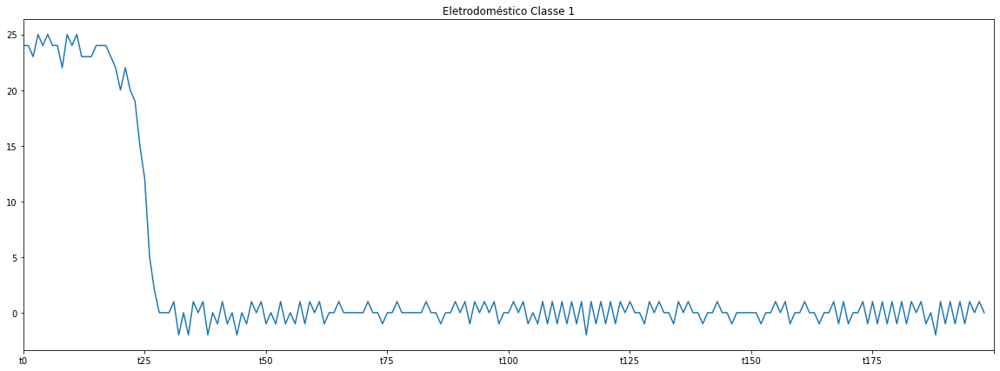

In [ ]:
#Plotando exemplo da Classe 1

dfT[0][:199].plot(figsize=(20,7))
plt.legend().remove()
plt.xlim([0,200])
plt.title('Eletrodoméstico Classe 1')

In [ ]:
df[df['Classes']==2].head()

,t0,t1,t2,t3,t4,t5,t6,t7,t8,t9,t10,t11,t12,t13,t14,t15,t16,t17,t18,t19,t20,t21,t22,t23,t24,t25,t26,t27,t28,t29,t30,t31,t32,t33,t34,t35,t36,t37,t38,t39,...,t161,t162,t163,t164,t165,t166,t167,t168,t169,t170,t171,t172,t173,t174,t175,t176,t177,t178,t179,t180,t181,t182,t183,t184,t185,t186,t187,t188,t189,t190,t191,t192,t193,t194,t195,t196,t197,t198,t199,Classes
4,24.85,2.85,5.85,-1.15,2.85,-1.15,1.85,-1.15,0.85,-1.15,1.85,-0.15,0.85,-1.15,-0.15,-0.15,0.85,-0.15,0.85,-1.15,-0.15,-0.15,0.85,-0.15,0.85,-1.15,-0.15,-0.15,0.85,-0.15,0.85,-1.15,-0.15,-0.15,0.85,-0.15,0.85,-1.15,-0.15,-0.15,...,-0.15,0.85,-0.15,-0.15,-1.15,0.85,-0.15,0.85,-1.15,-0.15,-1.15,0.85,-0.15,0.85,-0.15,-0.15,-1.15,0.85,-0.15,1.85,-1.15,-0.15,-1.15,0.85,-0.15,0.85,-0.15,-0.15,-1.15,0.85,-0.15,0.85,-1.15,-0.15,-1.15,0.85,-0.15,0.85,-0.15,2
5,-0.35,-0.35,0.65,-0.35,0.65,-0.35,-0.35,-0.35,0.65,-0.35,0.65,-0.35,-0.35,-0.35,0.65,-0.35,0.65,-0.35,0.65,-0.35,0.65,-0.35,0.65,-0.35,-0.35,-0.35,0.65,-0.35,0.65,-0.35,0.65,-0.35,0.65,-0.35,0.65,-0.35,-0.35,-0.35,0.65,-0.35,...,-0.35,0.65,-0.35,0.65,-0.35,0.65,-0.35,-0.35,-0.35,0.65,-0.35,0.65,-0.35,0.65,-0.35,0.65,-0.35,0.65,-0.35,-0.35,-0.35,0.65,-0.35,0.65,-0.35,0.65,-0.35,0.65,-0.35,0.65,-0.35,-0.35,-0.35,0.65,-0.35,0.65,-0.35,-0.35,-0.35,2
6,0.45,0.45,1.45,0.45,1.45,0.45,1.45,0.45,1.45,0.45,1.45,0.45,1.45,0.45,1.45,0.45,0.45,0.45,1.45,-0.55,0.45,-0.55,0.45,-0.55,0.45,-0.55,0.45,-0.55,1.45,0.45,1.45,-0.55,0.45,-0.55,0.45,0.45,1.45,0.45,-0.55,-0.55,...,-0.55,1.45,0.45,0.45,-0.55,0.45,0.45,0.45,-0.55,0.45,-0.55,0.45,-0.55,0.45,-0.55,-0.55,-0.55,0.45,0.45,0.45,0.45,-0.55,-0.55,0.45,-0.55,0.45,-0.55,0.45,-0.55,0.45,0.45,0.45,-0.55,-0.55,-0.55,0.45,0.45,0.45,-0.55,2
7,4.90,5.90,6.90,4.90,3.90,2.90,3.90,3.90,4.90,3.90,3.90,2.90,1.90,3.90,3.90,3.90,1.90,1.90,1.90,1.90,2.90,4.90,2.90,-0.10,0.90,-1.10,2.90,1.90,1.90,-0.10,0.90,0.90,1.90,0.90,1.90,-1.10,0.90,0.90,2.90,0.90,...,-4.10,-1.10,-0.10,2.90,-1.10,0.90,-0.10,-0.10,-1.10,-0.10,-0.10,-0.10,-1.10,-0.10,-1.10,0.90,-0.10,0.90,-1.10,-0.10,-0.10,1.90,-0.10,-0.10,-1.10,-1.10,-1.10,0.90,-0.10,1.90,2.90,-0.10,-0.10,-0.10,-0.10,-0.10,-1.10,-1.10,-1.10,2
8,0.10,0.10,-0.90,0.10,0.10,0.10,0.10,-0.90,-0.90,0.10,0.10,0.10,0.10,-0.90,0.10,-0.90,0.10,0.10,0.10,-0.90,0.10,-0.90,0.10,0.10,0.10,0.10,0.10,-0.90,1.10,0.10,0.10,-0.90,0.10,0.10,0.10,1.10,0.10,0.10,-0.90,-0.90,...,0.10,0.10,0.10,0.10,-0.90,0.10,0.10,0.10,0.10,0.10,-0.90,0.10,0.10,0.10,-0.90,0.10,-0.90,0.10,0.10,0.10,0.10,0.10,-0.90,0.10,0.10,1.10,-0.90,0.10,-0.90,0.10,0.10,0.10,0.10,0.10,-0.90,0.10,0.10,1.10,0.10,2


Text(0.5, 1.0, 'Eletrodoméstico Classe 2')

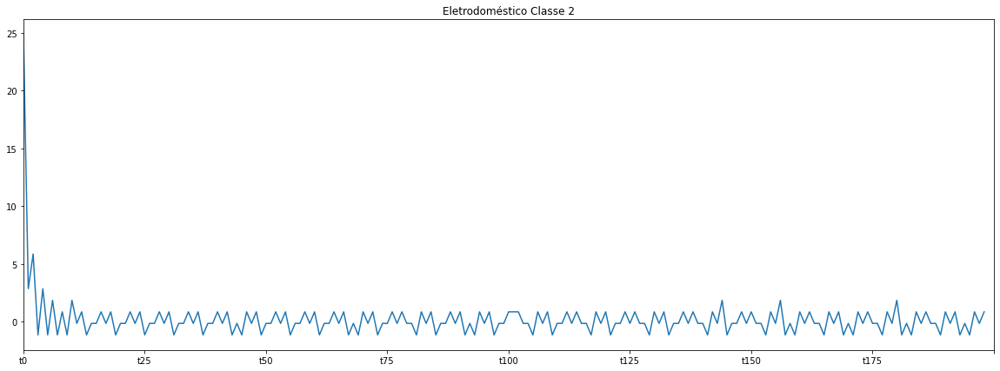

In [ ]:
#Plotando exemplo da Classe 2

dfT[4][:199].plot(figsize=(20,7))
plt.legend().remove()
plt.xlim([0,200])
plt.title('Eletrodoméstico Classe 2')

In [ ]:
df[df['Classes']==3].head()

,t0,t1,t2,t3,t4,t5,t6,t7,t8,t9,t10,t11,t12,t13,t14,t15,t16,t17,t18,t19,t20,t21,t22,t23,t24,t25,t26,t27,t28,t29,t30,t31,t32,t33,t34,t35,t36,t37,t38,t39,...,t161,t162,t163,t164,t165,t166,t167,t168,t169,t170,t171,t172,t173,t174,t175,t176,t177,t178,t179,t180,t181,t182,t183,t184,t185,t186,t187,t188,t189,t190,t191,t192,t193,t194,t195,t196,t197,t198,t199,Classes
9,14.30,11.30,8.30,8.30,8.30,8.30,8.30,7.30,6.30,6.30,5.30,7.30,4.30,5.30,3.30,4.30,3.30,4.30,3.30,4.30,2.30,3.30,1.30,3.30,2.30,3.30,0.30,2.30,1.30,2.30,1.30,2.30,0.30,1.30,-0.70,1.30,0.30,2.30,1.30,1.30,...,0.30,-0.70,0.30,-0.70,1.30,-0.70,0.30,-0.70,0.30,-0.70,1.30,-0.70,1.30,-0.70,0.30,-0.70,1.30,1.30,1.30,-0.70,0.30,-0.70,1.30,-0.70,0.30,-0.70,0.30,-0.70,1.30,-0.70,0.30,-0.70,0.30,-0.70,0.30,0.30,1.30,-0.70,0.30,3
10,15.25,4.25,8.25,4.25,8.25,5.25,6.25,5.25,5.25,5.25,6.25,5.25,5.25,5.25,4.25,5.25,5.25,5.25,6.25,4.25,4.25,5.25,4.25,5.25,4.25,4.25,4.25,3.25,4.25,3.25,2.25,1.25,1.25,1.25,0.25,0.25,0.25,-0.75,1.25,0.25,...,-0.75,0.25,0.25,0.25,0.25,1.25,-0.75,0.25,-0.75,0.25,-0.75,1.25,-0.75,-0.75,0.25,0.25,0.25,0.25,-0.75,0.25,-0.75,0.25,0.25,1.25,-0.75,0.25,0.25,0.25,0.25,0.25,-0.75,-0.75,-0.75,0.25,0.25,0.25,-0.75,0.25,0.25,3
11,3.55,6.55,4.55,6.55,6.55,5.55,3.55,5.55,3.55,5.55,4.55,5.55,3.55,4.55,1.55,4.55,5.55,4.55,2.55,4.55,1.55,3.55,2.55,3.55,1.55,3.55,1.55,3.55,1.55,3.55,0.55,2.55,0.55,2.55,0.55,2.55,1.55,2.55,1.55,2.55,...,-0.45,-2.45,-0.45,-0.45,-1.45,-2.45,1.55,-1.45,0.55,-2.45,-0.45,-1.45,-1.45,-2.45,0.55,-1.45,0.55,-2.45,0.55,-1.45,0.55,-3.45,-0.45,-2.45,-0.45,-2.45,1.55,-0.45,0.55,-2.45,13.55,-0.45,0.55,-1.45,-0.45,1.55,-0.45,-2.45,0.55,3
12,23.50,21.50,21.50,18.50,16.50,14.50,14.50,8.50,2.50,7.50,7.50,8.50,-2.50,6.50,4.50,6.50,-0.50,2.50,0.50,3.50,-0.50,0.50,0.50,5.50,8.50,-2.50,5.50,4.50,-1.50,6.50,2.50,1.50,-1.50,5.50,4.50,3.50,-2.50,3.50,-2.50,4.50,...,-2.50,-2.50,-0.50,-2.50,-2.50,-0.50,-0.50,28.50,-2.50,-2.50,-2.50,-2.50,0.50,1.50,-2.50,-2.50,-0.50,-2.50,0.50,1.50,2.50,-1.50,-2.50,4.50,0.50,-2.50,1.50,-1.50,3.50,-2.50,-2.50,-1.50,1.50,-2.50,3.50,-2.50,0.50,-2.50,2.50,3
13,22.45,21.45,21.45,19.45,17.45,18.45,19.45,18.45,18.45,15.45,14.45,14.45,16.45,15.45,16.45,13.45,12.45,11.45,13.45,13.45,13.45,11.45,11.45,9.45,10.45,11.45,11.45,10.45,9.45,7.45,9.45,9.45,10.45,8.45,8.45,6.45,8.45,8.45,8.45,7.45,...,-0.55,0.45,-1.55,1.45,0.45,1.45,-0.55,1.45,-0.55,1.45,0.45,1.45,-0.55,-0.55,-0.55,1.45,0.45,0.45,-1.55,-0.55,-1.55,0.45,0.45,0.45,-0.55,0.45,-1.55,1.45,0.45,1.45,-0.55,0.45,-1.55,1.45,0.45,1.45,-0.55,-0.55,-1.55,3


Text(0.5, 1.0, 'Eletrodoméstico Classe 3')

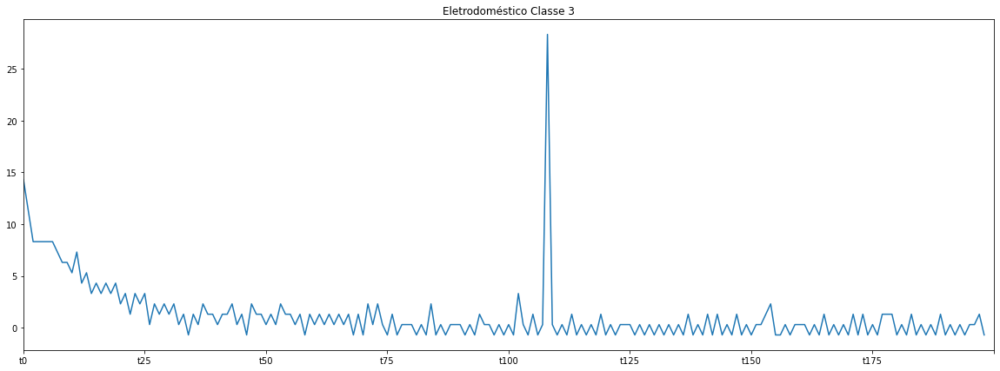

In [ ]:
#Plotando exemplo da Classe 3

dfT[9][:199].plot(figsize=(20,7))
plt.legend().remove()
plt.xlim([0,200])
plt.title('Eletrodoméstico Classe 3')

In [ ]:
df[df['Classes']==4].head()

,t0,t1,t2,t3,t4,t5,t6,t7,t8,t9,t10,t11,t12,t13,t14,t15,t16,t17,t18,t19,t20,t21,t22,t23,t24,t25,t26,t27,t28,t29,t30,t31,t32,t33,t34,t35,t36,t37,t38,t39,...,t161,t162,t163,t164,t165,t166,t167,t168,t169,t170,t171,t172,t173,t174,t175,t176,t177,t178,t179,t180,t181,t182,t183,t184,t185,t186,t187,t188,t189,t190,t191,t192,t193,t194,t195,t196,t197,t198,t199,Classes
16,9.65,-1.35,2.65,-1.35,0.65,-1.35,1.65,-0.35,1.65,0.65,0.65,-0.35,-0.35,-1.35,1.65,-1.35,-0.35,-0.35,0.65,-0.35,0.65,-0.35,-0.35,-0.35,0.65,-1.35,0.65,-1.35,-0.35,-0.35,-0.35,-1.35,0.65,-1.35,0.65,-0.35,1.65,-1.35,0.65,-1.35,...,-1.35,0.65,-0.35,-0.35,-1.35,-0.35,-1.35,1.65,-0.35,-0.35,-1.35,-0.35,-0.35,0.65,-1.35,0.65,-1.35,0.65,-1.35,1.65,-1.35,-0.35,-1.35,0.65,-0.35,1.65,-0.35,-0.35,-1.35,0.65,-1.35,1.65,-0.35,-0.35,-1.35,1.65,-0.35,1.65,-0.35,4
17,9.20,3.20,3.20,3.20,3.20,3.20,4.20,3.20,3.20,3.20,3.20,3.20,3.20,4.20,3.20,3.20,2.20,3.20,3.20,3.20,2.20,3.20,2.20,3.20,2.20,4.20,2.20,3.20,2.20,3.20,3.20,3.20,3.20,3.20,2.20,3.20,3.20,4.20,3.20,3.20,...,-0.80,0.20,0.20,0.20,0.20,0.20,0.20,0.20,0.20,-0.80,0.20,-0.80,1.20,0.20,0.20,-0.80,0.20,-0.80,1.20,-0.80,1.20,-0.80,0.20,0.20,0.20,-0.80,0.20,-0.80,0.20,0.20,0.20,0.20,0.20,-0.80,0.20,0.20,0.20,0.20,0.20,4
78,9.30,8.30,8.30,7.30,7.30,8.30,9.30,8.30,8.30,7.30,8.30,6.30,9.30,6.30,10.30,6.30,9.30,7.30,10.30,7.30,8.30,7.30,8.30,5.30,8.30,7.30,9.30,6.30,8.30,6.30,8.30,7.30,9.30,7.30,8.30,7.30,8.30,8.30,9.30,7.30,...,-0.70,0.30,-1.70,0.30,-0.70,0.30,-0.70,2.30,-1.70,1.30,-0.70,0.30,-0.70,-0.70,-0.70,1.30,-0.70,0.30,-1.70,1.30,-0.70,1.30,-0.70,0.30,-0.70,0.30,-1.70,1.30,-0.70,1.30,-0.70,0.30,0.30,1.30,-1.70,0.30,-0.70,0.30,-0.70,4
79,6.05,1.05,3.05,1.05,4.05,2.05,3.05,2.05,3.05,1.05,4.05,2.05,3.05,1.05,3.05,1.05,4.05,1.05,4.05,1.05,4.05,1.05,4.05,2.05,4.05,1.05,3.05,1.05,4.05,2.05,4.05,2.05,3.05,1.05,3.05,3.05,3.05,2.05,2.05,2.05,...,0.05,2.05,0.05,2.05,0.05,1.05,0.05,2.05,1.05,1.05,0.05,0.05,0.05,1.05,0.05,0.05,0.05,0.05,-0.95,0.05,1.05,0.05,0.05,0.05,0.05,0.05,1.05,0.05,0.05,0.05,0.05,0.05,-0.95,0.05,-0.95,0.05,-0.95,1.05,-0.95,4
80,9.65,-1.35,2.65,-1.35,0.65,-1.35,1.65,-0.35,1.65,0.65,0.65,-0.35,-0.35,-1.35,1.65,-1.35,-0.35,-0.35,0.65,-0.35,0.65,-0.35,-0.35,-0.35,0.65,-1.35,0.65,-1.35,-0.35,-0.35,-0.35,-1.35,0.65,-1.35,0.65,-0.35,1.65,-1.35,0.65,-1.35,...,-1.35,0.65,-0.35,-0.35,-1.35,-0.35,-1.35,1.65,-0.35,-0.35,-1.35,-0.35,-0.35,0.65,-1.35,0.65,-1.35,0.65,-1.35,1.65,-1.35,-0.35,-1.35,0.65,-0.35,1.65,-0.35,-0.35,-1.35,0.65,-1.35,1.65,-0.35,-0.35,-1.35,1.65,-0.35,1.65,-0.35,4


Text(0.5, 1.0, 'Eletrodoméstico Classe 4')

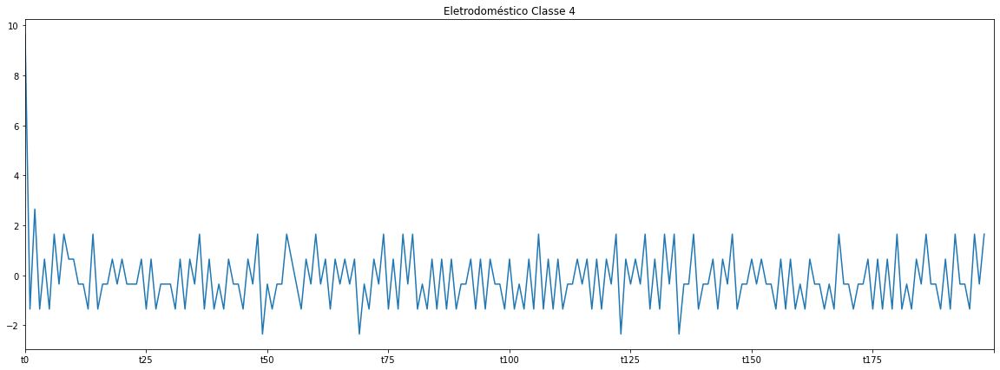

In [ ]:
#Plotando exemplo da Classe 4

dfT[16][:199].plot(figsize=(20,7))
plt.legend().remove()
plt.xlim([0,200])
plt.title('Eletrodoméstico Classe 4')

In [ ]:
df[df['Classes']==5].head()

,t0,t1,t2,t3,t4,t5,t6,t7,t8,t9,t10,t11,t12,t13,t14,t15,t16,t17,t18,t19,t20,t21,t22,t23,t24,t25,t26,t27,t28,t29,t30,t31,t32,t33,t34,t35,t36,t37,t38,t39,...,t161,t162,t163,t164,t165,t166,t167,t168,t169,t170,t171,t172,t173,t174,t175,t176,t177,t178,t179,t180,t181,t182,t183,t184,t185,t186,t187,t188,t189,t190,t191,t192,t193,t194,t195,t196,t197,t198,t199,Classes
18,14.35,10.35,5.35,4.35,3.35,3.35,1.35,2.35,-0.65,1.35,1.35,2.35,1.35,2.35,-0.65,0.35,0.35,1.35,0.35,1.35,-0.65,0.35,0.35,2.35,0.35,1.35,-0.65,0.35,0.35,1.35,0.35,1.35,-0.65,0.35,-0.65,1.35,0.35,1.35,-0.65,0.35,...,-0.65,-0.65,-0.65,1.35,-0.65,1.35,-0.65,-0.65,-0.65,1.35,-0.65,0.35,-0.65,0.35,-0.65,1.35,-0.65,1.35,-0.65,-0.65,-0.65,1.35,-0.65,0.35,-0.65,0.35,-0.65,1.35,-0.65,1.35,-0.65,-0.65,-0.65,-0.65,1.35,-0.65,1.35,-0.65,0.35,5
19,24.90,23.90,19.90,17.90,14.90,13.90,13.90,13.90,11.90,11.90,9.90,10.90,10.90,10.90,9.90,9.90,7.90,7.90,7.90,8.90,5.90,6.90,3.90,4.90,4.90,4.90,3.90,3.90,1.90,1.90,1.90,2.90,0.90,1.90,-0.10,-0.10,-0.10,0.90,-1.10,-1.10,...,-0.10,-1.10,0.90,-0.10,0.90,-0.10,-0.10,-1.10,0.90,-0.10,0.90,-1.10,-0.10,-1.10,-0.10,-0.10,0.90,-1.10,-0.10,-1.10,0.90,-0.10,0.90,-1.10,-0.10,-2.10,0.90,-0.10,0.90,-0.10,-0.10,-1.10,0.90,0.90,0.90,-0.10,-0.10,-1.10,0.90,5
20,25.45,25.45,17.45,17.45,20.45,21.45,21.45,19.45,18.45,15.45,15.45,16.45,15.45,15.45,14.45,13.45,12.45,14.45,13.45,13.45,12.45,11.45,10.45,11.45,10.45,11.45,8.45,8.45,6.45,7.45,7.45,7.45,6.45,4.45,2.45,5.45,4.45,5.45,3.45,3.45,...,-1.55,0.45,1.45,1.45,1.45,-0.55,-0.55,-1.55,2.45,-0.55,1.45,-0.55,-1.55,-0.55,0.45,0.45,0.45,0.45,-1.55,-0.55,0.45,0.45,0.45,-0.55,-1.55,-0.55,1.45,1.45,1.45,-0.55,-1.55,-1.55,1.45,0.45,1.45,-0.55,-0.55,-1.55,0.45,5
21,22.05,13.05,8.05,3.05,1.05,2.05,3.05,2.05,0.05,1.05,0.05,0.05,1.05,0.05,1.05,0.05,0.05,0.05,0.05,0.05,0.05,1.05,0.05,0.05,1.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,-0.95,0.05,0.05,0.05,1.05,-0.95,0.05,...,0.05,1.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,-0.95,-0.95,0.05,0.05,0.05,0.05,-0.95,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,-0.95,-0.95,1.05,0.05,0.05,0.05,0.05,0.05,0.05,5
84,19.60,5.60,3.60,4.60,2.60,2.60,-0.40,0.60,1.60,3.60,0.60,0.60,-1.40,-0.40,0.60,2.60,1.60,1.60,-2.40,-0.40,0.60,2.60,0.60,0.60,-2.40,-0.40,0.60,2.60,0.60,0.60,-2.40,-0.40,0.60,2.60,0.60,0.60,-2.40,-1.40,1.60,2.60,...,0.60,-2.40,0.60,-0.40,2.60,0.60,0.60,-2.40,-0.40,0.60,2.60,1.60,0.60,-2.40,-0.40,0.60,2.60,0.60,0.60,-2.40,-0.40,1.60,1.60,1.60,0.60,-2.40,-0.40,0.60,2.60,0.60,0.60,-2.40,-1.40,0.60,1.60,0.60,0.60,-2.40,-1.40,5


Text(0.5, 1.0, 'Eletrodoméstico Classe 5')

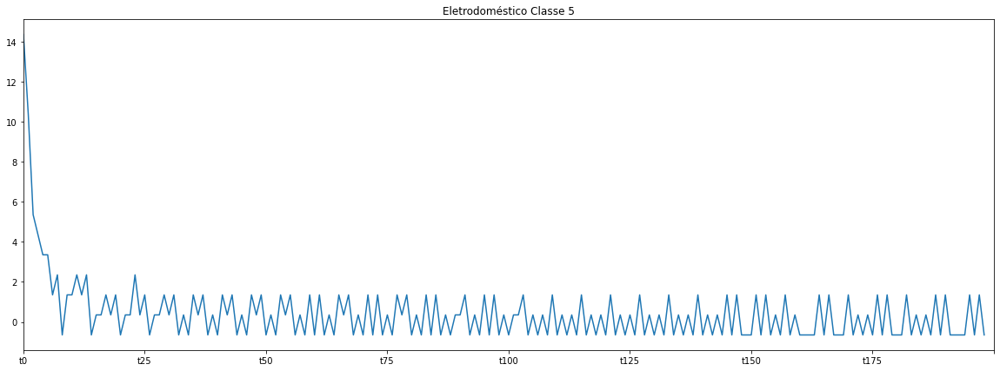

In [ ]:
#Plotando exemplo da Classe 5

dfT[18][:199].plot(figsize=(20,7))
plt.legend().remove()
plt.xlim([0,200])
plt.title('Eletrodoméstico Classe 5')

In [ ]:
df[df['Classes']==6].head()

,t0,t1,t2,t3,t4,t5,t6,t7,t8,t9,t10,t11,t12,t13,t14,t15,t16,t17,t18,t19,t20,t21,t22,t23,t24,t25,t26,t27,t28,t29,t30,t31,t32,t33,t34,t35,t36,t37,t38,t39,...,t161,t162,t163,t164,t165,t166,t167,t168,t169,t170,t171,t172,t173,t174,t175,t176,t177,t178,t179,t180,t181,t182,t183,t184,t185,t186,t187,t188,t189,t190,t191,t192,t193,t194,t195,t196,t197,t198,t199,Classes
22,11.55,5.55,2.55,1.55,0.55,1.55,0.55,0.55,-0.45,0.55,-0.45,0.55,-0.45,0.55,-0.45,0.55,-0.45,0.55,-0.45,0.55,-0.45,0.55,-0.45,0.55,-1.45,0.55,-0.45,0.55,-0.45,0.55,-0.45,0.55,-0.45,0.55,-0.45,0.55,-1.45,0.55,-0.45,0.55,...,0.55,-0.45,0.55,-0.45,0.55,-0.45,0.55,-0.45,0.55,-0.45,0.55,-0.45,0.55,-0.45,0.55,-0.45,0.55,-0.45,0.55,-0.45,0.55,-0.45,0.55,-0.45,0.55,-0.45,0.55,-0.45,0.55,-0.45,0.55,-0.45,0.55,-1.45,0.55,-0.45,0.55,-0.45,0.55,6
23,14.35,4.35,1.35,2.35,-0.65,0.35,0.35,1.35,0.35,0.35,-0.65,1.35,0.35,-0.65,-1.65,-0.65,0.35,0.35,-0.65,-0.65,0.35,0.35,0.35,0.35,-0.65,-0.65,-0.65,0.35,-0.65,-0.65,0.35,0.35,0.35,-0.65,-0.65,0.35,-0.65,0.35,-0.65,0.35,...,0.35,-1.65,0.35,-0.65,0.35,0.35,0.35,-0.65,-0.65,-1.65,0.35,-0.65,-0.65,0.35,-0.65,-0.65,0.35,1.35,-0.65,0.35,-0.65,0.35,0.35,0.35,0.35,-0.65,0.35,0.35,0.35,0.35,-0.65,0.35,-0.65,0.35,-1.65,0.35,0.35,0.35,-0.65,6
96,11.55,5.55,2.55,1.55,0.55,1.55,0.55,0.55,-0.45,0.55,-0.45,0.55,-0.45,0.55,-0.45,0.55,-0.45,0.55,-0.45,0.55,-0.45,0.55,-0.45,0.55,-1.45,0.55,-0.45,0.55,-0.45,0.55,-0.45,0.55,-0.45,0.55,-0.45,0.55,-1.45,0.55,-0.45,0.55,...,0.55,-0.45,0.55,-0.45,0.55,-0.45,0.55,-0.45,0.55,-0.45,0.55,-0.45,0.55,-0.45,0.55,-0.45,0.55,-0.45,0.55,-0.45,0.55,-0.45,0.55,-0.45,0.55,-0.45,0.55,-0.45,0.55,-0.45,0.55,-0.45,0.55,-1.45,0.55,-0.45,0.55,-0.45,0.55,6
97,14.35,4.35,1.35,2.35,-0.65,0.35,0.35,1.35,0.35,0.35,-0.65,1.35,0.35,-0.65,-1.65,-0.65,0.35,0.35,-0.65,-0.65,0.35,0.35,0.35,0.35,-0.65,-0.65,-0.65,0.35,-0.65,-0.65,0.35,0.35,0.35,-0.65,-0.65,0.35,-0.65,0.35,-0.65,0.35,...,0.35,-1.65,0.35,-0.65,0.35,0.35,0.35,-0.65,-0.65,-1.65,0.35,-0.65,-0.65,0.35,-0.65,-0.65,0.35,1.35,-0.65,0.35,-0.65,0.35,0.35,0.35,0.35,-0.65,0.35,0.35,0.35,0.35,-0.65,0.35,-0.65,0.35,-1.65,0.35,0.35,0.35,-0.65,6


Text(0.5, 1.0, 'Eletrodoméstico Classe 6')

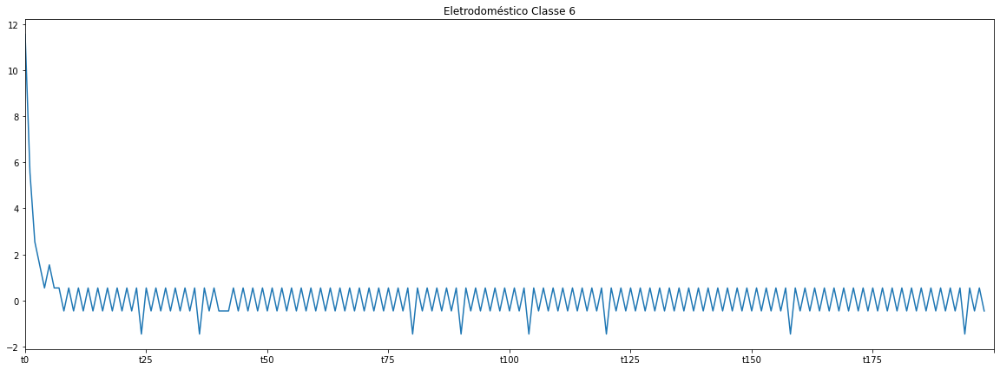

In [ ]:
#Plotando exemplo da Classe 6

dfT[22][:199].plot(figsize=(20,7))
plt.legend().remove()
plt.xlim([0,200])
plt.title('Eletrodoméstico Classe 6')

In [ ]:
df[df['Classes']==7].head()

,t0,t1,t2,t3,t4,t5,t6,t7,t8,t9,t10,t11,t12,t13,t14,t15,t16,t17,t18,t19,t20,t21,t22,t23,t24,t25,t26,t27,t28,t29,t30,t31,t32,t33,t34,t35,t36,t37,t38,t39,...,t161,t162,t163,t164,t165,t166,t167,t168,t169,t170,t171,t172,t173,t174,t175,t176,t177,t178,t179,t180,t181,t182,t183,t184,t185,t186,t187,t188,t189,t190,t191,t192,t193,t194,t195,t196,t197,t198,t199,Classes
24,-5.3,-6.3,-6.3,-6.3,-5.3,-3.3,-4.3,-6.3,-6.3,-4.3,-6.3,-6.3,-5.3,-5.3,-3.3,-3.3,-5.3,-4.3,-5.3,-5.3,-5.3,-5.3,-5.3,-5.3,-5.3,-5.3,-4.3,-6.3,-5.3,-6.3,-6.3,-4.3,-3.3,-6.3,-4.3,-3.3,-5.3,-2.3,-4.3,-5.3,...,-0.3,-0.3,-4.3,-1.3,-0.3,-1.3,0.7,0.7,-1.3,-2.3,-2.3,-1.3,0.7,-0.3,3.7,0.7,-1.3,-0.3,-0.3,-0.3,-0.3,0.7,-0.3,-1.3,-1.3,-1.3,-0.3,-0.3,1.7,0.7,-0.3,0.7,-1.3,-0.3,2.7,1.7,-0.3,-0.3,-0.3,7
25,22.7,-5.3,-0.3,-5.3,-1.3,-3.3,-1.3,-3.3,-2.3,-3.3,-2.3,-3.3,-1.3,-3.3,-2.3,-4.3,-1.3,-3.3,-1.3,-3.3,-2.3,-4.3,-2.3,-3.3,-1.3,-3.3,-2.3,-4.3,-2.3,-3.3,-2.3,-3.3,-2.3,-4.3,-1.3,-3.3,-1.3,-3.3,-2.3,-4.3,...,-1.3,0.7,-1.3,1.7,-1.3,1.7,-2.3,0.7,-1.3,2.7,-1.3,0.7,-2.3,0.7,-1.3,1.7,-1.3,1.7,-2.3,0.7,-1.3,1.7,-1.3,1.7,-1.3,0.7,-1.3,2.7,-1.3,1.7,-2.3,1.7,-1.3,1.7,-0.3,0.7,-2.3,0.7,-1.3,7
98,22.7,-5.3,-0.3,-5.3,-1.3,-3.3,-1.3,-3.3,-2.3,-3.3,-2.3,-3.3,-1.3,-3.3,-2.3,-4.3,-1.3,-3.3,-1.3,-3.3,-2.3,-4.3,-2.3,-3.3,-1.3,-3.3,-2.3,-4.3,-2.3,-3.3,-2.3,-3.3,-2.3,-4.3,-1.3,-3.3,-1.3,-3.3,-2.3,-4.3,...,-1.3,0.7,-1.3,1.7,-1.3,1.7,-2.3,0.7,-1.3,2.7,-1.3,0.7,-2.3,0.7,-1.3,1.7,-1.3,1.7,-2.3,0.7,-1.3,1.7,-1.3,1.7,-1.3,0.7,-1.3,2.7,-1.3,1.7,-2.3,1.7,-1.3,1.7,-0.3,0.7,-2.3,0.7,-1.3,7
99,-5.3,-6.3,-6.3,-6.3,-5.3,-3.3,-4.3,-6.3,-6.3,-4.3,-6.3,-6.3,-5.3,-5.3,-3.3,-3.3,-5.3,-4.3,-5.3,-5.3,-5.3,-5.3,-5.3,-5.3,-5.3,-5.3,-4.3,-6.3,-5.3,-6.3,-6.3,-4.3,-3.3,-6.3,-4.3,-3.3,-5.3,-2.3,-4.3,-5.3,...,-0.3,-0.3,-4.3,-1.3,-0.3,-1.3,0.7,0.7,-1.3,-2.3,-2.3,-1.3,0.7,-0.3,3.7,0.7,-1.3,-0.3,-0.3,-0.3,-0.3,0.7,-0.3,-1.3,-1.3,-1.3,-0.3,-0.3,1.7,0.7,-0.3,0.7,-1.3,-0.3,2.7,1.7,-0.3,-0.3,-0.3,7


Text(0.5, 1.0, 'Eletrodoméstico Classe 7')

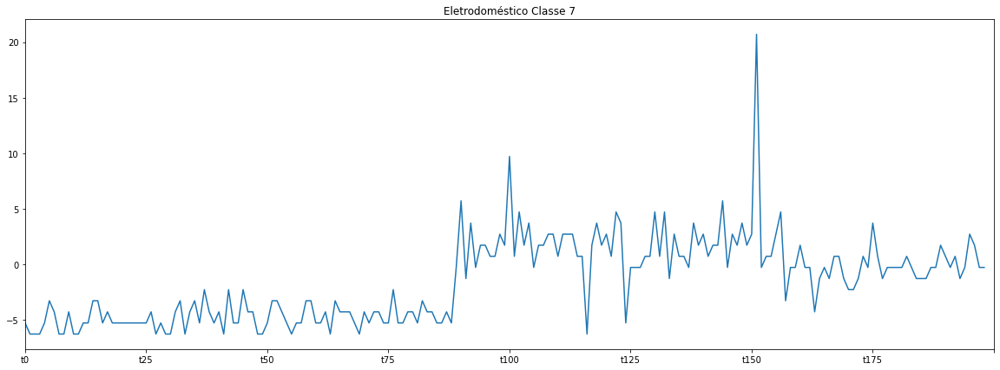

In [ ]:
#Plotando exemplo da Classe 7

dfT[24][:199].plot(figsize=(20,7))
plt.legend().remove()
plt.xlim([0,200])
plt.title('Eletrodoméstico Classe 7')

Separando o que será variável independentes e dependentes

In [ ]:
X = df.iloc[0:,:200]
X.head()

,t0,t1,t2,t3,t4,t5,t6,t7,t8,t9,t10,t11,t12,t13,t14,t15,t16,t17,t18,t19,t20,t21,t22,t23,t24,t25,t26,t27,t28,t29,t30,t31,t32,t33,t34,t35,t36,t37,t38,t39,...,t160,t161,t162,t163,t164,t165,t166,t167,t168,t169,t170,t171,t172,t173,t174,t175,t176,t177,t178,t179,t180,t181,t182,t183,t184,t185,t186,t187,t188,t189,t190,t191,t192,t193,t194,t195,t196,t197,t198,t199
0,24.00,24.00,23.00,25.00,24.00,25.00,24.00,24.00,22.00,25.00,24.00,25.00,23.00,23.00,23.00,24.00,24.00,24.00,23.00,22.00,20.00,22.00,20.00,19.00,15.00,12.00,5.00,2.00,0.00,0.00,0.00,1.00,-2.00,0.00,-2.00,1.00,0.00,1.00,-2.00,0.00,...,0.00,1.00,0.00,0.00,-1.00,0.00,0.00,1.00,-1.00,1.00,-1.00,0.00,0.00,1.00,-1.00,1.00,-1.00,1.00,-1.00,1.00,-1.00,1.00,-1.00,1.00,0.00,1.00,-1.00,0.00,-2.00,1.00,-1.00,1.00,-1.00,1.00,-1.00,1.00,0.00,1.00,0.00,0.00
1,23.00,23.00,22.00,21.00,21.00,22.00,23.00,23.00,22.00,21.00,21.00,22.00,23.00,22.00,22.00,21.00,21.00,21.00,23.00,22.00,23.00,20.00,21.00,22.00,23.00,22.00,22.00,20.00,22.00,21.00,23.00,21.00,22.00,20.00,21.00,21.00,22.00,22.00,21.00,19.00,...,1.00,0.00,2.00,0.00,2.00,-1.00,1.00,-1.00,1.00,0.00,1.00,-1.00,1.00,-1.00,1.00,0.00,1.00,-1.00,1.00,-1.00,1.00,0.00,1.00,-1.00,0.00,-1.00,1.00,-1.00,1.00,-1.00,0.00,-1.00,1.00,0.00,1.00,-1.00,0.00,-1.00,1.00,0.00
2,-0.55,-0.55,-0.55,3.45,13.45,11.45,18.45,18.45,20.45,20.45,21.45,19.45,20.45,18.45,20.45,20.45,20.45,20.45,19.45,18.45,19.45,19.45,20.45,19.45,19.45,17.45,18.45,18.45,19.45,17.45,17.45,15.45,15.45,14.45,7.45,3.45,3.45,1.45,1.45,-0.55,...,0.45,-0.55,0.45,-0.55,0.45,-0.55,0.45,-0.55,0.45,-0.55,0.45,-0.55,0.45,-0.55,0.45,-0.55,0.45,-0.55,0.45,-0.55,0.45,-0.55,0.45,-0.55,0.45,-0.55,0.45,-0.55,1.45,-0.55,0.45,-0.55,0.45,-0.55,0.45,-0.55,0.45,-0.55,0.45,-0.55
3,12.30,10.30,15.30,15.30,16.30,15.30,17.30,16.30,17.30,15.30,16.30,15.30,17.30,16.30,16.30,15.30,15.30,15.30,16.30,15.30,16.30,14.30,14.30,14.30,15.30,14.30,13.30,12.30,11.30,10.30,5.30,3.30,2.30,0.30,0.30,-0.70,0.30,-0.70,0.30,-0.70,...,1.30,-0.70,0.30,-0.70,0.30,-0.70,0.30,0.30,0.30,-0.70,0.30,-0.70,1.30,-0.70,0.30,-0.70,0.30,-0.70,0.30,-0.70,0.30,-0.70,0.30,-0.70,1.30,-0.70,1.30,-0.70,0.30,-0.70,0.30,-0.70,0.30,-0.70,0.30,-0.70,1.30,-0.70,1.30,-0.70
4,24.85,2.85,5.85,-1.15,2.85,-1.15,1.85,-1.15,0.85,-1.15,1.85,-0.15,0.85,-1.15,-0.15,-0.15,0.85,-0.15,0.85,-1.15,-0.15,-0.15,0.85,-0.15,0.85,-1.15,-0.15,-0.15,0.85,-0.15,0.85,-1.15,-0.15,-0.15,0.85,-0.15,0.85,-1.15,-0.15,-0.15,...,0.85,-0.15,0.85,-0.15,-0.15,-1.15,0.85,-0.15,0.85,-1.15,-0.15,-1.15,0.85,-0.15,0.85,-0.15,-0.15,-1.15,0.85,-0.15,1.85,-1.15,-0.15,-1.15,0.85,-0.15,0.85,-0.15,-0.15,-1.15,0.85,-0.15,0.85,-1.15,-0.15,-1.15,0.85,-0.15,0.85,-0.15


In [ ]:
y = df[['Classes']]
y.head()

,Classes
0,1
1,1
2,1
3,1
4,2


Normalizando os dados de entrada 

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X = scaler.fit_transform(X)
X

array([[ 1.27121734,  1.78710051,  1.67650535, ...,  1.53900662,
         0.14028193,  0.22296581],
       [ 1.17256629,  1.67558794,  1.56357895, ..., -1.01324317,
         1.10111708,  0.22296581],
       [-1.15066576, -0.95053318, -0.98291139, ..., -0.43898696,
         0.57265775, -0.4363417 ],
       ...,
       [ 0.31923477, -0.40412157, -0.76835123, ...,  0.70952544,
         0.47657423, -0.55621579],
       [ 1.14297098, -1.48021791, -0.95467979, ..., -2.67220553,
         0.81286654, -1.33539739],
       [-1.61925821, -1.59173048, -1.6322382 , ..., -0.11995574,
        -0.14796861, -0.13665647]])

Separando os dados em treino e teste

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state=1)

In [ ]:
X_train.shape

(75, 200)

In [ ]:
X_test.shape

(25, 200)

In [ ]:
y_train.shape

(75, 1)

In [ ]:
y_test.shape

(25, 1)

Aplicando a rede neural
- Fazer um grid search para verificar o melhor classificador

In [ ]:
from sklearn.model_selection import GridSearchCV
import numpy as np

In [ ]:
parameters = {'hidden_layer_sizes':range(1,100,2), 'learning_rate_init':np.arange(0.001,0.01,0.005)}

In [ ]:
clfgrid = MLPClassifier(random_state=1, max_iter=300, validation_fraction= 0.1, verbose=True)
gridmodel = GridSearchCV(clfgrid, parameters)
gridmodel.fit(X_train, y_train)
print(gridmodel.best_estimator_)
model = gridmodel.best_estimator_

/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  % (min_groups, self.n_splits)), UserWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 1, loss = 2.04776931
Iteration 2, loss = 2.04107021
Iteration 3, loss = 2.03339141
Iteration 4, loss = 2.02587758
Iteration 5, loss = 2.01852765
Iteration 6, loss = 2.01087303
Iteration 7, loss = 2.00462562
Iteration 8, loss = 1.99872108
Iteration 9, loss = 1.99302240
Iteration 10, loss = 1.98751966
Iteration 11, loss = 1.98220220
Iteration 12, loss = 1.97709040
Iteration 13, loss = 1.97254164
Iteration 14, loss = 1.96820658
Iteration 15, loss = 1.96419127
Iteration 16, loss = 1.96001726
Iteration 17, loss = 1.95595461
Iteration 18, loss = 1.95188010
Iteration 19, loss = 1.94780975
Iteration 20, loss = 1.94369352
Iteration 21, loss = 1.93958963
Iteration 22, loss = 1.93552743
Iteration 23, loss = 1.93168578
Iteration 24, loss = 1.92800028
Iteration 25, loss = 1.92445630
Iteration 26, loss = 1.92089569
Iteration 27, loss = 1.91732351
Iteration 28, loss = 1.91374596
Iteration 29, loss = 1.91016987
Iteration 30, loss = 1.90679942
Iteration 31, loss = 1.90351622
Iteration 32, los

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 192, loss = 1.60457986
Iteration 193, loss = 1.60323675
Iteration 194, loss = 1.60205840
Iteration 195, loss = 1.60090584
Iteration 196, loss = 1.59974431
Iteration 197, loss = 1.59857681
Iteration 198, loss = 1.59740043
Iteration 199, loss = 1.59631077
Iteration 200, loss = 1.59508221
Iteration 201, loss = 1.59397122
Iteration 202, loss = 1.59280723
Iteration 203, loss = 1.59163917
Iteration 204, loss = 1.59060474
Iteration 205, loss = 1.58937975
Iteration 206, loss = 1.58833793
Iteration 207, loss = 1.58715353
Iteration 208, loss = 1.58601457
Iteration 209, loss = 1.58492121
Iteration 210, loss = 1.58377068
Iteration 211, loss = 1.58282640
Iteration 212, loss = 1.58165400
Iteration 213, loss = 1.58052528
Iteration 214, loss = 1.57945364
Iteration 215, loss = 1.57841743
Iteration 216, loss = 1.57732027
Iteration 217, loss = 1.57620875
Iteration 218, loss = 1.57511723
Iteration 219, loss = 1.57401914
Iteration 220, loss = 1.57291625
Iteration 221, loss = 1.57186457
Iteration

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 135, loss = 1.69463662
Iteration 136, loss = 1.69302053
Iteration 137, loss = 1.69141116
Iteration 138, loss = 1.68979374
Iteration 139, loss = 1.68817762
Iteration 140, loss = 1.68655790
Iteration 141, loss = 1.68493731
Iteration 142, loss = 1.68337981
Iteration 143, loss = 1.68180923
Iteration 144, loss = 1.68022182
Iteration 145, loss = 1.67862146
Iteration 146, loss = 1.67706889
Iteration 147, loss = 1.67552797
Iteration 148, loss = 1.67401502
Iteration 149, loss = 1.67251283
Iteration 150, loss = 1.67094353
Iteration 151, loss = 1.66942520
Iteration 152, loss = 1.66795924
Iteration 153, loss = 1.66650272
Iteration 154, loss = 1.66500293
Iteration 155, loss = 1.66347910
Iteration 156, loss = 1.66204890
Iteration 157, loss = 1.66066527
Iteration 158, loss = 1.65922995
Iteration 159, loss = 1.65773516
Iteration 160, loss = 1.65626097
Iteration 161, loss = 1.65490101
Iteration 162, loss = 1.65351179
Iteration 163, loss = 1.65209305
Iteration 164, loss = 1.65065066
Iteration

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 62, loss = 1.82847651
Iteration 63, loss = 1.82632866
Iteration 64, loss = 1.82419218
Iteration 65, loss = 1.82209531
Iteration 66, loss = 1.82000984
Iteration 67, loss = 1.81792546
Iteration 68, loss = 1.81584374
Iteration 69, loss = 1.81379781
Iteration 70, loss = 1.81177017
Iteration 71, loss = 1.80974825
Iteration 72, loss = 1.80773192
Iteration 73, loss = 1.80572114
Iteration 74, loss = 1.80371920
Iteration 75, loss = 1.80174961
Iteration 76, loss = 1.79978006
Iteration 77, loss = 1.79783046
Iteration 78, loss = 1.79589121
Iteration 79, loss = 1.79395381
Iteration 80, loss = 1.79203328
Iteration 81, loss = 1.79012540
Iteration 82, loss = 1.78821747
Iteration 83, loss = 1.78633652
Iteration 84, loss = 1.78446076
Iteration 85, loss = 1.78258379
Iteration 86, loss = 1.78072201
Iteration 87, loss = 1.77889956
Iteration 88, loss = 1.77700416
Iteration 89, loss = 1.77510023
Iteration 90, loss = 1.77319719
Iteration 91, loss = 1.77130998
Iteration 92, loss = 1.76942656
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 248, loss = 1.53661511
Iteration 249, loss = 1.53577025
Iteration 250, loss = 1.53491756
Iteration 251, loss = 1.53405772
Iteration 252, loss = 1.53319164
Iteration 253, loss = 1.53232043
Iteration 254, loss = 1.53144528
Iteration 255, loss = 1.53056743
Iteration 256, loss = 1.52982689
Iteration 257, loss = 1.52885915
Iteration 258, loss = 1.52802441
Iteration 259, loss = 1.52718427
Iteration 260, loss = 1.52633937
Iteration 261, loss = 1.52549052
Iteration 262, loss = 1.52463865
Iteration 263, loss = 1.52385286
Iteration 264, loss = 1.52308394
Iteration 265, loss = 1.52225317
Iteration 266, loss = 1.52135199
Iteration 267, loss = 1.52052895
Iteration 268, loss = 1.51975465
Iteration 269, loss = 1.51892595
Iteration 270, loss = 1.51814171
Iteration 271, loss = 1.51735024
Iteration 272, loss = 1.51655203
Iteration 273, loss = 1.51574789
Iteration 274, loss = 1.51493880
Iteration 275, loss = 1.51412586
Iteration 276, loss = 1.51331024
Iteration 277, loss = 1.51253223
Iteration

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 190, loss = 1.19594745
Iteration 191, loss = 1.19481052
Iteration 192, loss = 1.19355379
Iteration 193, loss = 1.19213461
Iteration 194, loss = 1.19058927
Iteration 195, loss = 1.18901221
Iteration 196, loss = 1.18771729
Iteration 197, loss = 1.18662932
Iteration 198, loss = 1.18611385
Iteration 199, loss = 1.18553150
Iteration 200, loss = 1.18461521
Iteration 201, loss = 1.18329499
Iteration 202, loss = 1.18166227
Iteration 203, loss = 1.17989342
Iteration 204, loss = 1.17937485
Iteration 205, loss = 1.17688092
Iteration 206, loss = 1.17579521
Iteration 207, loss = 1.17476765
Iteration 208, loss = 1.17368335
Iteration 209, loss = 1.17250470
Iteration 210, loss = 1.17125165
Iteration 211, loss = 1.17018078
Iteration 212, loss = 1.16868256
Iteration 213, loss = 1.16748399
Iteration 214, loss = 1.16636716
Iteration 215, loss = 1.16528789
Iteration 216, loss = 1.16420478
Iteration 217, loss = 1.16309491
Iteration 218, loss = 1.16194103
Iteration 219, loss = 1.16073471
Iteration

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 110, loss = 1.32255515
Iteration 111, loss = 1.32004950
Iteration 112, loss = 1.31753142
Iteration 113, loss = 1.31501426
Iteration 114, loss = 1.31249582
Iteration 115, loss = 1.30996684
Iteration 116, loss = 1.30742731
Iteration 117, loss = 1.30489220
Iteration 118, loss = 1.30238082
Iteration 119, loss = 1.30017885
Iteration 120, loss = 1.29765755
Iteration 121, loss = 1.29548719
Iteration 122, loss = 1.29365172
Iteration 123, loss = 1.29181520
Iteration 124, loss = 1.28982457
Iteration 125, loss = 1.28761794
Iteration 126, loss = 1.28521601
Iteration 127, loss = 1.28269105
Iteration 128, loss = 1.28040754
Iteration 129, loss = 1.27793565
Iteration 130, loss = 1.27578327
Iteration 131, loss = 1.27359449
Iteration 132, loss = 1.27132957
Iteration 133, loss = 1.26900292
Iteration 134, loss = 1.26666539
Iteration 135, loss = 1.26437383
Iteration 136, loss = 1.26284542
Iteration 137, loss = 1.26020199
Iteration 138, loss = 1.25807065
Iteration 139, loss = 1.25609969
Iteration

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 34, loss = 1.61473968
Iteration 35, loss = 1.60749588
Iteration 36, loss = 1.60029459
Iteration 37, loss = 1.59279258
Iteration 38, loss = 1.58553219
Iteration 39, loss = 1.57926268
Iteration 40, loss = 1.57304395
Iteration 41, loss = 1.56670393
Iteration 42, loss = 1.56021110
Iteration 43, loss = 1.55446333
Iteration 44, loss = 1.54887370
Iteration 45, loss = 1.54378167
Iteration 46, loss = 1.53860761
Iteration 47, loss = 1.53324183
Iteration 48, loss = 1.52844719
Iteration 49, loss = 1.52383558
Iteration 50, loss = 1.51937334
Iteration 51, loss = 1.51505024
Iteration 52, loss = 1.51085675
Iteration 53, loss = 1.50678640
Iteration 54, loss = 1.50283690
Iteration 55, loss = 1.49900984
Iteration 56, loss = 1.49530923
Iteration 57, loss = 1.49179371
Iteration 58, loss = 1.48856069
Iteration 59, loss = 1.48535110
Iteration 60, loss = 1.48232797
Iteration 61, loss = 1.47938506
Iteration 62, loss = 1.47651458
Iteration 63, loss = 1.47371247
Iteration 64, loss = 1.47145951
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 210, loss = 1.32618703
Iteration 211, loss = 1.32570154
Iteration 212, loss = 1.32521294
Iteration 213, loss = 1.32471973
Iteration 214, loss = 1.32422318
Iteration 215, loss = 1.32372588
Iteration 216, loss = 1.32323030
Iteration 217, loss = 1.32273796
Iteration 218, loss = 1.32224914
Iteration 219, loss = 1.32176308
Iteration 220, loss = 1.32127844
Iteration 221, loss = 1.32079399
Iteration 222, loss = 1.32030921
Iteration 223, loss = 1.31982456
Iteration 224, loss = 1.31934116
Iteration 225, loss = 1.31886025
Iteration 226, loss = 1.31838256
Iteration 227, loss = 1.31790811
Iteration 228, loss = 1.31743640
Iteration 229, loss = 1.31696688
Iteration 230, loss = 1.31649920
Iteration 231, loss = 1.31603335
Iteration 232, loss = 1.31556948
Iteration 233, loss = 1.31510772
Iteration 234, loss = 1.31464811
Iteration 235, loss = 1.31419058
Iteration 236, loss = 1.31373504
Iteration 237, loss = 1.31328139
Iteration 238, loss = 1.31282961
Iteration 239, loss = 1.31237976
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 149, loss = 1.24028192
Iteration 150, loss = 1.23859264
Iteration 151, loss = 1.23741060
Iteration 152, loss = 1.23576981
Iteration 153, loss = 1.23549721
Iteration 154, loss = 1.23355375
Iteration 155, loss = 1.23187909
Iteration 156, loss = 1.23005868
Iteration 157, loss = 1.22830977
Iteration 158, loss = 1.22672195
Iteration 159, loss = 1.22523624
Iteration 160, loss = 1.22374663
Iteration 161, loss = 1.22219773
Iteration 162, loss = 1.22060525
Iteration 163, loss = 1.21902026
Iteration 164, loss = 1.21748569
Iteration 165, loss = 1.21601472
Iteration 166, loss = 1.21459212
Iteration 167, loss = 1.21318598
Iteration 168, loss = 1.21176375
Iteration 169, loss = 1.21031072
Iteration 170, loss = 1.20883970
Iteration 171, loss = 1.20737954
Iteration 172, loss = 1.20595076
Iteration 173, loss = 1.20455180
Iteration 174, loss = 1.20316744
Iteration 175, loss = 1.20178627
Iteration 176, loss = 1.20040764
Iteration 177, loss = 1.19903498
Iteration 178, loss = 1.19766925
Iteration

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 69, loss = 1.34791232
Iteration 70, loss = 1.34028316
Iteration 71, loss = 1.33285973
Iteration 72, loss = 1.32553183
Iteration 73, loss = 1.31829489
Iteration 74, loss = 1.31122806
Iteration 75, loss = 1.30437964
Iteration 76, loss = 1.29764149
Iteration 77, loss = 1.29096156
Iteration 78, loss = 1.28436099
Iteration 79, loss = 1.27781517
Iteration 80, loss = 1.27132625
Iteration 81, loss = 1.26484805
Iteration 82, loss = 1.25827197
Iteration 83, loss = 1.25178106
Iteration 84, loss = 1.24531123
Iteration 85, loss = 1.23883266
Iteration 86, loss = 1.23236391
Iteration 87, loss = 1.22594669
Iteration 88, loss = 1.21966992
Iteration 89, loss = 1.21346215
Iteration 90, loss = 1.20732851
Iteration 91, loss = 1.20127262
Iteration 92, loss = 1.19529675
Iteration 93, loss = 1.18938940
Iteration 94, loss = 1.18361817
Iteration 95, loss = 1.17793039
Iteration 96, loss = 1.17230122
Iteration 97, loss = 1.16673469
Iteration 98, loss = 1.16132818
Iteration 99, loss = 1.15599513
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 167, loss = 1.03249547
Iteration 168, loss = 1.03033543
Iteration 169, loss = 1.02823122
Iteration 170, loss = 1.02624884
Iteration 171, loss = 1.02426978
Iteration 172, loss = 1.02228763
Iteration 173, loss = 1.02026386
Iteration 174, loss = 1.01820002
Iteration 175, loss = 1.01616767
Iteration 176, loss = 1.01416705
Iteration 177, loss = 1.01229913
Iteration 178, loss = 1.01033348
Iteration 179, loss = 1.00841752
Iteration 180, loss = 1.00649403
Iteration 181, loss = 1.00460294
Iteration 182, loss = 1.00272275
Iteration 183, loss = 1.00083201
Iteration 184, loss = 0.99896305
Iteration 185, loss = 0.99707210
Iteration 186, loss = 0.99523134
Iteration 187, loss = 0.99342419
Iteration 188, loss = 0.99156301
Iteration 189, loss = 0.98975614
Iteration 190, loss = 0.98801510
Iteration 191, loss = 0.98621586
Iteration 192, loss = 0.98440280
Iteration 193, loss = 0.98262232
Iteration 194, loss = 0.98092960
Iteration 195, loss = 0.97916033
Iteration 196, loss = 0.97736504
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 65, loss = 1.48167548
Iteration 66, loss = 1.47513431
Iteration 67, loss = 1.46819827
Iteration 68, loss = 1.46099176
Iteration 69, loss = 1.45358725
Iteration 70, loss = 1.44615495
Iteration 71, loss = 1.43886420
Iteration 72, loss = 1.43153145
Iteration 73, loss = 1.42417305
Iteration 74, loss = 1.41707735
Iteration 75, loss = 1.41025009
Iteration 76, loss = 1.40356030
Iteration 77, loss = 1.39692487
Iteration 78, loss = 1.39048652
Iteration 79, loss = 1.38410299
Iteration 80, loss = 1.37731101
Iteration 81, loss = 1.37046002
Iteration 82, loss = 1.36372446
Iteration 83, loss = 1.35705994
Iteration 84, loss = 1.35038310
Iteration 85, loss = 1.34364137
Iteration 86, loss = 1.33693511
Iteration 87, loss = 1.33027938
Iteration 88, loss = 1.32380724
Iteration 89, loss = 1.31742135
Iteration 90, loss = 1.31109780
Iteration 91, loss = 1.30489971
Iteration 92, loss = 1.29878606
Iteration 93, loss = 1.29276397
Iteration 94, loss = 1.28683930
Iteration 95, loss = 1.28108464
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 186, loss = 0.97614282
Iteration 187, loss = 0.97392298
Iteration 188, loss = 0.97168187
Iteration 189, loss = 0.96944288
Iteration 190, loss = 0.96725169
Iteration 191, loss = 0.96507747
Iteration 192, loss = 0.96291847
Iteration 193, loss = 0.96079638
Iteration 194, loss = 0.95869856
Iteration 195, loss = 0.95664369
Iteration 196, loss = 0.95460364
Iteration 197, loss = 0.95255921
Iteration 198, loss = 0.95059672
Iteration 199, loss = 0.94858119
Iteration 200, loss = 0.94672752
Iteration 201, loss = 0.94479289
Iteration 202, loss = 0.94283877
Iteration 203, loss = 0.94098847
Iteration 204, loss = 0.93913226
Iteration 205, loss = 0.93736049
Iteration 206, loss = 0.93548124
Iteration 207, loss = 0.93369621
Iteration 208, loss = 0.93191577
Iteration 209, loss = 0.93016249
Iteration 210, loss = 0.92841151
Iteration 211, loss = 0.92667413
Iteration 212, loss = 0.92498488
Iteration 213, loss = 0.92329338
Iteration 214, loss = 0.92160736
Iteration 215, loss = 0.91994089
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 85, loss = 1.35285051
Iteration 86, loss = 1.34843835
Iteration 87, loss = 1.34431000
Iteration 88, loss = 1.34034580
Iteration 89, loss = 1.33638550
Iteration 90, loss = 1.33249590
Iteration 91, loss = 1.32874391
Iteration 92, loss = 1.32494894
Iteration 93, loss = 1.32120575
Iteration 94, loss = 1.31754359
Iteration 95, loss = 1.31386192
Iteration 96, loss = 1.31022099
Iteration 97, loss = 1.30661435
Iteration 98, loss = 1.30302800
Iteration 99, loss = 1.29945213
Iteration 100, loss = 1.29586827
Iteration 101, loss = 1.29243326
Iteration 102, loss = 1.28901079
Iteration 103, loss = 1.28552929
Iteration 104, loss = 1.28222430
Iteration 105, loss = 1.27894553
Iteration 106, loss = 1.27565546
Iteration 107, loss = 1.27227907
Iteration 108, loss = 1.26892911
Iteration 109, loss = 1.26559637
Iteration 110, loss = 1.26218391
Iteration 111, loss = 1.25888567
Iteration 112, loss = 1.25569375
Iteration 113, loss = 1.25235894
Iteration 114, loss = 1.24898663
Iteration 115, loss = 1.2

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 210, loss = 0.25309090
Iteration 211, loss = 0.25211183
Iteration 212, loss = 0.25112413
Iteration 213, loss = 0.25013538
Iteration 214, loss = 0.24914004
Iteration 215, loss = 0.24814981
Iteration 216, loss = 0.24717351
Iteration 217, loss = 0.24624011
Iteration 218, loss = 0.24528264
Iteration 219, loss = 0.24432047
Iteration 220, loss = 0.24341412
Iteration 221, loss = 0.24262342
Iteration 222, loss = 0.24166670
Iteration 223, loss = 0.24083689
Iteration 224, loss = 0.24003149
Iteration 225, loss = 0.23915833
Iteration 226, loss = 0.23834381
Iteration 227, loss = 0.23743640
Iteration 228, loss = 0.23658770
Iteration 229, loss = 0.23574105
Iteration 230, loss = 0.23494490
Iteration 231, loss = 0.23402142
Iteration 232, loss = 0.23311914
Iteration 233, loss = 0.23224257
Iteration 234, loss = 0.23137621
Iteration 235, loss = 0.23056828
Iteration 236, loss = 0.22977902
Iteration 237, loss = 0.22900817
Iteration 238, loss = 0.22813515
Iteration 239, loss = 0.22731449
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 122, loss = 0.52836079
Iteration 123, loss = 0.52576969
Iteration 124, loss = 0.52360591
Iteration 125, loss = 0.52138483
Iteration 126, loss = 0.51904415
Iteration 127, loss = 0.51664980
Iteration 128, loss = 0.51425720
Iteration 129, loss = 0.51182324
Iteration 130, loss = 0.50943302
Iteration 131, loss = 0.50721798
Iteration 132, loss = 0.50512598
Iteration 133, loss = 0.50293250
Iteration 134, loss = 0.50075920
Iteration 135, loss = 0.49862752
Iteration 136, loss = 0.49659693
Iteration 137, loss = 0.49453290
Iteration 138, loss = 0.49247419
Iteration 139, loss = 0.49031584
Iteration 140, loss = 0.48836201
Iteration 141, loss = 0.48632150
Iteration 142, loss = 0.48420750
Iteration 143, loss = 0.48225357
Iteration 144, loss = 0.48020171
Iteration 145, loss = 0.47821438
Iteration 146, loss = 0.47618325
Iteration 147, loss = 0.47411789
Iteration 148, loss = 0.47203059
Iteration 149, loss = 0.47032811
Iteration 150, loss = 0.46854532
Iteration 151, loss = 0.46658028
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 29, loss = 1.12452754
Iteration 30, loss = 1.10992673
Iteration 31, loss = 1.09579942
Iteration 32, loss = 1.08218892
Iteration 33, loss = 1.06938200
Iteration 34, loss = 1.05772700
Iteration 35, loss = 1.04634146
Iteration 36, loss = 1.03515223
Iteration 37, loss = 1.02404607
Iteration 38, loss = 1.01283578
Iteration 39, loss = 1.00171319
Iteration 40, loss = 0.99166581
Iteration 41, loss = 0.98181681
Iteration 42, loss = 0.97216722
Iteration 43, loss = 0.96249875
Iteration 44, loss = 0.95287074
Iteration 45, loss = 0.94373427
Iteration 46, loss = 0.93485881
Iteration 47, loss = 0.92619346
Iteration 48, loss = 0.91779093
Iteration 49, loss = 0.90965190
Iteration 50, loss = 0.90185841
Iteration 51, loss = 0.89457906
Iteration 52, loss = 0.88721177
Iteration 53, loss = 0.88040920
Iteration 54, loss = 0.87375412
Iteration 55, loss = 0.86713104
Iteration 56, loss = 0.86069438
Iteration 57, loss = 0.85398528
Iteration 58, loss = 0.84758813
Iteration 59, loss = 0.84125911
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 141, loss = 0.41876060
Iteration 142, loss = 0.41715578
Iteration 143, loss = 0.41502441
Iteration 144, loss = 0.41324392
Iteration 145, loss = 0.41167144
Iteration 146, loss = 0.41003298
Iteration 147, loss = 0.40830446
Iteration 148, loss = 0.40657504
Iteration 149, loss = 0.40464574
Iteration 150, loss = 0.40294101
Iteration 151, loss = 0.40146734
Iteration 152, loss = 0.39975720
Iteration 153, loss = 0.39813755
Iteration 154, loss = 0.39644313
Iteration 155, loss = 0.39465279
Iteration 156, loss = 0.39221734
Iteration 157, loss = 0.38981476
Iteration 158, loss = 0.38738830
Iteration 159, loss = 0.38492761
Iteration 160, loss = 0.38249996
Iteration 161, loss = 0.38015174
Iteration 162, loss = 0.37791496
Iteration 163, loss = 0.37595632
Iteration 164, loss = 0.37423504
Iteration 165, loss = 0.37268618
Iteration 166, loss = 0.37100290
Iteration 167, loss = 0.36947310
Iteration 168, loss = 0.36810612
Iteration 169, loss = 0.36678125
Iteration 170, loss = 0.36540816
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 47, loss = 0.82316526
Iteration 48, loss = 0.81326582
Iteration 49, loss = 0.80397873
Iteration 50, loss = 0.79487972
Iteration 51, loss = 0.78630472
Iteration 52, loss = 0.77761625
Iteration 53, loss = 0.76951747
Iteration 54, loss = 0.76180214
Iteration 55, loss = 0.75428815
Iteration 56, loss = 0.74699040
Iteration 57, loss = 0.73994645
Iteration 58, loss = 0.73307732
Iteration 59, loss = 0.72633980
Iteration 60, loss = 0.71974576
Iteration 61, loss = 0.71331093
Iteration 62, loss = 0.70704379
Iteration 63, loss = 0.70094127
Iteration 64, loss = 0.69506447
Iteration 65, loss = 0.68928957
Iteration 66, loss = 0.68366608
Iteration 67, loss = 0.67809939
Iteration 68, loss = 0.67262163
Iteration 69, loss = 0.66720231
Iteration 70, loss = 0.66180490
Iteration 71, loss = 0.65677961
Iteration 72, loss = 0.65159280
Iteration 73, loss = 0.64610399
Iteration 74, loss = 0.64073449
Iteration 75, loss = 0.63577811
Iteration 76, loss = 0.62764635
Iteration 77, loss = 0.61853960
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 176, loss = 0.61535776
Iteration 177, loss = 0.61284966
Iteration 178, loss = 0.61039195
Iteration 179, loss = 0.60790790
Iteration 180, loss = 0.60546255
Iteration 181, loss = 0.60307021
Iteration 182, loss = 0.60077227
Iteration 183, loss = 0.59841490
Iteration 184, loss = 0.59607507
Iteration 185, loss = 0.59383642
Iteration 186, loss = 0.59150860
Iteration 187, loss = 0.58919120
Iteration 188, loss = 0.58697511
Iteration 189, loss = 0.58476678
Iteration 190, loss = 0.58250392
Iteration 191, loss = 0.58035163
Iteration 192, loss = 0.57831043
Iteration 193, loss = 0.57605624
Iteration 194, loss = 0.57390216
Iteration 195, loss = 0.57178864
Iteration 196, loss = 0.56970151
Iteration 197, loss = 0.56762236
Iteration 198, loss = 0.56559383
Iteration 199, loss = 0.56366273
Iteration 200, loss = 0.56167156
Iteration 201, loss = 0.55956943
Iteration 202, loss = 0.55753723
Iteration 203, loss = 0.55559775
Iteration 204, loss = 0.55370063
Iteration 205, loss = 0.55180360
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 85, loss = 1.03391704
Iteration 86, loss = 1.02743216
Iteration 87, loss = 1.02101189
Iteration 88, loss = 1.01467452
Iteration 89, loss = 1.00852225
Iteration 90, loss = 1.00233916
Iteration 91, loss = 0.99625810
Iteration 92, loss = 0.99019652
Iteration 93, loss = 0.98412738
Iteration 94, loss = 0.97811777
Iteration 95, loss = 0.97212352
Iteration 96, loss = 0.96620987
Iteration 97, loss = 0.96030903
Iteration 98, loss = 0.95442647
Iteration 99, loss = 0.94853833
Iteration 100, loss = 0.94281507
Iteration 101, loss = 0.93704496
Iteration 102, loss = 0.93136147
Iteration 103, loss = 0.92570570
Iteration 104, loss = 0.92010277
Iteration 105, loss = 0.91469084
Iteration 106, loss = 0.90939776
Iteration 107, loss = 0.90413306
Iteration 108, loss = 0.89885249
Iteration 109, loss = 0.89364671
Iteration 110, loss = 0.88865498
Iteration 111, loss = 0.88358145
Iteration 112, loss = 0.87859073
Iteration 113, loss = 0.87362774
Iteration 114, loss = 0.86873998
Iteration 115, loss = 0.8

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 3, loss = 2.32118717
Iteration 4, loss = 2.28115392
Iteration 5, loss = 2.24209517
Iteration 6, loss = 2.20391753
Iteration 7, loss = 2.16679336
Iteration 8, loss = 2.13147391
Iteration 9, loss = 2.09856731
Iteration 10, loss = 2.06963932
Iteration 11, loss = 2.04186023
Iteration 12, loss = 2.01468459
Iteration 13, loss = 1.98874400
Iteration 14, loss = 1.96288220
Iteration 15, loss = 1.93730668
Iteration 16, loss = 1.91292715
Iteration 17, loss = 1.88856907
Iteration 18, loss = 1.86476471
Iteration 19, loss = 1.84207255
Iteration 20, loss = 1.81943101
Iteration 21, loss = 1.79694107
Iteration 22, loss = 1.77486131
Iteration 23, loss = 1.75368145
Iteration 24, loss = 1.73213697
Iteration 25, loss = 1.71119022
Iteration 26, loss = 1.69069770
Iteration 27, loss = 1.67064320
Iteration 28, loss = 1.65026585
Iteration 29, loss = 1.63021969
Iteration 30, loss = 1.61069201
Iteration 31, loss = 1.59180657
Iteration 32, loss = 1.57363464
Iteration 33, loss = 1.55616275
Iteration 34, l

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 117, loss = 0.88854550
Iteration 118, loss = 0.88372514
Iteration 119, loss = 0.87888757
Iteration 120, loss = 0.87410344
Iteration 121, loss = 0.86940424
Iteration 122, loss = 0.86489789
Iteration 123, loss = 0.86031762
Iteration 124, loss = 0.85565211
Iteration 125, loss = 0.85101445
Iteration 126, loss = 0.84624155
Iteration 127, loss = 0.84147426
Iteration 128, loss = 0.83693963
Iteration 129, loss = 0.83236889
Iteration 130, loss = 0.82770127
Iteration 131, loss = 0.82292973
Iteration 132, loss = 0.81810498
Iteration 133, loss = 0.81324478
Iteration 134, loss = 0.80842483
Iteration 135, loss = 0.80409640
Iteration 136, loss = 0.79967849
Iteration 137, loss = 0.79507781
Iteration 138, loss = 0.79066482
Iteration 139, loss = 0.78644293
Iteration 140, loss = 0.78213056
Iteration 141, loss = 0.77797215
Iteration 142, loss = 0.77381557
Iteration 143, loss = 0.76971524
Iteration 144, loss = 0.76573248
Iteration 145, loss = 0.76176557
Iteration 146, loss = 0.75770949
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 14, loss = 1.98966341
Iteration 15, loss = 1.96597594
Iteration 16, loss = 1.94343513
Iteration 17, loss = 1.92121958
Iteration 18, loss = 1.89926540
Iteration 19, loss = 1.87662895
Iteration 20, loss = 1.85476201
Iteration 21, loss = 1.83325587
Iteration 22, loss = 1.81219137
Iteration 23, loss = 1.79005692
Iteration 24, loss = 1.76834695
Iteration 25, loss = 1.74718264
Iteration 26, loss = 1.72637339
Iteration 27, loss = 1.70614938
Iteration 28, loss = 1.68638774
Iteration 29, loss = 1.66655580
Iteration 30, loss = 1.64708750
Iteration 31, loss = 1.62807843
Iteration 32, loss = 1.60956439
Iteration 33, loss = 1.59181433
Iteration 34, loss = 1.57453611
Iteration 35, loss = 1.55749374
Iteration 36, loss = 1.54078892
Iteration 37, loss = 1.52453673
Iteration 38, loss = 1.50894437
Iteration 39, loss = 1.49375230
Iteration 40, loss = 1.47884716
Iteration 41, loss = 1.46441852
Iteration 42, loss = 1.44997001
Iteration 43, loss = 1.43547470
Iteration 44, loss = 1.42069113
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 118, loss = 0.36151630
Iteration 119, loss = 0.36001639
Iteration 120, loss = 0.35913567
Iteration 121, loss = 0.35830089
Iteration 122, loss = 0.35754258
Iteration 123, loss = 0.34644238
Iteration 124, loss = 0.33399102
Iteration 125, loss = 0.32529732
Iteration 126, loss = 0.31934304
Iteration 127, loss = 0.31579935
Iteration 128, loss = 0.31326651
Iteration 129, loss = 0.31134422
Iteration 130, loss = 0.30977560
Iteration 131, loss = 0.30844053
Iteration 132, loss = 0.30726539
Iteration 133, loss = 0.30613872
Iteration 134, loss = 0.30501972
Iteration 135, loss = 0.30441604
Iteration 136, loss = 0.30325936
Iteration 137, loss = 0.30257322
Iteration 138, loss = 0.30193099
Iteration 139, loss = 0.30120629
Iteration 140, loss = 0.30037530
Iteration 141, loss = 0.29993802
Iteration 142, loss = 0.29853536
Iteration 143, loss = 0.29764078
Iteration 144, loss = 0.29679538
Iteration 145, loss = 0.29602633
Iteration 146, loss = 0.29530957
Iteration 147, loss = 0.29457768
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 22, loss = 0.86575995
Iteration 23, loss = 0.83789450
Iteration 24, loss = 0.81293232
Iteration 25, loss = 0.78910854
Iteration 26, loss = 0.76677982
Iteration 27, loss = 0.74464450
Iteration 28, loss = 0.72456718
Iteration 29, loss = 0.70539902
Iteration 30, loss = 0.68647326
Iteration 31, loss = 0.66854214
Iteration 32, loss = 0.65067942
Iteration 33, loss = 0.63260237
Iteration 34, loss = 0.61581890
Iteration 35, loss = 0.59958327
Iteration 36, loss = 0.58394677
Iteration 37, loss = 0.56910026
Iteration 38, loss = 0.55517880
Iteration 39, loss = 0.54194743
Iteration 40, loss = 0.52900649
Iteration 41, loss = 0.51599327
Iteration 42, loss = 0.50381648
Iteration 43, loss = 0.49288829
Iteration 44, loss = 0.48176529
Iteration 45, loss = 0.47257933
Iteration 46, loss = 0.46327629
Iteration 47, loss = 0.45372580
Iteration 48, loss = 0.44430482
Iteration 49, loss = 0.43615537
Iteration 50, loss = 0.42922085
Iteration 51, loss = 0.42223740
Iteration 52, loss = 0.41520033
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 125, loss = 0.12983595
Iteration 126, loss = 0.12840465
Iteration 127, loss = 0.12705017
Iteration 128, loss = 0.12578152
Iteration 129, loss = 0.12457051
Iteration 130, loss = 0.12336138
Iteration 131, loss = 0.12216216
Iteration 132, loss = 0.12097215
Iteration 133, loss = 0.11983268
Iteration 134, loss = 0.11870859
Iteration 135, loss = 0.11763382
Iteration 136, loss = 0.11655728
Iteration 137, loss = 0.11549803
Iteration 138, loss = 0.11447578
Iteration 139, loss = 0.11349352
Iteration 140, loss = 0.11254506
Iteration 141, loss = 0.11160619
Iteration 142, loss = 0.11066981
Iteration 143, loss = 0.11004156
Iteration 144, loss = 0.10902596
Iteration 145, loss = 0.10826904
Iteration 146, loss = 0.10750229
Iteration 147, loss = 0.10675395
Iteration 148, loss = 0.10594462
Iteration 149, loss = 0.10516164
Iteration 150, loss = 0.10437980
Iteration 151, loss = 0.10360209
Iteration 152, loss = 0.10283109
Iteration 153, loss = 0.10206942
Iteration 154, loss = 0.10132440
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 17, loss = 1.05479598
Iteration 18, loss = 1.01934306
Iteration 19, loss = 0.98550674
Iteration 20, loss = 0.95278905
Iteration 21, loss = 0.92121186
Iteration 22, loss = 0.89147443
Iteration 23, loss = 0.86390116
Iteration 24, loss = 0.83780048
Iteration 25, loss = 0.81331229
Iteration 26, loss = 0.78953551
Iteration 27, loss = 0.76756451
Iteration 28, loss = 0.74663666
Iteration 29, loss = 0.72666827
Iteration 30, loss = 0.70764652
Iteration 31, loss = 0.68885562
Iteration 32, loss = 0.67087165
Iteration 33, loss = 0.65378318
Iteration 34, loss = 0.63859367
Iteration 35, loss = 0.62357675
Iteration 36, loss = 0.60863725
Iteration 37, loss = 0.59263437
Iteration 38, loss = 0.57515488
Iteration 39, loss = 0.55747718
Iteration 40, loss = 0.54010946
Iteration 41, loss = 0.52563505
Iteration 42, loss = 0.51080965
Iteration 43, loss = 0.49584697
Iteration 44, loss = 0.48198407
Iteration 45, loss = 0.47040601
Iteration 46, loss = 0.45892567
Iteration 47, loss = 0.44783499
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 133, loss = 0.14075292
Iteration 134, loss = 0.13949105
Iteration 135, loss = 0.13821123
Iteration 136, loss = 0.13691582
Iteration 137, loss = 0.13561241
Iteration 138, loss = 0.13430369
Iteration 139, loss = 0.13333334
Iteration 140, loss = 0.13187429
Iteration 141, loss = 0.13070520
Iteration 142, loss = 0.12951732
Iteration 143, loss = 0.12832357
Iteration 144, loss = 0.12708215
Iteration 145, loss = 0.12589977
Iteration 146, loss = 0.12475907
Iteration 147, loss = 0.12346756
Iteration 148, loss = 0.12224242
Iteration 149, loss = 0.12106123
Iteration 150, loss = 0.11995150
Iteration 151, loss = 0.11882180
Iteration 152, loss = 0.11773483
Iteration 153, loss = 0.11650617
Iteration 154, loss = 0.11545160
Iteration 155, loss = 0.11438202
Iteration 156, loss = 0.11341367
Iteration 157, loss = 0.11229007
Iteration 158, loss = 0.11112601
Iteration 159, loss = 0.11001584
Iteration 160, loss = 0.10888054
Iteration 161, loss = 0.10772468
Iteration 162, loss = 0.10655701
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 38, loss = 1.28130793
Iteration 39, loss = 1.26763356
Iteration 40, loss = 1.25417969
Iteration 41, loss = 1.24086788
Iteration 42, loss = 1.22784835
Iteration 43, loss = 1.21529539
Iteration 44, loss = 1.20324670
Iteration 45, loss = 1.19114632
Iteration 46, loss = 1.17907577
Iteration 47, loss = 1.16718643
Iteration 48, loss = 1.15533011
Iteration 49, loss = 1.14371412
Iteration 50, loss = 1.13249229
Iteration 51, loss = 1.12149127
Iteration 52, loss = 1.11049584
Iteration 53, loss = 1.09976666
Iteration 54, loss = 1.08923949
Iteration 55, loss = 1.07882609
Iteration 56, loss = 1.06863937
Iteration 57, loss = 1.05851457
Iteration 58, loss = 1.04860716
Iteration 59, loss = 1.03900439
Iteration 60, loss = 1.02951508
Iteration 61, loss = 1.02001840
Iteration 62, loss = 1.01055308
Iteration 63, loss = 1.00147127
Iteration 64, loss = 0.99247232
Iteration 65, loss = 0.98358684
Iteration 66, loss = 0.97476540
Iteration 67, loss = 0.96594508
Iteration 68, loss = 0.95716996
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 163, loss = 0.45414390
Iteration 164, loss = 0.45144138
Iteration 165, loss = 0.44877844
Iteration 166, loss = 0.44612584
Iteration 167, loss = 0.44346636
Iteration 168, loss = 0.44091608
Iteration 169, loss = 0.43839956
Iteration 170, loss = 0.43585258
Iteration 171, loss = 0.43339267
Iteration 172, loss = 0.43097500
Iteration 173, loss = 0.42858233
Iteration 174, loss = 0.42620340
Iteration 175, loss = 0.42383660
Iteration 176, loss = 0.42153477
Iteration 177, loss = 0.41926255
Iteration 178, loss = 0.41708557
Iteration 179, loss = 0.41486946
Iteration 180, loss = 0.41271113
Iteration 181, loss = 0.41061270
Iteration 182, loss = 0.40854841
Iteration 183, loss = 0.40648910
Iteration 184, loss = 0.40443537
Iteration 185, loss = 0.40242595
Iteration 186, loss = 0.40042661
Iteration 187, loss = 0.39841737
Iteration 188, loss = 0.39647369
Iteration 189, loss = 0.39454814
Iteration 190, loss = 0.39261821
Iteration 191, loss = 0.39072310
Iteration 192, loss = 0.38894083
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 60, loss = 1.16456742
Iteration 61, loss = 1.15521585
Iteration 62, loss = 1.14592751
Iteration 63, loss = 1.13680739
Iteration 64, loss = 1.12781876
Iteration 65, loss = 1.11902639
Iteration 66, loss = 1.11034860
Iteration 67, loss = 1.10156468
Iteration 68, loss = 1.09299722
Iteration 69, loss = 1.08451874
Iteration 70, loss = 1.07634885
Iteration 71, loss = 1.06813232
Iteration 72, loss = 1.05983626
Iteration 73, loss = 1.05166599
Iteration 74, loss = 1.04323400
Iteration 75, loss = 1.03464379
Iteration 76, loss = 1.02610167
Iteration 77, loss = 1.01730571
Iteration 78, loss = 1.00866967
Iteration 79, loss = 1.00008496
Iteration 80, loss = 0.99152284
Iteration 81, loss = 0.98295146
Iteration 82, loss = 0.97451858
Iteration 83, loss = 0.96630534
Iteration 84, loss = 0.95807543
Iteration 85, loss = 0.94996770
Iteration 86, loss = 0.94205535
Iteration 87, loss = 0.93413538
Iteration 88, loss = 0.92629389
Iteration 89, loss = 0.91883932
Iteration 90, loss = 0.91157125
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 172, loss = 0.45558805
Iteration 173, loss = 0.45243221
Iteration 174, loss = 0.44926423
Iteration 175, loss = 0.44610929
Iteration 176, loss = 0.44294343
Iteration 177, loss = 0.43998724
Iteration 178, loss = 0.43712184
Iteration 179, loss = 0.43419571
Iteration 180, loss = 0.43134767
Iteration 181, loss = 0.42847482
Iteration 182, loss = 0.42560680
Iteration 183, loss = 0.42286060
Iteration 184, loss = 0.42002780
Iteration 185, loss = 0.41718693
Iteration 186, loss = 0.41465237
Iteration 187, loss = 0.41198255
Iteration 188, loss = 0.40932559
Iteration 189, loss = 0.40668585
Iteration 190, loss = 0.40407788
Iteration 191, loss = 0.40154942
Iteration 192, loss = 0.39915780
Iteration 193, loss = 0.39665453
Iteration 194, loss = 0.39418593
Iteration 195, loss = 0.39173699
Iteration 196, loss = 0.38934537
Iteration 197, loss = 0.38697594
Iteration 198, loss = 0.38468814
Iteration 199, loss = 0.38236241
Iteration 200, loss = 0.38004013
Iteration 201, loss = 0.37781337
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 58, loss = 1.12481573
Iteration 59, loss = 1.11498353
Iteration 60, loss = 1.10517212
Iteration 61, loss = 1.09522191
Iteration 62, loss = 1.08552029
Iteration 63, loss = 1.07611942
Iteration 64, loss = 1.06680279
Iteration 65, loss = 1.05757584
Iteration 66, loss = 1.04839796
Iteration 67, loss = 1.03929020
Iteration 68, loss = 1.03034032
Iteration 69, loss = 1.02147229
Iteration 70, loss = 1.01265685
Iteration 71, loss = 1.00405231
Iteration 72, loss = 0.99549346
Iteration 73, loss = 0.98700718
Iteration 74, loss = 0.97883334
Iteration 75, loss = 0.97077981
Iteration 76, loss = 0.96290141
Iteration 77, loss = 0.95495519
Iteration 78, loss = 0.94727695
Iteration 79, loss = 0.93964470
Iteration 80, loss = 0.93193476
Iteration 81, loss = 0.92433802
Iteration 82, loss = 0.91673397
Iteration 83, loss = 0.90936131
Iteration 84, loss = 0.90174187
Iteration 85, loss = 0.89415469
Iteration 86, loss = 0.88674583
Iteration 87, loss = 0.87943828
Iteration 88, loss = 0.87201826
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 162, loss = 0.10201721
Iteration 163, loss = 0.10152938
Iteration 164, loss = 0.10104308
Iteration 165, loss = 0.10063728
Iteration 166, loss = 0.10009753
Iteration 167, loss = 0.09963644
Iteration 168, loss = 0.09917499
Iteration 169, loss = 0.09871328
Iteration 170, loss = 0.09825230
Iteration 171, loss = 0.09779162
Iteration 172, loss = 0.09733542
Iteration 173, loss = 0.09688395
Iteration 174, loss = 0.09654514
Iteration 175, loss = 0.09601270
Iteration 176, loss = 0.09560067
Iteration 177, loss = 0.09518826
Iteration 178, loss = 0.09477468
Iteration 179, loss = 0.09435883
Iteration 180, loss = 0.09394016
Iteration 181, loss = 0.09351889
Iteration 182, loss = 0.09309575
Iteration 183, loss = 0.09267206
Iteration 184, loss = 0.09224851
Iteration 185, loss = 0.09185207
Iteration 186, loss = 0.09141963
Iteration 187, loss = 0.09101421
Iteration 188, loss = 0.09061026
Iteration 189, loss = 0.09020793
Iteration 190, loss = 0.08980749
Iteration 191, loss = 0.08941137
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 90, loss = 0.20068252
Iteration 91, loss = 0.19969769
Iteration 92, loss = 0.19874094
Iteration 93, loss = 0.19778752
Iteration 94, loss = 0.19688690
Iteration 95, loss = 0.19594691
Iteration 96, loss = 0.19502704
Iteration 97, loss = 0.19412588
Iteration 98, loss = 0.19326623
Iteration 99, loss = 0.19236031
Iteration 100, loss = 0.19149745
Iteration 101, loss = 0.19063798
Iteration 102, loss = 0.18979271
Iteration 103, loss = 0.18895780
Iteration 104, loss = 0.18813631
Iteration 105, loss = 0.18731809
Iteration 106, loss = 0.18650338
Iteration 107, loss = 0.18569535
Iteration 108, loss = 0.18489112
Iteration 109, loss = 0.18409042
Iteration 110, loss = 0.18334044
Iteration 111, loss = 0.18255540
Iteration 112, loss = 0.18176815
Iteration 113, loss = 0.18100709
Iteration 114, loss = 0.18025579
Iteration 115, loss = 0.17950497
Iteration 116, loss = 0.17874968
Iteration 117, loss = 0.17804514
Iteration 118, loss = 0.17771907
Iteration 119, loss = 0.17659326
Iteration 120, loss 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 222, loss = 0.08459183
Iteration 223, loss = 0.08414549
Iteration 224, loss = 0.08374564
Iteration 225, loss = 0.08328485
Iteration 226, loss = 0.08286777
Iteration 227, loss = 0.08244835
Iteration 228, loss = 0.08206936
Iteration 229, loss = 0.08162993
Iteration 230, loss = 0.08122353
Iteration 231, loss = 0.08083191
Iteration 232, loss = 0.08045228
Iteration 233, loss = 0.08006749
Iteration 234, loss = 0.07967399
Iteration 235, loss = 0.07928635
Iteration 236, loss = 0.07889571
Iteration 237, loss = 0.07850222
Iteration 238, loss = 0.07810634
Iteration 239, loss = 0.07770876
Iteration 240, loss = 0.07731028
Iteration 241, loss = 0.07691177
Iteration 242, loss = 0.07651402
Iteration 243, loss = 0.07611774
Iteration 244, loss = 0.07572346
Iteration 245, loss = 0.07536863
Iteration 246, loss = 0.07494915
Iteration 247, loss = 0.07458619
Iteration 248, loss = 0.07419671
Iteration 249, loss = 0.07382731
Iteration 250, loss = 0.07345972
Iteration 251, loss = 0.07309341
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 127, loss = 0.10406447
Iteration 128, loss = 0.10317303
Iteration 129, loss = 0.10228194
Iteration 130, loss = 0.10139822
Iteration 131, loss = 0.10051999
Iteration 132, loss = 0.09967963
Iteration 133, loss = 0.09882163
Iteration 134, loss = 0.09798022
Iteration 135, loss = 0.09716158
Iteration 136, loss = 0.09634847
Iteration 137, loss = 0.09554451
Iteration 138, loss = 0.09475256
Iteration 139, loss = 0.09397613
Iteration 140, loss = 0.09320640
Iteration 141, loss = 0.09245657
Iteration 142, loss = 0.09172460
Iteration 143, loss = 0.09098759
Iteration 144, loss = 0.09027362
Iteration 145, loss = 0.08957351
Iteration 146, loss = 0.08887553
Iteration 147, loss = 0.08819744
Iteration 148, loss = 0.08752470
Iteration 149, loss = 0.08685872
Iteration 150, loss = 0.08619866
Iteration 151, loss = 0.08554421
Iteration 152, loss = 0.08491664
Iteration 153, loss = 0.08426537
Iteration 154, loss = 0.08364233
Iteration 155, loss = 0.08302225
Iteration 156, loss = 0.08242258
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 36, loss = 0.38939547
Iteration 37, loss = 0.37713313
Iteration 38, loss = 0.36547395
Iteration 39, loss = 0.35425222
Iteration 40, loss = 0.34408703
Iteration 41, loss = 0.33462812
Iteration 42, loss = 0.32574804
Iteration 43, loss = 0.31691669
Iteration 44, loss = 0.30877871
Iteration 45, loss = 0.30231991
Iteration 46, loss = 0.29596945
Iteration 47, loss = 0.28943311
Iteration 48, loss = 0.28324508
Iteration 49, loss = 0.27765024
Iteration 50, loss = 0.27277511
Iteration 51, loss = 0.26820703
Iteration 52, loss = 0.26345056
Iteration 53, loss = 0.25871514
Iteration 54, loss = 0.25433267
Iteration 55, loss = 0.25028017
Iteration 56, loss = 0.24635054
Iteration 57, loss = 0.24340872
Iteration 58, loss = 0.23949887
Iteration 59, loss = 0.23565999
Iteration 60, loss = 0.23241695
Iteration 61, loss = 0.22932356
Iteration 62, loss = 0.22625290
Iteration 63, loss = 0.22357417
Iteration 64, loss = 0.22104527
Iteration 65, loss = 0.21841722
Iteration 66, loss = 0.21562371
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 158, loss = 0.37558224
Iteration 159, loss = 0.37231455
Iteration 160, loss = 0.36911389
Iteration 161, loss = 0.36593147
Iteration 162, loss = 0.36280158
Iteration 163, loss = 0.35970585
Iteration 164, loss = 0.35667375
Iteration 165, loss = 0.35366802
Iteration 166, loss = 0.35070161
Iteration 167, loss = 0.34777306
Iteration 168, loss = 0.34488268
Iteration 169, loss = 0.34205161
Iteration 170, loss = 0.33927011
Iteration 171, loss = 0.33651362
Iteration 172, loss = 0.33382114
Iteration 173, loss = 0.33113398
Iteration 174, loss = 0.32852105
Iteration 175, loss = 0.32590777
Iteration 176, loss = 0.32332821
Iteration 177, loss = 0.32078718
Iteration 178, loss = 0.31826871
Iteration 179, loss = 0.31577053
Iteration 180, loss = 0.31323979
Iteration 181, loss = 0.31073955
Iteration 182, loss = 0.30825926
Iteration 183, loss = 0.30574708
Iteration 184, loss = 0.30324942
Iteration 185, loss = 0.30079542
Iteration 186, loss = 0.29836121
Iteration 187, loss = 0.29592638
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 71, loss = 0.78763169
Iteration 72, loss = 0.77935945
Iteration 73, loss = 0.77121656
Iteration 74, loss = 0.76329528
Iteration 75, loss = 0.75548369
Iteration 76, loss = 0.74783988
Iteration 77, loss = 0.74019369
Iteration 78, loss = 0.73253406
Iteration 79, loss = 0.72492123
Iteration 80, loss = 0.71749380
Iteration 81, loss = 0.71020086
Iteration 82, loss = 0.70295485
Iteration 83, loss = 0.69590808
Iteration 84, loss = 0.68889226
Iteration 85, loss = 0.68197008
Iteration 86, loss = 0.67506355
Iteration 87, loss = 0.66825893
Iteration 88, loss = 0.66146572
Iteration 89, loss = 0.65473227
Iteration 90, loss = 0.64801338
Iteration 91, loss = 0.64132819
Iteration 92, loss = 0.63470592
Iteration 93, loss = 0.62816698
Iteration 94, loss = 0.62170623
Iteration 95, loss = 0.61527521
Iteration 96, loss = 0.60887953
Iteration 97, loss = 0.60268305
Iteration 98, loss = 0.59658147
Iteration 99, loss = 0.59038547
Iteration 100, loss = 0.58428494
Iteration 101, loss = 0.57831609
Iterat

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 203, loss = 0.27242934
Iteration 204, loss = 0.27021161
Iteration 205, loss = 0.26797960
Iteration 206, loss = 0.26573396
Iteration 207, loss = 0.26357365
Iteration 208, loss = 0.26141392
Iteration 209, loss = 0.25925929
Iteration 210, loss = 0.25713022
Iteration 211, loss = 0.25502103
Iteration 212, loss = 0.25291829
Iteration 213, loss = 0.25086422
Iteration 214, loss = 0.24880422
Iteration 215, loss = 0.24680189
Iteration 216, loss = 0.24475592
Iteration 217, loss = 0.24275696
Iteration 218, loss = 0.24078871
Iteration 219, loss = 0.23883505
Iteration 220, loss = 0.23690595
Iteration 221, loss = 0.23497861
Iteration 222, loss = 0.23304170
Iteration 223, loss = 0.23113021
Iteration 224, loss = 0.22928431
Iteration 225, loss = 0.22746042
Iteration 226, loss = 0.22562813
Iteration 227, loss = 0.22377019
Iteration 228, loss = 0.22194866
Iteration 229, loss = 0.22016011
Iteration 230, loss = 0.21839832
Iteration 231, loss = 0.21664192
Iteration 232, loss = 0.21490806
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 130, loss = 0.49728639
Iteration 131, loss = 0.49341008
Iteration 132, loss = 0.48968090
Iteration 133, loss = 0.48585621
Iteration 134, loss = 0.48210799
Iteration 135, loss = 0.47843120
Iteration 136, loss = 0.47483924
Iteration 137, loss = 0.47126193
Iteration 138, loss = 0.46770827
Iteration 139, loss = 0.46421949
Iteration 140, loss = 0.46076125
Iteration 141, loss = 0.45729601
Iteration 142, loss = 0.45386549
Iteration 143, loss = 0.45053262
Iteration 144, loss = 0.44725318
Iteration 145, loss = 0.44389348
Iteration 146, loss = 0.44055982
Iteration 147, loss = 0.43738733
Iteration 148, loss = 0.43419735
Iteration 149, loss = 0.43101936
Iteration 150, loss = 0.42788277
Iteration 151, loss = 0.42485258
Iteration 152, loss = 0.42172428
Iteration 153, loss = 0.41875360
Iteration 154, loss = 0.41582061
Iteration 155, loss = 0.41285432
Iteration 156, loss = 0.40991412
Iteration 157, loss = 0.40693800
Iteration 158, loss = 0.40403741
Iteration 159, loss = 0.40114330
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 29, loss = 1.31273014
Iteration 30, loss = 1.29079193
Iteration 31, loss = 1.26989674
Iteration 32, loss = 1.25080929
Iteration 33, loss = 1.23283957
Iteration 34, loss = 1.21576120
Iteration 35, loss = 1.19950204
Iteration 36, loss = 1.18356777
Iteration 37, loss = 1.16794866
Iteration 38, loss = 1.15282375
Iteration 39, loss = 1.13822821
Iteration 40, loss = 1.12494179
Iteration 41, loss = 1.11190316
Iteration 42, loss = 1.09909720
Iteration 43, loss = 1.08652495
Iteration 44, loss = 1.07444006
Iteration 45, loss = 1.06236494
Iteration 46, loss = 1.05026103
Iteration 47, loss = 1.03837134
Iteration 48, loss = 1.02690762
Iteration 49, loss = 1.01569753
Iteration 50, loss = 1.00519430
Iteration 51, loss = 0.99484784
Iteration 52, loss = 0.98466763
Iteration 53, loss = 0.97464952
Iteration 54, loss = 0.96477392
Iteration 55, loss = 0.95518674
Iteration 56, loss = 0.94570750
Iteration 57, loss = 0.93643420
Iteration 58, loss = 0.92711407
Iteration 59, loss = 0.91809111
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 1, loss = 2.59210541
Iteration 2, loss = 2.17685066
Iteration 3, loss = 1.86659654
Iteration 4, loss = 1.63871292
Iteration 5, loss = 1.45221512
Iteration 6, loss = 1.30071854
Iteration 7, loss = 1.18834242
Iteration 8, loss = 1.10275530
Iteration 9, loss = 1.03354950
Iteration 10, loss = 0.97109694
Iteration 11, loss = 0.91310749
Iteration 12, loss = 0.86412621
Iteration 13, loss = 0.82065233
Iteration 14, loss = 0.78323367
Iteration 15, loss = 0.74643899
Iteration 16, loss = 0.71167550
Iteration 17, loss = 0.67865442
Iteration 18, loss = 0.64689303
Iteration 19, loss = 0.61555882
Iteration 20, loss = 0.58504479
Iteration 21, loss = 0.55573899
Iteration 22, loss = 0.52797889
Iteration 23, loss = 0.50217216
Iteration 24, loss = 0.47812066
Iteration 25, loss = 0.45546502
Iteration 26, loss = 0.43395137
Iteration 27, loss = 0.41251008
Iteration 28, loss = 0.39260242
Iteration 29, loss = 0.37372290
Iteration 30, loss = 0.35578512
Iteration 31, loss = 0.33862789
Iteration 32, los

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 59, loss = 0.11238647
Iteration 60, loss = 0.10866032
Iteration 61, loss = 0.10517351
Iteration 62, loss = 0.10185839
Iteration 63, loss = 0.09868360
Iteration 64, loss = 0.09569677
Iteration 65, loss = 0.09287042
Iteration 66, loss = 0.09016176
Iteration 67, loss = 0.08756654
Iteration 68, loss = 0.08510507
Iteration 69, loss = 0.08274742
Iteration 70, loss = 0.08051773
Iteration 71, loss = 0.07844915
Iteration 72, loss = 0.07638892
Iteration 73, loss = 0.07432910
Iteration 74, loss = 0.07254082
Iteration 75, loss = 0.07079311
Iteration 76, loss = 0.06902561
Iteration 77, loss = 0.06729080
Iteration 78, loss = 0.06541538
Iteration 79, loss = 0.06380111
Iteration 80, loss = 0.06222840
Iteration 81, loss = 0.06070127
Iteration 82, loss = 0.05920021
Iteration 83, loss = 0.05771895
Iteration 84, loss = 0.05624573
Iteration 85, loss = 0.05478753
Iteration 86, loss = 0.05331265
Iteration 87, loss = 0.05185051
Iteration 88, loss = 0.05041596
Iteration 89, loss = 0.04899680
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 141, loss = 0.00613460
Iteration 142, loss = 0.00604459
Iteration 143, loss = 0.00595866
Iteration 144, loss = 0.00587436
Iteration 145, loss = 0.00579269
Iteration 146, loss = 0.00571174
Iteration 147, loss = 0.00563391
Iteration 148, loss = 0.00555768
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.25339671
Iteration 2, loss = 2.18103892
Iteration 3, loss = 2.11189964
Iteration 4, loss = 2.04670919
Iteration 5, loss = 1.98429643
Iteration 6, loss = 1.92395752
Iteration 7, loss = 1.86735698
Iteration 8, loss = 1.81407490
Iteration 9, loss = 1.76438841
Iteration 10, loss = 1.71745650
Iteration 11, loss = 1.67375124
Iteration 12, loss = 1.63378679
Iteration 13, loss = 1.59619614
Iteration 14, loss = 1.56068421
Iteration 15, loss = 1.52735880
Iteration 16, loss = 1.49455539
Iteration 17, loss = 1.46349666
Iteration 18, loss = 1.43395539
Iteration 19, loss = 1.40551113
Iteration 20, loss = 1.37938286
Iteration 21, l

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 121, loss = 0.37560152
Iteration 122, loss = 0.37160461
Iteration 123, loss = 0.36764095
Iteration 124, loss = 0.36359075
Iteration 125, loss = 0.35968732
Iteration 126, loss = 0.35587323
Iteration 127, loss = 0.35205833
Iteration 128, loss = 0.34846729
Iteration 129, loss = 0.34489537
Iteration 130, loss = 0.34128039
Iteration 131, loss = 0.33772555
Iteration 132, loss = 0.33416679
Iteration 133, loss = 0.33065479
Iteration 134, loss = 0.32722159
Iteration 135, loss = 0.32385435
Iteration 136, loss = 0.32061075
Iteration 137, loss = 0.31734166
Iteration 138, loss = 0.31405428
Iteration 139, loss = 0.31082054
Iteration 140, loss = 0.30761602
Iteration 141, loss = 0.30449165
Iteration 142, loss = 0.30134155
Iteration 143, loss = 0.29820952
Iteration 144, loss = 0.29511020
Iteration 145, loss = 0.29207300
Iteration 146, loss = 0.28909905
Iteration 147, loss = 0.28609910
Iteration 148, loss = 0.28311028
Iteration 149, loss = 0.28019370
Iteration 150, loss = 0.27734939
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 23, loss = 1.31578063
Iteration 24, loss = 1.29378364
Iteration 25, loss = 1.27252339
Iteration 26, loss = 1.25187975
Iteration 27, loss = 1.23170004
Iteration 28, loss = 1.21211279
Iteration 29, loss = 1.19324006
Iteration 30, loss = 1.17495568
Iteration 31, loss = 1.15720635
Iteration 32, loss = 1.14017509
Iteration 33, loss = 1.12352811
Iteration 34, loss = 1.10751714
Iteration 35, loss = 1.09208455
Iteration 36, loss = 1.07719986
Iteration 37, loss = 1.06293958
Iteration 38, loss = 1.04892836
Iteration 39, loss = 1.03517631
Iteration 40, loss = 1.02157466
Iteration 41, loss = 1.00804517
Iteration 42, loss = 0.99487225
Iteration 43, loss = 0.98205791
Iteration 44, loss = 0.96958045
Iteration 45, loss = 0.95720228
Iteration 46, loss = 0.94520791
Iteration 47, loss = 0.93354864
Iteration 48, loss = 0.92224382
Iteration 49, loss = 0.91104733
Iteration 50, loss = 0.89998555
Iteration 51, loss = 0.88889990
Iteration 52, loss = 0.87801827
Iteration 53, loss = 0.86709151
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 163, loss = 0.18728295
Iteration 164, loss = 0.18500438
Iteration 165, loss = 0.18273220
Iteration 166, loss = 0.18049233
Iteration 167, loss = 0.17831645
Iteration 168, loss = 0.17617759
Iteration 169, loss = 0.17401278
Iteration 170, loss = 0.17194196
Iteration 171, loss = 0.16990496
Iteration 172, loss = 0.16785440
Iteration 173, loss = 0.16583132
Iteration 174, loss = 0.16384516
Iteration 175, loss = 0.16192379
Iteration 176, loss = 0.15999614
Iteration 177, loss = 0.15807732
Iteration 178, loss = 0.15619728
Iteration 179, loss = 0.15440880
Iteration 180, loss = 0.15258304
Iteration 181, loss = 0.15079592
Iteration 182, loss = 0.14904133
Iteration 183, loss = 0.14728421
Iteration 184, loss = 0.14553635
Iteration 185, loss = 0.14384576
Iteration 186, loss = 0.14218074
Iteration 187, loss = 0.14051147
Iteration 188, loss = 0.13885946
Iteration 189, loss = 0.13721892
Iteration 190, loss = 0.13558770
Iteration 191, loss = 0.13397661
Iteration 192, loss = 0.13241504
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 48, loss = 0.87233007
Iteration 49, loss = 0.86064436
Iteration 50, loss = 0.84935809
Iteration 51, loss = 0.83820794
Iteration 52, loss = 0.82727905
Iteration 53, loss = 0.81686393
Iteration 54, loss = 0.80703199
Iteration 55, loss = 0.79731485
Iteration 56, loss = 0.78784281
Iteration 57, loss = 0.77842287
Iteration 58, loss = 0.76883233
Iteration 59, loss = 0.75938650
Iteration 60, loss = 0.75022072
Iteration 61, loss = 0.74111416
Iteration 62, loss = 0.73247930
Iteration 63, loss = 0.72387004
Iteration 64, loss = 0.71536312
Iteration 65, loss = 0.70680200
Iteration 66, loss = 0.69840222
Iteration 67, loss = 0.69008131
Iteration 68, loss = 0.68208427
Iteration 69, loss = 0.67416791
Iteration 70, loss = 0.66624594
Iteration 71, loss = 0.65865578
Iteration 72, loss = 0.65108135
Iteration 73, loss = 0.64347344
Iteration 74, loss = 0.63599675
Iteration 75, loss = 0.62864436
Iteration 76, loss = 0.62138469
Iteration 77, loss = 0.61424018
Iteration 78, loss = 0.60712945
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 165, loss = 0.01655939
Iteration 166, loss = 0.01646605
Iteration 167, loss = 0.01637308
Iteration 168, loss = 0.01628023
Iteration 169, loss = 0.01618890
Iteration 170, loss = 0.01609816
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.21453749
Iteration 2, loss = 1.81437545
Iteration 3, loss = 1.53790692
Iteration 4, loss = 1.36469218
Iteration 5, loss = 1.24087990
Iteration 6, loss = 1.13633704
Iteration 7, loss = 1.05494616
Iteration 8, loss = 0.98775725
Iteration 9, loss = 0.92829599
Iteration 10, loss = 0.87276681
Iteration 11, loss = 0.81903685
Iteration 12, loss = 0.76944857
Iteration 13, loss = 0.72152111
Iteration 14, loss = 0.67576704
Iteration 15, loss = 0.63134594
Iteration 16, loss = 0.59098877
Iteration 17, loss = 0.55297908
Iteration 18, loss = 0.51714313
Iteration 19, loss = 0.48296132
Iteration 20, loss = 0.45033357
Iteration 21, loss = 0.41992501
Iteration 22, loss = 0.39249731
Iteration 23, los

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 16, loss = 0.59062259
Iteration 17, loss = 0.55262482
Iteration 18, loss = 0.51815375
Iteration 19, loss = 0.48789100
Iteration 20, loss = 0.46053539
Iteration 21, loss = 0.43518717
Iteration 22, loss = 0.41100838
Iteration 23, loss = 0.38719743
Iteration 24, loss = 0.36415164
Iteration 25, loss = 0.34251241
Iteration 26, loss = 0.32246659
Iteration 27, loss = 0.30314053
Iteration 28, loss = 0.28482685
Iteration 29, loss = 0.26721743
Iteration 30, loss = 0.25090896
Iteration 31, loss = 0.23569924
Iteration 32, loss = 0.22114762
Iteration 33, loss = 0.20762489
Iteration 34, loss = 0.19585482
Iteration 35, loss = 0.18491844
Iteration 36, loss = 0.17449460
Iteration 37, loss = 0.16437759
Iteration 38, loss = 0.15511348
Iteration 39, loss = 0.14613106
Iteration 40, loss = 0.13786777
Iteration 41, loss = 0.13034804
Iteration 42, loss = 0.12302042
Iteration 43, loss = 0.11637189
Iteration 44, loss = 0.11021187
Iteration 45, loss = 0.10437341
Iteration 46, loss = 0.09883271
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 1, loss = 2.26360160
Iteration 2, loss = 1.88308928
Iteration 3, loss = 1.61078245
Iteration 4, loss = 1.42941089
Iteration 5, loss = 1.29247523
Iteration 6, loss = 1.17388223
Iteration 7, loss = 1.07633930
Iteration 8, loss = 0.99166096
Iteration 9, loss = 0.92216923
Iteration 10, loss = 0.86353614
Iteration 11, loss = 0.80602994
Iteration 12, loss = 0.75168381
Iteration 13, loss = 0.70407052
Iteration 14, loss = 0.66346926
Iteration 15, loss = 0.62762841
Iteration 16, loss = 0.59255287
Iteration 17, loss = 0.55883341
Iteration 18, loss = 0.52659559
Iteration 19, loss = 0.49630599
Iteration 20, loss = 0.46763340
Iteration 21, loss = 0.44031605
Iteration 22, loss = 0.41468049
Iteration 23, loss = 0.39227785
Iteration 24, loss = 0.37191644
Iteration 25, loss = 0.35018860
Iteration 26, loss = 0.32914495
Iteration 27, loss = 0.31008848
Iteration 28, loss = 0.29196167
Iteration 29, loss = 0.27175652
Iteration 30, loss = 0.25259559
Iteration 31, loss = 0.23566254
Iteration 32, los

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 201, loss = 0.06291575
Iteration 202, loss = 0.06215507
Iteration 203, loss = 0.06141213
Iteration 204, loss = 0.06067481
Iteration 205, loss = 0.05994468
Iteration 206, loss = 0.05923884
Iteration 207, loss = 0.05853622
Iteration 208, loss = 0.05784652
Iteration 209, loss = 0.05717069
Iteration 210, loss = 0.05650348
Iteration 211, loss = 0.05584689
Iteration 212, loss = 0.05520492
Iteration 213, loss = 0.05456410
Iteration 214, loss = 0.05394408
Iteration 215, loss = 0.05334067
Iteration 216, loss = 0.05273753
Iteration 217, loss = 0.05214410
Iteration 218, loss = 0.05156197
Iteration 219, loss = 0.05098518
Iteration 220, loss = 0.05041344
Iteration 221, loss = 0.04986060
Iteration 222, loss = 0.04930416
Iteration 223, loss = 0.04876429
Iteration 224, loss = 0.04823347
Iteration 225, loss = 0.04770695
Iteration 226, loss = 0.04717536
Iteration 227, loss = 0.04664329
Iteration 228, loss = 0.04611385
Iteration 229, loss = 0.04558003
Iteration 230, loss = 0.04506068
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 112, loss = 0.20999244
Iteration 113, loss = 0.20678055
Iteration 114, loss = 0.20360525
Iteration 115, loss = 0.20042158
Iteration 116, loss = 0.19724594
Iteration 117, loss = 0.19421296
Iteration 118, loss = 0.19128034
Iteration 119, loss = 0.18831535
Iteration 120, loss = 0.18537224
Iteration 121, loss = 0.18241744
Iteration 122, loss = 0.17949943
Iteration 123, loss = 0.17657369
Iteration 124, loss = 0.17373819
Iteration 125, loss = 0.17098061
Iteration 126, loss = 0.16820943
Iteration 127, loss = 0.16547523
Iteration 128, loss = 0.16282767
Iteration 129, loss = 0.16022249
Iteration 130, loss = 0.15767531
Iteration 131, loss = 0.15515090
Iteration 132, loss = 0.15268412
Iteration 133, loss = 0.15025377
Iteration 134, loss = 0.14788598
Iteration 135, loss = 0.14556554
Iteration 136, loss = 0.14330623
Iteration 137, loss = 0.14110236
Iteration 138, loss = 0.13894022
Iteration 139, loss = 0.13682608
Iteration 140, loss = 0.13474829
Iteration 141, loss = 0.13268489
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 28, loss = 0.97858403
Iteration 29, loss = 0.95610273
Iteration 30, loss = 0.93466508
Iteration 31, loss = 0.91416991
Iteration 32, loss = 0.89445948
Iteration 33, loss = 0.87572174
Iteration 34, loss = 0.85769863
Iteration 35, loss = 0.84032377
Iteration 36, loss = 0.82354983
Iteration 37, loss = 0.80711999
Iteration 38, loss = 0.79101463
Iteration 39, loss = 0.77529254
Iteration 40, loss = 0.76063436
Iteration 41, loss = 0.74661265
Iteration 42, loss = 0.73290467
Iteration 43, loss = 0.71943440
Iteration 44, loss = 0.70643362
Iteration 45, loss = 0.69375901
Iteration 46, loss = 0.68159521
Iteration 47, loss = 0.66981300
Iteration 48, loss = 0.65833765
Iteration 49, loss = 0.64712063
Iteration 50, loss = 0.63590944
Iteration 51, loss = 0.62461045
Iteration 52, loss = 0.61336370
Iteration 53, loss = 0.60204478
Iteration 54, loss = 0.59078407
Iteration 55, loss = 0.57965124
Iteration 56, loss = 0.56868862
Iteration 57, loss = 0.55787328
Iteration 58, loss = 0.54730735
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 149, loss = 0.11211873
Iteration 150, loss = 0.11022445
Iteration 151, loss = 0.10839366
Iteration 152, loss = 0.10654301
Iteration 153, loss = 0.10477490
Iteration 154, loss = 0.10304906
Iteration 155, loss = 0.10136899
Iteration 156, loss = 0.09968542
Iteration 157, loss = 0.09801645
Iteration 158, loss = 0.09644420
Iteration 159, loss = 0.09487719
Iteration 160, loss = 0.09335120
Iteration 161, loss = 0.09189658
Iteration 162, loss = 0.09042132
Iteration 163, loss = 0.08894951
Iteration 164, loss = 0.08757174
Iteration 165, loss = 0.08621174
Iteration 166, loss = 0.08486053
Iteration 167, loss = 0.08351358
Iteration 168, loss = 0.08219391
Iteration 169, loss = 0.08093695
Iteration 170, loss = 0.07968461
Iteration 171, loss = 0.07845856
Iteration 172, loss = 0.07727157
Iteration 173, loss = 0.07608837
Iteration 174, loss = 0.07494027
Iteration 175, loss = 0.07381914
Iteration 176, loss = 0.07272915
Iteration 177, loss = 0.07166609
Iteration 178, loss = 0.07060312
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 62, loss = 0.44585723
Iteration 63, loss = 0.43763988
Iteration 64, loss = 0.42969448
Iteration 65, loss = 0.42184754
Iteration 66, loss = 0.41411641
Iteration 67, loss = 0.40661024
Iteration 68, loss = 0.39927548
Iteration 69, loss = 0.39207855
Iteration 70, loss = 0.38499245
Iteration 71, loss = 0.37810676
Iteration 72, loss = 0.37133323
Iteration 73, loss = 0.36467987
Iteration 74, loss = 0.35813502
Iteration 75, loss = 0.35167941
Iteration 76, loss = 0.34535928
Iteration 77, loss = 0.33922297
Iteration 78, loss = 0.33319506
Iteration 79, loss = 0.32719698
Iteration 80, loss = 0.32127904
Iteration 81, loss = 0.31558887
Iteration 82, loss = 0.30996435
Iteration 83, loss = 0.30440074
Iteration 84, loss = 0.29894536
Iteration 85, loss = 0.29359229
Iteration 86, loss = 0.28834870
Iteration 87, loss = 0.28321130
Iteration 88, loss = 0.27807408
Iteration 89, loss = 0.27300992
Iteration 90, loss = 0.26813303
Iteration 91, loss = 0.26322935
Iteration 92, loss = 0.25844909
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 93, loss = 0.00394904
Iteration 94, loss = 0.00387815
Iteration 95, loss = 0.00380911
Iteration 96, loss = 0.00374440
Iteration 97, loss = 0.00368076
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.13659883
Iteration 2, loss = 1.76388338
Iteration 3, loss = 1.47056363
Iteration 4, loss = 1.24607155
Iteration 5, loss = 1.08109169
Iteration 6, loss = 0.95407755
Iteration 7, loss = 0.85089070
Iteration 8, loss = 0.76812170
Iteration 9, loss = 0.69815446
Iteration 10, loss = 0.63641693
Iteration 11, loss = 0.57959886
Iteration 12, loss = 0.52541226
Iteration 13, loss = 0.47327762
Iteration 14, loss = 0.42475710
Iteration 15, loss = 0.38045171
Iteration 16, loss = 0.33994759
Iteration 17, loss = 0.30463071
Iteration 18, loss = 0.27467135
Iteration 19, loss = 0.24765887
Iteration 20, loss = 0.22313227
Iteration 21, loss = 0.20193823
Iteration 22, loss = 0.18206026
Iteration 23, loss = 0.16428798
Iteration 24, loss = 0.

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 90, loss = 0.00402824
Iteration 91, loss = 0.00395861
Iteration 92, loss = 0.00389063
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 1.97303070
Iteration 2, loss = 1.59717106
Iteration 3, loss = 1.32551267
Iteration 4, loss = 1.11915953
Iteration 5, loss = 0.96473656
Iteration 6, loss = 0.84464531
Iteration 7, loss = 0.74800106
Iteration 8, loss = 0.66980568
Iteration 9, loss = 0.60438634
Iteration 10, loss = 0.54154170
Iteration 11, loss = 0.48672951
Iteration 12, loss = 0.43878035
Iteration 13, loss = 0.39513368
Iteration 14, loss = 0.35525841
Iteration 15, loss = 0.31952656
Iteration 16, loss = 0.28708679
Iteration 17, loss = 0.25775272
Iteration 18, loss = 0.23059499
Iteration 19, loss = 0.20640248
Iteration 20, loss = 0.18429431
Iteration 21, loss = 0.16415183
Iteration 22, loss = 0.14566352
Iteration 23, loss = 0.12794514
Iteration 24, loss = 0.11235955
Iteration 25, loss = 0.09891709
Iteration 26, loss = 0.

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 115, loss = 0.19992696
Iteration 116, loss = 0.19651933
Iteration 117, loss = 0.19317586
Iteration 118, loss = 0.18988652
Iteration 119, loss = 0.18665467
Iteration 120, loss = 0.18349644
Iteration 121, loss = 0.18040159
Iteration 122, loss = 0.17737245
Iteration 123, loss = 0.17442162
Iteration 124, loss = 0.17156392
Iteration 125, loss = 0.16878027
Iteration 126, loss = 0.16603328
Iteration 127, loss = 0.16332083
Iteration 128, loss = 0.16067010
Iteration 129, loss = 0.15807687
Iteration 130, loss = 0.15550478
Iteration 131, loss = 0.15296029
Iteration 132, loss = 0.15051320
Iteration 133, loss = 0.14811864
Iteration 134, loss = 0.14576540
Iteration 135, loss = 0.14343455
Iteration 136, loss = 0.14116130
Iteration 137, loss = 0.13894525
Iteration 138, loss = 0.13678536
Iteration 139, loss = 0.13466568
Iteration 140, loss = 0.13257929
Iteration 141, loss = 0.13053290
Iteration 142, loss = 0.12851332
Iteration 143, loss = 0.12647832
Iteration 144, loss = 0.12449387
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 26, loss = 0.94782312
Iteration 27, loss = 0.92755391
Iteration 28, loss = 0.90808363
Iteration 29, loss = 0.88973398
Iteration 30, loss = 0.87241090
Iteration 31, loss = 0.85573228
Iteration 32, loss = 0.83960519
Iteration 33, loss = 0.82352663
Iteration 34, loss = 0.80770890
Iteration 35, loss = 0.79273074
Iteration 36, loss = 0.77809359
Iteration 37, loss = 0.76402680
Iteration 38, loss = 0.75020574
Iteration 39, loss = 0.73668716
Iteration 40, loss = 0.72344465
Iteration 41, loss = 0.71068017
Iteration 42, loss = 0.69812377
Iteration 43, loss = 0.68618460
Iteration 44, loss = 0.67450508
Iteration 45, loss = 0.66320314
Iteration 46, loss = 0.65216261
Iteration 47, loss = 0.64138285
Iteration 48, loss = 0.63096858
Iteration 49, loss = 0.62057805
Iteration 50, loss = 0.61028715
Iteration 51, loss = 0.60022909
Iteration 52, loss = 0.59034532
Iteration 53, loss = 0.58059425
Iteration 54, loss = 0.57102350
Iteration 55, loss = 0.56163694
Iteration 56, loss = 0.55253087
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 147, loss = 0.15643781
Iteration 148, loss = 0.15439845
Iteration 149, loss = 0.15239214
Iteration 150, loss = 0.15042848
Iteration 151, loss = 0.14847796
Iteration 152, loss = 0.14654052
Iteration 153, loss = 0.14464503
Iteration 154, loss = 0.14277217
Iteration 155, loss = 0.14093228
Iteration 156, loss = 0.13911967
Iteration 157, loss = 0.13734735
Iteration 158, loss = 0.13559626
Iteration 159, loss = 0.13389605
Iteration 160, loss = 0.13218359
Iteration 161, loss = 0.13051303
Iteration 162, loss = 0.12887466
Iteration 163, loss = 0.12724595
Iteration 164, loss = 0.12565332
Iteration 165, loss = 0.12408404
Iteration 166, loss = 0.12253457
Iteration 167, loss = 0.12100146
Iteration 168, loss = 0.11949452
Iteration 169, loss = 0.11801026
Iteration 170, loss = 0.11653552
Iteration 171, loss = 0.11511644
Iteration 172, loss = 0.11368387
Iteration 173, loss = 0.11229438
Iteration 174, loss = 0.11090915
Iteration 175, loss = 0.10956490
Iteration 176, loss = 0.10824536
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 61, loss = 0.49646529
Iteration 62, loss = 0.48832255
Iteration 63, loss = 0.48031915
Iteration 64, loss = 0.47250392
Iteration 65, loss = 0.46484187
Iteration 66, loss = 0.45729243
Iteration 67, loss = 0.44987626
Iteration 68, loss = 0.44265882
Iteration 69, loss = 0.43564291
Iteration 70, loss = 0.42868729
Iteration 71, loss = 0.42185663
Iteration 72, loss = 0.41521494
Iteration 73, loss = 0.40868067
Iteration 74, loss = 0.40224856
Iteration 75, loss = 0.39596284
Iteration 76, loss = 0.38980166
Iteration 77, loss = 0.38380317
Iteration 78, loss = 0.37789246
Iteration 79, loss = 0.37210704
Iteration 80, loss = 0.36643961
Iteration 81, loss = 0.36092027
Iteration 82, loss = 0.35554703
Iteration 83, loss = 0.35027561
Iteration 84, loss = 0.34504973
Iteration 85, loss = 0.33987014
Iteration 86, loss = 0.33478461
Iteration 87, loss = 0.32977732
Iteration 88, loss = 0.32487311
Iteration 89, loss = 0.32007280
Iteration 90, loss = 0.31530391
Iteration 91, loss = 0.31065228
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 184, loss = 0.12498279
Iteration 185, loss = 0.12377513
Iteration 186, loss = 0.12258591
Iteration 187, loss = 0.12140224
Iteration 188, loss = 0.12026281
Iteration 189, loss = 0.11911558
Iteration 190, loss = 0.11797607
Iteration 191, loss = 0.11684960
Iteration 192, loss = 0.11575295
Iteration 193, loss = 0.11467405
Iteration 194, loss = 0.11356922
Iteration 195, loss = 0.11248423
Iteration 196, loss = 0.11142722
Iteration 197, loss = 0.11036471
Iteration 198, loss = 0.10931616
Iteration 199, loss = 0.10825728
Iteration 200, loss = 0.10724507
Iteration 201, loss = 0.10621756
Iteration 202, loss = 0.10519780
Iteration 203, loss = 0.10418376
Iteration 204, loss = 0.10321080
Iteration 205, loss = 0.10222462
Iteration 206, loss = 0.10123782
Iteration 207, loss = 0.10026497
Iteration 208, loss = 0.09932721
Iteration 209, loss = 0.09838164
Iteration 210, loss = 0.09743090
Iteration 211, loss = 0.09646923
Iteration 212, loss = 0.09555242
Iteration 213, loss = 0.09464745
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 92, loss = 0.00442477
Iteration 93, loss = 0.00434227
Iteration 94, loss = 0.00426236
Iteration 95, loss = 0.00418579
Iteration 96, loss = 0.00411309
Iteration 97, loss = 0.00404208
Iteration 98, loss = 0.00397329
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.15742087
Iteration 2, loss = 1.63457952
Iteration 3, loss = 1.35000250
Iteration 4, loss = 1.16564631
Iteration 5, loss = 1.01903485
Iteration 6, loss = 0.90298568
Iteration 7, loss = 0.81534881
Iteration 8, loss = 0.74475705
Iteration 9, loss = 0.68530715
Iteration 10, loss = 0.63469507
Iteration 11, loss = 0.58763883
Iteration 12, loss = 0.54282732
Iteration 13, loss = 0.49998535
Iteration 14, loss = 0.45983147
Iteration 15, loss = 0.42332904
Iteration 16, loss = 0.39000959
Iteration 17, loss = 0.35993631
Iteration 18, loss = 0.33253724
Iteration 19, loss = 0.30781719
Iteration 20, loss = 0.28554339
Iteration 21, loss = 0.26477379
Iteration 22, loss = 0.

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 1, loss = 2.16901738
Iteration 2, loss = 1.65314981
Iteration 3, loss = 1.35257358
Iteration 4, loss = 1.16095298
Iteration 5, loss = 1.01118924
Iteration 6, loss = 0.88950595
Iteration 7, loss = 0.79152718
Iteration 8, loss = 0.71404442
Iteration 9, loss = 0.64943557
Iteration 10, loss = 0.59516039
Iteration 11, loss = 0.54492516
Iteration 12, loss = 0.49691434
Iteration 13, loss = 0.45146198
Iteration 14, loss = 0.41030221
Iteration 15, loss = 0.37320092
Iteration 16, loss = 0.33981081
Iteration 17, loss = 0.30925009
Iteration 18, loss = 0.28171972
Iteration 19, loss = 0.25715377
Iteration 20, loss = 0.23488606
Iteration 21, loss = 0.21477848
Iteration 22, loss = 0.19689944
Iteration 23, loss = 0.18046340
Iteration 24, loss = 0.16554125
Iteration 25, loss = 0.15181141
Iteration 26, loss = 0.13905304
Iteration 27, loss = 0.12723166
Iteration 28, loss = 0.11637448
Iteration 29, loss = 0.10634481
Iteration 30, loss = 0.09710736
Iteration 31, loss = 0.08864602
Iteration 32, los

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 3, loss = 2.13405041
Iteration 4, loss = 2.04192401
Iteration 5, loss = 1.95725757
Iteration 6, loss = 1.87874640
Iteration 7, loss = 1.80600209
Iteration 8, loss = 1.74003680
Iteration 9, loss = 1.67842274
Iteration 10, loss = 1.62029990
Iteration 11, loss = 1.56601848
Iteration 12, loss = 1.51541619
Iteration 13, loss = 1.46793506
Iteration 14, loss = 1.42295671
Iteration 15, loss = 1.38012846
Iteration 16, loss = 1.33841568
Iteration 17, loss = 1.29803991
Iteration 18, loss = 1.25923730
Iteration 19, loss = 1.22231546
Iteration 20, loss = 1.18718885
Iteration 21, loss = 1.15374843
Iteration 22, loss = 1.12120931
Iteration 23, loss = 1.08998125
Iteration 24, loss = 1.06076811
Iteration 25, loss = 1.03218082
Iteration 26, loss = 1.00426221
Iteration 27, loss = 0.97754063
Iteration 28, loss = 0.95191199
Iteration 29, loss = 0.92700834
Iteration 30, loss = 0.90299305
Iteration 31, loss = 0.87971532
Iteration 32, loss = 0.85737441
Iteration 33, loss = 0.83619409
Iteration 34, l

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 124, loss = 0.13159986
Iteration 125, loss = 0.12960641
Iteration 126, loss = 0.12764306
Iteration 127, loss = 0.12572229
Iteration 128, loss = 0.12383024
Iteration 129, loss = 0.12199227
Iteration 130, loss = 0.12017503
Iteration 131, loss = 0.11840824
Iteration 132, loss = 0.11668574
Iteration 133, loss = 0.11497734
Iteration 134, loss = 0.11330530
Iteration 135, loss = 0.11165486
Iteration 136, loss = 0.11006997
Iteration 137, loss = 0.10848219
Iteration 138, loss = 0.10693381
Iteration 139, loss = 0.10542836
Iteration 140, loss = 0.10395617
Iteration 141, loss = 0.10251099
Iteration 142, loss = 0.10108097
Iteration 143, loss = 0.09968136
Iteration 144, loss = 0.09831348
Iteration 145, loss = 0.09697897
Iteration 146, loss = 0.09566024
Iteration 147, loss = 0.09437223
Iteration 148, loss = 0.09309611
Iteration 149, loss = 0.09186503
Iteration 150, loss = 0.09060422
Iteration 151, loss = 0.08943409
Iteration 152, loss = 0.08826578
Iteration 153, loss = 0.08709787
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 25, loss = 0.99528087
Iteration 26, loss = 0.96744281
Iteration 27, loss = 0.94096509
Iteration 28, loss = 0.91569879
Iteration 29, loss = 0.89132419
Iteration 30, loss = 0.86764914
Iteration 31, loss = 0.84475223
Iteration 32, loss = 0.82256213
Iteration 33, loss = 0.80130381
Iteration 34, loss = 0.78136080
Iteration 35, loss = 0.76267085
Iteration 36, loss = 0.74471445
Iteration 37, loss = 0.72718488
Iteration 38, loss = 0.71027415
Iteration 39, loss = 0.69427522
Iteration 40, loss = 0.67893160
Iteration 41, loss = 0.66414438
Iteration 42, loss = 0.65001879
Iteration 43, loss = 0.63620475
Iteration 44, loss = 0.62291259
Iteration 45, loss = 0.61006325
Iteration 46, loss = 0.59768452
Iteration 47, loss = 0.58559869
Iteration 48, loss = 0.57366118
Iteration 49, loss = 0.56205723
Iteration 50, loss = 0.55098497
Iteration 51, loss = 0.54013464
Iteration 52, loss = 0.52953425
Iteration 53, loss = 0.51911421
Iteration 54, loss = 0.50903190
Iteration 55, loss = 0.49918037
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 142, loss = 0.09844862
Iteration 143, loss = 0.09694276
Iteration 144, loss = 0.09545996
Iteration 145, loss = 0.09399441
Iteration 146, loss = 0.09255652
Iteration 147, loss = 0.09115215
Iteration 148, loss = 0.08977701
Iteration 149, loss = 0.08843879
Iteration 150, loss = 0.08711599
Iteration 151, loss = 0.08584476
Iteration 152, loss = 0.08457617
Iteration 153, loss = 0.08332879
Iteration 154, loss = 0.08211423
Iteration 155, loss = 0.08092856
Iteration 156, loss = 0.07977988
Iteration 157, loss = 0.07864110
Iteration 158, loss = 0.07753967
Iteration 159, loss = 0.07645628
Iteration 160, loss = 0.07538098
Iteration 161, loss = 0.07434086
Iteration 162, loss = 0.07331064
Iteration 163, loss = 0.07229643
Iteration 164, loss = 0.07131310
Iteration 165, loss = 0.07034292
Iteration 166, loss = 0.06940133
Iteration 167, loss = 0.06846368
Iteration 168, loss = 0.06754477
Iteration 169, loss = 0.06665185
Iteration 170, loss = 0.06577271
Iteration 171, loss = 0.06490734
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 34, loss = 0.75329326
Iteration 35, loss = 0.73356887
Iteration 36, loss = 0.71449889
Iteration 37, loss = 0.69631670
Iteration 38, loss = 0.67924547
Iteration 39, loss = 0.66297257
Iteration 40, loss = 0.64760855
Iteration 41, loss = 0.63281897
Iteration 42, loss = 0.61840880
Iteration 43, loss = 0.60431572
Iteration 44, loss = 0.59061951
Iteration 45, loss = 0.57728675
Iteration 46, loss = 0.56441773
Iteration 47, loss = 0.55203970
Iteration 48, loss = 0.54003215
Iteration 49, loss = 0.52844063
Iteration 50, loss = 0.51719331
Iteration 51, loss = 0.50636087
Iteration 52, loss = 0.49583806
Iteration 53, loss = 0.48562312
Iteration 54, loss = 0.47567675
Iteration 55, loss = 0.46599034
Iteration 56, loss = 0.45660771
Iteration 57, loss = 0.44728245
Iteration 58, loss = 0.43816142
Iteration 59, loss = 0.42933117
Iteration 60, loss = 0.42075096
Iteration 61, loss = 0.41235091
Iteration 62, loss = 0.40412837
Iteration 63, loss = 0.39606666
Iteration 64, loss = 0.38819962
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 41, loss = 0.02490160
Iteration 42, loss = 0.02315512
Iteration 43, loss = 0.02155802
Iteration 44, loss = 0.02010139
Iteration 45, loss = 0.01887291
Iteration 46, loss = 0.01772908
Iteration 47, loss = 0.01664260
Iteration 48, loss = 0.01562040
Iteration 49, loss = 0.01471044
Iteration 50, loss = 0.01386095
Iteration 51, loss = 0.01307845
Iteration 52, loss = 0.01241206
Iteration 53, loss = 0.01179815
Iteration 54, loss = 0.01122852
Iteration 55, loss = 0.01071979
Iteration 56, loss = 0.01025173
Iteration 57, loss = 0.00981301
Iteration 58, loss = 0.00940154
Iteration 59, loss = 0.00901714
Iteration 60, loss = 0.00865834
Iteration 61, loss = 0.00832362
Iteration 62, loss = 0.00802138
Iteration 63, loss = 0.00774495
Iteration 64, loss = 0.00748343
Iteration 65, loss = 0.00723454
Iteration 66, loss = 0.00699721
Iteration 67, loss = 0.00677084
Iteration 68, loss = 0.00656673
Iteration 69, loss = 0.00637635
Iteration 70, loss = 0.00619437
Iteration 71, loss = 0.00601914
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 45, loss = 0.01317011
Iteration 46, loss = 0.01239378
Iteration 47, loss = 0.01168411
Iteration 48, loss = 0.01103159
Iteration 49, loss = 0.01043131
Iteration 50, loss = 0.00988063
Iteration 51, loss = 0.00939285
Iteration 52, loss = 0.00895008
Iteration 53, loss = 0.00854461
Iteration 54, loss = 0.00817098
Iteration 55, loss = 0.00782574
Iteration 56, loss = 0.00751299
Iteration 57, loss = 0.00722943
Iteration 58, loss = 0.00696854
Iteration 59, loss = 0.00672752
Iteration 60, loss = 0.00650291
Iteration 61, loss = 0.00629326
Iteration 62, loss = 0.00609781
Iteration 63, loss = 0.00591450
Iteration 64, loss = 0.00574232
Iteration 65, loss = 0.00558033
Iteration 66, loss = 0.00542787
Iteration 67, loss = 0.00528415
Iteration 68, loss = 0.00514827
Iteration 69, loss = 0.00501975
Iteration 70, loss = 0.00489821
Iteration 71, loss = 0.00478323
Iteration 72, loss = 0.00467410
Iteration 73, loss = 0.00457013
Iteration 74, loss = 0.00447164
Iteration 75, loss = 0.00437759
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 57, loss = 0.43301440
Iteration 58, loss = 0.42370480
Iteration 59, loss = 0.41453022
Iteration 60, loss = 0.40543311
Iteration 61, loss = 0.39637024
Iteration 62, loss = 0.38746618
Iteration 63, loss = 0.37885057
Iteration 64, loss = 0.37036120
Iteration 65, loss = 0.36204516
Iteration 66, loss = 0.35421491
Iteration 67, loss = 0.34675248
Iteration 68, loss = 0.33943060
Iteration 69, loss = 0.33216823
Iteration 70, loss = 0.32494998
Iteration 71, loss = 0.31807400
Iteration 72, loss = 0.31139965
Iteration 73, loss = 0.30492837
Iteration 74, loss = 0.29866803
Iteration 75, loss = 0.29245909
Iteration 76, loss = 0.28632495
Iteration 77, loss = 0.28040519
Iteration 78, loss = 0.27467301
Iteration 79, loss = 0.26903677
Iteration 80, loss = 0.26353086
Iteration 81, loss = 0.25817122
Iteration 82, loss = 0.25292526
Iteration 83, loss = 0.24765640
Iteration 84, loss = 0.24245509
Iteration 85, loss = 0.23740603
Iteration 86, loss = 0.23244040
Iteration 87, loss = 0.22758767
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 166, loss = 0.08165826
Iteration 167, loss = 0.08062701
Iteration 168, loss = 0.07960957
Iteration 169, loss = 0.07862213
Iteration 170, loss = 0.07765041
Iteration 171, loss = 0.07668848
Iteration 172, loss = 0.07573498
Iteration 173, loss = 0.07480144
Iteration 174, loss = 0.07389160
Iteration 175, loss = 0.07299102
Iteration 176, loss = 0.07209869
Iteration 177, loss = 0.07122645
Iteration 178, loss = 0.07038177
Iteration 179, loss = 0.06953998
Iteration 180, loss = 0.06872324
Iteration 181, loss = 0.06791903
Iteration 182, loss = 0.06712087
Iteration 183, loss = 0.06632986
Iteration 184, loss = 0.06555609
Iteration 185, loss = 0.06479392
Iteration 186, loss = 0.06404184
Iteration 187, loss = 0.06330164
Iteration 188, loss = 0.06257738
Iteration 189, loss = 0.06185705
Iteration 190, loss = 0.06115332
Iteration 191, loss = 0.06046072
Iteration 192, loss = 0.05977141
Iteration 193, loss = 0.05910166
Iteration 194, loss = 0.05844246
Iteration 195, loss = 0.05778654
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 76, loss = 0.32495843
Iteration 77, loss = 0.31798710
Iteration 78, loss = 0.31117118
Iteration 79, loss = 0.30453180
Iteration 80, loss = 0.29801650
Iteration 81, loss = 0.29175552
Iteration 82, loss = 0.28568076
Iteration 83, loss = 0.27974863
Iteration 84, loss = 0.27402296
Iteration 85, loss = 0.26844782
Iteration 86, loss = 0.26298039
Iteration 87, loss = 0.25769522
Iteration 88, loss = 0.25255826
Iteration 89, loss = 0.24749584
Iteration 90, loss = 0.24248048
Iteration 91, loss = 0.23758748
Iteration 92, loss = 0.23276746
Iteration 93, loss = 0.22802119
Iteration 94, loss = 0.22341747
Iteration 95, loss = 0.21898101
Iteration 96, loss = 0.21466859
Iteration 97, loss = 0.21050653
Iteration 98, loss = 0.20647112
Iteration 99, loss = 0.20252490
Iteration 100, loss = 0.19865654
Iteration 101, loss = 0.19488742
Iteration 102, loss = 0.19122762
Iteration 103, loss = 0.18766495
Iteration 104, loss = 0.18411509
Iteration 105, loss = 0.18063155
Iteration 106, loss = 0.17726392
I

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 206, loss = 0.03636461
Iteration 207, loss = 0.03595560
Iteration 208, loss = 0.03555213
Iteration 209, loss = 0.03515757
Iteration 210, loss = 0.03477332
Iteration 211, loss = 0.03438878
Iteration 212, loss = 0.03400757
Iteration 213, loss = 0.03363530
Iteration 214, loss = 0.03326861
Iteration 215, loss = 0.03290923
Iteration 216, loss = 0.03255431
Iteration 217, loss = 0.03220397
Iteration 218, loss = 0.03185955
Iteration 219, loss = 0.03152232
Iteration 220, loss = 0.03118919
Iteration 221, loss = 0.03086090
Iteration 222, loss = 0.03053818
Iteration 223, loss = 0.03022003
Iteration 224, loss = 0.02990931
Iteration 225, loss = 0.02960500
Iteration 226, loss = 0.02930124
Iteration 227, loss = 0.02900257
Iteration 228, loss = 0.02871106
Iteration 229, loss = 0.02842537
Iteration 230, loss = 0.02814170
Iteration 231, loss = 0.02786234
Iteration 232, loss = 0.02758657
Iteration 233, loss = 0.02731484
Iteration 234, loss = 0.02704784
Iteration 235, loss = 0.02678613
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 112, loss = 0.17638756
Iteration 113, loss = 0.17338010
Iteration 114, loss = 0.17043025
Iteration 115, loss = 0.16753559
Iteration 116, loss = 0.16466011
Iteration 117, loss = 0.16188761
Iteration 118, loss = 0.15920513
Iteration 119, loss = 0.15657416
Iteration 120, loss = 0.15398618
Iteration 121, loss = 0.15147041
Iteration 122, loss = 0.14899730
Iteration 123, loss = 0.14656555
Iteration 124, loss = 0.14419015
Iteration 125, loss = 0.14187407
Iteration 126, loss = 0.13960439
Iteration 127, loss = 0.13736772
Iteration 128, loss = 0.13518988
Iteration 129, loss = 0.13307540
Iteration 130, loss = 0.13099307
Iteration 131, loss = 0.12893012
Iteration 132, loss = 0.12690783
Iteration 133, loss = 0.12495425
Iteration 134, loss = 0.12301424
Iteration 135, loss = 0.12111828
Iteration 136, loss = 0.11925932
Iteration 137, loss = 0.11744471
Iteration 138, loss = 0.11563985
Iteration 139, loss = 0.11390373
Iteration 140, loss = 0.11219648
Iteration 141, loss = 0.11050814
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please chan

Iteration 2, loss = 2.14572519
Iteration 3, loss = 1.62138110
Iteration 4, loss = 1.24627231
Iteration 5, loss = 1.00374203
Iteration 6, loss = 0.84065465
Iteration 7, loss = 0.71417717
Iteration 8, loss = 0.61691627
Iteration 9, loss = 0.53852928
Iteration 10, loss = 0.47550818
Iteration 11, loss = 0.42145613
Iteration 12, loss = 0.37379649
Iteration 13, loss = 0.33170029
Iteration 14, loss = 0.29360748
Iteration 15, loss = 0.25972548
Iteration 16, loss = 0.23008356
Iteration 17, loss = 0.20405950
Iteration 18, loss = 0.18079086
Iteration 19, loss = 0.16004603
Iteration 20, loss = 0.14082251
Iteration 21, loss = 0.12335796
Iteration 22, loss = 0.10773972
Iteration 23, loss = 0.09402313
Iteration 24, loss = 0.08214630
Iteration 25, loss = 0.07201155
Iteration 26, loss = 0.06348946
Iteration 27, loss = 0.05632754
Iteration 28, loss = 0.05025663
Iteration 29, loss = 0.04508659
Iteration 30, loss = 0.04059873
Iteration 31, loss = 0.03668013
Iteration 32, loss = 0.03329522
Iteration 33, lo

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 59, loss = 0.00948170
Iteration 60, loss = 0.00910713
Iteration 61, loss = 0.00875835
Iteration 62, loss = 0.00843851
Iteration 63, loss = 0.00814377
Iteration 64, loss = 0.00785688
Iteration 65, loss = 0.00759749
Iteration 66, loss = 0.00736398
Iteration 67, loss = 0.00714836
Iteration 68, loss = 0.00694425
Iteration 69, loss = 0.00675095
Iteration 70, loss = 0.00656710
Iteration 71, loss = 0.00639214
Iteration 72, loss = 0.00622531
Iteration 73, loss = 0.00606693
Iteration 74, loss = 0.00591547
Iteration 75, loss = 0.00577033
Iteration 76, loss = 0.00563169
Iteration 77, loss = 0.00551062
Iteration 78, loss = 0.00539044
Iteration 79, loss = 0.00526900
Iteration 80, loss = 0.00515151
Iteration 81, loss = 0.00505112
Iteration 82, loss = 0.00495403
Iteration 83, loss = 0.00485902
Iteration 84, loss = 0.00476614
Iteration 85, loss = 0.00467538
Iteration 86, loss = 0.00458714
Iteration 87, loss = 0.00450173
Iteration 88, loss = 0.00441876
Iteration 89, loss = 0.00433807
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 98, loss = 0.13404269
Iteration 99, loss = 0.13123100
Iteration 100, loss = 0.12847956
Iteration 101, loss = 0.12584521
Iteration 102, loss = 0.12326470
Iteration 103, loss = 0.12079653
Iteration 104, loss = 0.11839125
Iteration 105, loss = 0.11601284
Iteration 106, loss = 0.11372488
Iteration 107, loss = 0.11146602
Iteration 108, loss = 0.10927799
Iteration 109, loss = 0.10713320
Iteration 110, loss = 0.10504469
Iteration 111, loss = 0.10304225
Iteration 112, loss = 0.10107211
Iteration 113, loss = 0.09921665
Iteration 114, loss = 0.09741720
Iteration 115, loss = 0.09562160
Iteration 116, loss = 0.09389331
Iteration 117, loss = 0.09218712
Iteration 118, loss = 0.09052520
Iteration 119, loss = 0.08890734
Iteration 120, loss = 0.08732231
Iteration 121, loss = 0.08580419
Iteration 122, loss = 0.08432249
Iteration 123, loss = 0.08287123
Iteration 124, loss = 0.08145684
Iteration 125, loss = 0.08005984
Iteration 126, loss = 0.07872985
Iteration 127, loss = 0.07742495
Iteration 12

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 3, loss = 1.87406880
Iteration 4, loss = 1.77262929
Iteration 5, loss = 1.67827200
Iteration 6, loss = 1.59057323
Iteration 7, loss = 1.50921757
Iteration 8, loss = 1.43425592
Iteration 9, loss = 1.36624212
Iteration 10, loss = 1.30440578
Iteration 11, loss = 1.24823460
Iteration 12, loss = 1.19647234
Iteration 13, loss = 1.14819187
Iteration 14, loss = 1.10242428
Iteration 15, loss = 1.06001757
Iteration 16, loss = 1.02052667
Iteration 17, loss = 0.98341223
Iteration 18, loss = 0.94850846
Iteration 19, loss = 0.91629102
Iteration 20, loss = 0.88601938
Iteration 21, loss = 0.85756690
Iteration 22, loss = 0.83125888
Iteration 23, loss = 0.80621601
Iteration 24, loss = 0.78220228
Iteration 25, loss = 0.75919265
Iteration 26, loss = 0.73728489
Iteration 27, loss = 0.71594748
Iteration 28, loss = 0.69523667
Iteration 29, loss = 0.67557378
Iteration 30, loss = 0.65685580
Iteration 31, loss = 0.63873590
Iteration 32, loss = 0.62121745
Iteration 33, loss = 0.60457741
Iteration 34, l

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 114, loss = 0.10744142
Iteration 115, loss = 0.10546560
Iteration 116, loss = 0.10349367
Iteration 117, loss = 0.10156630
Iteration 118, loss = 0.09966250
Iteration 119, loss = 0.09789585
Iteration 120, loss = 0.09613585
Iteration 121, loss = 0.09438320
Iteration 122, loss = 0.09265076
Iteration 123, loss = 0.09099906
Iteration 124, loss = 0.08938347
Iteration 125, loss = 0.08781975
Iteration 126, loss = 0.08629771
Iteration 127, loss = 0.08483312
Iteration 128, loss = 0.08339419
Iteration 129, loss = 0.08195820
Iteration 130, loss = 0.08054536
Iteration 131, loss = 0.07919282
Iteration 132, loss = 0.07788168
Iteration 133, loss = 0.07660996
Iteration 134, loss = 0.07537604
Iteration 135, loss = 0.07413555
Iteration 136, loss = 0.07292460
Iteration 137, loss = 0.07173536
Iteration 138, loss = 0.07054328
Iteration 139, loss = 0.06940033
Iteration 140, loss = 0.06831917
Iteration 141, loss = 0.06724893
Iteration 142, loss = 0.06619750
Iteration 143, loss = 0.06517288
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 6, loss = 1.65449886
Iteration 7, loss = 1.57180407
Iteration 8, loss = 1.49526356
Iteration 9, loss = 1.42368789
Iteration 10, loss = 1.35903483
Iteration 11, loss = 1.29875837
Iteration 12, loss = 1.24398364
Iteration 13, loss = 1.19298936
Iteration 14, loss = 1.14501079
Iteration 15, loss = 1.10006314
Iteration 16, loss = 1.05805785
Iteration 17, loss = 1.01850849
Iteration 18, loss = 0.98194647
Iteration 19, loss = 0.94814394
Iteration 20, loss = 0.91646424
Iteration 21, loss = 0.88640086
Iteration 22, loss = 0.85809629
Iteration 23, loss = 0.83093305
Iteration 24, loss = 0.80448433
Iteration 25, loss = 0.77908125
Iteration 26, loss = 0.75573638
Iteration 27, loss = 0.73311229
Iteration 28, loss = 0.71142225
Iteration 29, loss = 0.69066116
Iteration 30, loss = 0.67063539
Iteration 31, loss = 0.65123251
Iteration 32, loss = 0.63245800
Iteration 33, loss = 0.61449117
Iteration 34, loss = 0.59705964
Iteration 35, loss = 0.58023112
Iteration 36, loss = 0.56409608
Iteration 37

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 25, loss = 0.05344709
Iteration 26, loss = 0.04651969
Iteration 27, loss = 0.04054372
Iteration 28, loss = 0.03549993
Iteration 29, loss = 0.03127025
Iteration 30, loss = 0.02775519
Iteration 31, loss = 0.02483672
Iteration 32, loss = 0.02233086
Iteration 33, loss = 0.02019290
Iteration 34, loss = 0.01832883
Iteration 35, loss = 0.01668478
Iteration 36, loss = 0.01526030
Iteration 37, loss = 0.01401143
Iteration 38, loss = 0.01291767
Iteration 39, loss = 0.01196457
Iteration 40, loss = 0.01111737
Iteration 41, loss = 0.01036356
Iteration 42, loss = 0.00969105
Iteration 43, loss = 0.00908643
Iteration 44, loss = 0.00854538
Iteration 45, loss = 0.00805930
Iteration 46, loss = 0.00761780
Iteration 47, loss = 0.00721828
Iteration 48, loss = 0.00685605
Iteration 49, loss = 0.00652545
Iteration 50, loss = 0.00622659
Iteration 51, loss = 0.00595444
Iteration 52, loss = 0.00570536
Iteration 53, loss = 0.00547638
Iteration 54, loss = 0.00526769
Iteration 55, loss = 0.00507970
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 71, loss = 0.00410309
Iteration 72, loss = 0.00399276
Iteration 73, loss = 0.00389054
Iteration 74, loss = 0.00379314
Iteration 75, loss = 0.00370179
Iteration 76, loss = 0.00361450
Iteration 77, loss = 0.00353112
Iteration 78, loss = 0.00345086
Iteration 79, loss = 0.00337362
Iteration 80, loss = 0.00330027
Iteration 81, loss = 0.00322955
Iteration 82, loss = 0.00316135
Iteration 83, loss = 0.00309555
Iteration 84, loss = 0.00303210
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.18282783
Iteration 2, loss = 1.58230382
Iteration 3, loss = 1.21835104
Iteration 4, loss = 0.98227424
Iteration 5, loss = 0.81914280
Iteration 6, loss = 0.69473034
Iteration 7, loss = 0.59753540
Iteration 8, loss = 0.52174804
Iteration 9, loss = 0.45650852
Iteration 10, loss = 0.40027308
Iteration 11, loss = 0.35274461
Iteration 12, loss = 0.31048414
Iteration 13, loss = 0.27249751
Iteration 14, loss = 0.23910924
Iteration 15, loss = 0.

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 105, loss = 0.21174892
Iteration 106, loss = 0.20841896
Iteration 107, loss = 0.20513210
Iteration 108, loss = 0.20195235
Iteration 109, loss = 0.19881297
Iteration 110, loss = 0.19571439
Iteration 111, loss = 0.19266529
Iteration 112, loss = 0.18967588
Iteration 113, loss = 0.18673974
Iteration 114, loss = 0.18383450
Iteration 115, loss = 0.18095122
Iteration 116, loss = 0.17815003
Iteration 117, loss = 0.17541023
Iteration 118, loss = 0.17272040
Iteration 119, loss = 0.17007754
Iteration 120, loss = 0.16748339
Iteration 121, loss = 0.16494653
Iteration 122, loss = 0.16244853
Iteration 123, loss = 0.16000593
Iteration 124, loss = 0.15760487
Iteration 125, loss = 0.15525726
Iteration 126, loss = 0.15295603
Iteration 127, loss = 0.15068948
Iteration 128, loss = 0.14846746
Iteration 129, loss = 0.14629225
Iteration 130, loss = 0.14417607
Iteration 131, loss = 0.14210364
Iteration 132, loss = 0.14005453
Iteration 133, loss = 0.13816220
Iteration 134, loss = 0.13633182
Iteration

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 118, loss = 0.15801813
Iteration 119, loss = 0.15538944
Iteration 120, loss = 0.15276398
Iteration 121, loss = 0.15017770
Iteration 122, loss = 0.14766537
Iteration 123, loss = 0.14521339
Iteration 124, loss = 0.14282348
Iteration 125, loss = 0.14054243
Iteration 126, loss = 0.13833781
Iteration 127, loss = 0.13614427
Iteration 128, loss = 0.13400466
Iteration 129, loss = 0.13189267
Iteration 130, loss = 0.12979431
Iteration 131, loss = 0.12773800
Iteration 132, loss = 0.12570995
Iteration 133, loss = 0.12370348
Iteration 134, loss = 0.12172254
Iteration 135, loss = 0.11982295
Iteration 136, loss = 0.11799984
Iteration 137, loss = 0.11620647
Iteration 138, loss = 0.11444219
Iteration 139, loss = 0.11271232
Iteration 140, loss = 0.11097916
Iteration 141, loss = 0.10927369
Iteration 142, loss = 0.10762546
Iteration 143, loss = 0.10603035
Iteration 144, loss = 0.10447013
Iteration 145, loss = 0.10293850
Iteration 146, loss = 0.10142801
Iteration 147, loss = 0.09993887
Iteration

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 126, loss = 0.12958673
Iteration 127, loss = 0.12722596
Iteration 128, loss = 0.12491215
Iteration 129, loss = 0.12267225
Iteration 130, loss = 0.12045273
Iteration 131, loss = 0.11826365
Iteration 132, loss = 0.11612969
Iteration 133, loss = 0.11402807
Iteration 134, loss = 0.11206056
Iteration 135, loss = 0.11007404
Iteration 136, loss = 0.10810579
Iteration 137, loss = 0.10616356
Iteration 138, loss = 0.10426827
Iteration 139, loss = 0.10245439
Iteration 140, loss = 0.10067783
Iteration 141, loss = 0.09892156
Iteration 142, loss = 0.09720707
Iteration 143, loss = 0.09552470
Iteration 144, loss = 0.09386515
Iteration 145, loss = 0.09225277
Iteration 146, loss = 0.09066099
Iteration 147, loss = 0.08915545
Iteration 148, loss = 0.08767630
Iteration 149, loss = 0.08622670
Iteration 150, loss = 0.08478601
Iteration 151, loss = 0.08336703
Iteration 152, loss = 0.08199875
Iteration 153, loss = 0.08065798
Iteration 154, loss = 0.07936302
Iteration 155, loss = 0.07808472
Iteration

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 152, loss = 0.09828046
Iteration 153, loss = 0.09695734
Iteration 154, loss = 0.09571086
Iteration 155, loss = 0.09449907
Iteration 156, loss = 0.09331103
Iteration 157, loss = 0.09211477
Iteration 158, loss = 0.09090996
Iteration 159, loss = 0.08971966
Iteration 160, loss = 0.08859548
Iteration 161, loss = 0.08748647
Iteration 162, loss = 0.08638259
Iteration 163, loss = 0.08529997
Iteration 164, loss = 0.08423319
Iteration 165, loss = 0.08316776
Iteration 166, loss = 0.08215112
Iteration 167, loss = 0.08114872
Iteration 168, loss = 0.08014704
Iteration 169, loss = 0.07914816
Iteration 170, loss = 0.07818111
Iteration 171, loss = 0.07724419
Iteration 172, loss = 0.07630299
Iteration 173, loss = 0.07537191
Iteration 174, loss = 0.07447016
Iteration 175, loss = 0.07358441
Iteration 176, loss = 0.07268774
Iteration 177, loss = 0.07182301
Iteration 178, loss = 0.07097105
Iteration 179, loss = 0.07013590
Iteration 180, loss = 0.06931971
Iteration 181, loss = 0.06850649
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 59, loss = 0.01749809
Iteration 60, loss = 0.01675966
Iteration 61, loss = 0.01604896
Iteration 62, loss = 0.01536721
Iteration 63, loss = 0.01471572
Iteration 64, loss = 0.01409696
Iteration 65, loss = 0.01351336
Iteration 66, loss = 0.01296428
Iteration 67, loss = 0.01246747
Iteration 68, loss = 0.01204436
Iteration 69, loss = 0.01162309
Iteration 70, loss = 0.01120687
Iteration 71, loss = 0.01079821
Iteration 72, loss = 0.01040039
Iteration 73, loss = 0.01002866
Iteration 74, loss = 0.00971300
Iteration 75, loss = 0.00940822
Iteration 76, loss = 0.00911465
Iteration 77, loss = 0.00883189
Iteration 78, loss = 0.00855948
Iteration 79, loss = 0.00829707
Iteration 80, loss = 0.00804495
Iteration 81, loss = 0.00781485
Iteration 82, loss = 0.00760508
Iteration 83, loss = 0.00739995
Iteration 84, loss = 0.00720039
Iteration 85, loss = 0.00700542
Iteration 86, loss = 0.00682822
Iteration 87, loss = 0.00666109
Iteration 88, loss = 0.00650011
Iteration 89, loss = 0.00634368
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 87, loss = 0.00418617
Iteration 88, loss = 0.00411098
Iteration 89, loss = 0.00403784
Iteration 90, loss = 0.00396662
Iteration 91, loss = 0.00389700
Iteration 92, loss = 0.00382890
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.51955581
Iteration 2, loss = 1.85514920
Iteration 3, loss = 1.43919259
Iteration 4, loss = 1.19556742
Iteration 5, loss = 1.03037025
Iteration 6, loss = 0.90713358
Iteration 7, loss = 0.80762196
Iteration 8, loss = 0.72049674
Iteration 9, loss = 0.64764183
Iteration 10, loss = 0.58396028
Iteration 11, loss = 0.52957358
Iteration 12, loss = 0.48009968
Iteration 13, loss = 0.43387269
Iteration 14, loss = 0.39033637
Iteration 15, loss = 0.34989373
Iteration 16, loss = 0.31271222
Iteration 17, loss = 0.27957562
Iteration 18, loss = 0.24971114
Iteration 19, loss = 0.22234140
Iteration 20, loss = 0.19760873
Iteration 21, loss = 0.17569990
Iteration 22, loss = 0.15569985
Iteration 23, loss = 0

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 60, loss = 0.00988018
Iteration 61, loss = 0.00948437
Iteration 62, loss = 0.00911084
Iteration 63, loss = 0.00875800
Iteration 64, loss = 0.00842500
Iteration 65, loss = 0.00811217
Iteration 66, loss = 0.00782235
Iteration 67, loss = 0.00755373
Iteration 68, loss = 0.00730095
Iteration 69, loss = 0.00706215
Iteration 70, loss = 0.00684762
Iteration 71, loss = 0.00665233
Iteration 72, loss = 0.00647049
Iteration 73, loss = 0.00630306
Iteration 74, loss = 0.00614025
Iteration 75, loss = 0.00598222
Iteration 76, loss = 0.00582915
Iteration 77, loss = 0.00568107
Iteration 78, loss = 0.00553936
Iteration 79, loss = 0.00540598
Iteration 80, loss = 0.00527726
Iteration 81, loss = 0.00516247
Iteration 82, loss = 0.00505954
Iteration 83, loss = 0.00495996
Iteration 84, loss = 0.00486214
Iteration 85, loss = 0.00476571
Iteration 86, loss = 0.00467066
Iteration 87, loss = 0.00457734
Iteration 88, loss = 0.00448756
Iteration 89, loss = 0.00439999
Iteration 90, loss = 0.00431608
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 14, loss = 1.10865633
Iteration 15, loss = 1.06039126
Iteration 16, loss = 1.01548312
Iteration 17, loss = 0.97429789
Iteration 18, loss = 0.93555531
Iteration 19, loss = 0.89938908
Iteration 20, loss = 0.86551494
Iteration 21, loss = 0.83432933
Iteration 22, loss = 0.80544781
Iteration 23, loss = 0.77847109
Iteration 24, loss = 0.75289977
Iteration 25, loss = 0.72844183
Iteration 26, loss = 0.70576072
Iteration 27, loss = 0.68445543
Iteration 28, loss = 0.66386348
Iteration 29, loss = 0.64392299
Iteration 30, loss = 0.62466496
Iteration 31, loss = 0.60622088
Iteration 32, loss = 0.58879545
Iteration 33, loss = 0.57224646
Iteration 34, loss = 0.55620861
Iteration 35, loss = 0.54088154
Iteration 36, loss = 0.52611794
Iteration 37, loss = 0.51174086
Iteration 38, loss = 0.49774438
Iteration 39, loss = 0.48401292
Iteration 40, loss = 0.47083140
Iteration 41, loss = 0.45808076
Iteration 42, loss = 0.44571289
Iteration 43, loss = 0.43382898
Iteration 44, loss = 0.42233074
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 45, loss = 0.40885210
Iteration 46, loss = 0.39685058
Iteration 47, loss = 0.38516517
Iteration 48, loss = 0.37454571
Iteration 49, loss = 0.36433299
Iteration 50, loss = 0.35441095
Iteration 51, loss = 0.34478635
Iteration 52, loss = 0.33542207
Iteration 53, loss = 0.32629388
Iteration 54, loss = 0.31737810
Iteration 55, loss = 0.30913818
Iteration 56, loss = 0.30102080
Iteration 57, loss = 0.29304710
Iteration 58, loss = 0.28521170
Iteration 59, loss = 0.27760278
Iteration 60, loss = 0.27020247
Iteration 61, loss = 0.26295953
Iteration 62, loss = 0.25592432
Iteration 63, loss = 0.24908218
Iteration 64, loss = 0.24242704
Iteration 65, loss = 0.23592653
Iteration 66, loss = 0.22964238
Iteration 67, loss = 0.22351793
Iteration 68, loss = 0.21777095
Iteration 69, loss = 0.21229347
Iteration 70, loss = 0.20694602
Iteration 71, loss = 0.20171291
Iteration 72, loss = 0.19658499
Iteration 73, loss = 0.19153342
Iteration 74, loss = 0.18659673
Iteration 75, loss = 0.18186604
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 82, loss = 0.12907492
Iteration 83, loss = 0.12595800
Iteration 84, loss = 0.12301343
Iteration 85, loss = 0.12018684
Iteration 86, loss = 0.11743225
Iteration 87, loss = 0.11473653
Iteration 88, loss = 0.11209332
Iteration 89, loss = 0.10951180
Iteration 90, loss = 0.10700836
Iteration 91, loss = 0.10465107
Iteration 92, loss = 0.10236745
Iteration 93, loss = 0.10016189
Iteration 94, loss = 0.09800887
Iteration 95, loss = 0.09589273
Iteration 96, loss = 0.09381183
Iteration 97, loss = 0.09184386
Iteration 98, loss = 0.08996058
Iteration 99, loss = 0.08813712
Iteration 100, loss = 0.08635052
Iteration 101, loss = 0.08462028
Iteration 102, loss = 0.08293978
Iteration 103, loss = 0.08129397
Iteration 104, loss = 0.07969599
Iteration 105, loss = 0.07816930
Iteration 106, loss = 0.07667138
Iteration 107, loss = 0.07521729
Iteration 108, loss = 0.07382151
Iteration 109, loss = 0.07244590
Iteration 110, loss = 0.07110505
Iteration 111, loss = 0.06979664
Iteration 112, loss = 0.068

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 104, loss = 0.07834377
Iteration 105, loss = 0.07685583
Iteration 106, loss = 0.07541059
Iteration 107, loss = 0.07400389
Iteration 108, loss = 0.07264152
Iteration 109, loss = 0.07131281
Iteration 110, loss = 0.07001342
Iteration 111, loss = 0.06874751
Iteration 112, loss = 0.06751443
Iteration 113, loss = 0.06632947
Iteration 114, loss = 0.06517433
Iteration 115, loss = 0.06405301
Iteration 116, loss = 0.06295851
Iteration 117, loss = 0.06188020
Iteration 118, loss = 0.06084071
Iteration 119, loss = 0.05982782
Iteration 120, loss = 0.05884091
Iteration 121, loss = 0.05787769
Iteration 122, loss = 0.05693903
Iteration 123, loss = 0.05601378
Iteration 124, loss = 0.05511885
Iteration 125, loss = 0.05424989
Iteration 126, loss = 0.05340384
Iteration 127, loss = 0.05257483
Iteration 128, loss = 0.05176484
Iteration 129, loss = 0.05096865
Iteration 130, loss = 0.05018963
Iteration 131, loss = 0.04943677
Iteration 132, loss = 0.04870524
Iteration 133, loss = 0.04798628
Iteration

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 1, loss = 2.40988600
Iteration 2, loss = 1.68496278
Iteration 3, loss = 1.22393678
Iteration 4, loss = 0.94515500
Iteration 5, loss = 0.77202723
Iteration 6, loss = 0.64671844
Iteration 7, loss = 0.54625969
Iteration 8, loss = 0.46518708
Iteration 9, loss = 0.39955044
Iteration 10, loss = 0.34414309
Iteration 11, loss = 0.29325660
Iteration 12, loss = 0.24809331
Iteration 13, loss = 0.21051787
Iteration 14, loss = 0.17924108
Iteration 15, loss = 0.15173065
Iteration 16, loss = 0.12781295
Iteration 17, loss = 0.10730071
Iteration 18, loss = 0.09072329
Iteration 19, loss = 0.07687222
Iteration 20, loss = 0.06536707
Iteration 21, loss = 0.05579800
Iteration 22, loss = 0.04776281
Iteration 23, loss = 0.04110876
Iteration 24, loss = 0.03560735
Iteration 25, loss = 0.03097391
Iteration 26, loss = 0.02705784
Iteration 27, loss = 0.02375082
Iteration 28, loss = 0.02092867
Iteration 29, loss = 0.01851250
Iteration 30, loss = 0.01645404
Iteration 31, loss = 0.01472237
Iteration 32, los

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 25, loss = 0.02972662
Iteration 26, loss = 0.02610776
Iteration 27, loss = 0.02300535
Iteration 28, loss = 0.02037620
Iteration 29, loss = 0.01812479
Iteration 30, loss = 0.01621427
Iteration 31, loss = 0.01457119
Iteration 32, loss = 0.01313752
Iteration 33, loss = 0.01188029
Iteration 34, loss = 0.01080131
Iteration 35, loss = 0.00987409
Iteration 36, loss = 0.00905829
Iteration 37, loss = 0.00835755
Iteration 38, loss = 0.00773267
Iteration 39, loss = 0.00719049
Iteration 40, loss = 0.00670739
Iteration 41, loss = 0.00629158
Iteration 42, loss = 0.00592510
Iteration 43, loss = 0.00559530
Iteration 44, loss = 0.00529789
Iteration 45, loss = 0.00502903
Iteration 46, loss = 0.00478631
Iteration 47, loss = 0.00456628
Iteration 48, loss = 0.00437091
Iteration 49, loss = 0.00419070
Iteration 50, loss = 0.00402338
Iteration 51, loss = 0.00387261
Iteration 52, loss = 0.00373428
Iteration 53, loss = 0.00360647
Iteration 54, loss = 0.00348894
Iteration 55, loss = 0.00338061
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 147, loss = 0.05145303
Iteration 148, loss = 0.05064846
Iteration 149, loss = 0.04985719
Iteration 150, loss = 0.04908742
Iteration 151, loss = 0.04834714
Iteration 152, loss = 0.04762369
Iteration 153, loss = 0.04691109
Iteration 154, loss = 0.04620932
Iteration 155, loss = 0.04553368
Iteration 156, loss = 0.04487016
Iteration 157, loss = 0.04422201
Iteration 158, loss = 0.04358499
Iteration 159, loss = 0.04296391
Iteration 160, loss = 0.04235622
Iteration 161, loss = 0.04176111
Iteration 162, loss = 0.04118164
Iteration 163, loss = 0.04061148
Iteration 164, loss = 0.04005662
Iteration 165, loss = 0.03951427
Iteration 166, loss = 0.03898188
Iteration 167, loss = 0.03845279
Iteration 168, loss = 0.03793586
Iteration 169, loss = 0.03743788
Iteration 170, loss = 0.03694637
Iteration 171, loss = 0.03646401
Iteration 172, loss = 0.03599732
Iteration 173, loss = 0.03553504
Iteration 174, loss = 0.03508273
Iteration 175, loss = 0.03463838
Iteration 176, loss = 0.03420620
Iteration

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 8, loss = 1.47558781
Iteration 9, loss = 1.40426541
Iteration 10, loss = 1.33908104
Iteration 11, loss = 1.28118444
Iteration 12, loss = 1.22829762
Iteration 13, loss = 1.17944351
Iteration 14, loss = 1.13524021
Iteration 15, loss = 1.09433697
Iteration 16, loss = 1.05617466
Iteration 17, loss = 1.01985494
Iteration 18, loss = 0.98653227
Iteration 19, loss = 0.95539567
Iteration 20, loss = 0.92608057
Iteration 21, loss = 0.89909343
Iteration 22, loss = 0.87342928
Iteration 23, loss = 0.84890129
Iteration 24, loss = 0.82578776
Iteration 25, loss = 0.80372558
Iteration 26, loss = 0.78274734
Iteration 27, loss = 0.76226430
Iteration 28, loss = 0.74256195
Iteration 29, loss = 0.72357043
Iteration 30, loss = 0.70485499
Iteration 31, loss = 0.68648476
Iteration 32, loss = 0.66863235
Iteration 33, loss = 0.65128922
Iteration 34, loss = 0.63438517
Iteration 35, loss = 0.61801457
Iteration 36, loss = 0.60201519
Iteration 37, loss = 0.58641411
Iteration 38, loss = 0.57115695
Iteration

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 46, loss = 0.46750343
Iteration 47, loss = 0.45602583
Iteration 48, loss = 0.44489446
Iteration 49, loss = 0.43391554
Iteration 50, loss = 0.42315614
Iteration 51, loss = 0.41256564
Iteration 52, loss = 0.40221326
Iteration 53, loss = 0.39232274
Iteration 54, loss = 0.38267992
Iteration 55, loss = 0.37327110
Iteration 56, loss = 0.36411980
Iteration 57, loss = 0.35528193
Iteration 58, loss = 0.34669092
Iteration 59, loss = 0.33839799
Iteration 60, loss = 0.33030914
Iteration 61, loss = 0.32232135
Iteration 62, loss = 0.31451910
Iteration 63, loss = 0.30687989
Iteration 64, loss = 0.29953201
Iteration 65, loss = 0.29242636
Iteration 66, loss = 0.28554074
Iteration 67, loss = 0.27883702
Iteration 68, loss = 0.27227153
Iteration 69, loss = 0.26595370
Iteration 70, loss = 0.25979120
Iteration 71, loss = 0.25359765
Iteration 72, loss = 0.24749754
Iteration 73, loss = 0.24150642
Iteration 74, loss = 0.23560493
Iteration 75, loss = 0.22983501
Iteration 76, loss = 0.22418892
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 65, loss = 0.26351975
Iteration 66, loss = 0.25716658
Iteration 67, loss = 0.25098214
Iteration 68, loss = 0.24508858
Iteration 69, loss = 0.23934502
Iteration 70, loss = 0.23372284
Iteration 71, loss = 0.22820262
Iteration 72, loss = 0.22288046
Iteration 73, loss = 0.21772599
Iteration 74, loss = 0.21284750
Iteration 75, loss = 0.20798836
Iteration 76, loss = 0.20317433
Iteration 77, loss = 0.19856917
Iteration 78, loss = 0.19412835
Iteration 79, loss = 0.18988557
Iteration 80, loss = 0.18573126
Iteration 81, loss = 0.18161258
Iteration 82, loss = 0.17748904
Iteration 83, loss = 0.17342066
Iteration 84, loss = 0.16946018
Iteration 85, loss = 0.16556094
Iteration 86, loss = 0.16174145
Iteration 87, loss = 0.15801841
Iteration 88, loss = 0.15444617
Iteration 89, loss = 0.15104683
Iteration 90, loss = 0.14774143
Iteration 91, loss = 0.14447176
Iteration 92, loss = 0.14124605
Iteration 93, loss = 0.13822754
Iteration 94, loss = 0.13534717
Iteration 95, loss = 0.13249301
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 36, loss = 0.01596926
Iteration 37, loss = 0.01425503
Iteration 38, loss = 0.01283186
Iteration 39, loss = 0.01162910
Iteration 40, loss = 0.01061719
Iteration 41, loss = 0.00977231
Iteration 42, loss = 0.00904411
Iteration 43, loss = 0.00840957
Iteration 44, loss = 0.00784934
Iteration 45, loss = 0.00736079
Iteration 46, loss = 0.00692469
Iteration 47, loss = 0.00653377
Iteration 48, loss = 0.00618083
Iteration 49, loss = 0.00586290
Iteration 50, loss = 0.00557772
Iteration 51, loss = 0.00531761
Iteration 52, loss = 0.00508312
Iteration 53, loss = 0.00487243
Iteration 54, loss = 0.00468293
Iteration 55, loss = 0.00450796
Iteration 56, loss = 0.00434669
Iteration 57, loss = 0.00419722
Iteration 58, loss = 0.00405921
Iteration 59, loss = 0.00393244
Iteration 60, loss = 0.00381444
Iteration 61, loss = 0.00370374
Iteration 62, loss = 0.00359978
Iteration 63, loss = 0.00350250
Iteration 64, loss = 0.00341074
Iteration 65, loss = 0.00332406
Iteration 66, loss = 0.00324299
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 26, loss = 0.05641595
Iteration 27, loss = 0.04922546
Iteration 28, loss = 0.04288132
Iteration 29, loss = 0.03734615
Iteration 30, loss = 0.03257098
Iteration 31, loss = 0.02842526
Iteration 32, loss = 0.02485536
Iteration 33, loss = 0.02180402
Iteration 34, loss = 0.01920164
Iteration 35, loss = 0.01697316
Iteration 36, loss = 0.01511217
Iteration 37, loss = 0.01352626
Iteration 38, loss = 0.01215624
Iteration 39, loss = 0.01095590
Iteration 40, loss = 0.00991157
Iteration 41, loss = 0.00900842
Iteration 42, loss = 0.00822989
Iteration 43, loss = 0.00755649
Iteration 44, loss = 0.00696991
Iteration 45, loss = 0.00645886
Iteration 46, loss = 0.00601299
Iteration 47, loss = 0.00561995
Iteration 48, loss = 0.00527208
Iteration 49, loss = 0.00496297
Iteration 50, loss = 0.00469084
Iteration 51, loss = 0.00444696
Iteration 52, loss = 0.00422707
Iteration 53, loss = 0.00402869
Iteration 54, loss = 0.00384847
Iteration 55, loss = 0.00368395
Iteration 56, loss = 0.00353329
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 116, loss = 0.07723748
Iteration 117, loss = 0.07586502
Iteration 118, loss = 0.07451008
Iteration 119, loss = 0.07319233
Iteration 120, loss = 0.07191423
Iteration 121, loss = 0.07065407
Iteration 122, loss = 0.06942220
Iteration 123, loss = 0.06822793
Iteration 124, loss = 0.06707830
Iteration 125, loss = 0.06595322
Iteration 126, loss = 0.06485089
Iteration 127, loss = 0.06377769
Iteration 128, loss = 0.06272972
Iteration 129, loss = 0.06170305
Iteration 130, loss = 0.06070260
Iteration 131, loss = 0.05973379
Iteration 132, loss = 0.05877948
Iteration 133, loss = 0.05784592
Iteration 134, loss = 0.05693133
Iteration 135, loss = 0.05604665
Iteration 136, loss = 0.05518006
Iteration 137, loss = 0.05433448
Iteration 138, loss = 0.05350450
Iteration 139, loss = 0.05269526
Iteration 140, loss = 0.05190395
Iteration 141, loss = 0.05112604
Iteration 142, loss = 0.05037233
Iteration 143, loss = 0.04963643
Iteration 144, loss = 0.04891568
Iteration 145, loss = 0.04820825
Iteration

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 157, loss = 0.04020084
Iteration 158, loss = 0.03967407
Iteration 159, loss = 0.03915492
Iteration 160, loss = 0.03863831
Iteration 161, loss = 0.03812998
Iteration 162, loss = 0.03764488
Iteration 163, loss = 0.03716685
Iteration 164, loss = 0.03669492
Iteration 165, loss = 0.03623135
Iteration 166, loss = 0.03577226
Iteration 167, loss = 0.03533413
Iteration 168, loss = 0.03490162
Iteration 169, loss = 0.03447236
Iteration 170, loss = 0.03404836
Iteration 171, loss = 0.03363854
Iteration 172, loss = 0.03323998
Iteration 173, loss = 0.03284406
Iteration 174, loss = 0.03245719
Iteration 175, loss = 0.03207345
Iteration 176, loss = 0.03169275
Iteration 177, loss = 0.03132922
Iteration 178, loss = 0.03097407
Iteration 179, loss = 0.03061780
Iteration 180, loss = 0.03026495
Iteration 181, loss = 0.02992836
Iteration 182, loss = 0.02959451
Iteration 183, loss = 0.02926599
Iteration 184, loss = 0.02894321
Iteration 185, loss = 0.02862232
Iteration 186, loss = 0.02830904
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 8, loss = 1.83464328
Iteration 9, loss = 1.73803269
Iteration 10, loss = 1.64794023
Iteration 11, loss = 1.56616560
Iteration 12, loss = 1.49145312
Iteration 13, loss = 1.42117727
Iteration 14, loss = 1.35487789
Iteration 15, loss = 1.29325061
Iteration 16, loss = 1.23577964
Iteration 17, loss = 1.18199726
Iteration 18, loss = 1.13135583
Iteration 19, loss = 1.08458387
Iteration 20, loss = 1.04096963
Iteration 21, loss = 1.00034644
Iteration 22, loss = 0.96179960
Iteration 23, loss = 0.92531368
Iteration 24, loss = 0.89043567
Iteration 25, loss = 0.85718182
Iteration 26, loss = 0.82631738
Iteration 27, loss = 0.79689943
Iteration 28, loss = 0.76884916
Iteration 29, loss = 0.74223396
Iteration 30, loss = 0.71744834
Iteration 31, loss = 0.69366421
Iteration 32, loss = 0.67078223
Iteration 33, loss = 0.64865840
Iteration 34, loss = 0.62748579
Iteration 35, loss = 0.60738377
Iteration 36, loss = 0.58792055
Iteration 37, loss = 0.56899273
Iteration 38, loss = 0.55072371
Iteration

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 57, loss = 0.28899482
Iteration 58, loss = 0.28101513
Iteration 59, loss = 0.27329328
Iteration 60, loss = 0.26592551
Iteration 61, loss = 0.25890350
Iteration 62, loss = 0.25226027
Iteration 63, loss = 0.24582618
Iteration 64, loss = 0.23950822
Iteration 65, loss = 0.23341111
Iteration 66, loss = 0.22754978
Iteration 67, loss = 0.22185890
Iteration 68, loss = 0.21635627
Iteration 69, loss = 0.21100320
Iteration 70, loss = 0.20575830
Iteration 71, loss = 0.20066628
Iteration 72, loss = 0.19580592
Iteration 73, loss = 0.19114532
Iteration 74, loss = 0.18665401
Iteration 75, loss = 0.18224926
Iteration 76, loss = 0.17792078
Iteration 77, loss = 0.17370612
Iteration 78, loss = 0.16964947
Iteration 79, loss = 0.16571095
Iteration 80, loss = 0.16185842
Iteration 81, loss = 0.15809818
Iteration 82, loss = 0.15447943
Iteration 83, loss = 0.15093434
Iteration 84, loss = 0.14749140
Iteration 85, loss = 0.14413523
Iteration 86, loss = 0.14087584
Iteration 87, loss = 0.13772037
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 33, loss = 0.01382245
Iteration 34, loss = 0.01250830
Iteration 35, loss = 0.01137512
Iteration 36, loss = 0.01041280
Iteration 37, loss = 0.00957768
Iteration 38, loss = 0.00884103
Iteration 39, loss = 0.00818999
Iteration 40, loss = 0.00761191
Iteration 41, loss = 0.00709955
Iteration 42, loss = 0.00664312
Iteration 43, loss = 0.00623574
Iteration 44, loss = 0.00587192
Iteration 45, loss = 0.00554649
Iteration 46, loss = 0.00525898
Iteration 47, loss = 0.00500653
Iteration 48, loss = 0.00477805
Iteration 49, loss = 0.00457107
Iteration 50, loss = 0.00438283
Iteration 51, loss = 0.00421129
Iteration 52, loss = 0.00405383
Iteration 53, loss = 0.00391064
Iteration 54, loss = 0.00377937
Iteration 55, loss = 0.00365752
Iteration 56, loss = 0.00354444
Iteration 57, loss = 0.00343899
Iteration 58, loss = 0.00334057
Iteration 59, loss = 0.00325037
Iteration 60, loss = 0.00316705
Iteration 61, loss = 0.00308900
Iteration 62, loss = 0.00301556
Iteration 63, loss = 0.00294607
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 23, loss = 0.04268997
Iteration 24, loss = 0.03641836
Iteration 25, loss = 0.03128480
Iteration 26, loss = 0.02703230
Iteration 27, loss = 0.02347829
Iteration 28, loss = 0.02052527
Iteration 29, loss = 0.01803467
Iteration 30, loss = 0.01593448
Iteration 31, loss = 0.01415546
Iteration 32, loss = 0.01264889
Iteration 33, loss = 0.01137043
Iteration 34, loss = 0.01030936
Iteration 35, loss = 0.00941752
Iteration 36, loss = 0.00864823
Iteration 37, loss = 0.00797675
Iteration 38, loss = 0.00738841
Iteration 39, loss = 0.00687043
Iteration 40, loss = 0.00641413
Iteration 41, loss = 0.00601026
Iteration 42, loss = 0.00564894
Iteration 43, loss = 0.00532644
Iteration 44, loss = 0.00503929
Iteration 45, loss = 0.00478102
Iteration 46, loss = 0.00454787
Iteration 47, loss = 0.00433733
Iteration 48, loss = 0.00414630
Iteration 49, loss = 0.00397247
Iteration 50, loss = 0.00381392
Iteration 51, loss = 0.00366905
Iteration 52, loss = 0.00353673
Iteration 53, loss = 0.00341796
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 78, loss = 0.18610984
Iteration 79, loss = 0.18157657
Iteration 80, loss = 0.17717904
Iteration 81, loss = 0.17292221
Iteration 82, loss = 0.16877987
Iteration 83, loss = 0.16476036
Iteration 84, loss = 0.16088161
Iteration 85, loss = 0.15712121
Iteration 86, loss = 0.15346440
Iteration 87, loss = 0.14992947
Iteration 88, loss = 0.14648854
Iteration 89, loss = 0.14314631
Iteration 90, loss = 0.13989184
Iteration 91, loss = 0.13673554
Iteration 92, loss = 0.13370170
Iteration 93, loss = 0.13074611
Iteration 94, loss = 0.12786081
Iteration 95, loss = 0.12504954
Iteration 96, loss = 0.12230510
Iteration 97, loss = 0.11963483
Iteration 98, loss = 0.11703277
Iteration 99, loss = 0.11454846
Iteration 100, loss = 0.11215097
Iteration 101, loss = 0.10980662
Iteration 102, loss = 0.10751381
Iteration 103, loss = 0.10526886
Iteration 104, loss = 0.10311055
Iteration 105, loss = 0.10103011
Iteration 106, loss = 0.09900476
Iteration 107, loss = 0.09703050
Iteration 108, loss = 0.0951056

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 85, loss = 0.15261505
Iteration 86, loss = 0.14892622
Iteration 87, loss = 0.14540794
Iteration 88, loss = 0.14199088
Iteration 89, loss = 0.13867438
Iteration 90, loss = 0.13543794
Iteration 91, loss = 0.13231937
Iteration 92, loss = 0.12928462
Iteration 93, loss = 0.12636156
Iteration 94, loss = 0.12351884
Iteration 95, loss = 0.12074741
Iteration 96, loss = 0.11804549
Iteration 97, loss = 0.11543866
Iteration 98, loss = 0.11289896
Iteration 99, loss = 0.11042239
Iteration 100, loss = 0.10803600
Iteration 101, loss = 0.10571583
Iteration 102, loss = 0.10345094
Iteration 103, loss = 0.10126826
Iteration 104, loss = 0.09916301
Iteration 105, loss = 0.09709625
Iteration 106, loss = 0.09508177
Iteration 107, loss = 0.09312424
Iteration 108, loss = 0.09124629
Iteration 109, loss = 0.08941981
Iteration 110, loss = 0.08764608
Iteration 111, loss = 0.08591467
Iteration 112, loss = 0.08423067
Iteration 113, loss = 0.08258362
Iteration 114, loss = 0.08099241
Iteration 115, loss = 0.

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 96, loss = 0.11621342
Iteration 97, loss = 0.11373008
Iteration 98, loss = 0.11133381
Iteration 99, loss = 0.10899459
Iteration 100, loss = 0.10672682
Iteration 101, loss = 0.10450635
Iteration 102, loss = 0.10235983
Iteration 103, loss = 0.10028980
Iteration 104, loss = 0.09826984
Iteration 105, loss = 0.09631037
Iteration 106, loss = 0.09439987
Iteration 107, loss = 0.09255069
Iteration 108, loss = 0.09074705
Iteration 109, loss = 0.08898884
Iteration 110, loss = 0.08727203
Iteration 111, loss = 0.08561130
Iteration 112, loss = 0.08399608
Iteration 113, loss = 0.08242453
Iteration 114, loss = 0.08089135
Iteration 115, loss = 0.07940190
Iteration 116, loss = 0.07795304
Iteration 117, loss = 0.07654312
Iteration 118, loss = 0.07516442
Iteration 119, loss = 0.07382913
Iteration 120, loss = 0.07251965
Iteration 121, loss = 0.07124398
Iteration 122, loss = 0.06999874
Iteration 123, loss = 0.06878912
Iteration 124, loss = 0.06760675
Iteration 125, loss = 0.06644858
Iteration 126

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 117, loss = 0.08046236
Iteration 118, loss = 0.07905504
Iteration 119, loss = 0.07768398
Iteration 120, loss = 0.07634106
Iteration 121, loss = 0.07502742
Iteration 122, loss = 0.07374706
Iteration 123, loss = 0.07248578
Iteration 124, loss = 0.07126177
Iteration 125, loss = 0.07006799
Iteration 126, loss = 0.06889451
Iteration 127, loss = 0.06774844
Iteration 128, loss = 0.06663407
Iteration 129, loss = 0.06554558
Iteration 130, loss = 0.06447705
Iteration 131, loss = 0.06342739
Iteration 132, loss = 0.06239582
Iteration 133, loss = 0.06137569
Iteration 134, loss = 0.06039446
Iteration 135, loss = 0.05942901
Iteration 136, loss = 0.05847798
Iteration 137, loss = 0.05754933
Iteration 138, loss = 0.05664269
Iteration 139, loss = 0.05574333
Iteration 140, loss = 0.05486266
Iteration 141, loss = 0.05401649
Iteration 142, loss = 0.05318441
Iteration 143, loss = 0.05236223
Iteration 144, loss = 0.05156064
Iteration 145, loss = 0.05078184
Iteration 146, loss = 0.05002088
Iteration

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 9, loss = 0.45655926
Iteration 10, loss = 0.38083979
Iteration 11, loss = 0.31946905
Iteration 12, loss = 0.26938369
Iteration 13, loss = 0.22780368
Iteration 14, loss = 0.19411669
Iteration 15, loss = 0.16625415
Iteration 16, loss = 0.14204171
Iteration 17, loss = 0.12093753
Iteration 18, loss = 0.10236101
Iteration 19, loss = 0.08640262
Iteration 20, loss = 0.07240894
Iteration 21, loss = 0.06054348
Iteration 22, loss = 0.05066789
Iteration 23, loss = 0.04269087
Iteration 24, loss = 0.03629041
Iteration 25, loss = 0.03114873
Iteration 26, loss = 0.02703807
Iteration 27, loss = 0.02371819
Iteration 28, loss = 0.02097729
Iteration 29, loss = 0.01863893
Iteration 30, loss = 0.01662647
Iteration 31, loss = 0.01488335
Iteration 32, loss = 0.01337140
Iteration 33, loss = 0.01206441
Iteration 34, loss = 0.01094350
Iteration 35, loss = 0.01000489
Iteration 36, loss = 0.00919550
Iteration 37, loss = 0.00848936
Iteration 38, loss = 0.00786872
Iteration 39, loss = 0.00732543
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 8, loss = 0.52614300
Iteration 9, loss = 0.43862758
Iteration 10, loss = 0.36677923
Iteration 11, loss = 0.30934956
Iteration 12, loss = 0.26237402
Iteration 13, loss = 0.22364947
Iteration 14, loss = 0.19126637
Iteration 15, loss = 0.16315786
Iteration 16, loss = 0.13856915
Iteration 17, loss = 0.11739850
Iteration 18, loss = 0.09945057
Iteration 19, loss = 0.08432665
Iteration 20, loss = 0.07107827
Iteration 21, loss = 0.05987281
Iteration 22, loss = 0.05046904
Iteration 23, loss = 0.04275671
Iteration 24, loss = 0.03646912
Iteration 25, loss = 0.03145991
Iteration 26, loss = 0.02734665
Iteration 27, loss = 0.02391303
Iteration 28, loss = 0.02106626
Iteration 29, loss = 0.01867436
Iteration 30, loss = 0.01663712
Iteration 31, loss = 0.01490394
Iteration 32, loss = 0.01343671
Iteration 33, loss = 0.01219019
Iteration 34, loss = 0.01111511
Iteration 35, loss = 0.01019302
Iteration 36, loss = 0.00939669
Iteration 37, loss = 0.00869428
Iteration 38, loss = 0.00807111
Iteration

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 132, loss = 0.05317527
Iteration 133, loss = 0.05236502
Iteration 134, loss = 0.05157828
Iteration 135, loss = 0.05080963
Iteration 136, loss = 0.05005368
Iteration 137, loss = 0.04931471
Iteration 138, loss = 0.04859605
Iteration 139, loss = 0.04789110
Iteration 140, loss = 0.04719363
Iteration 141, loss = 0.04651584
Iteration 142, loss = 0.04584866
Iteration 143, loss = 0.04520239
Iteration 144, loss = 0.04456577
Iteration 145, loss = 0.04393783
Iteration 146, loss = 0.04332335
Iteration 147, loss = 0.04273849
Iteration 148, loss = 0.04215886
Iteration 149, loss = 0.04158066
Iteration 150, loss = 0.04101274
Iteration 151, loss = 0.04046129
Iteration 152, loss = 0.03992146
Iteration 153, loss = 0.03939701
Iteration 154, loss = 0.03888203
Iteration 155, loss = 0.03837109
Iteration 156, loss = 0.03787449
Iteration 157, loss = 0.03738886
Iteration 158, loss = 0.03691094
Iteration 159, loss = 0.03643993
Iteration 160, loss = 0.03597892
Iteration 161, loss = 0.03553054
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 152, loss = 0.03440745
Iteration 153, loss = 0.03394732
Iteration 154, loss = 0.03350027
Iteration 155, loss = 0.03306365
Iteration 156, loss = 0.03263429
Iteration 157, loss = 0.03221099
Iteration 158, loss = 0.03179833
Iteration 159, loss = 0.03139379
Iteration 160, loss = 0.03099643
Iteration 161, loss = 0.03060700
Iteration 162, loss = 0.03022552
Iteration 163, loss = 0.02985165
Iteration 164, loss = 0.02948445
Iteration 165, loss = 0.02912539
Iteration 166, loss = 0.02877159
Iteration 167, loss = 0.02842539
Iteration 168, loss = 0.02808662
Iteration 169, loss = 0.02775259
Iteration 170, loss = 0.02742399
Iteration 171, loss = 0.02710251
Iteration 172, loss = 0.02678728
Iteration 173, loss = 0.02647879
Iteration 174, loss = 0.02617518
Iteration 175, loss = 0.02587670
Iteration 176, loss = 0.02558081
Iteration 177, loss = 0.02529248
Iteration 178, loss = 0.02501061
Iteration 179, loss = 0.02473340
Iteration 180, loss = 0.02445941
Iteration 181, loss = 0.02419109
Iteration

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 32, loss = 0.57773328
Iteration 33, loss = 0.55852658
Iteration 34, loss = 0.54016264
Iteration 35, loss = 0.52249818
Iteration 36, loss = 0.50512075
Iteration 37, loss = 0.48827829
Iteration 38, loss = 0.47191794
Iteration 39, loss = 0.45605200
Iteration 40, loss = 0.44066565
Iteration 41, loss = 0.42570637
Iteration 42, loss = 0.41127565
Iteration 43, loss = 0.39756759
Iteration 44, loss = 0.38438175
Iteration 45, loss = 0.37163296
Iteration 46, loss = 0.35934877
Iteration 47, loss = 0.34749406
Iteration 48, loss = 0.33599875
Iteration 49, loss = 0.32492907
Iteration 50, loss = 0.31428398
Iteration 51, loss = 0.30406328
Iteration 52, loss = 0.29439057
Iteration 53, loss = 0.28522248
Iteration 54, loss = 0.27639537
Iteration 55, loss = 0.26791551
Iteration 56, loss = 0.25966930
Iteration 57, loss = 0.25161089
Iteration 58, loss = 0.24384101
Iteration 59, loss = 0.23638875
Iteration 60, loss = 0.22932433
Iteration 61, loss = 0.22247086
Iteration 62, loss = 0.21592631
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 82, loss = 0.12531718
Iteration 83, loss = 0.12228157
Iteration 84, loss = 0.11935084
Iteration 85, loss = 0.11652063
Iteration 86, loss = 0.11376156
Iteration 87, loss = 0.11107425
Iteration 88, loss = 0.10847546
Iteration 89, loss = 0.10593992
Iteration 90, loss = 0.10349106
Iteration 91, loss = 0.10115798
Iteration 92, loss = 0.09891520
Iteration 93, loss = 0.09671417
Iteration 94, loss = 0.09455761
Iteration 95, loss = 0.09245677
Iteration 96, loss = 0.09043725
Iteration 97, loss = 0.08848118
Iteration 98, loss = 0.08658185
Iteration 99, loss = 0.08473156
Iteration 100, loss = 0.08293708
Iteration 101, loss = 0.08118236
Iteration 102, loss = 0.07949355
Iteration 103, loss = 0.07785194
Iteration 104, loss = 0.07625632
Iteration 105, loss = 0.07470116
Iteration 106, loss = 0.07318188
Iteration 107, loss = 0.07169988
Iteration 108, loss = 0.07025176
Iteration 109, loss = 0.06884596
Iteration 110, loss = 0.06747383
Iteration 111, loss = 0.06614112
Iteration 112, loss = 0.064

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 74, loss = 0.00293665
Iteration 75, loss = 0.00288134
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.65963205
Iteration 2, loss = 1.80760058
Iteration 3, loss = 1.28180148
Iteration 4, loss = 0.96573772
Iteration 5, loss = 0.77687207
Iteration 6, loss = 0.64462359
Iteration 7, loss = 0.54458884
Iteration 8, loss = 0.46206776
Iteration 9, loss = 0.39256613
Iteration 10, loss = 0.33261341
Iteration 11, loss = 0.28118217
Iteration 12, loss = 0.24130872
Iteration 13, loss = 0.20837059
Iteration 14, loss = 0.17970560
Iteration 15, loss = 0.15441529
Iteration 16, loss = 0.13135007
Iteration 17, loss = 0.11083717
Iteration 18, loss = 0.09335425
Iteration 19, loss = 0.07900353
Iteration 20, loss = 0.06716353
Iteration 21, loss = 0.05726487
Iteration 22, loss = 0.04897891
Iteration 23, loss = 0.04204572
Iteration 24, loss = 0.03623016
Iteration 25, loss = 0.03126113
Iteration 26, loss = 0.02694629
Iteration 27, loss = 0

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 62, loss = 0.00223496
Iteration 63, loss = 0.00218980
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.77372602
Iteration 2, loss = 1.90639931
Iteration 3, loss = 1.32930042
Iteration 4, loss = 0.98777482
Iteration 5, loss = 0.78439928
Iteration 6, loss = 0.65136371
Iteration 7, loss = 0.55338130
Iteration 8, loss = 0.47211688
Iteration 9, loss = 0.40069907
Iteration 10, loss = 0.33426990
Iteration 11, loss = 0.27813327
Iteration 12, loss = 0.23117563
Iteration 13, loss = 0.19384658
Iteration 14, loss = 0.16543633
Iteration 15, loss = 0.14382587
Iteration 16, loss = 0.12597883
Iteration 17, loss = 0.10925293
Iteration 18, loss = 0.09371299
Iteration 19, loss = 0.08028960
Iteration 20, loss = 0.06975306
Iteration 21, loss = 0.06147372
Iteration 22, loss = 0.05430193
Iteration 23, loss = 0.04755279
Iteration 24, loss = 0.04106957
Iteration 25, loss = 0.03534506
Iteration 26, loss = 0.03046571
Iteration 27, loss = 0.

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 36, loss = 0.52336176
Iteration 37, loss = 0.50749088
Iteration 38, loss = 0.49271077
Iteration 39, loss = 0.47861787
Iteration 40, loss = 0.46508236
Iteration 41, loss = 0.45201800
Iteration 42, loss = 0.43926699
Iteration 43, loss = 0.42689584
Iteration 44, loss = 0.41474874
Iteration 45, loss = 0.40290315
Iteration 46, loss = 0.39132863
Iteration 47, loss = 0.38016362
Iteration 48, loss = 0.36924056
Iteration 49, loss = 0.35867409
Iteration 50, loss = 0.34864389
Iteration 51, loss = 0.33886444
Iteration 52, loss = 0.32931027
Iteration 53, loss = 0.31992875
Iteration 54, loss = 0.31077999
Iteration 55, loss = 0.30192666
Iteration 56, loss = 0.29330747
Iteration 57, loss = 0.28504857
Iteration 58, loss = 0.27701599
Iteration 59, loss = 0.26920063
Iteration 60, loss = 0.26157570
Iteration 61, loss = 0.25414958
Iteration 62, loss = 0.24706584
Iteration 63, loss = 0.24025549
Iteration 64, loss = 0.23364960
Iteration 65, loss = 0.22722601
Iteration 66, loss = 0.22098509
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 56, loss = 0.28270867
Iteration 57, loss = 0.27386460
Iteration 58, loss = 0.26520221
Iteration 59, loss = 0.25687655
Iteration 60, loss = 0.24887280
Iteration 61, loss = 0.24124329
Iteration 62, loss = 0.23397015
Iteration 63, loss = 0.22689660
Iteration 64, loss = 0.22004045
Iteration 65, loss = 0.21343820
Iteration 66, loss = 0.20713007
Iteration 67, loss = 0.20115943
Iteration 68, loss = 0.19537382
Iteration 69, loss = 0.18985472
Iteration 70, loss = 0.18445083
Iteration 71, loss = 0.17925884
Iteration 72, loss = 0.17419827
Iteration 73, loss = 0.16938276
Iteration 74, loss = 0.16475989
Iteration 75, loss = 0.16037518
Iteration 76, loss = 0.15612007
Iteration 77, loss = 0.15206887
Iteration 78, loss = 0.14818248
Iteration 79, loss = 0.14446131
Iteration 80, loss = 0.14086256
Iteration 81, loss = 0.13734438
Iteration 82, loss = 0.13391367
Iteration 83, loss = 0.13059700
Iteration 84, loss = 0.12747483
Iteration 85, loss = 0.12445918
Iteration 86, loss = 0.12153180
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 44, loss = 0.43669638
Iteration 45, loss = 0.42504016
Iteration 46, loss = 0.41361436
Iteration 47, loss = 0.40245423
Iteration 48, loss = 0.39169591
Iteration 49, loss = 0.38123753
Iteration 50, loss = 0.37116621
Iteration 51, loss = 0.36135339
Iteration 52, loss = 0.35172369
Iteration 53, loss = 0.34235845
Iteration 54, loss = 0.33328702
Iteration 55, loss = 0.32442052
Iteration 56, loss = 0.31588516
Iteration 57, loss = 0.30765152
Iteration 58, loss = 0.29964353
Iteration 59, loss = 0.29183553
Iteration 60, loss = 0.28419991
Iteration 61, loss = 0.27674516
Iteration 62, loss = 0.26945981
Iteration 63, loss = 0.26239344
Iteration 64, loss = 0.25556386
Iteration 65, loss = 0.24898446
Iteration 66, loss = 0.24266353
Iteration 67, loss = 0.23652849
Iteration 68, loss = 0.23054325
Iteration 69, loss = 0.22468048
Iteration 70, loss = 0.21895312
Iteration 71, loss = 0.21341228
Iteration 72, loss = 0.20805225
Iteration 73, loss = 0.20283710
Iteration 74, loss = 0.19777265
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 73, loss = 0.15643189
Iteration 74, loss = 0.15168075
Iteration 75, loss = 0.14708772
Iteration 76, loss = 0.14265691
Iteration 77, loss = 0.13843146
Iteration 78, loss = 0.13438355
Iteration 79, loss = 0.13046854
Iteration 80, loss = 0.12668292
Iteration 81, loss = 0.12311086
Iteration 82, loss = 0.11970073
Iteration 83, loss = 0.11644004
Iteration 84, loss = 0.11334028
Iteration 85, loss = 0.11035409
Iteration 86, loss = 0.10748173
Iteration 87, loss = 0.10472684
Iteration 88, loss = 0.10205521
Iteration 89, loss = 0.09947760
Iteration 90, loss = 0.09700866
Iteration 91, loss = 0.09462824
Iteration 92, loss = 0.09233106
Iteration 93, loss = 0.09011341
Iteration 94, loss = 0.08800851
Iteration 95, loss = 0.08596962
Iteration 96, loss = 0.08399712
Iteration 97, loss = 0.08210846
Iteration 98, loss = 0.08029333
Iteration 99, loss = 0.07855741
Iteration 100, loss = 0.07686197
Iteration 101, loss = 0.07520632
Iteration 102, loss = 0.07360673
Iteration 103, loss = 0.07205695
Ite

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 101, loss = 0.08308057
Iteration 102, loss = 0.08127418
Iteration 103, loss = 0.07953892
Iteration 104, loss = 0.07785462
Iteration 105, loss = 0.07619794
Iteration 106, loss = 0.07460930
Iteration 107, loss = 0.07310365
Iteration 108, loss = 0.07163901
Iteration 109, loss = 0.07017847
Iteration 110, loss = 0.06879471
Iteration 111, loss = 0.06743261
Iteration 112, loss = 0.06612205
Iteration 113, loss = 0.06484642
Iteration 114, loss = 0.06359797
Iteration 115, loss = 0.06237725
Iteration 116, loss = 0.06119942
Iteration 117, loss = 0.06002803
Iteration 118, loss = 0.05889328
Iteration 119, loss = 0.05780095
Iteration 120, loss = 0.05674541
Iteration 121, loss = 0.05571314
Iteration 122, loss = 0.05469550
Iteration 123, loss = 0.05373394
Iteration 124, loss = 0.05279340
Iteration 125, loss = 0.05187311
Iteration 126, loss = 0.05099608
Iteration 127, loss = 0.05011260
Iteration 128, loss = 0.04924905
Iteration 129, loss = 0.04842477
Iteration 130, loss = 0.04762125
Iteration

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 37, loss = 0.01340015
Iteration 38, loss = 0.01235584
Iteration 39, loss = 0.01141391
Iteration 40, loss = 0.01056331
Iteration 41, loss = 0.00979915
Iteration 42, loss = 0.00911377
Iteration 43, loss = 0.00849828
Iteration 44, loss = 0.00794490
Iteration 45, loss = 0.00744524
Iteration 46, loss = 0.00699450
Iteration 47, loss = 0.00661525
Iteration 48, loss = 0.00627537
Iteration 49, loss = 0.00596394
Iteration 50, loss = 0.00568165
Iteration 51, loss = 0.00542519
Iteration 52, loss = 0.00518577
Iteration 53, loss = 0.00496255
Iteration 54, loss = 0.00475486
Iteration 55, loss = 0.00456233
Iteration 56, loss = 0.00438848
Iteration 57, loss = 0.00422904
Iteration 58, loss = 0.00408353
Iteration 59, loss = 0.00394712
Iteration 60, loss = 0.00381945
Iteration 61, loss = 0.00369959
Iteration 62, loss = 0.00358661
Iteration 63, loss = 0.00347995
Iteration 64, loss = 0.00337912
Iteration 65, loss = 0.00328580
Iteration 66, loss = 0.00319970
Iteration 67, loss = 0.00311842
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 20, loss = 0.05969909
Iteration 21, loss = 0.05116560
Iteration 22, loss = 0.04360293
Iteration 23, loss = 0.03717551
Iteration 24, loss = 0.03190937
Iteration 25, loss = 0.02771572
Iteration 26, loss = 0.02423321
Iteration 27, loss = 0.02133945
Iteration 28, loss = 0.01891562
Iteration 29, loss = 0.01704087
Iteration 30, loss = 0.01552594
Iteration 31, loss = 0.01420243
Iteration 32, loss = 0.01302485
Iteration 33, loss = 0.01197402
Iteration 34, loss = 0.01105013
Iteration 35, loss = 0.01021976
Iteration 36, loss = 0.00946127
Iteration 37, loss = 0.00877469
Iteration 38, loss = 0.00815520
Iteration 39, loss = 0.00759581
Iteration 40, loss = 0.00709184
Iteration 41, loss = 0.00663805
Iteration 42, loss = 0.00622995
Iteration 43, loss = 0.00586710
Iteration 44, loss = 0.00554104
Iteration 45, loss = 0.00524982
Iteration 46, loss = 0.00498822
Iteration 47, loss = 0.00474943
Iteration 48, loss = 0.00453050
Iteration 49, loss = 0.00432993
Iteration 50, loss = 0.00414580
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 2, loss = 2.24193527
Iteration 3, loss = 2.04925029
Iteration 4, loss = 1.87498174
Iteration 5, loss = 1.71860232
Iteration 6, loss = 1.58169412
Iteration 7, loss = 1.46216374
Iteration 8, loss = 1.36005346
Iteration 9, loss = 1.27063078
Iteration 10, loss = 1.19334917
Iteration 11, loss = 1.12536392
Iteration 12, loss = 1.06700420
Iteration 13, loss = 1.01439005
Iteration 14, loss = 0.96639746
Iteration 15, loss = 0.92146117
Iteration 16, loss = 0.87937294
Iteration 17, loss = 0.84022744
Iteration 18, loss = 0.80346447
Iteration 19, loss = 0.76973640
Iteration 20, loss = 0.73876798
Iteration 21, loss = 0.70972680
Iteration 22, loss = 0.68167440
Iteration 23, loss = 0.65435550
Iteration 24, loss = 0.62821587
Iteration 25, loss = 0.60344989
Iteration 26, loss = 0.58021333
Iteration 27, loss = 0.55801060
Iteration 28, loss = 0.53678740
Iteration 29, loss = 0.51634938
Iteration 30, loss = 0.49676945
Iteration 31, loss = 0.47792989
Iteration 32, loss = 0.45993293
Iteration 33, lo

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 46, loss = 0.29360761
Iteration 47, loss = 0.28459304
Iteration 48, loss = 0.27591320
Iteration 49, loss = 0.26748605
Iteration 50, loss = 0.25932321
Iteration 51, loss = 0.25145593
Iteration 52, loss = 0.24390392
Iteration 53, loss = 0.23659946
Iteration 54, loss = 0.22961310
Iteration 55, loss = 0.22287418
Iteration 56, loss = 0.21639118
Iteration 57, loss = 0.21015045
Iteration 58, loss = 0.20414544
Iteration 59, loss = 0.19836847
Iteration 60, loss = 0.19284180
Iteration 61, loss = 0.18751355
Iteration 62, loss = 0.18237561
Iteration 63, loss = 0.17743629
Iteration 64, loss = 0.17264469
Iteration 65, loss = 0.16797734
Iteration 66, loss = 0.16343164
Iteration 67, loss = 0.15900524
Iteration 68, loss = 0.15472531
Iteration 69, loss = 0.15059835
Iteration 70, loss = 0.14664654
Iteration 71, loss = 0.14283939
Iteration 72, loss = 0.13918847
Iteration 73, loss = 0.13565740
Iteration 74, loss = 0.13220671
Iteration 75, loss = 0.12883121
Iteration 76, loss = 0.12555711
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 60, loss = 0.18598379
Iteration 61, loss = 0.18054415
Iteration 62, loss = 0.17529427
Iteration 63, loss = 0.17020179
Iteration 64, loss = 0.16529300
Iteration 65, loss = 0.16055449
Iteration 66, loss = 0.15597723
Iteration 67, loss = 0.15158495
Iteration 68, loss = 0.14741623
Iteration 69, loss = 0.14336021
Iteration 70, loss = 0.13939284
Iteration 71, loss = 0.13554371
Iteration 72, loss = 0.13179083
Iteration 73, loss = 0.12815989
Iteration 74, loss = 0.12472259
Iteration 75, loss = 0.12141213
Iteration 76, loss = 0.11819952
Iteration 77, loss = 0.11508582
Iteration 78, loss = 0.11208112
Iteration 79, loss = 0.10917966
Iteration 80, loss = 0.10636075
Iteration 81, loss = 0.10364043
Iteration 82, loss = 0.10101851
Iteration 83, loss = 0.09848012
Iteration 84, loss = 0.09601704
Iteration 85, loss = 0.09363025
Iteration 86, loss = 0.09133333
Iteration 87, loss = 0.08911676
Iteration 88, loss = 0.08696497
Iteration 89, loss = 0.08487944
Iteration 90, loss = 0.08287656
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 103, loss = 0.05103280
Iteration 104, loss = 0.05004347
Iteration 105, loss = 0.04909743
Iteration 106, loss = 0.04817641
Iteration 107, loss = 0.04727866
Iteration 108, loss = 0.04640279
Iteration 109, loss = 0.04555643
Iteration 110, loss = 0.04473547
Iteration 111, loss = 0.04393787
Iteration 112, loss = 0.04316144
Iteration 113, loss = 0.04241034
Iteration 114, loss = 0.04168417
Iteration 115, loss = 0.04097368
Iteration 116, loss = 0.04028429
Iteration 117, loss = 0.03961241
Iteration 118, loss = 0.03895857
Iteration 119, loss = 0.03832030
Iteration 120, loss = 0.03770215
Iteration 121, loss = 0.03710098
Iteration 122, loss = 0.03651325
Iteration 123, loss = 0.03593912
Iteration 124, loss = 0.03537807
Iteration 125, loss = 0.03483674
Iteration 126, loss = 0.03430549
Iteration 127, loss = 0.03378909
Iteration 128, loss = 0.03328496
Iteration 129, loss = 0.03278941
Iteration 130, loss = 0.03230590
Iteration 131, loss = 0.03183299
Iteration 132, loss = 0.03137582
Iteration

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 2, loss = 2.26007421
Iteration 3, loss = 2.07251168
Iteration 4, loss = 1.90353460
Iteration 5, loss = 1.75198982
Iteration 6, loss = 1.61881189
Iteration 7, loss = 1.50215136
Iteration 8, loss = 1.39911492
Iteration 9, loss = 1.31051213
Iteration 10, loss = 1.23283754
Iteration 11, loss = 1.16423289
Iteration 12, loss = 1.10093429
Iteration 13, loss = 1.04213437
Iteration 14, loss = 0.98749225
Iteration 15, loss = 0.93673232
Iteration 16, loss = 0.89035006
Iteration 17, loss = 0.84700191
Iteration 18, loss = 0.80595815
Iteration 19, loss = 0.76905573
Iteration 20, loss = 0.73492618
Iteration 21, loss = 0.70278178
Iteration 22, loss = 0.67219305
Iteration 23, loss = 0.64325617
Iteration 24, loss = 0.61565432
Iteration 25, loss = 0.58912517
Iteration 26, loss = 0.56372841
Iteration 27, loss = 0.53970761
Iteration 28, loss = 0.51699876
Iteration 29, loss = 0.49557565
Iteration 30, loss = 0.47567571
Iteration 31, loss = 0.45719762
Iteration 32, loss = 0.43985282
Iteration 33, lo

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 53, loss = 0.00273372
Iteration 54, loss = 0.00264990
Iteration 55, loss = 0.00257223
Iteration 56, loss = 0.00249908
Iteration 57, loss = 0.00243089
Iteration 58, loss = 0.00236664
Iteration 59, loss = 0.00230626
Iteration 60, loss = 0.00225060
Iteration 61, loss = 0.00219833
Iteration 62, loss = 0.00214915
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.43907770
Iteration 2, loss = 1.48184087
Iteration 3, loss = 1.05669997
Iteration 4, loss = 0.81747865
Iteration 5, loss = 0.66284051
Iteration 6, loss = 0.54934697
Iteration 7, loss = 0.46141893
Iteration 8, loss = 0.39211501
Iteration 9, loss = 0.33377198
Iteration 10, loss = 0.27991795
Iteration 11, loss = 0.23317580
Iteration 12, loss = 0.19511341
Iteration 13, loss = 0.16364574
Iteration 14, loss = 0.13814705
Iteration 15, loss = 0.11734614
Iteration 16, loss = 0.10001053
Iteration 17, loss = 0.08492272
Iteration 18, loss = 0.07198017
Iteration 19, loss = 0

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 1, loss = 2.69997353
Iteration 2, loss = 2.47646027
Iteration 3, loss = 2.26988814
Iteration 4, loss = 2.08166395
Iteration 5, loss = 1.91949985
Iteration 6, loss = 1.78290792
Iteration 7, loss = 1.66780692
Iteration 8, loss = 1.56813674
Iteration 9, loss = 1.48022148
Iteration 10, loss = 1.39996162
Iteration 11, loss = 1.32686070
Iteration 12, loss = 1.26005000
Iteration 13, loss = 1.19944367
Iteration 14, loss = 1.14408900
Iteration 15, loss = 1.09289655
Iteration 16, loss = 1.04511167
Iteration 17, loss = 1.00069152
Iteration 18, loss = 0.95901967
Iteration 19, loss = 0.91962621
Iteration 20, loss = 0.88251446
Iteration 21, loss = 0.84768001
Iteration 22, loss = 0.81424970
Iteration 23, loss = 0.78236790
Iteration 24, loss = 0.75198989
Iteration 25, loss = 0.72358538
Iteration 26, loss = 0.69696817
Iteration 27, loss = 0.67206114
Iteration 28, loss = 0.64835036
Iteration 29, loss = 0.62598540
Iteration 30, loss = 0.60483955
Iteration 31, loss = 0.58495714
Iteration 32, los

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 49, loss = 0.33656913
Iteration 50, loss = 0.32621386
Iteration 51, loss = 0.31615249
Iteration 52, loss = 0.30631994
Iteration 53, loss = 0.29687793
Iteration 54, loss = 0.28764931
Iteration 55, loss = 0.27865819
Iteration 56, loss = 0.27021476
Iteration 57, loss = 0.26202101
Iteration 58, loss = 0.25408112
Iteration 59, loss = 0.24635184
Iteration 60, loss = 0.23895091
Iteration 61, loss = 0.23179305
Iteration 62, loss = 0.22487954
Iteration 63, loss = 0.21813184
Iteration 64, loss = 0.21158305
Iteration 65, loss = 0.20528844
Iteration 66, loss = 0.19930332
Iteration 67, loss = 0.19355133
Iteration 68, loss = 0.18800862
Iteration 69, loss = 0.18263389
Iteration 70, loss = 0.17741617
Iteration 71, loss = 0.17238357
Iteration 72, loss = 0.16756001
Iteration 73, loss = 0.16287969
Iteration 74, loss = 0.15835861
Iteration 75, loss = 0.15399172
Iteration 76, loss = 0.14980302
Iteration 77, loss = 0.14574161
Iteration 78, loss = 0.14181770
Iteration 79, loss = 0.13803573
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 84, loss = 0.12290086
Iteration 85, loss = 0.11972421
Iteration 86, loss = 0.11665348
Iteration 87, loss = 0.11369001
Iteration 88, loss = 0.11082124
Iteration 89, loss = 0.10804190
Iteration 90, loss = 0.10537454
Iteration 91, loss = 0.10278142
Iteration 92, loss = 0.10028573
Iteration 93, loss = 0.09787769
Iteration 94, loss = 0.09551523
Iteration 95, loss = 0.09324782
Iteration 96, loss = 0.09106319
Iteration 97, loss = 0.08894316
Iteration 98, loss = 0.08688809
Iteration 99, loss = 0.08489163
Iteration 100, loss = 0.08295168
Iteration 101, loss = 0.08107310
Iteration 102, loss = 0.07925138
Iteration 103, loss = 0.07751395
Iteration 104, loss = 0.07582765
Iteration 105, loss = 0.07418574
Iteration 106, loss = 0.07258287
Iteration 107, loss = 0.07102880
Iteration 108, loss = 0.06952868
Iteration 109, loss = 0.06808250
Iteration 110, loss = 0.06668534
Iteration 111, loss = 0.06534275
Iteration 112, loss = 0.06403704
Iteration 113, loss = 0.06275301
Iteration 114, loss = 0.0

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 122, loss = 0.04055039
Iteration 123, loss = 0.03983265
Iteration 124, loss = 0.03913883
Iteration 125, loss = 0.03846358
Iteration 126, loss = 0.03780969
Iteration 127, loss = 0.03717573
Iteration 128, loss = 0.03655728
Iteration 129, loss = 0.03595426
Iteration 130, loss = 0.03536751
Iteration 131, loss = 0.03479772
Iteration 132, loss = 0.03424417
Iteration 133, loss = 0.03370646
Iteration 134, loss = 0.03318100
Iteration 135, loss = 0.03266842
Iteration 136, loss = 0.03216963
Iteration 137, loss = 0.03168276
Iteration 138, loss = 0.03120610
Iteration 139, loss = 0.03074040
Iteration 140, loss = 0.03028808
Iteration 141, loss = 0.02984681
Iteration 142, loss = 0.02941825
Iteration 143, loss = 0.02899872
Iteration 144, loss = 0.02858856
Iteration 145, loss = 0.02818867
Iteration 146, loss = 0.02779737
Iteration 147, loss = 0.02741480
Iteration 148, loss = 0.02704131
Iteration 149, loss = 0.02667598
Iteration 150, loss = 0.02631872
Iteration 151, loss = 0.02596856
Iteration

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 4, loss = 2.09019962
Iteration 5, loss = 1.93603865
Iteration 6, loss = 1.80555358
Iteration 7, loss = 1.69266565
Iteration 8, loss = 1.59520944
Iteration 9, loss = 1.50854082
Iteration 10, loss = 1.43040952
Iteration 11, loss = 1.35838383
Iteration 12, loss = 1.29314117
Iteration 13, loss = 1.23447286
Iteration 14, loss = 1.17951101
Iteration 15, loss = 1.12766285
Iteration 16, loss = 1.07987799
Iteration 17, loss = 1.03529143
Iteration 18, loss = 0.99328431
Iteration 19, loss = 0.95363334
Iteration 20, loss = 0.91558854
Iteration 21, loss = 0.87958677
Iteration 22, loss = 0.84574921
Iteration 23, loss = 0.81428641
Iteration 24, loss = 0.78416744
Iteration 25, loss = 0.75528380
Iteration 26, loss = 0.72750613
Iteration 27, loss = 0.70134690
Iteration 28, loss = 0.67651002
Iteration 29, loss = 0.65269335
Iteration 30, loss = 0.62998816
Iteration 31, loss = 0.60809317
Iteration 32, loss = 0.58714171
Iteration 33, loss = 0.56709696
Iteration 34, loss = 0.54781823
Iteration 35, 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 27, loss = 0.01897344
Iteration 28, loss = 0.01666142
Iteration 29, loss = 0.01469057
Iteration 30, loss = 0.01300006
Iteration 31, loss = 0.01152984
Iteration 32, loss = 0.01025321
Iteration 33, loss = 0.00914971
Iteration 34, loss = 0.00819223
Iteration 35, loss = 0.00737048
Iteration 36, loss = 0.00666846
Iteration 37, loss = 0.00607293
Iteration 38, loss = 0.00557267
Iteration 39, loss = 0.00514779
Iteration 40, loss = 0.00478727
Iteration 41, loss = 0.00447956
Iteration 42, loss = 0.00421292
Iteration 43, loss = 0.00397988
Iteration 44, loss = 0.00377316
Iteration 45, loss = 0.00358877
Iteration 46, loss = 0.00342370
Iteration 47, loss = 0.00327551
Iteration 48, loss = 0.00314099
Iteration 49, loss = 0.00301746
Iteration 50, loss = 0.00290367
Iteration 51, loss = 0.00279870
Iteration 52, loss = 0.00270183
Iteration 53, loss = 0.00261262
Iteration 54, loss = 0.00253042
Iteration 55, loss = 0.00245545
Iteration 56, loss = 0.00238586
Iteration 57, loss = 0.00232119
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 29, loss = 0.01279790
Iteration 30, loss = 0.01123575
Iteration 31, loss = 0.00995002
Iteration 32, loss = 0.00887273
Iteration 33, loss = 0.00796809
Iteration 34, loss = 0.00720097
Iteration 35, loss = 0.00654718
Iteration 36, loss = 0.00598608
Iteration 37, loss = 0.00550139
Iteration 38, loss = 0.00508161
Iteration 39, loss = 0.00471474
Iteration 40, loss = 0.00439270
Iteration 41, loss = 0.00410957
Iteration 42, loss = 0.00385850
Iteration 43, loss = 0.00363485
Iteration 44, loss = 0.00343494
Iteration 45, loss = 0.00325505
Iteration 46, loss = 0.00309505
Iteration 47, loss = 0.00295078
Iteration 48, loss = 0.00282044
Iteration 49, loss = 0.00270227
Iteration 50, loss = 0.00259486
Iteration 51, loss = 0.00249855
Iteration 52, loss = 0.00241038
Iteration 53, loss = 0.00232946
Iteration 54, loss = 0.00225496
Iteration 55, loss = 0.00218620
Iteration 56, loss = 0.00212258
Iteration 57, loss = 0.00206358
Iteration 58, loss = 0.00200873
Iteration 59, loss = 0.00195766
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 28, loss = 0.59861976
Iteration 29, loss = 0.57415916
Iteration 30, loss = 0.55078582
Iteration 31, loss = 0.52835855
Iteration 32, loss = 0.50678112
Iteration 33, loss = 0.48624077
Iteration 34, loss = 0.46731193
Iteration 35, loss = 0.44971285
Iteration 36, loss = 0.43282854
Iteration 37, loss = 0.41671127
Iteration 38, loss = 0.40139577
Iteration 39, loss = 0.38677101
Iteration 40, loss = 0.37282678
Iteration 41, loss = 0.35938780
Iteration 42, loss = 0.34651208
Iteration 43, loss = 0.33414195
Iteration 44, loss = 0.32220483
Iteration 45, loss = 0.31077634
Iteration 46, loss = 0.29977190
Iteration 47, loss = 0.28930011
Iteration 48, loss = 0.27924138
Iteration 49, loss = 0.26952756
Iteration 50, loss = 0.26012303
Iteration 51, loss = 0.25105103
Iteration 52, loss = 0.24241703
Iteration 53, loss = 0.23410153
Iteration 54, loss = 0.22613065
Iteration 55, loss = 0.21847931
Iteration 56, loss = 0.21113135
Iteration 57, loss = 0.20412322
Iteration 58, loss = 0.19746006
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 47, loss = 0.29303203
Iteration 48, loss = 0.28330988
Iteration 49, loss = 0.27397951
Iteration 50, loss = 0.26501440
Iteration 51, loss = 0.25636953
Iteration 52, loss = 0.24805670
Iteration 53, loss = 0.24006362
Iteration 54, loss = 0.23239847
Iteration 55, loss = 0.22500309
Iteration 56, loss = 0.21789869
Iteration 57, loss = 0.21108666
Iteration 58, loss = 0.20459349
Iteration 59, loss = 0.19839922
Iteration 60, loss = 0.19236202
Iteration 61, loss = 0.18649187
Iteration 62, loss = 0.18083129
Iteration 63, loss = 0.17539463
Iteration 64, loss = 0.17014372
Iteration 65, loss = 0.16508285
Iteration 66, loss = 0.16022568
Iteration 67, loss = 0.15552507
Iteration 68, loss = 0.15097083
Iteration 69, loss = 0.14654134
Iteration 70, loss = 0.14224227
Iteration 71, loss = 0.13805577
Iteration 72, loss = 0.13400353
Iteration 73, loss = 0.13011836
Iteration 74, loss = 0.12633531
Iteration 75, loss = 0.12269996
Iteration 76, loss = 0.11918959
Iteration 77, loss = 0.11578780
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 65, loss = 0.16132061
Iteration 66, loss = 0.15632249
Iteration 67, loss = 0.15144579
Iteration 68, loss = 0.14668227
Iteration 69, loss = 0.14213517
Iteration 70, loss = 0.13777927
Iteration 71, loss = 0.13363599
Iteration 72, loss = 0.12967201
Iteration 73, loss = 0.12580664
Iteration 74, loss = 0.12207973
Iteration 75, loss = 0.11850087
Iteration 76, loss = 0.11503108
Iteration 77, loss = 0.11169716
Iteration 78, loss = 0.10851699
Iteration 79, loss = 0.10543629
Iteration 80, loss = 0.10243525
Iteration 81, loss = 0.09957719
Iteration 82, loss = 0.09682982
Iteration 83, loss = 0.09417740
Iteration 84, loss = 0.09161696
Iteration 85, loss = 0.08913897
Iteration 86, loss = 0.08681588
Iteration 87, loss = 0.08458274
Iteration 88, loss = 0.08243917
Iteration 89, loss = 0.08036688
Iteration 90, loss = 0.07836446
Iteration 91, loss = 0.07643155
Iteration 92, loss = 0.07456872
Iteration 93, loss = 0.07277839
Iteration 94, loss = 0.07104983
Iteration 95, loss = 0.06937759
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 70, loss = 0.13421264
Iteration 71, loss = 0.13046355
Iteration 72, loss = 0.12687122
Iteration 73, loss = 0.12335735
Iteration 74, loss = 0.11997058
Iteration 75, loss = 0.11671233
Iteration 76, loss = 0.11357389
Iteration 77, loss = 0.11052916
Iteration 78, loss = 0.10756614
Iteration 79, loss = 0.10475323
Iteration 80, loss = 0.10205887
Iteration 81, loss = 0.09946030
Iteration 82, loss = 0.09696590
Iteration 83, loss = 0.09451865
Iteration 84, loss = 0.09213485
Iteration 85, loss = 0.08983652
Iteration 86, loss = 0.08763597
Iteration 87, loss = 0.08550520
Iteration 88, loss = 0.08343361
Iteration 89, loss = 0.08142289
Iteration 90, loss = 0.07948824
Iteration 91, loss = 0.07763943
Iteration 92, loss = 0.07585054
Iteration 93, loss = 0.07412749
Iteration 94, loss = 0.07244177
Iteration 95, loss = 0.07080750
Iteration 96, loss = 0.06923185
Iteration 97, loss = 0.06770123
Iteration 98, loss = 0.06621318
Iteration 99, loss = 0.06479718
Iteration 100, loss = 0.06340276
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 33, loss = 0.00635455
Iteration 34, loss = 0.00581759
Iteration 35, loss = 0.00535155
Iteration 36, loss = 0.00494930
Iteration 37, loss = 0.00460373
Iteration 38, loss = 0.00431182
Iteration 39, loss = 0.00405503
Iteration 40, loss = 0.00382590
Iteration 41, loss = 0.00362002
Iteration 42, loss = 0.00343422
Iteration 43, loss = 0.00326694
Iteration 44, loss = 0.00311704
Iteration 45, loss = 0.00298155
Iteration 46, loss = 0.00285677
Iteration 47, loss = 0.00274217
Iteration 48, loss = 0.00263711
Iteration 49, loss = 0.00254320
Iteration 50, loss = 0.00245661
Iteration 51, loss = 0.00237657
Iteration 52, loss = 0.00230400
Iteration 53, loss = 0.00223793
Iteration 54, loss = 0.00217588
Iteration 55, loss = 0.00211831
Iteration 56, loss = 0.00206442
Iteration 57, loss = 0.00201329
Iteration 58, loss = 0.00196528
Iteration 59, loss = 0.00192030
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.75726162
Iteration 2, lo

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 34, loss = 0.00519164
Iteration 35, loss = 0.00474966
Iteration 36, loss = 0.00436723
Iteration 37, loss = 0.00403410
Iteration 38, loss = 0.00374302
Iteration 39, loss = 0.00348784
Iteration 40, loss = 0.00326520
Iteration 41, loss = 0.00306998
Iteration 42, loss = 0.00289729
Iteration 43, loss = 0.00274406
Iteration 44, loss = 0.00260773
Iteration 45, loss = 0.00248613
Iteration 46, loss = 0.00237790
Iteration 47, loss = 0.00228146
Iteration 48, loss = 0.00219436
Iteration 49, loss = 0.00211598
Iteration 50, loss = 0.00204475
Iteration 51, loss = 0.00197974
Iteration 52, loss = 0.00192011
Iteration 53, loss = 0.00186511
Iteration 54, loss = 0.00181430
Iteration 55, loss = 0.00176719
Iteration 56, loss = 0.00172336
Iteration 57, loss = 0.00168246
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.80594701
Iteration 2, loss = 1.81498851
Iteration 3, loss = 1.24341698
Iteration 4, loss = 0.92917053
Iteration 5, loss 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 124, loss = 0.04067403
Iteration 125, loss = 0.04002364
Iteration 126, loss = 0.03938593
Iteration 127, loss = 0.03876090
Iteration 128, loss = 0.03815188
Iteration 129, loss = 0.03755310
Iteration 130, loss = 0.03696874
Iteration 131, loss = 0.03639706
Iteration 132, loss = 0.03583692
Iteration 133, loss = 0.03529882
Iteration 134, loss = 0.03477107
Iteration 135, loss = 0.03425105
Iteration 136, loss = 0.03374245
Iteration 137, loss = 0.03324697
Iteration 138, loss = 0.03276136
Iteration 139, loss = 0.03228705
Iteration 140, loss = 0.03182138
Iteration 141, loss = 0.03136819
Iteration 142, loss = 0.03092595
Iteration 143, loss = 0.03049293
Iteration 144, loss = 0.03006891
Iteration 145, loss = 0.02965624
Iteration 146, loss = 0.02924942
Iteration 147, loss = 0.02885122
Iteration 148, loss = 0.02846305
Iteration 149, loss = 0.02808154
Iteration 150, loss = 0.02770767
Iteration 151, loss = 0.02734125
Iteration 152, loss = 0.02698185
Iteration 153, loss = 0.02663393
Iteration

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 145, loss = 0.02606420
Iteration 146, loss = 0.02568572
Iteration 147, loss = 0.02531492
Iteration 148, loss = 0.02495165
Iteration 149, loss = 0.02459636
Iteration 150, loss = 0.02424932
Iteration 151, loss = 0.02391239
Iteration 152, loss = 0.02358139
Iteration 153, loss = 0.02325504
Iteration 154, loss = 0.02293773
Iteration 155, loss = 0.02262908
Iteration 156, loss = 0.02232701
Iteration 157, loss = 0.02202971
Iteration 158, loss = 0.02173717
Iteration 159, loss = 0.02145036
Iteration 160, loss = 0.02117126
Iteration 161, loss = 0.02089787
Iteration 162, loss = 0.02063012
Iteration 163, loss = 0.02036694
Iteration 164, loss = 0.02011004
Iteration 165, loss = 0.01985763
Iteration 166, loss = 0.01960954
Iteration 167, loss = 0.01936665
Iteration 168, loss = 0.01913171
Iteration 169, loss = 0.01890037
Iteration 170, loss = 0.01867178
Iteration 171, loss = 0.01845497
Iteration 172, loss = 0.01824577
Iteration 173, loss = 0.01803947
Iteration 174, loss = 0.01783452
Iteration

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 33, loss = 0.32116611
Iteration 34, loss = 0.30835405
Iteration 35, loss = 0.29607698
Iteration 36, loss = 0.28432878
Iteration 37, loss = 0.27315488
Iteration 38, loss = 0.26248549
Iteration 39, loss = 0.25227881
Iteration 40, loss = 0.24258159
Iteration 41, loss = 0.23341382
Iteration 42, loss = 0.22473813
Iteration 43, loss = 0.21655444
Iteration 44, loss = 0.20879920
Iteration 45, loss = 0.20141224
Iteration 46, loss = 0.19440373
Iteration 47, loss = 0.18769575
Iteration 48, loss = 0.18127738
Iteration 49, loss = 0.17512646
Iteration 50, loss = 0.16923839
Iteration 51, loss = 0.16356878
Iteration 52, loss = 0.15811287
Iteration 53, loss = 0.15287579
Iteration 54, loss = 0.14785697
Iteration 55, loss = 0.14304780
Iteration 56, loss = 0.13843102
Iteration 57, loss = 0.13400914
Iteration 58, loss = 0.12975840
Iteration 59, loss = 0.12579568
Iteration 60, loss = 0.12198279
Iteration 61, loss = 0.11835252
Iteration 62, loss = 0.11491779
Iteration 63, loss = 0.11162738
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 57, loss = 0.16717223
Iteration 58, loss = 0.16283555
Iteration 59, loss = 0.15859254
Iteration 60, loss = 0.15443110
Iteration 61, loss = 0.15039699
Iteration 62, loss = 0.14646465
Iteration 63, loss = 0.14264606
Iteration 64, loss = 0.13895986
Iteration 65, loss = 0.13548262
Iteration 66, loss = 0.13209889
Iteration 67, loss = 0.12881075
Iteration 68, loss = 0.12559865
Iteration 69, loss = 0.12245236
Iteration 70, loss = 0.11941606
Iteration 71, loss = 0.11648497
Iteration 72, loss = 0.11366583
Iteration 73, loss = 0.11092606
Iteration 74, loss = 0.10826429
Iteration 75, loss = 0.10569041
Iteration 76, loss = 0.10321336
Iteration 77, loss = 0.10079878
Iteration 78, loss = 0.09842190
Iteration 79, loss = 0.09616364
Iteration 80, loss = 0.09399576
Iteration 81, loss = 0.09187627
Iteration 82, loss = 0.08979340
Iteration 83, loss = 0.08773998
Iteration 84, loss = 0.08577253
Iteration 85, loss = 0.08386900
Iteration 86, loss = 0.08199793
Iteration 87, loss = 0.08016721
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 6, loss = 0.42328349
Iteration 7, loss = 0.34783313
Iteration 8, loss = 0.28824782
Iteration 9, loss = 0.24029884
Iteration 10, loss = 0.20084302
Iteration 11, loss = 0.16858512
Iteration 12, loss = 0.14182273
Iteration 13, loss = 0.11937646
Iteration 14, loss = 0.10051260
Iteration 15, loss = 0.08450210
Iteration 16, loss = 0.07150438
Iteration 17, loss = 0.06059052
Iteration 18, loss = 0.05136885
Iteration 19, loss = 0.04359499
Iteration 20, loss = 0.03700774
Iteration 21, loss = 0.03163692
Iteration 22, loss = 0.02710617
Iteration 23, loss = 0.02323461
Iteration 24, loss = 0.01996466
Iteration 25, loss = 0.01724280
Iteration 26, loss = 0.01498209
Iteration 27, loss = 0.01309369
Iteration 28, loss = 0.01150988
Iteration 29, loss = 0.01017221
Iteration 30, loss = 0.00904489
Iteration 31, loss = 0.00810695
Iteration 32, loss = 0.00731097
Iteration 33, loss = 0.00663393
Iteration 34, loss = 0.00605493
Iteration 35, loss = 0.00555652
Iteration 36, loss = 0.00512507
Iteration 3

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 12, loss = 0.96521403
Iteration 13, loss = 0.90954175
Iteration 14, loss = 0.85909080
Iteration 15, loss = 0.81385308
Iteration 16, loss = 0.77312453
Iteration 17, loss = 0.73591412
Iteration 18, loss = 0.70149595
Iteration 19, loss = 0.66969256
Iteration 20, loss = 0.64057953
Iteration 21, loss = 0.61334961
Iteration 22, loss = 0.58781514
Iteration 23, loss = 0.56368492
Iteration 24, loss = 0.54068102
Iteration 25, loss = 0.51862134
Iteration 26, loss = 0.49741066
Iteration 27, loss = 0.47672614
Iteration 28, loss = 0.45698783
Iteration 29, loss = 0.43799748
Iteration 30, loss = 0.41976346
Iteration 31, loss = 0.40214220
Iteration 32, loss = 0.38525312
Iteration 33, loss = 0.36916888
Iteration 34, loss = 0.35387197
Iteration 35, loss = 0.33917805
Iteration 36, loss = 0.32500441
Iteration 37, loss = 0.31135754
Iteration 38, loss = 0.29814291
Iteration 39, loss = 0.28540598
Iteration 40, loss = 0.27314231
Iteration 41, loss = 0.26137228
Iteration 42, loss = 0.25015906
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 72, loss = 0.09423977
Iteration 73, loss = 0.09153061
Iteration 74, loss = 0.08895922
Iteration 75, loss = 0.08649214
Iteration 76, loss = 0.08411528
Iteration 77, loss = 0.08183166
Iteration 78, loss = 0.07962766
Iteration 79, loss = 0.07751661
Iteration 80, loss = 0.07546956
Iteration 81, loss = 0.07349433
Iteration 82, loss = 0.07158644
Iteration 83, loss = 0.06974147
Iteration 84, loss = 0.06798141
Iteration 85, loss = 0.06628622
Iteration 86, loss = 0.06464978
Iteration 87, loss = 0.06306795
Iteration 88, loss = 0.06153877
Iteration 89, loss = 0.06005884
Iteration 90, loss = 0.05862951
Iteration 91, loss = 0.05725747
Iteration 92, loss = 0.05592955
Iteration 93, loss = 0.05464547
Iteration 94, loss = 0.05340146
Iteration 95, loss = 0.05220935
Iteration 96, loss = 0.05104940
Iteration 97, loss = 0.04992037
Iteration 98, loss = 0.04883932
Iteration 99, loss = 0.04779859
Iteration 100, loss = 0.04679078
Iteration 101, loss = 0.04581392
Iteration 102, loss = 0.04486632
Iter

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 92, loss = 0.05264138
Iteration 93, loss = 0.05140221
Iteration 94, loss = 0.05020236
Iteration 95, loss = 0.04905053
Iteration 96, loss = 0.04793375
Iteration 97, loss = 0.04685035
Iteration 98, loss = 0.04580156
Iteration 99, loss = 0.04479807
Iteration 100, loss = 0.04382689
Iteration 101, loss = 0.04288113
Iteration 102, loss = 0.04196892
Iteration 103, loss = 0.04108766
Iteration 104, loss = 0.04023219
Iteration 105, loss = 0.03940558
Iteration 106, loss = 0.03860312
Iteration 107, loss = 0.03782626
Iteration 108, loss = 0.03707214
Iteration 109, loss = 0.03634140
Iteration 110, loss = 0.03563841
Iteration 111, loss = 0.03495860
Iteration 112, loss = 0.03429573
Iteration 113, loss = 0.03365441
Iteration 114, loss = 0.03302993
Iteration 115, loss = 0.03242146
Iteration 116, loss = 0.03183344
Iteration 117, loss = 0.03126166
Iteration 118, loss = 0.03070861
Iteration 119, loss = 0.03017167
Iteration 120, loss = 0.02964898
Iteration 121, loss = 0.02914135
Iteration 122, lo

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 150, loss = 0.01663545
Iteration 151, loss = 0.01642524
Iteration 152, loss = 0.01621939
Iteration 153, loss = 0.01601778
Iteration 154, loss = 0.01581941
Iteration 155, loss = 0.01562588
Iteration 156, loss = 0.01543745
Iteration 157, loss = 0.01525157
Iteration 158, loss = 0.01506902
Iteration 159, loss = 0.01489034
Iteration 160, loss = 0.01471485
Iteration 161, loss = 0.01454242
Iteration 162, loss = 0.01437325
Iteration 163, loss = 0.01420761
Iteration 164, loss = 0.01404483
Iteration 165, loss = 0.01388432
Iteration 166, loss = 0.01372732
Iteration 167, loss = 0.01357352
Iteration 168, loss = 0.01342241
Iteration 169, loss = 0.01327402
Iteration 170, loss = 0.01312820
Iteration 171, loss = 0.01298452
Iteration 172, loss = 0.01284314
Iteration 173, loss = 0.01270479
Iteration 174, loss = 0.01256885
Iteration 175, loss = 0.01243522
Iteration 176, loss = 0.01230390
Iteration 177, loss = 0.01217425
Iteration 178, loss = 0.01204707
Iteration 179, loss = 0.01192227
Iteration

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 69, loss = 0.09683219
Iteration 70, loss = 0.09399744
Iteration 71, loss = 0.09129855
Iteration 72, loss = 0.08869170
Iteration 73, loss = 0.08615563
Iteration 74, loss = 0.08369384
Iteration 75, loss = 0.08137557
Iteration 76, loss = 0.07914063
Iteration 77, loss = 0.07698029
Iteration 78, loss = 0.07489675
Iteration 79, loss = 0.07288857
Iteration 80, loss = 0.07094986
Iteration 81, loss = 0.06908072
Iteration 82, loss = 0.06726418
Iteration 83, loss = 0.06553082
Iteration 84, loss = 0.06386330
Iteration 85, loss = 0.06229756
Iteration 86, loss = 0.06076835
Iteration 87, loss = 0.05929869
Iteration 88, loss = 0.05786186
Iteration 89, loss = 0.05645074
Iteration 90, loss = 0.05507736
Iteration 91, loss = 0.05377058
Iteration 92, loss = 0.05252820
Iteration 93, loss = 0.05134859
Iteration 94, loss = 0.05019608
Iteration 95, loss = 0.04907276
Iteration 96, loss = 0.04798433
Iteration 97, loss = 0.04693376
Iteration 98, loss = 0.04590848
Iteration 99, loss = 0.04490493
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 7, loss = 0.38054687
Iteration 8, loss = 0.30085319
Iteration 9, loss = 0.24013597
Iteration 10, loss = 0.19380718
Iteration 11, loss = 0.15689752
Iteration 12, loss = 0.12591865
Iteration 13, loss = 0.10020293
Iteration 14, loss = 0.08004899
Iteration 15, loss = 0.06564482
Iteration 16, loss = 0.05420743
Iteration 17, loss = 0.04443330
Iteration 18, loss = 0.03621605
Iteration 19, loss = 0.02944875
Iteration 20, loss = 0.02408542
Iteration 21, loss = 0.01989687
Iteration 22, loss = 0.01658177
Iteration 23, loss = 0.01388559
Iteration 24, loss = 0.01166998
Iteration 25, loss = 0.00986346
Iteration 26, loss = 0.00840919
Iteration 27, loss = 0.00725611
Iteration 28, loss = 0.00634397
Iteration 29, loss = 0.00561735
Iteration 30, loss = 0.00502630
Iteration 31, loss = 0.00453291
Iteration 32, loss = 0.00411723
Iteration 33, loss = 0.00375933
Iteration 34, loss = 0.00344492
Iteration 35, loss = 0.00316896
Iteration 36, loss = 0.00292792
Iteration 37, loss = 0.00272185
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 1, loss = 2.26782378
Iteration 2, loss = 1.44042805
Iteration 3, loss = 0.97497626
Iteration 4, loss = 0.72428986
Iteration 5, loss = 0.56572292
Iteration 6, loss = 0.45015920
Iteration 7, loss = 0.36146056
Iteration 8, loss = 0.29282763
Iteration 9, loss = 0.23689975
Iteration 10, loss = 0.19157589
Iteration 11, loss = 0.15494036
Iteration 12, loss = 0.12595857
Iteration 13, loss = 0.10327896
Iteration 14, loss = 0.08528970
Iteration 15, loss = 0.07044663
Iteration 16, loss = 0.05773264
Iteration 17, loss = 0.04684249
Iteration 18, loss = 0.03790112
Iteration 19, loss = 0.03076011
Iteration 20, loss = 0.02510112
Iteration 21, loss = 0.02062025
Iteration 22, loss = 0.01706149
Iteration 23, loss = 0.01428450
Iteration 24, loss = 0.01212290
Iteration 25, loss = 0.01042886
Iteration 26, loss = 0.00910591
Iteration 27, loss = 0.00803262
Iteration 28, loss = 0.00712923
Iteration 29, loss = 0.00635453
Iteration 30, loss = 0.00568237
Iteration 31, loss = 0.00509722
Iteration 32, los

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 1, loss = 2.62844422
Iteration 2, loss = 2.39366597
Iteration 3, loss = 2.17480066
Iteration 4, loss = 1.97302126
Iteration 5, loss = 1.78776818
Iteration 6, loss = 1.61990709
Iteration 7, loss = 1.46845564
Iteration 8, loss = 1.33378462
Iteration 9, loss = 1.21507502
Iteration 10, loss = 1.11280863
Iteration 11, loss = 1.02425554
Iteration 12, loss = 0.94791760
Iteration 13, loss = 0.88289645
Iteration 14, loss = 0.82869991
Iteration 15, loss = 0.78110669
Iteration 16, loss = 0.73841385
Iteration 17, loss = 0.69967341
Iteration 18, loss = 0.66414922
Iteration 19, loss = 0.63183434
Iteration 20, loss = 0.60239626
Iteration 21, loss = 0.57488623
Iteration 22, loss = 0.54887336
Iteration 23, loss = 0.52441433
Iteration 24, loss = 0.50145728
Iteration 25, loss = 0.47980215
Iteration 26, loss = 0.45987710
Iteration 27, loss = 0.44111811
Iteration 28, loss = 0.42320429
Iteration 29, loss = 0.40608509
Iteration 30, loss = 0.38994723
Iteration 31, loss = 0.37481705
Iteration 32, los

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 65, loss = 0.10697535
Iteration 66, loss = 0.10381908
Iteration 67, loss = 0.10081119
Iteration 68, loss = 0.09790826
Iteration 69, loss = 0.09511539
Iteration 70, loss = 0.09243800
Iteration 71, loss = 0.08988314
Iteration 72, loss = 0.08741862
Iteration 73, loss = 0.08503444
Iteration 74, loss = 0.08273065
Iteration 75, loss = 0.08050817
Iteration 76, loss = 0.07836526
Iteration 77, loss = 0.07631068
Iteration 78, loss = 0.07434769
Iteration 79, loss = 0.07245974
Iteration 80, loss = 0.07064387
Iteration 81, loss = 0.06888980
Iteration 82, loss = 0.06718992
Iteration 83, loss = 0.06555661
Iteration 84, loss = 0.06397733
Iteration 85, loss = 0.06246617
Iteration 86, loss = 0.06101305
Iteration 87, loss = 0.05960540
Iteration 88, loss = 0.05824188
Iteration 89, loss = 0.05693038
Iteration 90, loss = 0.05567119
Iteration 91, loss = 0.05445195
Iteration 92, loss = 0.05325718
Iteration 93, loss = 0.05209244
Iteration 94, loss = 0.05097237
Iteration 95, loss = 0.04989366
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 111, loss = 0.03494404
Iteration 112, loss = 0.03433639
Iteration 113, loss = 0.03374805
Iteration 114, loss = 0.03317480
Iteration 115, loss = 0.03261892
Iteration 116, loss = 0.03207752
Iteration 117, loss = 0.03154977
Iteration 118, loss = 0.03103470
Iteration 119, loss = 0.03053334
Iteration 120, loss = 0.03004645
Iteration 121, loss = 0.02957274
Iteration 122, loss = 0.02910835
Iteration 123, loss = 0.02865509
Iteration 124, loss = 0.02821696
Iteration 125, loss = 0.02779015
Iteration 126, loss = 0.02737157
Iteration 127, loss = 0.02696355
Iteration 128, loss = 0.02656471
Iteration 129, loss = 0.02617486
Iteration 130, loss = 0.02579690
Iteration 131, loss = 0.02542804
Iteration 132, loss = 0.02506598
Iteration 133, loss = 0.02471229
Iteration 134, loss = 0.02436727
Iteration 135, loss = 0.02402950
Iteration 136, loss = 0.02370004
Iteration 137, loss = 0.02337918
Iteration 138, loss = 0.02306387
Iteration 139, loss = 0.02275335
Iteration 140, loss = 0.02245169
Iteration

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 2, loss = 2.37258955
Iteration 3, loss = 2.16333721
Iteration 4, loss = 1.96988008
Iteration 5, loss = 1.79482717
Iteration 6, loss = 1.63696187
Iteration 7, loss = 1.49240157
Iteration 8, loss = 1.36379828
Iteration 9, loss = 1.25171889
Iteration 10, loss = 1.15369628
Iteration 11, loss = 1.06750492
Iteration 12, loss = 0.99247195
Iteration 13, loss = 0.92713700
Iteration 14, loss = 0.86968320
Iteration 15, loss = 0.81789349
Iteration 16, loss = 0.77116874
Iteration 17, loss = 0.72911474
Iteration 18, loss = 0.69076950
Iteration 19, loss = 0.65507933
Iteration 20, loss = 0.62176955
Iteration 21, loss = 0.59000623
Iteration 22, loss = 0.56079953
Iteration 23, loss = 0.53337852
Iteration 24, loss = 0.50747712
Iteration 25, loss = 0.48310935
Iteration 26, loss = 0.46012813
Iteration 27, loss = 0.43839181
Iteration 28, loss = 0.41808124
Iteration 29, loss = 0.39876545
Iteration 30, loss = 0.38037002
Iteration 31, loss = 0.36300122
Iteration 32, loss = 0.34654792
Iteration 33, l

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.62844422
Iteration 2, loss = 1.49142537
Iteration 3, loss = 0.91807177
Iteration 4, loss = 0.68777575
Iteration 5, loss = 0.55302094
Iteration 6, loss = 0.45463684
Iteration 7, loss = 0.37547783
Iteration 8, loss = 0.31336435
Iteration 9, loss = 0.26128831
Iteration 10, loss = 0.21711374
Iteration 11, loss = 0.17900564
Iteration 12, loss = 0.14640966
Iteration 13, loss = 0.11974244
Iteration 14, loss = 0.09908377
Iteration 15, loss = 0.08250616
Iteration 16, loss = 0.06921679
Iteration 17, loss = 0.05795943
Iteration 18, loss = 0.04866619
Iteration 19, loss = 0.04091799
Iteration 20, loss = 0.03456680
Iteration 21, loss = 0.02945652
Iteration 22, loss = 0.02523515
Iteration 23, loss = 0.02166360
Iteration 24, loss = 0.01868578
Iteration 25, loss = 0.01619803
Iteration 26, loss = 0.01410138
Iteration 27, loss = 0.01237483
Iteration 28, loss = 0.01094865
Iteration 29, loss = 0

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 9, loss = 0.21588835
Iteration 10, loss = 0.17654000
Iteration 11, loss = 0.14433501
Iteration 12, loss = 0.11665474
Iteration 13, loss = 0.09312964
Iteration 14, loss = 0.07456128
Iteration 15, loss = 0.06003494
Iteration 16, loss = 0.04841930
Iteration 17, loss = 0.03950808
Iteration 18, loss = 0.03256515
Iteration 19, loss = 0.02699397
Iteration 20, loss = 0.02250559
Iteration 21, loss = 0.01891035
Iteration 22, loss = 0.01603603
Iteration 23, loss = 0.01371413
Iteration 24, loss = 0.01180154
Iteration 25, loss = 0.01021264
Iteration 26, loss = 0.00888296
Iteration 27, loss = 0.00776826
Iteration 28, loss = 0.00683452
Iteration 29, loss = 0.00605077
Iteration 30, loss = 0.00539119
Iteration 31, loss = 0.00483244
Iteration 32, loss = 0.00435923
Iteration 33, loss = 0.00395687
Iteration 34, loss = 0.00361518
Iteration 35, loss = 0.00332212
Iteration 36, loss = 0.00307045
Iteration 37, loss = 0.00285328
Iteration 38, loss = 0.00266356
Iteration 39, loss = 0.00249756
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 81, loss = 0.07195785
Iteration 82, loss = 0.07019546
Iteration 83, loss = 0.06848455
Iteration 84, loss = 0.06683318
Iteration 85, loss = 0.06524732
Iteration 86, loss = 0.06372236
Iteration 87, loss = 0.06223958
Iteration 88, loss = 0.06081717
Iteration 89, loss = 0.05944714
Iteration 90, loss = 0.05813577
Iteration 91, loss = 0.05685714
Iteration 92, loss = 0.05562245
Iteration 93, loss = 0.05442574
Iteration 94, loss = 0.05327733
Iteration 95, loss = 0.05215770
Iteration 96, loss = 0.05106848
Iteration 97, loss = 0.05001008
Iteration 98, loss = 0.04898128
Iteration 99, loss = 0.04798666
Iteration 100, loss = 0.04702829
Iteration 101, loss = 0.04610795
Iteration 102, loss = 0.04521171
Iteration 103, loss = 0.04434648
Iteration 104, loss = 0.04350031
Iteration 105, loss = 0.04267855
Iteration 106, loss = 0.04188437
Iteration 107, loss = 0.04111640
Iteration 108, loss = 0.04036132
Iteration 109, loss = 0.03963931
Iteration 110, loss = 0.03893789
Iteration 111, loss = 0.0382

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 119, loss = 0.03241854
Iteration 120, loss = 0.03188473
Iteration 121, loss = 0.03136913
Iteration 122, loss = 0.03086303
Iteration 123, loss = 0.03037255
Iteration 124, loss = 0.02989348
Iteration 125, loss = 0.02942819
Iteration 126, loss = 0.02897449
Iteration 127, loss = 0.02853465
Iteration 128, loss = 0.02810414
Iteration 129, loss = 0.02768191
Iteration 130, loss = 0.02727062
Iteration 131, loss = 0.02686647
Iteration 132, loss = 0.02647375
Iteration 133, loss = 0.02609175
Iteration 134, loss = 0.02571706
Iteration 135, loss = 0.02535401
Iteration 136, loss = 0.02499676
Iteration 137, loss = 0.02464890
Iteration 138, loss = 0.02430839
Iteration 139, loss = 0.02397346
Iteration 140, loss = 0.02364396
Iteration 141, loss = 0.02332884
Iteration 142, loss = 0.02301873
Iteration 143, loss = 0.02271205
Iteration 144, loss = 0.02241045
Iteration 145, loss = 0.02211486
Iteration 146, loss = 0.02182834
Iteration 147, loss = 0.02154618
Iteration 148, loss = 0.02127277
Iteration

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 29, loss = 0.40829883
Iteration 30, loss = 0.39058860
Iteration 31, loss = 0.37358628
Iteration 32, loss = 0.35744851
Iteration 33, loss = 0.34207333
Iteration 34, loss = 0.32747278
Iteration 35, loss = 0.31346436
Iteration 36, loss = 0.30001099
Iteration 37, loss = 0.28741032
Iteration 38, loss = 0.27532645
Iteration 39, loss = 0.26378899
Iteration 40, loss = 0.25266153
Iteration 41, loss = 0.24200417
Iteration 42, loss = 0.23192964
Iteration 43, loss = 0.22240150
Iteration 44, loss = 0.21334849
Iteration 45, loss = 0.20460310
Iteration 46, loss = 0.19620198
Iteration 47, loss = 0.18821197
Iteration 48, loss = 0.18057998
Iteration 49, loss = 0.17334283
Iteration 50, loss = 0.16644122
Iteration 51, loss = 0.15995936
Iteration 52, loss = 0.15380310
Iteration 53, loss = 0.14802723
Iteration 54, loss = 0.14251924
Iteration 55, loss = 0.13723699
Iteration 56, loss = 0.13217807
Iteration 57, loss = 0.12738292
Iteration 58, loss = 0.12279357
Iteration 59, loss = 0.11840282
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 76, loss = 0.07632911
Iteration 77, loss = 0.07437745
Iteration 78, loss = 0.07244786
Iteration 79, loss = 0.07060445
Iteration 80, loss = 0.06884571
Iteration 81, loss = 0.06719414
Iteration 82, loss = 0.06556795
Iteration 83, loss = 0.06396516
Iteration 84, loss = 0.06242769
Iteration 85, loss = 0.06098752
Iteration 86, loss = 0.05958868
Iteration 87, loss = 0.05823805
Iteration 88, loss = 0.05691422
Iteration 89, loss = 0.05560609
Iteration 90, loss = 0.05435451
Iteration 91, loss = 0.05317939
Iteration 92, loss = 0.05203285
Iteration 93, loss = 0.05090909
Iteration 94, loss = 0.04982417
Iteration 95, loss = 0.04880674
Iteration 96, loss = 0.04782395
Iteration 97, loss = 0.04685053
Iteration 98, loss = 0.04590070
Iteration 99, loss = 0.04497240
Iteration 100, loss = 0.04408691
Iteration 101, loss = 0.04323957
Iteration 102, loss = 0.04241789
Iteration 103, loss = 0.04160102
Iteration 104, loss = 0.04080964
Iteration 105, loss = 0.04003772
Iteration 106, loss = 0.03930523


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 8, loss = 0.28529112
Iteration 9, loss = 0.22435852
Iteration 10, loss = 0.17812591
Iteration 11, loss = 0.14407899
Iteration 12, loss = 0.11747446
Iteration 13, loss = 0.09465520
Iteration 14, loss = 0.07529901
Iteration 15, loss = 0.05992110
Iteration 16, loss = 0.04807498
Iteration 17, loss = 0.03900930
Iteration 18, loss = 0.03206684
Iteration 19, loss = 0.02666143
Iteration 20, loss = 0.02235195
Iteration 21, loss = 0.01886854
Iteration 22, loss = 0.01597424
Iteration 23, loss = 0.01354976
Iteration 24, loss = 0.01153814
Iteration 25, loss = 0.00991313
Iteration 26, loss = 0.00861442
Iteration 27, loss = 0.00757185
Iteration 28, loss = 0.00671285
Iteration 29, loss = 0.00599806
Iteration 30, loss = 0.00540274
Iteration 31, loss = 0.00489917
Iteration 32, loss = 0.00447199
Iteration 33, loss = 0.00410199
Iteration 34, loss = 0.00377991
Iteration 35, loss = 0.00349974
Iteration 36, loss = 0.00325367
Iteration 37, loss = 0.00303663
Iteration 38, loss = 0.00284470
Iteration

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 7, loss = 0.34187956
Iteration 8, loss = 0.27112276
Iteration 9, loss = 0.21311725
Iteration 10, loss = 0.16815093
Iteration 11, loss = 0.13514532
Iteration 12, loss = 0.11072641
Iteration 13, loss = 0.09208277
Iteration 14, loss = 0.07624278
Iteration 15, loss = 0.06235527
Iteration 16, loss = 0.05083228
Iteration 17, loss = 0.04156126
Iteration 18, loss = 0.03448900
Iteration 19, loss = 0.02886988
Iteration 20, loss = 0.02435816
Iteration 21, loss = 0.02050584
Iteration 22, loss = 0.01740410
Iteration 23, loss = 0.01487511
Iteration 24, loss = 0.01282421
Iteration 25, loss = 0.01117238
Iteration 26, loss = 0.00981354
Iteration 27, loss = 0.00866753
Iteration 28, loss = 0.00767704
Iteration 29, loss = 0.00682202
Iteration 30, loss = 0.00608283
Iteration 31, loss = 0.00545014
Iteration 32, loss = 0.00491609
Iteration 33, loss = 0.00446833
Iteration 34, loss = 0.00409022
Iteration 35, loss = 0.00376765
Iteration 36, loss = 0.00349157
Iteration 37, loss = 0.00325417
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 151, loss = 0.02164933
Iteration 152, loss = 0.02137444
Iteration 153, loss = 0.02110653
Iteration 154, loss = 0.02084326
Iteration 155, loss = 0.02058409
Iteration 156, loss = 0.02033081
Iteration 157, loss = 0.02008125
Iteration 158, loss = 0.01983631
Iteration 159, loss = 0.01959810
Iteration 160, loss = 0.01936342
Iteration 161, loss = 0.01913193
Iteration 162, loss = 0.01890492
Iteration 163, loss = 0.01868294
Iteration 164, loss = 0.01846478
Iteration 165, loss = 0.01825097
Iteration 166, loss = 0.01804049
Iteration 167, loss = 0.01783384
Iteration 168, loss = 0.01763061
Iteration 169, loss = 0.01743116
Iteration 170, loss = 0.01723543
Iteration 171, loss = 0.01704242
Iteration 172, loss = 0.01685314
Iteration 173, loss = 0.01666718
Iteration 174, loss = 0.01648437
Iteration 175, loss = 0.01630472
Iteration 176, loss = 0.01612842
Iteration 177, loss = 0.01595477
Iteration 178, loss = 0.01578411
Iteration 179, loss = 0.01561605
Iteration 180, loss = 0.01545161
Iteration

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 22, loss = 0.61325327
Iteration 23, loss = 0.58476429
Iteration 24, loss = 0.55810947
Iteration 25, loss = 0.53296965
Iteration 26, loss = 0.50929550
Iteration 27, loss = 0.48692860
Iteration 28, loss = 0.46556303
Iteration 29, loss = 0.44527352
Iteration 30, loss = 0.42605880
Iteration 31, loss = 0.40781334
Iteration 32, loss = 0.39025835
Iteration 33, loss = 0.37371600
Iteration 34, loss = 0.35802574
Iteration 35, loss = 0.34333306
Iteration 36, loss = 0.32935406
Iteration 37, loss = 0.31608159
Iteration 38, loss = 0.30346169
Iteration 39, loss = 0.29145528
Iteration 40, loss = 0.27991178
Iteration 41, loss = 0.26890664
Iteration 42, loss = 0.25842809
Iteration 43, loss = 0.24846521
Iteration 44, loss = 0.23897165
Iteration 45, loss = 0.22990550
Iteration 46, loss = 0.22123427
Iteration 47, loss = 0.21302445
Iteration 48, loss = 0.20514832
Iteration 49, loss = 0.19762916
Iteration 50, loss = 0.19042315
Iteration 51, loss = 0.18358910
Iteration 52, loss = 0.17710647
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 61, loss = 0.12399556
Iteration 62, loss = 0.11997834
Iteration 63, loss = 0.11612939
Iteration 64, loss = 0.11243731
Iteration 65, loss = 0.10887670
Iteration 66, loss = 0.10547577
Iteration 67, loss = 0.10222007
Iteration 68, loss = 0.09914071
Iteration 69, loss = 0.09620951
Iteration 70, loss = 0.09339627
Iteration 71, loss = 0.09068589
Iteration 72, loss = 0.08808381
Iteration 73, loss = 0.08560968
Iteration 74, loss = 0.08323912
Iteration 75, loss = 0.08094828
Iteration 76, loss = 0.07875262
Iteration 77, loss = 0.07664017
Iteration 78, loss = 0.07462353
Iteration 79, loss = 0.07268694
Iteration 80, loss = 0.07081955
Iteration 81, loss = 0.06901474
Iteration 82, loss = 0.06727699
Iteration 83, loss = 0.06559980
Iteration 84, loss = 0.06399860
Iteration 85, loss = 0.06245128
Iteration 86, loss = 0.06095784
Iteration 87, loss = 0.05951802
Iteration 88, loss = 0.05812911
Iteration 89, loss = 0.05678940
Iteration 90, loss = 0.05549403
Iteration 91, loss = 0.05424629
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 98, loss = 0.04828193
Iteration 99, loss = 0.04728186
Iteration 100, loss = 0.04630674
Iteration 101, loss = 0.04536048
Iteration 102, loss = 0.04444445
Iteration 103, loss = 0.04355846
Iteration 104, loss = 0.04269234
Iteration 105, loss = 0.04185191
Iteration 106, loss = 0.04104204
Iteration 107, loss = 0.04026438
Iteration 108, loss = 0.03950742
Iteration 109, loss = 0.03876549
Iteration 110, loss = 0.03804790
Iteration 111, loss = 0.03735304
Iteration 112, loss = 0.03668515
Iteration 113, loss = 0.03603048
Iteration 114, loss = 0.03539110
Iteration 115, loss = 0.03476573
Iteration 116, loss = 0.03415263
Iteration 117, loss = 0.03355810
Iteration 118, loss = 0.03297571
Iteration 119, loss = 0.03240719
Iteration 120, loss = 0.03185695
Iteration 121, loss = 0.03131788
Iteration 122, loss = 0.03079285
Iteration 123, loss = 0.03028155
Iteration 124, loss = 0.02978086
Iteration 125, loss = 0.02928877
Iteration 126, loss = 0.02881509
Iteration 127, loss = 0.02835358
Iteration 12

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 7, loss = 0.32531511
Iteration 8, loss = 0.24885547
Iteration 9, loss = 0.19227553
Iteration 10, loss = 0.15207269
Iteration 11, loss = 0.12113065
Iteration 12, loss = 0.09583177
Iteration 13, loss = 0.07535298
Iteration 14, loss = 0.05921292
Iteration 15, loss = 0.04696847
Iteration 16, loss = 0.03769490
Iteration 17, loss = 0.03059414
Iteration 18, loss = 0.02503745
Iteration 19, loss = 0.02066429
Iteration 20, loss = 0.01720769
Iteration 21, loss = 0.01444511
Iteration 22, loss = 0.01222762
Iteration 23, loss = 0.01044604
Iteration 24, loss = 0.00900849
Iteration 25, loss = 0.00784067
Iteration 26, loss = 0.00687041
Iteration 27, loss = 0.00605566
Iteration 28, loss = 0.00537094
Iteration 29, loss = 0.00479628
Iteration 30, loss = 0.00431389
Iteration 31, loss = 0.00391149
Iteration 32, loss = 0.00357120
Iteration 33, loss = 0.00328656
Iteration 34, loss = 0.00304260
Iteration 35, loss = 0.00282981
Iteration 36, loss = 0.00264327
Iteration 37, loss = 0.00247857
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 45, loss = 0.00197374
Iteration 46, loss = 0.00188681
Iteration 47, loss = 0.00180835
Iteration 48, loss = 0.00173745
Iteration 49, loss = 0.00167310
Iteration 50, loss = 0.00161454
Iteration 51, loss = 0.00156175
Iteration 52, loss = 0.00151401
Iteration 53, loss = 0.00147036
Iteration 54, loss = 0.00143019
Iteration 55, loss = 0.00139301
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.59276012
Iteration 2, loss = 2.37391293
Iteration 3, loss = 2.16837583
Iteration 4, loss = 1.97911045
Iteration 5, loss = 1.80838946
Iteration 6, loss = 1.65743361
Iteration 7, loss = 1.52425737
Iteration 8, loss = 1.40611616
Iteration 9, loss = 1.29987371
Iteration 10, loss = 1.20516607
Iteration 11, loss = 1.11933548
Iteration 12, loss = 1.04091658
Iteration 13, loss = 0.97137795
Iteration 14, loss = 0.90858902
Iteration 15, loss = 0.85153095
Iteration 16, loss = 0.80009741
Iteration 17, loss = 0.75427093
Iteration 18, loss = 0

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 138, loss = 0.02460044
Iteration 139, loss = 0.02425618
Iteration 140, loss = 0.02392020
Iteration 141, loss = 0.02359064
Iteration 142, loss = 0.02326605
Iteration 143, loss = 0.02294944
Iteration 144, loss = 0.02264070
Iteration 145, loss = 0.02233908
Iteration 146, loss = 0.02204367
Iteration 147, loss = 0.02175279
Iteration 148, loss = 0.02146984
Iteration 149, loss = 0.02118963
Iteration 150, loss = 0.02091764
Iteration 151, loss = 0.02065131
Iteration 152, loss = 0.02039088
Iteration 153, loss = 0.02013481
Iteration 154, loss = 0.01988343
Iteration 155, loss = 0.01963887
Iteration 156, loss = 0.01939898
Iteration 157, loss = 0.01916428
Iteration 158, loss = 0.01893198
Iteration 159, loss = 0.01870639
Iteration 160, loss = 0.01848412
Iteration 161, loss = 0.01826478
Iteration 162, loss = 0.01805029
Iteration 163, loss = 0.01784077
Iteration 164, loss = 0.01763371
Iteration 165, loss = 0.01743042
Iteration 166, loss = 0.01723169
Iteration 167, loss = 0.01703719
Iteration

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 29, loss = 0.41008312
Iteration 30, loss = 0.39203476
Iteration 31, loss = 0.37523589
Iteration 32, loss = 0.35974594
Iteration 33, loss = 0.34505927
Iteration 34, loss = 0.33118537
Iteration 35, loss = 0.31796749
Iteration 36, loss = 0.30539151
Iteration 37, loss = 0.29347550
Iteration 38, loss = 0.28208279
Iteration 39, loss = 0.27115132
Iteration 40, loss = 0.26074343
Iteration 41, loss = 0.25095516
Iteration 42, loss = 0.24159260
Iteration 43, loss = 0.23270961
Iteration 44, loss = 0.22424133
Iteration 45, loss = 0.21614924
Iteration 46, loss = 0.20838485
Iteration 47, loss = 0.20097926
Iteration 48, loss = 0.19393051
Iteration 49, loss = 0.18722461
Iteration 50, loss = 0.18080258
Iteration 51, loss = 0.17463107
Iteration 52, loss = 0.16872298
Iteration 53, loss = 0.16307314
Iteration 54, loss = 0.15767664
Iteration 55, loss = 0.15256837
Iteration 56, loss = 0.14766513
Iteration 57, loss = 0.14297227
Iteration 58, loss = 0.13847780
Iteration 59, loss = 0.13417035
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 54, loss = 0.15873365
Iteration 55, loss = 0.15340708
Iteration 56, loss = 0.14837272
Iteration 57, loss = 0.14358876
Iteration 58, loss = 0.13900143
Iteration 59, loss = 0.13462736
Iteration 60, loss = 0.13045079
Iteration 61, loss = 0.12640761
Iteration 62, loss = 0.12251278
Iteration 63, loss = 0.11880167
Iteration 64, loss = 0.11521547
Iteration 65, loss = 0.11172350
Iteration 66, loss = 0.10841880
Iteration 67, loss = 0.10525336
Iteration 68, loss = 0.10219931
Iteration 69, loss = 0.09923357
Iteration 70, loss = 0.09637250
Iteration 71, loss = 0.09361811
Iteration 72, loss = 0.09099659
Iteration 73, loss = 0.08848521
Iteration 74, loss = 0.08605243
Iteration 75, loss = 0.08373125
Iteration 76, loss = 0.08150448
Iteration 77, loss = 0.07934157
Iteration 78, loss = 0.07723550
Iteration 79, loss = 0.07519985
Iteration 80, loss = 0.07323888
Iteration 81, loss = 0.07134525
Iteration 82, loss = 0.06954655
Iteration 83, loss = 0.06781638
Iteration 84, loss = 0.06614595
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 58, loss = 0.13645992
Iteration 59, loss = 0.13239987
Iteration 60, loss = 0.12848849
Iteration 61, loss = 0.12471778
Iteration 62, loss = 0.12108441
Iteration 63, loss = 0.11760465
Iteration 64, loss = 0.11427324
Iteration 65, loss = 0.11111839
Iteration 66, loss = 0.10804706
Iteration 67, loss = 0.10507891
Iteration 68, loss = 0.10229462
Iteration 69, loss = 0.09961147
Iteration 70, loss = 0.09700774
Iteration 71, loss = 0.09449517
Iteration 72, loss = 0.09204882
Iteration 73, loss = 0.08966357
Iteration 74, loss = 0.08736934
Iteration 75, loss = 0.08513993
Iteration 76, loss = 0.08298825
Iteration 77, loss = 0.08090256
Iteration 78, loss = 0.07891120
Iteration 79, loss = 0.07699110
Iteration 80, loss = 0.07514072
Iteration 81, loss = 0.07332772
Iteration 82, loss = 0.07158824
Iteration 83, loss = 0.06989886
Iteration 84, loss = 0.06825908
Iteration 85, loss = 0.06666430
Iteration 86, loss = 0.06512558
Iteration 87, loss = 0.06363895
Iteration 88, loss = 0.06221784
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 23, loss = 0.01443358
Iteration 24, loss = 0.01234790
Iteration 25, loss = 0.01063914
Iteration 26, loss = 0.00922760
Iteration 27, loss = 0.00804452
Iteration 28, loss = 0.00704991
Iteration 29, loss = 0.00621391
Iteration 30, loss = 0.00551557
Iteration 31, loss = 0.00492760
Iteration 32, loss = 0.00443850
Iteration 33, loss = 0.00402406
Iteration 34, loss = 0.00367047
Iteration 35, loss = 0.00336695
Iteration 36, loss = 0.00310843
Iteration 37, loss = 0.00288469
Iteration 38, loss = 0.00268923
Iteration 39, loss = 0.00251763
Iteration 40, loss = 0.00236631
Iteration 41, loss = 0.00223260
Iteration 42, loss = 0.00211425
Iteration 43, loss = 0.00200904
Iteration 44, loss = 0.00191564
Iteration 45, loss = 0.00183418
Iteration 46, loss = 0.00176099
Iteration 47, loss = 0.00169517
Iteration 48, loss = 0.00163635
Iteration 49, loss = 0.00158323
Iteration 50, loss = 0.00153494
Iteration 51, loss = 0.00149095
Iteration 52, loss = 0.00145070
Iteration 53, loss = 0.00141375
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 9, loss = 0.22550722
Iteration 10, loss = 0.17997117
Iteration 11, loss = 0.14536661
Iteration 12, loss = 0.11885156
Iteration 13, loss = 0.09762783
Iteration 14, loss = 0.08006313
Iteration 15, loss = 0.06498336
Iteration 16, loss = 0.05240793
Iteration 17, loss = 0.04250775
Iteration 18, loss = 0.03479392
Iteration 19, loss = 0.02873546
Iteration 20, loss = 0.02387200
Iteration 21, loss = 0.01995369
Iteration 22, loss = 0.01676135
Iteration 23, loss = 0.01418066
Iteration 24, loss = 0.01210596
Iteration 25, loss = 0.01041146
Iteration 26, loss = 0.00903424
Iteration 27, loss = 0.00790272
Iteration 28, loss = 0.00696762
Iteration 29, loss = 0.00618734
Iteration 30, loss = 0.00553193
Iteration 31, loss = 0.00497869
Iteration 32, loss = 0.00450586
Iteration 33, loss = 0.00409904
Iteration 34, loss = 0.00374659
Iteration 35, loss = 0.00344285
Iteration 36, loss = 0.00317708
Iteration 37, loss = 0.00294414
Iteration 38, loss = 0.00273973
Iteration 39, loss = 0.00256155
Iteration

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 85, loss = 0.05047979
Iteration 86, loss = 0.04938074
Iteration 87, loss = 0.04831328
Iteration 88, loss = 0.04727718
Iteration 89, loss = 0.04627045
Iteration 90, loss = 0.04529628
Iteration 91, loss = 0.04435063
Iteration 92, loss = 0.04344023
Iteration 93, loss = 0.04255666
Iteration 94, loss = 0.04170989
Iteration 95, loss = 0.04088916
Iteration 96, loss = 0.04008728
Iteration 97, loss = 0.03931032
Iteration 98, loss = 0.03855894
Iteration 99, loss = 0.03782703
Iteration 100, loss = 0.03711512
Iteration 101, loss = 0.03641924
Iteration 102, loss = 0.03574814
Iteration 103, loss = 0.03509517
Iteration 104, loss = 0.03446139
Iteration 105, loss = 0.03384390
Iteration 106, loss = 0.03324681
Iteration 107, loss = 0.03267415
Iteration 108, loss = 0.03211765
Iteration 109, loss = 0.03157206
Iteration 110, loss = 0.03103983
Iteration 111, loss = 0.03052148
Iteration 112, loss = 0.03001265
Iteration 113, loss = 0.02951544
Iteration 114, loss = 0.02903626
Iteration 115, loss = 0.

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 131, loss = 0.02093123
Iteration 132, loss = 0.02064040
Iteration 133, loss = 0.02035611
Iteration 134, loss = 0.02007486
Iteration 135, loss = 0.01979847
Iteration 136, loss = 0.01953130
Iteration 137, loss = 0.01927064
Iteration 138, loss = 0.01901464
Iteration 139, loss = 0.01876354
Iteration 140, loss = 0.01851736
Iteration 141, loss = 0.01827589
Iteration 142, loss = 0.01804051
Iteration 143, loss = 0.01780951
Iteration 144, loss = 0.01758198
Iteration 145, loss = 0.01736010
Iteration 146, loss = 0.01714312
Iteration 147, loss = 0.01693065
Iteration 148, loss = 0.01672114
Iteration 149, loss = 0.01651761
Iteration 150, loss = 0.01631699
Iteration 151, loss = 0.01611915
Iteration 152, loss = 0.01592678
Iteration 153, loss = 0.01573853
Iteration 154, loss = 0.01555399
Iteration 155, loss = 0.01537138
Iteration 156, loss = 0.01519221
Iteration 157, loss = 0.01501620
Iteration 158, loss = 0.01484480
Iteration 159, loss = 0.01467578
Iteration 160, loss = 0.01450981
Iteration

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 28, loss = 0.31859430
Iteration 29, loss = 0.30222676
Iteration 30, loss = 0.28700580
Iteration 31, loss = 0.27276545
Iteration 32, loss = 0.25974428
Iteration 33, loss = 0.24786355
Iteration 34, loss = 0.23663685
Iteration 35, loss = 0.22593285
Iteration 36, loss = 0.21568940
Iteration 37, loss = 0.20595986
Iteration 38, loss = 0.19671726
Iteration 39, loss = 0.18785964
Iteration 40, loss = 0.17946667
Iteration 41, loss = 0.17142789
Iteration 42, loss = 0.16396375
Iteration 43, loss = 0.15697503
Iteration 44, loss = 0.15037883
Iteration 45, loss = 0.14417474
Iteration 46, loss = 0.13825635
Iteration 47, loss = 0.13261235
Iteration 48, loss = 0.12725680
Iteration 49, loss = 0.12216469
Iteration 50, loss = 0.11731502
Iteration 51, loss = 0.11269239
Iteration 52, loss = 0.10834543
Iteration 53, loss = 0.10426454
Iteration 54, loss = 0.10039009
Iteration 55, loss = 0.09671543
Iteration 56, loss = 0.09329395
Iteration 57, loss = 0.09003841
Iteration 58, loss = 0.08693801
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 86, loss = 0.04438340
Iteration 87, loss = 0.04337045
Iteration 88, loss = 0.04238691
Iteration 89, loss = 0.04142243
Iteration 90, loss = 0.04049604
Iteration 91, loss = 0.03960705
Iteration 92, loss = 0.03875403
Iteration 93, loss = 0.03791835
Iteration 94, loss = 0.03711703
Iteration 95, loss = 0.03634347
Iteration 96, loss = 0.03559796
Iteration 97, loss = 0.03487781
Iteration 98, loss = 0.03418518
Iteration 99, loss = 0.03350018
Iteration 100, loss = 0.03283475
Iteration 101, loss = 0.03220256
Iteration 102, loss = 0.03159318
Iteration 103, loss = 0.03099523
Iteration 104, loss = 0.03041400
Iteration 105, loss = 0.02985410
Iteration 106, loss = 0.02931661
Iteration 107, loss = 0.02879127
Iteration 108, loss = 0.02827668
Iteration 109, loss = 0.02778169
Iteration 110, loss = 0.02729929
Iteration 111, loss = 0.02683400
Iteration 112, loss = 0.02637957
Iteration 113, loss = 0.02593326
Iteration 114, loss = 0.02550050
Iteration 115, loss = 0.02507911
Iteration 116, loss = 0

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 51, loss = 0.00161902
Iteration 52, loss = 0.00157276
Iteration 53, loss = 0.00153044
Iteration 54, loss = 0.00149181
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.25067572
Iteration 2, loss = 1.24913456
Iteration 3, loss = 0.80958924
Iteration 4, loss = 0.60610887
Iteration 5, loss = 0.47015733
Iteration 6, loss = 0.36448555
Iteration 7, loss = 0.28078904
Iteration 8, loss = 0.22026631
Iteration 9, loss = 0.18085273
Iteration 10, loss = 0.15195756
Iteration 11, loss = 0.12438690
Iteration 12, loss = 0.09834248
Iteration 13, loss = 0.07668074
Iteration 14, loss = 0.06063785
Iteration 15, loss = 0.04867608
Iteration 16, loss = 0.03958812
Iteration 17, loss = 0.03233737
Iteration 18, loss = 0.02647549
Iteration 19, loss = 0.02184637
Iteration 20, loss = 0.01824036
Iteration 21, loss = 0.01544184
Iteration 22, loss = 0.01323033
Iteration 23, loss = 0.01142208
Iteration 24, loss = 0.00989271
Iteration 25, loss = 0

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 37, loss = 0.00193997
Iteration 38, loss = 0.00183320
Iteration 39, loss = 0.00173809
Iteration 40, loss = 0.00165330
Iteration 41, loss = 0.00157735
Iteration 42, loss = 0.00150912
Iteration 43, loss = 0.00144756
Iteration 44, loss = 0.00139201
Iteration 45, loss = 0.00134171
Iteration 46, loss = 0.00129612
Iteration 47, loss = 0.00125464
Iteration 48, loss = 0.00121681
Iteration 49, loss = 0.00118238
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.24313964
Iteration 2, loss = 1.26862480
Iteration 3, loss = 0.83320190
Iteration 4, loss = 0.61028045
Iteration 5, loss = 0.48060999
Iteration 6, loss = 0.38081065
Iteration 7, loss = 0.30323178
Iteration 8, loss = 0.23892205
Iteration 9, loss = 0.19023501
Iteration 10, loss = 0.15535731
Iteration 11, loss = 0.12703470
Iteration 12, loss = 0.10237939
Iteration 13, loss = 0.08210706
Iteration 14, loss = 0.06660060
Iteration 15, loss = 0.05469873
Iteration 16, loss = 0

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 46, loss = 0.19133194
Iteration 47, loss = 0.18401424
Iteration 48, loss = 0.17712690
Iteration 49, loss = 0.17057151
Iteration 50, loss = 0.16430380
Iteration 51, loss = 0.15832446
Iteration 52, loss = 0.15263624
Iteration 53, loss = 0.14722104
Iteration 54, loss = 0.14206913
Iteration 55, loss = 0.13716738
Iteration 56, loss = 0.13246502
Iteration 57, loss = 0.12799391
Iteration 58, loss = 0.12372846
Iteration 59, loss = 0.11964149
Iteration 60, loss = 0.11573067
Iteration 61, loss = 0.11206300
Iteration 62, loss = 0.10857792
Iteration 63, loss = 0.10526960
Iteration 64, loss = 0.10210906
Iteration 65, loss = 0.09907085
Iteration 66, loss = 0.09614520
Iteration 67, loss = 0.09332602
Iteration 68, loss = 0.09064680
Iteration 69, loss = 0.08814195
Iteration 70, loss = 0.08572403
Iteration 71, loss = 0.08338714
Iteration 72, loss = 0.08113047
Iteration 73, loss = 0.07896174
Iteration 74, loss = 0.07688495
Iteration 75, loss = 0.07488715
Iteration 76, loss = 0.07296892
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 69, loss = 0.08635895
Iteration 70, loss = 0.08400053
Iteration 71, loss = 0.08172983
Iteration 72, loss = 0.07954379
Iteration 73, loss = 0.07744576
Iteration 74, loss = 0.07543229
Iteration 75, loss = 0.07349721
Iteration 76, loss = 0.07163063
Iteration 77, loss = 0.06983134
Iteration 78, loss = 0.06811078
Iteration 79, loss = 0.06645612
Iteration 80, loss = 0.06485891
Iteration 81, loss = 0.06331497
Iteration 82, loss = 0.06182532
Iteration 83, loss = 0.06038797
Iteration 84, loss = 0.05900813
Iteration 85, loss = 0.05767711
Iteration 86, loss = 0.05638805
Iteration 87, loss = 0.05514123
Iteration 88, loss = 0.05393424
Iteration 89, loss = 0.05276444
Iteration 90, loss = 0.05163408
Iteration 91, loss = 0.05056087
Iteration 92, loss = 0.04952351
Iteration 93, loss = 0.04852118
Iteration 94, loss = 0.04755047
Iteration 95, loss = 0.04660464
Iteration 96, loss = 0.04569202
Iteration 97, loss = 0.04480777
Iteration 98, loss = 0.04394292
Iteration 99, loss = 0.04310015
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 104, loss = 0.03488206
Iteration 105, loss = 0.03425685
Iteration 106, loss = 0.03364713
Iteration 107, loss = 0.03306114
Iteration 108, loss = 0.03249470
Iteration 109, loss = 0.03194206
Iteration 110, loss = 0.03140120
Iteration 111, loss = 0.03087469
Iteration 112, loss = 0.03036460
Iteration 113, loss = 0.02986935
Iteration 114, loss = 0.02938948
Iteration 115, loss = 0.02892126
Iteration 116, loss = 0.02846456
Iteration 117, loss = 0.02801776
Iteration 118, loss = 0.02758236
Iteration 119, loss = 0.02715714
Iteration 120, loss = 0.02674568
Iteration 121, loss = 0.02634492
Iteration 122, loss = 0.02595251
Iteration 123, loss = 0.02557222
Iteration 124, loss = 0.02520590
Iteration 125, loss = 0.02484771
Iteration 126, loss = 0.02449830
Iteration 127, loss = 0.02415744
Iteration 128, loss = 0.02382258
Iteration 129, loss = 0.02349330
Iteration 130, loss = 0.02317229
Iteration 131, loss = 0.02285617
Iteration 132, loss = 0.02254601
Iteration 133, loss = 0.02224470
Iteration

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 136, loss = 0.02344911
Iteration 137, loss = 0.02312962
Iteration 138, loss = 0.02281744
Iteration 139, loss = 0.02251066
Iteration 140, loss = 0.02221111
Iteration 141, loss = 0.02191785
Iteration 142, loss = 0.02163161
Iteration 143, loss = 0.02134863
Iteration 144, loss = 0.02107265
Iteration 145, loss = 0.02080140
Iteration 146, loss = 0.02053739
Iteration 147, loss = 0.02027952
Iteration 148, loss = 0.02002468
Iteration 149, loss = 0.01977566
Iteration 150, loss = 0.01953119
Iteration 151, loss = 0.01929255
Iteration 152, loss = 0.01905792
Iteration 153, loss = 0.01882769
Iteration 154, loss = 0.01860129
Iteration 155, loss = 0.01838002
Iteration 156, loss = 0.01816289
Iteration 157, loss = 0.01794962
Iteration 158, loss = 0.01773961
Iteration 159, loss = 0.01753458
Iteration 160, loss = 0.01733171
Iteration 161, loss = 0.01713341
Iteration 162, loss = 0.01693880
Iteration 163, loss = 0.01674823
Iteration 164, loss = 0.01655979
Iteration 165, loss = 0.01637516
Iteration

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 34, loss = 0.00333683
Iteration 35, loss = 0.00310059
Iteration 36, loss = 0.00289234
Iteration 37, loss = 0.00270867
Iteration 38, loss = 0.00254661
Iteration 39, loss = 0.00240252
Iteration 40, loss = 0.00227416
Iteration 41, loss = 0.00215980
Iteration 42, loss = 0.00205765
Iteration 43, loss = 0.00196631
Iteration 44, loss = 0.00188426
Iteration 45, loss = 0.00181028
Iteration 46, loss = 0.00174398
Iteration 47, loss = 0.00168421
Iteration 48, loss = 0.00162988
Iteration 49, loss = 0.00158018
Iteration 50, loss = 0.00153457
Iteration 51, loss = 0.00149260
Iteration 52, loss = 0.00145391
Iteration 53, loss = 0.00141812
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.29690526
Iteration 2, loss = 1.91364810
Iteration 3, loss = 1.17078709
Iteration 4, loss = 0.76478630
Iteration 5, loss = 0.58217131
Iteration 6, loss = 0.45464639
Iteration 7, loss = 0.34913907
Iteration 8, loss = 0.27449425
Iteration 9, loss = 0.

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 48, loss = 0.00173353
Iteration 49, loss = 0.00167803
Iteration 50, loss = 0.00162725
Iteration 51, loss = 0.00158064
Iteration 52, loss = 0.00153781
Iteration 53, loss = 0.00149838
Iteration 54, loss = 0.00146182
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.12041476
Iteration 2, loss = 1.88011972
Iteration 3, loss = 1.67929987
Iteration 4, loss = 1.51233243
Iteration 5, loss = 1.37255625
Iteration 6, loss = 1.25384406
Iteration 7, loss = 1.15182175
Iteration 8, loss = 1.06257924
Iteration 9, loss = 0.98533158
Iteration 10, loss = 0.91883618
Iteration 11, loss = 0.85965347
Iteration 12, loss = 0.80625986
Iteration 13, loss = 0.75737810
Iteration 14, loss = 0.71273356
Iteration 15, loss = 0.67286455
Iteration 16, loss = 0.63559298
Iteration 17, loss = 0.60057896
Iteration 18, loss = 0.56756133
Iteration 19, loss = 0.53812641
Iteration 20, loss = 0.51025443
Iteration 21, loss = 0.48421614
Iteration 22, loss = 0

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 27, loss = 0.36055502
Iteration 28, loss = 0.34257844
Iteration 29, loss = 0.32565468
Iteration 30, loss = 0.30964899
Iteration 31, loss = 0.29443378
Iteration 32, loss = 0.27987827
Iteration 33, loss = 0.26617976
Iteration 34, loss = 0.25328028
Iteration 35, loss = 0.24096009
Iteration 36, loss = 0.22913085
Iteration 37, loss = 0.21797207
Iteration 38, loss = 0.20759502
Iteration 39, loss = 0.19788838
Iteration 40, loss = 0.18866414
Iteration 41, loss = 0.17994383
Iteration 42, loss = 0.17173452
Iteration 43, loss = 0.16398265
Iteration 44, loss = 0.15659721
Iteration 45, loss = 0.14973905
Iteration 46, loss = 0.14333286
Iteration 47, loss = 0.13718862
Iteration 48, loss = 0.13129755
Iteration 49, loss = 0.12573697
Iteration 50, loss = 0.12048919
Iteration 51, loss = 0.11551857
Iteration 52, loss = 0.11083563
Iteration 53, loss = 0.10644481
Iteration 54, loss = 0.10232844
Iteration 55, loss = 0.09841130
Iteration 56, loss = 0.09468694
Iteration 57, loss = 0.09117412
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 74, loss = 0.05397321
Iteration 75, loss = 0.05249112
Iteration 76, loss = 0.05105799
Iteration 77, loss = 0.04968415
Iteration 78, loss = 0.04837172
Iteration 79, loss = 0.04710329
Iteration 80, loss = 0.04588752
Iteration 81, loss = 0.04472849
Iteration 82, loss = 0.04360480
Iteration 83, loss = 0.04252085
Iteration 84, loss = 0.04147843
Iteration 85, loss = 0.04048124
Iteration 86, loss = 0.03951934
Iteration 87, loss = 0.03859273
Iteration 88, loss = 0.03769596
Iteration 89, loss = 0.03682907
Iteration 90, loss = 0.03599470
Iteration 91, loss = 0.03518696
Iteration 92, loss = 0.03441314
Iteration 93, loss = 0.03366417
Iteration 94, loss = 0.03293990
Iteration 95, loss = 0.03223405
Iteration 96, loss = 0.03155270
Iteration 97, loss = 0.03089101
Iteration 98, loss = 0.03024832
Iteration 99, loss = 0.02962614
Iteration 100, loss = 0.02902807
Iteration 101, loss = 0.02844454
Iteration 102, loss = 0.02787938
Iteration 103, loss = 0.02733683
Iteration 104, loss = 0.02680928
Ite

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 133, loss = 0.01517082
Iteration 134, loss = 0.01496849
Iteration 135, loss = 0.01476948
Iteration 136, loss = 0.01457367
Iteration 137, loss = 0.01438348
Iteration 138, loss = 0.01419749
Iteration 139, loss = 0.01401468
Iteration 140, loss = 0.01383619
Iteration 141, loss = 0.01366055
Iteration 142, loss = 0.01348927
Iteration 143, loss = 0.01331998
Iteration 144, loss = 0.01315538
Iteration 145, loss = 0.01299595
Iteration 146, loss = 0.01283847
Iteration 147, loss = 0.01268261
Iteration 148, loss = 0.01252950
Iteration 149, loss = 0.01238108
Iteration 150, loss = 0.01223513
Iteration 151, loss = 0.01209058
Iteration 152, loss = 0.01194973
Iteration 153, loss = 0.01181196
Iteration 154, loss = 0.01167659
Iteration 155, loss = 0.01154359
Iteration 156, loss = 0.01141168
Iteration 157, loss = 0.01128341
Iteration 158, loss = 0.01115663
Iteration 159, loss = 0.01103262
Iteration 160, loss = 0.01091079
Iteration 161, loss = 0.01079155
Iteration 162, loss = 0.01067398
Iteration

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 44, loss = 0.14730212
Iteration 45, loss = 0.14122782
Iteration 46, loss = 0.13548355
Iteration 47, loss = 0.13007372
Iteration 48, loss = 0.12495746
Iteration 49, loss = 0.12021751
Iteration 50, loss = 0.11572004
Iteration 51, loss = 0.11143471
Iteration 52, loss = 0.10735043
Iteration 53, loss = 0.10344318
Iteration 54, loss = 0.09969473
Iteration 55, loss = 0.09613178
Iteration 56, loss = 0.09275257
Iteration 57, loss = 0.08956861
Iteration 58, loss = 0.08653343
Iteration 59, loss = 0.08363742
Iteration 60, loss = 0.08088614
Iteration 61, loss = 0.07827357
Iteration 62, loss = 0.07576222
Iteration 63, loss = 0.07335247
Iteration 64, loss = 0.07106031
Iteration 65, loss = 0.06886397
Iteration 66, loss = 0.06678934
Iteration 67, loss = 0.06481511
Iteration 68, loss = 0.06291494
Iteration 69, loss = 0.06108946
Iteration 70, loss = 0.05933247
Iteration 71, loss = 0.05763846
Iteration 72, loss = 0.05602229
Iteration 73, loss = 0.05448956
Iteration 74, loss = 0.05300445
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 18, loss = 0.02041086
Iteration 19, loss = 0.01645816
Iteration 20, loss = 0.01347803
Iteration 21, loss = 0.01123068
Iteration 22, loss = 0.00951252
Iteration 23, loss = 0.00816473
Iteration 24, loss = 0.00708431
Iteration 25, loss = 0.00618838
Iteration 26, loss = 0.00543399
Iteration 27, loss = 0.00479712
Iteration 28, loss = 0.00426511
Iteration 29, loss = 0.00382133
Iteration 30, loss = 0.00345066
Iteration 31, loss = 0.00314142
Iteration 32, loss = 0.00288279
Iteration 33, loss = 0.00266097
Iteration 34, loss = 0.00246938
Iteration 35, loss = 0.00230137
Iteration 36, loss = 0.00215231
Iteration 37, loss = 0.00201931
Iteration 38, loss = 0.00190082
Iteration 39, loss = 0.00179693
Iteration 40, loss = 0.00170410
Iteration 41, loss = 0.00162120
Iteration 42, loss = 0.00154707
Iteration 43, loss = 0.00148076
Iteration 44, loss = 0.00142129
Iteration 45, loss = 0.00136771
Iteration 46, loss = 0.00131933
Iteration 47, loss = 0.00127553
Iteration 48, loss = 0.00123575
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 13, loss = 0.05604558
Iteration 14, loss = 0.04391871
Iteration 15, loss = 0.03455056
Iteration 16, loss = 0.02720610
Iteration 17, loss = 0.02143799
Iteration 18, loss = 0.01694187
Iteration 19, loss = 0.01348683
Iteration 20, loss = 0.01093586
Iteration 21, loss = 0.00899911
Iteration 22, loss = 0.00750918
Iteration 23, loss = 0.00634394
Iteration 24, loss = 0.00541824
Iteration 25, loss = 0.00467473
Iteration 26, loss = 0.00406531
Iteration 27, loss = 0.00356151
Iteration 28, loss = 0.00314211
Iteration 29, loss = 0.00279227
Iteration 30, loss = 0.00249992
Iteration 31, loss = 0.00225239
Iteration 32, loss = 0.00204243
Iteration 33, loss = 0.00186456
Iteration 34, loss = 0.00171261
Iteration 35, loss = 0.00158252
Iteration 36, loss = 0.00147181
Iteration 37, loss = 0.00137730
Iteration 38, loss = 0.00129600
Iteration 39, loss = 0.00122532
Iteration 40, loss = 0.00116363
Iteration 41, loss = 0.00110966
Iteration 42, loss = 0.00106204
Iteration 43, loss = 0.00101988
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 91, loss = 0.04161302
Iteration 92, loss = 0.04075175
Iteration 93, loss = 0.03991609
Iteration 94, loss = 0.03910920
Iteration 95, loss = 0.03831926
Iteration 96, loss = 0.03755322
Iteration 97, loss = 0.03681474
Iteration 98, loss = 0.03610697
Iteration 99, loss = 0.03543071
Iteration 100, loss = 0.03476489
Iteration 101, loss = 0.03411540
Iteration 102, loss = 0.03348754
Iteration 103, loss = 0.03288406
Iteration 104, loss = 0.03229930
Iteration 105, loss = 0.03172551
Iteration 106, loss = 0.03116090
Iteration 107, loss = 0.03061729
Iteration 108, loss = 0.03008918
Iteration 109, loss = 0.02957465
Iteration 110, loss = 0.02907747
Iteration 111, loss = 0.02859074
Iteration 112, loss = 0.02811645
Iteration 113, loss = 0.02765319
Iteration 114, loss = 0.02720279
Iteration 115, loss = 0.02676627
Iteration 116, loss = 0.02634003
Iteration 117, loss = 0.02592433
Iteration 118, loss = 0.02552212
Iteration 119, loss = 0.02512903
Iteration 120, loss = 0.02474361
Iteration 121, loss

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 122, loss = 0.02327694
Iteration 123, loss = 0.02291783
Iteration 124, loss = 0.02257017
Iteration 125, loss = 0.02222981
Iteration 126, loss = 0.02189691
Iteration 127, loss = 0.02156922
Iteration 128, loss = 0.02125000
Iteration 129, loss = 0.02094282
Iteration 130, loss = 0.02064287
Iteration 131, loss = 0.02034656
Iteration 132, loss = 0.02005615
Iteration 133, loss = 0.01977295
Iteration 134, loss = 0.01949605
Iteration 135, loss = 0.01922685
Iteration 136, loss = 0.01896297
Iteration 137, loss = 0.01870586
Iteration 138, loss = 0.01845249
Iteration 139, loss = 0.01820471
Iteration 140, loss = 0.01796401
Iteration 141, loss = 0.01772773
Iteration 142, loss = 0.01749479
Iteration 143, loss = 0.01726763
Iteration 144, loss = 0.01704718
Iteration 145, loss = 0.01683066
Iteration 146, loss = 0.01661638
Iteration 147, loss = 0.01640890
Iteration 148, loss = 0.01620420
Iteration 149, loss = 0.01600537
Iteration 150, loss = 0.01580931
Iteration 151, loss = 0.01561653
Iteration

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 22, loss = 0.51781743
Iteration 23, loss = 0.49068535
Iteration 24, loss = 0.46533802
Iteration 25, loss = 0.44171404
Iteration 26, loss = 0.41935283
Iteration 27, loss = 0.39807919
Iteration 28, loss = 0.37777552
Iteration 29, loss = 0.35854790
Iteration 30, loss = 0.34032751
Iteration 31, loss = 0.32317260
Iteration 32, loss = 0.30685639
Iteration 33, loss = 0.29127903
Iteration 34, loss = 0.27663166
Iteration 35, loss = 0.26286225
Iteration 36, loss = 0.24995224
Iteration 37, loss = 0.23785406
Iteration 38, loss = 0.22639335
Iteration 39, loss = 0.21544500
Iteration 40, loss = 0.20509679
Iteration 41, loss = 0.19525319
Iteration 42, loss = 0.18603152
Iteration 43, loss = 0.17729342
Iteration 44, loss = 0.16894592
Iteration 45, loss = 0.16109176
Iteration 46, loss = 0.15377710
Iteration 47, loss = 0.14688303
Iteration 48, loss = 0.14034520
Iteration 49, loss = 0.13413232
Iteration 50, loss = 0.12826921
Iteration 51, loss = 0.12275226
Iteration 52, loss = 0.11755345
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 64, loss = 0.08255038
Iteration 65, loss = 0.07995520
Iteration 66, loss = 0.07746234
Iteration 67, loss = 0.07513325
Iteration 68, loss = 0.07291270
Iteration 69, loss = 0.07077183
Iteration 70, loss = 0.06871980
Iteration 71, loss = 0.06675018
Iteration 72, loss = 0.06488126
Iteration 73, loss = 0.06308451
Iteration 74, loss = 0.06134528
Iteration 75, loss = 0.05969127
Iteration 76, loss = 0.05810799
Iteration 77, loss = 0.05658173
Iteration 78, loss = 0.05512663
Iteration 79, loss = 0.05372653
Iteration 80, loss = 0.05237357
Iteration 81, loss = 0.05108544
Iteration 82, loss = 0.04984224
Iteration 83, loss = 0.04864235
Iteration 84, loss = 0.04749626
Iteration 85, loss = 0.04636890
Iteration 86, loss = 0.04527548
Iteration 87, loss = 0.04422751
Iteration 88, loss = 0.04324060
Iteration 89, loss = 0.04227607
Iteration 90, loss = 0.04133551
Iteration 91, loss = 0.04043434
Iteration 92, loss = 0.03956353
Iteration 93, loss = 0.03871139
Iteration 94, loss = 0.03790006
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 18, loss = 0.02445670
Iteration 19, loss = 0.02006854
Iteration 20, loss = 0.01659469
Iteration 21, loss = 0.01383304
Iteration 22, loss = 0.01163904
Iteration 23, loss = 0.00989629
Iteration 24, loss = 0.00852095
Iteration 25, loss = 0.00742197
Iteration 26, loss = 0.00651175
Iteration 27, loss = 0.00576104
Iteration 28, loss = 0.00514953
Iteration 29, loss = 0.00462698
Iteration 30, loss = 0.00417590
Iteration 31, loss = 0.00378424
Iteration 32, loss = 0.00344381
Iteration 33, loss = 0.00314826
Iteration 34, loss = 0.00289199
Iteration 35, loss = 0.00267092
Iteration 36, loss = 0.00248342
Iteration 37, loss = 0.00231888
Iteration 38, loss = 0.00217374
Iteration 39, loss = 0.00204562
Iteration 40, loss = 0.00193226
Iteration 41, loss = 0.00183197
Iteration 42, loss = 0.00174354
Iteration 43, loss = 0.00166441
Iteration 44, loss = 0.00159334
Iteration 45, loss = 0.00152942
Iteration 46, loss = 0.00147171
Iteration 47, loss = 0.00141947
Iteration 48, loss = 0.00137202
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 9, loss = 0.17552042
Iteration 10, loss = 0.13262957
Iteration 11, loss = 0.09970472
Iteration 12, loss = 0.07518485
Iteration 13, loss = 0.05717628
Iteration 14, loss = 0.04371361
Iteration 15, loss = 0.03375861
Iteration 16, loss = 0.02631433
Iteration 17, loss = 0.02075223
Iteration 18, loss = 0.01653790
Iteration 19, loss = 0.01333008
Iteration 20, loss = 0.01088072
Iteration 21, loss = 0.00901422
Iteration 22, loss = 0.00756642
Iteration 23, loss = 0.00643292
Iteration 24, loss = 0.00553740
Iteration 25, loss = 0.00482896
Iteration 26, loss = 0.00425225
Iteration 27, loss = 0.00377554
Iteration 28, loss = 0.00337637
Iteration 29, loss = 0.00304069
Iteration 30, loss = 0.00275689
Iteration 31, loss = 0.00251535
Iteration 32, loss = 0.00230768
Iteration 33, loss = 0.00212826
Iteration 34, loss = 0.00197268
Iteration 35, loss = 0.00183752
Iteration 36, loss = 0.00171931
Iteration 37, loss = 0.00161554
Iteration 38, loss = 0.00152413
Iteration 39, loss = 0.00144333
Iteration

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 64, loss = 0.07625293
Iteration 65, loss = 0.07371915
Iteration 66, loss = 0.07132989
Iteration 67, loss = 0.06905016
Iteration 68, loss = 0.06690198
Iteration 69, loss = 0.06485833
Iteration 70, loss = 0.06290203
Iteration 71, loss = 0.06104346
Iteration 72, loss = 0.05926649
Iteration 73, loss = 0.05758059
Iteration 74, loss = 0.05595097
Iteration 75, loss = 0.05438504
Iteration 76, loss = 0.05289307
Iteration 77, loss = 0.05147365
Iteration 78, loss = 0.05010910
Iteration 79, loss = 0.04879062
Iteration 80, loss = 0.04752163
Iteration 81, loss = 0.04631012
Iteration 82, loss = 0.04516104
Iteration 83, loss = 0.04406067
Iteration 84, loss = 0.04300671
Iteration 85, loss = 0.04199057
Iteration 86, loss = 0.04101243
Iteration 87, loss = 0.04006672
Iteration 88, loss = 0.03915892
Iteration 89, loss = 0.03827787
Iteration 90, loss = 0.03742170
Iteration 91, loss = 0.03660580
Iteration 92, loss = 0.03581721
Iteration 93, loss = 0.03505613
Iteration 94, loss = 0.03432520
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 89, loss = 0.03358980
Iteration 90, loss = 0.03288471
Iteration 91, loss = 0.03220830
Iteration 92, loss = 0.03155683
Iteration 93, loss = 0.03093371
Iteration 94, loss = 0.03033074
Iteration 95, loss = 0.02974441
Iteration 96, loss = 0.02917187
Iteration 97, loss = 0.02861656
Iteration 98, loss = 0.02808227
Iteration 99, loss = 0.02756487
Iteration 100, loss = 0.02706565
Iteration 101, loss = 0.02657989
Iteration 102, loss = 0.02610551
Iteration 103, loss = 0.02564564
Iteration 104, loss = 0.02520030
Iteration 105, loss = 0.02476881
Iteration 106, loss = 0.02434965
Iteration 107, loss = 0.02394114
Iteration 108, loss = 0.02354488
Iteration 109, loss = 0.02316060
Iteration 110, loss = 0.02278701
Iteration 111, loss = 0.02242286
Iteration 112, loss = 0.02206515
Iteration 113, loss = 0.02171707
Iteration 114, loss = 0.02138407
Iteration 115, loss = 0.02105748
Iteration 116, loss = 0.02073797
Iteration 117, loss = 0.02042970
Iteration 118, loss = 0.02012883
Iteration 119, loss 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 126, loss = 0.01697834
Iteration 127, loss = 0.01674847
Iteration 128, loss = 0.01652305
Iteration 129, loss = 0.01630263
Iteration 130, loss = 0.01608669
Iteration 131, loss = 0.01587565
Iteration 132, loss = 0.01566983
Iteration 133, loss = 0.01546764
Iteration 134, loss = 0.01526971
Iteration 135, loss = 0.01507568
Iteration 136, loss = 0.01488604
Iteration 137, loss = 0.01470047
Iteration 138, loss = 0.01451787
Iteration 139, loss = 0.01433977
Iteration 140, loss = 0.01416435
Iteration 141, loss = 0.01399336
Iteration 142, loss = 0.01382600
Iteration 143, loss = 0.01366089
Iteration 144, loss = 0.01349923
Iteration 145, loss = 0.01334055
Iteration 146, loss = 0.01318541
Iteration 147, loss = 0.01303367
Iteration 148, loss = 0.01288410
Iteration 149, loss = 0.01273639
Iteration 150, loss = 0.01259171
Iteration 151, loss = 0.01245074
Iteration 152, loss = 0.01231188
Iteration 153, loss = 0.01217568
Iteration 154, loss = 0.01204174
Iteration 155, loss = 0.01190996
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 31, loss = 0.26844749
Iteration 32, loss = 0.25460583
Iteration 33, loss = 0.24168482
Iteration 34, loss = 0.22954408
Iteration 35, loss = 0.21840536
Iteration 36, loss = 0.20798109
Iteration 37, loss = 0.19832078
Iteration 38, loss = 0.18911687
Iteration 39, loss = 0.18037298
Iteration 40, loss = 0.17209601
Iteration 41, loss = 0.16429090
Iteration 42, loss = 0.15699585
Iteration 43, loss = 0.15016740
Iteration 44, loss = 0.14366807
Iteration 45, loss = 0.13753966
Iteration 46, loss = 0.13183754
Iteration 47, loss = 0.12646738
Iteration 48, loss = 0.12134338
Iteration 49, loss = 0.11640790
Iteration 50, loss = 0.11172862
Iteration 51, loss = 0.10731209
Iteration 52, loss = 0.10317769
Iteration 53, loss = 0.09930611
Iteration 54, loss = 0.09560967
Iteration 55, loss = 0.09209710
Iteration 56, loss = 0.08874136
Iteration 57, loss = 0.08551319
Iteration 58, loss = 0.08242056
Iteration 59, loss = 0.07949121
Iteration 60, loss = 0.07674582
Iteration 61, loss = 0.07415561
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 29, loss = 0.00463757
Iteration 30, loss = 0.00418940
Iteration 31, loss = 0.00380664
Iteration 32, loss = 0.00347219
Iteration 33, loss = 0.00317874
Iteration 34, loss = 0.00292140
Iteration 35, loss = 0.00269654
Iteration 36, loss = 0.00250192
Iteration 37, loss = 0.00233182
Iteration 38, loss = 0.00218318
Iteration 39, loss = 0.00205397
Iteration 40, loss = 0.00194065
Iteration 41, loss = 0.00184048
Iteration 42, loss = 0.00175170
Iteration 43, loss = 0.00167257
Iteration 44, loss = 0.00160126
Iteration 45, loss = 0.00153779
Iteration 46, loss = 0.00148104
Iteration 47, loss = 0.00142921
Iteration 48, loss = 0.00138273
Iteration 49, loss = 0.00134062
Iteration 50, loss = 0.00130183
Iteration 51, loss = 0.00126602
Iteration 52, loss = 0.00123300
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.48227311
Iteration 2, loss = 1.41855504
Iteration 3, loss = 0.89433094
Iteration 4, loss = 0.61081575
Iteration 5, loss 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 4, loss = 0.58351175
Iteration 5, loss = 0.43172770
Iteration 6, loss = 0.33082719
Iteration 7, loss = 0.25265613
Iteration 8, loss = 0.19269858
Iteration 9, loss = 0.14708792
Iteration 10, loss = 0.11138317
Iteration 11, loss = 0.08413242
Iteration 12, loss = 0.06352634
Iteration 13, loss = 0.04759961
Iteration 14, loss = 0.03565416
Iteration 15, loss = 0.02707569
Iteration 16, loss = 0.02095131
Iteration 17, loss = 0.01660157
Iteration 18, loss = 0.01344578
Iteration 19, loss = 0.01107101
Iteration 20, loss = 0.00921563
Iteration 21, loss = 0.00774703
Iteration 22, loss = 0.00656984
Iteration 23, loss = 0.00561056
Iteration 24, loss = 0.00482904
Iteration 25, loss = 0.00419300
Iteration 26, loss = 0.00367538
Iteration 27, loss = 0.00325032
Iteration 28, loss = 0.00290118
Iteration 29, loss = 0.00261217
Iteration 30, loss = 0.00237132
Iteration 31, loss = 0.00216966
Iteration 32, loss = 0.00200050
Iteration 33, loss = 0.00185687
Iteration 34, loss = 0.00173348
Iteration 35,

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 66, loss = 0.07572668
Iteration 67, loss = 0.07356682
Iteration 68, loss = 0.07149287
Iteration 69, loss = 0.06953140
Iteration 70, loss = 0.06766798
Iteration 71, loss = 0.06588370
Iteration 72, loss = 0.06418108
Iteration 73, loss = 0.06255651
Iteration 74, loss = 0.06098524
Iteration 75, loss = 0.05946316
Iteration 76, loss = 0.05799151
Iteration 77, loss = 0.05657435
Iteration 78, loss = 0.05520256
Iteration 79, loss = 0.05388315
Iteration 80, loss = 0.05261650
Iteration 81, loss = 0.05139240
Iteration 82, loss = 0.05020464
Iteration 83, loss = 0.04907174
Iteration 84, loss = 0.04798893
Iteration 85, loss = 0.04694746
Iteration 86, loss = 0.04593716
Iteration 87, loss = 0.04495456
Iteration 88, loss = 0.04399472
Iteration 89, loss = 0.04306650
Iteration 90, loss = 0.04217527
Iteration 91, loss = 0.04131705
Iteration 92, loss = 0.04048345
Iteration 93, loss = 0.03967581
Iteration 94, loss = 0.03889339
Iteration 95, loss = 0.03813914
Iteration 96, loss = 0.03740969
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 94, loss = 0.03705640
Iteration 95, loss = 0.03631579
Iteration 96, loss = 0.03559820
Iteration 97, loss = 0.03490206
Iteration 98, loss = 0.03422754
Iteration 99, loss = 0.03357535
Iteration 100, loss = 0.03294562
Iteration 101, loss = 0.03233171
Iteration 102, loss = 0.03173500
Iteration 103, loss = 0.03115798
Iteration 104, loss = 0.03059592
Iteration 105, loss = 0.03004975
Iteration 106, loss = 0.02951964
Iteration 107, loss = 0.02900301
Iteration 108, loss = 0.02850290
Iteration 109, loss = 0.02801509
Iteration 110, loss = 0.02754379
Iteration 111, loss = 0.02708441
Iteration 112, loss = 0.02663889
Iteration 113, loss = 0.02620413
Iteration 114, loss = 0.02577812
Iteration 115, loss = 0.02536409
Iteration 116, loss = 0.02496053
Iteration 117, loss = 0.02456504
Iteration 118, loss = 0.02418084
Iteration 119, loss = 0.02380643
Iteration 120, loss = 0.02344369
Iteration 121, loss = 0.02309000
Iteration 122, loss = 0.02274396
Iteration 123, loss = 0.02240556
Iteration 124, 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 121, loss = 0.02187130
Iteration 122, loss = 0.02154424
Iteration 123, loss = 0.02122501
Iteration 124, loss = 0.02091153
Iteration 125, loss = 0.02060462
Iteration 126, loss = 0.02030616
Iteration 127, loss = 0.02001436
Iteration 128, loss = 0.01972901
Iteration 129, loss = 0.01945120
Iteration 130, loss = 0.01917977
Iteration 131, loss = 0.01891328
Iteration 132, loss = 0.01865336
Iteration 133, loss = 0.01840058
Iteration 134, loss = 0.01815192
Iteration 135, loss = 0.01790945
Iteration 136, loss = 0.01767148
Iteration 137, loss = 0.01743747
Iteration 138, loss = 0.01721112
Iteration 139, loss = 0.01698826
Iteration 140, loss = 0.01677094
Iteration 141, loss = 0.01655709
Iteration 142, loss = 0.01634795
Iteration 143, loss = 0.01614385
Iteration 144, loss = 0.01594288
Iteration 145, loss = 0.01574515
Iteration 146, loss = 0.01555204
Iteration 147, loss = 0.01536261
Iteration 148, loss = 0.01517739
Iteration 149, loss = 0.01499487
Iteration 150, loss = 0.01481520
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 26, loss = 0.37136056
Iteration 27, loss = 0.35233101
Iteration 28, loss = 0.33471429
Iteration 29, loss = 0.31844552
Iteration 30, loss = 0.30309238
Iteration 31, loss = 0.28868889
Iteration 32, loss = 0.27517264
Iteration 33, loss = 0.26244936
Iteration 34, loss = 0.25058868
Iteration 35, loss = 0.23945708
Iteration 36, loss = 0.22905557
Iteration 37, loss = 0.21930302
Iteration 38, loss = 0.21010764
Iteration 39, loss = 0.20137776
Iteration 40, loss = 0.19304146
Iteration 41, loss = 0.18508614
Iteration 42, loss = 0.17751875
Iteration 43, loss = 0.17041518
Iteration 44, loss = 0.16369911
Iteration 45, loss = 0.15730400
Iteration 46, loss = 0.15124883
Iteration 47, loss = 0.14551131
Iteration 48, loss = 0.14008130
Iteration 49, loss = 0.13491361
Iteration 50, loss = 0.12998721
Iteration 51, loss = 0.12531645
Iteration 52, loss = 0.12090253
Iteration 53, loss = 0.11672035
Iteration 54, loss = 0.11269337
Iteration 55, loss = 0.10882594
Iteration 56, loss = 0.10515252
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 50, loss = 0.00151209
Iteration 51, loss = 0.00147136
Iteration 52, loss = 0.00143370
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.47317061
Iteration 2, loss = 1.33462660
Iteration 3, loss = 0.82671804
Iteration 4, loss = 0.59395602
Iteration 5, loss = 0.45157934
Iteration 6, loss = 0.35444685
Iteration 7, loss = 0.28015927
Iteration 8, loss = 0.21701115
Iteration 9, loss = 0.16861597
Iteration 10, loss = 0.13397267
Iteration 11, loss = 0.10786336
Iteration 12, loss = 0.08697956
Iteration 13, loss = 0.06966509
Iteration 14, loss = 0.05524875
Iteration 15, loss = 0.04360730
Iteration 16, loss = 0.03440747
Iteration 17, loss = 0.02737599
Iteration 18, loss = 0.02211048
Iteration 19, loss = 0.01810610
Iteration 20, loss = 0.01501637
Iteration 21, loss = 0.01259764
Iteration 22, loss = 0.01068047
Iteration 23, loss = 0.00912339
Iteration 24, loss = 0.00785932
Iteration 25, loss = 0.00683923
Iteration 26, loss = 0

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 39, loss = 0.00174877
Iteration 40, loss = 0.00166469
Iteration 41, loss = 0.00158913
Iteration 42, loss = 0.00152109
Iteration 43, loss = 0.00145967
Iteration 44, loss = 0.00140388
Iteration 45, loss = 0.00135310
Iteration 46, loss = 0.00130679
Iteration 47, loss = 0.00126444
Iteration 48, loss = 0.00122562
Iteration 49, loss = 0.00118997
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.48129381
Iteration 2, loss = 1.33201391
Iteration 3, loss = 0.84202514
Iteration 4, loss = 0.61054434
Iteration 5, loss = 0.46275282
Iteration 6, loss = 0.35427323
Iteration 7, loss = 0.27139545
Iteration 8, loss = 0.21044408
Iteration 9, loss = 0.16688275
Iteration 10, loss = 0.13386907
Iteration 11, loss = 0.10642937
Iteration 12, loss = 0.08511237
Iteration 13, loss = 0.06844858
Iteration 14, loss = 0.05530929
Iteration 15, loss = 0.04478817
Iteration 16, loss = 0.03607541
Iteration 17, loss = 0.02901231
Iteration 18, loss = 0

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 117, loss = 0.01938057
Iteration 118, loss = 0.01907433
Iteration 119, loss = 0.01877554
Iteration 120, loss = 0.01848558
Iteration 121, loss = 0.01820184
Iteration 122, loss = 0.01792578
Iteration 123, loss = 0.01765735
Iteration 124, loss = 0.01739578
Iteration 125, loss = 0.01713988
Iteration 126, loss = 0.01688947
Iteration 127, loss = 0.01664545
Iteration 128, loss = 0.01640664
Iteration 129, loss = 0.01617362
Iteration 130, loss = 0.01594595
Iteration 131, loss = 0.01572390
Iteration 132, loss = 0.01550658
Iteration 133, loss = 0.01529448
Iteration 134, loss = 0.01508663
Iteration 135, loss = 0.01488338
Iteration 136, loss = 0.01468456
Iteration 137, loss = 0.01448931
Iteration 138, loss = 0.01429869
Iteration 139, loss = 0.01411247
Iteration 140, loss = 0.01393030
Iteration 141, loss = 0.01375110
Iteration 142, loss = 0.01357570
Iteration 143, loss = 0.01340474
Iteration 144, loss = 0.01323763
Iteration 145, loss = 0.01307351
Iteration 146, loss = 0.01291308
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 28, loss = 0.32480018
Iteration 29, loss = 0.30953516
Iteration 30, loss = 0.29505227
Iteration 31, loss = 0.28145533
Iteration 32, loss = 0.26859715
Iteration 33, loss = 0.25653745
Iteration 34, loss = 0.24512234
Iteration 35, loss = 0.23422935
Iteration 36, loss = 0.22384613
Iteration 37, loss = 0.21405978
Iteration 38, loss = 0.20489947
Iteration 39, loss = 0.19621521
Iteration 40, loss = 0.18792974
Iteration 41, loss = 0.18006941
Iteration 42, loss = 0.17262579
Iteration 43, loss = 0.16556317
Iteration 44, loss = 0.15885342
Iteration 45, loss = 0.15241874
Iteration 46, loss = 0.14626559
Iteration 47, loss = 0.14039641
Iteration 48, loss = 0.13483384
Iteration 49, loss = 0.12953942
Iteration 50, loss = 0.12453581
Iteration 51, loss = 0.11978414
Iteration 52, loss = 0.11530101
Iteration 53, loss = 0.11103452
Iteration 54, loss = 0.10698763
Iteration 55, loss = 0.10317091
Iteration 56, loss = 0.09958985
Iteration 57, loss = 0.09617661
Iteration 58, loss = 0.09289776
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 60, loss = 0.07360324
Iteration 61, loss = 0.07100057
Iteration 62, loss = 0.06860632
Iteration 63, loss = 0.06632791
Iteration 64, loss = 0.06413748
Iteration 65, loss = 0.06205162
Iteration 66, loss = 0.06006473
Iteration 67, loss = 0.05816101
Iteration 68, loss = 0.05634577
Iteration 69, loss = 0.05460680
Iteration 70, loss = 0.05296737
Iteration 71, loss = 0.05139960
Iteration 72, loss = 0.04991166
Iteration 73, loss = 0.04850500
Iteration 74, loss = 0.04716862
Iteration 75, loss = 0.04588984
Iteration 76, loss = 0.04467568
Iteration 77, loss = 0.04350927
Iteration 78, loss = 0.04238196
Iteration 79, loss = 0.04130106
Iteration 80, loss = 0.04025605
Iteration 81, loss = 0.03925340
Iteration 82, loss = 0.03829361
Iteration 83, loss = 0.03736834
Iteration 84, loss = 0.03647735
Iteration 85, loss = 0.03563131
Iteration 86, loss = 0.03481195
Iteration 87, loss = 0.03402250
Iteration 88, loss = 0.03326955
Iteration 89, loss = 0.03254179
Iteration 90, loss = 0.03183635
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 89, loss = 0.03516293
Iteration 90, loss = 0.03437259
Iteration 91, loss = 0.03362377
Iteration 92, loss = 0.03289295
Iteration 93, loss = 0.03218327
Iteration 94, loss = 0.03149926
Iteration 95, loss = 0.03083944
Iteration 96, loss = 0.03019593
Iteration 97, loss = 0.02957685
Iteration 98, loss = 0.02898600
Iteration 99, loss = 0.02840996
Iteration 100, loss = 0.02784965
Iteration 101, loss = 0.02730423
Iteration 102, loss = 0.02677652
Iteration 103, loss = 0.02626930
Iteration 104, loss = 0.02577667
Iteration 105, loss = 0.02529861
Iteration 106, loss = 0.02483288
Iteration 107, loss = 0.02438726
Iteration 108, loss = 0.02395146
Iteration 109, loss = 0.02352669
Iteration 110, loss = 0.02311414
Iteration 111, loss = 0.02271337
Iteration 112, loss = 0.02232399
Iteration 113, loss = 0.02194731
Iteration 114, loss = 0.02157704
Iteration 115, loss = 0.02121590
Iteration 116, loss = 0.02086570
Iteration 117, loss = 0.02052830
Iteration 118, loss = 0.02019712
Iteration 119, loss 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 5, loss = 0.43394643
Iteration 6, loss = 0.33613756
Iteration 7, loss = 0.26345172
Iteration 8, loss = 0.21025479
Iteration 9, loss = 0.16867598
Iteration 10, loss = 0.13338722
Iteration 11, loss = 0.10268008
Iteration 12, loss = 0.07763150
Iteration 13, loss = 0.05927632
Iteration 14, loss = 0.04673195
Iteration 15, loss = 0.03734443
Iteration 16, loss = 0.02973699
Iteration 17, loss = 0.02352173
Iteration 18, loss = 0.01859838
Iteration 19, loss = 0.01479050
Iteration 20, loss = 0.01193480
Iteration 21, loss = 0.00980787
Iteration 22, loss = 0.00820347
Iteration 23, loss = 0.00696140
Iteration 24, loss = 0.00598067
Iteration 25, loss = 0.00518880
Iteration 26, loss = 0.00453423
Iteration 27, loss = 0.00398165
Iteration 28, loss = 0.00351531
Iteration 29, loss = 0.00312247
Iteration 30, loss = 0.00279326
Iteration 31, loss = 0.00251628
Iteration 32, loss = 0.00228472
Iteration 33, loss = 0.00209075
Iteration 34, loss = 0.00192796
Iteration 35, loss = 0.00179053
Iteration 36

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 13, loss = 0.06126266
Iteration 14, loss = 0.04824882
Iteration 15, loss = 0.03810176
Iteration 16, loss = 0.03044297
Iteration 17, loss = 0.02473100
Iteration 18, loss = 0.02032433
Iteration 19, loss = 0.01682246
Iteration 20, loss = 0.01394781
Iteration 21, loss = 0.01160954
Iteration 22, loss = 0.00972753
Iteration 23, loss = 0.00823305
Iteration 24, loss = 0.00703669
Iteration 25, loss = 0.00607356
Iteration 26, loss = 0.00530158
Iteration 27, loss = 0.00467265
Iteration 28, loss = 0.00415352
Iteration 29, loss = 0.00371145
Iteration 30, loss = 0.00333127
Iteration 31, loss = 0.00300491
Iteration 32, loss = 0.00272545
Iteration 33, loss = 0.00248695
Iteration 34, loss = 0.00228202
Iteration 35, loss = 0.00210587
Iteration 36, loss = 0.00195418
Iteration 37, loss = 0.00182687
Iteration 38, loss = 0.00171718
Iteration 39, loss = 0.00162084
Iteration 40, loss = 0.00153568
Iteration 41, loss = 0.00146017
Iteration 42, loss = 0.00139275
Iteration 43, loss = 0.00133211
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 120, loss = 0.02241249
Iteration 121, loss = 0.02208298
Iteration 122, loss = 0.02176085
Iteration 123, loss = 0.02144622
Iteration 124, loss = 0.02113836
Iteration 125, loss = 0.02083849
Iteration 126, loss = 0.02054653
Iteration 127, loss = 0.02026042
Iteration 128, loss = 0.01997855
Iteration 129, loss = 0.01970572
Iteration 130, loss = 0.01943929
Iteration 131, loss = 0.01917815
Iteration 132, loss = 0.01892188
Iteration 133, loss = 0.01867010
Iteration 134, loss = 0.01842385
Iteration 135, loss = 0.01818453
Iteration 136, loss = 0.01794949
Iteration 137, loss = 0.01771824
Iteration 138, loss = 0.01749328
Iteration 139, loss = 0.01727212
Iteration 140, loss = 0.01705351
Iteration 141, loss = 0.01684086
Iteration 142, loss = 0.01663293
Iteration 143, loss = 0.01642870
Iteration 144, loss = 0.01622736
Iteration 145, loss = 0.01602985
Iteration 146, loss = 0.01583648
Iteration 147, loss = 0.01564715
Iteration 148, loss = 0.01546122
Iteration 149, loss = 0.01528013
Iteration

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 14, loss = 0.73316735
Iteration 15, loss = 0.68811495
Iteration 16, loss = 0.64719916
Iteration 17, loss = 0.60947147
Iteration 18, loss = 0.57432137
Iteration 19, loss = 0.54134852
Iteration 20, loss = 0.51072001
Iteration 21, loss = 0.48204353
Iteration 22, loss = 0.45498871
Iteration 23, loss = 0.42987761
Iteration 24, loss = 0.40649662
Iteration 25, loss = 0.38455042
Iteration 26, loss = 0.36393711
Iteration 27, loss = 0.34462482
Iteration 28, loss = 0.32647850
Iteration 29, loss = 0.30950436
Iteration 30, loss = 0.29374887
Iteration 31, loss = 0.27906539
Iteration 32, loss = 0.26542071
Iteration 33, loss = 0.25258385
Iteration 34, loss = 0.24046207
Iteration 35, loss = 0.22923066
Iteration 36, loss = 0.21868748
Iteration 37, loss = 0.20870029
Iteration 38, loss = 0.19919185
Iteration 39, loss = 0.19020739
Iteration 40, loss = 0.18171994
Iteration 41, loss = 0.17372829
Iteration 42, loss = 0.16618357
Iteration 43, loss = 0.15907944
Iteration 44, loss = 0.15238153
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 34, loss = 0.24755639
Iteration 35, loss = 0.23559209
Iteration 36, loss = 0.22426838
Iteration 37, loss = 0.21369615
Iteration 38, loss = 0.20364594
Iteration 39, loss = 0.19422144
Iteration 40, loss = 0.18535260
Iteration 41, loss = 0.17694317
Iteration 42, loss = 0.16899314
Iteration 43, loss = 0.16147253
Iteration 44, loss = 0.15433903
Iteration 45, loss = 0.14760845
Iteration 46, loss = 0.14127084
Iteration 47, loss = 0.13533632
Iteration 48, loss = 0.12967820
Iteration 49, loss = 0.12433933
Iteration 50, loss = 0.11926992
Iteration 51, loss = 0.11456616
Iteration 52, loss = 0.11010224
Iteration 53, loss = 0.10584484
Iteration 54, loss = 0.10178112
Iteration 55, loss = 0.09791122
Iteration 56, loss = 0.09424920
Iteration 57, loss = 0.09075972
Iteration 58, loss = 0.08741691
Iteration 59, loss = 0.08424784
Iteration 60, loss = 0.08125264
Iteration 61, loss = 0.07841312
Iteration 62, loss = 0.07572195
Iteration 63, loss = 0.07315621
Iteration 64, loss = 0.07069376
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 69, loss = 0.05690808
Iteration 70, loss = 0.05524913
Iteration 71, loss = 0.05366886
Iteration 72, loss = 0.05216788
Iteration 73, loss = 0.05074090
Iteration 74, loss = 0.04937252
Iteration 75, loss = 0.04805997
Iteration 76, loss = 0.04680247
Iteration 77, loss = 0.04558985
Iteration 78, loss = 0.04441929
Iteration 79, loss = 0.04329381
Iteration 80, loss = 0.04222464
Iteration 81, loss = 0.04119866
Iteration 82, loss = 0.04021306
Iteration 83, loss = 0.03926289
Iteration 84, loss = 0.03834418
Iteration 85, loss = 0.03746482
Iteration 86, loss = 0.03662227
Iteration 87, loss = 0.03580023
Iteration 88, loss = 0.03500615
Iteration 89, loss = 0.03423892
Iteration 90, loss = 0.03349462
Iteration 91, loss = 0.03278472
Iteration 92, loss = 0.03209931
Iteration 93, loss = 0.03143633
Iteration 94, loss = 0.03079725
Iteration 95, loss = 0.03017974
Iteration 96, loss = 0.02957912
Iteration 97, loss = 0.02899959
Iteration 98, loss = 0.02843652
Iteration 99, loss = 0.02789516
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 28, loss = 0.00471567
Iteration 29, loss = 0.00422694
Iteration 30, loss = 0.00380865
Iteration 31, loss = 0.00344993
Iteration 32, loss = 0.00314254
Iteration 33, loss = 0.00287928
Iteration 34, loss = 0.00265341
Iteration 35, loss = 0.00245898
Iteration 36, loss = 0.00229148
Iteration 37, loss = 0.00214700
Iteration 38, loss = 0.00202158
Iteration 39, loss = 0.00191090
Iteration 40, loss = 0.00181259
Iteration 41, loss = 0.00172501
Iteration 42, loss = 0.00164635
Iteration 43, loss = 0.00157547
Iteration 44, loss = 0.00151205
Iteration 45, loss = 0.00145525
Iteration 46, loss = 0.00140366
Iteration 47, loss = 0.00135672
Iteration 48, loss = 0.00131401
Iteration 49, loss = 0.00127522
Iteration 50, loss = 0.00123994
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.45606248
Iteration 2, loss = 1.32069052
Iteration 3, loss = 0.83304659
Iteration 4, loss = 0.61404023
Iteration 5, loss = 0.46632689
Iteration 6, loss 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 11, loss = 0.10283398
Iteration 12, loss = 0.07966167
Iteration 13, loss = 0.06158545
Iteration 14, loss = 0.04780132
Iteration 15, loss = 0.03753477
Iteration 16, loss = 0.02976355
Iteration 17, loss = 0.02370686
Iteration 18, loss = 0.01892509
Iteration 19, loss = 0.01519262
Iteration 20, loss = 0.01227469
Iteration 21, loss = 0.00997911
Iteration 22, loss = 0.00819501
Iteration 23, loss = 0.00680425
Iteration 24, loss = 0.00574668
Iteration 25, loss = 0.00492143
Iteration 26, loss = 0.00426952
Iteration 27, loss = 0.00374465
Iteration 28, loss = 0.00332005
Iteration 29, loss = 0.00297170
Iteration 30, loss = 0.00268373
Iteration 31, loss = 0.00244297
Iteration 32, loss = 0.00223986
Iteration 33, loss = 0.00206712
Iteration 34, loss = 0.00191973
Iteration 35, loss = 0.00179235
Iteration 36, loss = 0.00168173
Iteration 37, loss = 0.00158495
Iteration 38, loss = 0.00149981
Iteration 39, loss = 0.00142433
Iteration 40, loss = 0.00135732
Iteration 41, loss = 0.00129751
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 64, loss = 0.06345795
Iteration 65, loss = 0.06167181
Iteration 66, loss = 0.05995057
Iteration 67, loss = 0.05829391
Iteration 68, loss = 0.05669893
Iteration 69, loss = 0.05518313
Iteration 70, loss = 0.05373117
Iteration 71, loss = 0.05235142
Iteration 72, loss = 0.05102016
Iteration 73, loss = 0.04973493
Iteration 74, loss = 0.04848609
Iteration 75, loss = 0.04731236
Iteration 76, loss = 0.04615615
Iteration 77, loss = 0.04506410
Iteration 78, loss = 0.04403097
Iteration 79, loss = 0.04303083
Iteration 80, loss = 0.04208313
Iteration 81, loss = 0.04115280
Iteration 82, loss = 0.04026577
Iteration 83, loss = 0.03941137
Iteration 84, loss = 0.03858425
Iteration 85, loss = 0.03777326
Iteration 86, loss = 0.03698405
Iteration 87, loss = 0.03623663
Iteration 88, loss = 0.03551060
Iteration 89, loss = 0.03479533
Iteration 90, loss = 0.03411289
Iteration 91, loss = 0.03344137
Iteration 92, loss = 0.03280448
Iteration 93, loss = 0.03219016
Iteration 94, loss = 0.03158517
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 69, loss = 0.05196179
Iteration 70, loss = 0.05051610
Iteration 71, loss = 0.04916275
Iteration 72, loss = 0.04786615
Iteration 73, loss = 0.04662362
Iteration 74, loss = 0.04541511
Iteration 75, loss = 0.04424865
Iteration 76, loss = 0.04312989
Iteration 77, loss = 0.04206766
Iteration 78, loss = 0.04106114
Iteration 79, loss = 0.04008672
Iteration 80, loss = 0.03913805
Iteration 81, loss = 0.03822338
Iteration 82, loss = 0.03734348
Iteration 83, loss = 0.03649343
Iteration 84, loss = 0.03568327
Iteration 85, loss = 0.03492036
Iteration 86, loss = 0.03417549
Iteration 87, loss = 0.03344507
Iteration 88, loss = 0.03274144
Iteration 89, loss = 0.03206141
Iteration 90, loss = 0.03141141
Iteration 91, loss = 0.03078745
Iteration 92, loss = 0.03017110
Iteration 93, loss = 0.02958232
Iteration 94, loss = 0.02900337
Iteration 95, loss = 0.02844028
Iteration 96, loss = 0.02790091
Iteration 97, loss = 0.02737825
Iteration 98, loss = 0.02686521
Iteration 99, loss = 0.02636359
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 102, loss = 0.02430915
Iteration 103, loss = 0.02388607
Iteration 104, loss = 0.02347695
Iteration 105, loss = 0.02308202
Iteration 106, loss = 0.02269854
Iteration 107, loss = 0.02232436
Iteration 108, loss = 0.02195732
Iteration 109, loss = 0.02159949
Iteration 110, loss = 0.02125222
Iteration 111, loss = 0.02091707
Iteration 112, loss = 0.02059006
Iteration 113, loss = 0.02027122
Iteration 114, loss = 0.01995941
Iteration 115, loss = 0.01965591
Iteration 116, loss = 0.01935970
Iteration 117, loss = 0.01907151
Iteration 118, loss = 0.01878918
Iteration 119, loss = 0.01851145
Iteration 120, loss = 0.01824098
Iteration 121, loss = 0.01797874
Iteration 122, loss = 0.01772297
Iteration 123, loss = 0.01747348
Iteration 124, loss = 0.01722933
Iteration 125, loss = 0.01699089
Iteration 126, loss = 0.01675727
Iteration 127, loss = 0.01652839
Iteration 128, loss = 0.01630512
Iteration 129, loss = 0.01608664
Iteration 130, loss = 0.01587104
Iteration 131, loss = 0.01566042
Iteration

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 99, loss = 0.02738217
Iteration 100, loss = 0.02689067
Iteration 101, loss = 0.02641198
Iteration 102, loss = 0.02593930
Iteration 103, loss = 0.02547221
Iteration 104, loss = 0.02502553
Iteration 105, loss = 0.02458847
Iteration 106, loss = 0.02416190
Iteration 107, loss = 0.02374052
Iteration 108, loss = 0.02333178
Iteration 109, loss = 0.02294044
Iteration 110, loss = 0.02256520
Iteration 111, loss = 0.02219648
Iteration 112, loss = 0.02183201
Iteration 113, loss = 0.02147517
Iteration 114, loss = 0.02113648
Iteration 115, loss = 0.02080236
Iteration 116, loss = 0.02047326
Iteration 117, loss = 0.02015697
Iteration 118, loss = 0.01984821
Iteration 119, loss = 0.01954404
Iteration 120, loss = 0.01924235
Iteration 121, loss = 0.01895410
Iteration 122, loss = 0.01867553
Iteration 123, loss = 0.01839983
Iteration 124, loss = 0.01812974
Iteration 125, loss = 0.01786985
Iteration 126, loss = 0.01761320
Iteration 127, loss = 0.01736274
Iteration 128, loss = 0.01711869
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 4, loss = 0.53329917
Iteration 5, loss = 0.39628445
Iteration 6, loss = 0.29952139
Iteration 7, loss = 0.23203184
Iteration 8, loss = 0.17991281
Iteration 9, loss = 0.13762711
Iteration 10, loss = 0.10495673
Iteration 11, loss = 0.08047851
Iteration 12, loss = 0.06293308
Iteration 13, loss = 0.05017484
Iteration 14, loss = 0.04024606
Iteration 15, loss = 0.03225914
Iteration 16, loss = 0.02592262
Iteration 17, loss = 0.02096450
Iteration 18, loss = 0.01699333
Iteration 19, loss = 0.01383207
Iteration 20, loss = 0.01133285
Iteration 21, loss = 0.00934512
Iteration 22, loss = 0.00779895
Iteration 23, loss = 0.00660221
Iteration 24, loss = 0.00566141
Iteration 25, loss = 0.00493513
Iteration 26, loss = 0.00435294
Iteration 27, loss = 0.00387898
Iteration 28, loss = 0.00348763
Iteration 29, loss = 0.00316124
Iteration 30, loss = 0.00288272
Iteration 31, loss = 0.00264276
Iteration 32, loss = 0.00243563
Iteration 33, loss = 0.00225599
Iteration 34, loss = 0.00209882
Iteration 35,

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 6, loss = 0.27948919
Iteration 7, loss = 0.20930783
Iteration 8, loss = 0.16141927
Iteration 9, loss = 0.12492938
Iteration 10, loss = 0.09792182
Iteration 11, loss = 0.07703953
Iteration 12, loss = 0.06063189
Iteration 13, loss = 0.04876748
Iteration 14, loss = 0.03966510
Iteration 15, loss = 0.03205178
Iteration 16, loss = 0.02585761
Iteration 17, loss = 0.02108833
Iteration 18, loss = 0.01758009
Iteration 19, loss = 0.01482768
Iteration 20, loss = 0.01254999
Iteration 21, loss = 0.01060370
Iteration 22, loss = 0.00894146
Iteration 23, loss = 0.00756046
Iteration 24, loss = 0.00644809
Iteration 25, loss = 0.00559076
Iteration 26, loss = 0.00493027
Iteration 27, loss = 0.00437829
Iteration 28, loss = 0.00390255
Iteration 29, loss = 0.00349078
Iteration 30, loss = 0.00313179
Iteration 31, loss = 0.00282180
Iteration 32, loss = 0.00255706
Iteration 33, loss = 0.00233333
Iteration 34, loss = 0.00214752
Iteration 35, loss = 0.00199197
Iteration 36, loss = 0.00185851
Iteration 3

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 33, loss = 0.23386148
Iteration 34, loss = 0.22191325
Iteration 35, loss = 0.21076771
Iteration 36, loss = 0.20031435
Iteration 37, loss = 0.19051340
Iteration 38, loss = 0.18129399
Iteration 39, loss = 0.17262602
Iteration 40, loss = 0.16444233
Iteration 41, loss = 0.15671885
Iteration 42, loss = 0.14943459
Iteration 43, loss = 0.14252876
Iteration 44, loss = 0.13613445
Iteration 45, loss = 0.13011873
Iteration 46, loss = 0.12444772
Iteration 47, loss = 0.11907493
Iteration 48, loss = 0.11399466
Iteration 49, loss = 0.10922887
Iteration 50, loss = 0.10476855
Iteration 51, loss = 0.10055856
Iteration 52, loss = 0.09660734
Iteration 53, loss = 0.09287332
Iteration 54, loss = 0.08933231
Iteration 55, loss = 0.08598380
Iteration 56, loss = 0.08281312
Iteration 57, loss = 0.07980110
Iteration 58, loss = 0.07696495
Iteration 59, loss = 0.07429257
Iteration 60, loss = 0.07173666
Iteration 61, loss = 0.06930066
Iteration 62, loss = 0.06700139
Iteration 63, loss = 0.06482655
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 57, loss = 0.09168075
Iteration 58, loss = 0.08850248
Iteration 59, loss = 0.08547814
Iteration 60, loss = 0.08260475
Iteration 61, loss = 0.07987488
Iteration 62, loss = 0.07728362
Iteration 63, loss = 0.07481465
Iteration 64, loss = 0.07246010
Iteration 65, loss = 0.07020325
Iteration 66, loss = 0.06804370
Iteration 67, loss = 0.06599135
Iteration 68, loss = 0.06403206
Iteration 69, loss = 0.06216436
Iteration 70, loss = 0.06038107
Iteration 71, loss = 0.05868731
Iteration 72, loss = 0.05706906
Iteration 73, loss = 0.05551562
Iteration 74, loss = 0.05401685
Iteration 75, loss = 0.05257516
Iteration 76, loss = 0.05119393
Iteration 77, loss = 0.04987673
Iteration 78, loss = 0.04859351
Iteration 79, loss = 0.04734328
Iteration 80, loss = 0.04614434
Iteration 81, loss = 0.04498847
Iteration 82, loss = 0.04387461
Iteration 83, loss = 0.04280598
Iteration 84, loss = 0.04177411
Iteration 85, loss = 0.04078192
Iteration 86, loss = 0.03984815
Iteration 87, loss = 0.03896449
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 63, loss = 0.06896916
Iteration 64, loss = 0.06675651
Iteration 65, loss = 0.06465025
Iteration 66, loss = 0.06265825
Iteration 67, loss = 0.06077984
Iteration 68, loss = 0.05898817
Iteration 69, loss = 0.05727460
Iteration 70, loss = 0.05563133
Iteration 71, loss = 0.05406382
Iteration 72, loss = 0.05257062
Iteration 73, loss = 0.05115439
Iteration 74, loss = 0.04979588
Iteration 75, loss = 0.04848223
Iteration 76, loss = 0.04721607
Iteration 77, loss = 0.04600760
Iteration 78, loss = 0.04484747
Iteration 79, loss = 0.04373238
Iteration 80, loss = 0.04266109
Iteration 81, loss = 0.04163045
Iteration 82, loss = 0.04063352
Iteration 83, loss = 0.03967673
Iteration 84, loss = 0.03876461
Iteration 85, loss = 0.03788815
Iteration 86, loss = 0.03704238
Iteration 87, loss = 0.03623120
Iteration 88, loss = 0.03544503
Iteration 89, loss = 0.03467965
Iteration 90, loss = 0.03393767
Iteration 91, loss = 0.03321365
Iteration 92, loss = 0.03250638
Iteration 93, loss = 0.03181847
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 63, loss = 0.06213502
Iteration 64, loss = 0.06007667
Iteration 65, loss = 0.05811827
Iteration 66, loss = 0.05626259
Iteration 67, loss = 0.05449297
Iteration 68, loss = 0.05280452
Iteration 69, loss = 0.05119525
Iteration 70, loss = 0.04965969
Iteration 71, loss = 0.04820559
Iteration 72, loss = 0.04682237
Iteration 73, loss = 0.04550531
Iteration 74, loss = 0.04424385
Iteration 75, loss = 0.04304112
Iteration 76, loss = 0.04188941
Iteration 77, loss = 0.04078240
Iteration 78, loss = 0.03971951
Iteration 79, loss = 0.03870040
Iteration 80, loss = 0.03772570
Iteration 81, loss = 0.03679168
Iteration 82, loss = 0.03589865
Iteration 83, loss = 0.03503934
Iteration 84, loss = 0.03421577
Iteration 85, loss = 0.03342370
Iteration 86, loss = 0.03265936
Iteration 87, loss = 0.03192067
Iteration 88, loss = 0.03120652
Iteration 89, loss = 0.03051722
Iteration 90, loss = 0.02984968
Iteration 91, loss = 0.02920660
Iteration 92, loss = 0.02858562
Iteration 93, loss = 0.02799122
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 109, loss = 0.02379886
Iteration 110, loss = 0.02339319
Iteration 111, loss = 0.02299750
Iteration 112, loss = 0.02261225
Iteration 113, loss = 0.02223806
Iteration 114, loss = 0.02187362
Iteration 115, loss = 0.02151890
Iteration 116, loss = 0.02117279
Iteration 117, loss = 0.02083529
Iteration 118, loss = 0.02050951
Iteration 119, loss = 0.02018949
Iteration 120, loss = 0.01987870
Iteration 121, loss = 0.01957684
Iteration 122, loss = 0.01928180
Iteration 123, loss = 0.01899471
Iteration 124, loss = 0.01871575
Iteration 125, loss = 0.01844240
Iteration 126, loss = 0.01817820
Iteration 127, loss = 0.01791917
Iteration 128, loss = 0.01766417
Iteration 129, loss = 0.01741580
Iteration 130, loss = 0.01717584
Iteration 131, loss = 0.01693901
Iteration 132, loss = 0.01670846
Iteration 133, loss = 0.01648343
Iteration 134, loss = 0.01626190
Iteration 135, loss = 0.01604557
Iteration 136, loss = 0.01583371
Iteration 137, loss = 0.01562616
Iteration 138, loss = 0.01542356
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 9, loss = 0.15146838
Iteration 10, loss = 0.11529033
Iteration 11, loss = 0.09009580
Iteration 12, loss = 0.07129407
Iteration 13, loss = 0.05576518
Iteration 14, loss = 0.04327822
Iteration 15, loss = 0.03434546
Iteration 16, loss = 0.02802128
Iteration 17, loss = 0.02338966
Iteration 18, loss = 0.01978790
Iteration 19, loss = 0.01677756
Iteration 20, loss = 0.01413805
Iteration 21, loss = 0.01186062
Iteration 22, loss = 0.00993699
Iteration 23, loss = 0.00836450
Iteration 24, loss = 0.00715345
Iteration 25, loss = 0.00621379
Iteration 26, loss = 0.00547940
Iteration 27, loss = 0.00490133
Iteration 28, loss = 0.00443918
Iteration 29, loss = 0.00405408
Iteration 30, loss = 0.00372275
Iteration 31, loss = 0.00342972
Iteration 32, loss = 0.00316765
Iteration 33, loss = 0.00293053
Iteration 34, loss = 0.00271714
Iteration 35, loss = 0.00252131
Iteration 36, loss = 0.00234518
Iteration 37, loss = 0.00218677
Iteration 38, loss = 0.00204558
Iteration 39, loss = 0.00192048
Iteration

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 10, loss = 0.12787272
Iteration 11, loss = 0.10263156
Iteration 12, loss = 0.08050627
Iteration 13, loss = 0.06371039
Iteration 14, loss = 0.05198851
Iteration 15, loss = 0.04337110
Iteration 16, loss = 0.03654461
Iteration 17, loss = 0.03049021
Iteration 18, loss = 0.02507552
Iteration 19, loss = 0.02054417
Iteration 20, loss = 0.01694264
Iteration 21, loss = 0.01418927
Iteration 22, loss = 0.01209553
Iteration 23, loss = 0.01045628
Iteration 24, loss = 0.00909886
Iteration 25, loss = 0.00793637
Iteration 26, loss = 0.00693412
Iteration 27, loss = 0.00607029
Iteration 28, loss = 0.00533906
Iteration 29, loss = 0.00473240
Iteration 30, loss = 0.00423833
Iteration 31, loss = 0.00383918
Iteration 32, loss = 0.00351128
Iteration 33, loss = 0.00323782
Iteration 34, loss = 0.00300606
Iteration 35, loss = 0.00280664
Iteration 36, loss = 0.00263046
Iteration 37, loss = 0.00247226
Iteration 38, loss = 0.00232864
Iteration 39, loss = 0.00219801
Iteration 40, loss = 0.00207837
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 49, loss = 0.09185481
Iteration 50, loss = 0.08829434
Iteration 51, loss = 0.08490781
Iteration 52, loss = 0.08170127
Iteration 53, loss = 0.07866135
Iteration 54, loss = 0.07576932
Iteration 55, loss = 0.07302207
Iteration 56, loss = 0.07042425
Iteration 57, loss = 0.06796131
Iteration 58, loss = 0.06564766
Iteration 59, loss = 0.06344938
Iteration 60, loss = 0.06137676
Iteration 61, loss = 0.05943696
Iteration 62, loss = 0.05757812
Iteration 63, loss = 0.05580010
Iteration 64, loss = 0.05409354
Iteration 65, loss = 0.05246242
Iteration 66, loss = 0.05091260
Iteration 67, loss = 0.04943522
Iteration 68, loss = 0.04802386
Iteration 69, loss = 0.04667257
Iteration 70, loss = 0.04537839
Iteration 71, loss = 0.04413941
Iteration 72, loss = 0.04295658
Iteration 73, loss = 0.04182578
Iteration 74, loss = 0.04074453
Iteration 75, loss = 0.03971752
Iteration 76, loss = 0.03873242
Iteration 77, loss = 0.03778079
Iteration 78, loss = 0.03686788
Iteration 79, loss = 0.03599277
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 60, loss = 0.06525417
Iteration 61, loss = 0.06311340
Iteration 62, loss = 0.06107667
Iteration 63, loss = 0.05914120
Iteration 64, loss = 0.05730178
Iteration 65, loss = 0.05555733
Iteration 66, loss = 0.05390343
Iteration 67, loss = 0.05233954
Iteration 68, loss = 0.05084912
Iteration 69, loss = 0.04943361
Iteration 70, loss = 0.04807749
Iteration 71, loss = 0.04677797
Iteration 72, loss = 0.04552721
Iteration 73, loss = 0.04433125
Iteration 74, loss = 0.04318186
Iteration 75, loss = 0.04208434
Iteration 76, loss = 0.04103494
Iteration 77, loss = 0.04002882
Iteration 78, loss = 0.03906300
Iteration 79, loss = 0.03813193
Iteration 80, loss = 0.03723530
Iteration 81, loss = 0.03637056
Iteration 82, loss = 0.03553984
Iteration 83, loss = 0.03474710
Iteration 84, loss = 0.03398369
Iteration 85, loss = 0.03325210
Iteration 86, loss = 0.03254652
Iteration 87, loss = 0.03186432
Iteration 88, loss = 0.03120809
Iteration 89, loss = 0.03057200
Iteration 90, loss = 0.02995327
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 92, loss = 0.02576188
Iteration 93, loss = 0.02527284
Iteration 94, loss = 0.02480002
Iteration 95, loss = 0.02434044
Iteration 96, loss = 0.02389961
Iteration 97, loss = 0.02347362
Iteration 98, loss = 0.02305842
Iteration 99, loss = 0.02265336
Iteration 100, loss = 0.02226171
Iteration 101, loss = 0.02188028
Iteration 102, loss = 0.02151036
Iteration 103, loss = 0.02115069
Iteration 104, loss = 0.02080163
Iteration 105, loss = 0.02046318
Iteration 106, loss = 0.02013167
Iteration 107, loss = 0.01981000
Iteration 108, loss = 0.01949903
Iteration 109, loss = 0.01919560
Iteration 110, loss = 0.01889772
Iteration 111, loss = 0.01860677
Iteration 112, loss = 0.01832721
Iteration 113, loss = 0.01805391
Iteration 114, loss = 0.01778683
Iteration 115, loss = 0.01752483
Iteration 116, loss = 0.01726871
Iteration 117, loss = 0.01702002
Iteration 118, loss = 0.01677612
Iteration 119, loss = 0.01653742
Iteration 120, loss = 0.01630363
Iteration 121, loss = 0.01607717
Iteration 122, lo

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 1, loss = 2.31288197
Iteration 2, loss = 2.04490686
Iteration 3, loss = 1.80791985
Iteration 4, loss = 1.60049212
Iteration 5, loss = 1.42202915
Iteration 6, loss = 1.26860654
Iteration 7, loss = 1.14029016
Iteration 8, loss = 1.03121856
Iteration 9, loss = 0.93769386
Iteration 10, loss = 0.85699356
Iteration 11, loss = 0.78748264
Iteration 12, loss = 0.72609614
Iteration 13, loss = 0.67151718
Iteration 14, loss = 0.62280321
Iteration 15, loss = 0.57870910
Iteration 16, loss = 0.53851122
Iteration 17, loss = 0.50181166
Iteration 18, loss = 0.46857706
Iteration 19, loss = 0.43811119
Iteration 20, loss = 0.40995711
Iteration 21, loss = 0.38401961
Iteration 22, loss = 0.36015103
Iteration 23, loss = 0.33813164
Iteration 24, loss = 0.31776383
Iteration 25, loss = 0.29855336
Iteration 26, loss = 0.28049324
Iteration 27, loss = 0.26367271
Iteration 28, loss = 0.24807346
Iteration 29, loss = 0.23366670
Iteration 30, loss = 0.22024440
Iteration 31, loss = 0.20766933
Iteration 32, los

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 53, loss = 0.07668647
Iteration 54, loss = 0.07384869
Iteration 55, loss = 0.07113920
Iteration 56, loss = 0.06861723
Iteration 57, loss = 0.06621340
Iteration 58, loss = 0.06395516
Iteration 59, loss = 0.06180189
Iteration 60, loss = 0.05976288
Iteration 61, loss = 0.05781636
Iteration 62, loss = 0.05596498
Iteration 63, loss = 0.05421383
Iteration 64, loss = 0.05255545
Iteration 65, loss = 0.05098300
Iteration 66, loss = 0.04947653
Iteration 67, loss = 0.04804703
Iteration 68, loss = 0.04667473
Iteration 69, loss = 0.04536505
Iteration 70, loss = 0.04410100
Iteration 71, loss = 0.04289101
Iteration 72, loss = 0.04173090
Iteration 73, loss = 0.04063509
Iteration 74, loss = 0.03957742
Iteration 75, loss = 0.03856386
Iteration 76, loss = 0.03759489
Iteration 77, loss = 0.03667695
Iteration 78, loss = 0.03578703
Iteration 79, loss = 0.03492657
Iteration 80, loss = 0.03409536
Iteration 81, loss = 0.03329335
Iteration 82, loss = 0.03253340
Iteration 83, loss = 0.03179929
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 36, loss = 0.00172541
Iteration 37, loss = 0.00163286
Iteration 38, loss = 0.00155075
Iteration 39, loss = 0.00147770
Iteration 40, loss = 0.00141267
Iteration 41, loss = 0.00135442
Iteration 42, loss = 0.00130178
Iteration 43, loss = 0.00125439
Iteration 44, loss = 0.00121140
Iteration 45, loss = 0.00117232
Iteration 46, loss = 0.00113656
Iteration 47, loss = 0.00110405
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.23552637
Iteration 2, loss = 1.17381590
Iteration 3, loss = 0.71648281
Iteration 4, loss = 0.49355851
Iteration 5, loss = 0.35443819
Iteration 6, loss = 0.25787607
Iteration 7, loss = 0.18997760
Iteration 8, loss = 0.14160009
Iteration 9, loss = 0.10725576
Iteration 10, loss = 0.08146900
Iteration 11, loss = 0.06170013
Iteration 12, loss = 0.04643155
Iteration 13, loss = 0.03483846
Iteration 14, loss = 0.02630688
Iteration 15, loss = 0.02021882
Iteration 16, loss = 0.01575222
Iteration 17, loss = 0

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 14, loss = 0.02347525
Iteration 15, loss = 0.01811987
Iteration 16, loss = 0.01412880
Iteration 17, loss = 0.01118857
Iteration 18, loss = 0.00898174
Iteration 19, loss = 0.00731431
Iteration 20, loss = 0.00605583
Iteration 21, loss = 0.00508736
Iteration 22, loss = 0.00433288
Iteration 23, loss = 0.00373703
Iteration 24, loss = 0.00325863
Iteration 25, loss = 0.00287058
Iteration 26, loss = 0.00255109
Iteration 27, loss = 0.00228529
Iteration 28, loss = 0.00206223
Iteration 29, loss = 0.00187478
Iteration 30, loss = 0.00171600
Iteration 31, loss = 0.00158081
Iteration 32, loss = 0.00146541
Iteration 33, loss = 0.00136625
Iteration 34, loss = 0.00128078
Iteration 35, loss = 0.00120702
Iteration 36, loss = 0.00114300
Iteration 37, loss = 0.00108736
Iteration 38, loss = 0.00103859
Iteration 39, loss = 0.00099558
Iteration 40, loss = 0.00095744
Iteration 41, loss = 0.00092343
Iteration 42, loss = 0.00089296
Iteration 43, loss = 0.00086553
Training loss did not improve more than

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 72, loss = 0.04546439
Iteration 73, loss = 0.04423166
Iteration 74, loss = 0.04304847
Iteration 75, loss = 0.04191387
Iteration 76, loss = 0.04083019
Iteration 77, loss = 0.03980012
Iteration 78, loss = 0.03881890
Iteration 79, loss = 0.03787332
Iteration 80, loss = 0.03696464
Iteration 81, loss = 0.03609495
Iteration 82, loss = 0.03526659
Iteration 83, loss = 0.03446707
Iteration 84, loss = 0.03369917
Iteration 85, loss = 0.03295692
Iteration 86, loss = 0.03224023
Iteration 87, loss = 0.03155058
Iteration 88, loss = 0.03088653
Iteration 89, loss = 0.03024954
Iteration 90, loss = 0.02963472
Iteration 91, loss = 0.02903726
Iteration 92, loss = 0.02846712
Iteration 93, loss = 0.02791703
Iteration 94, loss = 0.02738291
Iteration 95, loss = 0.02686321
Iteration 96, loss = 0.02636155
Iteration 97, loss = 0.02587647
Iteration 98, loss = 0.02541009
Iteration 99, loss = 0.02495733
Iteration 100, loss = 0.02451824
Iteration 101, loss = 0.02409233
Iteration 102, loss = 0.02367677
Iter

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 77, loss = 0.04121576
Iteration 78, loss = 0.04012674
Iteration 79, loss = 0.03908016
Iteration 80, loss = 0.03807641
Iteration 81, loss = 0.03711263
Iteration 82, loss = 0.03619160
Iteration 83, loss = 0.03530725
Iteration 84, loss = 0.03445491
Iteration 85, loss = 0.03363743
Iteration 86, loss = 0.03285306
Iteration 87, loss = 0.03209970
Iteration 88, loss = 0.03137679
Iteration 89, loss = 0.03068176
Iteration 90, loss = 0.03000919
Iteration 91, loss = 0.02936321
Iteration 92, loss = 0.02874210
Iteration 93, loss = 0.02814240
Iteration 94, loss = 0.02756325
Iteration 95, loss = 0.02700093
Iteration 96, loss = 0.02645730
Iteration 97, loss = 0.02593568
Iteration 98, loss = 0.02543149
Iteration 99, loss = 0.02494520
Iteration 100, loss = 0.02447346
Iteration 101, loss = 0.02401687
Iteration 102, loss = 0.02357384
Iteration 103, loss = 0.02314423
Iteration 104, loss = 0.02273068
Iteration 105, loss = 0.02233057
Iteration 106, loss = 0.02194340
Iteration 107, loss = 0.02156667

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 78, loss = 0.03775122
Iteration 79, loss = 0.03682590
Iteration 80, loss = 0.03593850
Iteration 81, loss = 0.03508979
Iteration 82, loss = 0.03427434
Iteration 83, loss = 0.03349374
Iteration 84, loss = 0.03274051
Iteration 85, loss = 0.03201607
Iteration 86, loss = 0.03131932
Iteration 87, loss = 0.03064854
Iteration 88, loss = 0.03000486
Iteration 89, loss = 0.02938305
Iteration 90, loss = 0.02878574
Iteration 91, loss = 0.02820793
Iteration 92, loss = 0.02764792
Iteration 93, loss = 0.02710718
Iteration 94, loss = 0.02658520
Iteration 95, loss = 0.02607958
Iteration 96, loss = 0.02559051
Iteration 97, loss = 0.02512119
Iteration 98, loss = 0.02466613
Iteration 99, loss = 0.02422490
Iteration 100, loss = 0.02379750
Iteration 101, loss = 0.02338242
Iteration 102, loss = 0.02297889
Iteration 103, loss = 0.02258872
Iteration 104, loss = 0.02220881
Iteration 105, loss = 0.02183822
Iteration 106, loss = 0.02147710
Iteration 107, loss = 0.02112706
Iteration 108, loss = 0.0207861

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 102, loss = 0.02268499
Iteration 103, loss = 0.02228888
Iteration 104, loss = 0.02190609
Iteration 105, loss = 0.02153410
Iteration 106, loss = 0.02116968
Iteration 107, loss = 0.02081952
Iteration 108, loss = 0.02047753
Iteration 109, loss = 0.02014515
Iteration 110, loss = 0.01981916
Iteration 111, loss = 0.01949985
Iteration 112, loss = 0.01919494
Iteration 113, loss = 0.01889804
Iteration 114, loss = 0.01860746
Iteration 115, loss = 0.01832484
Iteration 116, loss = 0.01804906
Iteration 117, loss = 0.01777931
Iteration 118, loss = 0.01751597
Iteration 119, loss = 0.01725887
Iteration 120, loss = 0.01700732
Iteration 121, loss = 0.01676077
Iteration 122, loss = 0.01652195
Iteration 123, loss = 0.01628764
Iteration 124, loss = 0.01606062
Iteration 125, loss = 0.01583970
Iteration 126, loss = 0.01562130
Iteration 127, loss = 0.01540847
Iteration 128, loss = 0.01519928
Iteration 129, loss = 0.01499674
Iteration 130, loss = 0.01479851
Iteration 131, loss = 0.01460376
Iteration

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 26, loss = 0.00401353
Iteration 27, loss = 0.00356990
Iteration 28, loss = 0.00319219
Iteration 29, loss = 0.00287275
Iteration 30, loss = 0.00260275
Iteration 31, loss = 0.00237357
Iteration 32, loss = 0.00217780
Iteration 33, loss = 0.00201034
Iteration 34, loss = 0.00186662
Iteration 35, loss = 0.00174305
Iteration 36, loss = 0.00163623
Iteration 37, loss = 0.00154343
Iteration 38, loss = 0.00146232
Iteration 39, loss = 0.00139145
Iteration 40, loss = 0.00132940
Iteration 41, loss = 0.00127431
Iteration 42, loss = 0.00122500
Iteration 43, loss = 0.00118081
Iteration 44, loss = 0.00114103
Iteration 45, loss = 0.00110518
Iteration 46, loss = 0.00107270
Iteration 47, loss = 0.00104318
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.50556192
Iteration 2, loss = 1.26290170
Iteration 3, loss = 0.80880588
Iteration 4, loss = 0.58067593
Iteration 5, loss = 0.43734712
Iteration 6, loss = 0.32779304
Iteration 7, loss =

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 7, loss = 0.22326936
Iteration 8, loss = 0.16516030
Iteration 9, loss = 0.12464757
Iteration 10, loss = 0.09691533
Iteration 11, loss = 0.07680285
Iteration 12, loss = 0.06086325
Iteration 13, loss = 0.04741369
Iteration 14, loss = 0.03655824
Iteration 15, loss = 0.02828624
Iteration 16, loss = 0.02215397
Iteration 17, loss = 0.01766895
Iteration 18, loss = 0.01430017
Iteration 19, loss = 0.01178041
Iteration 20, loss = 0.00983927
Iteration 21, loss = 0.00833119
Iteration 22, loss = 0.00713200
Iteration 23, loss = 0.00616301
Iteration 24, loss = 0.00537029
Iteration 25, loss = 0.00471365
Iteration 26, loss = 0.00416637
Iteration 27, loss = 0.00370925
Iteration 28, loss = 0.00332017
Iteration 29, loss = 0.00298789
Iteration 30, loss = 0.00270216
Iteration 31, loss = 0.00245691
Iteration 32, loss = 0.00224499
Iteration 33, loss = 0.00206144
Iteration 34, loss = 0.00190332
Iteration 35, loss = 0.00176684
Iteration 36, loss = 0.00164823
Iteration 37, loss = 0.00154499
Iteration 3

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 27, loss = 0.26509875
Iteration 28, loss = 0.25150575
Iteration 29, loss = 0.23851252
Iteration 30, loss = 0.22606183
Iteration 31, loss = 0.21426927
Iteration 32, loss = 0.20311805
Iteration 33, loss = 0.19254866
Iteration 34, loss = 0.18257579
Iteration 35, loss = 0.17317023
Iteration 36, loss = 0.16429186
Iteration 37, loss = 0.15604436
Iteration 38, loss = 0.14828500
Iteration 39, loss = 0.14101265
Iteration 40, loss = 0.13417687
Iteration 41, loss = 0.12778724
Iteration 42, loss = 0.12178973
Iteration 43, loss = 0.11609537
Iteration 44, loss = 0.11077142
Iteration 45, loss = 0.10575285
Iteration 46, loss = 0.10101697
Iteration 47, loss = 0.09657163
Iteration 48, loss = 0.09238077
Iteration 49, loss = 0.08846617
Iteration 50, loss = 0.08476435
Iteration 51, loss = 0.08128911
Iteration 52, loss = 0.07800243
Iteration 53, loss = 0.07488307
Iteration 54, loss = 0.07200463
Iteration 55, loss = 0.06926601
Iteration 56, loss = 0.06666972
Iteration 57, loss = 0.06420404
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 91, loss = 0.02489118
Iteration 92, loss = 0.02439756
Iteration 93, loss = 0.02392488
Iteration 94, loss = 0.02346687
Iteration 95, loss = 0.02302097
Iteration 96, loss = 0.02258918
Iteration 97, loss = 0.02216702
Iteration 98, loss = 0.02175818
Iteration 99, loss = 0.02136355
Iteration 100, loss = 0.02097876
Iteration 101, loss = 0.02060504
Iteration 102, loss = 0.02024017
Iteration 103, loss = 0.01988792
Iteration 104, loss = 0.01954916
Iteration 105, loss = 0.01921937
Iteration 106, loss = 0.01889725
Iteration 107, loss = 0.01858320
Iteration 108, loss = 0.01827678
Iteration 109, loss = 0.01797613
Iteration 110, loss = 0.01768456
Iteration 111, loss = 0.01739987
Iteration 112, loss = 0.01712411
Iteration 113, loss = 0.01685439
Iteration 114, loss = 0.01659060
Iteration 115, loss = 0.01633381
Iteration 116, loss = 0.01608331
Iteration 117, loss = 0.01583970
Iteration 118, loss = 0.01560282
Iteration 119, loss = 0.01537150
Iteration 120, loss = 0.01514451
Iteration 121, los

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 104, loss = 0.01633795
Iteration 105, loss = 0.01607423
Iteration 106, loss = 0.01581686
Iteration 107, loss = 0.01556783
Iteration 108, loss = 0.01532480
Iteration 109, loss = 0.01508722
Iteration 110, loss = 0.01485458
Iteration 111, loss = 0.01462858
Iteration 112, loss = 0.01440823
Iteration 113, loss = 0.01419330
Iteration 114, loss = 0.01398439
Iteration 115, loss = 0.01378108
Iteration 116, loss = 0.01358315
Iteration 117, loss = 0.01339026
Iteration 118, loss = 0.01320130
Iteration 119, loss = 0.01301636
Iteration 120, loss = 0.01283629
Iteration 121, loss = 0.01266033
Iteration 122, loss = 0.01248735
Iteration 123, loss = 0.01231723
Iteration 124, loss = 0.01215169
Iteration 125, loss = 0.01198979
Iteration 126, loss = 0.01183168
Iteration 127, loss = 0.01167606
Iteration 128, loss = 0.01152295
Iteration 129, loss = 0.01137377
Iteration 130, loss = 0.01122948
Iteration 131, loss = 0.01108841
Iteration 132, loss = 0.01094911
Iteration 133, loss = 0.01081251
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 41, loss = 0.10904221
Iteration 42, loss = 0.10396893
Iteration 43, loss = 0.09917005
Iteration 44, loss = 0.09464931
Iteration 45, loss = 0.09038804
Iteration 46, loss = 0.08644560
Iteration 47, loss = 0.08274525
Iteration 48, loss = 0.07930477
Iteration 49, loss = 0.07603108
Iteration 50, loss = 0.07290179
Iteration 51, loss = 0.06994556
Iteration 52, loss = 0.06719153
Iteration 53, loss = 0.06459247
Iteration 54, loss = 0.06214333
Iteration 55, loss = 0.05985101
Iteration 56, loss = 0.05767694
Iteration 57, loss = 0.05560339
Iteration 58, loss = 0.05368302
Iteration 59, loss = 0.05186753
Iteration 60, loss = 0.05013200
Iteration 61, loss = 0.04848113
Iteration 62, loss = 0.04689952
Iteration 63, loss = 0.04540366
Iteration 64, loss = 0.04395878
Iteration 65, loss = 0.04257739
Iteration 66, loss = 0.04127421
Iteration 67, loss = 0.04004157
Iteration 68, loss = 0.03889875
Iteration 69, loss = 0.03781195
Iteration 70, loss = 0.03677277
Iteration 71, loss = 0.03577468
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 19, loss = 0.00965430
Iteration 20, loss = 0.00804106
Iteration 21, loss = 0.00671908
Iteration 22, loss = 0.00563118
Iteration 23, loss = 0.00474451
Iteration 24, loss = 0.00403195
Iteration 25, loss = 0.00346162
Iteration 26, loss = 0.00300540
Iteration 27, loss = 0.00263829
Iteration 28, loss = 0.00234071
Iteration 29, loss = 0.00210015
Iteration 30, loss = 0.00190660
Iteration 31, loss = 0.00174529
Iteration 32, loss = 0.00161029
Iteration 33, loss = 0.00149549
Iteration 34, loss = 0.00139719
Iteration 35, loss = 0.00131219
Iteration 36, loss = 0.00123840
Iteration 37, loss = 0.00117399
Iteration 38, loss = 0.00111738
Iteration 39, loss = 0.00106723
Iteration 40, loss = 0.00102262
Iteration 41, loss = 0.00098283
Iteration 42, loss = 0.00094717
Iteration 43, loss = 0.00091508
Iteration 44, loss = 0.00088607
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.07080959
Iteration 2, loss = 1.02995644
Iteration 3, lo

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 12, loss = 0.03188731
Iteration 13, loss = 0.02341079
Iteration 14, loss = 0.01768917
Iteration 15, loss = 0.01371940
Iteration 16, loss = 0.01087558
Iteration 17, loss = 0.00878859
Iteration 18, loss = 0.00720072
Iteration 19, loss = 0.00595586
Iteration 20, loss = 0.00496844
Iteration 21, loss = 0.00418610
Iteration 22, loss = 0.00356615
Iteration 23, loss = 0.00307078
Iteration 24, loss = 0.00267105
Iteration 25, loss = 0.00234583
Iteration 26, loss = 0.00207842
Iteration 27, loss = 0.00185686
Iteration 28, loss = 0.00167210
Iteration 29, loss = 0.00151677
Iteration 30, loss = 0.00138600
Iteration 31, loss = 0.00127587
Iteration 32, loss = 0.00118164
Iteration 33, loss = 0.00110077
Iteration 34, loss = 0.00103101
Iteration 35, loss = 0.00097057
Iteration 36, loss = 0.00091797
Iteration 37, loss = 0.00087203
Iteration 38, loss = 0.00083180
Iteration 39, loss = 0.00079645
Iteration 40, loss = 0.00076526
Iteration 41, loss = 0.00073764
Iteration 42, loss = 0.00071319
Training

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 90, loss = 0.02753720
Iteration 91, loss = 0.02701050
Iteration 92, loss = 0.02649871
Iteration 93, loss = 0.02600191
Iteration 94, loss = 0.02552041
Iteration 95, loss = 0.02505044
Iteration 96, loss = 0.02459710
Iteration 97, loss = 0.02415454
Iteration 98, loss = 0.02372652
Iteration 99, loss = 0.02331136
Iteration 100, loss = 0.02290722
Iteration 101, loss = 0.02251333
Iteration 102, loss = 0.02213260
Iteration 103, loss = 0.02176199
Iteration 104, loss = 0.02140032
Iteration 105, loss = 0.02104880
Iteration 106, loss = 0.02070731
Iteration 107, loss = 0.02037171
Iteration 108, loss = 0.02004638
Iteration 109, loss = 0.01973022
Iteration 110, loss = 0.01942136
Iteration 111, loss = 0.01911937
Iteration 112, loss = 0.01882553
Iteration 113, loss = 0.01853862
Iteration 114, loss = 0.01825972
Iteration 115, loss = 0.01798755
Iteration 116, loss = 0.01772009
Iteration 117, loss = 0.01745905
Iteration 118, loss = 0.01720489
Iteration 119, loss = 0.01695544
Iteration 120, loss

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 111, loss = 0.01781975
Iteration 112, loss = 0.01754691
Iteration 113, loss = 0.01728034
Iteration 114, loss = 0.01702290
Iteration 115, loss = 0.01677159
Iteration 116, loss = 0.01652437
Iteration 117, loss = 0.01628364
Iteration 118, loss = 0.01604904
Iteration 119, loss = 0.01582153
Iteration 120, loss = 0.01559789
Iteration 121, loss = 0.01537819
Iteration 122, loss = 0.01516378
Iteration 123, loss = 0.01495601
Iteration 124, loss = 0.01475222
Iteration 125, loss = 0.01455349
Iteration 126, loss = 0.01435861
Iteration 127, loss = 0.01416724
Iteration 128, loss = 0.01397951
Iteration 129, loss = 0.01379612
Iteration 130, loss = 0.01361761
Iteration 131, loss = 0.01344325
Iteration 132, loss = 0.01327222
Iteration 133, loss = 0.01310382
Iteration 134, loss = 0.01293870
Iteration 135, loss = 0.01277729
Iteration 136, loss = 0.01261975
Iteration 137, loss = 0.01246576
Iteration 138, loss = 0.01231416
Iteration 139, loss = 0.01216489
Iteration 140, loss = 0.01201887
Iteration

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 15, loss = 0.51772228
Iteration 16, loss = 0.48116885
Iteration 17, loss = 0.44776632
Iteration 18, loss = 0.41706542
Iteration 19, loss = 0.38914747
Iteration 20, loss = 0.36329342
Iteration 21, loss = 0.33945661
Iteration 22, loss = 0.31791379
Iteration 23, loss = 0.29842992
Iteration 24, loss = 0.28048276
Iteration 25, loss = 0.26382566
Iteration 26, loss = 0.24842222
Iteration 27, loss = 0.23401235
Iteration 28, loss = 0.22064764
Iteration 29, loss = 0.20819812
Iteration 30, loss = 0.19649632
Iteration 31, loss = 0.18553936
Iteration 32, loss = 0.17530425
Iteration 33, loss = 0.16588578
Iteration 34, loss = 0.15708185
Iteration 35, loss = 0.14883566
Iteration 36, loss = 0.14116656
Iteration 37, loss = 0.13403798
Iteration 38, loss = 0.12737642
Iteration 39, loss = 0.12112635
Iteration 40, loss = 0.11528209
Iteration 41, loss = 0.10981807
Iteration 42, loss = 0.10473072
Iteration 43, loss = 0.09997827
Iteration 44, loss = 0.09553095
Iteration 45, loss = 0.09135766
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 82, loss = 0.03098378
Iteration 83, loss = 0.03027962
Iteration 84, loss = 0.02960298
Iteration 85, loss = 0.02895736
Iteration 86, loss = 0.02833577
Iteration 87, loss = 0.02774169
Iteration 88, loss = 0.02717141
Iteration 89, loss = 0.02661859
Iteration 90, loss = 0.02607712
Iteration 91, loss = 0.02555177
Iteration 92, loss = 0.02504807
Iteration 93, loss = 0.02456094
Iteration 94, loss = 0.02409148
Iteration 95, loss = 0.02362990
Iteration 96, loss = 0.02318150
Iteration 97, loss = 0.02275422
Iteration 98, loss = 0.02234362
Iteration 99, loss = 0.02194665
Iteration 100, loss = 0.02155617
Iteration 101, loss = 0.02117762
Iteration 102, loss = 0.02080853
Iteration 103, loss = 0.02045099
Iteration 104, loss = 0.02010142
Iteration 105, loss = 0.01975891
Iteration 106, loss = 0.01943223
Iteration 107, loss = 0.01911254
Iteration 108, loss = 0.01880308
Iteration 109, loss = 0.01849950
Iteration 110, loss = 0.01820057
Iteration 111, loss = 0.01791522
Iteration 112, loss = 0.017

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 4, loss = 0.44416672
Iteration 5, loss = 0.32266913
Iteration 6, loss = 0.23355780
Iteration 7, loss = 0.16989777
Iteration 8, loss = 0.12754535
Iteration 9, loss = 0.09851192
Iteration 10, loss = 0.07552209
Iteration 11, loss = 0.05687752
Iteration 12, loss = 0.04300689
Iteration 13, loss = 0.03337566
Iteration 14, loss = 0.02628422
Iteration 15, loss = 0.02071751
Iteration 16, loss = 0.01630035
Iteration 17, loss = 0.01283601
Iteration 18, loss = 0.01025917
Iteration 19, loss = 0.00841974
Iteration 20, loss = 0.00706693
Iteration 21, loss = 0.00605474
Iteration 22, loss = 0.00525523
Iteration 23, loss = 0.00460005
Iteration 24, loss = 0.00403701
Iteration 25, loss = 0.00354851
Iteration 26, loss = 0.00313033
Iteration 27, loss = 0.00277543
Iteration 28, loss = 0.00247785
Iteration 29, loss = 0.00222969
Iteration 30, loss = 0.00202347
Iteration 31, loss = 0.00185176
Iteration 32, loss = 0.00170957
Iteration 33, loss = 0.00159023
Iteration 34, loss = 0.00148865
Iteration 35, 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 29, loss = 0.00278718
Iteration 30, loss = 0.00252601
Iteration 31, loss = 0.00229818
Iteration 32, loss = 0.00210012
Iteration 33, loss = 0.00193005
Iteration 34, loss = 0.00178296
Iteration 35, loss = 0.00165580
Iteration 36, loss = 0.00154578
Iteration 37, loss = 0.00145099
Iteration 38, loss = 0.00136928
Iteration 39, loss = 0.00129868
Iteration 40, loss = 0.00123716
Iteration 41, loss = 0.00118388
Iteration 42, loss = 0.00113683
Iteration 43, loss = 0.00109498
Iteration 44, loss = 0.00105751
Iteration 45, loss = 0.00102380
Iteration 46, loss = 0.00099341
Iteration 47, loss = 0.00096581
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.06993165
Iteration 2, loss = 1.79924000
Iteration 3, loss = 1.56669595
Iteration 4, loss = 1.37235743
Iteration 5, loss = 1.21450886
Iteration 6, loss = 1.08575469
Iteration 7, loss = 0.97682120
Iteration 8, loss = 0.88507742
Iteration 9, loss = 0.80706732
Iteration 10, loss = 0.

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 34, loss = 0.15996360
Iteration 35, loss = 0.15143029
Iteration 36, loss = 0.14350082
Iteration 37, loss = 0.13606457
Iteration 38, loss = 0.12909102
Iteration 39, loss = 0.12256484
Iteration 40, loss = 0.11645452
Iteration 41, loss = 0.11074026
Iteration 42, loss = 0.10552105
Iteration 43, loss = 0.10062731
Iteration 44, loss = 0.09601204
Iteration 45, loss = 0.09165140
Iteration 46, loss = 0.08755652
Iteration 47, loss = 0.08371988
Iteration 48, loss = 0.08012744
Iteration 49, loss = 0.07674325
Iteration 50, loss = 0.07358612
Iteration 51, loss = 0.07060351
Iteration 52, loss = 0.06780574
Iteration 53, loss = 0.06516545
Iteration 54, loss = 0.06266671
Iteration 55, loss = 0.06032370
Iteration 56, loss = 0.05813198
Iteration 57, loss = 0.05607938
Iteration 58, loss = 0.05414413
Iteration 59, loss = 0.05230678
Iteration 60, loss = 0.05056844
Iteration 61, loss = 0.04891574
Iteration 62, loss = 0.04733511
Iteration 63, loss = 0.04584848
Iteration 64, loss = 0.04445285
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 64, loss = 0.04190236
Iteration 65, loss = 0.04065185
Iteration 66, loss = 0.03947641
Iteration 67, loss = 0.03835585
Iteration 68, loss = 0.03729284
Iteration 69, loss = 0.03626777
Iteration 70, loss = 0.03528388
Iteration 71, loss = 0.03433808
Iteration 72, loss = 0.03343644
Iteration 73, loss = 0.03257963
Iteration 74, loss = 0.03175933
Iteration 75, loss = 0.03097413
Iteration 76, loss = 0.03022470
Iteration 77, loss = 0.02950768
Iteration 78, loss = 0.02881753
Iteration 79, loss = 0.02815339
Iteration 80, loss = 0.02751162
Iteration 81, loss = 0.02689346
Iteration 82, loss = 0.02630053
Iteration 83, loss = 0.02573316
Iteration 84, loss = 0.02519108
Iteration 85, loss = 0.02466343
Iteration 86, loss = 0.02415253
Iteration 87, loss = 0.02365895
Iteration 88, loss = 0.02318130
Iteration 89, loss = 0.02272049
Iteration 90, loss = 0.02228135
Iteration 91, loss = 0.02185192
Iteration 92, loss = 0.02143450
Iteration 93, loss = 0.02103292
Iteration 94, loss = 0.02064588
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 90, loss = 0.02227036
Iteration 91, loss = 0.02183860
Iteration 92, loss = 0.02142009
Iteration 93, loss = 0.02101611
Iteration 94, loss = 0.02062559
Iteration 95, loss = 0.02024811
Iteration 96, loss = 0.01988099
Iteration 97, loss = 0.01952765
Iteration 98, loss = 0.01918335
Iteration 99, loss = 0.01884950
Iteration 100, loss = 0.01852486
Iteration 101, loss = 0.01820758
Iteration 102, loss = 0.01790272
Iteration 103, loss = 0.01760517
Iteration 104, loss = 0.01731370
Iteration 105, loss = 0.01703232
Iteration 106, loss = 0.01675748
Iteration 107, loss = 0.01648824
Iteration 108, loss = 0.01622791
Iteration 109, loss = 0.01597386
Iteration 110, loss = 0.01572766
Iteration 111, loss = 0.01549003
Iteration 112, loss = 0.01525714
Iteration 113, loss = 0.01502849
Iteration 114, loss = 0.01480371
Iteration 115, loss = 0.01458413
Iteration 116, loss = 0.01437046
Iteration 117, loss = 0.01416300
Iteration 118, loss = 0.01396196
Iteration 119, loss = 0.01376464
Iteration 120, loss 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 94, loss = 0.02132921
Iteration 95, loss = 0.02094331
Iteration 96, loss = 0.02056807
Iteration 97, loss = 0.02020205
Iteration 98, loss = 0.01984196
Iteration 99, loss = 0.01949777
Iteration 100, loss = 0.01917030
Iteration 101, loss = 0.01884686
Iteration 102, loss = 0.01852788
Iteration 103, loss = 0.01821637
Iteration 104, loss = 0.01791822
Iteration 105, loss = 0.01763111
Iteration 106, loss = 0.01734921
Iteration 107, loss = 0.01707405
Iteration 108, loss = 0.01680624
Iteration 109, loss = 0.01654359
Iteration 110, loss = 0.01628525
Iteration 111, loss = 0.01603906
Iteration 112, loss = 0.01579817
Iteration 113, loss = 0.01556186
Iteration 114, loss = 0.01533018
Iteration 115, loss = 0.01510265
Iteration 116, loss = 0.01488328
Iteration 117, loss = 0.01467175
Iteration 118, loss = 0.01446347
Iteration 119, loss = 0.01425740
Iteration 120, loss = 0.01406027
Iteration 121, loss = 0.01386606
Iteration 122, loss = 0.01367346
Iteration 123, loss = 0.01348572
Iteration 124, l

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 32, loss = 0.00162874
Iteration 33, loss = 0.00151999
Iteration 34, loss = 0.00142628
Iteration 35, loss = 0.00134490
Iteration 36, loss = 0.00127420
Iteration 37, loss = 0.00121238
Iteration 38, loss = 0.00115835
Iteration 39, loss = 0.00111091
Iteration 40, loss = 0.00106882
Iteration 41, loss = 0.00103128
Iteration 42, loss = 0.00099748
Iteration 43, loss = 0.00096676
Iteration 44, loss = 0.00093870
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.12541840
Iteration 2, loss = 1.04620843
Iteration 3, loss = 0.66742051
Iteration 4, loss = 0.47249404
Iteration 5, loss = 0.33564827
Iteration 6, loss = 0.24267399
Iteration 7, loss = 0.18332326
Iteration 8, loss = 0.14037915
Iteration 9, loss = 0.10648928
Iteration 10, loss = 0.07943273
Iteration 11, loss = 0.05911720
Iteration 12, loss = 0.04485929
Iteration 13, loss = 0.03476844
Iteration 14, loss = 0.02722450
Iteration 15, loss = 0.02137924
Iteration 16, loss = 0.

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 37, loss = 0.00126977
Iteration 38, loss = 0.00120682
Iteration 39, loss = 0.00115015
Iteration 40, loss = 0.00109900
Iteration 41, loss = 0.00105261
Iteration 42, loss = 0.00101046
Iteration 43, loss = 0.00097268
Iteration 44, loss = 0.00093854
Iteration 45, loss = 0.00090749
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.00348918
Iteration 2, loss = 2.66369035
Iteration 3, loss = 2.35179076
Iteration 4, loss = 2.07223305
Iteration 5, loss = 1.83111576
Iteration 6, loss = 1.62702933
Iteration 7, loss = 1.45467468
Iteration 8, loss = 1.30863781
Iteration 9, loss = 1.18384082
Iteration 10, loss = 1.07611084
Iteration 11, loss = 0.98172012
Iteration 12, loss = 0.89834634
Iteration 13, loss = 0.82497898
Iteration 14, loss = 0.76056708
Iteration 15, loss = 0.70413989
Iteration 16, loss = 0.65361761
Iteration 17, loss = 0.60803505
Iteration 18, loss = 0.56660321
Iteration 19, loss = 0.52868109
Iteration 20, loss = 0

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 6, loss = 1.70001414
Iteration 7, loss = 1.52388516
Iteration 8, loss = 1.37348824
Iteration 9, loss = 1.24419052
Iteration 10, loss = 1.13103965
Iteration 11, loss = 1.03156373
Iteration 12, loss = 0.94324789
Iteration 13, loss = 0.86512281
Iteration 14, loss = 0.79546302
Iteration 15, loss = 0.73245057
Iteration 16, loss = 0.67519272
Iteration 17, loss = 0.62345723
Iteration 18, loss = 0.57691029
Iteration 19, loss = 0.53578101
Iteration 20, loss = 0.49889522
Iteration 21, loss = 0.46555106
Iteration 22, loss = 0.43541206
Iteration 23, loss = 0.40793304
Iteration 24, loss = 0.38276237
Iteration 25, loss = 0.35954238
Iteration 26, loss = 0.33819451
Iteration 27, loss = 0.31847781
Iteration 28, loss = 0.30023969
Iteration 29, loss = 0.28321965
Iteration 30, loss = 0.26740082
Iteration 31, loss = 0.25254147
Iteration 32, loss = 0.23857117
Iteration 33, loss = 0.22536201
Iteration 34, loss = 0.21286604
Iteration 35, loss = 0.20110972
Iteration 36, loss = 0.19014590
Iteration 3

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 18, loss = 0.58801471
Iteration 19, loss = 0.54706877
Iteration 20, loss = 0.51027086
Iteration 21, loss = 0.47691474
Iteration 22, loss = 0.44646105
Iteration 23, loss = 0.41826586
Iteration 24, loss = 0.39215372
Iteration 25, loss = 0.36788023
Iteration 26, loss = 0.34522343
Iteration 27, loss = 0.32391807
Iteration 28, loss = 0.30437852
Iteration 29, loss = 0.28642238
Iteration 30, loss = 0.26979685
Iteration 31, loss = 0.25431314
Iteration 32, loss = 0.23985351
Iteration 33, loss = 0.22641981
Iteration 34, loss = 0.21387940
Iteration 35, loss = 0.20217405
Iteration 36, loss = 0.19131509
Iteration 37, loss = 0.18133551
Iteration 38, loss = 0.17206633
Iteration 39, loss = 0.16346640
Iteration 40, loss = 0.15541046
Iteration 41, loss = 0.14785650
Iteration 42, loss = 0.14072958
Iteration 43, loss = 0.13404180
Iteration 44, loss = 0.12777363
Iteration 45, loss = 0.12192141
Iteration 46, loss = 0.11640751
Iteration 47, loss = 0.11122206
Iteration 48, loss = 0.10640060
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 8, loss = 1.37773381
Iteration 9, loss = 1.23911510
Iteration 10, loss = 1.11890995
Iteration 11, loss = 1.01602155
Iteration 12, loss = 0.92682954
Iteration 13, loss = 0.84872504
Iteration 14, loss = 0.77983440
Iteration 15, loss = 0.71803725
Iteration 16, loss = 0.66228537
Iteration 17, loss = 0.61198497
Iteration 18, loss = 0.56675025
Iteration 19, loss = 0.52623776
Iteration 20, loss = 0.48988193
Iteration 21, loss = 0.45743284
Iteration 22, loss = 0.42768540
Iteration 23, loss = 0.40024791
Iteration 24, loss = 0.37487544
Iteration 25, loss = 0.35145625
Iteration 26, loss = 0.32964443
Iteration 27, loss = 0.30920330
Iteration 28, loss = 0.28997714
Iteration 29, loss = 0.27203444
Iteration 30, loss = 0.25528702
Iteration 31, loss = 0.23964397
Iteration 32, loss = 0.22507516
Iteration 33, loss = 0.21158813
Iteration 34, loss = 0.19908853
Iteration 35, loss = 0.18752031
Iteration 36, loss = 0.17687585
Iteration 37, loss = 0.16708874
Iteration 38, loss = 0.15802341
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 6, loss = 1.69044766
Iteration 7, loss = 1.51264835
Iteration 8, loss = 1.35972320
Iteration 9, loss = 1.22624094
Iteration 10, loss = 1.11065090
Iteration 11, loss = 1.00941602
Iteration 12, loss = 0.92133922
Iteration 13, loss = 0.84376541
Iteration 14, loss = 0.77484109
Iteration 15, loss = 0.71408505
Iteration 16, loss = 0.66008635
Iteration 17, loss = 0.61216088
Iteration 18, loss = 0.56928695
Iteration 19, loss = 0.53033688
Iteration 20, loss = 0.49484571
Iteration 21, loss = 0.46227021
Iteration 22, loss = 0.43263357
Iteration 23, loss = 0.40545896
Iteration 24, loss = 0.38045086
Iteration 25, loss = 0.35734471
Iteration 26, loss = 0.33597443
Iteration 27, loss = 0.31619914
Iteration 28, loss = 0.29766762
Iteration 29, loss = 0.28064946
Iteration 30, loss = 0.26474339
Iteration 31, loss = 0.25001186
Iteration 32, loss = 0.23642309
Iteration 33, loss = 0.22368018
Iteration 34, loss = 0.21184655
Iteration 35, loss = 0.20085153
Iteration 36, loss = 0.19053130
Iteration 37

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 2, loss = 1.56446577
Iteration 3, loss = 0.94509815
Iteration 4, loss = 0.62340652
Iteration 5, loss = 0.43808772
Iteration 6, loss = 0.31741933
Iteration 7, loss = 0.23325653
Iteration 8, loss = 0.17576142
Iteration 9, loss = 0.13527482
Iteration 10, loss = 0.10311014
Iteration 11, loss = 0.07577031
Iteration 12, loss = 0.05601244
Iteration 13, loss = 0.04355490
Iteration 14, loss = 0.03503253
Iteration 15, loss = 0.02823294
Iteration 16, loss = 0.02292614
Iteration 17, loss = 0.01901683
Iteration 18, loss = 0.01607334
Iteration 19, loss = 0.01370852
Iteration 20, loss = 0.01173634
Iteration 21, loss = 0.01001544
Iteration 22, loss = 0.00849951
Iteration 23, loss = 0.00720827
Iteration 24, loss = 0.00612176
Iteration 25, loss = 0.00522599
Iteration 26, loss = 0.00449957
Iteration 27, loss = 0.00392704
Iteration 28, loss = 0.00347471
Iteration 29, loss = 0.00311658
Iteration 30, loss = 0.00283077
Iteration 31, loss = 0.00259738
Iteration 32, loss = 0.00240494
Iteration 33, lo

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 1, loss = 2.49686209
Iteration 2, loss = 2.19653364
Iteration 3, loss = 1.93099392
Iteration 4, loss = 1.69675793
Iteration 5, loss = 1.49636752
Iteration 6, loss = 1.32594018
Iteration 7, loss = 1.18263451
Iteration 8, loss = 1.06143026
Iteration 9, loss = 0.95790951
Iteration 10, loss = 0.86837986
Iteration 11, loss = 0.79154987
Iteration 12, loss = 0.72539536
Iteration 13, loss = 0.66825072
Iteration 14, loss = 0.61850697
Iteration 15, loss = 0.57487030
Iteration 16, loss = 0.53609169
Iteration 17, loss = 0.50084900
Iteration 18, loss = 0.46940879
Iteration 19, loss = 0.44104276
Iteration 20, loss = 0.41476756
Iteration 21, loss = 0.39025582
Iteration 22, loss = 0.36738760
Iteration 23, loss = 0.34597564
Iteration 24, loss = 0.32587200
Iteration 25, loss = 0.30708745
Iteration 26, loss = 0.28941854
Iteration 27, loss = 0.27280566
Iteration 28, loss = 0.25716688
Iteration 29, loss = 0.24264999
Iteration 30, loss = 0.22898177
Iteration 31, loss = 0.21620798
Iteration 32, los

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 30, loss = 0.24977980
Iteration 31, loss = 0.23650434
Iteration 32, loss = 0.22409494
Iteration 33, loss = 0.21244566
Iteration 34, loss = 0.20154614
Iteration 35, loss = 0.19132124
Iteration 36, loss = 0.18175473
Iteration 37, loss = 0.17279406
Iteration 38, loss = 0.16441978
Iteration 39, loss = 0.15649442
Iteration 40, loss = 0.14903871
Iteration 41, loss = 0.14201083
Iteration 42, loss = 0.13542978
Iteration 43, loss = 0.12922347
Iteration 44, loss = 0.12335890
Iteration 45, loss = 0.11783875
Iteration 46, loss = 0.11263216
Iteration 47, loss = 0.10777211
Iteration 48, loss = 0.10319234
Iteration 49, loss = 0.09886241
Iteration 50, loss = 0.09477823
Iteration 51, loss = 0.09095697
Iteration 52, loss = 0.08737186
Iteration 53, loss = 0.08397973
Iteration 54, loss = 0.08077340
Iteration 55, loss = 0.07774072
Iteration 56, loss = 0.07486465
Iteration 57, loss = 0.07214382
Iteration 58, loss = 0.06959039
Iteration 59, loss = 0.06716816
Iteration 60, loss = 0.06489615
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 65, loss = 0.04889125
Iteration 66, loss = 0.04741771
Iteration 67, loss = 0.04601654
Iteration 68, loss = 0.04467085
Iteration 69, loss = 0.04339452
Iteration 70, loss = 0.04217166
Iteration 71, loss = 0.04101505
Iteration 72, loss = 0.03991015
Iteration 73, loss = 0.03884852
Iteration 74, loss = 0.03782944
Iteration 75, loss = 0.03685690
Iteration 76, loss = 0.03592051
Iteration 77, loss = 0.03503581
Iteration 78, loss = 0.03418725
Iteration 79, loss = 0.03336737
Iteration 80, loss = 0.03258478
Iteration 81, loss = 0.03183284
Iteration 82, loss = 0.03110748
Iteration 83, loss = 0.03041491
Iteration 84, loss = 0.02974571
Iteration 85, loss = 0.02909805
Iteration 86, loss = 0.02847591
Iteration 87, loss = 0.02787477
Iteration 88, loss = 0.02729864
Iteration 89, loss = 0.02674240
Iteration 90, loss = 0.02620571
Iteration 91, loss = 0.02568684
Iteration 92, loss = 0.02518596
Iteration 93, loss = 0.02469834
Iteration 94, loss = 0.02422546
Iteration 95, loss = 0.02377001
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 77, loss = 0.03206623
Iteration 78, loss = 0.03129751
Iteration 79, loss = 0.03056254
Iteration 80, loss = 0.02985758
Iteration 81, loss = 0.02918138
Iteration 82, loss = 0.02853128
Iteration 83, loss = 0.02790790
Iteration 84, loss = 0.02731274
Iteration 85, loss = 0.02673616
Iteration 86, loss = 0.02617929
Iteration 87, loss = 0.02564029
Iteration 88, loss = 0.02511711
Iteration 89, loss = 0.02461066
Iteration 90, loss = 0.02412190
Iteration 91, loss = 0.02364914
Iteration 92, loss = 0.02319318
Iteration 93, loss = 0.02275231
Iteration 94, loss = 0.02232832
Iteration 95, loss = 0.02191776
Iteration 96, loss = 0.02151817
Iteration 97, loss = 0.02113018
Iteration 98, loss = 0.02075372
Iteration 99, loss = 0.02039124
Iteration 100, loss = 0.02003883
Iteration 101, loss = 0.01969731
Iteration 102, loss = 0.01936586
Iteration 103, loss = 0.01904174
Iteration 104, loss = 0.01872709
Iteration 105, loss = 0.01842074
Iteration 106, loss = 0.01812193
Iteration 107, loss = 0.01783053


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 82, loss = 0.03155329
Iteration 83, loss = 0.03082674
Iteration 84, loss = 0.03012501
Iteration 85, loss = 0.02945504
Iteration 86, loss = 0.02880878
Iteration 87, loss = 0.02818147
Iteration 88, loss = 0.02757358
Iteration 89, loss = 0.02699334
Iteration 90, loss = 0.02643773
Iteration 91, loss = 0.02589931
Iteration 92, loss = 0.02537773
Iteration 93, loss = 0.02487497
Iteration 94, loss = 0.02438836
Iteration 95, loss = 0.02391506
Iteration 96, loss = 0.02345574
Iteration 97, loss = 0.02301199
Iteration 98, loss = 0.02258592
Iteration 99, loss = 0.02217269
Iteration 100, loss = 0.02177094
Iteration 101, loss = 0.02138160
Iteration 102, loss = 0.02100436
Iteration 103, loss = 0.02064006
Iteration 104, loss = 0.02028610
Iteration 105, loss = 0.01994353
Iteration 106, loss = 0.01961259
Iteration 107, loss = 0.01929115
Iteration 108, loss = 0.01897751
Iteration 109, loss = 0.01867126
Iteration 110, loss = 0.01837495
Iteration 111, loss = 0.01808618
Iteration 112, loss = 0.017

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 37, loss = 0.00167434
Iteration 38, loss = 0.00158463
Iteration 39, loss = 0.00150763
Iteration 40, loss = 0.00144099
Iteration 41, loss = 0.00138274
Iteration 42, loss = 0.00133120
Iteration 43, loss = 0.00128506
Iteration 44, loss = 0.00124330
Iteration 45, loss = 0.00120532
Iteration 46, loss = 0.00117032
Iteration 47, loss = 0.00113781
Iteration 48, loss = 0.00110748
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.33133864
Iteration 2, loss = 1.19005640
Iteration 3, loss = 0.72476063
Iteration 4, loss = 0.51772649
Iteration 5, loss = 0.37947292
Iteration 6, loss = 0.27934691
Iteration 7, loss = 0.21172072
Iteration 8, loss = 0.16494781
Iteration 9, loss = 0.12593530
Iteration 10, loss = 0.09458003
Iteration 11, loss = 0.07207333
Iteration 12, loss = 0.05610715
Iteration 13, loss = 0.04423142
Iteration 14, loss = 0.03470162
Iteration 15, loss = 0.02703870
Iteration 16, loss = 0.02102225
Iteration 17, loss = 0.

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 30, loss = 0.00178358
Iteration 31, loss = 0.00164070
Iteration 32, loss = 0.00151933
Iteration 33, loss = 0.00141534
Iteration 34, loss = 0.00132512
Iteration 35, loss = 0.00124644
Iteration 36, loss = 0.00117753
Iteration 37, loss = 0.00111685
Iteration 38, loss = 0.00106295
Iteration 39, loss = 0.00101481
Iteration 40, loss = 0.00097174
Iteration 41, loss = 0.00093314
Iteration 42, loss = 0.00089866
Iteration 43, loss = 0.00086768
Iteration 44, loss = 0.00083966
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.50300000
Iteration 2, loss = 1.27346445
Iteration 3, loss = 0.75388276
Iteration 4, loss = 0.53149517
Iteration 5, loss = 0.39829037
Iteration 6, loss = 0.30184553
Iteration 7, loss = 0.23037525
Iteration 8, loss = 0.17889728
Iteration 9, loss = 0.13887630
Iteration 10, loss = 0.10629798
Iteration 11, loss = 0.08162303
Iteration 12, loss = 0.06382315
Iteration 13, loss = 0.05044123
Iteration 14, loss = 0.

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 15, loss = 0.53056266
Iteration 16, loss = 0.49361241
Iteration 17, loss = 0.46028224
Iteration 18, loss = 0.42972357
Iteration 19, loss = 0.40178077
Iteration 20, loss = 0.37588372
Iteration 21, loss = 0.35211057
Iteration 22, loss = 0.33023052
Iteration 23, loss = 0.31016587
Iteration 24, loss = 0.29171969
Iteration 25, loss = 0.27466126
Iteration 26, loss = 0.25882401
Iteration 27, loss = 0.24409058
Iteration 28, loss = 0.23035544
Iteration 29, loss = 0.21752454
Iteration 30, loss = 0.20546427
Iteration 31, loss = 0.19416344
Iteration 32, loss = 0.18353122
Iteration 33, loss = 0.17357818
Iteration 34, loss = 0.16420155
Iteration 35, loss = 0.15541221
Iteration 36, loss = 0.14723357
Iteration 37, loss = 0.13961022
Iteration 38, loss = 0.13251017
Iteration 39, loss = 0.12581189
Iteration 40, loss = 0.11952296
Iteration 41, loss = 0.11369553
Iteration 42, loss = 0.10825438
Iteration 43, loss = 0.10317016
Iteration 44, loss = 0.09841858
Iteration 45, loss = 0.09393475
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 39, loss = 0.12688807
Iteration 40, loss = 0.12073976
Iteration 41, loss = 0.11509951
Iteration 42, loss = 0.10983732
Iteration 43, loss = 0.10490412
Iteration 44, loss = 0.10025575
Iteration 45, loss = 0.09586260
Iteration 46, loss = 0.09176374
Iteration 47, loss = 0.08791570
Iteration 48, loss = 0.08432832
Iteration 49, loss = 0.08094626
Iteration 50, loss = 0.07772784
Iteration 51, loss = 0.07467154
Iteration 52, loss = 0.07178092
Iteration 53, loss = 0.06904703
Iteration 54, loss = 0.06649184
Iteration 55, loss = 0.06408674
Iteration 56, loss = 0.06181414
Iteration 57, loss = 0.05966177
Iteration 58, loss = 0.05762063
Iteration 59, loss = 0.05568069
Iteration 60, loss = 0.05385457
Iteration 61, loss = 0.05212053
Iteration 62, loss = 0.05047484
Iteration 63, loss = 0.04890941
Iteration 64, loss = 0.04742183
Iteration 65, loss = 0.04600553
Iteration 66, loss = 0.04466241
Iteration 67, loss = 0.04339077
Iteration 68, loss = 0.04218366
Iteration 69, loss = 0.04103129
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 56, loss = 0.05940056
Iteration 57, loss = 0.05722019
Iteration 58, loss = 0.05516966
Iteration 59, loss = 0.05323297
Iteration 60, loss = 0.05140550
Iteration 61, loss = 0.04967558
Iteration 62, loss = 0.04802877
Iteration 63, loss = 0.04646406
Iteration 64, loss = 0.04498578
Iteration 65, loss = 0.04358660
Iteration 66, loss = 0.04225410
Iteration 67, loss = 0.04099181
Iteration 68, loss = 0.03978556
Iteration 69, loss = 0.03863640
Iteration 70, loss = 0.03755334
Iteration 71, loss = 0.03651896
Iteration 72, loss = 0.03552767
Iteration 73, loss = 0.03458338
Iteration 74, loss = 0.03367696
Iteration 75, loss = 0.03280708
Iteration 76, loss = 0.03197553
Iteration 77, loss = 0.03118104
Iteration 78, loss = 0.03042241
Iteration 79, loss = 0.02968844
Iteration 80, loss = 0.02898331
Iteration 81, loss = 0.02830568
Iteration 82, loss = 0.02765313
Iteration 83, loss = 0.02702984
Iteration 84, loss = 0.02643251
Iteration 85, loss = 0.02585849
Iteration 86, loss = 0.02530403
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 112, loss = 0.01486544
Iteration 113, loss = 0.01464289
Iteration 114, loss = 0.01442612
Iteration 115, loss = 0.01421387
Iteration 116, loss = 0.01400711
Iteration 117, loss = 0.01380556
Iteration 118, loss = 0.01360810
Iteration 119, loss = 0.01341540
Iteration 120, loss = 0.01322737
Iteration 121, loss = 0.01304381
Iteration 122, loss = 0.01286416
Iteration 123, loss = 0.01268894
Iteration 124, loss = 0.01251692
Iteration 125, loss = 0.01234930
Iteration 126, loss = 0.01218505
Iteration 127, loss = 0.01202475
Iteration 128, loss = 0.01186824
Iteration 129, loss = 0.01171403
Iteration 130, loss = 0.01156362
Iteration 131, loss = 0.01141762
Iteration 132, loss = 0.01127395
Iteration 133, loss = 0.01113306
Iteration 134, loss = 0.01099457
Iteration 135, loss = 0.01085929
Iteration 136, loss = 0.01072740
Iteration 137, loss = 0.01059788
Iteration 138, loss = 0.01047041
Iteration 139, loss = 0.01034486
Iteration 140, loss = 0.01022300
Iteration 141, loss = 0.01010312
Iteration

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 12, loss = 0.63436016
Iteration 13, loss = 0.58110523
Iteration 14, loss = 0.53510623
Iteration 15, loss = 0.49443105
Iteration 16, loss = 0.45845339
Iteration 17, loss = 0.42655628
Iteration 18, loss = 0.39728862
Iteration 19, loss = 0.37055980
Iteration 20, loss = 0.34619792
Iteration 21, loss = 0.32395990
Iteration 22, loss = 0.30380472
Iteration 23, loss = 0.28533252
Iteration 24, loss = 0.26848795
Iteration 25, loss = 0.25301838
Iteration 26, loss = 0.23875840
Iteration 27, loss = 0.22549853
Iteration 28, loss = 0.21323091
Iteration 29, loss = 0.20194877
Iteration 30, loss = 0.19153589
Iteration 31, loss = 0.18184495
Iteration 32, loss = 0.17277421
Iteration 33, loss = 0.16420188
Iteration 34, loss = 0.15630304
Iteration 35, loss = 0.14889545
Iteration 36, loss = 0.14189185
Iteration 37, loss = 0.13525623
Iteration 38, loss = 0.12895797
Iteration 39, loss = 0.12303709
Iteration 40, loss = 0.11750983
Iteration 41, loss = 0.11228042
Iteration 42, loss = 0.10733236
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 44, loss = 0.00083757
Iteration 45, loss = 0.00081499
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.36343767
Iteration 2, loss = 1.12671803
Iteration 3, loss = 0.67628523
Iteration 4, loss = 0.46474394
Iteration 5, loss = 0.33402215
Iteration 6, loss = 0.24133859
Iteration 7, loss = 0.17794407
Iteration 8, loss = 0.13522915
Iteration 9, loss = 0.10643668
Iteration 10, loss = 0.08310020
Iteration 11, loss = 0.06294428
Iteration 12, loss = 0.04787679
Iteration 13, loss = 0.03748752
Iteration 14, loss = 0.02965971
Iteration 15, loss = 0.02330962
Iteration 16, loss = 0.01812862
Iteration 17, loss = 0.01411229
Iteration 18, loss = 0.01118795
Iteration 19, loss = 0.00915079
Iteration 20, loss = 0.00768408
Iteration 21, loss = 0.00656366
Iteration 22, loss = 0.00565698
Iteration 23, loss = 0.00488071
Iteration 24, loss = 0.00420734
Iteration 25, loss = 0.00364468
Iteration 26, loss = 0.00318354
Iteration 27, loss = 0.

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 37, loss = 0.00099795
Iteration 38, loss = 0.00094425
Iteration 39, loss = 0.00089756
Iteration 40, loss = 0.00085698
Iteration 41, loss = 0.00082165
Iteration 42, loss = 0.00079085
Iteration 43, loss = 0.00076435
Iteration 44, loss = 0.00074125
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.71453163
Iteration 2, loss = 2.32909939
Iteration 3, loss = 1.98790648
Iteration 4, loss = 1.69899158
Iteration 5, loss = 1.46852866
Iteration 6, loss = 1.28655879
Iteration 7, loss = 1.13765283
Iteration 8, loss = 1.01672806
Iteration 9, loss = 0.91846835
Iteration 10, loss = 0.83755184
Iteration 11, loss = 0.77026721
Iteration 12, loss = 0.71381883
Iteration 13, loss = 0.66452941
Iteration 14, loss = 0.62022394
Iteration 15, loss = 0.58011884
Iteration 16, loss = 0.54255879
Iteration 17, loss = 0.50669038
Iteration 18, loss = 0.47256085
Iteration 19, loss = 0.44035551
Iteration 20, loss = 0.41057156
Iteration 21, loss = 0.

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 6, loss = 1.30904223
Iteration 7, loss = 1.16362101
Iteration 8, loss = 1.04165778
Iteration 9, loss = 0.94109078
Iteration 10, loss = 0.85886488
Iteration 11, loss = 0.79038081
Iteration 12, loss = 0.73168634
Iteration 13, loss = 0.68035636
Iteration 14, loss = 0.63437917
Iteration 15, loss = 0.59242635
Iteration 16, loss = 0.55297934
Iteration 17, loss = 0.51585777
Iteration 18, loss = 0.48112040
Iteration 19, loss = 0.44924686
Iteration 20, loss = 0.41996569
Iteration 21, loss = 0.39359985
Iteration 22, loss = 0.36982662
Iteration 23, loss = 0.34829165
Iteration 24, loss = 0.32860166
Iteration 25, loss = 0.31033420
Iteration 26, loss = 0.29292975
Iteration 27, loss = 0.27628783
Iteration 28, loss = 0.26050695
Iteration 29, loss = 0.24568380
Iteration 30, loss = 0.23185900
Iteration 31, loss = 0.21906024
Iteration 32, loss = 0.20722926
Iteration 33, loss = 0.19627307
Iteration 34, loss = 0.18606043
Iteration 35, loss = 0.17658256
Iteration 36, loss = 0.16777517
Iteration 3

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 76, loss = 0.03815118
Iteration 77, loss = 0.03721428
Iteration 78, loss = 0.03630952
Iteration 79, loss = 0.03543983
Iteration 80, loss = 0.03460492
Iteration 81, loss = 0.03381867
Iteration 82, loss = 0.03306084
Iteration 83, loss = 0.03233238
Iteration 84, loss = 0.03163435
Iteration 85, loss = 0.03096606
Iteration 86, loss = 0.03031513
Iteration 87, loss = 0.02968040
Iteration 88, loss = 0.02906881
Iteration 89, loss = 0.02848025
Iteration 90, loss = 0.02791378
Iteration 91, loss = 0.02736837
Iteration 92, loss = 0.02684614
Iteration 93, loss = 0.02634004
Iteration 94, loss = 0.02584764
Iteration 95, loss = 0.02536959
Iteration 96, loss = 0.02490843
Iteration 97, loss = 0.02445878
Iteration 98, loss = 0.02402008
Iteration 99, loss = 0.02359622
Iteration 100, loss = 0.02318333
Iteration 101, loss = 0.02278220
Iteration 102, loss = 0.02239679
Iteration 103, loss = 0.02202287
Iteration 104, loss = 0.02165943
Iteration 105, loss = 0.02130049
Iteration 106, loss = 0.02095223
I

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 95, loss = 0.02208200
Iteration 96, loss = 0.02168222
Iteration 97, loss = 0.02129463
Iteration 98, loss = 0.02091998
Iteration 99, loss = 0.02055642
Iteration 100, loss = 0.02020444
Iteration 101, loss = 0.01986297
Iteration 102, loss = 0.01952999
Iteration 103, loss = 0.01920554
Iteration 104, loss = 0.01888931
Iteration 105, loss = 0.01858192
Iteration 106, loss = 0.01828214
Iteration 107, loss = 0.01798942
Iteration 108, loss = 0.01770360
Iteration 109, loss = 0.01742770
Iteration 110, loss = 0.01716039
Iteration 111, loss = 0.01689827
Iteration 112, loss = 0.01664166
Iteration 113, loss = 0.01639265
Iteration 114, loss = 0.01614884
Iteration 115, loss = 0.01591213
Iteration 116, loss = 0.01568211
Iteration 117, loss = 0.01545788
Iteration 118, loss = 0.01523823
Iteration 119, loss = 0.01502344
Iteration 120, loss = 0.01481333
Iteration 121, loss = 0.01460924
Iteration 122, loss = 0.01440923
Iteration 123, loss = 0.01421363
Iteration 124, loss = 0.01402317
Iteration 125, 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 12, loss = 0.71441643
Iteration 13, loss = 0.65669076
Iteration 14, loss = 0.60647879
Iteration 15, loss = 0.56198936
Iteration 16, loss = 0.52231215
Iteration 17, loss = 0.48636200
Iteration 18, loss = 0.45359913
Iteration 19, loss = 0.42365813
Iteration 20, loss = 0.39604768
Iteration 21, loss = 0.37074826
Iteration 22, loss = 0.34735185
Iteration 23, loss = 0.32605427
Iteration 24, loss = 0.30630382
Iteration 25, loss = 0.28860654
Iteration 26, loss = 0.27235403
Iteration 27, loss = 0.25739157
Iteration 28, loss = 0.24360347
Iteration 29, loss = 0.23092968
Iteration 30, loss = 0.21909681
Iteration 31, loss = 0.20808631
Iteration 32, loss = 0.19773204
Iteration 33, loss = 0.18790267
Iteration 34, loss = 0.17857156
Iteration 35, loss = 0.16978198
Iteration 36, loss = 0.16165990
Iteration 37, loss = 0.15403776
Iteration 38, loss = 0.14671973
Iteration 39, loss = 0.13985468
Iteration 40, loss = 0.13332490
Iteration 41, loss = 0.12720674
Iteration 42, loss = 0.12144623
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 8, loss = 0.15683642
Iteration 9, loss = 0.11779733
Iteration 10, loss = 0.08679971
Iteration 11, loss = 0.06469459
Iteration 12, loss = 0.04917947
Iteration 13, loss = 0.03772949
Iteration 14, loss = 0.02938392
Iteration 15, loss = 0.02350841
Iteration 16, loss = 0.01931139
Iteration 17, loss = 0.01614041
Iteration 18, loss = 0.01355705
Iteration 19, loss = 0.01138342
Iteration 20, loss = 0.00950532
Iteration 21, loss = 0.00793641
Iteration 22, loss = 0.00667330
Iteration 23, loss = 0.00568075
Iteration 24, loss = 0.00490358
Iteration 25, loss = 0.00429486
Iteration 26, loss = 0.00381425
Iteration 27, loss = 0.00342304
Iteration 28, loss = 0.00309532
Iteration 29, loss = 0.00281424
Iteration 30, loss = 0.00256942
Iteration 31, loss = 0.00235602
Iteration 32, loss = 0.00216994
Iteration 33, loss = 0.00200741
Iteration 34, loss = 0.00186516
Iteration 35, loss = 0.00174119
Iteration 36, loss = 0.00163357
Iteration 37, loss = 0.00154023
Iteration 38, loss = 0.00145951
Iteration

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 4, loss = 0.50607993
Iteration 5, loss = 0.37482880
Iteration 6, loss = 0.28237038
Iteration 7, loss = 0.21240138
Iteration 8, loss = 0.16290602
Iteration 9, loss = 0.12816353
Iteration 10, loss = 0.10203313
Iteration 11, loss = 0.07966585
Iteration 12, loss = 0.06141146
Iteration 13, loss = 0.04784588
Iteration 14, loss = 0.03814542
Iteration 15, loss = 0.03125389
Iteration 16, loss = 0.02584115
Iteration 17, loss = 0.02107316
Iteration 18, loss = 0.01704941
Iteration 19, loss = 0.01392242
Iteration 20, loss = 0.01160250
Iteration 21, loss = 0.00986709
Iteration 22, loss = 0.00849216
Iteration 23, loss = 0.00735379
Iteration 24, loss = 0.00637458
Iteration 25, loss = 0.00553840
Iteration 26, loss = 0.00484011
Iteration 27, loss = 0.00426932
Iteration 28, loss = 0.00380567
Iteration 29, loss = 0.00342839
Iteration 30, loss = 0.00311846
Iteration 31, loss = 0.00285918
Iteration 32, loss = 0.00263776
Iteration 33, loss = 0.00244513
Iteration 34, loss = 0.00227511
Iteration 35, 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 90, loss = 0.01979707
Iteration 91, loss = 0.01944171
Iteration 92, loss = 0.01909789
Iteration 93, loss = 0.01876571
Iteration 94, loss = 0.01844384
Iteration 95, loss = 0.01813079
Iteration 96, loss = 0.01782983
Iteration 97, loss = 0.01753525
Iteration 98, loss = 0.01724729
Iteration 99, loss = 0.01696709
Iteration 100, loss = 0.01669345
Iteration 101, loss = 0.01642912
Iteration 102, loss = 0.01617242
Iteration 103, loss = 0.01592275
Iteration 104, loss = 0.01568040
Iteration 105, loss = 0.01544332
Iteration 106, loss = 0.01521081
Iteration 107, loss = 0.01498205
Iteration 108, loss = 0.01476084
Iteration 109, loss = 0.01454672
Iteration 110, loss = 0.01433814
Iteration 111, loss = 0.01413303
Iteration 112, loss = 0.01393305
Iteration 113, loss = 0.01373722
Iteration 114, loss = 0.01354654
Iteration 115, loss = 0.01336038
Iteration 116, loss = 0.01317802
Iteration 117, loss = 0.01299956
Iteration 118, loss = 0.01282504
Iteration 119, loss = 0.01265407
Iteration 120, loss 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 108, loss = 0.01492019
Iteration 109, loss = 0.01469191
Iteration 110, loss = 0.01446904
Iteration 111, loss = 0.01425090
Iteration 112, loss = 0.01403792
Iteration 113, loss = 0.01383023
Iteration 114, loss = 0.01362794
Iteration 115, loss = 0.01343000
Iteration 116, loss = 0.01323698
Iteration 117, loss = 0.01305093
Iteration 118, loss = 0.01286824
Iteration 119, loss = 0.01268881
Iteration 120, loss = 0.01251304
Iteration 121, loss = 0.01234192
Iteration 122, loss = 0.01217602
Iteration 123, loss = 0.01201377
Iteration 124, loss = 0.01185479
Iteration 125, loss = 0.01169874
Iteration 126, loss = 0.01154562
Iteration 127, loss = 0.01139667
Iteration 128, loss = 0.01125098
Iteration 129, loss = 0.01110737
Iteration 130, loss = 0.01096695
Iteration 131, loss = 0.01083061
Iteration 132, loss = 0.01069659
Iteration 133, loss = 0.01056483
Iteration 134, loss = 0.01043591
Iteration 135, loss = 0.01030912
Iteration 136, loss = 0.01018481
Iteration 137, loss = 0.01006263
Iteration

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 2, loss = 1.89910893
Iteration 3, loss = 1.65024574
Iteration 4, loss = 1.43457130
Iteration 5, loss = 1.25404877
Iteration 6, loss = 1.10642249
Iteration 7, loss = 0.98600317
Iteration 8, loss = 0.88771828
Iteration 9, loss = 0.80478670
Iteration 10, loss = 0.73343647
Iteration 11, loss = 0.67152090
Iteration 12, loss = 0.61712654
Iteration 13, loss = 0.56908271
Iteration 14, loss = 0.52599345
Iteration 15, loss = 0.48697478
Iteration 16, loss = 0.45124622
Iteration 17, loss = 0.41810509
Iteration 18, loss = 0.38737067
Iteration 19, loss = 0.35909128
Iteration 20, loss = 0.33294652
Iteration 21, loss = 0.30911963
Iteration 22, loss = 0.28741084
Iteration 23, loss = 0.26766842
Iteration 24, loss = 0.24963122
Iteration 25, loss = 0.23304693
Iteration 26, loss = 0.21782757
Iteration 27, loss = 0.20393411
Iteration 28, loss = 0.19120752
Iteration 29, loss = 0.17926244
Iteration 30, loss = 0.16827737
Iteration 31, loss = 0.15805863
Iteration 32, loss = 0.14854982
Iteration 33, l

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 19, loss = 0.33197342
Iteration 20, loss = 0.31002393
Iteration 21, loss = 0.29010400
Iteration 22, loss = 0.27203170
Iteration 23, loss = 0.25565450
Iteration 24, loss = 0.24028110
Iteration 25, loss = 0.22588000
Iteration 26, loss = 0.21246923
Iteration 27, loss = 0.19998129
Iteration 28, loss = 0.18849708
Iteration 29, loss = 0.17781299
Iteration 30, loss = 0.16791049
Iteration 31, loss = 0.15871529
Iteration 32, loss = 0.15012403
Iteration 33, loss = 0.14223360
Iteration 34, loss = 0.13488212
Iteration 35, loss = 0.12797016
Iteration 36, loss = 0.12150810
Iteration 37, loss = 0.11546268
Iteration 38, loss = 0.10984343
Iteration 39, loss = 0.10458832
Iteration 40, loss = 0.09969064
Iteration 41, loss = 0.09508105
Iteration 42, loss = 0.09069260
Iteration 43, loss = 0.08658287
Iteration 44, loss = 0.08274484
Iteration 45, loss = 0.07917297
Iteration 46, loss = 0.07578161
Iteration 47, loss = 0.07254805
Iteration 48, loss = 0.06951036
Iteration 49, loss = 0.06664021
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 41, loss = 0.00080506
Iteration 42, loss = 0.00077915
Iteration 43, loss = 0.00075568
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.14657799
Iteration 2, loss = 1.00453103
Iteration 3, loss = 0.61964089
Iteration 4, loss = 0.42650978
Iteration 5, loss = 0.29496006
Iteration 6, loss = 0.20561302
Iteration 7, loss = 0.14883269
Iteration 8, loss = 0.11112542
Iteration 9, loss = 0.08255494
Iteration 10, loss = 0.06074135
Iteration 11, loss = 0.04482624
Iteration 12, loss = 0.03411930
Iteration 13, loss = 0.02630300
Iteration 14, loss = 0.02032355
Iteration 15, loss = 0.01568451
Iteration 16, loss = 0.01213173
Iteration 17, loss = 0.00953812
Iteration 18, loss = 0.00770736
Iteration 19, loss = 0.00638480
Iteration 20, loss = 0.00540547
Iteration 21, loss = 0.00465846
Iteration 22, loss = 0.00405796
Iteration 23, loss = 0.00355085
Iteration 24, loss = 0.00311500
Iteration 25, loss = 0.00274032
Iteration 26, loss = 0.

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 35, loss = 0.00122241
Iteration 36, loss = 0.00115183
Iteration 37, loss = 0.00108924
Iteration 38, loss = 0.00103513
Iteration 39, loss = 0.00098718
Iteration 40, loss = 0.00094473
Iteration 41, loss = 0.00090710
Iteration 42, loss = 0.00087370
Iteration 43, loss = 0.00084403
Iteration 44, loss = 0.00081757
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.87085760
Iteration 2, loss = 2.51729536
Iteration 3, loss = 2.19130665
Iteration 4, loss = 1.89986752
Iteration 5, loss = 1.64462421
Iteration 6, loss = 1.42412489
Iteration 7, loss = 1.23737682
Iteration 8, loss = 1.08534860
Iteration 9, loss = 0.96125062
Iteration 10, loss = 0.85857781
Iteration 11, loss = 0.77288228
Iteration 12, loss = 0.69953230
Iteration 13, loss = 0.63706774
Iteration 14, loss = 0.58357636
Iteration 15, loss = 0.53724404
Iteration 16, loss = 0.49683832
Iteration 17, loss = 0.46156102
Iteration 18, loss = 0.42993853
Iteration 19, loss = 0.

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 14, loss = 0.60142259
Iteration 15, loss = 0.55722238
Iteration 16, loss = 0.51721117
Iteration 17, loss = 0.48058188
Iteration 18, loss = 0.44672892
Iteration 19, loss = 0.41542115
Iteration 20, loss = 0.38638905
Iteration 21, loss = 0.35948236
Iteration 22, loss = 0.33455663
Iteration 23, loss = 0.31155233
Iteration 24, loss = 0.29033161
Iteration 25, loss = 0.27084505
Iteration 26, loss = 0.25299663
Iteration 27, loss = 0.23657994
Iteration 28, loss = 0.22140480
Iteration 29, loss = 0.20738844
Iteration 30, loss = 0.19434927
Iteration 31, loss = 0.18235880
Iteration 32, loss = 0.17135829
Iteration 33, loss = 0.16129821
Iteration 34, loss = 0.15192585
Iteration 35, loss = 0.14332854
Iteration 36, loss = 0.13535686
Iteration 37, loss = 0.12796958
Iteration 38, loss = 0.12109353
Iteration 39, loss = 0.11469025
Iteration 40, loss = 0.10870541
Iteration 41, loss = 0.10316811
Iteration 42, loss = 0.09806808
Iteration 43, loss = 0.09331976
Iteration 44, loss = 0.08889405
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 45, loss = 0.08873405
Iteration 46, loss = 0.08460431
Iteration 47, loss = 0.08076263
Iteration 48, loss = 0.07716899
Iteration 49, loss = 0.07381251
Iteration 50, loss = 0.07065946
Iteration 51, loss = 0.06771836
Iteration 52, loss = 0.06495776
Iteration 53, loss = 0.06236848
Iteration 54, loss = 0.05995792
Iteration 55, loss = 0.05770935
Iteration 56, loss = 0.05561393
Iteration 57, loss = 0.05364156
Iteration 58, loss = 0.05177965
Iteration 59, loss = 0.05000848
Iteration 60, loss = 0.04833404
Iteration 61, loss = 0.04675149
Iteration 62, loss = 0.04526919
Iteration 63, loss = 0.04386269
Iteration 64, loss = 0.04252891
Iteration 65, loss = 0.04126039
Iteration 66, loss = 0.04006010
Iteration 67, loss = 0.03892453
Iteration 68, loss = 0.03784493
Iteration 69, loss = 0.03681116
Iteration 70, loss = 0.03582900
Iteration 71, loss = 0.03489263
Iteration 72, loss = 0.03400130
Iteration 73, loss = 0.03314479
Iteration 74, loss = 0.03231994
Iteration 75, loss = 0.03153414
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 51, loss = 0.06516970
Iteration 52, loss = 0.06244821
Iteration 53, loss = 0.05989919
Iteration 54, loss = 0.05751742
Iteration 55, loss = 0.05529041
Iteration 56, loss = 0.05320104
Iteration 57, loss = 0.05123231
Iteration 58, loss = 0.04937921
Iteration 59, loss = 0.04763434
Iteration 60, loss = 0.04598988
Iteration 61, loss = 0.04443433
Iteration 62, loss = 0.04296927
Iteration 63, loss = 0.04159640
Iteration 64, loss = 0.04029788
Iteration 65, loss = 0.03906700
Iteration 66, loss = 0.03790742
Iteration 67, loss = 0.03680674
Iteration 68, loss = 0.03575617
Iteration 69, loss = 0.03475382
Iteration 70, loss = 0.03380339
Iteration 71, loss = 0.03289874
Iteration 72, loss = 0.03203350
Iteration 73, loss = 0.03120755
Iteration 74, loss = 0.03042106
Iteration 75, loss = 0.02967419
Iteration 76, loss = 0.02896257
Iteration 77, loss = 0.02828482
Iteration 78, loss = 0.02763424
Iteration 79, loss = 0.02700787
Iteration 80, loss = 0.02640606
Iteration 81, loss = 0.02582626
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 61, loss = 0.04605199
Iteration 62, loss = 0.04456020
Iteration 63, loss = 0.04315194
Iteration 64, loss = 0.04181553
Iteration 65, loss = 0.04056042
Iteration 66, loss = 0.03936444
Iteration 67, loss = 0.03822403
Iteration 68, loss = 0.03715885
Iteration 69, loss = 0.03614053
Iteration 70, loss = 0.03516193
Iteration 71, loss = 0.03422943
Iteration 72, loss = 0.03332696
Iteration 73, loss = 0.03247057
Iteration 74, loss = 0.03165784
Iteration 75, loss = 0.03087913
Iteration 76, loss = 0.03013266
Iteration 77, loss = 0.02942482
Iteration 78, loss = 0.02874579
Iteration 79, loss = 0.02808858
Iteration 80, loss = 0.02745747
Iteration 81, loss = 0.02684897
Iteration 82, loss = 0.02626556
Iteration 83, loss = 0.02570986
Iteration 84, loss = 0.02518504
Iteration 85, loss = 0.02467253
Iteration 86, loss = 0.02417316
Iteration 87, loss = 0.02368975
Iteration 88, loss = 0.02321847
Iteration 89, loss = 0.02276914
Iteration 90, loss = 0.02234016
Iteration 91, loss = 0.02192515
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 10, loss = 0.06764045
Iteration 11, loss = 0.05024240
Iteration 12, loss = 0.03763981
Iteration 13, loss = 0.02932925
Iteration 14, loss = 0.02405036
Iteration 15, loss = 0.02006910
Iteration 16, loss = 0.01660499
Iteration 17, loss = 0.01346809
Iteration 18, loss = 0.01093996
Iteration 19, loss = 0.00899820
Iteration 20, loss = 0.00759233
Iteration 21, loss = 0.00660986
Iteration 22, loss = 0.00588948
Iteration 23, loss = 0.00530254
Iteration 24, loss = 0.00476389
Iteration 25, loss = 0.00424514
Iteration 26, loss = 0.00375757
Iteration 27, loss = 0.00331442
Iteration 28, loss = 0.00293289
Iteration 29, loss = 0.00261823
Iteration 30, loss = 0.00236454
Iteration 31, loss = 0.00216116
Iteration 32, loss = 0.00199620
Iteration 33, loss = 0.00186072
Iteration 34, loss = 0.00174615
Iteration 35, loss = 0.00164623
Iteration 36, loss = 0.00155671
Iteration 37, loss = 0.00147520
Iteration 38, loss = 0.00139976
Iteration 39, loss = 0.00132989
Iteration 40, loss = 0.00126503
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 36, loss = 0.00120024
Iteration 37, loss = 0.00113335
Iteration 38, loss = 0.00107482
Iteration 39, loss = 0.00102367
Iteration 40, loss = 0.00097886
Iteration 41, loss = 0.00093950
Iteration 42, loss = 0.00090477
Iteration 43, loss = 0.00087402
Iteration 44, loss = 0.00084669
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.87219349
Iteration 2, loss = 1.28954274
Iteration 3, loss = 0.72810742
Iteration 4, loss = 0.49127936
Iteration 5, loss = 0.34288021
Iteration 6, loss = 0.23713873
Iteration 7, loss = 0.16727683
Iteration 8, loss = 0.12333869
Iteration 9, loss = 0.08983028
Iteration 10, loss = 0.06397362
Iteration 11, loss = 0.04544943
Iteration 12, loss = 0.03313395
Iteration 13, loss = 0.02490115
Iteration 14, loss = 0.01918390
Iteration 15, loss = 0.01497421
Iteration 16, loss = 0.01179940
Iteration 17, loss = 0.00936988
Iteration 18, loss = 0.00751005
Iteration 19, loss = 0.00607935
Iteration 20, loss = 0.

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 21, loss = 0.00660528
Iteration 22, loss = 0.00562011
Iteration 23, loss = 0.00478582
Iteration 24, loss = 0.00409582
Iteration 25, loss = 0.00354245
Iteration 26, loss = 0.00310648
Iteration 27, loss = 0.00276200
Iteration 28, loss = 0.00248717
Iteration 29, loss = 0.00226257
Iteration 30, loss = 0.00207373
Iteration 31, loss = 0.00191035
Iteration 32, loss = 0.00176587
Iteration 33, loss = 0.00163656
Iteration 34, loss = 0.00152027
Iteration 35, loss = 0.00141600
Iteration 36, loss = 0.00132319
Iteration 37, loss = 0.00124088
Iteration 38, loss = 0.00116836
Iteration 39, loss = 0.00110614
Iteration 40, loss = 0.00105195
Iteration 41, loss = 0.00100467
Iteration 42, loss = 0.00096339
Iteration 43, loss = 0.00092725
Iteration 44, loss = 0.00089570
Iteration 45, loss = 0.00086792
Iteration 46, loss = 0.00084316
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.67514039
Iteration 2, loss = 2.33124577
Iteration 3, los

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 95, loss = 0.01993317
Iteration 96, loss = 0.01958442
Iteration 97, loss = 0.01924647
Iteration 98, loss = 0.01891650
Iteration 99, loss = 0.01859915
Iteration 100, loss = 0.01829222
Iteration 101, loss = 0.01799266
Iteration 102, loss = 0.01770209
Iteration 103, loss = 0.01741967
Iteration 104, loss = 0.01714384
Iteration 105, loss = 0.01687422
Iteration 106, loss = 0.01661225
Iteration 107, loss = 0.01635853
Iteration 108, loss = 0.01611057
Iteration 109, loss = 0.01586902
Iteration 110, loss = 0.01563402
Iteration 111, loss = 0.01540524
Iteration 112, loss = 0.01518196
Iteration 113, loss = 0.01496342
Iteration 114, loss = 0.01474808
Iteration 115, loss = 0.01453931
Iteration 116, loss = 0.01433563
Iteration 117, loss = 0.01413610
Iteration 118, loss = 0.01394079
Iteration 119, loss = 0.01374964
Iteration 120, loss = 0.01356312
Iteration 121, loss = 0.01338060
Iteration 122, loss = 0.01320323
Iteration 123, loss = 0.01302822
Iteration 124, loss = 0.01285668
Iteration 125, 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 114, loss = 0.01466388
Iteration 115, loss = 0.01445016
Iteration 116, loss = 0.01424213
Iteration 117, loss = 0.01404026
Iteration 118, loss = 0.01384223
Iteration 119, loss = 0.01364867
Iteration 120, loss = 0.01345918
Iteration 121, loss = 0.01327405
Iteration 122, loss = 0.01309353
Iteration 123, loss = 0.01291667
Iteration 124, loss = 0.01274396
Iteration 125, loss = 0.01257485
Iteration 126, loss = 0.01240948
Iteration 127, loss = 0.01224728
Iteration 128, loss = 0.01208863
Iteration 129, loss = 0.01193342
Iteration 130, loss = 0.01178170
Iteration 131, loss = 0.01163276
Iteration 132, loss = 0.01148736
Iteration 133, loss = 0.01134436
Iteration 134, loss = 0.01120435
Iteration 135, loss = 0.01106659
Iteration 136, loss = 0.01093142
Iteration 137, loss = 0.01079970
Iteration 138, loss = 0.01067129
Iteration 139, loss = 0.01054513
Iteration 140, loss = 0.01042082
Iteration 141, loss = 0.01029896
Iteration 142, loss = 0.01017977
Iteration 143, loss = 0.01006249
Iteration

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 10, loss = 0.81783466
Iteration 11, loss = 0.74210909
Iteration 12, loss = 0.67691763
Iteration 13, loss = 0.62058094
Iteration 14, loss = 0.57145493
Iteration 15, loss = 0.52817185
Iteration 16, loss = 0.48945485
Iteration 17, loss = 0.45461758
Iteration 18, loss = 0.42304190
Iteration 19, loss = 0.39459496
Iteration 20, loss = 0.36843372
Iteration 21, loss = 0.34428274
Iteration 22, loss = 0.32198746
Iteration 23, loss = 0.30140594
Iteration 24, loss = 0.28230710
Iteration 25, loss = 0.26445812
Iteration 26, loss = 0.24785257
Iteration 27, loss = 0.23259952
Iteration 28, loss = 0.21861343
Iteration 29, loss = 0.20570249
Iteration 30, loss = 0.19382936
Iteration 31, loss = 0.18281009
Iteration 32, loss = 0.17256326
Iteration 33, loss = 0.16310856
Iteration 34, loss = 0.15437234
Iteration 35, loss = 0.14627523
Iteration 36, loss = 0.13863650
Iteration 37, loss = 0.13144989
Iteration 38, loss = 0.12466033
Iteration 39, loss = 0.11828953
Iteration 40, loss = 0.11238283
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 34, loss = 0.14823682
Iteration 35, loss = 0.14039334
Iteration 36, loss = 0.13302916
Iteration 37, loss = 0.12611783
Iteration 38, loss = 0.11969809
Iteration 39, loss = 0.11377785
Iteration 40, loss = 0.10830032
Iteration 41, loss = 0.10315186
Iteration 42, loss = 0.09827747
Iteration 43, loss = 0.09370011
Iteration 44, loss = 0.08941967
Iteration 45, loss = 0.08542951
Iteration 46, loss = 0.08168893
Iteration 47, loss = 0.07816018
Iteration 48, loss = 0.07486414
Iteration 49, loss = 0.07177604
Iteration 50, loss = 0.06885682
Iteration 51, loss = 0.06615424
Iteration 52, loss = 0.06358933
Iteration 53, loss = 0.06114966
Iteration 54, loss = 0.05885930
Iteration 55, loss = 0.05669403
Iteration 56, loss = 0.05465050
Iteration 57, loss = 0.05270971
Iteration 58, loss = 0.05088042
Iteration 59, loss = 0.04915179
Iteration 60, loss = 0.04751019
Iteration 61, loss = 0.04594839
Iteration 62, loss = 0.04448461
Iteration 63, loss = 0.04309909
Iteration 64, loss = 0.04177412
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 35, loss = 0.00105045
Iteration 36, loss = 0.00099722
Iteration 37, loss = 0.00095062
Iteration 38, loss = 0.00090967
Iteration 39, loss = 0.00087356
Iteration 40, loss = 0.00084159
Iteration 41, loss = 0.00081316
Iteration 42, loss = 0.00078779
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.67218958
Iteration 2, loss = 1.15877322
Iteration 3, loss = 0.64939053
Iteration 4, loss = 0.44048685
Iteration 5, loss = 0.31738032
Iteration 6, loss = 0.23150400
Iteration 7, loss = 0.17156510
Iteration 8, loss = 0.12713266
Iteration 9, loss = 0.09239012
Iteration 10, loss = 0.06635723
Iteration 11, loss = 0.04812660
Iteration 12, loss = 0.03554199
Iteration 13, loss = 0.02694448
Iteration 14, loss = 0.02075346
Iteration 15, loss = 0.01607433
Iteration 16, loss = 0.01249832
Iteration 17, loss = 0.00980911
Iteration 18, loss = 0.00783900
Iteration 19, loss = 0.00639565
Iteration 20, loss = 0.00534103
Iteration 21, loss = 0.

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 29, loss = 0.00175582
Iteration 30, loss = 0.00160397
Iteration 31, loss = 0.00147821
Iteration 32, loss = 0.00137207
Iteration 33, loss = 0.00128060
Iteration 34, loss = 0.00120074
Iteration 35, loss = 0.00113023
Iteration 36, loss = 0.00106745
Iteration 37, loss = 0.00101129
Iteration 38, loss = 0.00096123
Iteration 39, loss = 0.00091628
Iteration 40, loss = 0.00087592
Iteration 41, loss = 0.00083969
Iteration 42, loss = 0.00080732
Iteration 43, loss = 0.00077869
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.37266733
Iteration 2, loss = 2.06652630
Iteration 3, loss = 1.79291658
Iteration 4, loss = 1.55138511
Iteration 5, loss = 1.34193441
Iteration 6, loss = 1.16513020
Iteration 7, loss = 1.02017793
Iteration 8, loss = 0.90393620
Iteration 9, loss = 0.80986776
Iteration 10, loss = 0.73382706
Iteration 11, loss = 0.67030048
Iteration 12, loss = 0.61675849
Iteration 13, loss = 0.57111098
Iteration 14, loss = 0.

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 61, loss = 0.04713826
Iteration 62, loss = 0.04560400
Iteration 63, loss = 0.04413823
Iteration 64, loss = 0.04274495
Iteration 65, loss = 0.04141846
Iteration 66, loss = 0.04016086
Iteration 67, loss = 0.03896287
Iteration 68, loss = 0.03783203
Iteration 69, loss = 0.03675793
Iteration 70, loss = 0.03573094
Iteration 71, loss = 0.03474598
Iteration 72, loss = 0.03380706
Iteration 73, loss = 0.03291403
Iteration 74, loss = 0.03206538
Iteration 75, loss = 0.03125648
Iteration 76, loss = 0.03048402
Iteration 77, loss = 0.02974031
Iteration 78, loss = 0.02902338
Iteration 79, loss = 0.02833769
Iteration 80, loss = 0.02768546
Iteration 81, loss = 0.02705730
Iteration 82, loss = 0.02645254
Iteration 83, loss = 0.02587008
Iteration 84, loss = 0.02530929
Iteration 85, loss = 0.02477332
Iteration 86, loss = 0.02425476
Iteration 87, loss = 0.02375474
Iteration 88, loss = 0.02327174
Iteration 89, loss = 0.02280674
Iteration 90, loss = 0.02235844
Iteration 91, loss = 0.02192337
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 79, loss = 0.02994275
Iteration 80, loss = 0.02923220
Iteration 81, loss = 0.02855086
Iteration 82, loss = 0.02789287
Iteration 83, loss = 0.02726006
Iteration 84, loss = 0.02665056
Iteration 85, loss = 0.02606561
Iteration 86, loss = 0.02550500
Iteration 87, loss = 0.02496325
Iteration 88, loss = 0.02444089
Iteration 89, loss = 0.02393929
Iteration 90, loss = 0.02345448
Iteration 91, loss = 0.02298546
Iteration 92, loss = 0.02253207
Iteration 93, loss = 0.02209287
Iteration 94, loss = 0.02167020
Iteration 95, loss = 0.02125959
Iteration 96, loss = 0.02086038
Iteration 97, loss = 0.02047624
Iteration 98, loss = 0.02010555
Iteration 99, loss = 0.01974363
Iteration 100, loss = 0.01939269
Iteration 101, loss = 0.01905043
Iteration 102, loss = 0.01871965
Iteration 103, loss = 0.01839733
Iteration 104, loss = 0.01808370
Iteration 105, loss = 0.01777890
Iteration 106, loss = 0.01748483
Iteration 107, loss = 0.01719662
Iteration 108, loss = 0.01691525
Iteration 109, loss = 0.0166421

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 1, loss = 2.37409341
Iteration 2, loss = 2.07176046
Iteration 3, loss = 1.79850228
Iteration 4, loss = 1.55701688
Iteration 5, loss = 1.34924069
Iteration 6, loss = 1.17647051
Iteration 7, loss = 1.03552849
Iteration 8, loss = 0.92239915
Iteration 9, loss = 0.83025012
Iteration 10, loss = 0.75419148
Iteration 11, loss = 0.69000044
Iteration 12, loss = 0.63479048
Iteration 13, loss = 0.58720702
Iteration 14, loss = 0.54511642
Iteration 15, loss = 0.50734958
Iteration 16, loss = 0.47314723
Iteration 17, loss = 0.44176042
Iteration 18, loss = 0.41303792
Iteration 19, loss = 0.38649465
Iteration 20, loss = 0.36161091
Iteration 21, loss = 0.33837116
Iteration 22, loss = 0.31654912
Iteration 23, loss = 0.29610002
Iteration 24, loss = 0.27713240
Iteration 25, loss = 0.25940759
Iteration 26, loss = 0.24298294
Iteration 27, loss = 0.22791113
Iteration 28, loss = 0.21403824
Iteration 29, loss = 0.20122495
Iteration 30, loss = 0.18944747
Iteration 31, loss = 0.17846864
Iteration 32, los

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 27, loss = 0.22733015
Iteration 28, loss = 0.21475663
Iteration 29, loss = 0.20307143
Iteration 30, loss = 0.19214849
Iteration 31, loss = 0.18198784
Iteration 32, loss = 0.17255989
Iteration 33, loss = 0.16381813
Iteration 34, loss = 0.15555053
Iteration 35, loss = 0.14783674
Iteration 36, loss = 0.14050716
Iteration 37, loss = 0.13361162
Iteration 38, loss = 0.12706523
Iteration 39, loss = 0.12096619
Iteration 40, loss = 0.11520663
Iteration 41, loss = 0.10979705
Iteration 42, loss = 0.10475756
Iteration 43, loss = 0.10001054
Iteration 44, loss = 0.09552040
Iteration 45, loss = 0.09129285
Iteration 46, loss = 0.08732912
Iteration 47, loss = 0.08360630
Iteration 48, loss = 0.08011108
Iteration 49, loss = 0.07681981
Iteration 50, loss = 0.07373254
Iteration 51, loss = 0.07083718
Iteration 52, loss = 0.06808660
Iteration 53, loss = 0.06550219
Iteration 54, loss = 0.06305596
Iteration 55, loss = 0.06072804
Iteration 56, loss = 0.05853500
Iteration 57, loss = 0.05647145
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 14, loss = 0.02731255
Iteration 15, loss = 0.02140233
Iteration 16, loss = 0.01709439
Iteration 17, loss = 0.01396520
Iteration 18, loss = 0.01144328
Iteration 19, loss = 0.00940311
Iteration 20, loss = 0.00774324
Iteration 21, loss = 0.00645118
Iteration 22, loss = 0.00544970
Iteration 23, loss = 0.00467208
Iteration 24, loss = 0.00406643
Iteration 25, loss = 0.00358615
Iteration 26, loss = 0.00318922
Iteration 27, loss = 0.00285450
Iteration 28, loss = 0.00257230
Iteration 29, loss = 0.00232983
Iteration 30, loss = 0.00212140
Iteration 31, loss = 0.00194229
Iteration 32, loss = 0.00178826
Iteration 33, loss = 0.00165575
Iteration 34, loss = 0.00154151
Iteration 35, loss = 0.00144303
Iteration 36, loss = 0.00135769
Iteration 37, loss = 0.00128309
Iteration 38, loss = 0.00121777
Iteration 39, loss = 0.00116000
Iteration 40, loss = 0.00110850
Iteration 41, loss = 0.00106248
Iteration 42, loss = 0.00102117
Iteration 43, loss = 0.00098400
Iteration 44, loss = 0.00095039
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 9, loss = 0.10537253
Iteration 10, loss = 0.08220497
Iteration 11, loss = 0.06141167
Iteration 12, loss = 0.04516243
Iteration 13, loss = 0.03395526
Iteration 14, loss = 0.02665375
Iteration 15, loss = 0.02126704
Iteration 16, loss = 0.01686934
Iteration 17, loss = 0.01319448
Iteration 18, loss = 0.01033229
Iteration 19, loss = 0.00819540
Iteration 20, loss = 0.00664697
Iteration 21, loss = 0.00555703
Iteration 22, loss = 0.00476052
Iteration 23, loss = 0.00415067
Iteration 24, loss = 0.00366204
Iteration 25, loss = 0.00324814
Iteration 26, loss = 0.00288816
Iteration 27, loss = 0.00257284
Iteration 28, loss = 0.00229850
Iteration 29, loss = 0.00206140
Iteration 30, loss = 0.00185906
Iteration 31, loss = 0.00168956
Iteration 32, loss = 0.00154948
Iteration 33, loss = 0.00143239
Iteration 34, loss = 0.00133499
Iteration 35, loss = 0.00125366
Iteration 36, loss = 0.00118486
Iteration 37, loss = 0.00112602
Iteration 38, loss = 0.00107538
Iteration 39, loss = 0.00103109
Iteration

In [ ]:
print(gridmodel.best_estimator_)
model = gridmodel.best_estimator_

MLPClassifier(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=33, learning_rate='constant',
              learning_rate_init=0.001, max_fun=15000, max_iter=300,
              momentum=0.9, n_iter_no_change=10, nesterovs_momentum=True,
              power_t=0.5, random_state=1, shuffle=True, solver='adam',
              tol=0.0001, validation_fraction=0.1, verbose=True,
              warm_start=False)


- fitando o melhor modelo

In [ ]:
clf = model.fit(X_train, y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 1, loss = 2.76111774
Iteration 2, loss = 2.58444937
Iteration 3, loss = 2.42187493
Iteration 4, loss = 2.26860212
Iteration 5, loss = 2.12382221
Iteration 6, loss = 1.98630794
Iteration 7, loss = 1.85901096
Iteration 8, loss = 1.74088630
Iteration 9, loss = 1.63039889
Iteration 10, loss = 1.52854677
Iteration 11, loss = 1.43562484
Iteration 12, loss = 1.35229382
Iteration 13, loss = 1.27548477
Iteration 14, loss = 1.20580340
Iteration 15, loss = 1.14341375
Iteration 16, loss = 1.08698000
Iteration 17, loss = 1.03561004
Iteration 18, loss = 0.98892037
Iteration 19, loss = 0.94589745
Iteration 20, loss = 0.90633054
Iteration 21, loss = 0.86994978
Iteration 22, loss = 0.83715954
Iteration 23, loss = 0.80680072
Iteration 24, loss = 0.77807618
Iteration 25, loss = 0.75072289
Iteration 26, loss = 0.72458176
Iteration 27, loss = 0.69964772
Iteration 28, loss = 0.67600625
Iteration 29, loss = 0.65356235
Iteration 30, loss = 0.63227452
Iteration 31, loss = 0.61206936
Iteration 32, los

Verificando as métricas
- Score do teste

In [ ]:
clf.score(X_test, y_test)

0.92

- Score do treino

In [ ]:
clf.score(X_train, y_train)

1.0

In [ ]:
print(clf.predict(X_test))

[3 1 3 5 4 1 1 4 6 5 2 5 2 6 2 2 1 3 3 7 2 3 6 5 3]


In [ ]:
print(y_test)

    Classes
73        3
31        1
56        3
21        5
17        4
30        1
33        1
78        4
61        3
87        5
53        2
84        5
43        2
9         3
44        2
38        2
34        1
67        3
10        3
98        7
51        2
72        3
97        6
94        5
65        3


Avaliando se usando a PCA melhoramos as métricas

In [ ]:
from sklearn.decomposition import PCA
pca = PCA().fit(X_train)

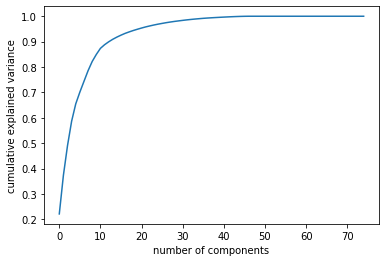

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');

De acordo com a PCA com 85% 

In [ ]:
pca = PCA(n_components=0.95)
pca.fit(X_train)
X_pca_train = pca.transform(X_train)
X_pca_test = pca.transform(X_test)

Gerando outro Grid Search agora com o PCA para poder verificar o melhor estimador usando X_pca_Train
Mantendo os mesmo parametros iniciais

In [ ]:
clfgrid = MLPClassifier(random_state=1, max_iter=300, validation_fraction= 0.1, verbose=True)
gridmodel = GridSearchCV(clfgrid, parameters)
gridmodel.fit(X_pca_train, y_train)


/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  % (min_groups, self.n_splits)), UserWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 1, loss = 3.03665903
Iteration 2, loss = 3.02808026
Iteration 3, loss = 3.01953340
Iteration 4, loss = 3.01101903
Iteration 5, loss = 3.00253769
Iteration 6, loss = 2.99408991
Iteration 7, loss = 2.98567620
Iteration 8, loss = 2.97729707
Iteration 9, loss = 2.96895299
Iteration 10, loss = 2.96064443
Iteration 11, loss = 2.95237184
Iteration 12, loss = 2.94424712
Iteration 13, loss = 2.93617327
Iteration 14, loss = 2.92813729
Iteration 15, loss = 2.92013884
Iteration 16, loss = 2.91217774
Iteration 17, loss = 2.90425389
Iteration 18, loss = 2.89636726
Iteration 19, loss = 2.88851788
Iteration 20, loss = 2.88070585
Iteration 21, loss = 2.87293126
Iteration 22, loss = 2.86519428
Iteration 23, loss = 2.85749506
Iteration 24, loss = 2.84983378
Iteration 25, loss = 2.84221063
Iteration 26, loss = 2.83462581
Iteration 27, loss = 2.82707951
Iteration 28, loss = 2.81957194
Iteration 29, loss = 2.81210329
Iteration 30, loss = 2.80467376
Iteration 31, loss = 2.79728355
Iteration 32, los

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 208, loss = 2.06076398
Iteration 209, loss = 2.05840149
Iteration 210, loss = 2.05605127
Iteration 211, loss = 2.05372002
Iteration 212, loss = 2.05140172
Iteration 213, loss = 2.04911374
Iteration 214, loss = 2.04683661
Iteration 215, loss = 2.04457147
Iteration 216, loss = 2.04232245
Iteration 217, loss = 2.04008430
Iteration 218, loss = 2.03785838
Iteration 219, loss = 2.03564743
Iteration 220, loss = 2.03345008
Iteration 221, loss = 2.03126667
Iteration 222, loss = 2.02909595
Iteration 223, loss = 2.02695970
Iteration 224, loss = 2.02482012
Iteration 225, loss = 2.02267877
Iteration 226, loss = 2.02057103
Iteration 227, loss = 2.01847362
Iteration 228, loss = 2.01638690
Iteration 229, loss = 2.01431898
Iteration 230, loss = 2.01225787
Iteration 231, loss = 2.01020600
Iteration 232, loss = 2.00817149
Iteration 233, loss = 2.00614773
Iteration 234, loss = 2.00414344
Iteration 235, loss = 2.00213937
Iteration 236, loss = 2.00015884
Iteration 237, loss = 1.99818439
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 183, loss = 2.08962780
Iteration 184, loss = 2.08649308
Iteration 185, loss = 2.08337652
Iteration 186, loss = 2.08027864
Iteration 187, loss = 2.07719987
Iteration 188, loss = 2.07414055
Iteration 189, loss = 2.07111796
Iteration 190, loss = 2.06812605
Iteration 191, loss = 2.06512295
Iteration 192, loss = 2.06213181
Iteration 193, loss = 2.05918447
Iteration 194, loss = 2.05625528
Iteration 195, loss = 2.05334444
Iteration 196, loss = 2.05045208
Iteration 197, loss = 2.04757826
Iteration 198, loss = 2.04472303
Iteration 199, loss = 2.04188638
Iteration 200, loss = 2.03906830
Iteration 201, loss = 2.03626872
Iteration 202, loss = 2.03348756
Iteration 203, loss = 2.03072473
Iteration 204, loss = 2.02798012
Iteration 205, loss = 2.02527122
Iteration 206, loss = 2.02255682
Iteration 207, loss = 2.01986766
Iteration 208, loss = 2.01720212
Iteration 209, loss = 2.01455300
Iteration 210, loss = 2.01192028
Iteration 211, loss = 2.00930389
Iteration 212, loss = 2.00670378
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 108, loss = 2.38486653
Iteration 109, loss = 2.37924455
Iteration 110, loss = 2.37366621
Iteration 111, loss = 2.36813119
Iteration 112, loss = 2.36263923
Iteration 113, loss = 2.35719004
Iteration 114, loss = 2.35178333
Iteration 115, loss = 2.34641882
Iteration 116, loss = 2.34109626
Iteration 117, loss = 2.33581537
Iteration 118, loss = 2.33057587
Iteration 119, loss = 2.32537752
Iteration 120, loss = 2.32022004
Iteration 121, loss = 2.31510317
Iteration 122, loss = 2.31002666
Iteration 123, loss = 2.30499024
Iteration 124, loss = 2.29999367
Iteration 125, loss = 2.29503668
Iteration 126, loss = 2.29011902
Iteration 127, loss = 2.28524044
Iteration 128, loss = 2.28033270
Iteration 129, loss = 2.27524149
Iteration 130, loss = 2.27012951
Iteration 131, loss = 2.26500843
Iteration 132, loss = 2.25988786
Iteration 133, loss = 2.25477581
Iteration 134, loss = 2.24967896
Iteration 135, loss = 2.24460287
Iteration 136, loss = 2.23955221
Iteration 137, loss = 2.23453087
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 48, loss = 2.65298216
Iteration 49, loss = 2.64528189
Iteration 50, loss = 2.63763160
Iteration 51, loss = 2.63003181
Iteration 52, loss = 2.62248293
Iteration 53, loss = 2.61498526
Iteration 54, loss = 2.60753900
Iteration 55, loss = 2.60014425
Iteration 56, loss = 2.59280105
Iteration 57, loss = 2.58550939
Iteration 58, loss = 2.57831432
Iteration 59, loss = 2.57119155
Iteration 60, loss = 2.56412039
Iteration 61, loss = 2.55710015
Iteration 62, loss = 2.55013016
Iteration 63, loss = 2.54320978
Iteration 64, loss = 2.53633838
Iteration 65, loss = 2.52951539
Iteration 66, loss = 2.52274025
Iteration 67, loss = 2.51601243
Iteration 68, loss = 2.50933142
Iteration 69, loss = 2.50269674
Iteration 70, loss = 2.49610793
Iteration 71, loss = 2.48956455
Iteration 72, loss = 2.48306619
Iteration 73, loss = 2.47661245
Iteration 74, loss = 2.47020294
Iteration 75, loss = 2.46383732
Iteration 76, loss = 2.45751522
Iteration 77, loss = 2.45123633
Iteration 78, loss = 2.44500032
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 1, loss = 3.03665903
Iteration 2, loss = 2.98565322
Iteration 3, loss = 2.93604716
Iteration 4, loss = 2.88811960
Iteration 5, loss = 2.84121360
Iteration 6, loss = 2.79532451
Iteration 7, loss = 2.75059009
Iteration 8, loss = 2.70494943
Iteration 9, loss = 2.66028764
Iteration 10, loss = 2.61704758
Iteration 11, loss = 2.57527038
Iteration 12, loss = 2.53528706
Iteration 13, loss = 2.49677900
Iteration 14, loss = 2.45972136
Iteration 15, loss = 2.42411879
Iteration 16, loss = 2.38996767
Iteration 17, loss = 2.35725634
Iteration 18, loss = 2.32596526
Iteration 19, loss = 2.29606703
Iteration 20, loss = 2.26752657
Iteration 21, loss = 2.24030140
Iteration 22, loss = 2.21434219
Iteration 23, loss = 2.18959370
Iteration 24, loss = 2.16599581
Iteration 25, loss = 2.14437397
Iteration 26, loss = 2.12471582
Iteration 27, loss = 2.10543605
Iteration 28, loss = 2.08658577
Iteration 29, loss = 2.06829344
Iteration 30, loss = 2.05054476
Iteration 31, loss = 2.03332405
Iteration 32, los

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 147, loss = 1.59426406
Iteration 148, loss = 1.59319342
Iteration 149, loss = 1.59215941
Iteration 150, loss = 1.59119415
Iteration 151, loss = 1.59014808
Iteration 152, loss = 1.58915271
Iteration 153, loss = 1.58817046
Iteration 154, loss = 1.58716176
Iteration 155, loss = 1.58619636
Iteration 156, loss = 1.58527471
Iteration 157, loss = 1.58429998
Iteration 158, loss = 1.58331623
Iteration 159, loss = 1.58241671
Iteration 160, loss = 1.58144792
Iteration 161, loss = 1.58056344
Iteration 162, loss = 1.57964746
Iteration 163, loss = 1.57874296
Iteration 164, loss = 1.57782352
Iteration 165, loss = 1.57702216
Iteration 166, loss = 1.57609304
Iteration 167, loss = 1.57517647
Iteration 168, loss = 1.57433522
Iteration 169, loss = 1.57343941
Iteration 170, loss = 1.57251759
Iteration 171, loss = 1.57161795
Iteration 172, loss = 1.57078017
Iteration 173, loss = 1.56995597
Iteration 174, loss = 1.56909513
Iteration 175, loss = 1.56820525
Iteration 176, loss = 1.56740120
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 71, loss = 1.68813072
Iteration 72, loss = 1.68412449
Iteration 73, loss = 1.68033146
Iteration 74, loss = 1.67674387
Iteration 75, loss = 1.67326505
Iteration 76, loss = 1.66988291
Iteration 77, loss = 1.66659305
Iteration 78, loss = 1.66339112
Iteration 79, loss = 1.66027279
Iteration 80, loss = 1.65730236
Iteration 81, loss = 1.65449042
Iteration 82, loss = 1.65182216
Iteration 83, loss = 1.64936882
Iteration 84, loss = 1.64729097
Iteration 85, loss = 1.64525036
Iteration 86, loss = 1.64316396
Iteration 87, loss = 1.64104085
Iteration 88, loss = 1.63896013
Iteration 89, loss = 1.63693932
Iteration 90, loss = 1.63491866
Iteration 91, loss = 1.63290381
Iteration 92, loss = 1.63090005
Iteration 93, loss = 1.62891219
Iteration 94, loss = 1.62694452
Iteration 95, loss = 1.62500076
Iteration 96, loss = 1.62331864
Iteration 97, loss = 1.62169333
Iteration 98, loss = 1.62007734
Iteration 99, loss = 1.61846777
Iteration 100, loss = 1.61686290
Iteration 101, loss = 1.61535390
Iterat

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 246, loss = 1.52741678
Iteration 247, loss = 1.52722675
Iteration 248, loss = 1.52699710
Iteration 249, loss = 1.52672278
Iteration 250, loss = 1.52656153
Iteration 251, loss = 1.52621421
Iteration 252, loss = 1.52604849
Iteration 253, loss = 1.52587769
Iteration 254, loss = 1.52565799
Iteration 255, loss = 1.52538190
Iteration 256, loss = 1.52510473
Iteration 257, loss = 1.52491822
Iteration 258, loss = 1.52479537
Iteration 259, loss = 1.52465257
Iteration 260, loss = 1.52446302
Iteration 261, loss = 1.52423215
Iteration 262, loss = 1.52397589
Iteration 263, loss = 1.52402348
Iteration 264, loss = 1.52364111
Iteration 265, loss = 1.52352187
Iteration 266, loss = 1.52345584
Iteration 267, loss = 1.52331690
Iteration 268, loss = 1.52308283
Iteration 269, loss = 1.52285966
Iteration 270, loss = 1.52267012
Iteration 271, loss = 1.52249283
Iteration 272, loss = 1.52226711
Iteration 273, loss = 1.52216023
Iteration 274, loss = 1.52195461
Iteration 275, loss = 1.52192096
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 199, loss = 1.46555982
Iteration 200, loss = 1.46520749
Iteration 201, loss = 1.46464498
Iteration 202, loss = 1.46418837
Iteration 203, loss = 1.46371243
Iteration 204, loss = 1.46319516
Iteration 205, loss = 1.46270423
Iteration 206, loss = 1.46239898
Iteration 207, loss = 1.46175885
Iteration 208, loss = 1.46137693
Iteration 209, loss = 1.46094771
Iteration 210, loss = 1.46053614
Iteration 211, loss = 1.45997319
Iteration 212, loss = 1.45944918
Iteration 213, loss = 1.45912732
Iteration 214, loss = 1.45851360
Iteration 215, loss = 1.45808771
Iteration 216, loss = 1.45762889
Iteration 217, loss = 1.45718192
Iteration 218, loss = 1.45669028
Iteration 219, loss = 1.45632725
Iteration 220, loss = 1.45583915
Iteration 221, loss = 1.45547924
Iteration 222, loss = 1.45501251
Iteration 223, loss = 1.45452780
Iteration 224, loss = 1.45404033
Iteration 225, loss = 1.45381149
Iteration 226, loss = 1.45326498
Iteration 227, loss = 1.45287322
Iteration 228, loss = 1.45250829
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 124, loss = 1.57392383
Iteration 125, loss = 1.56966631
Iteration 126, loss = 1.56543733
Iteration 127, loss = 1.56121952
Iteration 128, loss = 1.55702236
Iteration 129, loss = 1.55279444
Iteration 130, loss = 1.54862933
Iteration 131, loss = 1.54451539
Iteration 132, loss = 1.54042211
Iteration 133, loss = 1.53633360
Iteration 134, loss = 1.53228638
Iteration 135, loss = 1.52823323
Iteration 136, loss = 1.52418768
Iteration 137, loss = 1.52018276
Iteration 138, loss = 1.51624904
Iteration 139, loss = 1.51235096
Iteration 140, loss = 1.50844716
Iteration 141, loss = 1.50461962
Iteration 142, loss = 1.50087263
Iteration 143, loss = 1.49715687
Iteration 144, loss = 1.49347108
Iteration 145, loss = 1.48979847
Iteration 146, loss = 1.48611811
Iteration 147, loss = 1.48243727
Iteration 148, loss = 1.47877292
Iteration 149, loss = 1.47517207
Iteration 150, loss = 1.47158260
Iteration 151, loss = 1.46798085
Iteration 152, loss = 1.46439741
Iteration 153, loss = 1.46084493
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 53, loss = 1.97660303
Iteration 54, loss = 1.96965811
Iteration 55, loss = 1.96295248
Iteration 56, loss = 1.95648504
Iteration 57, loss = 1.95000536
Iteration 58, loss = 1.94352724
Iteration 59, loss = 1.93706059
Iteration 60, loss = 1.93061294
Iteration 61, loss = 1.92419013
Iteration 62, loss = 1.91779681
Iteration 63, loss = 1.91143669
Iteration 64, loss = 1.90511275
Iteration 65, loss = 1.89882741
Iteration 66, loss = 1.89258259
Iteration 67, loss = 1.88637986
Iteration 68, loss = 1.88019912
Iteration 69, loss = 1.87394636
Iteration 70, loss = 1.86784766
Iteration 71, loss = 1.86172188
Iteration 72, loss = 1.85558085
Iteration 73, loss = 1.84943526
Iteration 74, loss = 1.84349713
Iteration 75, loss = 1.83770675
Iteration 76, loss = 1.83194239
Iteration 77, loss = 1.82621314
Iteration 78, loss = 1.82063807
Iteration 79, loss = 1.81505808
Iteration 80, loss = 1.80948057
Iteration 81, loss = 1.80394152
Iteration 82, loss = 1.79846357
Iteration 83, loss = 1.79306586
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 240, loss = 1.32153641
Iteration 241, loss = 1.31956997
Iteration 242, loss = 1.31760753
Iteration 243, loss = 1.31569869
Iteration 244, loss = 1.31378671
Iteration 245, loss = 1.31187793
Iteration 246, loss = 1.30997286
Iteration 247, loss = 1.30809867
Iteration 248, loss = 1.30623268
Iteration 249, loss = 1.30438600
Iteration 250, loss = 1.30252471
Iteration 251, loss = 1.30069628
Iteration 252, loss = 1.29887737
Iteration 253, loss = 1.29706048
Iteration 254, loss = 1.29524048
Iteration 255, loss = 1.29341632
Iteration 256, loss = 1.29164859
Iteration 257, loss = 1.28986356
Iteration 258, loss = 1.28805927
Iteration 259, loss = 1.28623993
Iteration 260, loss = 1.28450605
Iteration 261, loss = 1.28275048
Iteration 262, loss = 1.28097331
Iteration 263, loss = 1.27921741
Iteration 264, loss = 1.27751557
Iteration 265, loss = 1.27579393
Iteration 266, loss = 1.27406998
Iteration 267, loss = 1.27235104
Iteration 268, loss = 1.27066529
Iteration 269, loss = 1.26898956
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 194, loss = 1.42358648
Iteration 195, loss = 1.42110328
Iteration 196, loss = 1.41859112
Iteration 197, loss = 1.41611997
Iteration 198, loss = 1.41368472
Iteration 199, loss = 1.41125473
Iteration 200, loss = 1.40917433
Iteration 201, loss = 1.40711773
Iteration 202, loss = 1.40503812
Iteration 203, loss = 1.40299308
Iteration 204, loss = 1.40095697
Iteration 205, loss = 1.39893140
Iteration 206, loss = 1.39689579
Iteration 207, loss = 1.39486471
Iteration 208, loss = 1.39285128
Iteration 209, loss = 1.39085807
Iteration 210, loss = 1.38886630
Iteration 211, loss = 1.38689139
Iteration 212, loss = 1.38490552
Iteration 213, loss = 1.38295702
Iteration 214, loss = 1.38111444
Iteration 215, loss = 1.37926200
Iteration 216, loss = 1.37744507
Iteration 217, loss = 1.37561315
Iteration 218, loss = 1.37376490
Iteration 219, loss = 1.37191133
Iteration 220, loss = 1.36979680
Iteration 221, loss = 1.36756778
Iteration 222, loss = 1.36527853
Iteration 223, loss = 1.36291396
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 117, loss = 1.59489687
Iteration 118, loss = 1.59164916
Iteration 119, loss = 1.58841724
Iteration 120, loss = 1.58519860
Iteration 121, loss = 1.58198144
Iteration 122, loss = 1.57881374
Iteration 123, loss = 1.57564302
Iteration 124, loss = 1.57248132
Iteration 125, loss = 1.56929921
Iteration 126, loss = 1.56627493
Iteration 127, loss = 1.56330168
Iteration 128, loss = 1.56032706
Iteration 129, loss = 1.55735207
Iteration 130, loss = 1.55437766
Iteration 131, loss = 1.55140468
Iteration 132, loss = 1.54843391
Iteration 133, loss = 1.54547170
Iteration 134, loss = 1.54250441
Iteration 135, loss = 1.53962480
Iteration 136, loss = 1.53666993
Iteration 137, loss = 1.53374807
Iteration 138, loss = 1.53081937
Iteration 139, loss = 1.52789793
Iteration 140, loss = 1.52500361
Iteration 141, loss = 1.52211176
Iteration 142, loss = 1.51922293
Iteration 143, loss = 1.51634878
Iteration 144, loss = 1.51347929
Iteration 145, loss = 1.51061558
Iteration 146, loss = 1.50777385
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 32, loss = 1.36728111
Iteration 33, loss = 1.35308330
Iteration 34, loss = 1.33945833
Iteration 35, loss = 1.32687590
Iteration 36, loss = 1.31457135
Iteration 37, loss = 1.30235958
Iteration 38, loss = 1.29028993
Iteration 39, loss = 1.27927822
Iteration 40, loss = 1.26835452
Iteration 41, loss = 1.25753396
Iteration 42, loss = 1.24704143
Iteration 43, loss = 1.23690668
Iteration 44, loss = 1.22691299
Iteration 45, loss = 1.21706977
Iteration 46, loss = 1.20738616
Iteration 47, loss = 1.19787050
Iteration 48, loss = 1.18864757
Iteration 49, loss = 1.17959872
Iteration 50, loss = 1.17070968
Iteration 51, loss = 1.16229489
Iteration 52, loss = 1.15419493
Iteration 53, loss = 1.14608651
Iteration 54, loss = 1.13798902
Iteration 55, loss = 1.13029475
Iteration 56, loss = 1.12270729
Iteration 57, loss = 1.11500799
Iteration 58, loss = 1.10736841
Iteration 59, loss = 1.10051204
Iteration 60, loss = 1.09369131
Iteration 61, loss = 1.08685304
Iteration 62, loss = 1.08044289
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 185, loss = 0.68784626
Iteration 186, loss = 0.68665153
Iteration 187, loss = 0.68536138
Iteration 188, loss = 0.68411668
Iteration 189, loss = 0.68285624
Iteration 190, loss = 0.68156458
Iteration 191, loss = 0.68023277
Iteration 192, loss = 0.67890498
Iteration 193, loss = 0.67766942
Iteration 194, loss = 0.67638363
Iteration 195, loss = 0.67494813
Iteration 196, loss = 0.67366434
Iteration 197, loss = 0.67237610
Iteration 198, loss = 0.67166459
Iteration 199, loss = 0.67041005
Iteration 200, loss = 0.66893618
Iteration 201, loss = 0.66789758
Iteration 202, loss = 0.66678785
Iteration 203, loss = 0.66566085
Iteration 204, loss = 0.66458156
Iteration 205, loss = 0.66348960
Iteration 206, loss = 0.66239599
Iteration 207, loss = 0.66126915
Iteration 208, loss = 0.66012684
Iteration 209, loss = 0.65902471
Iteration 210, loss = 0.65826152
Iteration 211, loss = 0.65692759
Iteration 212, loss = 0.65598860
Iteration 213, loss = 0.65504876
Iteration 214, loss = 0.65407431
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 146, loss = 0.71968130
Iteration 147, loss = 0.71685440
Iteration 148, loss = 0.71398845
Iteration 149, loss = 0.71103038
Iteration 150, loss = 0.70836009
Iteration 151, loss = 0.70584823
Iteration 152, loss = 0.70332083
Iteration 153, loss = 0.70074368
Iteration 154, loss = 0.69815472
Iteration 155, loss = 0.69556013
Iteration 156, loss = 0.69301469
Iteration 157, loss = 0.69055495
Iteration 158, loss = 0.68817954
Iteration 159, loss = 0.68575221
Iteration 160, loss = 0.68347969
Iteration 161, loss = 0.68113078
Iteration 162, loss = 0.67882990
Iteration 163, loss = 0.67651194
Iteration 164, loss = 0.67418709
Iteration 165, loss = 0.67197378
Iteration 166, loss = 0.66952630
Iteration 167, loss = 0.66722080
Iteration 168, loss = 0.66523452
Iteration 169, loss = 0.66298870
Iteration 170, loss = 0.66088666
Iteration 171, loss = 0.65850484
Iteration 172, loss = 0.65639995
Iteration 173, loss = 0.65432648
Iteration 174, loss = 0.65234680
Iteration 175, loss = 0.65018056
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 44, loss = 1.29655680
Iteration 45, loss = 1.28698240
Iteration 46, loss = 1.27771975
Iteration 47, loss = 1.26869275
Iteration 48, loss = 1.25977370
Iteration 49, loss = 1.25105990
Iteration 50, loss = 1.24246098
Iteration 51, loss = 1.23391733
Iteration 52, loss = 1.22540620
Iteration 53, loss = 1.21724680
Iteration 54, loss = 1.20918835
Iteration 55, loss = 1.20129630
Iteration 56, loss = 1.19350941
Iteration 57, loss = 1.18596465
Iteration 58, loss = 1.17858625
Iteration 59, loss = 1.17132406
Iteration 60, loss = 1.16422878
Iteration 61, loss = 1.15724919
Iteration 62, loss = 1.15028504
Iteration 63, loss = 1.14335790
Iteration 64, loss = 1.13645852
Iteration 65, loss = 1.13021822
Iteration 66, loss = 1.12359783
Iteration 67, loss = 1.11670355
Iteration 68, loss = 1.11038612
Iteration 69, loss = 1.10419511
Iteration 70, loss = 1.09799455
Iteration 71, loss = 1.09172045
Iteration 72, loss = 1.08544337
Iteration 73, loss = 1.07911851
Iteration 74, loss = 1.07279161
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 250, loss = 0.40939718
Iteration 251, loss = 0.40667104
Iteration 252, loss = 0.40412812
Iteration 253, loss = 0.40197165
Iteration 254, loss = 0.39963949
Iteration 255, loss = 0.39762802
Iteration 256, loss = 0.39570911
Iteration 257, loss = 0.39389463
Iteration 258, loss = 0.39210242
Iteration 259, loss = 0.39039407
Iteration 260, loss = 0.38873443
Iteration 261, loss = 0.38711976
Iteration 262, loss = 0.38554708
Iteration 263, loss = 0.38401393
Iteration 264, loss = 0.38281000
Iteration 265, loss = 0.38125862
Iteration 266, loss = 0.37989577
Iteration 267, loss = 0.37860684
Iteration 268, loss = 0.37732675
Iteration 269, loss = 0.37605420
Iteration 270, loss = 0.37481363
Iteration 271, loss = 0.37353981
Iteration 272, loss = 0.37229878
Iteration 273, loss = 0.37131498
Iteration 274, loss = 0.36998773
Iteration 275, loss = 0.36890519
Iteration 276, loss = 0.36781922
Iteration 277, loss = 0.36672995
Iteration 278, loss = 0.36563855
Iteration 279, loss = 0.36454693
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 179, loss = 1.24389857
Iteration 180, loss = 1.23973087
Iteration 181, loss = 1.23561571
Iteration 182, loss = 1.23153388
Iteration 183, loss = 1.22748978
Iteration 184, loss = 1.22349659
Iteration 185, loss = 1.21953767
Iteration 186, loss = 1.21561550
Iteration 187, loss = 1.21174926
Iteration 188, loss = 1.20795759
Iteration 189, loss = 1.20420045
Iteration 190, loss = 1.20045982
Iteration 191, loss = 1.19673798
Iteration 192, loss = 1.19307331
Iteration 193, loss = 1.18943268
Iteration 194, loss = 1.18581786
Iteration 195, loss = 1.18222917
Iteration 196, loss = 1.17866643
Iteration 197, loss = 1.17513024
Iteration 198, loss = 1.17163470
Iteration 199, loss = 1.16817104
Iteration 200, loss = 1.16474394
Iteration 201, loss = 1.16134080
Iteration 202, loss = 1.15797032
Iteration 203, loss = 1.15462584
Iteration 204, loss = 1.15131481
Iteration 205, loss = 1.14802847
Iteration 206, loss = 1.14476317
Iteration 207, loss = 1.14153896
Iteration 208, loss = 1.13832755
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 57, loss = 2.50944433
Iteration 58, loss = 2.49306078
Iteration 59, loss = 2.47680229
Iteration 60, loss = 2.46066880
Iteration 61, loss = 2.44465985
Iteration 62, loss = 2.42877383
Iteration 63, loss = 2.41300987
Iteration 64, loss = 2.39736707
Iteration 65, loss = 2.38217546
Iteration 66, loss = 2.36706788
Iteration 67, loss = 2.35189087
Iteration 68, loss = 2.33671442
Iteration 69, loss = 2.32156703
Iteration 70, loss = 2.30646424
Iteration 71, loss = 2.29168617
Iteration 72, loss = 2.27712265
Iteration 73, loss = 2.26264076
Iteration 74, loss = 2.24824234
Iteration 75, loss = 2.23392776
Iteration 76, loss = 2.21967667
Iteration 77, loss = 2.20558862
Iteration 78, loss = 2.19157462
Iteration 79, loss = 2.17763773
Iteration 80, loss = 2.16378049
Iteration 81, loss = 2.15000504
Iteration 82, loss = 2.13631320
Iteration 83, loss = 2.12264256
Iteration 84, loss = 2.10872014
Iteration 85, loss = 2.09492841
Iteration 86, loss = 2.08113805
Iteration 87, loss = 2.06727135
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 220, loss = 1.08150362
Iteration 221, loss = 1.07854022
Iteration 222, loss = 1.07557317
Iteration 223, loss = 1.07260548
Iteration 224, loss = 1.06965025
Iteration 225, loss = 1.06672720
Iteration 226, loss = 1.06381944
Iteration 227, loss = 1.06093122
Iteration 228, loss = 1.05805584
Iteration 229, loss = 1.05520630
Iteration 230, loss = 1.05237773
Iteration 231, loss = 1.04956444
Iteration 232, loss = 1.04677041
Iteration 233, loss = 1.04400061
Iteration 234, loss = 1.04124660
Iteration 235, loss = 1.03849466
Iteration 236, loss = 1.03577647
Iteration 237, loss = 1.03307710
Iteration 238, loss = 1.03038895
Iteration 239, loss = 1.02774313
Iteration 240, loss = 1.02511244
Iteration 241, loss = 1.02249892
Iteration 242, loss = 1.01985477
Iteration 243, loss = 1.01720711
Iteration 244, loss = 1.01460282
Iteration 245, loss = 1.01202559
Iteration 246, loss = 1.00944657
Iteration 247, loss = 1.00687997
Iteration 248, loss = 1.00431744
Iteration 249, loss = 1.00176590
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 152, loss = 1.23458028
Iteration 153, loss = 1.23038963
Iteration 154, loss = 1.22625912
Iteration 155, loss = 1.22217431
Iteration 156, loss = 1.21814494
Iteration 157, loss = 1.21425995
Iteration 158, loss = 1.21052272
Iteration 159, loss = 1.20684565
Iteration 160, loss = 1.20320265
Iteration 161, loss = 1.19969509
Iteration 162, loss = 1.19621092
Iteration 163, loss = 1.19274066
Iteration 164, loss = 1.18930657
Iteration 165, loss = 1.18587522
Iteration 166, loss = 1.18246641
Iteration 167, loss = 1.17905943
Iteration 168, loss = 1.17575991
Iteration 169, loss = 1.17254444
Iteration 170, loss = 1.16936427
Iteration 171, loss = 1.16621502
Iteration 172, loss = 1.16309608
Iteration 173, loss = 1.15999839
Iteration 174, loss = 1.15696061
Iteration 175, loss = 1.15390805
Iteration 176, loss = 1.15091034
Iteration 177, loss = 1.14796233
Iteration 178, loss = 1.14503606
Iteration 179, loss = 1.14212683
Iteration 180, loss = 1.13926443
Iteration 181, loss = 1.13643507
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 45, loss = 2.40997705
Iteration 46, loss = 2.39579393
Iteration 47, loss = 2.38173676
Iteration 48, loss = 2.36780452
Iteration 49, loss = 2.35399609
Iteration 50, loss = 2.34031030
Iteration 51, loss = 2.32674592
Iteration 52, loss = 2.31330170
Iteration 53, loss = 2.29997635
Iteration 54, loss = 2.28676861
Iteration 55, loss = 2.27367718
Iteration 56, loss = 2.26052367
Iteration 57, loss = 2.24746498
Iteration 58, loss = 2.23450441
Iteration 59, loss = 2.22164330
Iteration 60, loss = 2.20888269
Iteration 61, loss = 2.19622337
Iteration 62, loss = 2.18366587
Iteration 63, loss = 2.17121055
Iteration 64, loss = 2.15885757
Iteration 65, loss = 2.14651180
Iteration 66, loss = 2.13422336
Iteration 67, loss = 2.12202150
Iteration 68, loss = 2.10990906
Iteration 69, loss = 2.09788824
Iteration 70, loss = 2.08596073
Iteration 71, loss = 2.07412781
Iteration 72, loss = 2.06239042
Iteration 73, loss = 2.05074922
Iteration 74, loss = 2.03921783
Iteration 75, loss = 2.02780549
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 218, loss = 0.32891645
Iteration 219, loss = 0.32774377
Iteration 220, loss = 0.32652398
Iteration 221, loss = 0.32533218
Iteration 222, loss = 0.32416295
Iteration 223, loss = 0.32299526
Iteration 224, loss = 0.32182626
Iteration 225, loss = 0.32065879
Iteration 226, loss = 0.31949179
Iteration 227, loss = 0.31832499
Iteration 228, loss = 0.31718460
Iteration 229, loss = 0.31601289
Iteration 230, loss = 0.31488717
Iteration 231, loss = 0.31373393
Iteration 232, loss = 0.31274468
Iteration 233, loss = 0.31152177
Iteration 234, loss = 0.31043499
Iteration 235, loss = 0.30935202
Iteration 236, loss = 0.30827167
Iteration 237, loss = 0.30719632
Iteration 238, loss = 0.30612036
Iteration 239, loss = 0.30504297
Iteration 240, loss = 0.30398006
Iteration 241, loss = 0.30290751
Iteration 242, loss = 0.30184689
Iteration 243, loss = 0.30078639
Iteration 244, loss = 0.29972568
Iteration 245, loss = 0.29871675
Iteration 246, loss = 0.29765377
Iteration 247, loss = 0.29671066
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 134, loss = 0.48889889
Iteration 135, loss = 0.48632474
Iteration 136, loss = 0.48383950
Iteration 137, loss = 0.48136287
Iteration 138, loss = 0.47894482
Iteration 139, loss = 0.47646740
Iteration 140, loss = 0.47407483
Iteration 141, loss = 0.47171954
Iteration 142, loss = 0.46938135
Iteration 143, loss = 0.46705070
Iteration 144, loss = 0.46478979
Iteration 145, loss = 0.46253169
Iteration 146, loss = 0.46026366
Iteration 147, loss = 0.45803316
Iteration 148, loss = 0.45583144
Iteration 149, loss = 0.45366831
Iteration 150, loss = 0.45151266
Iteration 151, loss = 0.44938054
Iteration 152, loss = 0.44726961
Iteration 153, loss = 0.44517732
Iteration 154, loss = 0.44310838
Iteration 155, loss = 0.44106574
Iteration 156, loss = 0.43902735
Iteration 157, loss = 0.43703843
Iteration 158, loss = 0.43504822
Iteration 159, loss = 0.43307243
Iteration 160, loss = 0.43112326
Iteration 161, loss = 0.42919937
Iteration 162, loss = 0.42728821
Iteration 163, loss = 0.42541781
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 64, loss = 0.77294207
Iteration 65, loss = 0.76541662
Iteration 66, loss = 0.75805383
Iteration 67, loss = 0.75090832
Iteration 68, loss = 0.74394397
Iteration 69, loss = 0.73719409
Iteration 70, loss = 0.73064174
Iteration 71, loss = 0.72415218
Iteration 72, loss = 0.71784852
Iteration 73, loss = 0.71175925
Iteration 74, loss = 0.70579637
Iteration 75, loss = 0.69993354
Iteration 76, loss = 0.69425048
Iteration 77, loss = 0.68867774
Iteration 78, loss = 0.68324132
Iteration 79, loss = 0.67792557
Iteration 80, loss = 0.67270527
Iteration 81, loss = 0.66760364
Iteration 82, loss = 0.66274650
Iteration 83, loss = 0.65785673
Iteration 84, loss = 0.65298850
Iteration 85, loss = 0.64833582
Iteration 86, loss = 0.64374820
Iteration 87, loss = 0.63925619
Iteration 88, loss = 0.63486336
Iteration 89, loss = 0.63053283
Iteration 90, loss = 0.62632610
Iteration 91, loss = 0.62213783
Iteration 92, loss = 0.61804050
Iteration 93, loss = 0.61402433
Iteration 94, loss = 0.61004256
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 219, loss = 0.36310291
Iteration 220, loss = 0.36118734
Iteration 221, loss = 0.35951345
Iteration 222, loss = 0.35791785
Iteration 223, loss = 0.35641827
Iteration 224, loss = 0.35489210
Iteration 225, loss = 0.35350210
Iteration 226, loss = 0.35220577
Iteration 227, loss = 0.35092588
Iteration 228, loss = 0.34967664
Iteration 229, loss = 0.34843907
Iteration 230, loss = 0.34727775
Iteration 231, loss = 0.34651450
Iteration 232, loss = 0.34499297
Iteration 233, loss = 0.34379321
Iteration 234, loss = 0.34261322
Iteration 235, loss = 0.34136502
Iteration 236, loss = 0.34016232
Iteration 237, loss = 0.33889811
Iteration 238, loss = 0.33759184
Iteration 239, loss = 0.33626748
Iteration 240, loss = 0.33576581
Iteration 241, loss = 0.33381116
Iteration 242, loss = 0.33271336
Iteration 243, loss = 0.33150013
Iteration 244, loss = 0.33029105
Iteration 245, loss = 0.32909806
Iteration 246, loss = 0.32788245
Iteration 247, loss = 0.32696306
Iteration 248, loss = 0.32579702
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 125, loss = 0.52295799
Iteration 126, loss = 0.52033039
Iteration 127, loss = 0.51790518
Iteration 128, loss = 0.51520680
Iteration 129, loss = 0.51269354
Iteration 130, loss = 0.51020294
Iteration 131, loss = 0.50773532
Iteration 132, loss = 0.50529156
Iteration 133, loss = 0.50287232
Iteration 134, loss = 0.50049935
Iteration 135, loss = 0.49810755
Iteration 136, loss = 0.49576322
Iteration 137, loss = 0.49343873
Iteration 138, loss = 0.49113405
Iteration 139, loss = 0.48886900
Iteration 140, loss = 0.48659319
Iteration 141, loss = 0.48435579
Iteration 142, loss = 0.48215655
Iteration 143, loss = 0.47994598
Iteration 144, loss = 0.47777222
Iteration 145, loss = 0.47561536
Iteration 146, loss = 0.47347723
Iteration 147, loss = 0.47135761
Iteration 148, loss = 0.46925376
Iteration 149, loss = 0.46718356
Iteration 150, loss = 0.46509670
Iteration 151, loss = 0.46304329
Iteration 152, loss = 0.46100493
Iteration 153, loss = 0.45898229
Iteration 154, loss = 0.45697312
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 70, loss = 1.86994125
Iteration 71, loss = 1.85418140
Iteration 72, loss = 1.83880845
Iteration 73, loss = 1.82370204
Iteration 74, loss = 1.80887335
Iteration 75, loss = 1.79432889
Iteration 76, loss = 1.78004407
Iteration 77, loss = 1.76601146
Iteration 78, loss = 1.75222446
Iteration 79, loss = 1.73870137
Iteration 80, loss = 1.72541095
Iteration 81, loss = 1.71234632
Iteration 82, loss = 1.69949621
Iteration 83, loss = 1.68682980
Iteration 84, loss = 1.67425267
Iteration 85, loss = 1.66172339
Iteration 86, loss = 1.64931221
Iteration 87, loss = 1.63703668
Iteration 88, loss = 1.62492797
Iteration 89, loss = 1.61296142
Iteration 90, loss = 1.60115012
Iteration 91, loss = 1.58950990
Iteration 92, loss = 1.57801203
Iteration 93, loss = 1.56665630
Iteration 94, loss = 1.55553317
Iteration 95, loss = 1.54457823
Iteration 96, loss = 1.53377423
Iteration 97, loss = 1.52305196
Iteration 98, loss = 1.51252025
Iteration 99, loss = 1.50211654
Iteration 100, loss = 1.49183595
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 256, loss = 0.87524363
Iteration 257, loss = 0.87329266
Iteration 258, loss = 0.87131299
Iteration 259, loss = 0.86934759
Iteration 260, loss = 0.86738475
Iteration 261, loss = 0.86543453
Iteration 262, loss = 0.86352788
Iteration 263, loss = 0.86172476
Iteration 264, loss = 0.85991586
Iteration 265, loss = 0.85808913
Iteration 266, loss = 0.85629095
Iteration 267, loss = 0.85447462
Iteration 268, loss = 0.85266725
Iteration 269, loss = 0.85088951
Iteration 270, loss = 0.84911517
Iteration 271, loss = 0.84728931
Iteration 272, loss = 0.84553121
Iteration 273, loss = 0.84378351
Iteration 274, loss = 0.84203211
Iteration 275, loss = 0.84028099
Iteration 276, loss = 0.83852914
Iteration 277, loss = 0.83678859
Iteration 278, loss = 0.83505009
Iteration 279, loss = 0.83333544
Iteration 280, loss = 0.83161996
Iteration 281, loss = 0.82992589
Iteration 282, loss = 0.82828708
Iteration 283, loss = 0.82662963
Iteration 284, loss = 0.82498585
Iteration 285, loss = 0.82335365
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 146, loss = 1.21469844
Iteration 147, loss = 1.20917331
Iteration 148, loss = 1.20377086
Iteration 149, loss = 1.19849322
Iteration 150, loss = 1.19326878
Iteration 151, loss = 1.18809026
Iteration 152, loss = 1.18294913
Iteration 153, loss = 1.17783522
Iteration 154, loss = 1.17281049
Iteration 155, loss = 1.16782828
Iteration 156, loss = 1.16288970
Iteration 157, loss = 1.15800223
Iteration 158, loss = 1.15315450
Iteration 159, loss = 1.14834813
Iteration 160, loss = 1.14366296
Iteration 161, loss = 1.13902948
Iteration 162, loss = 1.13449083
Iteration 163, loss = 1.12998804
Iteration 164, loss = 1.12552947
Iteration 165, loss = 1.12114621
Iteration 166, loss = 1.11687601
Iteration 167, loss = 1.11262774
Iteration 168, loss = 1.10838830
Iteration 169, loss = 1.10420622
Iteration 170, loss = 1.10004598
Iteration 171, loss = 1.09588845
Iteration 172, loss = 1.09175563
Iteration 173, loss = 1.08777093
Iteration 174, loss = 1.08379989
Iteration 175, loss = 1.07984882
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 78, loss = 1.76265742
Iteration 79, loss = 1.74840538
Iteration 80, loss = 1.73431131
Iteration 81, loss = 1.72046309
Iteration 82, loss = 1.70684203
Iteration 83, loss = 1.69342541
Iteration 84, loss = 1.68018158
Iteration 85, loss = 1.66696799
Iteration 86, loss = 1.65391393
Iteration 87, loss = 1.64105991
Iteration 88, loss = 1.62843893
Iteration 89, loss = 1.61596879
Iteration 90, loss = 1.60366491
Iteration 91, loss = 1.59150735
Iteration 92, loss = 1.57950014
Iteration 93, loss = 1.56766659
Iteration 94, loss = 1.55602196
Iteration 95, loss = 1.54455022
Iteration 96, loss = 1.53322931
Iteration 97, loss = 1.52205780
Iteration 98, loss = 1.51103540
Iteration 99, loss = 1.50027956
Iteration 100, loss = 1.48966973
Iteration 101, loss = 1.47919985
Iteration 102, loss = 1.46887745
Iteration 103, loss = 1.45865015
Iteration 104, loss = 1.44858222
Iteration 105, loss = 1.43864975
Iteration 106, loss = 1.42886495
Iteration 107, loss = 1.41920494
Iteration 108, loss = 1.4096595

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 17, loss = 3.39059464
Iteration 18, loss = 3.35855006
Iteration 19, loss = 3.32668043
Iteration 20, loss = 3.29499363
Iteration 21, loss = 3.26349699
Iteration 22, loss = 3.23219766
Iteration 23, loss = 3.20110269
Iteration 24, loss = 3.17021918
Iteration 25, loss = 3.13955423
Iteration 26, loss = 3.10911501
Iteration 27, loss = 3.07890871
Iteration 28, loss = 3.04894249
Iteration 29, loss = 3.01922356
Iteration 30, loss = 2.98975918
Iteration 31, loss = 2.96055665
Iteration 32, loss = 2.93162329
Iteration 33, loss = 2.90296098
Iteration 34, loss = 2.87447720
Iteration 35, loss = 2.84627849
Iteration 36, loss = 2.81838548
Iteration 37, loss = 2.79078462
Iteration 38, loss = 2.76344481
Iteration 39, loss = 2.73632688
Iteration 40, loss = 2.70951867
Iteration 41, loss = 2.68302858
Iteration 42, loss = 2.65686407
Iteration 43, loss = 2.63103923
Iteration 44, loss = 2.60558414
Iteration 45, loss = 2.58047252
Iteration 46, loss = 2.55585439
Iteration 47, loss = 2.53177066
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 192, loss = 0.29469459
Iteration 193, loss = 0.29373160
Iteration 194, loss = 0.29260069
Iteration 195, loss = 0.29159889
Iteration 196, loss = 0.29058974
Iteration 197, loss = 0.28969300
Iteration 198, loss = 0.28882070
Iteration 199, loss = 0.28795351
Iteration 200, loss = 0.28706487
Iteration 201, loss = 0.28616229
Iteration 202, loss = 0.28524724
Iteration 203, loss = 0.28432129
Iteration 204, loss = 0.28360728
Iteration 205, loss = 0.28250907
Iteration 206, loss = 0.28163542
Iteration 207, loss = 0.28088004
Iteration 208, loss = 0.28009381
Iteration 209, loss = 0.27935002
Iteration 210, loss = 0.27857016
Iteration 211, loss = 0.27777061
Iteration 212, loss = 0.27690916
Iteration 213, loss = 0.27608965
Iteration 214, loss = 0.27536786
Iteration 215, loss = 0.27458772
Iteration 216, loss = 0.27377982
Iteration 217, loss = 0.27312944
Iteration 218, loss = 0.27229855
Iteration 219, loss = 0.27164762
Iteration 220, loss = 0.27098944
Iteration 221, loss = 0.27030394
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 142, loss = 0.44053455
Iteration 143, loss = 0.43647368
Iteration 144, loss = 0.43109374
Iteration 145, loss = 0.42504962
Iteration 146, loss = 0.41890840
Iteration 147, loss = 0.41294414
Iteration 148, loss = 0.40734231
Iteration 149, loss = 0.40223580
Iteration 150, loss = 0.39760609
Iteration 151, loss = 0.39339181
Iteration 152, loss = 0.38932896
Iteration 153, loss = 0.38571572
Iteration 154, loss = 0.38241799
Iteration 155, loss = 0.37938384
Iteration 156, loss = 0.37660853
Iteration 157, loss = 0.37405619
Iteration 158, loss = 0.37168467
Iteration 159, loss = 0.36943749
Iteration 160, loss = 0.36723973
Iteration 161, loss = 0.36513272
Iteration 162, loss = 0.36310100
Iteration 163, loss = 0.36144742
Iteration 164, loss = 0.35937593
Iteration 165, loss = 0.35760797
Iteration 166, loss = 0.35592376
Iteration 167, loss = 0.35429299
Iteration 168, loss = 0.35280649
Iteration 169, loss = 0.35123843
Iteration 170, loss = 0.34974601
Iteration 171, loss = 0.34829016
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 51, loss = 0.70082199
Iteration 52, loss = 0.68994053
Iteration 53, loss = 0.67938195
Iteration 54, loss = 0.66909638
Iteration 55, loss = 0.65910819
Iteration 56, loss = 0.64925608
Iteration 57, loss = 0.63953541
Iteration 58, loss = 0.63012610
Iteration 59, loss = 0.62100765
Iteration 60, loss = 0.61206384
Iteration 61, loss = 0.60333173
Iteration 62, loss = 0.59482297
Iteration 63, loss = 0.58647474
Iteration 64, loss = 0.57820262
Iteration 65, loss = 0.57008219
Iteration 66, loss = 0.56211628
Iteration 67, loss = 0.55431728
Iteration 68, loss = 0.54676002
Iteration 69, loss = 0.53935453
Iteration 70, loss = 0.53213911
Iteration 71, loss = 0.52506812
Iteration 72, loss = 0.51813377
Iteration 73, loss = 0.51149269
Iteration 74, loss = 0.50535851
Iteration 75, loss = 0.49905028
Iteration 76, loss = 0.49246945
Iteration 77, loss = 0.48591550
Iteration 78, loss = 0.47984147
Iteration 79, loss = 0.47397347
Iteration 80, loss = 0.46837014
Iteration 81, loss = 0.46294182
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 208, loss = 0.22024194
Iteration 209, loss = 0.21943838
Iteration 210, loss = 0.21862574
Iteration 211, loss = 0.21780796
Iteration 212, loss = 0.21699628
Iteration 213, loss = 0.21624842
Iteration 214, loss = 0.21538292
Iteration 215, loss = 0.21464404
Iteration 216, loss = 0.21378493
Iteration 217, loss = 0.21299321
Iteration 218, loss = 0.21219974
Iteration 219, loss = 0.21139803
Iteration 220, loss = 0.21061636
Iteration 221, loss = 0.20982656
Iteration 222, loss = 0.20902948
Iteration 223, loss = 0.20822286
Iteration 224, loss = 0.20742380
Iteration 225, loss = 0.20661720
Iteration 226, loss = 0.20580805
Iteration 227, loss = 0.20503214
Iteration 228, loss = 0.20420468
Iteration 229, loss = 0.20341773
Iteration 230, loss = 0.20262994
Iteration 231, loss = 0.20183379
Iteration 232, loss = 0.20103385
Iteration 233, loss = 0.20027442
Iteration 234, loss = 0.19947161
Iteration 235, loss = 0.19870401
Iteration 236, loss = 0.19799429
Iteration 237, loss = 0.19717727
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 132, loss = 0.35404878
Iteration 133, loss = 0.35031326
Iteration 134, loss = 0.34654251
Iteration 135, loss = 0.34258107
Iteration 136, loss = 0.33849544
Iteration 137, loss = 0.33440032
Iteration 138, loss = 0.33034055
Iteration 139, loss = 0.32637013
Iteration 140, loss = 0.32255417
Iteration 141, loss = 0.31887320
Iteration 142, loss = 0.31532199
Iteration 143, loss = 0.31190227
Iteration 144, loss = 0.30862055
Iteration 145, loss = 0.30560431
Iteration 146, loss = 0.30255375
Iteration 147, loss = 0.29969580
Iteration 148, loss = 0.29690292
Iteration 149, loss = 0.29441642
Iteration 150, loss = 0.29232382
Iteration 151, loss = 0.29026801
Iteration 152, loss = 0.28829617
Iteration 153, loss = 0.28637548
Iteration 154, loss = 0.28449465
Iteration 155, loss = 0.28264716
Iteration 156, loss = 0.28086058
Iteration 157, loss = 0.27912367
Iteration 158, loss = 0.27747870
Iteration 159, loss = 0.27586467
Iteration 160, loss = 0.27457439
Iteration 161, loss = 0.27323773
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 43, loss = 2.82271182
Iteration 44, loss = 2.79548308
Iteration 45, loss = 2.76857105
Iteration 46, loss = 2.74197788
Iteration 47, loss = 2.71579214
Iteration 48, loss = 2.68993040
Iteration 49, loss = 2.66436692
Iteration 50, loss = 2.63910408
Iteration 51, loss = 2.61414364
Iteration 52, loss = 2.58948685
Iteration 53, loss = 2.56513440
Iteration 54, loss = 2.54115484
Iteration 55, loss = 2.51751602
Iteration 56, loss = 2.49418223
Iteration 57, loss = 2.47115231
Iteration 58, loss = 2.44842458
Iteration 59, loss = 2.42599686
Iteration 60, loss = 2.40386658
Iteration 61, loss = 2.38203073
Iteration 62, loss = 2.36048597
Iteration 63, loss = 2.33922868
Iteration 64, loss = 2.31825498
Iteration 65, loss = 2.29760678
Iteration 66, loss = 2.27728956
Iteration 67, loss = 2.25720978
Iteration 68, loss = 2.23731576
Iteration 69, loss = 2.21768027
Iteration 70, loss = 2.19862363
Iteration 71, loss = 2.18018101
Iteration 72, loss = 2.16192783
Iteration 73, loss = 2.14390041
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 145, loss = 1.28173208
Iteration 146, loss = 1.27586891
Iteration 147, loss = 1.27003129
Iteration 148, loss = 1.26425871
Iteration 149, loss = 1.25855188
Iteration 150, loss = 1.25291198
Iteration 151, loss = 1.24731544
Iteration 152, loss = 1.24176305
Iteration 153, loss = 1.23625550
Iteration 154, loss = 1.23083527
Iteration 155, loss = 1.22552414
Iteration 156, loss = 1.22030852
Iteration 157, loss = 1.21518222
Iteration 158, loss = 1.21009223
Iteration 159, loss = 1.20504976
Iteration 160, loss = 1.20004268
Iteration 161, loss = 1.19508618
Iteration 162, loss = 1.19013559
Iteration 163, loss = 1.18532563
Iteration 164, loss = 1.18066167
Iteration 165, loss = 1.17602746
Iteration 166, loss = 1.17138849
Iteration 167, loss = 1.16674506
Iteration 168, loss = 1.16214317
Iteration 169, loss = 1.15753570
Iteration 170, loss = 1.15292689
Iteration 171, loss = 1.14833971
Iteration 172, loss = 1.14377570
Iteration 173, loss = 1.13934992
Iteration 174, loss = 1.13498659
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 35, loss = 3.11558762
Iteration 36, loss = 3.08602553
Iteration 37, loss = 3.05674470
Iteration 38, loss = 3.02771487
Iteration 39, loss = 2.99892027
Iteration 40, loss = 2.97039923
Iteration 41, loss = 2.94216343
Iteration 42, loss = 2.91420611
Iteration 43, loss = 2.88652837
Iteration 44, loss = 2.85913172
Iteration 45, loss = 2.83201762
Iteration 46, loss = 2.80519817
Iteration 47, loss = 2.77866747
Iteration 48, loss = 2.75241920
Iteration 49, loss = 2.72659557
Iteration 50, loss = 2.70109245
Iteration 51, loss = 2.67585361
Iteration 52, loss = 2.65068029
Iteration 53, loss = 2.62576491
Iteration 54, loss = 2.60111378
Iteration 55, loss = 2.57675856
Iteration 56, loss = 2.55277930
Iteration 57, loss = 2.52909242
Iteration 58, loss = 2.50541990
Iteration 59, loss = 2.48174209
Iteration 60, loss = 2.45881236
Iteration 61, loss = 2.43614915
Iteration 62, loss = 2.41366367
Iteration 63, loss = 2.39136872
Iteration 64, loss = 2.36928941
Iteration 65, loss = 2.34742274
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 147, loss = 1.29160122
Iteration 148, loss = 1.28535975
Iteration 149, loss = 1.27917446
Iteration 150, loss = 1.27310106
Iteration 151, loss = 1.26706760
Iteration 152, loss = 1.26108895
Iteration 153, loss = 1.25514348
Iteration 154, loss = 1.24927599
Iteration 155, loss = 1.24347520
Iteration 156, loss = 1.23772791
Iteration 157, loss = 1.23201749
Iteration 158, loss = 1.22634811
Iteration 159, loss = 1.22072981
Iteration 160, loss = 1.21517922
Iteration 161, loss = 1.20968483
Iteration 162, loss = 1.20421289
Iteration 163, loss = 1.19881271
Iteration 164, loss = 1.19344494
Iteration 165, loss = 1.18813241
Iteration 166, loss = 1.18286310
Iteration 167, loss = 1.17763965
Iteration 168, loss = 1.17245808
Iteration 169, loss = 1.16731790
Iteration 170, loss = 1.16219911
Iteration 171, loss = 1.15711281
Iteration 172, loss = 1.15205825
Iteration 173, loss = 1.14702284
Iteration 174, loss = 1.14202066
Iteration 175, loss = 1.13708171
Iteration 176, loss = 1.13218045
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 37, loss = 2.84961932
Iteration 38, loss = 2.82277336
Iteration 39, loss = 2.79623933
Iteration 40, loss = 2.77002570
Iteration 41, loss = 2.74411931
Iteration 42, loss = 2.71852566
Iteration 43, loss = 2.69324281
Iteration 44, loss = 2.66826080
Iteration 45, loss = 2.64354124
Iteration 46, loss = 2.61910468
Iteration 47, loss = 2.59468659
Iteration 48, loss = 2.57038997
Iteration 49, loss = 2.54633050
Iteration 50, loss = 2.52251384
Iteration 51, loss = 2.49894634
Iteration 52, loss = 2.47565658
Iteration 53, loss = 2.45270636
Iteration 54, loss = 2.43002533
Iteration 55, loss = 2.40755004
Iteration 56, loss = 2.38523950
Iteration 57, loss = 2.36318747
Iteration 58, loss = 2.34140516
Iteration 59, loss = 2.31992881
Iteration 60, loss = 2.29884132
Iteration 61, loss = 2.27795587
Iteration 62, loss = 2.25728122
Iteration 63, loss = 2.23685359
Iteration 64, loss = 2.21676578
Iteration 65, loss = 2.19693076
Iteration 66, loss = 2.17738293
Iteration 67, loss = 2.15813930
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 149, loss = 0.08550349
Iteration 150, loss = 0.08403571
Iteration 151, loss = 0.08258281
Iteration 152, loss = 0.08120427
Iteration 153, loss = 0.07979756
Iteration 154, loss = 0.07845359
Iteration 155, loss = 0.07707727
Iteration 156, loss = 0.07576121
Iteration 157, loss = 0.07447154
Iteration 158, loss = 0.07320839
Iteration 159, loss = 0.07196244
Iteration 160, loss = 0.07070911
Iteration 161, loss = 0.06947916
Iteration 162, loss = 0.06831920
Iteration 163, loss = 0.06720417
Iteration 164, loss = 0.06607496
Iteration 165, loss = 0.06495235
Iteration 166, loss = 0.06384735
Iteration 167, loss = 0.06278298
Iteration 168, loss = 0.06176054
Iteration 169, loss = 0.06074351
Iteration 170, loss = 0.05976163
Iteration 171, loss = 0.05879408
Iteration 172, loss = 0.05784306
Iteration 173, loss = 0.05694664
Iteration 174, loss = 0.05602575
Iteration 175, loss = 0.05513560
Iteration 176, loss = 0.05428471
Iteration 177, loss = 0.05344232
Iteration 178, loss = 0.05262864
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 60, loss = 0.66803728
Iteration 61, loss = 0.65528013
Iteration 62, loss = 0.64252441
Iteration 63, loss = 0.62978965
Iteration 64, loss = 0.61719731
Iteration 65, loss = 0.60463410
Iteration 66, loss = 0.59206086
Iteration 67, loss = 0.57960803
Iteration 68, loss = 0.56725671
Iteration 69, loss = 0.55518311
Iteration 70, loss = 0.54348822
Iteration 71, loss = 0.53193896
Iteration 72, loss = 0.52049685
Iteration 73, loss = 0.50922081
Iteration 74, loss = 0.49814272
Iteration 75, loss = 0.48735680
Iteration 76, loss = 0.47737858
Iteration 77, loss = 0.46787478
Iteration 78, loss = 0.45879094
Iteration 79, loss = 0.44996297
Iteration 80, loss = 0.44138543
Iteration 81, loss = 0.43307455
Iteration 82, loss = 0.42500147
Iteration 83, loss = 0.41720886
Iteration 84, loss = 0.40964140
Iteration 85, loss = 0.40237796
Iteration 86, loss = 0.39532716
Iteration 87, loss = 0.38857310
Iteration 88, loss = 0.38181041
Iteration 89, loss = 0.37531214
Iteration 90, loss = 0.36912417
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 170, loss = 0.09069262
Iteration 171, loss = 0.08971474
Iteration 172, loss = 0.08875259
Iteration 173, loss = 0.08784300
Iteration 174, loss = 0.08695287
Iteration 175, loss = 0.08607240
Iteration 176, loss = 0.08518036
Iteration 177, loss = 0.08429480
Iteration 178, loss = 0.08347905
Iteration 179, loss = 0.08266135
Iteration 180, loss = 0.08182748
Iteration 181, loss = 0.08101202
Iteration 182, loss = 0.08023171
Iteration 183, loss = 0.07946776
Iteration 184, loss = 0.07869519
Iteration 185, loss = 0.07794594
Iteration 186, loss = 0.07721858
Iteration 187, loss = 0.07650326
Iteration 188, loss = 0.07577161
Iteration 189, loss = 0.07506404
Iteration 190, loss = 0.07438529
Iteration 191, loss = 0.07370079
Iteration 192, loss = 0.07303502
Iteration 193, loss = 0.07239539
Iteration 194, loss = 0.07175581
Iteration 195, loss = 0.07111245
Iteration 196, loss = 0.07048657
Iteration 197, loss = 0.06986613
Iteration 198, loss = 0.06926238
Iteration 199, loss = 0.06866158
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 70, loss = 0.48527782
Iteration 71, loss = 0.47506995
Iteration 72, loss = 0.46538009
Iteration 73, loss = 0.45618373
Iteration 74, loss = 0.44739212
Iteration 75, loss = 0.43882696
Iteration 76, loss = 0.43052545
Iteration 77, loss = 0.42255097
Iteration 78, loss = 0.41489420
Iteration 79, loss = 0.40748000
Iteration 80, loss = 0.40047250
Iteration 81, loss = 0.39368508
Iteration 82, loss = 0.38706563
Iteration 83, loss = 0.38063272
Iteration 84, loss = 0.37441929
Iteration 85, loss = 0.36838881
Iteration 86, loss = 0.36261942
Iteration 87, loss = 0.35710421
Iteration 88, loss = 0.35177592
Iteration 89, loss = 0.34653157
Iteration 90, loss = 0.34140817
Iteration 91, loss = 0.33641400
Iteration 92, loss = 0.33151949
Iteration 93, loss = 0.32686127
Iteration 94, loss = 0.32224286
Iteration 95, loss = 0.31778821
Iteration 96, loss = 0.31343639
Iteration 97, loss = 0.30915569
Iteration 98, loss = 0.30497649
Iteration 99, loss = 0.30085725
Iteration 100, loss = 0.29691450
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 183, loss = 0.11712701
Iteration 184, loss = 0.11569879
Iteration 185, loss = 0.11428061
Iteration 186, loss = 0.11287555
Iteration 187, loss = 0.11148466
Iteration 188, loss = 0.11010093
Iteration 189, loss = 0.10873143
Iteration 190, loss = 0.10736878
Iteration 191, loss = 0.10601338
Iteration 192, loss = 0.10470588
Iteration 193, loss = 0.10339020
Iteration 194, loss = 0.10206872
Iteration 195, loss = 0.10074790
Iteration 196, loss = 0.09943018
Iteration 197, loss = 0.09814868
Iteration 198, loss = 0.09687414
Iteration 199, loss = 0.09560136
Iteration 200, loss = 0.09433140
Iteration 201, loss = 0.09308245
Iteration 202, loss = 0.09184288
Iteration 203, loss = 0.09060153
Iteration 204, loss = 0.08935800
Iteration 205, loss = 0.08814790
Iteration 206, loss = 0.08694457
Iteration 207, loss = 0.08573610
Iteration 208, loss = 0.08454007
Iteration 209, loss = 0.08336480
Iteration 210, loss = 0.08219908
Iteration 211, loss = 0.08103548
Iteration 212, loss = 0.07987647
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 99, loss = 2.05881550
Iteration 100, loss = 2.03878207
Iteration 101, loss = 2.01896734
Iteration 102, loss = 1.99938736
Iteration 103, loss = 1.98004704
Iteration 104, loss = 1.96095843
Iteration 105, loss = 1.94210741
Iteration 106, loss = 1.92357365
Iteration 107, loss = 1.90527311
Iteration 108, loss = 1.88717125
Iteration 109, loss = 1.86926688
Iteration 110, loss = 1.85155947
Iteration 111, loss = 1.83403885
Iteration 112, loss = 1.81670492
Iteration 113, loss = 1.79955915
Iteration 114, loss = 1.78263637
Iteration 115, loss = 1.76590258
Iteration 116, loss = 1.74934949
Iteration 117, loss = 1.73300526
Iteration 118, loss = 1.71681117
Iteration 119, loss = 1.70087910
Iteration 120, loss = 1.68516443
Iteration 121, loss = 1.66976043
Iteration 122, loss = 1.65471891
Iteration 123, loss = 1.63985273
Iteration 124, loss = 1.62511406
Iteration 125, loss = 1.61049479
Iteration 126, loss = 1.59617140
Iteration 127, loss = 1.58204932
Iteration 128, loss = 1.56830378
Iteration 1

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 5, loss = 4.98971167
Iteration 6, loss = 4.94507166
Iteration 7, loss = 4.90076067
Iteration 8, loss = 4.85754646
Iteration 9, loss = 4.81458372
Iteration 10, loss = 4.77189331
Iteration 11, loss = 4.72952584
Iteration 12, loss = 4.68735264
Iteration 13, loss = 4.64545934
Iteration 14, loss = 4.60388086
Iteration 15, loss = 4.56263350
Iteration 16, loss = 4.52169536
Iteration 17, loss = 4.48106683
Iteration 18, loss = 4.44076347
Iteration 19, loss = 4.40075677
Iteration 20, loss = 4.36105141
Iteration 21, loss = 4.32165273
Iteration 22, loss = 4.28257742
Iteration 23, loss = 4.24365140
Iteration 24, loss = 4.20495563
Iteration 25, loss = 4.16661536
Iteration 26, loss = 4.12856000
Iteration 27, loss = 4.09077581
Iteration 28, loss = 4.05326243
Iteration 29, loss = 4.01599648
Iteration 30, loss = 3.97904486
Iteration 31, loss = 3.94230146
Iteration 32, loss = 3.90597985
Iteration 33, loss = 3.86989014
Iteration 34, loss = 3.83400627
Iteration 35, loss = 3.79835515
Iteration 36,

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 145, loss = 1.25116545
Iteration 146, loss = 1.24231412
Iteration 147, loss = 1.23356866
Iteration 148, loss = 1.22492504
Iteration 149, loss = 1.21638098
Iteration 150, loss = 1.20795290
Iteration 151, loss = 1.19964195
Iteration 152, loss = 1.19143667
Iteration 153, loss = 1.18335047
Iteration 154, loss = 1.17536925
Iteration 155, loss = 1.16763062
Iteration 156, loss = 1.16019166
Iteration 157, loss = 1.15285302
Iteration 158, loss = 1.14563731
Iteration 159, loss = 1.13857217
Iteration 160, loss = 1.13157138
Iteration 161, loss = 1.12465651
Iteration 162, loss = 1.11780585
Iteration 163, loss = 1.11103629
Iteration 164, loss = 1.10433585
Iteration 165, loss = 1.09770732
Iteration 166, loss = 1.09114390
Iteration 167, loss = 1.08468083
Iteration 168, loss = 1.07829753
Iteration 169, loss = 1.07198604
Iteration 170, loss = 1.06576245
Iteration 171, loss = 1.05958083
Iteration 172, loss = 1.05346120
Iteration 173, loss = 1.04741901
Iteration 174, loss = 1.04142853
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 56, loss = 3.02388711
Iteration 57, loss = 2.99255619
Iteration 58, loss = 2.96152568
Iteration 59, loss = 2.93079609
Iteration 60, loss = 2.90037202
Iteration 61, loss = 2.87040518
Iteration 62, loss = 2.84093742
Iteration 63, loss = 2.81181513
Iteration 64, loss = 2.78301168
Iteration 65, loss = 2.75452292
Iteration 66, loss = 2.72638973
Iteration 67, loss = 2.69859171
Iteration 68, loss = 2.67110585
Iteration 69, loss = 2.64398311
Iteration 70, loss = 2.61727892
Iteration 71, loss = 2.59089410
Iteration 72, loss = 2.56483632
Iteration 73, loss = 2.53915092
Iteration 74, loss = 2.51378805
Iteration 75, loss = 2.48875469
Iteration 76, loss = 2.46404751
Iteration 77, loss = 2.43967036
Iteration 78, loss = 2.41561119
Iteration 79, loss = 2.39185015
Iteration 80, loss = 2.36837305
Iteration 81, loss = 2.34520311
Iteration 82, loss = 2.32234471
Iteration 83, loss = 2.29978395
Iteration 84, loss = 2.27753785
Iteration 85, loss = 2.25557100
Iteration 86, loss = 2.23378522
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 172, loss = 0.96439981
Iteration 173, loss = 0.95769924
Iteration 174, loss = 0.95104779
Iteration 175, loss = 0.94444477
Iteration 176, loss = 0.93792325
Iteration 177, loss = 0.93149353
Iteration 178, loss = 0.92531712
Iteration 179, loss = 0.91956233
Iteration 180, loss = 0.91387360
Iteration 181, loss = 0.90824471
Iteration 182, loss = 0.90267070
Iteration 183, loss = 0.89718191
Iteration 184, loss = 0.89176882
Iteration 185, loss = 0.88638134
Iteration 186, loss = 0.88110797
Iteration 187, loss = 0.87588285
Iteration 188, loss = 0.87072624
Iteration 189, loss = 0.86563937
Iteration 190, loss = 0.86063130
Iteration 191, loss = 0.85567648
Iteration 192, loss = 0.85078330
Iteration 193, loss = 0.84600947
Iteration 194, loss = 0.84129772
Iteration 195, loss = 0.83663757
Iteration 196, loss = 0.83201645
Iteration 197, loss = 0.82745380
Iteration 198, loss = 0.82293837
Iteration 199, loss = 0.81850107
Iteration 200, loss = 0.81406433
Iteration 201, loss = 0.80969243
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 69, loss = 0.47761428
Iteration 70, loss = 0.46983148
Iteration 71, loss = 0.46213828
Iteration 72, loss = 0.45459636
Iteration 73, loss = 0.44715858
Iteration 74, loss = 0.43983175
Iteration 75, loss = 0.43294823
Iteration 76, loss = 0.42632891
Iteration 77, loss = 0.41985876
Iteration 78, loss = 0.41342604
Iteration 79, loss = 0.40707043
Iteration 80, loss = 0.40085307
Iteration 81, loss = 0.39465767
Iteration 82, loss = 0.38850711
Iteration 83, loss = 0.38264003
Iteration 84, loss = 0.37709445
Iteration 85, loss = 0.37159008
Iteration 86, loss = 0.36616811
Iteration 87, loss = 0.36083273
Iteration 88, loss = 0.35553158
Iteration 89, loss = 0.35025749
Iteration 90, loss = 0.34507551
Iteration 91, loss = 0.34013525
Iteration 92, loss = 0.33534006
Iteration 93, loss = 0.33065178
Iteration 94, loss = 0.32592179
Iteration 95, loss = 0.32115131
Iteration 96, loss = 0.31647086
Iteration 97, loss = 0.31190529
Iteration 98, loss = 0.30736430
Iteration 99, loss = 0.30284261
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 194, loss = 0.08712232
Iteration 195, loss = 0.08597389
Iteration 196, loss = 0.08487660
Iteration 197, loss = 0.08378175
Iteration 198, loss = 0.08269259
Iteration 199, loss = 0.08161074
Iteration 200, loss = 0.08053705
Iteration 201, loss = 0.07948237
Iteration 202, loss = 0.07846179
Iteration 203, loss = 0.07748575
Iteration 204, loss = 0.07648105
Iteration 205, loss = 0.07554744
Iteration 206, loss = 0.07454507
Iteration 207, loss = 0.07361899
Iteration 208, loss = 0.07269676
Iteration 209, loss = 0.07178658
Iteration 210, loss = 0.07089770
Iteration 211, loss = 0.07002411
Iteration 212, loss = 0.06916162
Iteration 213, loss = 0.06830392
Iteration 214, loss = 0.06745801
Iteration 215, loss = 0.06662684
Iteration 216, loss = 0.06578694
Iteration 217, loss = 0.06501503
Iteration 218, loss = 0.06426346
Iteration 219, loss = 0.06344357
Iteration 220, loss = 0.06270208
Iteration 221, loss = 0.06196511
Iteration 222, loss = 0.06123411
Iteration 223, loss = 0.06050986
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 114, loss = 0.22045025
Iteration 115, loss = 0.21719462
Iteration 116, loss = 0.21402484
Iteration 117, loss = 0.21083018
Iteration 118, loss = 0.20772024
Iteration 119, loss = 0.20464483
Iteration 120, loss = 0.20164346
Iteration 121, loss = 0.19868992
Iteration 122, loss = 0.19576996
Iteration 123, loss = 0.19295112
Iteration 124, loss = 0.19006073
Iteration 125, loss = 0.18725616
Iteration 126, loss = 0.18448562
Iteration 127, loss = 0.18174848
Iteration 128, loss = 0.17907071
Iteration 129, loss = 0.17637582
Iteration 130, loss = 0.17377628
Iteration 131, loss = 0.17119780
Iteration 132, loss = 0.16862520
Iteration 133, loss = 0.16607538
Iteration 134, loss = 0.16353839
Iteration 135, loss = 0.16103240
Iteration 136, loss = 0.15851747
Iteration 137, loss = 0.15603897
Iteration 138, loss = 0.15358133
Iteration 139, loss = 0.15112758
Iteration 140, loss = 0.14867078
Iteration 141, loss = 0.14626644
Iteration 142, loss = 0.14399602
Iteration 143, loss = 0.14179056
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 28, loss = 1.21964841
Iteration 29, loss = 1.18152316
Iteration 30, loss = 1.14616120
Iteration 31, loss = 1.11291017
Iteration 32, loss = 1.08189289
Iteration 33, loss = 1.05335099
Iteration 34, loss = 1.02583286
Iteration 35, loss = 0.99974798
Iteration 36, loss = 0.97504345
Iteration 37, loss = 0.95151993
Iteration 38, loss = 0.92922055
Iteration 39, loss = 0.90809092
Iteration 40, loss = 0.88793297
Iteration 41, loss = 0.86889126
Iteration 42, loss = 0.85078123
Iteration 43, loss = 0.83370635
Iteration 44, loss = 0.81769031
Iteration 45, loss = 0.80239000
Iteration 46, loss = 0.78784561
Iteration 47, loss = 0.77398281
Iteration 48, loss = 0.76062128
Iteration 49, loss = 0.74757844
Iteration 50, loss = 0.73483932
Iteration 51, loss = 0.72248667
Iteration 52, loss = 0.71045101
Iteration 53, loss = 0.69883684
Iteration 54, loss = 0.68741619
Iteration 55, loss = 0.67618993
Iteration 56, loss = 0.66521976
Iteration 57, loss = 0.65436036
Iteration 58, loss = 0.64358927
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 123, loss = 0.14601384
Iteration 124, loss = 0.14347207
Iteration 125, loss = 0.14101838
Iteration 126, loss = 0.13861641
Iteration 127, loss = 0.13620936
Iteration 128, loss = 0.13384735
Iteration 129, loss = 0.13156959
Iteration 130, loss = 0.12938733
Iteration 131, loss = 0.12727463
Iteration 132, loss = 0.12520248
Iteration 133, loss = 0.12315200
Iteration 134, loss = 0.12114004
Iteration 135, loss = 0.11915610
Iteration 136, loss = 0.11719818
Iteration 137, loss = 0.11528275
Iteration 138, loss = 0.11342913
Iteration 139, loss = 0.11160847
Iteration 140, loss = 0.10989283
Iteration 141, loss = 0.10821043
Iteration 142, loss = 0.10653855
Iteration 143, loss = 0.10489976
Iteration 144, loss = 0.10333691
Iteration 145, loss = 0.10175243
Iteration 146, loss = 0.10015751
Iteration 147, loss = 0.09864101
Iteration 148, loss = 0.09713500
Iteration 149, loss = 0.09568260
Iteration 150, loss = 0.09423011
Iteration 151, loss = 0.09279041
Iteration 152, loss = 0.09139011
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 16, loss = 4.20362973
Iteration 17, loss = 4.15505190
Iteration 18, loss = 4.10684811
Iteration 19, loss = 4.05926886
Iteration 20, loss = 4.01226864
Iteration 21, loss = 3.96563295
Iteration 22, loss = 3.91938160
Iteration 23, loss = 3.87348423
Iteration 24, loss = 3.82799596
Iteration 25, loss = 3.78290708
Iteration 26, loss = 3.73815115
Iteration 27, loss = 3.69383782
Iteration 28, loss = 3.65001742
Iteration 29, loss = 3.60650373
Iteration 30, loss = 3.56341650
Iteration 31, loss = 3.52080256
Iteration 32, loss = 3.47860104
Iteration 33, loss = 3.43681274
Iteration 34, loss = 3.39551726
Iteration 35, loss = 3.35466925
Iteration 36, loss = 3.31428737
Iteration 37, loss = 3.27455623
Iteration 38, loss = 3.23546306
Iteration 39, loss = 3.19682510
Iteration 40, loss = 3.15865974
Iteration 41, loss = 3.12096833
Iteration 42, loss = 3.08391950
Iteration 43, loss = 3.04734182
Iteration 44, loss = 3.01114782
Iteration 45, loss = 2.97564172
Iteration 46, loss = 2.94064197
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 113, loss = 1.41956847
Iteration 114, loss = 1.40626265
Iteration 115, loss = 1.39321948
Iteration 116, loss = 1.38037019
Iteration 117, loss = 1.36771684
Iteration 118, loss = 1.35525016
Iteration 119, loss = 1.34296010
Iteration 120, loss = 1.33087652
Iteration 121, loss = 1.31893224
Iteration 122, loss = 1.30714957
Iteration 123, loss = 1.29548684
Iteration 124, loss = 1.28394922
Iteration 125, loss = 1.27254405
Iteration 126, loss = 1.26126863
Iteration 127, loss = 1.25012880
Iteration 128, loss = 1.23912041
Iteration 129, loss = 1.22824124
Iteration 130, loss = 1.21748896
Iteration 131, loss = 1.20685347
Iteration 132, loss = 1.19633390
Iteration 133, loss = 1.18593833
Iteration 134, loss = 1.17565181
Iteration 135, loss = 1.16548069
Iteration 136, loss = 1.15542239
Iteration 137, loss = 1.14547369
Iteration 138, loss = 1.13563053
Iteration 139, loss = 1.12590558
Iteration 140, loss = 1.11628421
Iteration 141, loss = 1.10676257
Iteration 142, loss = 1.09734234
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 22, loss = 3.83454437
Iteration 23, loss = 3.78472960
Iteration 24, loss = 3.73547576
Iteration 25, loss = 3.68687137
Iteration 26, loss = 3.63868205
Iteration 27, loss = 3.59091562
Iteration 28, loss = 3.54357895
Iteration 29, loss = 3.49669402
Iteration 30, loss = 3.45023624
Iteration 31, loss = 3.40455161
Iteration 32, loss = 3.35948242
Iteration 33, loss = 3.31486871
Iteration 34, loss = 3.27070258
Iteration 35, loss = 3.22707692
Iteration 36, loss = 3.18402452
Iteration 37, loss = 3.14154082
Iteration 38, loss = 3.09962619
Iteration 39, loss = 3.05831539
Iteration 40, loss = 3.01771975
Iteration 41, loss = 2.97785536
Iteration 42, loss = 2.93862355
Iteration 43, loss = 2.90003755
Iteration 44, loss = 2.86210470
Iteration 45, loss = 2.82483407
Iteration 46, loss = 2.78830644
Iteration 47, loss = 2.75245106
Iteration 48, loss = 2.71724321
Iteration 49, loss = 2.68267896
Iteration 50, loss = 2.64889603
Iteration 51, loss = 2.61592882
Iteration 52, loss = 2.58360818
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 141, loss = 1.05922092
Iteration 142, loss = 1.05117523
Iteration 143, loss = 1.04320295
Iteration 144, loss = 1.03529262
Iteration 145, loss = 1.02744779
Iteration 146, loss = 1.01966242
Iteration 147, loss = 1.01195081
Iteration 148, loss = 1.00433298
Iteration 149, loss = 0.99679506
Iteration 150, loss = 0.98934729
Iteration 151, loss = 0.98198314
Iteration 152, loss = 0.97470692
Iteration 153, loss = 0.96751430
Iteration 154, loss = 0.96041361
Iteration 155, loss = 0.95340023
Iteration 156, loss = 0.94648439
Iteration 157, loss = 0.93967075
Iteration 158, loss = 0.93293808
Iteration 159, loss = 0.92629813
Iteration 160, loss = 0.91972661
Iteration 161, loss = 0.91325334
Iteration 162, loss = 0.90680030
Iteration 163, loss = 0.90041608
Iteration 164, loss = 0.89411137
Iteration 165, loss = 0.88789384
Iteration 166, loss = 0.88175182
Iteration 167, loss = 0.87567973
Iteration 168, loss = 0.86968611
Iteration 169, loss = 0.86373968
Iteration 170, loss = 0.85786596
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 60, loss = 2.60672354
Iteration 61, loss = 2.57618610
Iteration 62, loss = 2.54607140
Iteration 63, loss = 2.51636046
Iteration 64, loss = 2.48704703
Iteration 65, loss = 2.45855689
Iteration 66, loss = 2.43051981
Iteration 67, loss = 2.40286551
Iteration 68, loss = 2.37561221
Iteration 69, loss = 2.34870014
Iteration 70, loss = 2.32212974
Iteration 71, loss = 2.29609442
Iteration 72, loss = 2.27037392
Iteration 73, loss = 2.24496685
Iteration 74, loss = 2.21986835
Iteration 75, loss = 2.19510581
Iteration 76, loss = 2.17064115
Iteration 77, loss = 2.14646841
Iteration 78, loss = 2.12257756
Iteration 79, loss = 2.09897204
Iteration 80, loss = 2.07568909
Iteration 81, loss = 2.05277337
Iteration 82, loss = 2.03013570
Iteration 83, loss = 2.00777218
Iteration 84, loss = 1.98567231
Iteration 85, loss = 1.96396802
Iteration 86, loss = 1.94254464
Iteration 87, loss = 1.92136655
Iteration 88, loss = 1.90043427
Iteration 89, loss = 1.87974771
Iteration 90, loss = 1.85930665
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 152, loss = 0.04847653
Iteration 153, loss = 0.04764050
Iteration 154, loss = 0.04682255
Iteration 155, loss = 0.04601330
Iteration 156, loss = 0.04522200
Iteration 157, loss = 0.04445781
Iteration 158, loss = 0.04370678
Iteration 159, loss = 0.04297969
Iteration 160, loss = 0.04225901
Iteration 161, loss = 0.04154161
Iteration 162, loss = 0.04083397
Iteration 163, loss = 0.04015586
Iteration 164, loss = 0.03947432
Iteration 165, loss = 0.03882694
Iteration 166, loss = 0.03819105
Iteration 167, loss = 0.03757539
Iteration 168, loss = 0.03696478
Iteration 169, loss = 0.03636063
Iteration 170, loss = 0.03576135
Iteration 171, loss = 0.03517783
Iteration 172, loss = 0.03459909
Iteration 173, loss = 0.03405564
Iteration 174, loss = 0.03351506
Iteration 175, loss = 0.03295641
Iteration 176, loss = 0.03243143
Iteration 177, loss = 0.03193092
Iteration 178, loss = 0.03143170
Iteration 179, loss = 0.03093780
Iteration 180, loss = 0.03044840
Iteration 181, loss = 0.02999873
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 80, loss = 0.21139679
Iteration 81, loss = 0.20652193
Iteration 82, loss = 0.20171583
Iteration 83, loss = 0.19698144
Iteration 84, loss = 0.19233260
Iteration 85, loss = 0.18787004
Iteration 86, loss = 0.18341019
Iteration 87, loss = 0.17903973
Iteration 88, loss = 0.17480464
Iteration 89, loss = 0.17062440
Iteration 90, loss = 0.16651223
Iteration 91, loss = 0.16246628
Iteration 92, loss = 0.15852373
Iteration 93, loss = 0.15467125
Iteration 94, loss = 0.15090194
Iteration 95, loss = 0.14723330
Iteration 96, loss = 0.14368123
Iteration 97, loss = 0.14022166
Iteration 98, loss = 0.13689676
Iteration 99, loss = 0.13364391
Iteration 100, loss = 0.13044085
Iteration 101, loss = 0.12735464
Iteration 102, loss = 0.12436410
Iteration 103, loss = 0.12145803
Iteration 104, loss = 0.11871087
Iteration 105, loss = 0.11602271
Iteration 106, loss = 0.11339205
Iteration 107, loss = 0.11085400
Iteration 108, loss = 0.10841010
Iteration 109, loss = 0.10603534
Iteration 110, loss = 0.103726

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 211, loss = 0.03388350
Iteration 212, loss = 0.03346153
Iteration 213, loss = 0.03304605
Iteration 214, loss = 0.03262164
Iteration 215, loss = 0.03221721
Iteration 216, loss = 0.03186975
Iteration 217, loss = 0.03145684
Iteration 218, loss = 0.03106048
Iteration 219, loss = 0.03068579
Iteration 220, loss = 0.03031988
Iteration 221, loss = 0.02997107
Iteration 222, loss = 0.02962168
Iteration 223, loss = 0.02925669
Iteration 224, loss = 0.02891234
Iteration 225, loss = 0.02857698
Iteration 226, loss = 0.02823574
Iteration 227, loss = 0.02789800
Iteration 228, loss = 0.02757303
Iteration 229, loss = 0.02725298
Iteration 230, loss = 0.02692229
Iteration 231, loss = 0.02660865
Iteration 232, loss = 0.02631286
Iteration 233, loss = 0.02601698
Iteration 234, loss = 0.02571173
Iteration 235, loss = 0.02540332
Iteration 236, loss = 0.02510816
Iteration 237, loss = 0.02481873
Iteration 238, loss = 0.02455119
Iteration 239, loss = 0.02427905
Iteration 240, loss = 0.02399964
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 144, loss = 0.04923230
Iteration 145, loss = 0.04804458
Iteration 146, loss = 0.04689350
Iteration 147, loss = 0.04576598
Iteration 148, loss = 0.04468356
Iteration 149, loss = 0.04363640
Iteration 150, loss = 0.04262702
Iteration 151, loss = 0.04164044
Iteration 152, loss = 0.04068991
Iteration 153, loss = 0.03977105
Iteration 154, loss = 0.03888158
Iteration 155, loss = 0.03801850
Iteration 156, loss = 0.03718267
Iteration 157, loss = 0.03637195
Iteration 158, loss = 0.03557924
Iteration 159, loss = 0.03480475
Iteration 160, loss = 0.03404953
Iteration 161, loss = 0.03333011
Iteration 162, loss = 0.03263186
Iteration 163, loss = 0.03194548
Iteration 164, loss = 0.03127812
Iteration 165, loss = 0.03064209
Iteration 166, loss = 0.03002673
Iteration 167, loss = 0.02942903
Iteration 168, loss = 0.02884970
Iteration 169, loss = 0.02828856
Iteration 170, loss = 0.02774366
Iteration 171, loss = 0.02721570
Iteration 172, loss = 0.02670396
Iteration 173, loss = 0.02620799
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 101, loss = 0.13566625
Iteration 102, loss = 0.13259542
Iteration 103, loss = 0.12966947
Iteration 104, loss = 0.12684745
Iteration 105, loss = 0.12411162
Iteration 106, loss = 0.12146851
Iteration 107, loss = 0.11895186
Iteration 108, loss = 0.11648446
Iteration 109, loss = 0.11412524
Iteration 110, loss = 0.11189227
Iteration 111, loss = 0.10975673
Iteration 112, loss = 0.10766772
Iteration 113, loss = 0.10562915
Iteration 114, loss = 0.10367028
Iteration 115, loss = 0.10174688
Iteration 116, loss = 0.09985733
Iteration 117, loss = 0.09804510
Iteration 118, loss = 0.09627642
Iteration 119, loss = 0.09461690
Iteration 120, loss = 0.09295840
Iteration 121, loss = 0.09128720
Iteration 122, loss = 0.08967525
Iteration 123, loss = 0.08819815
Iteration 124, loss = 0.08673002
Iteration 125, loss = 0.08529517
Iteration 126, loss = 0.08388220
Iteration 127, loss = 0.08248513
Iteration 128, loss = 0.08117198
Iteration 129, loss = 0.07987393
Iteration 130, loss = 0.07856922
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 2, loss = 4.56590399
Iteration 3, loss = 4.50628842
Iteration 4, loss = 4.44693326
Iteration 5, loss = 4.38790595
Iteration 6, loss = 4.32924228
Iteration 7, loss = 4.27097812
Iteration 8, loss = 4.21312387
Iteration 9, loss = 4.15569953
Iteration 10, loss = 4.09871235
Iteration 11, loss = 4.04218954
Iteration 12, loss = 3.98620179
Iteration 13, loss = 3.93077025
Iteration 14, loss = 3.87587861
Iteration 15, loss = 3.82162418
Iteration 16, loss = 3.76816644
Iteration 17, loss = 3.71524719
Iteration 18, loss = 3.66286929
Iteration 19, loss = 3.61093020
Iteration 20, loss = 3.55948655
Iteration 21, loss = 3.50863010
Iteration 22, loss = 3.45842094
Iteration 23, loss = 3.40876620
Iteration 24, loss = 3.35968237
Iteration 25, loss = 3.31121104
Iteration 26, loss = 3.26341639
Iteration 27, loss = 3.21638989
Iteration 28, loss = 3.16999062
Iteration 29, loss = 3.12422303
Iteration 30, loss = 3.07902256
Iteration 31, loss = 3.03440851
Iteration 32, loss = 2.99036187
Iteration 33, lo

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 112, loss = 0.94284893
Iteration 113, loss = 0.93069133
Iteration 114, loss = 0.91871635
Iteration 115, loss = 0.90691462
Iteration 116, loss = 0.89527756
Iteration 117, loss = 0.88381981
Iteration 118, loss = 0.87253599
Iteration 119, loss = 0.86143489
Iteration 120, loss = 0.85050757
Iteration 121, loss = 0.83975689
Iteration 122, loss = 0.82917771
Iteration 123, loss = 0.81876938
Iteration 124, loss = 0.80855064
Iteration 125, loss = 0.79855174
Iteration 126, loss = 0.78871568
Iteration 127, loss = 0.77906935
Iteration 128, loss = 0.76960795
Iteration 129, loss = 0.76031913
Iteration 130, loss = 0.75119991
Iteration 131, loss = 0.74227402
Iteration 132, loss = 0.73353049
Iteration 133, loss = 0.72499826
Iteration 134, loss = 0.71662898
Iteration 135, loss = 0.70841180
Iteration 136, loss = 0.70035239
Iteration 137, loss = 0.69248583
Iteration 138, loss = 0.68479019
Iteration 139, loss = 0.67724900
Iteration 140, loss = 0.66985663
Iteration 141, loss = 0.66261312
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 22, loss = 3.32351379
Iteration 23, loss = 3.27485036
Iteration 24, loss = 3.22682019
Iteration 25, loss = 3.17951055
Iteration 26, loss = 3.13282862
Iteration 27, loss = 3.08679422
Iteration 28, loss = 3.04132689
Iteration 29, loss = 2.99648121
Iteration 30, loss = 2.95223840
Iteration 31, loss = 2.90852799
Iteration 32, loss = 2.86537692
Iteration 33, loss = 2.82281733
Iteration 34, loss = 2.78091495
Iteration 35, loss = 2.73957367
Iteration 36, loss = 2.69884654
Iteration 37, loss = 2.65883232
Iteration 38, loss = 2.61960042
Iteration 39, loss = 2.58131692
Iteration 40, loss = 2.54365671
Iteration 41, loss = 2.50660216
Iteration 42, loss = 2.47014649
Iteration 43, loss = 2.43433124
Iteration 44, loss = 2.39907248
Iteration 45, loss = 2.36440590
Iteration 46, loss = 2.33034349
Iteration 47, loss = 2.29688457
Iteration 48, loss = 2.26411901
Iteration 49, loss = 2.23201454
Iteration 50, loss = 2.20049116
Iteration 51, loss = 2.16954416
Iteration 52, loss = 2.13918180
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 153, loss = 0.63652084
Iteration 154, loss = 0.63038847
Iteration 155, loss = 0.62438486
Iteration 156, loss = 0.61850785
Iteration 157, loss = 0.61277754
Iteration 158, loss = 0.60719381
Iteration 159, loss = 0.60174957
Iteration 160, loss = 0.59643337
Iteration 161, loss = 0.59121506
Iteration 162, loss = 0.58609569
Iteration 163, loss = 0.58108333
Iteration 164, loss = 0.57616478
Iteration 165, loss = 0.57137546
Iteration 166, loss = 0.56667872
Iteration 167, loss = 0.56207089
Iteration 168, loss = 0.55757173
Iteration 169, loss = 0.55316015
Iteration 170, loss = 0.54885938
Iteration 171, loss = 0.54462877
Iteration 172, loss = 0.54046401
Iteration 173, loss = 0.53636427
Iteration 174, loss = 0.53234334
Iteration 175, loss = 0.52842888
Iteration 176, loss = 0.52458382
Iteration 177, loss = 0.52080183
Iteration 178, loss = 0.51708515
Iteration 179, loss = 0.51344585
Iteration 180, loss = 0.50986685
Iteration 181, loss = 0.50633778
Iteration 182, loss = 0.50286166
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 84, loss = 1.32120292
Iteration 85, loss = 1.30462288
Iteration 86, loss = 1.28836653
Iteration 87, loss = 1.27242169
Iteration 88, loss = 1.25676941
Iteration 89, loss = 1.24145401
Iteration 90, loss = 1.22644368
Iteration 91, loss = 1.21169097
Iteration 92, loss = 1.19717876
Iteration 93, loss = 1.18290267
Iteration 94, loss = 1.16887171
Iteration 95, loss = 1.15510971
Iteration 96, loss = 1.14163310
Iteration 97, loss = 1.12840265
Iteration 98, loss = 1.11538529
Iteration 99, loss = 1.10258084
Iteration 100, loss = 1.08998026
Iteration 101, loss = 1.07760417
Iteration 102, loss = 1.06540625
Iteration 103, loss = 1.05337175
Iteration 104, loss = 1.04148905
Iteration 105, loss = 1.02977006
Iteration 106, loss = 1.01820675
Iteration 107, loss = 1.00679665
Iteration 108, loss = 0.99554450
Iteration 109, loss = 0.98448170
Iteration 110, loss = 0.97364664
Iteration 111, loss = 0.96311354
Iteration 112, loss = 0.95272822
Iteration 113, loss = 0.94249222
Iteration 114, loss = 0.93

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 196, loss = 0.01833702
Iteration 197, loss = 0.01811244
Iteration 198, loss = 0.01789062
Iteration 199, loss = 0.01767177
Iteration 200, loss = 0.01746291
Iteration 201, loss = 0.01725665
Iteration 202, loss = 0.01705159
Iteration 203, loss = 0.01684898
Iteration 204, loss = 0.01665543
Iteration 205, loss = 0.01646280
Iteration 206, loss = 0.01627297
Iteration 207, loss = 0.01608609
Iteration 208, loss = 0.01590082
Iteration 209, loss = 0.01572475
Iteration 210, loss = 0.01554958
Iteration 211, loss = 0.01537538
Iteration 212, loss = 0.01520256
Iteration 213, loss = 0.01503153
Iteration 214, loss = 0.01486733
Iteration 215, loss = 0.01470507
Iteration 216, loss = 0.01454540
Iteration 217, loss = 0.01438788
Iteration 218, loss = 0.01423311
Iteration 219, loss = 0.01408064
Iteration 220, loss = 0.01393137
Iteration 221, loss = 0.01378640
Iteration 222, loss = 0.01364094
Iteration 223, loss = 0.01349820
Iteration 224, loss = 0.01335953
Iteration 225, loss = 0.01322191
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 129, loss = 0.05273638
Iteration 130, loss = 0.05179470
Iteration 131, loss = 0.05086337
Iteration 132, loss = 0.04997972
Iteration 133, loss = 0.04912301
Iteration 134, loss = 0.04829643
Iteration 135, loss = 0.04747593
Iteration 136, loss = 0.04666369
Iteration 137, loss = 0.04587784
Iteration 138, loss = 0.04511886
Iteration 139, loss = 0.04436349
Iteration 140, loss = 0.04361078
Iteration 141, loss = 0.04290785
Iteration 142, loss = 0.04221085
Iteration 143, loss = 0.04152227
Iteration 144, loss = 0.04083983
Iteration 145, loss = 0.04016723
Iteration 146, loss = 0.03953103
Iteration 147, loss = 0.03891000
Iteration 148, loss = 0.03829219
Iteration 149, loss = 0.03767880
Iteration 150, loss = 0.03706758
Iteration 151, loss = 0.03649849
Iteration 152, loss = 0.03594747
Iteration 153, loss = 0.03539674
Iteration 154, loss = 0.03484505
Iteration 155, loss = 0.03429884
Iteration 156, loss = 0.03376863
Iteration 157, loss = 0.03327352
Iteration 158, loss = 0.03277866
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 69, loss = 0.18218413
Iteration 70, loss = 0.17792097
Iteration 71, loss = 0.17376443
Iteration 72, loss = 0.16981219
Iteration 73, loss = 0.16592279
Iteration 74, loss = 0.16208317
Iteration 75, loss = 0.15832682
Iteration 76, loss = 0.15465514
Iteration 77, loss = 0.15103541
Iteration 78, loss = 0.14743903
Iteration 79, loss = 0.14387325
Iteration 80, loss = 0.14040534
Iteration 81, loss = 0.13699856
Iteration 82, loss = 0.13364644
Iteration 83, loss = 0.13035020
Iteration 84, loss = 0.12711157
Iteration 85, loss = 0.12393249
Iteration 86, loss = 0.12082228
Iteration 87, loss = 0.11785319
Iteration 88, loss = 0.11493970
Iteration 89, loss = 0.11207576
Iteration 90, loss = 0.10927699
Iteration 91, loss = 0.10653203
Iteration 92, loss = 0.10392354
Iteration 93, loss = 0.10147811
Iteration 94, loss = 0.09909364
Iteration 95, loss = 0.09674159
Iteration 96, loss = 0.09445420
Iteration 97, loss = 0.09231294
Iteration 98, loss = 0.09021521
Iteration 99, loss = 0.08816362
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 35, loss = 0.43609106
Iteration 36, loss = 0.42213304
Iteration 37, loss = 0.40884603
Iteration 38, loss = 0.39614153
Iteration 39, loss = 0.38397346
Iteration 40, loss = 0.37243059
Iteration 41, loss = 0.36134977
Iteration 42, loss = 0.35074118
Iteration 43, loss = 0.34068094
Iteration 44, loss = 0.33106397
Iteration 45, loss = 0.32185042
Iteration 46, loss = 0.31313455
Iteration 47, loss = 0.30481808
Iteration 48, loss = 0.29690094
Iteration 49, loss = 0.28940060
Iteration 50, loss = 0.28221556
Iteration 51, loss = 0.27539834
Iteration 52, loss = 0.26882272
Iteration 53, loss = 0.26256948
Iteration 54, loss = 0.25654112
Iteration 55, loss = 0.25059538
Iteration 56, loss = 0.24488670
Iteration 57, loss = 0.23938802
Iteration 58, loss = 0.23407988
Iteration 59, loss = 0.22897218
Iteration 60, loss = 0.22399053
Iteration 61, loss = 0.21911412
Iteration 62, loss = 0.21433825
Iteration 63, loss = 0.20967252
Iteration 64, loss = 0.20512621
Iteration 65, loss = 0.20072283
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 179, loss = 0.02418980
Iteration 180, loss = 0.02385865
Iteration 181, loss = 0.02353269
Iteration 182, loss = 0.02320635
Iteration 183, loss = 0.02288473
Iteration 184, loss = 0.02257817
Iteration 185, loss = 0.02228373
Iteration 186, loss = 0.02199060
Iteration 187, loss = 0.02169735
Iteration 188, loss = 0.02140479
Iteration 189, loss = 0.02114089
Iteration 190, loss = 0.02087042
Iteration 191, loss = 0.02059946
Iteration 192, loss = 0.02034194
Iteration 193, loss = 0.02009140
Iteration 194, loss = 0.01984021
Iteration 195, loss = 0.01958896
Iteration 196, loss = 0.01933954
Iteration 197, loss = 0.01911268
Iteration 198, loss = 0.01888688
Iteration 199, loss = 0.01865278
Iteration 200, loss = 0.01841751
Iteration 201, loss = 0.01820505
Iteration 202, loss = 0.01799971
Iteration 203, loss = 0.01779168
Iteration 204, loss = 0.01758082
Iteration 205, loss = 0.01736868
Iteration 206, loss = 0.01716065
Iteration 207, loss = 0.01697546
Iteration 208, loss = 0.01678920
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 126, loss = 0.79577130
Iteration 127, loss = 0.78728135
Iteration 128, loss = 0.77894667
Iteration 129, loss = 0.77079045
Iteration 130, loss = 0.76283222
Iteration 131, loss = 0.75500275
Iteration 132, loss = 0.74731525
Iteration 133, loss = 0.73977801
Iteration 134, loss = 0.73235113
Iteration 135, loss = 0.72511446
Iteration 136, loss = 0.71801895
Iteration 137, loss = 0.71107204
Iteration 138, loss = 0.70424043
Iteration 139, loss = 0.69755014
Iteration 140, loss = 0.69096804
Iteration 141, loss = 0.68450814
Iteration 142, loss = 0.67816489
Iteration 143, loss = 0.67192660
Iteration 144, loss = 0.66578041
Iteration 145, loss = 0.65975205
Iteration 146, loss = 0.65381807
Iteration 147, loss = 0.64794126
Iteration 148, loss = 0.64212414
Iteration 149, loss = 0.63638564
Iteration 150, loss = 0.63074444
Iteration 151, loss = 0.62517305
Iteration 152, loss = 0.61967751
Iteration 153, loss = 0.61425317
Iteration 154, loss = 0.60891999
Iteration 155, loss = 0.60365485
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 21, loss = 3.24977345
Iteration 22, loss = 3.20503154
Iteration 23, loss = 3.16090703
Iteration 24, loss = 3.11743349
Iteration 25, loss = 3.07448401
Iteration 26, loss = 3.03227215
Iteration 27, loss = 2.99066463
Iteration 28, loss = 2.94962703
Iteration 29, loss = 2.90922202
Iteration 30, loss = 2.86938310
Iteration 31, loss = 2.83006297
Iteration 32, loss = 2.79130204
Iteration 33, loss = 2.75302879
Iteration 34, loss = 2.71523050
Iteration 35, loss = 2.67789008
Iteration 36, loss = 2.64104075
Iteration 37, loss = 2.60478213
Iteration 38, loss = 2.56907712
Iteration 39, loss = 2.53378299
Iteration 40, loss = 2.49890823
Iteration 41, loss = 2.46443669
Iteration 42, loss = 2.43042806
Iteration 43, loss = 2.39717180
Iteration 44, loss = 2.36435358
Iteration 45, loss = 2.33192564
Iteration 46, loss = 2.29985513
Iteration 47, loss = 2.26813947
Iteration 48, loss = 2.23677865
Iteration 49, loss = 2.20579170
Iteration 50, loss = 2.17510589
Iteration 51, loss = 2.14470901
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 159, loss = 0.57508161
Iteration 160, loss = 0.57072126
Iteration 161, loss = 0.56643314
Iteration 162, loss = 0.56220394
Iteration 163, loss = 0.55802110
Iteration 164, loss = 0.55387958
Iteration 165, loss = 0.54979421
Iteration 166, loss = 0.54573106
Iteration 167, loss = 0.54171587
Iteration 168, loss = 0.53774439
Iteration 169, loss = 0.53380112
Iteration 170, loss = 0.52990054
Iteration 171, loss = 0.52604244
Iteration 172, loss = 0.52220796
Iteration 173, loss = 0.51842102
Iteration 174, loss = 0.51466797
Iteration 175, loss = 0.51092007
Iteration 176, loss = 0.50724413
Iteration 177, loss = 0.50358356
Iteration 178, loss = 0.49994528
Iteration 179, loss = 0.49637337
Iteration 180, loss = 0.49283342
Iteration 181, loss = 0.48932006
Iteration 182, loss = 0.48582318
Iteration 183, loss = 0.48236976
Iteration 184, loss = 0.47893620
Iteration 185, loss = 0.47554777
Iteration 186, loss = 0.47217297
Iteration 187, loss = 0.46883294
Iteration 188, loss = 0.46552671
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 72, loss = 1.44722572
Iteration 73, loss = 1.42761507
Iteration 74, loss = 1.40834988
Iteration 75, loss = 1.38937898
Iteration 76, loss = 1.37062144
Iteration 77, loss = 1.35209288
Iteration 78, loss = 1.33378632
Iteration 79, loss = 1.31572087
Iteration 80, loss = 1.29794811
Iteration 81, loss = 1.28042813
Iteration 82, loss = 1.26316401
Iteration 83, loss = 1.24617691
Iteration 84, loss = 1.22944812
Iteration 85, loss = 1.21300302
Iteration 86, loss = 1.19674502
Iteration 87, loss = 1.18077353
Iteration 88, loss = 1.16506789
Iteration 89, loss = 1.14967418
Iteration 90, loss = 1.13456862
Iteration 91, loss = 1.11972888
Iteration 92, loss = 1.10520250
Iteration 93, loss = 1.09093484
Iteration 94, loss = 1.07690989
Iteration 95, loss = 1.06315704
Iteration 96, loss = 1.04971185
Iteration 97, loss = 1.03657413
Iteration 98, loss = 1.02370207
Iteration 99, loss = 1.01107408
Iteration 100, loss = 0.99869132
Iteration 101, loss = 0.98654146
Iteration 102, loss = 0.97464941
Itera

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 210, loss = 0.32721639
Iteration 211, loss = 0.32496524
Iteration 212, loss = 0.32275114
Iteration 213, loss = 0.32055783
Iteration 214, loss = 0.31838481
Iteration 215, loss = 0.31622986
Iteration 216, loss = 0.31410286
Iteration 217, loss = 0.31203041
Iteration 218, loss = 0.30996682
Iteration 219, loss = 0.30790438
Iteration 220, loss = 0.30585481
Iteration 221, loss = 0.30383330
Iteration 222, loss = 0.30184238
Iteration 223, loss = 0.29987852
Iteration 224, loss = 0.29793059
Iteration 225, loss = 0.29598696
Iteration 226, loss = 0.29406212
Iteration 227, loss = 0.29215173
Iteration 228, loss = 0.29028236
Iteration 229, loss = 0.28842460
Iteration 230, loss = 0.28659299
Iteration 231, loss = 0.28476673
Iteration 232, loss = 0.28293875
Iteration 233, loss = 0.28113640
Iteration 234, loss = 0.27936459
Iteration 235, loss = 0.27760585
Iteration 236, loss = 0.27585901
Iteration 237, loss = 0.27412051
Iteration 238, loss = 0.27241653
Iteration 239, loss = 0.27072061
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 114, loss = 0.03427727
Iteration 115, loss = 0.03352029
Iteration 116, loss = 0.03279776
Iteration 117, loss = 0.03209459
Iteration 118, loss = 0.03140890
Iteration 119, loss = 0.03073951
Iteration 120, loss = 0.03009660
Iteration 121, loss = 0.02947716
Iteration 122, loss = 0.02887365
Iteration 123, loss = 0.02828713
Iteration 124, loss = 0.02771665
Iteration 125, loss = 0.02716104
Iteration 126, loss = 0.02663101
Iteration 127, loss = 0.02611319
Iteration 128, loss = 0.02560655
Iteration 129, loss = 0.02511327
Iteration 130, loss = 0.02463795
Iteration 131, loss = 0.02417806
Iteration 132, loss = 0.02372781
Iteration 133, loss = 0.02328832
Iteration 134, loss = 0.02286702
Iteration 135, loss = 0.02246097
Iteration 136, loss = 0.02206584
Iteration 137, loss = 0.02167883
Iteration 138, loss = 0.02130504
Iteration 139, loss = 0.02094285
Iteration 140, loss = 0.02058837
Iteration 141, loss = 0.02024176
Iteration 142, loss = 0.01990329
Iteration 143, loss = 0.01957331
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 123, loss = 0.04123318
Iteration 124, loss = 0.04036826
Iteration 125, loss = 0.03953330
Iteration 126, loss = 0.03872643
Iteration 127, loss = 0.03793950
Iteration 128, loss = 0.03717981
Iteration 129, loss = 0.03645412
Iteration 130, loss = 0.03574083
Iteration 131, loss = 0.03504073
Iteration 132, loss = 0.03435438
Iteration 133, loss = 0.03370290
Iteration 134, loss = 0.03306827
Iteration 135, loss = 0.03245556
Iteration 136, loss = 0.03185412
Iteration 137, loss = 0.03126504
Iteration 138, loss = 0.03069973
Iteration 139, loss = 0.03015202
Iteration 140, loss = 0.02962075
Iteration 141, loss = 0.02909935
Iteration 142, loss = 0.02859470
Iteration 143, loss = 0.02810554
Iteration 144, loss = 0.02761926
Iteration 145, loss = 0.02714874
Iteration 146, loss = 0.02669339
Iteration 147, loss = 0.02624572
Iteration 148, loss = 0.02580815
Iteration 149, loss = 0.02539127
Iteration 150, loss = 0.02497722
Iteration 151, loss = 0.02456673
Iteration 152, loss = 0.02417440
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 110, loss = 0.03611710
Iteration 111, loss = 0.03528286
Iteration 112, loss = 0.03447904
Iteration 113, loss = 0.03370599
Iteration 114, loss = 0.03295307
Iteration 115, loss = 0.03222787
Iteration 116, loss = 0.03153014
Iteration 117, loss = 0.03085527
Iteration 118, loss = 0.03019703
Iteration 119, loss = 0.02955103
Iteration 120, loss = 0.02892817
Iteration 121, loss = 0.02832804
Iteration 122, loss = 0.02775556
Iteration 123, loss = 0.02719610
Iteration 124, loss = 0.02665045
Iteration 125, loss = 0.02612742
Iteration 126, loss = 0.02562090
Iteration 127, loss = 0.02511972
Iteration 128, loss = 0.02463982
Iteration 129, loss = 0.02417580
Iteration 130, loss = 0.02372545
Iteration 131, loss = 0.02328488
Iteration 132, loss = 0.02286034
Iteration 133, loss = 0.02245001
Iteration 134, loss = 0.02204673
Iteration 135, loss = 0.02165505
Iteration 136, loss = 0.02127242
Iteration 137, loss = 0.02090362
Iteration 138, loss = 0.02055118
Iteration 139, loss = 0.02020063
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 117, loss = 0.02296917
Iteration 118, loss = 0.02251870
Iteration 119, loss = 0.02208007
Iteration 120, loss = 0.02166022
Iteration 121, loss = 0.02123925
Iteration 122, loss = 0.02082495
Iteration 123, loss = 0.02042540
Iteration 124, loss = 0.02003445
Iteration 125, loss = 0.01965417
Iteration 126, loss = 0.01928222
Iteration 127, loss = 0.01892393
Iteration 128, loss = 0.01857472
Iteration 129, loss = 0.01823874
Iteration 130, loss = 0.01790975
Iteration 131, loss = 0.01758943
Iteration 132, loss = 0.01727765
Iteration 133, loss = 0.01697339
Iteration 134, loss = 0.01668240
Iteration 135, loss = 0.01639826
Iteration 136, loss = 0.01612087
Iteration 137, loss = 0.01584916
Iteration 138, loss = 0.01558368
Iteration 139, loss = 0.01532665
Iteration 140, loss = 0.01507557
Iteration 141, loss = 0.01483911
Iteration 142, loss = 0.01460863
Iteration 143, loss = 0.01438285
Iteration 144, loss = 0.01416199
Iteration 145, loss = 0.01394988
Iteration 146, loss = 0.01374469
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 108, loss = 0.97492735
Iteration 109, loss = 0.96069437
Iteration 110, loss = 0.94665501
Iteration 111, loss = 0.93278298
Iteration 112, loss = 0.91910495
Iteration 113, loss = 0.90558881
Iteration 114, loss = 0.89223889
Iteration 115, loss = 0.87907547
Iteration 116, loss = 0.86612430
Iteration 117, loss = 0.85338039
Iteration 118, loss = 0.84080260
Iteration 119, loss = 0.82841876
Iteration 120, loss = 0.81622271
Iteration 121, loss = 0.80423571
Iteration 122, loss = 0.79252508
Iteration 123, loss = 0.78105222
Iteration 124, loss = 0.76977734
Iteration 125, loss = 0.75871211
Iteration 126, loss = 0.74788555
Iteration 127, loss = 0.73730328
Iteration 128, loss = 0.72693572
Iteration 129, loss = 0.71681836
Iteration 130, loss = 0.70695508
Iteration 131, loss = 0.69733515
Iteration 132, loss = 0.68794760
Iteration 133, loss = 0.67880081
Iteration 134, loss = 0.66989462
Iteration 135, loss = 0.66125083
Iteration 136, loss = 0.65287963
Iteration 137, loss = 0.64480706
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 8, loss = 4.01391907
Iteration 9, loss = 3.95598560
Iteration 10, loss = 3.89858079
Iteration 11, loss = 3.84196190
Iteration 12, loss = 3.78607427
Iteration 13, loss = 3.73078626
Iteration 14, loss = 3.67609896
Iteration 15, loss = 3.62221176
Iteration 16, loss = 3.56893750
Iteration 17, loss = 3.51620055
Iteration 18, loss = 3.46416601
Iteration 19, loss = 3.41281528
Iteration 20, loss = 3.36215555
Iteration 21, loss = 3.31228438
Iteration 22, loss = 3.26326389
Iteration 23, loss = 3.21482673
Iteration 24, loss = 3.16709055
Iteration 25, loss = 3.12005916
Iteration 26, loss = 3.07364761
Iteration 27, loss = 3.02791484
Iteration 28, loss = 2.98288191
Iteration 29, loss = 2.93855258
Iteration 30, loss = 2.89493157
Iteration 31, loss = 2.85202475
Iteration 32, loss = 2.80983652
Iteration 33, loss = 2.76833336
Iteration 34, loss = 2.72757869
Iteration 35, loss = 2.68757762
Iteration 36, loss = 2.64838225
Iteration 37, loss = 2.60993815
Iteration 38, loss = 2.57226162
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 147, loss = 0.57076474
Iteration 148, loss = 0.56529529
Iteration 149, loss = 0.55991906
Iteration 150, loss = 0.55463105
Iteration 151, loss = 0.54944265
Iteration 152, loss = 0.54430466
Iteration 153, loss = 0.53924222
Iteration 154, loss = 0.53427278
Iteration 155, loss = 0.52936727
Iteration 156, loss = 0.52451007
Iteration 157, loss = 0.51972877
Iteration 158, loss = 0.51501546
Iteration 159, loss = 0.51034716
Iteration 160, loss = 0.50574916
Iteration 161, loss = 0.50120128
Iteration 162, loss = 0.49672073
Iteration 163, loss = 0.49230118
Iteration 164, loss = 0.48790388
Iteration 165, loss = 0.48356971
Iteration 166, loss = 0.47929712
Iteration 167, loss = 0.47503904
Iteration 168, loss = 0.47084571
Iteration 169, loss = 0.46666996
Iteration 170, loss = 0.46256013
Iteration 171, loss = 0.45848599
Iteration 172, loss = 0.45444044
Iteration 173, loss = 0.45046512
Iteration 174, loss = 0.44652968
Iteration 175, loss = 0.44267975
Iteration 176, loss = 0.43888395
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 46, loss = 2.10958097
Iteration 47, loss = 2.07900087
Iteration 48, loss = 2.04903756
Iteration 49, loss = 2.01967268
Iteration 50, loss = 1.99088822
Iteration 51, loss = 1.96266095
Iteration 52, loss = 1.93504671
Iteration 53, loss = 1.90798691
Iteration 54, loss = 1.88162776
Iteration 55, loss = 1.85576884
Iteration 56, loss = 1.83034808
Iteration 57, loss = 1.80534628
Iteration 58, loss = 1.78082861
Iteration 59, loss = 1.75677652
Iteration 60, loss = 1.73316601
Iteration 61, loss = 1.70999000
Iteration 62, loss = 1.68735496
Iteration 63, loss = 1.66508506
Iteration 64, loss = 1.64317373
Iteration 65, loss = 1.62162834
Iteration 66, loss = 1.60043586
Iteration 67, loss = 1.57958139
Iteration 68, loss = 1.55909527
Iteration 69, loss = 1.53896375
Iteration 70, loss = 1.51914937
Iteration 71, loss = 1.49963236
Iteration 72, loss = 1.48039534
Iteration 73, loss = 1.46140766
Iteration 74, loss = 1.44279349
Iteration 75, loss = 1.42439642
Iteration 76, loss = 1.40621636
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 170, loss = 0.39893993
Iteration 171, loss = 0.39538080
Iteration 172, loss = 0.39185869
Iteration 173, loss = 0.38839507
Iteration 174, loss = 0.38497916
Iteration 175, loss = 0.38162647
Iteration 176, loss = 0.37832052
Iteration 177, loss = 0.37508182
Iteration 178, loss = 0.37189519
Iteration 179, loss = 0.36873202
Iteration 180, loss = 0.36560255
Iteration 181, loss = 0.36248055
Iteration 182, loss = 0.35940322
Iteration 183, loss = 0.35635572
Iteration 184, loss = 0.35332327
Iteration 185, loss = 0.35034255
Iteration 186, loss = 0.34736971
Iteration 187, loss = 0.34439668
Iteration 188, loss = 0.34148810
Iteration 189, loss = 0.33861437
Iteration 190, loss = 0.33577036
Iteration 191, loss = 0.33294290
Iteration 192, loss = 0.33015505
Iteration 193, loss = 0.32739778
Iteration 194, loss = 0.32468017
Iteration 195, loss = 0.32198579
Iteration 196, loss = 0.31933842
Iteration 197, loss = 0.31673623
Iteration 198, loss = 0.31414635
Iteration 199, loss = 0.31158168
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 65, loss = 0.10960926
Iteration 66, loss = 0.10529585
Iteration 67, loss = 0.10116381
Iteration 68, loss = 0.09714342
Iteration 69, loss = 0.09322124
Iteration 70, loss = 0.08929513
Iteration 71, loss = 0.08555156
Iteration 72, loss = 0.08205590
Iteration 73, loss = 0.07868993
Iteration 74, loss = 0.07545903
Iteration 75, loss = 0.07237275
Iteration 76, loss = 0.06952151
Iteration 77, loss = 0.06679016
Iteration 78, loss = 0.06417489
Iteration 79, loss = 0.06165935
Iteration 80, loss = 0.05924524
Iteration 81, loss = 0.05693569
Iteration 82, loss = 0.05477044
Iteration 83, loss = 0.05270103
Iteration 84, loss = 0.05070888
Iteration 85, loss = 0.04875337
Iteration 86, loss = 0.04692310
Iteration 87, loss = 0.04520403
Iteration 88, loss = 0.04358371
Iteration 89, loss = 0.04202294
Iteration 90, loss = 0.04052422
Iteration 91, loss = 0.03909103
Iteration 92, loss = 0.03772627
Iteration 93, loss = 0.03644349
Iteration 94, loss = 0.03521674
Iteration 95, loss = 0.03404370
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 85, loss = 0.05229523
Iteration 86, loss = 0.05074488
Iteration 87, loss = 0.04926653
Iteration 88, loss = 0.04785709
Iteration 89, loss = 0.04650380
Iteration 90, loss = 0.04522406
Iteration 91, loss = 0.04400487
Iteration 92, loss = 0.04283391
Iteration 93, loss = 0.04169778
Iteration 94, loss = 0.04061727
Iteration 95, loss = 0.03956827
Iteration 96, loss = 0.03855768
Iteration 97, loss = 0.03757000
Iteration 98, loss = 0.03660802
Iteration 99, loss = 0.03567712
Iteration 100, loss = 0.03478828
Iteration 101, loss = 0.03393231
Iteration 102, loss = 0.03311024
Iteration 103, loss = 0.03231037
Iteration 104, loss = 0.03153362
Iteration 105, loss = 0.03078800
Iteration 106, loss = 0.03007289
Iteration 107, loss = 0.02938700
Iteration 108, loss = 0.02872253
Iteration 109, loss = 0.02807697
Iteration 110, loss = 0.02745544
Iteration 111, loss = 0.02685028
Iteration 112, loss = 0.02626469
Iteration 113, loss = 0.02569378
Iteration 114, loss = 0.02514696
Iteration 115, loss = 0.0

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 101, loss = 0.06695141
Iteration 102, loss = 0.06480973
Iteration 103, loss = 0.06270611
Iteration 104, loss = 0.06063099
Iteration 105, loss = 0.05855504
Iteration 106, loss = 0.05650489
Iteration 107, loss = 0.05453411
Iteration 108, loss = 0.05258776
Iteration 109, loss = 0.05072162
Iteration 110, loss = 0.04890311
Iteration 111, loss = 0.04718466
Iteration 112, loss = 0.04558147
Iteration 113, loss = 0.04400424
Iteration 114, loss = 0.04253359
Iteration 115, loss = 0.04113917
Iteration 116, loss = 0.03985048
Iteration 117, loss = 0.03861707
Iteration 118, loss = 0.03750901
Iteration 119, loss = 0.03646321
Iteration 120, loss = 0.03546395
Iteration 121, loss = 0.03449896
Iteration 122, loss = 0.03361396
Iteration 123, loss = 0.03276485
Iteration 124, loss = 0.03198481
Iteration 125, loss = 0.03121252
Iteration 126, loss = 0.03046359
Iteration 127, loss = 0.02975068
Iteration 128, loss = 0.02907601
Iteration 129, loss = 0.02841489
Iteration 130, loss = 0.02776561
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 101, loss = 0.03163477
Iteration 102, loss = 0.03086814
Iteration 103, loss = 0.03013038
Iteration 104, loss = 0.02941210
Iteration 105, loss = 0.02873878
Iteration 106, loss = 0.02809483
Iteration 107, loss = 0.02746262
Iteration 108, loss = 0.02684574
Iteration 109, loss = 0.02625006
Iteration 110, loss = 0.02567040
Iteration 111, loss = 0.02510660
Iteration 112, loss = 0.02457008
Iteration 113, loss = 0.02406114
Iteration 114, loss = 0.02356838
Iteration 115, loss = 0.02308363
Iteration 116, loss = 0.02260840
Iteration 117, loss = 0.02215068
Iteration 118, loss = 0.02171032
Iteration 119, loss = 0.02128557
Iteration 120, loss = 0.02087050
Iteration 121, loss = 0.02047314
Iteration 122, loss = 0.02008299
Iteration 123, loss = 0.01970193
Iteration 124, loss = 0.01933695
Iteration 125, loss = 0.01898038
Iteration 126, loss = 0.01864068
Iteration 127, loss = 0.01830928
Iteration 128, loss = 0.01798692
Iteration 129, loss = 0.01767018
Iteration 130, loss = 0.01736191
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 22, loss = 2.49000351
Iteration 23, loss = 2.44187369
Iteration 24, loss = 2.39504910
Iteration 25, loss = 2.34953640
Iteration 26, loss = 2.30521709
Iteration 27, loss = 2.26212705
Iteration 28, loss = 2.22023065
Iteration 29, loss = 2.17953916
Iteration 30, loss = 2.14017387
Iteration 31, loss = 2.10202426
Iteration 32, loss = 2.06519243
Iteration 33, loss = 2.02961341
Iteration 34, loss = 1.99526570
Iteration 35, loss = 1.96216793
Iteration 36, loss = 1.93026293
Iteration 37, loss = 1.89951319
Iteration 38, loss = 1.86979821
Iteration 39, loss = 1.84118543
Iteration 40, loss = 1.81369176
Iteration 41, loss = 1.78724554
Iteration 42, loss = 1.76171881
Iteration 43, loss = 1.73705527
Iteration 44, loss = 1.71319735
Iteration 45, loss = 1.69006296
Iteration 46, loss = 1.66771077
Iteration 47, loss = 1.64602321
Iteration 48, loss = 1.62488895
Iteration 49, loss = 1.60441674
Iteration 50, loss = 1.58461727
Iteration 51, loss = 1.56525843
Iteration 52, loss = 1.54632460
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 169, loss = 0.43331339
Iteration 170, loss = 0.43006408
Iteration 171, loss = 0.42684565
Iteration 172, loss = 0.42366010
Iteration 173, loss = 0.42051169
Iteration 174, loss = 0.41739725
Iteration 175, loss = 0.41430403
Iteration 176, loss = 0.41127314
Iteration 177, loss = 0.40828001
Iteration 178, loss = 0.40530563
Iteration 179, loss = 0.40235606
Iteration 180, loss = 0.39943115
Iteration 181, loss = 0.39654172
Iteration 182, loss = 0.39367155
Iteration 183, loss = 0.39083786
Iteration 184, loss = 0.38801063
Iteration 185, loss = 0.38519480
Iteration 186, loss = 0.38240104
Iteration 187, loss = 0.37962661
Iteration 188, loss = 0.37687054
Iteration 189, loss = 0.37414319
Iteration 190, loss = 0.37143554
Iteration 191, loss = 0.36874390
Iteration 192, loss = 0.36607849
Iteration 193, loss = 0.36344254
Iteration 194, loss = 0.36082545
Iteration 195, loss = 0.35823873
Iteration 196, loss = 0.35566274
Iteration 197, loss = 0.35311851
Iteration 198, loss = 0.35060366
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 71, loss = 1.17868452
Iteration 72, loss = 1.16648281
Iteration 73, loss = 1.15443889
Iteration 74, loss = 1.14260153
Iteration 75, loss = 1.13092855
Iteration 76, loss = 1.11966450
Iteration 77, loss = 1.10869977
Iteration 78, loss = 1.09777375
Iteration 79, loss = 1.08685122
Iteration 80, loss = 1.07601683
Iteration 81, loss = 1.06527043
Iteration 82, loss = 1.05458741
Iteration 83, loss = 1.04409972
Iteration 84, loss = 1.03373728
Iteration 85, loss = 1.02342172
Iteration 86, loss = 1.01291890
Iteration 87, loss = 1.00250267
Iteration 88, loss = 0.99215757
Iteration 89, loss = 0.98182972
Iteration 90, loss = 0.97152269
Iteration 91, loss = 0.96125395
Iteration 92, loss = 0.95107080
Iteration 93, loss = 0.94095384
Iteration 94, loss = 0.93092959
Iteration 95, loss = 0.92096454
Iteration 96, loss = 0.91104430
Iteration 97, loss = 0.90118883
Iteration 98, loss = 0.89141314
Iteration 99, loss = 0.88170408
Iteration 100, loss = 0.87208077
Iteration 101, loss = 0.86253036
Iterat

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 168, loss = 0.43235214
Iteration 169, loss = 0.42916104
Iteration 170, loss = 0.42609049
Iteration 171, loss = 0.42304060
Iteration 172, loss = 0.42004726
Iteration 173, loss = 0.41706894
Iteration 174, loss = 0.41412546
Iteration 175, loss = 0.41121855
Iteration 176, loss = 0.40830557
Iteration 177, loss = 0.40543821
Iteration 178, loss = 0.40261474
Iteration 179, loss = 0.39980748
Iteration 180, loss = 0.39703299
Iteration 181, loss = 0.39428829
Iteration 182, loss = 0.39156574
Iteration 183, loss = 0.38887390
Iteration 184, loss = 0.38620854
Iteration 185, loss = 0.38357937
Iteration 186, loss = 0.38095963
Iteration 187, loss = 0.37837305
Iteration 188, loss = 0.37580345
Iteration 189, loss = 0.37325393
Iteration 190, loss = 0.37071590
Iteration 191, loss = 0.36822063
Iteration 192, loss = 0.36577218
Iteration 193, loss = 0.36328786
Iteration 194, loss = 0.36085375
Iteration 195, loss = 0.35844722
Iteration 196, loss = 0.35604651
Iteration 197, loss = 0.35366990
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 103, loss = 0.03933634
Iteration 104, loss = 0.03840149
Iteration 105, loss = 0.03749893
Iteration 106, loss = 0.03662392
Iteration 107, loss = 0.03577859
Iteration 108, loss = 0.03496078
Iteration 109, loss = 0.03416861
Iteration 110, loss = 0.03341305
Iteration 111, loss = 0.03268352
Iteration 112, loss = 0.03197542
Iteration 113, loss = 0.03128794
Iteration 114, loss = 0.03062054
Iteration 115, loss = 0.02997319
Iteration 116, loss = 0.02934444
Iteration 117, loss = 0.02873364
Iteration 118, loss = 0.02814460
Iteration 119, loss = 0.02757341
Iteration 120, loss = 0.02701856
Iteration 121, loss = 0.02647966
Iteration 122, loss = 0.02595542
Iteration 123, loss = 0.02544561
Iteration 124, loss = 0.02494985
Iteration 125, loss = 0.02446881
Iteration 126, loss = 0.02400233
Iteration 127, loss = 0.02355210
Iteration 128, loss = 0.02311684
Iteration 129, loss = 0.02269229
Iteration 130, loss = 0.02227785
Iteration 131, loss = 0.02187336
Iteration 132, loss = 0.02147861
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 91, loss = 0.06140994
Iteration 92, loss = 0.05979473
Iteration 93, loss = 0.05824294
Iteration 94, loss = 0.05675139
Iteration 95, loss = 0.05531311
Iteration 96, loss = 0.05392686
Iteration 97, loss = 0.05260776
Iteration 98, loss = 0.05134164
Iteration 99, loss = 0.05012593
Iteration 100, loss = 0.04895150
Iteration 101, loss = 0.04781186
Iteration 102, loss = 0.04670963
Iteration 103, loss = 0.04564427
Iteration 104, loss = 0.04462295
Iteration 105, loss = 0.04364855
Iteration 106, loss = 0.04269980
Iteration 107, loss = 0.04177389
Iteration 108, loss = 0.04087722
Iteration 109, loss = 0.04000886
Iteration 110, loss = 0.03916525
Iteration 111, loss = 0.03834507
Iteration 112, loss = 0.03755662
Iteration 113, loss = 0.03679829
Iteration 114, loss = 0.03606065
Iteration 115, loss = 0.03533729
Iteration 116, loss = 0.03463697
Iteration 117, loss = 0.03395489
Iteration 118, loss = 0.03328980
Iteration 119, loss = 0.03265249
Iteration 120, loss = 0.03203770
Iteration 121, loss

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 63, loss = 0.12740410
Iteration 64, loss = 0.12382067
Iteration 65, loss = 0.12033902
Iteration 66, loss = 0.11697921
Iteration 67, loss = 0.11371992
Iteration 68, loss = 0.11051786
Iteration 69, loss = 0.10740442
Iteration 70, loss = 0.10438277
Iteration 71, loss = 0.10145992
Iteration 72, loss = 0.09864214
Iteration 73, loss = 0.09591735
Iteration 74, loss = 0.09332164
Iteration 75, loss = 0.09082693
Iteration 76, loss = 0.08838479
Iteration 77, loss = 0.08601494
Iteration 78, loss = 0.08373647
Iteration 79, loss = 0.08153904
Iteration 80, loss = 0.07937585
Iteration 81, loss = 0.07724021
Iteration 82, loss = 0.07516782
Iteration 83, loss = 0.07314892
Iteration 84, loss = 0.07118647
Iteration 85, loss = 0.06928176
Iteration 86, loss = 0.06744608
Iteration 87, loss = 0.06567669
Iteration 88, loss = 0.06395710
Iteration 89, loss = 0.06229309
Iteration 90, loss = 0.06067948
Iteration 91, loss = 0.05912113
Iteration 92, loss = 0.05761990
Iteration 93, loss = 0.05616144
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 53, loss = 0.18718692
Iteration 54, loss = 0.18038141
Iteration 55, loss = 0.17402568
Iteration 56, loss = 0.16802115
Iteration 57, loss = 0.16221805
Iteration 58, loss = 0.15662255
Iteration 59, loss = 0.15121613
Iteration 60, loss = 0.14600809
Iteration 61, loss = 0.14101991
Iteration 62, loss = 0.13627611
Iteration 63, loss = 0.13172738
Iteration 64, loss = 0.12737602
Iteration 65, loss = 0.12321962
Iteration 66, loss = 0.11933686
Iteration 67, loss = 0.11576325
Iteration 68, loss = 0.11237242
Iteration 69, loss = 0.10906284
Iteration 70, loss = 0.10588553
Iteration 71, loss = 0.10281186
Iteration 72, loss = 0.09983041
Iteration 73, loss = 0.09689976
Iteration 74, loss = 0.09399487
Iteration 75, loss = 0.09127205
Iteration 76, loss = 0.08861234
Iteration 77, loss = 0.08602659
Iteration 78, loss = 0.08351510
Iteration 79, loss = 0.08108359
Iteration 80, loss = 0.07871749
Iteration 81, loss = 0.07646904
Iteration 82, loss = 0.07439167
Iteration 83, loss = 0.07236943
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 60, loss = 0.98752881
Iteration 61, loss = 0.97364024
Iteration 62, loss = 0.96012662
Iteration 63, loss = 0.94692662
Iteration 64, loss = 0.93401448
Iteration 65, loss = 0.92137933
Iteration 66, loss = 0.90905219
Iteration 67, loss = 0.89696486
Iteration 68, loss = 0.88510906
Iteration 69, loss = 0.87348046
Iteration 70, loss = 0.86210220
Iteration 71, loss = 0.85094339
Iteration 72, loss = 0.83999308
Iteration 73, loss = 0.82923887
Iteration 74, loss = 0.81872887
Iteration 75, loss = 0.80852318
Iteration 76, loss = 0.79848098
Iteration 77, loss = 0.78860724
Iteration 78, loss = 0.77894923
Iteration 79, loss = 0.76947509
Iteration 80, loss = 0.76023596
Iteration 81, loss = 0.75118093
Iteration 82, loss = 0.74223275
Iteration 83, loss = 0.73344016
Iteration 84, loss = 0.72478542
Iteration 85, loss = 0.71631965
Iteration 86, loss = 0.70800983
Iteration 87, loss = 0.69987750
Iteration 88, loss = 0.69184853
Iteration 89, loss = 0.68392389
Iteration 90, loss = 0.67612126
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 158, loss = 0.38358800
Iteration 159, loss = 0.38049810
Iteration 160, loss = 0.37745468
Iteration 161, loss = 0.37443140
Iteration 162, loss = 0.37141412
Iteration 163, loss = 0.36841586
Iteration 164, loss = 0.36540241
Iteration 165, loss = 0.36235753
Iteration 166, loss = 0.35931574
Iteration 167, loss = 0.35626734
Iteration 168, loss = 0.35322975
Iteration 169, loss = 0.35021286
Iteration 170, loss = 0.34719199
Iteration 171, loss = 0.34418054
Iteration 172, loss = 0.34120087
Iteration 173, loss = 0.33823640
Iteration 174, loss = 0.33530716
Iteration 175, loss = 0.33239794
Iteration 176, loss = 0.32950931
Iteration 177, loss = 0.32664286
Iteration 178, loss = 0.32381358
Iteration 179, loss = 0.32100378
Iteration 180, loss = 0.31821414
Iteration 181, loss = 0.31544254
Iteration 182, loss = 0.31268284
Iteration 183, loss = 0.30996188
Iteration 184, loss = 0.30727558
Iteration 185, loss = 0.30459983
Iteration 186, loss = 0.30194079
Iteration 187, loss = 0.29931969
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 87, loss = 0.71554435
Iteration 88, loss = 0.70569396
Iteration 89, loss = 0.69599634
Iteration 90, loss = 0.68644954
Iteration 91, loss = 0.67708594
Iteration 92, loss = 0.66787562
Iteration 93, loss = 0.65883906
Iteration 94, loss = 0.65000089
Iteration 95, loss = 0.64133083
Iteration 96, loss = 0.63281316
Iteration 97, loss = 0.62450209
Iteration 98, loss = 0.61642618
Iteration 99, loss = 0.60850730
Iteration 100, loss = 0.60078503
Iteration 101, loss = 0.59322610
Iteration 102, loss = 0.58581289
Iteration 103, loss = 0.57857229
Iteration 104, loss = 0.57144622
Iteration 105, loss = 0.56448273
Iteration 106, loss = 0.55765680
Iteration 107, loss = 0.55097524
Iteration 108, loss = 0.54441566
Iteration 109, loss = 0.53798614
Iteration 110, loss = 0.53170828
Iteration 111, loss = 0.52566722
Iteration 112, loss = 0.51974087
Iteration 113, loss = 0.51387122
Iteration 114, loss = 0.50816278
Iteration 115, loss = 0.50257135
Iteration 116, loss = 0.49708280
Iteration 117, loss = 0

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 171, loss = 0.32623278
Iteration 172, loss = 0.32347162
Iteration 173, loss = 0.32074410
Iteration 174, loss = 0.31804243
Iteration 175, loss = 0.31535390
Iteration 176, loss = 0.31268741
Iteration 177, loss = 0.31006460
Iteration 178, loss = 0.30747610
Iteration 179, loss = 0.30489257
Iteration 180, loss = 0.30233151
Iteration 181, loss = 0.29979484
Iteration 182, loss = 0.29727556
Iteration 183, loss = 0.29479063
Iteration 184, loss = 0.29233129
Iteration 185, loss = 0.28988115
Iteration 186, loss = 0.28746478
Iteration 187, loss = 0.28505633
Iteration 188, loss = 0.28268249
Iteration 189, loss = 0.28032132
Iteration 190, loss = 0.27795396
Iteration 191, loss = 0.27556301
Iteration 192, loss = 0.27316245
Iteration 193, loss = 0.27078064
Iteration 194, loss = 0.26842032
Iteration 195, loss = 0.26609846
Iteration 196, loss = 0.26377259
Iteration 197, loss = 0.26145012
Iteration 198, loss = 0.25916199
Iteration 199, loss = 0.25689278
Iteration 200, loss = 0.25464285
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 81, loss = 0.74096446
Iteration 82, loss = 0.72953267
Iteration 83, loss = 0.71829464
Iteration 84, loss = 0.70727044
Iteration 85, loss = 0.69651376
Iteration 86, loss = 0.68594686
Iteration 87, loss = 0.67566309
Iteration 88, loss = 0.66558253
Iteration 89, loss = 0.65566064
Iteration 90, loss = 0.64590045
Iteration 91, loss = 0.63633379
Iteration 92, loss = 0.62705461
Iteration 93, loss = 0.61810976
Iteration 94, loss = 0.60933778
Iteration 95, loss = 0.60072345
Iteration 96, loss = 0.59226767
Iteration 97, loss = 0.58397403
Iteration 98, loss = 0.57589634
Iteration 99, loss = 0.56808747
Iteration 100, loss = 0.56056350
Iteration 101, loss = 0.55316873
Iteration 102, loss = 0.54592083
Iteration 103, loss = 0.53878573
Iteration 104, loss = 0.53191542
Iteration 105, loss = 0.52518883
Iteration 106, loss = 0.51856953
Iteration 107, loss = 0.51210800
Iteration 108, loss = 0.50582090
Iteration 109, loss = 0.49973567
Iteration 110, loss = 0.49377744
Iteration 111, loss = 0.48793

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 1, loss = 3.11281780
Iteration 2, loss = 2.73967071
Iteration 3, loss = 2.40100193
Iteration 4, loss = 2.09622830
Iteration 5, loss = 1.82938352
Iteration 6, loss = 1.60583515
Iteration 7, loss = 1.42351576
Iteration 8, loss = 1.27726257
Iteration 9, loss = 1.16065298
Iteration 10, loss = 1.06309982
Iteration 11, loss = 0.97971587
Iteration 12, loss = 0.90629700
Iteration 13, loss = 0.84227151
Iteration 14, loss = 0.78496230
Iteration 15, loss = 0.73343057
Iteration 16, loss = 0.68715613
Iteration 17, loss = 0.64524421
Iteration 18, loss = 0.60632664
Iteration 19, loss = 0.57020975
Iteration 20, loss = 0.53680374
Iteration 21, loss = 0.50673044
Iteration 22, loss = 0.47902382
Iteration 23, loss = 0.45309436
Iteration 24, loss = 0.42887364
Iteration 25, loss = 0.40621887
Iteration 26, loss = 0.38524397
Iteration 27, loss = 0.36538196
Iteration 28, loss = 0.34638962
Iteration 29, loss = 0.32835894
Iteration 30, loss = 0.31111347
Iteration 31, loss = 0.29461278
Iteration 32, los

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 40, loss = 0.20270021
Iteration 41, loss = 0.19486180
Iteration 42, loss = 0.18734852
Iteration 43, loss = 0.17986199
Iteration 44, loss = 0.17254396
Iteration 45, loss = 0.16579131
Iteration 46, loss = 0.15930446
Iteration 47, loss = 0.15306002
Iteration 48, loss = 0.14680554
Iteration 49, loss = 0.14075112
Iteration 50, loss = 0.13487427
Iteration 51, loss = 0.12921880
Iteration 52, loss = 0.12373919
Iteration 53, loss = 0.11847535
Iteration 54, loss = 0.11343828
Iteration 55, loss = 0.10852322
Iteration 56, loss = 0.10367449
Iteration 57, loss = 0.09897361
Iteration 58, loss = 0.09468259
Iteration 59, loss = 0.09103949
Iteration 60, loss = 0.08760559
Iteration 61, loss = 0.08426371
Iteration 62, loss = 0.08104489
Iteration 63, loss = 0.07796641
Iteration 64, loss = 0.07498426
Iteration 65, loss = 0.07212294
Iteration 66, loss = 0.06941679
Iteration 67, loss = 0.06679321
Iteration 68, loss = 0.06427557
Iteration 69, loss = 0.06187141
Iteration 70, loss = 0.05962535
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 115, loss = 0.02102021
Iteration 116, loss = 0.02055694
Iteration 117, loss = 0.02010458
Iteration 118, loss = 0.01966347
Iteration 119, loss = 0.01923190
Iteration 120, loss = 0.01881134
Iteration 121, loss = 0.01840495
Iteration 122, loss = 0.01800506
Iteration 123, loss = 0.01764337
Iteration 124, loss = 0.01728615
Iteration 125, loss = 0.01693774
Iteration 126, loss = 0.01660950
Iteration 127, loss = 0.01628870
Iteration 128, loss = 0.01597208
Iteration 129, loss = 0.01566639
Iteration 130, loss = 0.01537090
Iteration 131, loss = 0.01509152
Iteration 132, loss = 0.01481268
Iteration 133, loss = 0.01454454
Iteration 134, loss = 0.01428385
Iteration 135, loss = 0.01403007
Iteration 136, loss = 0.01378339
Iteration 137, loss = 0.01353897
Iteration 138, loss = 0.01329739
Iteration 139, loss = 0.01305828
Iteration 140, loss = 0.01282014
Iteration 141, loss = 0.01258923
Iteration 142, loss = 0.01236602
Iteration 143, loss = 0.01214349
Iteration 144, loss = 0.01192675
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 60, loss = 0.90129546
Iteration 61, loss = 0.88559897
Iteration 62, loss = 0.87033639
Iteration 63, loss = 0.85551290
Iteration 64, loss = 0.84110544
Iteration 65, loss = 0.82711328
Iteration 66, loss = 0.81350187
Iteration 67, loss = 0.80029457
Iteration 68, loss = 0.78750579
Iteration 69, loss = 0.77517787
Iteration 70, loss = 0.76325652
Iteration 71, loss = 0.75170842
Iteration 72, loss = 0.74051058
Iteration 73, loss = 0.72964538
Iteration 74, loss = 0.71913111
Iteration 75, loss = 0.70893590
Iteration 76, loss = 0.69906236
Iteration 77, loss = 0.68947430
Iteration 78, loss = 0.68017774
Iteration 79, loss = 0.67120034
Iteration 80, loss = 0.66254974
Iteration 81, loss = 0.65413222
Iteration 82, loss = 0.64593747
Iteration 83, loss = 0.63798036
Iteration 84, loss = 0.63026003
Iteration 85, loss = 0.62276568
Iteration 86, loss = 0.61547933
Iteration 87, loss = 0.60841815
Iteration 88, loss = 0.60156326
Iteration 89, loss = 0.59492886
Iteration 90, loss = 0.58850614
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 158, loss = 0.31627455
Iteration 159, loss = 0.31368113
Iteration 160, loss = 0.31111143
Iteration 161, loss = 0.30857371
Iteration 162, loss = 0.30606393
Iteration 163, loss = 0.30356675
Iteration 164, loss = 0.30109662
Iteration 165, loss = 0.29865057
Iteration 166, loss = 0.29622793
Iteration 167, loss = 0.29383419
Iteration 168, loss = 0.29147697
Iteration 169, loss = 0.28914107
Iteration 170, loss = 0.28684200
Iteration 171, loss = 0.28456526
Iteration 172, loss = 0.28231217
Iteration 173, loss = 0.28008274
Iteration 174, loss = 0.27787796
Iteration 175, loss = 0.27569597
Iteration 176, loss = 0.27354471
Iteration 177, loss = 0.27141904
Iteration 178, loss = 0.26931142
Iteration 179, loss = 0.26722267
Iteration 180, loss = 0.26515016
Iteration 181, loss = 0.26309861
Iteration 182, loss = 0.26107137
Iteration 183, loss = 0.25907576
Iteration 184, loss = 0.25710498
Iteration 185, loss = 0.25516025
Iteration 186, loss = 0.25323624
Iteration 187, loss = 0.25132385
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 70, loss = 0.76579677
Iteration 71, loss = 0.75458661
Iteration 72, loss = 0.74357994
Iteration 73, loss = 0.73281223
Iteration 74, loss = 0.72236709
Iteration 75, loss = 0.71221566
Iteration 76, loss = 0.70234086
Iteration 77, loss = 0.69268105
Iteration 78, loss = 0.68326395
Iteration 79, loss = 0.67411347
Iteration 80, loss = 0.66517375
Iteration 81, loss = 0.65649217
Iteration 82, loss = 0.64806577
Iteration 83, loss = 0.63984235
Iteration 84, loss = 0.63186640
Iteration 85, loss = 0.62410782
Iteration 86, loss = 0.61654290
Iteration 87, loss = 0.60918177
Iteration 88, loss = 0.60203663
Iteration 89, loss = 0.59510002
Iteration 90, loss = 0.58831316
Iteration 91, loss = 0.58170235
Iteration 92, loss = 0.57536060
Iteration 93, loss = 0.56916807
Iteration 94, loss = 0.56308352
Iteration 95, loss = 0.55711589
Iteration 96, loss = 0.55131443
Iteration 97, loss = 0.54561403
Iteration 98, loss = 0.54001577
Iteration 99, loss = 0.53452845
Iteration 100, loss = 0.52914258
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 232, loss = 0.17770144
Iteration 233, loss = 0.17647146
Iteration 234, loss = 0.17525030
Iteration 235, loss = 0.17403644
Iteration 236, loss = 0.17283303
Iteration 237, loss = 0.17164154
Iteration 238, loss = 0.17045876
Iteration 239, loss = 0.16928467
Iteration 240, loss = 0.16812470
Iteration 241, loss = 0.16696139
Iteration 242, loss = 0.16580757
Iteration 243, loss = 0.16467109
Iteration 244, loss = 0.16354144
Iteration 245, loss = 0.16241705
Iteration 246, loss = 0.16130278
Iteration 247, loss = 0.16019926
Iteration 248, loss = 0.15909822
Iteration 249, loss = 0.15801038
Iteration 250, loss = 0.15692896
Iteration 251, loss = 0.15585597
Iteration 252, loss = 0.15479094
Iteration 253, loss = 0.15373247
Iteration 254, loss = 0.15268250
Iteration 255, loss = 0.15164248
Iteration 256, loss = 0.15060762
Iteration 257, loss = 0.14958003
Iteration 258, loss = 0.14856104
Iteration 259, loss = 0.14755012
Iteration 260, loss = 0.14654918
Iteration 261, loss = 0.14555473
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 132, loss = 0.01141721
Iteration 133, loss = 0.01124375
Iteration 134, loss = 0.01107466
Iteration 135, loss = 0.01090933
Iteration 136, loss = 0.01074742
Iteration 137, loss = 0.01058891
Iteration 138, loss = 0.01043333
Iteration 139, loss = 0.01028203
Iteration 140, loss = 0.01013517
Iteration 141, loss = 0.00999191
Iteration 142, loss = 0.00985120
Iteration 143, loss = 0.00971338
Iteration 144, loss = 0.00957869
Iteration 145, loss = 0.00944823
Iteration 146, loss = 0.00932063
Iteration 147, loss = 0.00919536
Iteration 148, loss = 0.00907186
Iteration 149, loss = 0.00895224
Iteration 150, loss = 0.00883490
Iteration 151, loss = 0.00872003
Iteration 152, loss = 0.00860726
Iteration 153, loss = 0.00849659
Iteration 154, loss = 0.00838861
Iteration 155, loss = 0.00828340
Iteration 156, loss = 0.00818008
Iteration 157, loss = 0.00807850
Iteration 158, loss = 0.00797889
Iteration 159, loss = 0.00788212
Iteration 160, loss = 0.00778667
Iteration 161, loss = 0.00769248
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 19, loss = 0.48898810
Iteration 20, loss = 0.46313129
Iteration 21, loss = 0.43951221
Iteration 22, loss = 0.41736303
Iteration 23, loss = 0.39660037
Iteration 24, loss = 0.37727043
Iteration 25, loss = 0.35915299
Iteration 26, loss = 0.34241050
Iteration 27, loss = 0.32681458
Iteration 28, loss = 0.31224201
Iteration 29, loss = 0.29834618
Iteration 30, loss = 0.28501762
Iteration 31, loss = 0.27214039
Iteration 32, loss = 0.25993299
Iteration 33, loss = 0.24836861
Iteration 34, loss = 0.23751497
Iteration 35, loss = 0.22730818
Iteration 36, loss = 0.21761864
Iteration 37, loss = 0.20842433
Iteration 38, loss = 0.19975177
Iteration 39, loss = 0.19155233
Iteration 40, loss = 0.18369882
Iteration 41, loss = 0.17625871
Iteration 42, loss = 0.16917181
Iteration 43, loss = 0.16238993
Iteration 44, loss = 0.15588041
Iteration 45, loss = 0.14965612
Iteration 46, loss = 0.14378939
Iteration 47, loss = 0.13817553
Iteration 48, loss = 0.13279390
Iteration 49, loss = 0.12760274
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 60, loss = 0.07649251
Iteration 61, loss = 0.07347970
Iteration 62, loss = 0.07070037
Iteration 63, loss = 0.06804832
Iteration 64, loss = 0.06548453
Iteration 65, loss = 0.06300680
Iteration 66, loss = 0.06065673
Iteration 67, loss = 0.05844966
Iteration 68, loss = 0.05634514
Iteration 69, loss = 0.05433726
Iteration 70, loss = 0.05242000
Iteration 71, loss = 0.05058787
Iteration 72, loss = 0.04883576
Iteration 73, loss = 0.04715876
Iteration 74, loss = 0.04554545
Iteration 75, loss = 0.04400083
Iteration 76, loss = 0.04253617
Iteration 77, loss = 0.04114890
Iteration 78, loss = 0.03982408
Iteration 79, loss = 0.03854583
Iteration 80, loss = 0.03732181
Iteration 81, loss = 0.03615906
Iteration 82, loss = 0.03506591
Iteration 83, loss = 0.03403422
Iteration 84, loss = 0.03303137
Iteration 85, loss = 0.03207161
Iteration 86, loss = 0.03115675
Iteration 87, loss = 0.03027503
Iteration 88, loss = 0.02942933
Iteration 89, loss = 0.02864059
Iteration 90, loss = 0.02789058
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 182, loss = 0.23228836
Iteration 183, loss = 0.23030921
Iteration 184, loss = 0.22835876
Iteration 185, loss = 0.22643769
Iteration 186, loss = 0.22453217
Iteration 187, loss = 0.22265305
Iteration 188, loss = 0.22079881
Iteration 189, loss = 0.21895562
Iteration 190, loss = 0.21712893
Iteration 191, loss = 0.21533424
Iteration 192, loss = 0.21356065
Iteration 193, loss = 0.21180343
Iteration 194, loss = 0.21006517
Iteration 195, loss = 0.20835915
Iteration 196, loss = 0.20666531
Iteration 197, loss = 0.20498190
Iteration 198, loss = 0.20332016
Iteration 199, loss = 0.20167874
Iteration 200, loss = 0.20004872
Iteration 201, loss = 0.19844428
Iteration 202, loss = 0.19686419
Iteration 203, loss = 0.19531441
Iteration 204, loss = 0.19379889
Iteration 205, loss = 0.19229583
Iteration 206, loss = 0.19081061
Iteration 207, loss = 0.18934067
Iteration 208, loss = 0.18787772
Iteration 209, loss = 0.18643203
Iteration 210, loss = 0.18500526
Iteration 211, loss = 0.18358676
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 89, loss = 0.60863465
Iteration 90, loss = 0.60162765
Iteration 91, loss = 0.59473170
Iteration 92, loss = 0.58795944
Iteration 93, loss = 0.58132987
Iteration 94, loss = 0.57479330
Iteration 95, loss = 0.56834804
Iteration 96, loss = 0.56200239
Iteration 97, loss = 0.55578218
Iteration 98, loss = 0.54963946
Iteration 99, loss = 0.54353334
Iteration 100, loss = 0.53750469
Iteration 101, loss = 0.53161129
Iteration 102, loss = 0.52579584
Iteration 103, loss = 0.52005296
Iteration 104, loss = 0.51437601
Iteration 105, loss = 0.50875634
Iteration 106, loss = 0.50322047
Iteration 107, loss = 0.49778313
Iteration 108, loss = 0.49242372
Iteration 109, loss = 0.48716466
Iteration 110, loss = 0.48199048
Iteration 111, loss = 0.47685060
Iteration 112, loss = 0.47178987
Iteration 113, loss = 0.46679596
Iteration 114, loss = 0.46186230
Iteration 115, loss = 0.45699358
Iteration 116, loss = 0.45219610
Iteration 117, loss = 0.44745679
Iteration 118, loss = 0.44276967
Iteration 119, loss =

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 216, loss = 0.16105135
Iteration 217, loss = 0.15963024
Iteration 218, loss = 0.15824602
Iteration 219, loss = 0.15687613
Iteration 220, loss = 0.15551975
Iteration 221, loss = 0.15416616
Iteration 222, loss = 0.15284133
Iteration 223, loss = 0.15153277
Iteration 224, loss = 0.15023088
Iteration 225, loss = 0.14894751
Iteration 226, loss = 0.14768195
Iteration 227, loss = 0.14644644
Iteration 228, loss = 0.14522410
Iteration 229, loss = 0.14401197
Iteration 230, loss = 0.14281381
Iteration 231, loss = 0.14162713
Iteration 232, loss = 0.14045236
Iteration 233, loss = 0.13929165
Iteration 234, loss = 0.13814286
Iteration 235, loss = 0.13699954
Iteration 236, loss = 0.13587542
Iteration 237, loss = 0.13476249
Iteration 238, loss = 0.13365967
Iteration 239, loss = 0.13257162
Iteration 240, loss = 0.13149749
Iteration 241, loss = 0.13042797
Iteration 242, loss = 0.12937177
Iteration 243, loss = 0.12832422
Iteration 244, loss = 0.12729268
Iteration 245, loss = 0.12627071
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 145, loss = 0.28318308
Iteration 146, loss = 0.28065119
Iteration 147, loss = 0.27815218
Iteration 148, loss = 0.27566610
Iteration 149, loss = 0.27322754
Iteration 150, loss = 0.27082884
Iteration 151, loss = 0.26845084
Iteration 152, loss = 0.26609949
Iteration 153, loss = 0.26377470
Iteration 154, loss = 0.26147525
Iteration 155, loss = 0.25921594
Iteration 156, loss = 0.25698351
Iteration 157, loss = 0.25475932
Iteration 158, loss = 0.25257850
Iteration 159, loss = 0.25042229
Iteration 160, loss = 0.24828314
Iteration 161, loss = 0.24619499
Iteration 162, loss = 0.24410782
Iteration 163, loss = 0.24204649
Iteration 164, loss = 0.24001884
Iteration 165, loss = 0.23801147
Iteration 166, loss = 0.23602293
Iteration 167, loss = 0.23405370
Iteration 168, loss = 0.23211162
Iteration 169, loss = 0.23019411
Iteration 170, loss = 0.22829946
Iteration 171, loss = 0.22642373
Iteration 172, loss = 0.22457127
Iteration 173, loss = 0.22273674
Iteration 174, loss = 0.22092037
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 55, loss = 0.07065593
Iteration 56, loss = 0.06784735
Iteration 57, loss = 0.06517244
Iteration 58, loss = 0.06263183
Iteration 59, loss = 0.06021943
Iteration 60, loss = 0.05792578
Iteration 61, loss = 0.05577078
Iteration 62, loss = 0.05373287
Iteration 63, loss = 0.05180591
Iteration 64, loss = 0.04999040
Iteration 65, loss = 0.04827315
Iteration 66, loss = 0.04664344
Iteration 67, loss = 0.04510387
Iteration 68, loss = 0.04362419
Iteration 69, loss = 0.04221251
Iteration 70, loss = 0.04086894
Iteration 71, loss = 0.03959226
Iteration 72, loss = 0.03838380
Iteration 73, loss = 0.03722887
Iteration 74, loss = 0.03613563
Iteration 75, loss = 0.03509617
Iteration 76, loss = 0.03409753
Iteration 77, loss = 0.03314174
Iteration 78, loss = 0.03223060
Iteration 79, loss = 0.03137836
Iteration 80, loss = 0.03055680
Iteration 81, loss = 0.02976472
Iteration 82, loss = 0.02900777
Iteration 83, loss = 0.02828325
Iteration 84, loss = 0.02758176
Iteration 85, loss = 0.02690372
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 121, loss = 0.01572463
Iteration 122, loss = 0.01545910
Iteration 123, loss = 0.01520119
Iteration 124, loss = 0.01495585
Iteration 125, loss = 0.01471244
Iteration 126, loss = 0.01446928
Iteration 127, loss = 0.01423808
Iteration 128, loss = 0.01401301
Iteration 129, loss = 0.01379353
Iteration 130, loss = 0.01357862
Iteration 131, loss = 0.01336799
Iteration 132, loss = 0.01316465
Iteration 133, loss = 0.01296393
Iteration 134, loss = 0.01276910
Iteration 135, loss = 0.01257929
Iteration 136, loss = 0.01239762
Iteration 137, loss = 0.01221652
Iteration 138, loss = 0.01203979
Iteration 139, loss = 0.01186938
Iteration 140, loss = 0.01170098
Iteration 141, loss = 0.01153459
Iteration 142, loss = 0.01137228
Iteration 143, loss = 0.01121416
Iteration 144, loss = 0.01105973
Iteration 145, loss = 0.01090774
Iteration 146, loss = 0.01076039
Iteration 147, loss = 0.01061663
Iteration 148, loss = 0.01047826
Iteration 149, loss = 0.01033948
Iteration 150, loss = 0.01020309
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 13, loss = 0.62337585
Iteration 14, loss = 0.57716272
Iteration 15, loss = 0.53660238
Iteration 16, loss = 0.50052511
Iteration 17, loss = 0.46785039
Iteration 18, loss = 0.43806870
Iteration 19, loss = 0.41063558
Iteration 20, loss = 0.38632607
Iteration 21, loss = 0.36388421
Iteration 22, loss = 0.34288417
Iteration 23, loss = 0.32334937
Iteration 24, loss = 0.30532046
Iteration 25, loss = 0.28865575
Iteration 26, loss = 0.27320526
Iteration 27, loss = 0.25880598
Iteration 28, loss = 0.24537543
Iteration 29, loss = 0.23293699
Iteration 30, loss = 0.22133222
Iteration 31, loss = 0.21043771
Iteration 32, loss = 0.20023889
Iteration 33, loss = 0.19065836
Iteration 34, loss = 0.18149605
Iteration 35, loss = 0.17269563
Iteration 36, loss = 0.16433078
Iteration 37, loss = 0.15688077
Iteration 38, loss = 0.14991675
Iteration 39, loss = 0.14336817
Iteration 40, loss = 0.13718269
Iteration 41, loss = 0.13138515
Iteration 42, loss = 0.12589985
Iteration 43, loss = 0.12081343
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 172, loss = 0.20290384
Iteration 173, loss = 0.20128346
Iteration 174, loss = 0.19965700
Iteration 175, loss = 0.19802648
Iteration 176, loss = 0.19640672
Iteration 177, loss = 0.19483968
Iteration 178, loss = 0.19329083
Iteration 179, loss = 0.19174457
Iteration 180, loss = 0.19021451
Iteration 181, loss = 0.18870426
Iteration 182, loss = 0.18720165
Iteration 183, loss = 0.18571229
Iteration 184, loss = 0.18424106
Iteration 185, loss = 0.18278458
Iteration 186, loss = 0.18135121
Iteration 187, loss = 0.17994482
Iteration 188, loss = 0.17854370
Iteration 189, loss = 0.17713751
Iteration 190, loss = 0.17575208
Iteration 191, loss = 0.17437075
Iteration 192, loss = 0.17300964
Iteration 193, loss = 0.17166195
Iteration 194, loss = 0.17033374
Iteration 195, loss = 0.16901273
Iteration 196, loss = 0.16768822
Iteration 197, loss = 0.16639391
Iteration 198, loss = 0.16510690
Iteration 199, loss = 0.16382308
Iteration 200, loss = 0.16255231
Iteration 201, loss = 0.16129100
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 92, loss = 0.41611916
Iteration 93, loss = 0.41114971
Iteration 94, loss = 0.40625240
Iteration 95, loss = 0.40141584
Iteration 96, loss = 0.39665399
Iteration 97, loss = 0.39196199
Iteration 98, loss = 0.38743956
Iteration 99, loss = 0.38299403
Iteration 100, loss = 0.37868209
Iteration 101, loss = 0.37442421
Iteration 102, loss = 0.37019601
Iteration 103, loss = 0.36601583
Iteration 104, loss = 0.36195227
Iteration 105, loss = 0.35797896
Iteration 106, loss = 0.35403606
Iteration 107, loss = 0.35018708
Iteration 108, loss = 0.34637206
Iteration 109, loss = 0.34260027
Iteration 110, loss = 0.33885751
Iteration 111, loss = 0.33514773
Iteration 112, loss = 0.33147433
Iteration 113, loss = 0.32788966
Iteration 114, loss = 0.32442920
Iteration 115, loss = 0.32100176
Iteration 116, loss = 0.31762525
Iteration 117, loss = 0.31431937
Iteration 118, loss = 0.31104044
Iteration 119, loss = 0.30779157
Iteration 120, loss = 0.30456321
Iteration 121, loss = 0.30136712
Iteration 122, los

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 16, loss = 1.63408805
Iteration 17, loss = 1.58930774
Iteration 18, loss = 1.54603195
Iteration 19, loss = 1.50432011
Iteration 20, loss = 1.46397767
Iteration 21, loss = 1.42489029
Iteration 22, loss = 1.38703255
Iteration 23, loss = 1.35043204
Iteration 24, loss = 1.31520315
Iteration 25, loss = 1.28115085
Iteration 26, loss = 1.24817548
Iteration 27, loss = 1.21624514
Iteration 28, loss = 1.18535296
Iteration 29, loss = 1.15548044
Iteration 30, loss = 1.12677623
Iteration 31, loss = 1.09911989
Iteration 32, loss = 1.07243678
Iteration 33, loss = 1.04675359
Iteration 34, loss = 1.02205847
Iteration 35, loss = 0.99839818
Iteration 36, loss = 0.97565682
Iteration 37, loss = 0.95375207
Iteration 38, loss = 0.93266554
Iteration 39, loss = 0.91242417
Iteration 40, loss = 0.89302011
Iteration 41, loss = 0.87435258
Iteration 42, loss = 0.85640748
Iteration 43, loss = 0.83926255
Iteration 44, loss = 0.82276648
Iteration 45, loss = 0.80689430
Iteration 46, loss = 0.79165160
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 173, loss = 0.15509343
Iteration 174, loss = 0.15377930
Iteration 175, loss = 0.15251332
Iteration 176, loss = 0.15127706
Iteration 177, loss = 0.15003354
Iteration 178, loss = 0.14878659
Iteration 179, loss = 0.14753668
Iteration 180, loss = 0.14632843
Iteration 181, loss = 0.14512256
Iteration 182, loss = 0.14391462
Iteration 183, loss = 0.14272314
Iteration 184, loss = 0.14156096
Iteration 185, loss = 0.14042487
Iteration 186, loss = 0.13928834
Iteration 187, loss = 0.13815126
Iteration 188, loss = 0.13702600
Iteration 189, loss = 0.13593508
Iteration 190, loss = 0.13483432
Iteration 191, loss = 0.13375019
Iteration 192, loss = 0.13267835
Iteration 193, loss = 0.13161946
Iteration 194, loss = 0.13057338
Iteration 195, loss = 0.12951999
Iteration 196, loss = 0.12848994
Iteration 197, loss = 0.12748210
Iteration 198, loss = 0.12646792
Iteration 199, loss = 0.12547813
Iteration 200, loss = 0.12449007
Iteration 201, loss = 0.12351719
Iteration 202, loss = 0.12255245
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 100, loss = 0.01041453
Iteration 101, loss = 0.01021714
Iteration 102, loss = 0.01002432
Iteration 103, loss = 0.00983719
Iteration 104, loss = 0.00965615
Iteration 105, loss = 0.00948152
Iteration 106, loss = 0.00931450
Iteration 107, loss = 0.00915385
Iteration 108, loss = 0.00899683
Iteration 109, loss = 0.00884403
Iteration 110, loss = 0.00869492
Iteration 111, loss = 0.00855040
Iteration 112, loss = 0.00840933
Iteration 113, loss = 0.00827379
Iteration 114, loss = 0.00814156
Iteration 115, loss = 0.00801262
Iteration 116, loss = 0.00788837
Iteration 117, loss = 0.00776704
Iteration 118, loss = 0.00764811
Iteration 119, loss = 0.00753254
Iteration 120, loss = 0.00741918
Iteration 121, loss = 0.00730877
Iteration 122, loss = 0.00720145
Iteration 123, loss = 0.00709688
Iteration 124, loss = 0.00699459
Iteration 125, loss = 0.00689602
Iteration 126, loss = 0.00679927
Iteration 127, loss = 0.00670403
Iteration 128, loss = 0.00661148
Iteration 129, loss = 0.00652197
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 4, loss = 1.55764690
Iteration 5, loss = 1.32840419
Iteration 6, loss = 1.14334469
Iteration 7, loss = 0.99231947
Iteration 8, loss = 0.87019519
Iteration 9, loss = 0.77278281
Iteration 10, loss = 0.69584524
Iteration 11, loss = 0.63366570
Iteration 12, loss = 0.58108243
Iteration 13, loss = 0.53522525
Iteration 14, loss = 0.49402297
Iteration 15, loss = 0.45700984
Iteration 16, loss = 0.42386801
Iteration 17, loss = 0.39423670
Iteration 18, loss = 0.36702159
Iteration 19, loss = 0.34256410
Iteration 20, loss = 0.31997038
Iteration 21, loss = 0.29900911
Iteration 22, loss = 0.27963205
Iteration 23, loss = 0.26230021
Iteration 24, loss = 0.24699894
Iteration 25, loss = 0.23308093
Iteration 26, loss = 0.22033687
Iteration 27, loss = 0.20867030
Iteration 28, loss = 0.19788285
Iteration 29, loss = 0.18772427
Iteration 30, loss = 0.17807611
Iteration 31, loss = 0.16893979
Iteration 32, loss = 0.16027822
Iteration 33, loss = 0.15216619
Iteration 34, loss = 0.14478543
Iteration 35, 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 1, loss = 3.75275508
Iteration 2, loss = 3.67696938
Iteration 3, loss = 3.60259834
Iteration 4, loss = 3.52995962
Iteration 5, loss = 3.45838017
Iteration 6, loss = 3.38798863
Iteration 7, loss = 3.31863596
Iteration 8, loss = 3.25041902
Iteration 9, loss = 3.18331573
Iteration 10, loss = 3.11715058
Iteration 11, loss = 3.05186046
Iteration 12, loss = 2.98751398
Iteration 13, loss = 2.92415577
Iteration 14, loss = 2.86195653
Iteration 15, loss = 2.80069609
Iteration 16, loss = 2.74044046
Iteration 17, loss = 2.68129903
Iteration 18, loss = 2.62310579
Iteration 19, loss = 2.56584719
Iteration 20, loss = 2.50953403
Iteration 21, loss = 2.45421419
Iteration 22, loss = 2.39995665
Iteration 23, loss = 2.34657843
Iteration 24, loss = 2.29419657
Iteration 25, loss = 2.24288722
Iteration 26, loss = 2.19273758
Iteration 27, loss = 2.14369684
Iteration 28, loss = 2.09575295
Iteration 29, loss = 2.04901362
Iteration 30, loss = 2.00320299
Iteration 31, loss = 1.95837659
Iteration 32, los

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 140, loss = 0.44633942
Iteration 141, loss = 0.44240810
Iteration 142, loss = 0.43853865
Iteration 143, loss = 0.43471293
Iteration 144, loss = 0.43092769
Iteration 145, loss = 0.42719940
Iteration 146, loss = 0.42353043
Iteration 147, loss = 0.41991697
Iteration 148, loss = 0.41634377
Iteration 149, loss = 0.41282668
Iteration 150, loss = 0.40933349
Iteration 151, loss = 0.40588608
Iteration 152, loss = 0.40250684
Iteration 153, loss = 0.39916870
Iteration 154, loss = 0.39588992
Iteration 155, loss = 0.39264585
Iteration 156, loss = 0.38943146
Iteration 157, loss = 0.38624860
Iteration 158, loss = 0.38311221
Iteration 159, loss = 0.38001442
Iteration 160, loss = 0.37695971
Iteration 161, loss = 0.37396525
Iteration 162, loss = 0.37100545
Iteration 163, loss = 0.36806742
Iteration 164, loss = 0.36515560
Iteration 165, loss = 0.36226835
Iteration 166, loss = 0.35943288
Iteration 167, loss = 0.35663708
Iteration 168, loss = 0.35388542
Iteration 169, loss = 0.35116531
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 48, loss = 1.41784326
Iteration 49, loss = 1.38996192
Iteration 50, loss = 1.36295333
Iteration 51, loss = 1.33667249
Iteration 52, loss = 1.31109170
Iteration 53, loss = 1.28623605
Iteration 54, loss = 1.26210602
Iteration 55, loss = 1.23868968
Iteration 56, loss = 1.21595025
Iteration 57, loss = 1.19391423
Iteration 58, loss = 1.17259257
Iteration 59, loss = 1.15195290
Iteration 60, loss = 1.13197836
Iteration 61, loss = 1.11268510
Iteration 62, loss = 1.09400392
Iteration 63, loss = 1.07588658
Iteration 64, loss = 1.05827184
Iteration 65, loss = 1.04119522
Iteration 66, loss = 1.02462441
Iteration 67, loss = 1.00849589
Iteration 68, loss = 0.99277551
Iteration 69, loss = 0.97748715
Iteration 70, loss = 0.96266687
Iteration 71, loss = 0.94835405
Iteration 72, loss = 0.93438210
Iteration 73, loss = 0.92074433
Iteration 74, loss = 0.90743792
Iteration 75, loss = 0.89447566
Iteration 76, loss = 0.88179947
Iteration 77, loss = 0.86940750
Iteration 78, loss = 0.85727624
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 179, loss = 0.27976615
Iteration 180, loss = 0.27744863
Iteration 181, loss = 0.27515308
Iteration 182, loss = 0.27287973
Iteration 183, loss = 0.27062422
Iteration 184, loss = 0.26838563
Iteration 185, loss = 0.26616266
Iteration 186, loss = 0.26397362
Iteration 187, loss = 0.26181489
Iteration 188, loss = 0.25968092
Iteration 189, loss = 0.25754500
Iteration 190, loss = 0.25541843
Iteration 191, loss = 0.25335015
Iteration 192, loss = 0.25132549
Iteration 193, loss = 0.24931167
Iteration 194, loss = 0.24732194
Iteration 195, loss = 0.24536377
Iteration 196, loss = 0.24341731
Iteration 197, loss = 0.24147968
Iteration 198, loss = 0.23955451
Iteration 199, loss = 0.23764348
Iteration 200, loss = 0.23574225
Iteration 201, loss = 0.23385224
Iteration 202, loss = 0.23197885
Iteration 203, loss = 0.23012816
Iteration 204, loss = 0.22829591
Iteration 205, loss = 0.22647307
Iteration 206, loss = 0.22468129
Iteration 207, loss = 0.22291004
Iteration 208, loss = 0.22115428
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 94, loss = 0.65322463
Iteration 95, loss = 0.64539662
Iteration 96, loss = 0.63768788
Iteration 97, loss = 0.63012940
Iteration 98, loss = 0.62270524
Iteration 99, loss = 0.61540121
Iteration 100, loss = 0.60823199
Iteration 101, loss = 0.60118703
Iteration 102, loss = 0.59426697
Iteration 103, loss = 0.58751686
Iteration 104, loss = 0.58089944
Iteration 105, loss = 0.57441758
Iteration 106, loss = 0.56803716
Iteration 107, loss = 0.56178232
Iteration 108, loss = 0.55564905
Iteration 109, loss = 0.54962058
Iteration 110, loss = 0.54373184
Iteration 111, loss = 0.53791154
Iteration 112, loss = 0.53217984
Iteration 113, loss = 0.52653509
Iteration 114, loss = 0.52098719
Iteration 115, loss = 0.51551988
Iteration 116, loss = 0.51013370
Iteration 117, loss = 0.50483391
Iteration 118, loss = 0.49963751
Iteration 119, loss = 0.49452537
Iteration 120, loss = 0.48949491
Iteration 121, loss = 0.48454210
Iteration 122, loss = 0.47966492
Iteration 123, loss = 0.47488736
Iteration 124, l

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 15, loss = 0.80497431
Iteration 16, loss = 0.74954521
Iteration 17, loss = 0.69947686
Iteration 18, loss = 0.65431714
Iteration 19, loss = 0.61472921
Iteration 20, loss = 0.58059625
Iteration 21, loss = 0.55091008
Iteration 22, loss = 0.52413395
Iteration 23, loss = 0.49991257
Iteration 24, loss = 0.47771682
Iteration 25, loss = 0.45696572
Iteration 26, loss = 0.43743314
Iteration 27, loss = 0.41906745
Iteration 28, loss = 0.40119587
Iteration 29, loss = 0.38399097
Iteration 30, loss = 0.36759226
Iteration 31, loss = 0.35191416
Iteration 32, loss = 0.33713952
Iteration 33, loss = 0.32348068
Iteration 34, loss = 0.31055079
Iteration 35, loss = 0.29836027
Iteration 36, loss = 0.28679517
Iteration 37, loss = 0.27605962
Iteration 38, loss = 0.26593915
Iteration 39, loss = 0.25639955
Iteration 40, loss = 0.24719729
Iteration 41, loss = 0.23829826
Iteration 42, loss = 0.22972201
Iteration 43, loss = 0.22154426
Iteration 44, loss = 0.21367232
Iteration 45, loss = 0.20613152
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 25, loss = 0.42933496
Iteration 26, loss = 0.40950799
Iteration 27, loss = 0.39124403
Iteration 28, loss = 0.37447241
Iteration 29, loss = 0.35874423
Iteration 30, loss = 0.34384224
Iteration 31, loss = 0.32962184
Iteration 32, loss = 0.31595485
Iteration 33, loss = 0.30281285
Iteration 34, loss = 0.29017433
Iteration 35, loss = 0.27805027
Iteration 36, loss = 0.26667459
Iteration 37, loss = 0.25592157
Iteration 38, loss = 0.24568677
Iteration 39, loss = 0.23588652
Iteration 40, loss = 0.22643602
Iteration 41, loss = 0.21732506
Iteration 42, loss = 0.20853421
Iteration 43, loss = 0.20005045
Iteration 44, loss = 0.19190309
Iteration 45, loss = 0.18418153
Iteration 46, loss = 0.17678568
Iteration 47, loss = 0.16963652
Iteration 48, loss = 0.16273233
Iteration 49, loss = 0.15616544
Iteration 50, loss = 0.14985668
Iteration 51, loss = 0.14377590
Iteration 52, loss = 0.13793623
Iteration 53, loss = 0.13230532
Iteration 54, loss = 0.12686867
Iteration 55, loss = 0.12162578
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 106, loss = 0.02303302
Iteration 107, loss = 0.02249278
Iteration 108, loss = 0.02196838
Iteration 109, loss = 0.02145843
Iteration 110, loss = 0.02097033
Iteration 111, loss = 0.02050992
Iteration 112, loss = 0.02006434
Iteration 113, loss = 0.01962827
Iteration 114, loss = 0.01920759
Iteration 115, loss = 0.01880872
Iteration 116, loss = 0.01842026
Iteration 117, loss = 0.01803857
Iteration 118, loss = 0.01766958
Iteration 119, loss = 0.01731074
Iteration 120, loss = 0.01696020
Iteration 121, loss = 0.01663186
Iteration 122, loss = 0.01631045
Iteration 123, loss = 0.01599652
Iteration 124, loss = 0.01569788
Iteration 125, loss = 0.01540665
Iteration 126, loss = 0.01512057
Iteration 127, loss = 0.01484647
Iteration 128, loss = 0.01457968
Iteration 129, loss = 0.01431972
Iteration 130, loss = 0.01406750
Iteration 131, loss = 0.01382490
Iteration 132, loss = 0.01358580
Iteration 133, loss = 0.01335137
Iteration 134, loss = 0.01312824
Iteration 135, loss = 0.01290992
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 35, loss = 1.19514472
Iteration 36, loss = 1.16734102
Iteration 37, loss = 1.14040047
Iteration 38, loss = 1.11427615
Iteration 39, loss = 1.08891869
Iteration 40, loss = 1.06442226
Iteration 41, loss = 1.04070378
Iteration 42, loss = 1.01771050
Iteration 43, loss = 0.99544016
Iteration 44, loss = 0.97399471
Iteration 45, loss = 0.95347401
Iteration 46, loss = 0.93354855
Iteration 47, loss = 0.91420929
Iteration 48, loss = 0.89546620
Iteration 49, loss = 0.87727716
Iteration 50, loss = 0.85962043
Iteration 51, loss = 0.84247761
Iteration 52, loss = 0.82581887
Iteration 53, loss = 0.80968267
Iteration 54, loss = 0.79410852
Iteration 55, loss = 0.77896754
Iteration 56, loss = 0.76422861
Iteration 57, loss = 0.74990759
Iteration 58, loss = 0.73603045
Iteration 59, loss = 0.72272969
Iteration 60, loss = 0.70975429
Iteration 61, loss = 0.69712916
Iteration 62, loss = 0.68488176
Iteration 63, loss = 0.67287285
Iteration 64, loss = 0.66125334
Iteration 65, loss = 0.64990571
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 143, loss = 0.26007848
Iteration 144, loss = 0.25763138
Iteration 145, loss = 0.25522947
Iteration 146, loss = 0.25286776
Iteration 147, loss = 0.25055089
Iteration 148, loss = 0.24827000
Iteration 149, loss = 0.24601390
Iteration 150, loss = 0.24378539
Iteration 151, loss = 0.24157876
Iteration 152, loss = 0.23939453
Iteration 153, loss = 0.23723269
Iteration 154, loss = 0.23509481
Iteration 155, loss = 0.23298192
Iteration 156, loss = 0.23089033
Iteration 157, loss = 0.22881778
Iteration 158, loss = 0.22678711
Iteration 159, loss = 0.22479658
Iteration 160, loss = 0.22283632
Iteration 161, loss = 0.22090436
Iteration 162, loss = 0.21898693
Iteration 163, loss = 0.21709974
Iteration 164, loss = 0.21522660
Iteration 165, loss = 0.21337501
Iteration 166, loss = 0.21154235
Iteration 167, loss = 0.20972265
Iteration 168, loss = 0.20791693
Iteration 169, loss = 0.20614021
Iteration 170, loss = 0.20438253
Iteration 171, loss = 0.20263963
Iteration 172, loss = 0.20092649
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 36, loss = 1.08105475
Iteration 37, loss = 1.05507219
Iteration 38, loss = 1.02997508
Iteration 39, loss = 1.00582860
Iteration 40, loss = 0.98251093
Iteration 41, loss = 0.96000865
Iteration 42, loss = 0.93828710
Iteration 43, loss = 0.91732665
Iteration 44, loss = 0.89718520
Iteration 45, loss = 0.87788473
Iteration 46, loss = 0.85936131
Iteration 47, loss = 0.84151244
Iteration 48, loss = 0.82461113
Iteration 49, loss = 0.80834773
Iteration 50, loss = 0.79268205
Iteration 51, loss = 0.77753958
Iteration 52, loss = 0.76291988
Iteration 53, loss = 0.74879862
Iteration 54, loss = 0.73515898
Iteration 55, loss = 0.72197024
Iteration 56, loss = 0.70924286
Iteration 57, loss = 0.69693082
Iteration 58, loss = 0.68500054
Iteration 59, loss = 0.67343286
Iteration 60, loss = 0.66220948
Iteration 61, loss = 0.65135953
Iteration 62, loss = 0.64083246
Iteration 63, loss = 0.63059568
Iteration 64, loss = 0.62065510
Iteration 65, loss = 0.61104170
Iteration 66, loss = 0.60173312
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 135, loss = 0.24485559
Iteration 136, loss = 0.24263594
Iteration 137, loss = 0.24046363
Iteration 138, loss = 0.23831637
Iteration 139, loss = 0.23619558
Iteration 140, loss = 0.23411304
Iteration 141, loss = 0.23206450
Iteration 142, loss = 0.23005541
Iteration 143, loss = 0.22806706
Iteration 144, loss = 0.22609826
Iteration 145, loss = 0.22416526
Iteration 146, loss = 0.22226315
Iteration 147, loss = 0.22038528
Iteration 148, loss = 0.21852733
Iteration 149, loss = 0.21669393
Iteration 150, loss = 0.21488382
Iteration 151, loss = 0.21310735
Iteration 152, loss = 0.21134479
Iteration 153, loss = 0.20959540
Iteration 154, loss = 0.20786674
Iteration 155, loss = 0.20616678
Iteration 156, loss = 0.20448954
Iteration 157, loss = 0.20283112
Iteration 158, loss = 0.20119294
Iteration 159, loss = 0.19956441
Iteration 160, loss = 0.19801302
Iteration 161, loss = 0.19646139
Iteration 162, loss = 0.19490904
Iteration 163, loss = 0.19336423
Iteration 164, loss = 0.19183781
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 47, loss = 0.06594362
Iteration 48, loss = 0.06297361
Iteration 49, loss = 0.06025389
Iteration 50, loss = 0.05757002
Iteration 51, loss = 0.05520454
Iteration 52, loss = 0.05299051
Iteration 53, loss = 0.05089967
Iteration 54, loss = 0.04892616
Iteration 55, loss = 0.04704933
Iteration 56, loss = 0.04525839
Iteration 57, loss = 0.04357794
Iteration 58, loss = 0.04198374
Iteration 59, loss = 0.04045842
Iteration 60, loss = 0.03900519
Iteration 61, loss = 0.03761155
Iteration 62, loss = 0.03628487
Iteration 63, loss = 0.03504045
Iteration 64, loss = 0.03386887
Iteration 65, loss = 0.03275271
Iteration 66, loss = 0.03168878
Iteration 67, loss = 0.03067414
Iteration 68, loss = 0.02972345
Iteration 69, loss = 0.02881967
Iteration 70, loss = 0.02796844
Iteration 71, loss = 0.02715618
Iteration 72, loss = 0.02637989
Iteration 73, loss = 0.02564866
Iteration 74, loss = 0.02495530
Iteration 75, loss = 0.02428881
Iteration 76, loss = 0.02364614
Iteration 77, loss = 0.02302982
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 1, loss = 2.94700527
Iteration 2, loss = 2.45512388
Iteration 3, loss = 2.03897265
Iteration 4, loss = 1.69842441
Iteration 5, loss = 1.42719390
Iteration 6, loss = 1.21325343
Iteration 7, loss = 1.04373984
Iteration 8, loss = 0.90866634
Iteration 9, loss = 0.80219963
Iteration 10, loss = 0.71907457
Iteration 11, loss = 0.65297445
Iteration 12, loss = 0.59820552
Iteration 13, loss = 0.55159614
Iteration 14, loss = 0.51047345
Iteration 15, loss = 0.47394862
Iteration 16, loss = 0.44114697
Iteration 17, loss = 0.41122905
Iteration 18, loss = 0.38371988
Iteration 19, loss = 0.35830966
Iteration 20, loss = 0.33458303
Iteration 21, loss = 0.31297576
Iteration 22, loss = 0.29317883
Iteration 23, loss = 0.27508400
Iteration 24, loss = 0.25846861
Iteration 25, loss = 0.24324091
Iteration 26, loss = 0.22917824
Iteration 27, loss = 0.21614701
Iteration 28, loss = 0.20443173
Iteration 29, loss = 0.19335607
Iteration 30, loss = 0.18280058
Iteration 31, loss = 0.17294204
Iteration 32, los

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 58, loss = 0.05540462
Iteration 59, loss = 0.05350926
Iteration 60, loss = 0.05167232
Iteration 61, loss = 0.04989275
Iteration 62, loss = 0.04817310
Iteration 63, loss = 0.04659912
Iteration 64, loss = 0.04507387
Iteration 65, loss = 0.04364403
Iteration 66, loss = 0.04227124
Iteration 67, loss = 0.04093838
Iteration 68, loss = 0.03968136
Iteration 69, loss = 0.03848530
Iteration 70, loss = 0.03732200
Iteration 71, loss = 0.03620234
Iteration 72, loss = 0.03511616
Iteration 73, loss = 0.03407388
Iteration 74, loss = 0.03314729
Iteration 75, loss = 0.03224095
Iteration 76, loss = 0.03135217
Iteration 77, loss = 0.03048472
Iteration 78, loss = 0.02964042
Iteration 79, loss = 0.02883084
Iteration 80, loss = 0.02804686
Iteration 81, loss = 0.02729098
Iteration 82, loss = 0.02659491
Iteration 83, loss = 0.02593390
Iteration 84, loss = 0.02530626
Iteration 85, loss = 0.02469012
Iteration 86, loss = 0.02408719
Iteration 87, loss = 0.02349705
Iteration 88, loss = 0.02292296
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 28, loss = 1.58980726
Iteration 29, loss = 1.54464888
Iteration 30, loss = 1.50149923
Iteration 31, loss = 1.46008472
Iteration 32, loss = 1.42034829
Iteration 33, loss = 1.38224790
Iteration 34, loss = 1.34562977
Iteration 35, loss = 1.31031930
Iteration 36, loss = 1.27628809
Iteration 37, loss = 1.24356251
Iteration 38, loss = 1.21198475
Iteration 39, loss = 1.18158543
Iteration 40, loss = 1.15220558
Iteration 41, loss = 1.12380708
Iteration 42, loss = 1.09633000
Iteration 43, loss = 1.06981939
Iteration 44, loss = 1.04418658
Iteration 45, loss = 1.01942087
Iteration 46, loss = 0.99561075
Iteration 47, loss = 0.97264551
Iteration 48, loss = 0.95048704
Iteration 49, loss = 0.92912090
Iteration 50, loss = 0.90847015
Iteration 51, loss = 0.88861070
Iteration 52, loss = 0.86965382
Iteration 53, loss = 0.85148063
Iteration 54, loss = 0.83404994
Iteration 55, loss = 0.81732350
Iteration 56, loss = 0.80120498
Iteration 57, loss = 0.78565087
Iteration 58, loss = 0.77069279
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 142, loss = 0.23238699
Iteration 143, loss = 0.23000133
Iteration 144, loss = 0.22764256
Iteration 145, loss = 0.22531794
Iteration 146, loss = 0.22303073
Iteration 147, loss = 0.22078049
Iteration 148, loss = 0.21854755
Iteration 149, loss = 0.21633988
Iteration 150, loss = 0.21414948
Iteration 151, loss = 0.21200652
Iteration 152, loss = 0.20989147
Iteration 153, loss = 0.20778556
Iteration 154, loss = 0.20569662
Iteration 155, loss = 0.20363262
Iteration 156, loss = 0.20160751
Iteration 157, loss = 0.19960160
Iteration 158, loss = 0.19760464
Iteration 159, loss = 0.19565718
Iteration 160, loss = 0.19374127
Iteration 161, loss = 0.19183437
Iteration 162, loss = 0.18995031
Iteration 163, loss = 0.18809176
Iteration 164, loss = 0.18624754
Iteration 165, loss = 0.18443191
Iteration 166, loss = 0.18266646
Iteration 167, loss = 0.18092022
Iteration 168, loss = 0.17919555
Iteration 169, loss = 0.17748151
Iteration 170, loss = 0.17578880
Iteration 171, loss = 0.17411800
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 55, loss = 0.78253578
Iteration 56, loss = 0.76645468
Iteration 57, loss = 0.75106434
Iteration 58, loss = 0.73620671
Iteration 59, loss = 0.72189956
Iteration 60, loss = 0.70808032
Iteration 61, loss = 0.69473819
Iteration 62, loss = 0.68188123
Iteration 63, loss = 0.66951814
Iteration 64, loss = 0.65757327
Iteration 65, loss = 0.64603829
Iteration 66, loss = 0.63489232
Iteration 67, loss = 0.62410438
Iteration 68, loss = 0.61364161
Iteration 69, loss = 0.60349619
Iteration 70, loss = 0.59364913
Iteration 71, loss = 0.58407520
Iteration 72, loss = 0.57475571
Iteration 73, loss = 0.56570432
Iteration 74, loss = 0.55690052
Iteration 75, loss = 0.54832966
Iteration 76, loss = 0.54000543
Iteration 77, loss = 0.53187564
Iteration 78, loss = 0.52399028
Iteration 79, loss = 0.51631022
Iteration 80, loss = 0.50877146
Iteration 81, loss = 0.50136735
Iteration 82, loss = 0.49409213
Iteration 83, loss = 0.48700645
Iteration 84, loss = 0.48007137
Iteration 85, loss = 0.47327057
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 149, loss = 0.19452751
Iteration 150, loss = 0.19260520
Iteration 151, loss = 0.19071575
Iteration 152, loss = 0.18888202
Iteration 153, loss = 0.18706492
Iteration 154, loss = 0.18527161
Iteration 155, loss = 0.18349533
Iteration 156, loss = 0.18174209
Iteration 157, loss = 0.18002417
Iteration 158, loss = 0.17832839
Iteration 159, loss = 0.17664339
Iteration 160, loss = 0.17498277
Iteration 161, loss = 0.17335625
Iteration 162, loss = 0.17173472
Iteration 163, loss = 0.17012853
Iteration 164, loss = 0.16856345
Iteration 165, loss = 0.16701789
Iteration 166, loss = 0.16547922
Iteration 167, loss = 0.16396834
Iteration 168, loss = 0.16247645
Iteration 169, loss = 0.16099285
Iteration 170, loss = 0.15953743
Iteration 171, loss = 0.15809903
Iteration 172, loss = 0.15667610
Iteration 173, loss = 0.15527277
Iteration 174, loss = 0.15388432
Iteration 175, loss = 0.15251112
Iteration 176, loss = 0.15115461
Iteration 177, loss = 0.14981871
Iteration 178, loss = 0.14850379
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 69, loss = 0.02895250
Iteration 70, loss = 0.02799770
Iteration 71, loss = 0.02709051
Iteration 72, loss = 0.02622614
Iteration 73, loss = 0.02541533
Iteration 74, loss = 0.02465036
Iteration 75, loss = 0.02391561
Iteration 76, loss = 0.02321880
Iteration 77, loss = 0.02254838
Iteration 78, loss = 0.02190804
Iteration 79, loss = 0.02130450
Iteration 80, loss = 0.02072688
Iteration 81, loss = 0.02017523
Iteration 82, loss = 0.01966070
Iteration 83, loss = 0.01916440
Iteration 84, loss = 0.01868520
Iteration 85, loss = 0.01822365
Iteration 86, loss = 0.01778360
Iteration 87, loss = 0.01736096
Iteration 88, loss = 0.01695716
Iteration 89, loss = 0.01656511
Iteration 90, loss = 0.01618220
Iteration 91, loss = 0.01581477
Iteration 92, loss = 0.01546895
Iteration 93, loss = 0.01513570
Iteration 94, loss = 0.01481554
Iteration 95, loss = 0.01450702
Iteration 96, loss = 0.01420780
Iteration 97, loss = 0.01391872
Iteration 98, loss = 0.01363768
Iteration 99, loss = 0.01337025
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 150, loss = 0.00685089
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.31275607
Iteration 2, loss = 2.86234022
Iteration 3, loss = 2.43470391
Iteration 4, loss = 2.04001602
Iteration 5, loss = 1.69220267
Iteration 6, loss = 1.41093903
Iteration 7, loss = 1.19364526
Iteration 8, loss = 1.02458376
Iteration 9, loss = 0.89108517
Iteration 10, loss = 0.78561011
Iteration 11, loss = 0.70158514
Iteration 12, loss = 0.63500534
Iteration 13, loss = 0.58193585
Iteration 14, loss = 0.53883028
Iteration 15, loss = 0.50233114
Iteration 16, loss = 0.47026717
Iteration 17, loss = 0.44143069
Iteration 18, loss = 0.41528110
Iteration 19, loss = 0.39151570
Iteration 20, loss = 0.36883352
Iteration 21, loss = 0.34674557
Iteration 22, loss = 0.32519907
Iteration 23, loss = 0.30419305
Iteration 24, loss = 0.28426205
Iteration 25, loss = 0.26567236
Iteration 26, loss = 0.24865298
Iteration 27, loss = 0.23328735
Iteration 28, loss = 0

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 67, loss = 0.03221448
Iteration 68, loss = 0.03116945
Iteration 69, loss = 0.03015802
Iteration 70, loss = 0.02920045
Iteration 71, loss = 0.02829499
Iteration 72, loss = 0.02742609
Iteration 73, loss = 0.02661356
Iteration 74, loss = 0.02584753
Iteration 75, loss = 0.02511203
Iteration 76, loss = 0.02440126
Iteration 77, loss = 0.02371427
Iteration 78, loss = 0.02307159
Iteration 79, loss = 0.02245271
Iteration 80, loss = 0.02186382
Iteration 81, loss = 0.02129791
Iteration 82, loss = 0.02075417
Iteration 83, loss = 0.02023961
Iteration 84, loss = 0.01973190
Iteration 85, loss = 0.01923602
Iteration 86, loss = 0.01875431
Iteration 87, loss = 0.01829089
Iteration 88, loss = 0.01784440
Iteration 89, loss = 0.01741934
Iteration 90, loss = 0.01701432
Iteration 91, loss = 0.01662912
Iteration 92, loss = 0.01625911
Iteration 93, loss = 0.01589664
Iteration 94, loss = 0.01554365
Iteration 95, loss = 0.01520885
Iteration 96, loss = 0.01488314
Iteration 97, loss = 0.01456478
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 30, loss = 1.27381117
Iteration 31, loss = 1.23957113
Iteration 32, loss = 1.20684939
Iteration 33, loss = 1.17531816
Iteration 34, loss = 1.14493828
Iteration 35, loss = 1.11580250
Iteration 36, loss = 1.08782616
Iteration 37, loss = 1.06107430
Iteration 38, loss = 1.03540231
Iteration 39, loss = 1.01080608
Iteration 40, loss = 0.98732738
Iteration 41, loss = 0.96471579
Iteration 42, loss = 0.94292702
Iteration 43, loss = 0.92192390
Iteration 44, loss = 0.90171387
Iteration 45, loss = 0.88225807
Iteration 46, loss = 0.86350449
Iteration 47, loss = 0.84525017
Iteration 48, loss = 0.82756021
Iteration 49, loss = 0.81041504
Iteration 50, loss = 0.79376763
Iteration 51, loss = 0.77762536
Iteration 52, loss = 0.76192325
Iteration 53, loss = 0.74668281
Iteration 54, loss = 0.73188886
Iteration 55, loss = 0.71748742
Iteration 56, loss = 0.70344674
Iteration 57, loss = 0.68972856
Iteration 58, loss = 0.67637263
Iteration 59, loss = 0.66327813
Iteration 60, loss = 0.65044137
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 121, loss = 0.27692586
Iteration 122, loss = 0.27354228
Iteration 123, loss = 0.27021678
Iteration 124, loss = 0.26696883
Iteration 125, loss = 0.26378176
Iteration 126, loss = 0.26064292
Iteration 127, loss = 0.25755352
Iteration 128, loss = 0.25452510
Iteration 129, loss = 0.25154752
Iteration 130, loss = 0.24863495
Iteration 131, loss = 0.24576950
Iteration 132, loss = 0.24295683
Iteration 133, loss = 0.24018234
Iteration 134, loss = 0.23745103
Iteration 135, loss = 0.23476946
Iteration 136, loss = 0.23213656
Iteration 137, loss = 0.22954614
Iteration 138, loss = 0.22700658
Iteration 139, loss = 0.22450919
Iteration 140, loss = 0.22205344
Iteration 141, loss = 0.21963750
Iteration 142, loss = 0.21726458
Iteration 143, loss = 0.21492391
Iteration 144, loss = 0.21262109
Iteration 145, loss = 0.21035813
Iteration 146, loss = 0.20812702
Iteration 147, loss = 0.20593536
Iteration 148, loss = 0.20377456
Iteration 149, loss = 0.20163005
Iteration 150, loss = 0.19951054
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 38, loss = 1.14215427
Iteration 39, loss = 1.11563578
Iteration 40, loss = 1.08994028
Iteration 41, loss = 1.06493090
Iteration 42, loss = 1.04076164
Iteration 43, loss = 1.01728852
Iteration 44, loss = 0.99448011
Iteration 45, loss = 0.97228859
Iteration 46, loss = 0.95066140
Iteration 47, loss = 0.92963193
Iteration 48, loss = 0.90900418
Iteration 49, loss = 0.88902254
Iteration 50, loss = 0.86961605
Iteration 51, loss = 0.85071233
Iteration 52, loss = 0.83227487
Iteration 53, loss = 0.81430000
Iteration 54, loss = 0.79684310
Iteration 55, loss = 0.77982738
Iteration 56, loss = 0.76326551
Iteration 57, loss = 0.74712552
Iteration 58, loss = 0.73141345
Iteration 59, loss = 0.71620572
Iteration 60, loss = 0.70143478
Iteration 61, loss = 0.68709916
Iteration 62, loss = 0.67322369
Iteration 63, loss = 0.65978805
Iteration 64, loss = 0.64681099
Iteration 65, loss = 0.63413505
Iteration 66, loss = 0.62181305
Iteration 67, loss = 0.60997625
Iteration 68, loss = 0.59852101
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 178, loss = 0.14521582
Iteration 179, loss = 0.14392872
Iteration 180, loss = 0.14266721
Iteration 181, loss = 0.14141128
Iteration 182, loss = 0.14016390
Iteration 183, loss = 0.13892821
Iteration 184, loss = 0.13772250
Iteration 185, loss = 0.13654275
Iteration 186, loss = 0.13537538
Iteration 187, loss = 0.13422855
Iteration 188, loss = 0.13308770
Iteration 189, loss = 0.13196303
Iteration 190, loss = 0.13084728
Iteration 191, loss = 0.12973609
Iteration 192, loss = 0.12864210
Iteration 193, loss = 0.12756545
Iteration 194, loss = 0.12649910
Iteration 195, loss = 0.12544334
Iteration 196, loss = 0.12439917
Iteration 197, loss = 0.12336552
Iteration 198, loss = 0.12234638
Iteration 199, loss = 0.12134264
Iteration 200, loss = 0.12034893
Iteration 201, loss = 0.11936364
Iteration 202, loss = 0.11838420
Iteration 203, loss = 0.11741520
Iteration 204, loss = 0.11645749
Iteration 205, loss = 0.11550655
Iteration 206, loss = 0.11456835
Iteration 207, loss = 0.11364757
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 90, loss = 0.01186827
Iteration 91, loss = 0.01162620
Iteration 92, loss = 0.01139270
Iteration 93, loss = 0.01116685
Iteration 94, loss = 0.01094737
Iteration 95, loss = 0.01073775
Iteration 96, loss = 0.01053597
Iteration 97, loss = 0.01034004
Iteration 98, loss = 0.01015096
Iteration 99, loss = 0.00996825
Iteration 100, loss = 0.00979044
Iteration 101, loss = 0.00961804
Iteration 102, loss = 0.00944944
Iteration 103, loss = 0.00928550
Iteration 104, loss = 0.00912644
Iteration 105, loss = 0.00897335
Iteration 106, loss = 0.00882452
Iteration 107, loss = 0.00867960
Iteration 108, loss = 0.00853963
Iteration 109, loss = 0.00840449
Iteration 110, loss = 0.00827201
Iteration 111, loss = 0.00814177
Iteration 112, loss = 0.00801612
Iteration 113, loss = 0.00789375
Iteration 114, loss = 0.00777360
Iteration 115, loss = 0.00765758
Iteration 116, loss = 0.00754392
Iteration 117, loss = 0.00743255
Iteration 118, loss = 0.00732318
Iteration 119, loss = 0.00721850
Iteration 120, loss 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 36, loss = 0.10851578
Iteration 37, loss = 0.10256259
Iteration 38, loss = 0.09716563
Iteration 39, loss = 0.09219394
Iteration 40, loss = 0.08754112
Iteration 41, loss = 0.08316725
Iteration 42, loss = 0.07917378
Iteration 43, loss = 0.07541437
Iteration 44, loss = 0.07184022
Iteration 45, loss = 0.06844026
Iteration 46, loss = 0.06522024
Iteration 47, loss = 0.06217778
Iteration 48, loss = 0.05934055
Iteration 49, loss = 0.05667050
Iteration 50, loss = 0.05415394
Iteration 51, loss = 0.05178006
Iteration 52, loss = 0.04953359
Iteration 53, loss = 0.04742331
Iteration 54, loss = 0.04544070
Iteration 55, loss = 0.04356655
Iteration 56, loss = 0.04180460
Iteration 57, loss = 0.04014918
Iteration 58, loss = 0.03860051
Iteration 59, loss = 0.03713535
Iteration 60, loss = 0.03574510
Iteration 61, loss = 0.03442478
Iteration 62, loss = 0.03318704
Iteration 63, loss = 0.03201918
Iteration 64, loss = 0.03091424
Iteration 65, loss = 0.02989874
Iteration 66, loss = 0.02892809
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 61, loss = 0.75373228
Iteration 62, loss = 0.74081991
Iteration 63, loss = 0.72837035
Iteration 64, loss = 0.71632621
Iteration 65, loss = 0.70467343
Iteration 66, loss = 0.69342401
Iteration 67, loss = 0.68251342
Iteration 68, loss = 0.67190944
Iteration 69, loss = 0.66161946
Iteration 70, loss = 0.65162715
Iteration 71, loss = 0.64192926
Iteration 72, loss = 0.63249543
Iteration 73, loss = 0.62330915
Iteration 74, loss = 0.61437150
Iteration 75, loss = 0.60566092
Iteration 76, loss = 0.59716926
Iteration 77, loss = 0.58889278
Iteration 78, loss = 0.58079056
Iteration 79, loss = 0.57285980
Iteration 80, loss = 0.56507026
Iteration 81, loss = 0.55742277
Iteration 82, loss = 0.54996886
Iteration 83, loss = 0.54269831
Iteration 84, loss = 0.53556743
Iteration 85, loss = 0.52856034
Iteration 86, loss = 0.52168188
Iteration 87, loss = 0.51493881
Iteration 88, loss = 0.50836626
Iteration 89, loss = 0.50195047
Iteration 90, loss = 0.49562279
Iteration 91, loss = 0.48941533
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 181, loss = 0.20869066
Iteration 182, loss = 0.20693445
Iteration 183, loss = 0.20520177
Iteration 184, loss = 0.20347716
Iteration 185, loss = 0.20177370
Iteration 186, loss = 0.20010422
Iteration 187, loss = 0.19845518
Iteration 188, loss = 0.19683170
Iteration 189, loss = 0.19521845
Iteration 190, loss = 0.19362060
Iteration 191, loss = 0.19203496
Iteration 192, loss = 0.19046752
Iteration 193, loss = 0.18890659
Iteration 194, loss = 0.18736400
Iteration 195, loss = 0.18584913
Iteration 196, loss = 0.18435195
Iteration 197, loss = 0.18286735
Iteration 198, loss = 0.18140187
Iteration 199, loss = 0.17997889
Iteration 200, loss = 0.17857329
Iteration 201, loss = 0.17717436
Iteration 202, loss = 0.17576938
Iteration 203, loss = 0.17436927
Iteration 204, loss = 0.17297861
Iteration 205, loss = 0.17161078
Iteration 206, loss = 0.17026932
Iteration 207, loss = 0.16893617
Iteration 208, loss = 0.16761158
Iteration 209, loss = 0.16629553
Iteration 210, loss = 0.16498834
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 88, loss = 0.48967651
Iteration 89, loss = 0.48295432
Iteration 90, loss = 0.47636377
Iteration 91, loss = 0.46990182
Iteration 92, loss = 0.46360733
Iteration 93, loss = 0.45745413
Iteration 94, loss = 0.45139881
Iteration 95, loss = 0.44544267
Iteration 96, loss = 0.43960841
Iteration 97, loss = 0.43389408
Iteration 98, loss = 0.42831643
Iteration 99, loss = 0.42284560
Iteration 100, loss = 0.41746593
Iteration 101, loss = 0.41218320
Iteration 102, loss = 0.40699670
Iteration 103, loss = 0.40188499
Iteration 104, loss = 0.39686198
Iteration 105, loss = 0.39193701
Iteration 106, loss = 0.38708859
Iteration 107, loss = 0.38231923
Iteration 108, loss = 0.37762674
Iteration 109, loss = 0.37303125
Iteration 110, loss = 0.36856151
Iteration 111, loss = 0.36418116
Iteration 112, loss = 0.35988259
Iteration 113, loss = 0.35563833
Iteration 114, loss = 0.35148174
Iteration 115, loss = 0.34740940
Iteration 116, loss = 0.34340321
Iteration 117, loss = 0.33943105
Iteration 118, loss = 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 1, loss = 3.84180021
Iteration 2, loss = 3.73945903
Iteration 3, loss = 3.63839604
Iteration 4, loss = 3.53850455
Iteration 5, loss = 3.43986525
Iteration 6, loss = 3.34253459
Iteration 7, loss = 3.24644672
Iteration 8, loss = 3.15195248
Iteration 9, loss = 3.05910791
Iteration 10, loss = 2.96770980
Iteration 11, loss = 2.87776128
Iteration 12, loss = 2.78942569
Iteration 13, loss = 2.70300223
Iteration 14, loss = 2.61838002
Iteration 15, loss = 2.53560076
Iteration 16, loss = 2.45491321
Iteration 17, loss = 2.37632126
Iteration 18, loss = 2.29999065
Iteration 19, loss = 2.22591096
Iteration 20, loss = 2.15435281
Iteration 21, loss = 2.08535581
Iteration 22, loss = 2.01881991
Iteration 23, loss = 1.95467842
Iteration 24, loss = 1.89294474
Iteration 25, loss = 1.83351437
Iteration 26, loss = 1.77622284
Iteration 27, loss = 1.72095910
Iteration 28, loss = 1.66764001
Iteration 29, loss = 1.61613138
Iteration 30, loss = 1.56636802
Iteration 31, loss = 1.51828284
Iteration 32, los

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 114, loss = 0.30495378
Iteration 115, loss = 0.30161026
Iteration 116, loss = 0.29832757
Iteration 117, loss = 0.29512113
Iteration 118, loss = 0.29197134
Iteration 119, loss = 0.28888206
Iteration 120, loss = 0.28585544
Iteration 121, loss = 0.28289930
Iteration 122, loss = 0.28002312
Iteration 123, loss = 0.27720582
Iteration 124, loss = 0.27444236
Iteration 125, loss = 0.27174302
Iteration 126, loss = 0.26909660
Iteration 127, loss = 0.26650050
Iteration 128, loss = 0.26395239
Iteration 129, loss = 0.26144873
Iteration 130, loss = 0.25898783
Iteration 131, loss = 0.25657957
Iteration 132, loss = 0.25422493
Iteration 133, loss = 0.25190715
Iteration 134, loss = 0.24962528
Iteration 135, loss = 0.24738406
Iteration 136, loss = 0.24518590
Iteration 137, loss = 0.24302710
Iteration 138, loss = 0.24091098
Iteration 139, loss = 0.23882427
Iteration 140, loss = 0.23676932
Iteration 141, loss = 0.23475056
Iteration 142, loss = 0.23276244
Iteration 143, loss = 0.23080433
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 3, loss = 2.79610799
Iteration 4, loss = 2.29693718
Iteration 5, loss = 1.87880105
Iteration 6, loss = 1.54418372
Iteration 7, loss = 1.28660022
Iteration 8, loss = 1.09412699
Iteration 9, loss = 0.95619554
Iteration 10, loss = 0.85401272
Iteration 11, loss = 0.77231434
Iteration 12, loss = 0.70231335
Iteration 13, loss = 0.64004649
Iteration 14, loss = 0.58432853
Iteration 15, loss = 0.53647329
Iteration 16, loss = 0.49607237
Iteration 17, loss = 0.46121755
Iteration 18, loss = 0.43044951
Iteration 19, loss = 0.40303087
Iteration 20, loss = 0.37789556
Iteration 21, loss = 0.35480762
Iteration 22, loss = 0.33369558
Iteration 23, loss = 0.31419639
Iteration 24, loss = 0.29594955
Iteration 25, loss = 0.27887432
Iteration 26, loss = 0.26283209
Iteration 27, loss = 0.24806869
Iteration 28, loss = 0.23409764
Iteration 29, loss = 0.22106817
Iteration 30, loss = 0.20884369
Iteration 31, loss = 0.19742099
Iteration 32, loss = 0.18668019
Iteration 33, loss = 0.17657449
Iteration 34, l

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 103, loss = 0.01534680
Iteration 104, loss = 0.01505213
Iteration 105, loss = 0.01476654
Iteration 106, loss = 0.01448617
Iteration 107, loss = 0.01421232
Iteration 108, loss = 0.01394981
Iteration 109, loss = 0.01369539
Iteration 110, loss = 0.01344899
Iteration 111, loss = 0.01321017
Iteration 112, loss = 0.01297875
Iteration 113, loss = 0.01275226
Iteration 114, loss = 0.01253034
Iteration 115, loss = 0.01231614
Iteration 116, loss = 0.01210942
Iteration 117, loss = 0.01190697
Iteration 118, loss = 0.01170909
Iteration 119, loss = 0.01151843
Iteration 120, loss = 0.01133334
Iteration 121, loss = 0.01115114
Iteration 122, loss = 0.01097410
Iteration 123, loss = 0.01080058
Iteration 124, loss = 0.01063539
Iteration 125, loss = 0.01047296
Iteration 126, loss = 0.01031304
Iteration 127, loss = 0.01015578
Iteration 128, loss = 0.01000437
Iteration 129, loss = 0.00985609
Iteration 130, loss = 0.00971130
Iteration 131, loss = 0.00956995
Iteration 132, loss = 0.00943132
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 1, loss = 3.86437544
Iteration 2, loss = 3.27326012
Iteration 3, loss = 2.73157992
Iteration 4, loss = 2.24363316
Iteration 5, loss = 1.82245650
Iteration 6, loss = 1.48110728
Iteration 7, loss = 1.21528814
Iteration 8, loss = 1.01312597
Iteration 9, loss = 0.86162212
Iteration 10, loss = 0.74685377
Iteration 11, loss = 0.65924470
Iteration 12, loss = 0.59017067
Iteration 13, loss = 0.53346228
Iteration 14, loss = 0.48539959
Iteration 15, loss = 0.44358542
Iteration 16, loss = 0.40627639
Iteration 17, loss = 0.37264796
Iteration 18, loss = 0.34268371
Iteration 19, loss = 0.31627160
Iteration 20, loss = 0.29293376
Iteration 21, loss = 0.27273376
Iteration 22, loss = 0.25538508
Iteration 23, loss = 0.24037517
Iteration 24, loss = 0.22701116
Iteration 25, loss = 0.21497578
Iteration 26, loss = 0.20413290
Iteration 27, loss = 0.19428898
Iteration 28, loss = 0.18525920
Iteration 29, loss = 0.17685427
Iteration 30, loss = 0.16895558
Iteration 31, loss = 0.16161814
Iteration 32, los

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 172, loss = 0.18535535
Iteration 173, loss = 0.18376085
Iteration 174, loss = 0.18217715
Iteration 175, loss = 0.18063180
Iteration 176, loss = 0.17909855
Iteration 177, loss = 0.17757286
Iteration 178, loss = 0.17606261
Iteration 179, loss = 0.17457732
Iteration 180, loss = 0.17311075
Iteration 181, loss = 0.17164395
Iteration 182, loss = 0.17019513
Iteration 183, loss = 0.16876248
Iteration 184, loss = 0.16733186
Iteration 185, loss = 0.16593003
Iteration 186, loss = 0.16454541
Iteration 187, loss = 0.16316569
Iteration 188, loss = 0.16179583
Iteration 189, loss = 0.16044069
Iteration 190, loss = 0.15909895
Iteration 191, loss = 0.15778368
Iteration 192, loss = 0.15647731
Iteration 193, loss = 0.15517492
Iteration 194, loss = 0.15387625
Iteration 195, loss = 0.15260096
Iteration 196, loss = 0.15133917
Iteration 197, loss = 0.15009456
Iteration 198, loss = 0.14885155
Iteration 199, loss = 0.14760814
Iteration 200, loss = 0.14638487
Iteration 201, loss = 0.14517931
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 79, loss = 0.45966500
Iteration 80, loss = 0.45227587
Iteration 81, loss = 0.44507728
Iteration 82, loss = 0.43806268
Iteration 83, loss = 0.43121495
Iteration 84, loss = 0.42454602
Iteration 85, loss = 0.41803292
Iteration 86, loss = 0.41167344
Iteration 87, loss = 0.40545875
Iteration 88, loss = 0.39944027
Iteration 89, loss = 0.39356590
Iteration 90, loss = 0.38782954
Iteration 91, loss = 0.38224953
Iteration 92, loss = 0.37683234
Iteration 93, loss = 0.37153940
Iteration 94, loss = 0.36635691
Iteration 95, loss = 0.36130975
Iteration 96, loss = 0.35640872
Iteration 97, loss = 0.35165006
Iteration 98, loss = 0.34702698
Iteration 99, loss = 0.34251485
Iteration 100, loss = 0.33808213
Iteration 101, loss = 0.33372589
Iteration 102, loss = 0.32944715
Iteration 103, loss = 0.32529274
Iteration 104, loss = 0.32123268
Iteration 105, loss = 0.31723853
Iteration 106, loss = 0.31333110
Iteration 107, loss = 0.30949772
Iteration 108, loss = 0.30572804
Iteration 109, loss = 0.3020423

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 6, loss = 3.34889930
Iteration 7, loss = 3.26048623
Iteration 8, loss = 3.17337463
Iteration 9, loss = 3.08777549
Iteration 10, loss = 3.00383054
Iteration 11, loss = 2.92122583
Iteration 12, loss = 2.83992731
Iteration 13, loss = 2.75989517
Iteration 14, loss = 2.68116533
Iteration 15, loss = 2.60382278
Iteration 16, loss = 2.52789361
Iteration 17, loss = 2.45331223
Iteration 18, loss = 2.38013607
Iteration 19, loss = 2.30835533
Iteration 20, loss = 2.23803368
Iteration 21, loss = 2.16951884
Iteration 22, loss = 2.10255779
Iteration 23, loss = 2.03696049
Iteration 24, loss = 1.97277946
Iteration 25, loss = 1.91020155
Iteration 26, loss = 1.84903280
Iteration 27, loss = 1.78942105
Iteration 28, loss = 1.73114864
Iteration 29, loss = 1.67416155
Iteration 30, loss = 1.61852543
Iteration 31, loss = 1.56412357
Iteration 32, loss = 1.51086429
Iteration 33, loss = 1.45883186
Iteration 34, loss = 1.40800986
Iteration 35, loss = 1.35877186
Iteration 36, loss = 1.31110805
Iteration 37

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 169, loss = 0.16259589
Iteration 170, loss = 0.16119318
Iteration 171, loss = 0.15980508
Iteration 172, loss = 0.15843782
Iteration 173, loss = 0.15708507
Iteration 174, loss = 0.15574240
Iteration 175, loss = 0.15439864
Iteration 176, loss = 0.15306572
Iteration 177, loss = 0.15175232
Iteration 178, loss = 0.15045445
Iteration 179, loss = 0.14916630
Iteration 180, loss = 0.14789296
Iteration 181, loss = 0.14663739
Iteration 182, loss = 0.14538334
Iteration 183, loss = 0.14417929
Iteration 184, loss = 0.14297737
Iteration 185, loss = 0.14177378
Iteration 186, loss = 0.14057383
Iteration 187, loss = 0.13939471
Iteration 188, loss = 0.13821602
Iteration 189, loss = 0.13704348
Iteration 190, loss = 0.13588256
Iteration 191, loss = 0.13476362
Iteration 192, loss = 0.13365903
Iteration 193, loss = 0.13256124
Iteration 194, loss = 0.13147638
Iteration 195, loss = 0.13040210
Iteration 196, loss = 0.12932501
Iteration 197, loss = 0.12825681
Iteration 198, loss = 0.12719656
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 68, loss = 0.02237934
Iteration 69, loss = 0.02164231
Iteration 70, loss = 0.02094932
Iteration 71, loss = 0.02029879
Iteration 72, loss = 0.01967828
Iteration 73, loss = 0.01909294
Iteration 74, loss = 0.01853963
Iteration 75, loss = 0.01800984
Iteration 76, loss = 0.01750923
Iteration 77, loss = 0.01703310
Iteration 78, loss = 0.01657541
Iteration 79, loss = 0.01613592
Iteration 80, loss = 0.01571242
Iteration 81, loss = 0.01530901
Iteration 82, loss = 0.01492282
Iteration 83, loss = 0.01455596
Iteration 84, loss = 0.01421288
Iteration 85, loss = 0.01388264
Iteration 86, loss = 0.01356577
Iteration 87, loss = 0.01325847
Iteration 88, loss = 0.01296199
Iteration 89, loss = 0.01268121
Iteration 90, loss = 0.01241167
Iteration 91, loss = 0.01215206
Iteration 92, loss = 0.01190125
Iteration 93, loss = 0.01165886
Iteration 94, loss = 0.01142321
Iteration 95, loss = 0.01119306
Iteration 96, loss = 0.01096825
Iteration 97, loss = 0.01075219
Iteration 98, loss = 0.01054509
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 50, loss = 0.04521500
Iteration 51, loss = 0.04308495
Iteration 52, loss = 0.04108538
Iteration 53, loss = 0.03920683
Iteration 54, loss = 0.03744881
Iteration 55, loss = 0.03579209
Iteration 56, loss = 0.03423822
Iteration 57, loss = 0.03278802
Iteration 58, loss = 0.03141068
Iteration 59, loss = 0.03010705
Iteration 60, loss = 0.02891669
Iteration 61, loss = 0.02783627
Iteration 62, loss = 0.02681600
Iteration 63, loss = 0.02584485
Iteration 64, loss = 0.02491947
Iteration 65, loss = 0.02403669
Iteration 66, loss = 0.02321251
Iteration 67, loss = 0.02242931
Iteration 68, loss = 0.02168051
Iteration 69, loss = 0.02096689
Iteration 70, loss = 0.02029625
Iteration 71, loss = 0.01966806
Iteration 72, loss = 0.01907100
Iteration 73, loss = 0.01853432
Iteration 74, loss = 0.01802890
Iteration 75, loss = 0.01754472
Iteration 76, loss = 0.01707748
Iteration 77, loss = 0.01662389
Iteration 78, loss = 0.01618562
Iteration 79, loss = 0.01576165
Iteration 80, loss = 0.01535723
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 129, loss = 0.00754741
Iteration 130, loss = 0.00744413
Iteration 131, loss = 0.00734305
Iteration 132, loss = 0.00724416
Iteration 133, loss = 0.00714756
Iteration 134, loss = 0.00705307
Iteration 135, loss = 0.00695995
Iteration 136, loss = 0.00687038
Iteration 137, loss = 0.00678145
Iteration 138, loss = 0.00669411
Iteration 139, loss = 0.00660978
Iteration 140, loss = 0.00652730
Iteration 141, loss = 0.00644606
Iteration 142, loss = 0.00636567
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.87269999
Iteration 2, loss = 3.75891459
Iteration 3, loss = 3.64617994
Iteration 4, loss = 3.53485564
Iteration 5, loss = 3.42509924
Iteration 6, loss = 3.31688073
Iteration 7, loss = 3.21048467
Iteration 8, loss = 3.10558988
Iteration 9, loss = 3.00265440
Iteration 10, loss = 2.90118794
Iteration 11, loss = 2.80165189
Iteration 12, loss = 2.70384810
Iteration 13, loss = 2.60791979
Iteration 14, loss = 2.51405273
Iteration

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 100, loss = 0.39911173
Iteration 101, loss = 0.39452926
Iteration 102, loss = 0.39002990
Iteration 103, loss = 0.38563938
Iteration 104, loss = 0.38133317
Iteration 105, loss = 0.37708912
Iteration 106, loss = 0.37289790
Iteration 107, loss = 0.36878411
Iteration 108, loss = 0.36476739
Iteration 109, loss = 0.36080716
Iteration 110, loss = 0.35690233
Iteration 111, loss = 0.35306322
Iteration 112, loss = 0.34928225
Iteration 113, loss = 0.34556512
Iteration 114, loss = 0.34191515
Iteration 115, loss = 0.33832632
Iteration 116, loss = 0.33482521
Iteration 117, loss = 0.33137137
Iteration 118, loss = 0.32796418
Iteration 119, loss = 0.32460344
Iteration 120, loss = 0.32129361
Iteration 121, loss = 0.31805314
Iteration 122, loss = 0.31487461
Iteration 123, loss = 0.31174915
Iteration 124, loss = 0.30869311
Iteration 125, loss = 0.30568366
Iteration 126, loss = 0.30272385
Iteration 127, loss = 0.29980346
Iteration 128, loss = 0.29692372
Iteration 129, loss = 0.29408777
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 11, loss = 2.83300883
Iteration 12, loss = 2.74008687
Iteration 13, loss = 2.64883152
Iteration 14, loss = 2.55917219
Iteration 15, loss = 2.47113912
Iteration 16, loss = 2.38500622
Iteration 17, loss = 2.30088936
Iteration 18, loss = 2.21892453
Iteration 19, loss = 2.13963229
Iteration 20, loss = 2.06290249
Iteration 21, loss = 1.98884294
Iteration 22, loss = 1.91741492
Iteration 23, loss = 1.84882357
Iteration 24, loss = 1.78301950
Iteration 25, loss = 1.72010144
Iteration 26, loss = 1.66003746
Iteration 27, loss = 1.60295353
Iteration 28, loss = 1.54871614
Iteration 29, loss = 1.49727292
Iteration 30, loss = 1.44850648
Iteration 31, loss = 1.40231563
Iteration 32, loss = 1.35851584
Iteration 33, loss = 1.31693553
Iteration 34, loss = 1.27741435
Iteration 35, loss = 1.24001161
Iteration 36, loss = 1.20440434
Iteration 37, loss = 1.17038576
Iteration 38, loss = 1.13783721
Iteration 39, loss = 1.10674874
Iteration 40, loss = 1.07693214
Iteration 41, loss = 1.04865543
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 122, loss = 0.29236583
Iteration 123, loss = 0.28969813
Iteration 124, loss = 0.28707860
Iteration 125, loss = 0.28450186
Iteration 126, loss = 0.28197125
Iteration 127, loss = 0.27947773
Iteration 128, loss = 0.27701621
Iteration 129, loss = 0.27459624
Iteration 130, loss = 0.27222246
Iteration 131, loss = 0.26989474
Iteration 132, loss = 0.26759600
Iteration 133, loss = 0.26533076
Iteration 134, loss = 0.26309610
Iteration 135, loss = 0.26089150
Iteration 136, loss = 0.25872397
Iteration 137, loss = 0.25658809
Iteration 138, loss = 0.25448264
Iteration 139, loss = 0.25240613
Iteration 140, loss = 0.25035819
Iteration 141, loss = 0.24834035
Iteration 142, loss = 0.24635164
Iteration 143, loss = 0.24438714
Iteration 144, loss = 0.24244834
Iteration 145, loss = 0.24053583
Iteration 146, loss = 0.23864413
Iteration 147, loss = 0.23677327
Iteration 148, loss = 0.23492470
Iteration 149, loss = 0.23309734
Iteration 150, loss = 0.23129220
Iteration 151, loss = 0.22950934
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 27, loss = 1.56377130
Iteration 28, loss = 1.50759974
Iteration 29, loss = 1.45446657
Iteration 30, loss = 1.40422372
Iteration 31, loss = 1.35674693
Iteration 32, loss = 1.31200947
Iteration 33, loss = 1.26984948
Iteration 34, loss = 1.23010132
Iteration 35, loss = 1.19265157
Iteration 36, loss = 1.15729896
Iteration 37, loss = 1.12391121
Iteration 38, loss = 1.09236421
Iteration 39, loss = 1.06261938
Iteration 40, loss = 1.03435472
Iteration 41, loss = 1.00744001
Iteration 42, loss = 0.98186264
Iteration 43, loss = 0.95743643
Iteration 44, loss = 0.93412235
Iteration 45, loss = 0.91182634
Iteration 46, loss = 0.89044643
Iteration 47, loss = 0.86994221
Iteration 48, loss = 0.85026637
Iteration 49, loss = 0.83138689
Iteration 50, loss = 0.81322967
Iteration 51, loss = 0.79577668
Iteration 52, loss = 0.77900065
Iteration 53, loss = 0.76287089
Iteration 54, loss = 0.74737518
Iteration 55, loss = 0.73246371
Iteration 56, loss = 0.71810831
Iteration 57, loss = 0.70426672
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 7, loss = 1.21045419
Iteration 8, loss = 1.04190796
Iteration 9, loss = 0.91316939
Iteration 10, loss = 0.81086547
Iteration 11, loss = 0.72502641
Iteration 12, loss = 0.65177219
Iteration 13, loss = 0.58991956
Iteration 14, loss = 0.53995855
Iteration 15, loss = 0.50005549
Iteration 16, loss = 0.46691230
Iteration 17, loss = 0.43753002
Iteration 18, loss = 0.41007241
Iteration 19, loss = 0.38400570
Iteration 20, loss = 0.35939582
Iteration 21, loss = 0.33643911
Iteration 22, loss = 0.31523247
Iteration 23, loss = 0.29563446
Iteration 24, loss = 0.27776057
Iteration 25, loss = 0.26173076
Iteration 26, loss = 0.24708271
Iteration 27, loss = 0.23394619
Iteration 28, loss = 0.22190314
Iteration 29, loss = 0.21078642
Iteration 30, loss = 0.20036328
Iteration 31, loss = 0.19061131
Iteration 32, loss = 0.18139632
Iteration 33, loss = 0.17286755
Iteration 34, loss = 0.16482588
Iteration 35, loss = 0.15749408
Iteration 36, loss = 0.15066951
Iteration 37, loss = 0.14421755
Iteration 3

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 60, loss = 0.05185770
Iteration 61, loss = 0.04976799
Iteration 62, loss = 0.04780932
Iteration 63, loss = 0.04595622
Iteration 64, loss = 0.04418738
Iteration 65, loss = 0.04251426
Iteration 66, loss = 0.04093245
Iteration 67, loss = 0.03942432
Iteration 68, loss = 0.03798170
Iteration 69, loss = 0.03662057
Iteration 70, loss = 0.03531889
Iteration 71, loss = 0.03408016
Iteration 72, loss = 0.03291054
Iteration 73, loss = 0.03179765
Iteration 74, loss = 0.03073750
Iteration 75, loss = 0.02972550
Iteration 76, loss = 0.02876206
Iteration 77, loss = 0.02784278
Iteration 78, loss = 0.02697570
Iteration 79, loss = 0.02614229
Iteration 80, loss = 0.02535523
Iteration 81, loss = 0.02460493
Iteration 82, loss = 0.02388798
Iteration 83, loss = 0.02320192
Iteration 84, loss = 0.02254974
Iteration 85, loss = 0.02192855
Iteration 86, loss = 0.02133747
Iteration 87, loss = 0.02077445
Iteration 88, loss = 0.02022946
Iteration 89, loss = 0.01970582
Iteration 90, loss = 0.01920170
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 21, loss = 1.59434916
Iteration 22, loss = 1.54430845
Iteration 23, loss = 1.49584759
Iteration 24, loss = 1.44899873
Iteration 25, loss = 1.40386736
Iteration 26, loss = 1.36039468
Iteration 27, loss = 1.31844668
Iteration 28, loss = 1.27807895
Iteration 29, loss = 1.23926124
Iteration 30, loss = 1.20189272
Iteration 31, loss = 1.16602686
Iteration 32, loss = 1.13155913
Iteration 33, loss = 1.09863314
Iteration 34, loss = 1.06697243
Iteration 35, loss = 1.03648684
Iteration 36, loss = 1.00720941
Iteration 37, loss = 0.97906812
Iteration 38, loss = 0.95194102
Iteration 39, loss = 0.92583204
Iteration 40, loss = 0.90071489
Iteration 41, loss = 0.87659145
Iteration 42, loss = 0.85340032
Iteration 43, loss = 0.83113382
Iteration 44, loss = 0.80994814
Iteration 45, loss = 0.78967713
Iteration 46, loss = 0.77016361
Iteration 47, loss = 0.75140526
Iteration 48, loss = 0.73340787
Iteration 49, loss = 0.71610753
Iteration 50, loss = 0.69948543
Iteration 51, loss = 0.68351168
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 152, loss = 0.16859165
Iteration 153, loss = 0.16692587
Iteration 154, loss = 0.16527688
Iteration 155, loss = 0.16364909
Iteration 156, loss = 0.16204371
Iteration 157, loss = 0.16044710
Iteration 158, loss = 0.15886434
Iteration 159, loss = 0.15729629
Iteration 160, loss = 0.15575207
Iteration 161, loss = 0.15421861
Iteration 162, loss = 0.15272431
Iteration 163, loss = 0.15124921
Iteration 164, loss = 0.14980136
Iteration 165, loss = 0.14836000
Iteration 166, loss = 0.14693494
Iteration 167, loss = 0.14552975
Iteration 168, loss = 0.14413475
Iteration 169, loss = 0.14275972
Iteration 170, loss = 0.14139164
Iteration 171, loss = 0.14004025
Iteration 172, loss = 0.13870421
Iteration 173, loss = 0.13742382
Iteration 174, loss = 0.13615716
Iteration 175, loss = 0.13490162
Iteration 176, loss = 0.13365529
Iteration 177, loss = 0.13241609
Iteration 178, loss = 0.13118598
Iteration 179, loss = 0.12998440
Iteration 180, loss = 0.12879428
Iteration 181, loss = 0.12761319
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 61, loss = 0.59512993
Iteration 62, loss = 0.58379852
Iteration 63, loss = 0.57280767
Iteration 64, loss = 0.56214729
Iteration 65, loss = 0.55178636
Iteration 66, loss = 0.54177624
Iteration 67, loss = 0.53203905
Iteration 68, loss = 0.52255400
Iteration 69, loss = 0.51331852
Iteration 70, loss = 0.50433597
Iteration 71, loss = 0.49557640
Iteration 72, loss = 0.48703666
Iteration 73, loss = 0.47880573
Iteration 74, loss = 0.47088422
Iteration 75, loss = 0.46318948
Iteration 76, loss = 0.45566406
Iteration 77, loss = 0.44834648
Iteration 78, loss = 0.44120635
Iteration 79, loss = 0.43425589
Iteration 80, loss = 0.42745877
Iteration 81, loss = 0.42081106
Iteration 82, loss = 0.41435457
Iteration 83, loss = 0.40803871
Iteration 84, loss = 0.40187098
Iteration 85, loss = 0.39580782
Iteration 86, loss = 0.38991533
Iteration 87, loss = 0.38416614
Iteration 88, loss = 0.37852706
Iteration 89, loss = 0.37300454
Iteration 90, loss = 0.36759151
Iteration 91, loss = 0.36235139
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 163, loss = 0.13287625
Iteration 164, loss = 0.13148005
Iteration 165, loss = 0.13010829
Iteration 166, loss = 0.12875546
Iteration 167, loss = 0.12741812
Iteration 168, loss = 0.12609353
Iteration 169, loss = 0.12478392
Iteration 170, loss = 0.12349981
Iteration 171, loss = 0.12224644
Iteration 172, loss = 0.12101218
Iteration 173, loss = 0.11979240
Iteration 174, loss = 0.11858746
Iteration 175, loss = 0.11739372
Iteration 176, loss = 0.11621701
Iteration 177, loss = 0.11504796
Iteration 178, loss = 0.11388810
Iteration 179, loss = 0.11274691
Iteration 180, loss = 0.11162011
Iteration 181, loss = 0.11050307
Iteration 182, loss = 0.10940313
Iteration 183, loss = 0.10831583
Iteration 184, loss = 0.10723796
Iteration 185, loss = 0.10618053
Iteration 186, loss = 0.10513655
Iteration 187, loss = 0.10409575
Iteration 188, loss = 0.10306127
Iteration 189, loss = 0.10205448
Iteration 190, loss = 0.10105718
Iteration 191, loss = 0.10006799
Iteration 192, loss = 0.09908945
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 71, loss = 0.40472444
Iteration 72, loss = 0.39721875
Iteration 73, loss = 0.38990945
Iteration 74, loss = 0.38290535
Iteration 75, loss = 0.37613602
Iteration 76, loss = 0.36960291
Iteration 77, loss = 0.36323926
Iteration 78, loss = 0.35704356
Iteration 79, loss = 0.35100762
Iteration 80, loss = 0.34509296
Iteration 81, loss = 0.33932121
Iteration 82, loss = 0.33370636
Iteration 83, loss = 0.32828943
Iteration 84, loss = 0.32300396
Iteration 85, loss = 0.31785894
Iteration 86, loss = 0.31282866
Iteration 87, loss = 0.30789026
Iteration 88, loss = 0.30311775
Iteration 89, loss = 0.29845254
Iteration 90, loss = 0.29394078
Iteration 91, loss = 0.28954228
Iteration 92, loss = 0.28521134
Iteration 93, loss = 0.28095916
Iteration 94, loss = 0.27679422
Iteration 95, loss = 0.27273248
Iteration 96, loss = 0.26876289
Iteration 97, loss = 0.26491895
Iteration 98, loss = 0.26114747
Iteration 99, loss = 0.25751258
Iteration 100, loss = 0.25394491
Iteration 101, loss = 0.25046789
Iterat

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 73, loss = 0.02057635
Iteration 74, loss = 0.01995411
Iteration 75, loss = 0.01936408
Iteration 76, loss = 0.01880815
Iteration 77, loss = 0.01828182
Iteration 78, loss = 0.01778693
Iteration 79, loss = 0.01730784
Iteration 80, loss = 0.01684282
Iteration 81, loss = 0.01639960
Iteration 82, loss = 0.01597409
Iteration 83, loss = 0.01556441
Iteration 84, loss = 0.01517934
Iteration 85, loss = 0.01480684
Iteration 86, loss = 0.01444953
Iteration 87, loss = 0.01410267
Iteration 88, loss = 0.01377704
Iteration 89, loss = 0.01346105
Iteration 90, loss = 0.01316031
Iteration 91, loss = 0.01286800
Iteration 92, loss = 0.01258257
Iteration 93, loss = 0.01230886
Iteration 94, loss = 0.01204525
Iteration 95, loss = 0.01179125
Iteration 96, loss = 0.01154744
Iteration 97, loss = 0.01131371
Iteration 98, loss = 0.01108726
Iteration 99, loss = 0.01086593
Iteration 100, loss = 0.01065155
Iteration 101, loss = 0.01044470
Iteration 102, loss = 0.01024462
Iteration 103, loss = 0.01005155
Iter

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 38, loss = 0.06956853
Iteration 39, loss = 0.06544704
Iteration 40, loss = 0.06166043
Iteration 41, loss = 0.05817933
Iteration 42, loss = 0.05492735
Iteration 43, loss = 0.05188405
Iteration 44, loss = 0.04904352
Iteration 45, loss = 0.04640548
Iteration 46, loss = 0.04394863
Iteration 47, loss = 0.04163517
Iteration 48, loss = 0.03946174
Iteration 49, loss = 0.03746033
Iteration 50, loss = 0.03558053
Iteration 51, loss = 0.03383093
Iteration 52, loss = 0.03220106
Iteration 53, loss = 0.03068082
Iteration 54, loss = 0.02926609
Iteration 55, loss = 0.02794429
Iteration 56, loss = 0.02670765
Iteration 57, loss = 0.02556356
Iteration 58, loss = 0.02450707
Iteration 59, loss = 0.02351134
Iteration 60, loss = 0.02259075
Iteration 61, loss = 0.02174273
Iteration 62, loss = 0.02094194
Iteration 63, loss = 0.02019001
Iteration 64, loss = 0.01947783
Iteration 65, loss = 0.01881019
Iteration 66, loss = 0.01817810
Iteration 67, loss = 0.01757260
Iteration 68, loss = 0.01700558
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 19, loss = 2.01466920
Iteration 20, loss = 1.92941673
Iteration 21, loss = 1.84732055
Iteration 22, loss = 1.76872585
Iteration 23, loss = 1.69364294
Iteration 24, loss = 1.62226957
Iteration 25, loss = 1.55454003
Iteration 26, loss = 1.49060930
Iteration 27, loss = 1.43018046
Iteration 28, loss = 1.37315076
Iteration 29, loss = 1.31991215
Iteration 30, loss = 1.27000217
Iteration 31, loss = 1.22312361
Iteration 32, loss = 1.17909156
Iteration 33, loss = 1.13768910
Iteration 34, loss = 1.09870752
Iteration 35, loss = 1.06197941
Iteration 36, loss = 1.02727635
Iteration 37, loss = 0.99442979
Iteration 38, loss = 0.96327503
Iteration 39, loss = 0.93374435
Iteration 40, loss = 0.90577920
Iteration 41, loss = 0.87932908
Iteration 42, loss = 0.85418423
Iteration 43, loss = 0.83021713
Iteration 44, loss = 0.80739519
Iteration 45, loss = 0.78565297
Iteration 46, loss = 0.76493217
Iteration 47, loss = 0.74517185
Iteration 48, loss = 0.72635393
Iteration 49, loss = 0.70834972
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 143, loss = 0.21087300
Iteration 144, loss = 0.20900100
Iteration 145, loss = 0.20714928
Iteration 146, loss = 0.20531817
Iteration 147, loss = 0.20350376
Iteration 148, loss = 0.20171650
Iteration 149, loss = 0.19995382
Iteration 150, loss = 0.19820731
Iteration 151, loss = 0.19648599
Iteration 152, loss = 0.19478286
Iteration 153, loss = 0.19309896
Iteration 154, loss = 0.19143698
Iteration 155, loss = 0.18978977
Iteration 156, loss = 0.18817223
Iteration 157, loss = 0.18656810
Iteration 158, loss = 0.18498109
Iteration 159, loss = 0.18340994
Iteration 160, loss = 0.18185860
Iteration 161, loss = 0.18032785
Iteration 162, loss = 0.17882921
Iteration 163, loss = 0.17734836
Iteration 164, loss = 0.17587999
Iteration 165, loss = 0.17441475
Iteration 166, loss = 0.17295560
Iteration 167, loss = 0.17152197
Iteration 168, loss = 0.17010082
Iteration 169, loss = 0.16869378
Iteration 170, loss = 0.16730713
Iteration 171, loss = 0.16593175
Iteration 172, loss = 0.16456875
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 84, loss = 0.40454959
Iteration 85, loss = 0.39924199
Iteration 86, loss = 0.39403401
Iteration 87, loss = 0.38891759
Iteration 88, loss = 0.38390528
Iteration 89, loss = 0.37905394
Iteration 90, loss = 0.37428871
Iteration 91, loss = 0.36960325
Iteration 92, loss = 0.36500083
Iteration 93, loss = 0.36048393
Iteration 94, loss = 0.35603653
Iteration 95, loss = 0.35167905
Iteration 96, loss = 0.34740730
Iteration 97, loss = 0.34324639
Iteration 98, loss = 0.33917253
Iteration 99, loss = 0.33517364
Iteration 100, loss = 0.33127981
Iteration 101, loss = 0.32746669
Iteration 102, loss = 0.32371424
Iteration 103, loss = 0.32001336
Iteration 104, loss = 0.31636230
Iteration 105, loss = 0.31278931
Iteration 106, loss = 0.30927434
Iteration 107, loss = 0.30581086
Iteration 108, loss = 0.30241323
Iteration 109, loss = 0.29905558
Iteration 110, loss = 0.29576165
Iteration 111, loss = 0.29252176
Iteration 112, loss = 0.28931955
Iteration 113, loss = 0.28615878
Iteration 114, loss = 0.28

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 1, loss = 3.67902042
Iteration 2, loss = 3.56483560
Iteration 3, loss = 3.45237824
Iteration 4, loss = 3.34173108
Iteration 5, loss = 3.23249808
Iteration 6, loss = 3.12466255
Iteration 7, loss = 3.01911542
Iteration 8, loss = 2.91563084
Iteration 9, loss = 2.81386430
Iteration 10, loss = 2.71405002
Iteration 11, loss = 2.61617142
Iteration 12, loss = 2.52044220
Iteration 13, loss = 2.42683654
Iteration 14, loss = 2.33557146
Iteration 15, loss = 2.24656404
Iteration 16, loss = 2.16000367
Iteration 17, loss = 2.07602354
Iteration 18, loss = 1.99450247
Iteration 19, loss = 1.91549568
Iteration 20, loss = 1.83919784
Iteration 21, loss = 1.76568700
Iteration 22, loss = 1.69502183
Iteration 23, loss = 1.62742266
Iteration 24, loss = 1.56292915
Iteration 25, loss = 1.50152493
Iteration 26, loss = 1.44307663
Iteration 27, loss = 1.38762382
Iteration 28, loss = 1.33529550
Iteration 29, loss = 1.28612644
Iteration 30, loss = 1.23978702
Iteration 31, loss = 1.19600754
Iteration 32, los

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 93, loss = 0.31744346
Iteration 94, loss = 0.31349260
Iteration 95, loss = 0.30962121
Iteration 96, loss = 0.30588000
Iteration 97, loss = 0.30224500
Iteration 98, loss = 0.29865119
Iteration 99, loss = 0.29509646
Iteration 100, loss = 0.29157620
Iteration 101, loss = 0.28808887
Iteration 102, loss = 0.28464039
Iteration 103, loss = 0.28131050
Iteration 104, loss = 0.27803372
Iteration 105, loss = 0.27480779
Iteration 106, loss = 0.27162915
Iteration 107, loss = 0.26849653
Iteration 108, loss = 0.26545928
Iteration 109, loss = 0.26252473
Iteration 110, loss = 0.25961112
Iteration 111, loss = 0.25676966
Iteration 112, loss = 0.25395132
Iteration 113, loss = 0.25114667
Iteration 114, loss = 0.24834812
Iteration 115, loss = 0.24561701
Iteration 116, loss = 0.24292134
Iteration 117, loss = 0.24025645
Iteration 118, loss = 0.23762916
Iteration 119, loss = 0.23503253
Iteration 120, loss = 0.23246741
Iteration 121, loss = 0.22994522
Iteration 122, loss = 0.22746522
Iteration 123, lo

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 53, loss = 0.06080235
Iteration 54, loss = 0.05858237
Iteration 55, loss = 0.05639941
Iteration 56, loss = 0.05429394
Iteration 57, loss = 0.05227641
Iteration 58, loss = 0.05032158
Iteration 59, loss = 0.04843294
Iteration 60, loss = 0.04664363
Iteration 61, loss = 0.04491904
Iteration 62, loss = 0.04326104
Iteration 63, loss = 0.04175307
Iteration 64, loss = 0.04033242
Iteration 65, loss = 0.03896694
Iteration 66, loss = 0.03765213
Iteration 67, loss = 0.03639321
Iteration 68, loss = 0.03519006
Iteration 69, loss = 0.03403621
Iteration 70, loss = 0.03292984
Iteration 71, loss = 0.03191986
Iteration 72, loss = 0.03096935
Iteration 73, loss = 0.03006005
Iteration 74, loss = 0.02917310
Iteration 75, loss = 0.02830773
Iteration 76, loss = 0.02747316
Iteration 77, loss = 0.02666702
Iteration 78, loss = 0.02589558
Iteration 79, loss = 0.02517404
Iteration 80, loss = 0.02447022
Iteration 81, loss = 0.02379083
Iteration 82, loss = 0.02313954
Iteration 83, loss = 0.02250949
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 133, loss = 0.00726747
Iteration 134, loss = 0.00717054
Iteration 135, loss = 0.00707589
Iteration 136, loss = 0.00698316
Iteration 137, loss = 0.00689217
Iteration 138, loss = 0.00680275
Iteration 139, loss = 0.00671595
Iteration 140, loss = 0.00663089
Iteration 141, loss = 0.00654616
Iteration 142, loss = 0.00646386
Iteration 143, loss = 0.00638371
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.67902042
Iteration 2, loss = 3.01979121
Iteration 3, loss = 2.42769919
Iteration 4, loss = 1.91460258
Iteration 5, loss = 1.49548872
Iteration 6, loss = 1.18286010
Iteration 7, loss = 0.96264946
Iteration 8, loss = 0.80438925
Iteration 9, loss = 0.68886759
Iteration 10, loss = 0.60328146
Iteration 11, loss = 0.53775632
Iteration 12, loss = 0.48627673
Iteration 13, loss = 0.44364349
Iteration 14, loss = 0.40594823
Iteration 15, loss = 0.37315787
Iteration 16, loss = 0.34451037
Iteration 17, loss = 0.31865391
Iteration 18

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 55, loss = 0.04368831
Iteration 56, loss = 0.04206642
Iteration 57, loss = 0.04053099
Iteration 58, loss = 0.03907065
Iteration 59, loss = 0.03773874
Iteration 60, loss = 0.03645656
Iteration 61, loss = 0.03522433
Iteration 62, loss = 0.03406982
Iteration 63, loss = 0.03298390
Iteration 64, loss = 0.03192852
Iteration 65, loss = 0.03091334
Iteration 66, loss = 0.02993154
Iteration 67, loss = 0.02898524
Iteration 68, loss = 0.02806947
Iteration 69, loss = 0.02718746
Iteration 70, loss = 0.02637396
Iteration 71, loss = 0.02558483
Iteration 72, loss = 0.02482185
Iteration 73, loss = 0.02408734
Iteration 74, loss = 0.02339326
Iteration 75, loss = 0.02273362
Iteration 76, loss = 0.02211672
Iteration 77, loss = 0.02152888
Iteration 78, loss = 0.02095806
Iteration 79, loss = 0.02040370
Iteration 80, loss = 0.01986561
Iteration 81, loss = 0.01935832
Iteration 82, loss = 0.01887438
Iteration 83, loss = 0.01840372
Iteration 84, loss = 0.01795254
Iteration 85, loss = 0.01751625
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 2, loss = 5.15865162
Iteration 3, loss = 5.01899165
Iteration 4, loss = 4.88089349
Iteration 5, loss = 4.74442971
Iteration 6, loss = 4.60990364
Iteration 7, loss = 4.47719028
Iteration 8, loss = 4.34663601
Iteration 9, loss = 4.21803467
Iteration 10, loss = 4.09155253
Iteration 11, loss = 3.96741388
Iteration 12, loss = 3.84594804
Iteration 13, loss = 3.72704607
Iteration 14, loss = 3.61069084
Iteration 15, loss = 3.49687873
Iteration 16, loss = 3.38575116
Iteration 17, loss = 3.27742302
Iteration 18, loss = 3.17191327
Iteration 19, loss = 3.06918716
Iteration 20, loss = 2.96927131
Iteration 21, loss = 2.87219395
Iteration 22, loss = 2.77775665
Iteration 23, loss = 2.68577556
Iteration 24, loss = 2.59602514
Iteration 25, loss = 2.50855854
Iteration 26, loss = 2.42339748
Iteration 27, loss = 2.34048484
Iteration 28, loss = 2.25969074
Iteration 29, loss = 2.18105948
Iteration 30, loss = 2.10468229
Iteration 31, loss = 2.03080188
Iteration 32, loss = 1.95937246
Iteration 33, lo

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 112, loss = 0.31443413
Iteration 113, loss = 0.31052058
Iteration 114, loss = 0.30669690
Iteration 115, loss = 0.30295261
Iteration 116, loss = 0.29927515
Iteration 117, loss = 0.29567480
Iteration 118, loss = 0.29214733
Iteration 119, loss = 0.28868015
Iteration 120, loss = 0.28527464
Iteration 121, loss = 0.28193800
Iteration 122, loss = 0.27865013
Iteration 123, loss = 0.27541204
Iteration 124, loss = 0.27223095
Iteration 125, loss = 0.26910201
Iteration 126, loss = 0.26602539
Iteration 127, loss = 0.26299834
Iteration 128, loss = 0.26003651
Iteration 129, loss = 0.25711852
Iteration 130, loss = 0.25425268
Iteration 131, loss = 0.25143465
Iteration 132, loss = 0.24865416
Iteration 133, loss = 0.24592399
Iteration 134, loss = 0.24324069
Iteration 135, loss = 0.24060068
Iteration 136, loss = 0.23800715
Iteration 137, loss = 0.23545437
Iteration 138, loss = 0.23294505
Iteration 139, loss = 0.23047783
Iteration 140, loss = 0.22806607
Iteration 141, loss = 0.22569682
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 37, loss = 1.47144640
Iteration 38, loss = 1.41955013
Iteration 39, loss = 1.36936893
Iteration 40, loss = 1.32097144
Iteration 41, loss = 1.27434164
Iteration 42, loss = 1.22949092
Iteration 43, loss = 1.18646768
Iteration 44, loss = 1.14541827
Iteration 45, loss = 1.10621686
Iteration 46, loss = 1.06879204
Iteration 47, loss = 1.03306105
Iteration 48, loss = 0.99864080
Iteration 49, loss = 0.96579268
Iteration 50, loss = 0.93452443
Iteration 51, loss = 0.90494313
Iteration 52, loss = 0.87696482
Iteration 53, loss = 0.85050411
Iteration 54, loss = 0.82557655
Iteration 55, loss = 0.80213847
Iteration 56, loss = 0.78010363
Iteration 57, loss = 0.75946598
Iteration 58, loss = 0.74011232
Iteration 59, loss = 0.72192110
Iteration 60, loss = 0.70478093
Iteration 61, loss = 0.68857146
Iteration 62, loss = 0.67323991
Iteration 63, loss = 0.65869769
Iteration 64, loss = 0.64486430
Iteration 65, loss = 0.63168735
Iteration 66, loss = 0.61908948
Iteration 67, loss = 0.60700059
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 153, loss = 0.18852931
Iteration 154, loss = 0.18677370
Iteration 155, loss = 0.18505468
Iteration 156, loss = 0.18335571
Iteration 157, loss = 0.18167532
Iteration 158, loss = 0.18002905
Iteration 159, loss = 0.17839572
Iteration 160, loss = 0.17678291
Iteration 161, loss = 0.17520834
Iteration 162, loss = 0.17365182
Iteration 163, loss = 0.17210724
Iteration 164, loss = 0.17058427
Iteration 165, loss = 0.16908708
Iteration 166, loss = 0.16761428
Iteration 167, loss = 0.16615511
Iteration 168, loss = 0.16471091
Iteration 169, loss = 0.16328374
Iteration 170, loss = 0.16188592
Iteration 171, loss = 0.16050552
Iteration 172, loss = 0.15912945
Iteration 173, loss = 0.15778512
Iteration 174, loss = 0.15645809
Iteration 175, loss = 0.15514471
Iteration 176, loss = 0.15384728
Iteration 177, loss = 0.15256341
Iteration 178, loss = 0.15129751
Iteration 179, loss = 0.15004139
Iteration 180, loss = 0.14881124
Iteration 181, loss = 0.14759329
Iteration 182, loss = 0.14638127
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 52, loss = 0.03855519
Iteration 53, loss = 0.03678098
Iteration 54, loss = 0.03511316
Iteration 55, loss = 0.03355660
Iteration 56, loss = 0.03211305
Iteration 57, loss = 0.03079938
Iteration 58, loss = 0.02957346
Iteration 59, loss = 0.02843026
Iteration 60, loss = 0.02736661
Iteration 61, loss = 0.02637391
Iteration 62, loss = 0.02544919
Iteration 63, loss = 0.02458313
Iteration 64, loss = 0.02377036
Iteration 65, loss = 0.02300075
Iteration 66, loss = 0.02227424
Iteration 67, loss = 0.02158722
Iteration 68, loss = 0.02093225
Iteration 69, loss = 0.02031051
Iteration 70, loss = 0.01971659
Iteration 71, loss = 0.01915189
Iteration 72, loss = 0.01862102
Iteration 73, loss = 0.01811811
Iteration 74, loss = 0.01763489
Iteration 75, loss = 0.01717075
Iteration 76, loss = 0.01672565
Iteration 77, loss = 0.01630483
Iteration 78, loss = 0.01591484
Iteration 79, loss = 0.01554250
Iteration 80, loss = 0.01518679
Iteration 81, loss = 0.01484495
Iteration 82, loss = 0.01451586
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 46, loss = 0.05785473
Iteration 47, loss = 0.05483605
Iteration 48, loss = 0.05202765
Iteration 49, loss = 0.04942772
Iteration 50, loss = 0.04707125
Iteration 51, loss = 0.04497473
Iteration 52, loss = 0.04299943
Iteration 53, loss = 0.04112385
Iteration 54, loss = 0.03934029
Iteration 55, loss = 0.03765465
Iteration 56, loss = 0.03607112
Iteration 57, loss = 0.03457889
Iteration 58, loss = 0.03316695
Iteration 59, loss = 0.03183327
Iteration 60, loss = 0.03057382
Iteration 61, loss = 0.02938762
Iteration 62, loss = 0.02827080
Iteration 63, loss = 0.02722404
Iteration 64, loss = 0.02624326
Iteration 65, loss = 0.02532801
Iteration 66, loss = 0.02448145
Iteration 67, loss = 0.02368066
Iteration 68, loss = 0.02291853
Iteration 69, loss = 0.02219354
Iteration 70, loss = 0.02150380
Iteration 71, loss = 0.02084903
Iteration 72, loss = 0.02023326
Iteration 73, loss = 0.01965407
Iteration 74, loss = 0.01910210
Iteration 75, loss = 0.01857530
Iteration 76, loss = 0.01807247
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 111, loss = 0.01183266
Iteration 112, loss = 0.01163543
Iteration 113, loss = 0.01144575
Iteration 114, loss = 0.01125808
Iteration 115, loss = 0.01107898
Iteration 116, loss = 0.01090084
Iteration 117, loss = 0.01072679
Iteration 118, loss = 0.01055573
Iteration 119, loss = 0.01039454
Iteration 120, loss = 0.01023764
Iteration 121, loss = 0.01008319
Iteration 122, loss = 0.00993309
Iteration 123, loss = 0.00978411
Iteration 124, loss = 0.00963909
Iteration 125, loss = 0.00949868
Iteration 126, loss = 0.00935883
Iteration 127, loss = 0.00922439
Iteration 128, loss = 0.00909380
Iteration 129, loss = 0.00896613
Iteration 130, loss = 0.00883815
Iteration 131, loss = 0.00871608
Iteration 132, loss = 0.00859780
Iteration 133, loss = 0.00848111
Iteration 134, loss = 0.00836584
Iteration 135, loss = 0.00825431
Iteration 136, loss = 0.00814503
Iteration 137, loss = 0.00803623
Iteration 138, loss = 0.00793214
Iteration 139, loss = 0.00782992
Iteration 140, loss = 0.00772796
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 61, loss = 0.51730653
Iteration 62, loss = 0.50752582
Iteration 63, loss = 0.49817613
Iteration 64, loss = 0.48916419
Iteration 65, loss = 0.48046218
Iteration 66, loss = 0.47201485
Iteration 67, loss = 0.46377639
Iteration 68, loss = 0.45575179
Iteration 69, loss = 0.44793437
Iteration 70, loss = 0.44030802
Iteration 71, loss = 0.43291303
Iteration 72, loss = 0.42575786
Iteration 73, loss = 0.41877706
Iteration 74, loss = 0.41198806
Iteration 75, loss = 0.40539153
Iteration 76, loss = 0.39897118
Iteration 77, loss = 0.39270859
Iteration 78, loss = 0.38657155
Iteration 79, loss = 0.38056166
Iteration 80, loss = 0.37466630
Iteration 81, loss = 0.36888785
Iteration 82, loss = 0.36319578
Iteration 83, loss = 0.35761313
Iteration 84, loss = 0.35218951
Iteration 85, loss = 0.34687573
Iteration 86, loss = 0.34167146
Iteration 87, loss = 0.33656893
Iteration 88, loss = 0.33157253
Iteration 89, loss = 0.32666105
Iteration 90, loss = 0.32186575
Iteration 91, loss = 0.31717823
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 173, loss = 0.12363595
Iteration 174, loss = 0.12251103
Iteration 175, loss = 0.12140549
Iteration 176, loss = 0.12030943
Iteration 177, loss = 0.11921787
Iteration 178, loss = 0.11814303
Iteration 179, loss = 0.11707768
Iteration 180, loss = 0.11603187
Iteration 181, loss = 0.11499503
Iteration 182, loss = 0.11396756
Iteration 183, loss = 0.11295283
Iteration 184, loss = 0.11194823
Iteration 185, loss = 0.11095261
Iteration 186, loss = 0.10997013
Iteration 187, loss = 0.10899726
Iteration 188, loss = 0.10803577
Iteration 189, loss = 0.10708333
Iteration 190, loss = 0.10613980
Iteration 191, loss = 0.10520386
Iteration 192, loss = 0.10428427
Iteration 193, loss = 0.10337355
Iteration 194, loss = 0.10247595
Iteration 195, loss = 0.10158390
Iteration 196, loss = 0.10069924
Iteration 197, loss = 0.09982624
Iteration 198, loss = 0.09896758
Iteration 199, loss = 0.09811854
Iteration 200, loss = 0.09727739
Iteration 201, loss = 0.09644328
Iteration 202, loss = 0.09561759
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 90, loss = 0.32388422
Iteration 91, loss = 0.31888417
Iteration 92, loss = 0.31398999
Iteration 93, loss = 0.30920404
Iteration 94, loss = 0.30451569
Iteration 95, loss = 0.29988336
Iteration 96, loss = 0.29533505
Iteration 97, loss = 0.29086534
Iteration 98, loss = 0.28648306
Iteration 99, loss = 0.28219100
Iteration 100, loss = 0.27796813
Iteration 101, loss = 0.27382875
Iteration 102, loss = 0.26978078
Iteration 103, loss = 0.26579630
Iteration 104, loss = 0.26187896
Iteration 105, loss = 0.25804199
Iteration 106, loss = 0.25430292
Iteration 107, loss = 0.25062701
Iteration 108, loss = 0.24702570
Iteration 109, loss = 0.24343445
Iteration 110, loss = 0.23988060
Iteration 111, loss = 0.23638137
Iteration 112, loss = 0.23297072
Iteration 113, loss = 0.22961858
Iteration 114, loss = 0.22630756
Iteration 115, loss = 0.22307922
Iteration 116, loss = 0.21990487
Iteration 117, loss = 0.21678073
Iteration 118, loss = 0.21374916
Iteration 119, loss = 0.21074836
Iteration 120, loss 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 204, loss = 0.08610276
Iteration 205, loss = 0.08535829
Iteration 206, loss = 0.08462939
Iteration 207, loss = 0.08391185
Iteration 208, loss = 0.08319605
Iteration 209, loss = 0.08249138
Iteration 210, loss = 0.08179364
Iteration 211, loss = 0.08110165
Iteration 212, loss = 0.08041645
Iteration 213, loss = 0.07973533
Iteration 214, loss = 0.07905951
Iteration 215, loss = 0.07839365
Iteration 216, loss = 0.07773725
Iteration 217, loss = 0.07708499
Iteration 218, loss = 0.07643438
Iteration 219, loss = 0.07579491
Iteration 220, loss = 0.07516219
Iteration 221, loss = 0.07453475
Iteration 222, loss = 0.07391402
Iteration 223, loss = 0.07329882
Iteration 224, loss = 0.07269055
Iteration 225, loss = 0.07208593
Iteration 226, loss = 0.07148488
Iteration 227, loss = 0.07088817
Iteration 228, loss = 0.07030094
Iteration 229, loss = 0.06972199
Iteration 230, loss = 0.06914709
Iteration 231, loss = 0.06857784
Iteration 232, loss = 0.06801524
Iteration 233, loss = 0.06745796
Iteration

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 19, loss = 0.26591218
Iteration 20, loss = 0.24505072
Iteration 21, loss = 0.22625395
Iteration 22, loss = 0.20934092
Iteration 23, loss = 0.19394745
Iteration 24, loss = 0.17997600
Iteration 25, loss = 0.16707259
Iteration 26, loss = 0.15524688
Iteration 27, loss = 0.14433176
Iteration 28, loss = 0.13426049
Iteration 29, loss = 0.12486765
Iteration 30, loss = 0.11635433
Iteration 31, loss = 0.10869169
Iteration 32, loss = 0.10165542
Iteration 33, loss = 0.09534851
Iteration 34, loss = 0.08968667
Iteration 35, loss = 0.08450554
Iteration 36, loss = 0.07973136
Iteration 37, loss = 0.07524565
Iteration 38, loss = 0.07098770
Iteration 39, loss = 0.06698712
Iteration 40, loss = 0.06320633
Iteration 41, loss = 0.05966482
Iteration 42, loss = 0.05633034
Iteration 43, loss = 0.05322127
Iteration 44, loss = 0.05035142
Iteration 45, loss = 0.04771264
Iteration 46, loss = 0.04535215
Iteration 47, loss = 0.04315796
Iteration 48, loss = 0.04110758
Iteration 49, loss = 0.03919869
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 120, loss = 0.00608633
Iteration 121, loss = 0.00599876
Iteration 122, loss = 0.00591423
Iteration 123, loss = 0.00583214
Iteration 124, loss = 0.00575101
Iteration 125, loss = 0.00567105
Iteration 126, loss = 0.00559330
Iteration 127, loss = 0.00551694
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.32909482
Iteration 2, loss = 2.66174714
Iteration 3, loss = 2.11596510
Iteration 4, loss = 1.69934710
Iteration 5, loss = 1.37767512
Iteration 6, loss = 1.13611820
Iteration 7, loss = 0.95881978
Iteration 8, loss = 0.82792909
Iteration 9, loss = 0.72412900
Iteration 10, loss = 0.63580513
Iteration 11, loss = 0.55923574
Iteration 12, loss = 0.49348932
Iteration 13, loss = 0.43995469
Iteration 14, loss = 0.39651457
Iteration 15, loss = 0.36092250
Iteration 16, loss = 0.32996253
Iteration 17, loss = 0.30199271
Iteration 18, loss = 0.27675737
Iteration 19, loss = 0.25379258
Iteration 20, loss = 0.23262152
Iteration 21, l

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 85, loss = 0.01066356
Iteration 86, loss = 0.01043147
Iteration 87, loss = 0.01020988
Iteration 88, loss = 0.00999369
Iteration 89, loss = 0.00978114
Iteration 90, loss = 0.00957601
Iteration 91, loss = 0.00937894
Iteration 92, loss = 0.00919238
Iteration 93, loss = 0.00901287
Iteration 94, loss = 0.00884032
Iteration 95, loss = 0.00867435
Iteration 96, loss = 0.00851354
Iteration 97, loss = 0.00835685
Iteration 98, loss = 0.00820416
Iteration 99, loss = 0.00805704
Iteration 100, loss = 0.00791397
Iteration 101, loss = 0.00777380
Iteration 102, loss = 0.00763861
Iteration 103, loss = 0.00750745
Iteration 104, loss = 0.00738078
Iteration 105, loss = 0.00725827
Iteration 106, loss = 0.00713856
Iteration 107, loss = 0.00702063
Iteration 108, loss = 0.00690531
Iteration 109, loss = 0.00679630
Iteration 110, loss = 0.00669114
Iteration 111, loss = 0.00658781
Iteration 112, loss = 0.00648616
Iteration 113, loss = 0.00638838
Iteration 114, loss = 0.00629265
Iteration 115, loss = 0.0

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 52, loss = 0.70010830
Iteration 53, loss = 0.68717065
Iteration 54, loss = 0.67497620
Iteration 55, loss = 0.66327440
Iteration 56, loss = 0.65198277
Iteration 57, loss = 0.64106152
Iteration 58, loss = 0.63045985
Iteration 59, loss = 0.62019532
Iteration 60, loss = 0.61021385
Iteration 61, loss = 0.60046185
Iteration 62, loss = 0.59092764
Iteration 63, loss = 0.58159548
Iteration 64, loss = 0.57244464
Iteration 65, loss = 0.56349512
Iteration 66, loss = 0.55476866
Iteration 67, loss = 0.54622667
Iteration 68, loss = 0.53788540
Iteration 69, loss = 0.52973828
Iteration 70, loss = 0.52172484
Iteration 71, loss = 0.51385181
Iteration 72, loss = 0.50612892
Iteration 73, loss = 0.49858656
Iteration 74, loss = 0.49119292
Iteration 75, loss = 0.48393977
Iteration 76, loss = 0.47691920
Iteration 77, loss = 0.47003322
Iteration 78, loss = 0.46338430
Iteration 79, loss = 0.45683151
Iteration 80, loss = 0.45038157
Iteration 81, loss = 0.44402179
Iteration 82, loss = 0.43775147
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 152, loss = 0.14719732
Iteration 153, loss = 0.14543031
Iteration 154, loss = 0.14368670
Iteration 155, loss = 0.14196691
Iteration 156, loss = 0.14028036
Iteration 157, loss = 0.13863103
Iteration 158, loss = 0.13701361
Iteration 159, loss = 0.13541388
Iteration 160, loss = 0.13383454
Iteration 161, loss = 0.13227949
Iteration 162, loss = 0.13075253
Iteration 163, loss = 0.12923507
Iteration 164, loss = 0.12774766
Iteration 165, loss = 0.12627967
Iteration 166, loss = 0.12483041
Iteration 167, loss = 0.12340196
Iteration 168, loss = 0.12199988
Iteration 169, loss = 0.12061995
Iteration 170, loss = 0.11928528
Iteration 171, loss = 0.11796316
Iteration 172, loss = 0.11665682
Iteration 173, loss = 0.11537878
Iteration 174, loss = 0.11411821
Iteration 175, loss = 0.11287589
Iteration 176, loss = 0.11164777
Iteration 177, loss = 0.11044399
Iteration 178, loss = 0.10927118
Iteration 179, loss = 0.10810956
Iteration 180, loss = 0.10696223
Iteration 181, loss = 0.10582984
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 75, loss = 0.40805168
Iteration 76, loss = 0.40098132
Iteration 77, loss = 0.39415644
Iteration 78, loss = 0.38747590
Iteration 79, loss = 0.38092495
Iteration 80, loss = 0.37451025
Iteration 81, loss = 0.36823742
Iteration 82, loss = 0.36211187
Iteration 83, loss = 0.35612736
Iteration 84, loss = 0.35026170
Iteration 85, loss = 0.34454141
Iteration 86, loss = 0.33892293
Iteration 87, loss = 0.33341565
Iteration 88, loss = 0.32800898
Iteration 89, loss = 0.32271206
Iteration 90, loss = 0.31752570
Iteration 91, loss = 0.31246092
Iteration 92, loss = 0.30748459
Iteration 93, loss = 0.30261765
Iteration 94, loss = 0.29785935
Iteration 95, loss = 0.29318242
Iteration 96, loss = 0.28858383
Iteration 97, loss = 0.28407056
Iteration 98, loss = 0.27963968
Iteration 99, loss = 0.27528223
Iteration 100, loss = 0.27104239
Iteration 101, loss = 0.26692446
Iteration 102, loss = 0.26287256
Iteration 103, loss = 0.25889426
Iteration 104, loss = 0.25495577
Iteration 105, loss = 0.25106597
It

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 204, loss = 0.07944448
Iteration 205, loss = 0.07870644
Iteration 206, loss = 0.07797579
Iteration 207, loss = 0.07726180
Iteration 208, loss = 0.07656567
Iteration 209, loss = 0.07587951
Iteration 210, loss = 0.07520337
Iteration 211, loss = 0.07453634
Iteration 212, loss = 0.07388316
Iteration 213, loss = 0.07324385
Iteration 214, loss = 0.07261168
Iteration 215, loss = 0.07198249
Iteration 216, loss = 0.07136039
Iteration 217, loss = 0.07074351
Iteration 218, loss = 0.07013642
Iteration 219, loss = 0.06953199
Iteration 220, loss = 0.06893256
Iteration 221, loss = 0.06834036
Iteration 222, loss = 0.06775085
Iteration 223, loss = 0.06716890
Iteration 224, loss = 0.06660688
Iteration 225, loss = 0.06604745
Iteration 226, loss = 0.06548781
Iteration 227, loss = 0.06494076
Iteration 228, loss = 0.06439998
Iteration 229, loss = 0.06386178
Iteration 230, loss = 0.06333126
Iteration 231, loss = 0.06280746
Iteration 232, loss = 0.06228641
Iteration 233, loss = 0.06177776
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 113, loss = 0.00565629
Iteration 114, loss = 0.00557328
Iteration 115, loss = 0.00549197
Iteration 116, loss = 0.00541226
Iteration 117, loss = 0.00533475
Iteration 118, loss = 0.00525902
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.37070595
Iteration 2, loss = 2.77241797
Iteration 3, loss = 2.28161951
Iteration 4, loss = 1.87512205
Iteration 5, loss = 1.53616669
Iteration 6, loss = 1.26155387
Iteration 7, loss = 1.05459786
Iteration 8, loss = 0.89599268
Iteration 9, loss = 0.77173403
Iteration 10, loss = 0.68028932
Iteration 11, loss = 0.61303893
Iteration 12, loss = 0.55883742
Iteration 13, loss = 0.51247968
Iteration 14, loss = 0.47210554
Iteration 15, loss = 0.43564394
Iteration 16, loss = 0.40256377
Iteration 17, loss = 0.37162679
Iteration 18, loss = 0.34293824
Iteration 19, loss = 0.31636238
Iteration 20, loss = 0.29149845
Iteration 21, loss = 0.26857687
Iteration 22, loss = 0.24787036
Iteration 23, los

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 65, loss = 0.01927344
Iteration 66, loss = 0.01858450
Iteration 67, loss = 0.01793397
Iteration 68, loss = 0.01731973
Iteration 69, loss = 0.01673665
Iteration 70, loss = 0.01619230
Iteration 71, loss = 0.01569708
Iteration 72, loss = 0.01522381
Iteration 73, loss = 0.01476896
Iteration 74, loss = 0.01433464
Iteration 75, loss = 0.01391930
Iteration 76, loss = 0.01352599
Iteration 77, loss = 0.01315300
Iteration 78, loss = 0.01279640
Iteration 79, loss = 0.01245703
Iteration 80, loss = 0.01213198
Iteration 81, loss = 0.01182249
Iteration 82, loss = 0.01152998
Iteration 83, loss = 0.01125114
Iteration 84, loss = 0.01098105
Iteration 85, loss = 0.01072070
Iteration 86, loss = 0.01047033
Iteration 87, loss = 0.01023175
Iteration 88, loss = 0.01000322
Iteration 89, loss = 0.00978359
Iteration 90, loss = 0.00957279
Iteration 91, loss = 0.00936713
Iteration 92, loss = 0.00917552
Iteration 93, loss = 0.00899175
Iteration 94, loss = 0.00881220
Iteration 95, loss = 0.00863759
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 58, loss = 0.02548460
Iteration 59, loss = 0.02450988
Iteration 60, loss = 0.02357204
Iteration 61, loss = 0.02267904
Iteration 62, loss = 0.02183789
Iteration 63, loss = 0.02104222
Iteration 64, loss = 0.02028639
Iteration 65, loss = 0.01957526
Iteration 66, loss = 0.01891912
Iteration 67, loss = 0.01829371
Iteration 68, loss = 0.01770249
Iteration 69, loss = 0.01713347
Iteration 70, loss = 0.01658663
Iteration 71, loss = 0.01606297
Iteration 72, loss = 0.01558535
Iteration 73, loss = 0.01513411
Iteration 74, loss = 0.01470204
Iteration 75, loss = 0.01428773
Iteration 76, loss = 0.01389019
Iteration 77, loss = 0.01351138
Iteration 78, loss = 0.01314999
Iteration 79, loss = 0.01280572
Iteration 80, loss = 0.01247050
Iteration 81, loss = 0.01214932
Iteration 82, loss = 0.01184437
Iteration 83, loss = 0.01155673
Iteration 84, loss = 0.01127795
Iteration 85, loss = 0.01100735
Iteration 86, loss = 0.01074888
Iteration 87, loss = 0.01050066
Iteration 88, loss = 0.01025909
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 48, loss = 0.74180786
Iteration 49, loss = 0.72233956
Iteration 50, loss = 0.70375451
Iteration 51, loss = 0.68599721
Iteration 52, loss = 0.66906755
Iteration 53, loss = 0.65295705
Iteration 54, loss = 0.63761086
Iteration 55, loss = 0.62298207
Iteration 56, loss = 0.60901883
Iteration 57, loss = 0.59563571
Iteration 58, loss = 0.58292975
Iteration 59, loss = 0.57072537
Iteration 60, loss = 0.55893691
Iteration 61, loss = 0.54754732
Iteration 62, loss = 0.53655564
Iteration 63, loss = 0.52589633
Iteration 64, loss = 0.51558407
Iteration 65, loss = 0.50564749
Iteration 66, loss = 0.49602957
Iteration 67, loss = 0.48670861
Iteration 68, loss = 0.47764899
Iteration 69, loss = 0.46889186
Iteration 70, loss = 0.46044255
Iteration 71, loss = 0.45224571
Iteration 72, loss = 0.44431627
Iteration 73, loss = 0.43658101
Iteration 74, loss = 0.42909514
Iteration 75, loss = 0.42181579
Iteration 76, loss = 0.41476486
Iteration 77, loss = 0.40787709
Iteration 78, loss = 0.40117099
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 167, loss = 0.11750988
Iteration 168, loss = 0.11638669
Iteration 169, loss = 0.11527190
Iteration 170, loss = 0.11417642
Iteration 171, loss = 0.11309573
Iteration 172, loss = 0.11202375
Iteration 173, loss = 0.11096579
Iteration 174, loss = 0.10992226
Iteration 175, loss = 0.10888848
Iteration 176, loss = 0.10786960
Iteration 177, loss = 0.10687084
Iteration 178, loss = 0.10589145
Iteration 179, loss = 0.10492094
Iteration 180, loss = 0.10395856
Iteration 181, loss = 0.10301158
Iteration 182, loss = 0.10207551
Iteration 183, loss = 0.10114608
Iteration 184, loss = 0.10022876
Iteration 185, loss = 0.09932329
Iteration 186, loss = 0.09842709
Iteration 187, loss = 0.09754007
Iteration 188, loss = 0.09666924
Iteration 189, loss = 0.09580681
Iteration 190, loss = 0.09495214
Iteration 191, loss = 0.09410791
Iteration 192, loss = 0.09327254
Iteration 193, loss = 0.09244348
Iteration 194, loss = 0.09162326
Iteration 195, loss = 0.09081218
Iteration 196, loss = 0.09001074
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 74, loss = 0.40039012
Iteration 75, loss = 0.39326623
Iteration 76, loss = 0.38634568
Iteration 77, loss = 0.37967850
Iteration 78, loss = 0.37319902
Iteration 79, loss = 0.36689621
Iteration 80, loss = 0.36075035
Iteration 81, loss = 0.35477729
Iteration 82, loss = 0.34895410
Iteration 83, loss = 0.34325596
Iteration 84, loss = 0.33768178
Iteration 85, loss = 0.33225374
Iteration 86, loss = 0.32695259
Iteration 87, loss = 0.32179381
Iteration 88, loss = 0.31676517
Iteration 89, loss = 0.31184283
Iteration 90, loss = 0.30704147
Iteration 91, loss = 0.30236243
Iteration 92, loss = 0.29779895
Iteration 93, loss = 0.29332453
Iteration 94, loss = 0.28894706
Iteration 95, loss = 0.28464944
Iteration 96, loss = 0.28043647
Iteration 97, loss = 0.27630631
Iteration 98, loss = 0.27226016
Iteration 99, loss = 0.26829758
Iteration 100, loss = 0.26440549
Iteration 101, loss = 0.26057598
Iteration 102, loss = 0.25685301
Iteration 103, loss = 0.25321829
Iteration 104, loss = 0.24966731
Ite

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 209, loss = 0.07726897
Iteration 210, loss = 0.07661330
Iteration 211, loss = 0.07596521
Iteration 212, loss = 0.07532210
Iteration 213, loss = 0.07468697
Iteration 214, loss = 0.07405968
Iteration 215, loss = 0.07344252
Iteration 216, loss = 0.07282876
Iteration 217, loss = 0.07222319
Iteration 218, loss = 0.07162534
Iteration 219, loss = 0.07103422
Iteration 220, loss = 0.07044821
Iteration 221, loss = 0.06986854
Iteration 222, loss = 0.06929579
Iteration 223, loss = 0.06873099
Iteration 224, loss = 0.06816946
Iteration 225, loss = 0.06761494
Iteration 226, loss = 0.06706843
Iteration 227, loss = 0.06652831
Iteration 228, loss = 0.06599034
Iteration 229, loss = 0.06545954
Iteration 230, loss = 0.06493577
Iteration 231, loss = 0.06441679
Iteration 232, loss = 0.06390302
Iteration 233, loss = 0.06339446
Iteration 234, loss = 0.06289088
Iteration 235, loss = 0.06239299
Iteration 236, loss = 0.06190165
Iteration 237, loss = 0.06141651
Iteration 238, loss = 0.06093437
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 111, loss = 0.00565149
Iteration 112, loss = 0.00557068
Iteration 113, loss = 0.00549145
Iteration 114, loss = 0.00541454
Iteration 115, loss = 0.00534001
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.86134240
Iteration 2, loss = 3.08924467
Iteration 3, loss = 2.43448838
Iteration 4, loss = 1.92864560
Iteration 5, loss = 1.55524354
Iteration 6, loss = 1.26841916
Iteration 7, loss = 1.04391783
Iteration 8, loss = 0.86884507
Iteration 9, loss = 0.73270362
Iteration 10, loss = 0.62730698
Iteration 11, loss = 0.55121403
Iteration 12, loss = 0.49862458
Iteration 13, loss = 0.45871442
Iteration 14, loss = 0.42271782
Iteration 15, loss = 0.38660666
Iteration 16, loss = 0.35102081
Iteration 17, loss = 0.31818245
Iteration 18, loss = 0.28971252
Iteration 19, loss = 0.26589446
Iteration 20, loss = 0.24561098
Iteration 21, loss = 0.22791117
Iteration 22, loss = 0.21191452
Iteration 23, loss = 0.19737764
Iteration 24, loss

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 100, loss = 0.00843089
Iteration 101, loss = 0.00829119
Iteration 102, loss = 0.00815635
Iteration 103, loss = 0.00802443
Iteration 104, loss = 0.00789763
Iteration 105, loss = 0.00777368
Iteration 106, loss = 0.00765293
Iteration 107, loss = 0.00753473
Iteration 108, loss = 0.00741910
Iteration 109, loss = 0.00730698
Iteration 110, loss = 0.00719899
Iteration 111, loss = 0.00709311
Iteration 112, loss = 0.00698999
Iteration 113, loss = 0.00688902
Iteration 114, loss = 0.00678979
Iteration 115, loss = 0.00669355
Iteration 116, loss = 0.00659900
Iteration 117, loss = 0.00650709
Iteration 118, loss = 0.00641789
Iteration 119, loss = 0.00633038
Iteration 120, loss = 0.00624499
Iteration 121, loss = 0.00616141
Iteration 122, loss = 0.00607943
Iteration 123, loss = 0.00599907
Iteration 124, loss = 0.00592124
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.62064349
Iteration 2, loss = 2.85448763
Iteration 3, loss = 2.2

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 45, loss = 0.03983235
Iteration 46, loss = 0.03776082
Iteration 47, loss = 0.03579734
Iteration 48, loss = 0.03397480
Iteration 49, loss = 0.03226692
Iteration 50, loss = 0.03067521
Iteration 51, loss = 0.02920193
Iteration 52, loss = 0.02782971
Iteration 53, loss = 0.02656937
Iteration 54, loss = 0.02543175
Iteration 55, loss = 0.02438203
Iteration 56, loss = 0.02338450
Iteration 57, loss = 0.02243997
Iteration 58, loss = 0.02154319
Iteration 59, loss = 0.02069092
Iteration 60, loss = 0.01990479
Iteration 61, loss = 0.01917079
Iteration 62, loss = 0.01848395
Iteration 63, loss = 0.01783541
Iteration 64, loss = 0.01721899
Iteration 65, loss = 0.01663737
Iteration 66, loss = 0.01608964
Iteration 67, loss = 0.01556768
Iteration 68, loss = 0.01507046
Iteration 69, loss = 0.01459619
Iteration 70, loss = 0.01414941
Iteration 71, loss = 0.01373135
Iteration 72, loss = 0.01334772
Iteration 73, loss = 0.01298558
Iteration 74, loss = 0.01264083
Iteration 75, loss = 0.01231102
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 50, loss = 0.59115245
Iteration 51, loss = 0.58010207
Iteration 52, loss = 0.56934982
Iteration 53, loss = 0.55889793
Iteration 54, loss = 0.54871430
Iteration 55, loss = 0.53880349
Iteration 56, loss = 0.52912727
Iteration 57, loss = 0.51968555
Iteration 58, loss = 0.51047186
Iteration 59, loss = 0.50150408
Iteration 60, loss = 0.49280950
Iteration 61, loss = 0.48434618
Iteration 62, loss = 0.47609440
Iteration 63, loss = 0.46808284
Iteration 64, loss = 0.46025756
Iteration 65, loss = 0.45265012
Iteration 66, loss = 0.44525659
Iteration 67, loss = 0.43806792
Iteration 68, loss = 0.43107678
Iteration 69, loss = 0.42427259
Iteration 70, loss = 0.41764421
Iteration 71, loss = 0.41115463
Iteration 72, loss = 0.40483289
Iteration 73, loss = 0.39873149
Iteration 74, loss = 0.39277468
Iteration 75, loss = 0.38694575
Iteration 76, loss = 0.38124953
Iteration 77, loss = 0.37567638
Iteration 78, loss = 0.37022943
Iteration 79, loss = 0.36491883
Iteration 80, loss = 0.35974385
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 175, loss = 0.11622400
Iteration 176, loss = 0.11516065
Iteration 177, loss = 0.11410326
Iteration 178, loss = 0.11306120
Iteration 179, loss = 0.11203989
Iteration 180, loss = 0.11102633
Iteration 181, loss = 0.11002545
Iteration 182, loss = 0.10904161
Iteration 183, loss = 0.10805894
Iteration 184, loss = 0.10708114
Iteration 185, loss = 0.10611607
Iteration 186, loss = 0.10515772
Iteration 187, loss = 0.10421843
Iteration 188, loss = 0.10328726
Iteration 189, loss = 0.10237265
Iteration 190, loss = 0.10146392
Iteration 191, loss = 0.10055987
Iteration 192, loss = 0.09967079
Iteration 193, loss = 0.09878756
Iteration 194, loss = 0.09791418
Iteration 195, loss = 0.09705332
Iteration 196, loss = 0.09620124
Iteration 197, loss = 0.09535647
Iteration 198, loss = 0.09452084
Iteration 199, loss = 0.09369603
Iteration 200, loss = 0.09287517
Iteration 201, loss = 0.09207043
Iteration 202, loss = 0.09127198
Iteration 203, loss = 0.09047949
Iteration 204, loss = 0.08969706
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 90, loss = 0.29934384
Iteration 91, loss = 0.29516897
Iteration 92, loss = 0.29108765
Iteration 93, loss = 0.28708141
Iteration 94, loss = 0.28315059
Iteration 95, loss = 0.27929394
Iteration 96, loss = 0.27551642
Iteration 97, loss = 0.27191723
Iteration 98, loss = 0.26839116
Iteration 99, loss = 0.26492778
Iteration 100, loss = 0.26153247
Iteration 101, loss = 0.25821588
Iteration 102, loss = 0.25494868
Iteration 103, loss = 0.25173938
Iteration 104, loss = 0.24858489
Iteration 105, loss = 0.24547546
Iteration 106, loss = 0.24242177
Iteration 107, loss = 0.23942576
Iteration 108, loss = 0.23648102
Iteration 109, loss = 0.23358076
Iteration 110, loss = 0.23074041
Iteration 111, loss = 0.22795622
Iteration 112, loss = 0.22521729
Iteration 113, loss = 0.22252392
Iteration 114, loss = 0.21986884
Iteration 115, loss = 0.21724948
Iteration 116, loss = 0.21467282
Iteration 117, loss = 0.21213731
Iteration 118, loss = 0.20963596
Iteration 119, loss = 0.20718147
Iteration 120, loss 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 193, loss = 0.08901977
Iteration 194, loss = 0.08829446
Iteration 195, loss = 0.08757294
Iteration 196, loss = 0.08686552
Iteration 197, loss = 0.08616383
Iteration 198, loss = 0.08546154
Iteration 199, loss = 0.08476224
Iteration 200, loss = 0.08407735
Iteration 201, loss = 0.08340146
Iteration 202, loss = 0.08272699
Iteration 203, loss = 0.08205847
Iteration 204, loss = 0.08139764
Iteration 205, loss = 0.08074834
Iteration 206, loss = 0.08010234
Iteration 207, loss = 0.07946012
Iteration 208, loss = 0.07883130
Iteration 209, loss = 0.07820475
Iteration 210, loss = 0.07758468
Iteration 211, loss = 0.07696836
Iteration 212, loss = 0.07636692
Iteration 213, loss = 0.07577155
Iteration 214, loss = 0.07518389
Iteration 215, loss = 0.07459709
Iteration 216, loss = 0.07401716
Iteration 217, loss = 0.07344643
Iteration 218, loss = 0.07288759
Iteration 219, loss = 0.07233701
Iteration 220, loss = 0.07178590
Iteration 221, loss = 0.07124186
Iteration 222, loss = 0.07069840
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 1, loss = 2.98939084
Iteration 2, loss = 2.31753539
Iteration 3, loss = 1.83570563
Iteration 4, loss = 1.50069294
Iteration 5, loss = 1.24958187
Iteration 6, loss = 1.04155237
Iteration 7, loss = 0.86121804
Iteration 8, loss = 0.71108830
Iteration 9, loss = 0.61151846
Iteration 10, loss = 0.55292156
Iteration 11, loss = 0.50758494
Iteration 12, loss = 0.46792076
Iteration 13, loss = 0.43163117
Iteration 14, loss = 0.39875166
Iteration 15, loss = 0.36957678
Iteration 16, loss = 0.34315432
Iteration 17, loss = 0.31845826
Iteration 18, loss = 0.29537932
Iteration 19, loss = 0.27519648
Iteration 20, loss = 0.25680019
Iteration 21, loss = 0.23971871
Iteration 22, loss = 0.22398606
Iteration 23, loss = 0.20956469
Iteration 24, loss = 0.19622746
Iteration 25, loss = 0.18383431
Iteration 26, loss = 0.17240293
Iteration 27, loss = 0.16211200
Iteration 28, loss = 0.15266200
Iteration 29, loss = 0.14400043
Iteration 30, loss = 0.13592868
Iteration 31, loss = 0.12839920
Iteration 32, los

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 82, loss = 0.01318790
Iteration 83, loss = 0.01285957
Iteration 84, loss = 0.01254180
Iteration 85, loss = 0.01223636
Iteration 86, loss = 0.01194007
Iteration 87, loss = 0.01165234
Iteration 88, loss = 0.01137286
Iteration 89, loss = 0.01110878
Iteration 90, loss = 0.01086068
Iteration 91, loss = 0.01062073
Iteration 92, loss = 0.01038908
Iteration 93, loss = 0.01016441
Iteration 94, loss = 0.00995005
Iteration 95, loss = 0.00974274
Iteration 96, loss = 0.00953861
Iteration 97, loss = 0.00934524
Iteration 98, loss = 0.00915989
Iteration 99, loss = 0.00898043
Iteration 100, loss = 0.00880696
Iteration 101, loss = 0.00863797
Iteration 102, loss = 0.00847320
Iteration 103, loss = 0.00831521
Iteration 104, loss = 0.00816401
Iteration 105, loss = 0.00801529
Iteration 106, loss = 0.00787136
Iteration 107, loss = 0.00773115
Iteration 108, loss = 0.00759605
Iteration 109, loss = 0.00746435
Iteration 110, loss = 0.00733498
Iteration 111, loss = 0.00720973
Iteration 112, loss = 0.0070

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 44, loss = 0.04862713
Iteration 45, loss = 0.04630466
Iteration 46, loss = 0.04413205
Iteration 47, loss = 0.04209359
Iteration 48, loss = 0.04025197
Iteration 49, loss = 0.03852540
Iteration 50, loss = 0.03690610
Iteration 51, loss = 0.03539598
Iteration 52, loss = 0.03395383
Iteration 53, loss = 0.03257677
Iteration 54, loss = 0.03126715
Iteration 55, loss = 0.03004215
Iteration 56, loss = 0.02891399
Iteration 57, loss = 0.02786803
Iteration 58, loss = 0.02685384
Iteration 59, loss = 0.02587537
Iteration 60, loss = 0.02493903
Iteration 61, loss = 0.02407729
Iteration 62, loss = 0.02331526
Iteration 63, loss = 0.02259409
Iteration 64, loss = 0.02189178
Iteration 65, loss = 0.02120873
Iteration 66, loss = 0.02056203
Iteration 67, loss = 0.01996925
Iteration 68, loss = 0.01939269
Iteration 69, loss = 0.01883242
Iteration 70, loss = 0.01829135
Iteration 71, loss = 0.01777286
Iteration 72, loss = 0.01730462
Iteration 73, loss = 0.01684591
Iteration 74, loss = 0.01639840
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 10, loss = 2.14345590
Iteration 11, loss = 2.05741454
Iteration 12, loss = 1.97402385
Iteration 13, loss = 1.89361307
Iteration 14, loss = 1.81618703
Iteration 15, loss = 1.74190248
Iteration 16, loss = 1.67083201
Iteration 17, loss = 1.60289275
Iteration 18, loss = 1.53793896
Iteration 19, loss = 1.47584371
Iteration 20, loss = 1.41671787
Iteration 21, loss = 1.36011756
Iteration 22, loss = 1.30623399
Iteration 23, loss = 1.25494663
Iteration 24, loss = 1.20613383
Iteration 25, loss = 1.15961302
Iteration 26, loss = 1.11553065
Iteration 27, loss = 1.07404922
Iteration 28, loss = 1.03519932
Iteration 29, loss = 0.99890299
Iteration 30, loss = 0.96534699
Iteration 31, loss = 0.93431441
Iteration 32, loss = 0.90548543
Iteration 33, loss = 0.87846492
Iteration 34, loss = 0.85294798
Iteration 35, loss = 0.82861231
Iteration 36, loss = 0.80524227
Iteration 37, loss = 0.78274679
Iteration 38, loss = 0.76113270
Iteration 39, loss = 0.74043121
Iteration 40, loss = 0.72046461
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 102, loss = 0.24742333
Iteration 103, loss = 0.24392656
Iteration 104, loss = 0.24048571
Iteration 105, loss = 0.23709442
Iteration 106, loss = 0.23374720
Iteration 107, loss = 0.23045389
Iteration 108, loss = 0.22721727
Iteration 109, loss = 0.22403017
Iteration 110, loss = 0.22090650
Iteration 111, loss = 0.21783712
Iteration 112, loss = 0.21484394
Iteration 113, loss = 0.21188470
Iteration 114, loss = 0.20898380
Iteration 115, loss = 0.20614394
Iteration 116, loss = 0.20333937
Iteration 117, loss = 0.20060230
Iteration 118, loss = 0.19792981
Iteration 119, loss = 0.19528159
Iteration 120, loss = 0.19267077
Iteration 121, loss = 0.19010350
Iteration 122, loss = 0.18758041
Iteration 123, loss = 0.18509414
Iteration 124, loss = 0.18265418
Iteration 125, loss = 0.18025411
Iteration 126, loss = 0.17790259
Iteration 127, loss = 0.17559195
Iteration 128, loss = 0.17331229
Iteration 129, loss = 0.17107116
Iteration 130, loss = 0.16887077
Iteration 131, loss = 0.16670319
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 202, loss = 0.07710926
Iteration 203, loss = 0.07635507
Iteration 204, loss = 0.07560847
Iteration 205, loss = 0.07487407
Iteration 206, loss = 0.07414889
Iteration 207, loss = 0.07342924
Iteration 208, loss = 0.07271726
Iteration 209, loss = 0.07200993
Iteration 210, loss = 0.07131160
Iteration 211, loss = 0.07062640
Iteration 212, loss = 0.06995458
Iteration 213, loss = 0.06928684
Iteration 214, loss = 0.06862467
Iteration 215, loss = 0.06796901
Iteration 216, loss = 0.06731867
Iteration 217, loss = 0.06667139
Iteration 218, loss = 0.06604118
Iteration 219, loss = 0.06541658
Iteration 220, loss = 0.06479428
Iteration 221, loss = 0.06418185
Iteration 222, loss = 0.06357376
Iteration 223, loss = 0.06297276
Iteration 224, loss = 0.06238102
Iteration 225, loss = 0.06179888
Iteration 226, loss = 0.06122413
Iteration 227, loss = 0.06065285
Iteration 228, loss = 0.06008914
Iteration 229, loss = 0.05953442
Iteration 230, loss = 0.05898539
Iteration 231, loss = 0.05844303
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 114, loss = 0.19930024
Iteration 115, loss = 0.19689290
Iteration 116, loss = 0.19452134
Iteration 117, loss = 0.19218375
Iteration 118, loss = 0.18988244
Iteration 119, loss = 0.18762067
Iteration 120, loss = 0.18540687
Iteration 121, loss = 0.18322271
Iteration 122, loss = 0.18106381
Iteration 123, loss = 0.17892801
Iteration 124, loss = 0.17684490
Iteration 125, loss = 0.17480838
Iteration 126, loss = 0.17280335
Iteration 127, loss = 0.17083130
Iteration 128, loss = 0.16888846
Iteration 129, loss = 0.16696885
Iteration 130, loss = 0.16506754
Iteration 131, loss = 0.16320958
Iteration 132, loss = 0.16138435
Iteration 133, loss = 0.15957998
Iteration 134, loss = 0.15779624
Iteration 135, loss = 0.15603556
Iteration 136, loss = 0.15431676
Iteration 137, loss = 0.15262070
Iteration 138, loss = 0.15094627
Iteration 139, loss = 0.14929390
Iteration 140, loss = 0.14765963
Iteration 141, loss = 0.14606271
Iteration 142, loss = 0.14447974
Iteration 143, loss = 0.14293642
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 10, loss = 0.54751285
Iteration 11, loss = 0.49127794
Iteration 12, loss = 0.44471981
Iteration 13, loss = 0.40483217
Iteration 14, loss = 0.36922868
Iteration 15, loss = 0.33702317
Iteration 16, loss = 0.30788633
Iteration 17, loss = 0.28152743
Iteration 18, loss = 0.25787220
Iteration 19, loss = 0.23667671
Iteration 20, loss = 0.21769291
Iteration 21, loss = 0.20058041
Iteration 22, loss = 0.18510813
Iteration 23, loss = 0.17070560
Iteration 24, loss = 0.15764876
Iteration 25, loss = 0.14556184
Iteration 26, loss = 0.13448030
Iteration 27, loss = 0.12432562
Iteration 28, loss = 0.11503615
Iteration 29, loss = 0.10655252
Iteration 30, loss = 0.09876607
Iteration 31, loss = 0.09150880
Iteration 32, loss = 0.08476951
Iteration 33, loss = 0.07849726
Iteration 34, loss = 0.07266312
Iteration 35, loss = 0.06733114
Iteration 36, loss = 0.06248038
Iteration 37, loss = 0.05806352
Iteration 38, loss = 0.05397297
Iteration 39, loss = 0.05019036
Iteration 40, loss = 0.04671512
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 1, loss = 3.08829211
Iteration 2, loss = 2.48885270
Iteration 3, loss = 1.96044813
Iteration 4, loss = 1.52707273
Iteration 5, loss = 1.21310079
Iteration 6, loss = 0.98897485
Iteration 7, loss = 0.81942715
Iteration 8, loss = 0.69183200
Iteration 9, loss = 0.59940942
Iteration 10, loss = 0.53319802
Iteration 11, loss = 0.48066132
Iteration 12, loss = 0.43596743
Iteration 13, loss = 0.39651040
Iteration 14, loss = 0.36104058
Iteration 15, loss = 0.32907030
Iteration 16, loss = 0.30018091
Iteration 17, loss = 0.27441483
Iteration 18, loss = 0.25139093
Iteration 19, loss = 0.23071264
Iteration 20, loss = 0.21221403
Iteration 21, loss = 0.19546687
Iteration 22, loss = 0.18006510
Iteration 23, loss = 0.16595018
Iteration 24, loss = 0.15299405
Iteration 25, loss = 0.14113222
Iteration 26, loss = 0.13030007
Iteration 27, loss = 0.12055838
Iteration 28, loss = 0.11167421
Iteration 29, loss = 0.10350919
Iteration 30, loss = 0.09595994
Iteration 31, loss = 0.08904328
Iteration 32, los

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 88, loss = 0.31201135
Iteration 89, loss = 0.30703675
Iteration 90, loss = 0.30218008
Iteration 91, loss = 0.29743943
Iteration 92, loss = 0.29282207
Iteration 93, loss = 0.28830123
Iteration 94, loss = 0.28387229
Iteration 95, loss = 0.27954802
Iteration 96, loss = 0.27531437
Iteration 97, loss = 0.27117531
Iteration 98, loss = 0.26711505
Iteration 99, loss = 0.26314199
Iteration 100, loss = 0.25926290
Iteration 101, loss = 0.25546634
Iteration 102, loss = 0.25175494
Iteration 103, loss = 0.24812098
Iteration 104, loss = 0.24455245
Iteration 105, loss = 0.24104230
Iteration 106, loss = 0.23760540
Iteration 107, loss = 0.23423423
Iteration 108, loss = 0.23091960
Iteration 109, loss = 0.22766333
Iteration 110, loss = 0.22446638
Iteration 111, loss = 0.22136450
Iteration 112, loss = 0.21832446
Iteration 113, loss = 0.21533173
Iteration 114, loss = 0.21238546
Iteration 115, loss = 0.20949497
Iteration 116, loss = 0.20668222
Iteration 117, loss = 0.20392224
Iteration 118, loss = 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 4, loss = 2.90725636
Iteration 5, loss = 2.79254025
Iteration 6, loss = 2.68311943
Iteration 7, loss = 2.57919823
Iteration 8, loss = 2.48040370
Iteration 9, loss = 2.38638638
Iteration 10, loss = 2.29699028
Iteration 11, loss = 2.21217926
Iteration 12, loss = 2.13172664
Iteration 13, loss = 2.05521408
Iteration 14, loss = 1.98248164
Iteration 15, loss = 1.91308588
Iteration 16, loss = 1.84679015
Iteration 17, loss = 1.78336639
Iteration 18, loss = 1.72287602
Iteration 19, loss = 1.66502568
Iteration 20, loss = 1.60956512
Iteration 21, loss = 1.55638896
Iteration 22, loss = 1.50531527
Iteration 23, loss = 1.45638547
Iteration 24, loss = 1.40947781
Iteration 25, loss = 1.36429894
Iteration 26, loss = 1.32081217
Iteration 27, loss = 1.27891071
Iteration 28, loss = 1.23853884
Iteration 29, loss = 1.19969213
Iteration 30, loss = 1.16231130
Iteration 31, loss = 1.12672944
Iteration 32, loss = 1.09249989
Iteration 33, loss = 1.05946906
Iteration 34, loss = 1.02758589
Iteration 35, 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 94, loss = 0.28230830
Iteration 95, loss = 0.27851531
Iteration 96, loss = 0.27481514
Iteration 97, loss = 0.27120473
Iteration 98, loss = 0.26768245
Iteration 99, loss = 0.26422418
Iteration 100, loss = 0.26083189
Iteration 101, loss = 0.25749753
Iteration 102, loss = 0.25422696
Iteration 103, loss = 0.25101359
Iteration 104, loss = 0.24785484
Iteration 105, loss = 0.24475335
Iteration 106, loss = 0.24172199
Iteration 107, loss = 0.23875127
Iteration 108, loss = 0.23583109
Iteration 109, loss = 0.23295297
Iteration 110, loss = 0.23012014
Iteration 111, loss = 0.22733954
Iteration 112, loss = 0.22461010
Iteration 113, loss = 0.22192875
Iteration 114, loss = 0.21929425
Iteration 115, loss = 0.21671335
Iteration 116, loss = 0.21417128
Iteration 117, loss = 0.21167882
Iteration 118, loss = 0.20921577
Iteration 119, loss = 0.20680440
Iteration 120, loss = 0.20442879
Iteration 121, loss = 0.20208246
Iteration 122, loss = 0.19978975
Iteration 123, loss = 0.19752480
Iteration 124, l

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 12, loss = 2.25426397
Iteration 13, loss = 2.16497463
Iteration 14, loss = 2.07960565
Iteration 15, loss = 1.99807444
Iteration 16, loss = 1.92006647
Iteration 17, loss = 1.84541159
Iteration 18, loss = 1.77449019
Iteration 19, loss = 1.70675158
Iteration 20, loss = 1.64198800
Iteration 21, loss = 1.58021572
Iteration 22, loss = 1.52131261
Iteration 23, loss = 1.46515874
Iteration 24, loss = 1.41162452
Iteration 25, loss = 1.36063199
Iteration 26, loss = 1.31221799
Iteration 27, loss = 1.26625947
Iteration 28, loss = 1.22270609
Iteration 29, loss = 1.18114363
Iteration 30, loss = 1.14143661
Iteration 31, loss = 1.10366145
Iteration 32, loss = 1.06758309
Iteration 33, loss = 1.03338633
Iteration 34, loss = 1.00063289
Iteration 35, loss = 0.96926940
Iteration 36, loss = 0.93926164
Iteration 37, loss = 0.91055158
Iteration 38, loss = 0.88301700
Iteration 39, loss = 0.85663066
Iteration 40, loss = 0.83137624
Iteration 41, loss = 0.80719120
Iteration 42, loss = 0.78406630
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 151, loss = 0.13663114
Iteration 152, loss = 0.13510472
Iteration 153, loss = 0.13359864
Iteration 154, loss = 0.13211565
Iteration 155, loss = 0.13066053
Iteration 156, loss = 0.12922301
Iteration 157, loss = 0.12779709
Iteration 158, loss = 0.12638515
Iteration 159, loss = 0.12499243
Iteration 160, loss = 0.12362201
Iteration 161, loss = 0.12226692
Iteration 162, loss = 0.12092974
Iteration 163, loss = 0.11961262
Iteration 164, loss = 0.11830805
Iteration 165, loss = 0.11702729
Iteration 166, loss = 0.11576314
Iteration 167, loss = 0.11451550
Iteration 168, loss = 0.11328027
Iteration 169, loss = 0.11205801
Iteration 170, loss = 0.11085560
Iteration 171, loss = 0.10966682
Iteration 172, loss = 0.10848987
Iteration 173, loss = 0.10732450
Iteration 174, loss = 0.10617994
Iteration 175, loss = 0.10504687
Iteration 176, loss = 0.10393514
Iteration 177, loss = 0.10283039
Iteration 178, loss = 0.10173418
Iteration 179, loss = 0.10065198
Iteration 180, loss = 0.09958214
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 72, loss = 0.01049596
Iteration 73, loss = 0.01021220
Iteration 74, loss = 0.00994380
Iteration 75, loss = 0.00968719
Iteration 76, loss = 0.00944212
Iteration 77, loss = 0.00920785
Iteration 78, loss = 0.00898330
Iteration 79, loss = 0.00877137
Iteration 80, loss = 0.00856971
Iteration 81, loss = 0.00837623
Iteration 82, loss = 0.00819043
Iteration 83, loss = 0.00801290
Iteration 84, loss = 0.00784246
Iteration 85, loss = 0.00767903
Iteration 86, loss = 0.00752338
Iteration 87, loss = 0.00737430
Iteration 88, loss = 0.00723096
Iteration 89, loss = 0.00709211
Iteration 90, loss = 0.00695769
Iteration 91, loss = 0.00682893
Iteration 92, loss = 0.00670427
Iteration 93, loss = 0.00658362
Iteration 94, loss = 0.00646775
Iteration 95, loss = 0.00635515
Iteration 96, loss = 0.00624604
Iteration 97, loss = 0.00614127
Iteration 98, loss = 0.00603926
Iteration 99, loss = 0.00594025
Iteration 100, loss = 0.00584389
Iteration 101, loss = 0.00574958
Iteration 102, loss = 0.00565799
Itera

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 44, loss = 0.04564917
Iteration 45, loss = 0.04308835
Iteration 46, loss = 0.04069845
Iteration 47, loss = 0.03846994
Iteration 48, loss = 0.03640544
Iteration 49, loss = 0.03449194
Iteration 50, loss = 0.03271258
Iteration 51, loss = 0.03107623
Iteration 52, loss = 0.02955801
Iteration 53, loss = 0.02819023
Iteration 54, loss = 0.02693802
Iteration 55, loss = 0.02576679
Iteration 56, loss = 0.02468747
Iteration 57, loss = 0.02366840
Iteration 58, loss = 0.02270572
Iteration 59, loss = 0.02180041
Iteration 60, loss = 0.02095057
Iteration 61, loss = 0.02014969
Iteration 62, loss = 0.01940492
Iteration 63, loss = 0.01870387
Iteration 64, loss = 0.01803854
Iteration 65, loss = 0.01740696
Iteration 66, loss = 0.01682558
Iteration 67, loss = 0.01627957
Iteration 68, loss = 0.01576142
Iteration 69, loss = 0.01527313
Iteration 70, loss = 0.01481305
Iteration 71, loss = 0.01437501
Iteration 72, loss = 0.01395699
Iteration 73, loss = 0.01355836
Iteration 74, loss = 0.01318149
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 1, loss = 3.33571700
Iteration 2, loss = 2.60812563
Iteration 3, loss = 2.02573718
Iteration 4, loss = 1.58829634
Iteration 5, loss = 1.27517708
Iteration 6, loss = 1.05036538
Iteration 7, loss = 0.88206667
Iteration 8, loss = 0.75517533
Iteration 9, loss = 0.65742721
Iteration 10, loss = 0.57912231
Iteration 11, loss = 0.51316027
Iteration 12, loss = 0.45551439
Iteration 13, loss = 0.40443847
Iteration 14, loss = 0.35992360
Iteration 15, loss = 0.32155191
Iteration 16, loss = 0.28976159
Iteration 17, loss = 0.26344939
Iteration 18, loss = 0.24069434
Iteration 19, loss = 0.22077959
Iteration 20, loss = 0.20338171
Iteration 21, loss = 0.18770557
Iteration 22, loss = 0.17352749
Iteration 23, loss = 0.16053041
Iteration 24, loss = 0.14858946
Iteration 25, loss = 0.13775649
Iteration 26, loss = 0.12795956
Iteration 27, loss = 0.11904458
Iteration 28, loss = 0.11098881
Iteration 29, loss = 0.10374981
Iteration 30, loss = 0.09712991
Iteration 31, loss = 0.09092446
Iteration 32, los

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 2, loss = 3.67361494
Iteration 3, loss = 3.54204900
Iteration 4, loss = 3.41342578
Iteration 5, loss = 3.28734599
Iteration 6, loss = 3.16453696
Iteration 7, loss = 3.04497683
Iteration 8, loss = 2.92891042
Iteration 9, loss = 2.81627004
Iteration 10, loss = 2.70676473
Iteration 11, loss = 2.60027739
Iteration 12, loss = 2.49672416
Iteration 13, loss = 2.39654353
Iteration 14, loss = 2.29933113
Iteration 15, loss = 2.20487463
Iteration 16, loss = 2.11320354
Iteration 17, loss = 2.02431295
Iteration 18, loss = 1.93839646
Iteration 19, loss = 1.85544635
Iteration 20, loss = 1.77535087
Iteration 21, loss = 1.69833268
Iteration 22, loss = 1.62467840
Iteration 23, loss = 1.55438661
Iteration 24, loss = 1.48752715
Iteration 25, loss = 1.42433066
Iteration 26, loss = 1.36461999
Iteration 27, loss = 1.30824262
Iteration 28, loss = 1.25500466
Iteration 29, loss = 1.20468839
Iteration 30, loss = 1.15709195
Iteration 31, loss = 1.11202612
Iteration 32, loss = 1.06930110
Iteration 33, lo

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 135, loss = 0.16165580
Iteration 136, loss = 0.15996742
Iteration 137, loss = 0.15830412
Iteration 138, loss = 0.15665795
Iteration 139, loss = 0.15503667
Iteration 140, loss = 0.15343571
Iteration 141, loss = 0.15185094
Iteration 142, loss = 0.15029093
Iteration 143, loss = 0.14874546
Iteration 144, loss = 0.14723081
Iteration 145, loss = 0.14573402
Iteration 146, loss = 0.14425405
Iteration 147, loss = 0.14279444
Iteration 148, loss = 0.14135362
Iteration 149, loss = 0.13992597
Iteration 150, loss = 0.13851349
Iteration 151, loss = 0.13711740
Iteration 152, loss = 0.13574163
Iteration 153, loss = 0.13438546
Iteration 154, loss = 0.13304898
Iteration 155, loss = 0.13171936
Iteration 156, loss = 0.13041477
Iteration 157, loss = 0.12912236
Iteration 158, loss = 0.12784258
Iteration 159, loss = 0.12657892
Iteration 160, loss = 0.12533047
Iteration 161, loss = 0.12409662
Iteration 162, loss = 0.12288826
Iteration 163, loss = 0.12168829
Iteration 164, loss = 0.12050643
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 24, loss = 1.42628861
Iteration 25, loss = 1.36347369
Iteration 26, loss = 1.30357831
Iteration 27, loss = 1.24660301
Iteration 28, loss = 1.19252353
Iteration 29, loss = 1.14131678
Iteration 30, loss = 1.09302221
Iteration 31, loss = 1.04756993
Iteration 32, loss = 1.00488830
Iteration 33, loss = 0.96491062
Iteration 34, loss = 0.92752720
Iteration 35, loss = 0.89260593
Iteration 36, loss = 0.85999966
Iteration 37, loss = 0.82952167
Iteration 38, loss = 0.80102542
Iteration 39, loss = 0.77434618
Iteration 40, loss = 0.74931084
Iteration 41, loss = 0.72583594
Iteration 42, loss = 0.70371849
Iteration 43, loss = 0.68276723
Iteration 44, loss = 0.66298310
Iteration 45, loss = 0.64429949
Iteration 46, loss = 0.62663965
Iteration 47, loss = 0.60982655
Iteration 48, loss = 0.59380616
Iteration 49, loss = 0.57851057
Iteration 50, loss = 0.56383954
Iteration 51, loss = 0.54977348
Iteration 52, loss = 0.53628326
Iteration 53, loss = 0.52324241
Iteration 54, loss = 0.51068010
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 127, loss = 0.17721232
Iteration 128, loss = 0.17542510
Iteration 129, loss = 0.17365306
Iteration 130, loss = 0.17191098
Iteration 131, loss = 0.17019566
Iteration 132, loss = 0.16850431
Iteration 133, loss = 0.16683698
Iteration 134, loss = 0.16519074
Iteration 135, loss = 0.16356422
Iteration 136, loss = 0.16195274
Iteration 137, loss = 0.16035793
Iteration 138, loss = 0.15878176
Iteration 139, loss = 0.15722790
Iteration 140, loss = 0.15569144
Iteration 141, loss = 0.15418385
Iteration 142, loss = 0.15269884
Iteration 143, loss = 0.15123771
Iteration 144, loss = 0.14979343
Iteration 145, loss = 0.14835453
Iteration 146, loss = 0.14692708
Iteration 147, loss = 0.14551038
Iteration 148, loss = 0.14410889
Iteration 149, loss = 0.14272544
Iteration 150, loss = 0.14135702
Iteration 151, loss = 0.14000012
Iteration 152, loss = 0.13865603
Iteration 153, loss = 0.13732823
Iteration 154, loss = 0.13602210
Iteration 155, loss = 0.13471409
Iteration 156, loss = 0.13341842
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 21, loss = 0.20807244
Iteration 22, loss = 0.19307858
Iteration 23, loss = 0.17916917
Iteration 24, loss = 0.16603712
Iteration 25, loss = 0.15361748
Iteration 26, loss = 0.14185641
Iteration 27, loss = 0.13084222
Iteration 28, loss = 0.12064492
Iteration 29, loss = 0.11171296
Iteration 30, loss = 0.10355711
Iteration 31, loss = 0.09620064
Iteration 32, loss = 0.08947197
Iteration 33, loss = 0.08331471
Iteration 34, loss = 0.07778930
Iteration 35, loss = 0.07277556
Iteration 36, loss = 0.06819643
Iteration 37, loss = 0.06395779
Iteration 38, loss = 0.05997705
Iteration 39, loss = 0.05621739
Iteration 40, loss = 0.05265748
Iteration 41, loss = 0.04932402
Iteration 42, loss = 0.04620456
Iteration 43, loss = 0.04334531
Iteration 44, loss = 0.04070796
Iteration 45, loss = 0.03833882
Iteration 46, loss = 0.03616597
Iteration 47, loss = 0.03418421
Iteration 48, loss = 0.03238888
Iteration 49, loss = 0.03073894
Iteration 50, loss = 0.02921491
Iteration 51, loss = 0.02780020
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 28, loss = 0.08861337
Iteration 29, loss = 0.08175033
Iteration 30, loss = 0.07548399
Iteration 31, loss = 0.06972472
Iteration 32, loss = 0.06443629
Iteration 33, loss = 0.05956142
Iteration 34, loss = 0.05508308
Iteration 35, loss = 0.05099539
Iteration 36, loss = 0.04727307
Iteration 37, loss = 0.04395819
Iteration 38, loss = 0.04103183
Iteration 39, loss = 0.03832613
Iteration 40, loss = 0.03587352
Iteration 41, loss = 0.03363242
Iteration 42, loss = 0.03157178
Iteration 43, loss = 0.02967588
Iteration 44, loss = 0.02794525
Iteration 45, loss = 0.02637012
Iteration 46, loss = 0.02492254
Iteration 47, loss = 0.02358783
Iteration 48, loss = 0.02235547
Iteration 49, loss = 0.02122068
Iteration 50, loss = 0.02017682
Iteration 51, loss = 0.01921931
Iteration 52, loss = 0.01832899
Iteration 53, loss = 0.01749993
Iteration 54, loss = 0.01672804
Iteration 55, loss = 0.01600962
Iteration 56, loss = 0.01534018
Iteration 57, loss = 0.01471662
Iteration 58, loss = 0.01413785
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 4, loss = 3.14886582
Iteration 5, loss = 3.03052618
Iteration 6, loss = 2.91440774
Iteration 7, loss = 2.80132168
Iteration 8, loss = 2.69068962
Iteration 9, loss = 2.58225612
Iteration 10, loss = 2.47635694
Iteration 11, loss = 2.37298129
Iteration 12, loss = 2.27199879
Iteration 13, loss = 2.17340095
Iteration 14, loss = 2.07748683
Iteration 15, loss = 1.98430401
Iteration 16, loss = 1.89344634
Iteration 17, loss = 1.80511872
Iteration 18, loss = 1.71968146
Iteration 19, loss = 1.63701597
Iteration 20, loss = 1.55714395
Iteration 21, loss = 1.47986718
Iteration 22, loss = 1.40537615
Iteration 23, loss = 1.33400995
Iteration 24, loss = 1.26587560
Iteration 25, loss = 1.20138342
Iteration 26, loss = 1.14039750
Iteration 27, loss = 1.08315813
Iteration 28, loss = 1.02968551
Iteration 29, loss = 0.97982978
Iteration 30, loss = 0.93354092
Iteration 31, loss = 0.89075353
Iteration 32, loss = 0.85141821
Iteration 33, loss = 0.81525774
Iteration 34, loss = 0.78209722
Iteration 35, 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 123, loss = 0.18534393
Iteration 124, loss = 0.18327401
Iteration 125, loss = 0.18123795
Iteration 126, loss = 0.17922885
Iteration 127, loss = 0.17724225
Iteration 128, loss = 0.17528262
Iteration 129, loss = 0.17334405
Iteration 130, loss = 0.17142728
Iteration 131, loss = 0.16955279
Iteration 132, loss = 0.16769806
Iteration 133, loss = 0.16586224
Iteration 134, loss = 0.16406165
Iteration 135, loss = 0.16228284
Iteration 136, loss = 0.16052452
Iteration 137, loss = 0.15878606
Iteration 138, loss = 0.15707566
Iteration 139, loss = 0.15538142
Iteration 140, loss = 0.15371631
Iteration 141, loss = 0.15207331
Iteration 142, loss = 0.15044736
Iteration 143, loss = 0.14883955
Iteration 144, loss = 0.14724907
Iteration 145, loss = 0.14569192
Iteration 146, loss = 0.14416083
Iteration 147, loss = 0.14264868
Iteration 148, loss = 0.14115716
Iteration 149, loss = 0.13968385
Iteration 150, loss = 0.13823029
Iteration 151, loss = 0.13678959
Iteration 152, loss = 0.13536089
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 42, loss = 0.64411666
Iteration 43, loss = 0.62613547
Iteration 44, loss = 0.60908035
Iteration 45, loss = 0.59289716
Iteration 46, loss = 0.57746607
Iteration 47, loss = 0.56278543
Iteration 48, loss = 0.54875458
Iteration 49, loss = 0.53532250
Iteration 50, loss = 0.52251376
Iteration 51, loss = 0.51026981
Iteration 52, loss = 0.49854463
Iteration 53, loss = 0.48729382
Iteration 54, loss = 0.47657336
Iteration 55, loss = 0.46639818
Iteration 56, loss = 0.45665199
Iteration 57, loss = 0.44730530
Iteration 58, loss = 0.43833053
Iteration 59, loss = 0.42965818
Iteration 60, loss = 0.42127113
Iteration 61, loss = 0.41317677
Iteration 62, loss = 0.40536240
Iteration 63, loss = 0.39779331
Iteration 64, loss = 0.39047642
Iteration 65, loss = 0.38338965
Iteration 66, loss = 0.37651764
Iteration 67, loss = 0.36985276
Iteration 68, loss = 0.36337912
Iteration 69, loss = 0.35712494
Iteration 70, loss = 0.35105679
Iteration 71, loss = 0.34520420
Iteration 72, loss = 0.33948996
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 129, loss = 0.14618001
Iteration 130, loss = 0.14444082
Iteration 131, loss = 0.14272533
Iteration 132, loss = 0.14104759
Iteration 133, loss = 0.13940579
Iteration 134, loss = 0.13778610
Iteration 135, loss = 0.13620883
Iteration 136, loss = 0.13464921
Iteration 137, loss = 0.13310592
Iteration 138, loss = 0.13158223
Iteration 139, loss = 0.13007930
Iteration 140, loss = 0.12859504
Iteration 141, loss = 0.12713037
Iteration 142, loss = 0.12568608
Iteration 143, loss = 0.12426193
Iteration 144, loss = 0.12285464
Iteration 145, loss = 0.12147171
Iteration 146, loss = 0.12010945
Iteration 147, loss = 0.11876646
Iteration 148, loss = 0.11743831
Iteration 149, loss = 0.11612840
Iteration 150, loss = 0.11484284
Iteration 151, loss = 0.11357841
Iteration 152, loss = 0.11233330
Iteration 153, loss = 0.11110134
Iteration 154, loss = 0.10989486
Iteration 155, loss = 0.10870259
Iteration 156, loss = 0.10752369
Iteration 157, loss = 0.10635715
Iteration 158, loss = 0.10520309
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 56, loss = 0.38248997
Iteration 57, loss = 0.37419140
Iteration 58, loss = 0.36623276
Iteration 59, loss = 0.35858354
Iteration 60, loss = 0.35121749
Iteration 61, loss = 0.34412080
Iteration 62, loss = 0.33731702
Iteration 63, loss = 0.33082025
Iteration 64, loss = 0.32456850
Iteration 65, loss = 0.31853400
Iteration 66, loss = 0.31271763
Iteration 67, loss = 0.30710825
Iteration 68, loss = 0.30170613
Iteration 69, loss = 0.29650269
Iteration 70, loss = 0.29145934
Iteration 71, loss = 0.28655700
Iteration 72, loss = 0.28179237
Iteration 73, loss = 0.27716796
Iteration 74, loss = 0.27269289
Iteration 75, loss = 0.26834769
Iteration 76, loss = 0.26413122
Iteration 77, loss = 0.26004097
Iteration 78, loss = 0.25607827
Iteration 79, loss = 0.25224455
Iteration 80, loss = 0.24851228
Iteration 81, loss = 0.24488096
Iteration 82, loss = 0.24135405
Iteration 83, loss = 0.23794670
Iteration 84, loss = 0.23462439
Iteration 85, loss = 0.23141249
Iteration 86, loss = 0.22831193
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 37, loss = 0.07494523
Iteration 38, loss = 0.07065019
Iteration 39, loss = 0.06657683
Iteration 40, loss = 0.06278043
Iteration 41, loss = 0.05930831
Iteration 42, loss = 0.05613324
Iteration 43, loss = 0.05312343
Iteration 44, loss = 0.05033497
Iteration 45, loss = 0.04772037
Iteration 46, loss = 0.04527031
Iteration 47, loss = 0.04297872
Iteration 48, loss = 0.04085788
Iteration 49, loss = 0.03887261
Iteration 50, loss = 0.03701415
Iteration 51, loss = 0.03528955
Iteration 52, loss = 0.03368825
Iteration 53, loss = 0.03217348
Iteration 54, loss = 0.03073850
Iteration 55, loss = 0.02938746
Iteration 56, loss = 0.02814466
Iteration 57, loss = 0.02698143
Iteration 58, loss = 0.02588902
Iteration 59, loss = 0.02486663
Iteration 60, loss = 0.02390562
Iteration 61, loss = 0.02299638
Iteration 62, loss = 0.02214659
Iteration 63, loss = 0.02135835
Iteration 64, loss = 0.02061799
Iteration 65, loss = 0.01991786
Iteration 66, loss = 0.01925569
Iteration 67, loss = 0.01862914
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 12, loss = 0.38198543
Iteration 13, loss = 0.34595413
Iteration 14, loss = 0.31407799
Iteration 15, loss = 0.28516328
Iteration 16, loss = 0.25866148
Iteration 17, loss = 0.23447941
Iteration 18, loss = 0.21340408
Iteration 19, loss = 0.19561341
Iteration 20, loss = 0.18021057
Iteration 21, loss = 0.16663519
Iteration 22, loss = 0.15444867
Iteration 23, loss = 0.14330342
Iteration 24, loss = 0.13310069
Iteration 25, loss = 0.12356617
Iteration 26, loss = 0.11472808
Iteration 27, loss = 0.10665375
Iteration 28, loss = 0.09920926
Iteration 29, loss = 0.09233024
Iteration 30, loss = 0.08604786
Iteration 31, loss = 0.08017217
Iteration 32, loss = 0.07466356
Iteration 33, loss = 0.06961789
Iteration 34, loss = 0.06500145
Iteration 35, loss = 0.06081671
Iteration 36, loss = 0.05693815
Iteration 37, loss = 0.05332328
Iteration 38, loss = 0.04999196
Iteration 39, loss = 0.04693275
Iteration 40, loss = 0.04410091
Iteration 41, loss = 0.04145971
Iteration 42, loss = 0.03899304
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 73, loss = 0.01248000
Iteration 74, loss = 0.01215320
Iteration 75, loss = 0.01184143
Iteration 76, loss = 0.01154182
Iteration 77, loss = 0.01125262
Iteration 78, loss = 0.01097494
Iteration 79, loss = 0.01071107
Iteration 80, loss = 0.01045835
Iteration 81, loss = 0.01021553
Iteration 82, loss = 0.00998610
Iteration 83, loss = 0.00976525
Iteration 84, loss = 0.00955143
Iteration 85, loss = 0.00934469
Iteration 86, loss = 0.00914528
Iteration 87, loss = 0.00895382
Iteration 88, loss = 0.00877046
Iteration 89, loss = 0.00859604
Iteration 90, loss = 0.00842704
Iteration 91, loss = 0.00826325
Iteration 92, loss = 0.00810512
Iteration 93, loss = 0.00795241
Iteration 94, loss = 0.00780540
Iteration 95, loss = 0.00766300
Iteration 96, loss = 0.00752386
Iteration 97, loss = 0.00738829
Iteration 98, loss = 0.00725640
Iteration 99, loss = 0.00713059
Iteration 100, loss = 0.00700941
Iteration 101, loss = 0.00689191
Iteration 102, loss = 0.00677713
Iteration 103, loss = 0.00666470
Iter

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 56, loss = 0.49837577
Iteration 57, loss = 0.48783302
Iteration 58, loss = 0.47765001
Iteration 59, loss = 0.46782044
Iteration 60, loss = 0.45841002
Iteration 61, loss = 0.44929483
Iteration 62, loss = 0.44047842
Iteration 63, loss = 0.43194050
Iteration 64, loss = 0.42384902
Iteration 65, loss = 0.41603255
Iteration 66, loss = 0.40844910
Iteration 67, loss = 0.40105987
Iteration 68, loss = 0.39391285
Iteration 69, loss = 0.38696818
Iteration 70, loss = 0.38020202
Iteration 71, loss = 0.37363449
Iteration 72, loss = 0.36727629
Iteration 73, loss = 0.36106931
Iteration 74, loss = 0.35504175
Iteration 75, loss = 0.34919631
Iteration 76, loss = 0.34349234
Iteration 77, loss = 0.33798462
Iteration 78, loss = 0.33263327
Iteration 79, loss = 0.32739283
Iteration 80, loss = 0.32228328
Iteration 81, loss = 0.31732013
Iteration 82, loss = 0.31248633
Iteration 83, loss = 0.30779762
Iteration 84, loss = 0.30321330
Iteration 85, loss = 0.29874203
Iteration 86, loss = 0.29435407
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 158, loss = 0.10405075
Iteration 159, loss = 0.10291367
Iteration 160, loss = 0.10179459
Iteration 161, loss = 0.10068435
Iteration 162, loss = 0.09959163
Iteration 163, loss = 0.09851429
Iteration 164, loss = 0.09747030
Iteration 165, loss = 0.09643353
Iteration 166, loss = 0.09540361
Iteration 167, loss = 0.09438886
Iteration 168, loss = 0.09339494
Iteration 169, loss = 0.09241357
Iteration 170, loss = 0.09144854
Iteration 171, loss = 0.09049869
Iteration 172, loss = 0.08955818
Iteration 173, loss = 0.08863268
Iteration 174, loss = 0.08771961
Iteration 175, loss = 0.08682303
Iteration 176, loss = 0.08593612
Iteration 177, loss = 0.08505874
Iteration 178, loss = 0.08419775
Iteration 179, loss = 0.08334827
Iteration 180, loss = 0.08250586
Iteration 181, loss = 0.08167849
Iteration 182, loss = 0.08086435
Iteration 183, loss = 0.08005782
Iteration 184, loss = 0.07926294
Iteration 185, loss = 0.07848175
Iteration 186, loss = 0.07770960
Iteration 187, loss = 0.07695187
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 58, loss = 0.45953168
Iteration 59, loss = 0.44953297
Iteration 60, loss = 0.43985802
Iteration 61, loss = 0.43048384
Iteration 62, loss = 0.42148069
Iteration 63, loss = 0.41276292
Iteration 64, loss = 0.40431437
Iteration 65, loss = 0.39614190
Iteration 66, loss = 0.38827998
Iteration 67, loss = 0.38071386
Iteration 68, loss = 0.37340423
Iteration 69, loss = 0.36632246
Iteration 70, loss = 0.35950150
Iteration 71, loss = 0.35286375
Iteration 72, loss = 0.34638443
Iteration 73, loss = 0.34007070
Iteration 74, loss = 0.33389450
Iteration 75, loss = 0.32792229
Iteration 76, loss = 0.32210397
Iteration 77, loss = 0.31644020
Iteration 78, loss = 0.31091408
Iteration 79, loss = 0.30551860
Iteration 80, loss = 0.30025878
Iteration 81, loss = 0.29511330
Iteration 82, loss = 0.29007538
Iteration 83, loss = 0.28513439
Iteration 84, loss = 0.28031066
Iteration 85, loss = 0.27560078
Iteration 86, loss = 0.27098268
Iteration 87, loss = 0.26646634
Iteration 88, loss = 0.26205433
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 187, loss = 0.08032550
Iteration 188, loss = 0.07959042
Iteration 189, loss = 0.07885873
Iteration 190, loss = 0.07812703
Iteration 191, loss = 0.07741507
Iteration 192, loss = 0.07670891
Iteration 193, loss = 0.07600875
Iteration 194, loss = 0.07532369
Iteration 195, loss = 0.07464231
Iteration 196, loss = 0.07396968
Iteration 197, loss = 0.07329925
Iteration 198, loss = 0.07263768
Iteration 199, loss = 0.07198852
Iteration 200, loss = 0.07135039
Iteration 201, loss = 0.07072170
Iteration 202, loss = 0.07009377
Iteration 203, loss = 0.06946886
Iteration 204, loss = 0.06885410
Iteration 205, loss = 0.06824992
Iteration 206, loss = 0.06764993
Iteration 207, loss = 0.06705949
Iteration 208, loss = 0.06647771
Iteration 209, loss = 0.06590452
Iteration 210, loss = 0.06533195
Iteration 211, loss = 0.06476407
Iteration 212, loss = 0.06420870
Iteration 213, loss = 0.06366161
Iteration 214, loss = 0.06312183
Iteration 215, loss = 0.06258816
Iteration 216, loss = 0.06205626
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 96, loss = 0.00569092
Iteration 97, loss = 0.00560195
Iteration 98, loss = 0.00551487
Iteration 99, loss = 0.00542973
Iteration 100, loss = 0.00534758
Iteration 101, loss = 0.00526777
Iteration 102, loss = 0.00519021
Iteration 103, loss = 0.00511440
Iteration 104, loss = 0.00504080
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.43834926
Iteration 2, loss = 2.63869200
Iteration 3, loss = 2.00653064
Iteration 4, loss = 1.54190417
Iteration 5, loss = 1.22365378
Iteration 6, loss = 1.00219501
Iteration 7, loss = 0.84268039
Iteration 8, loss = 0.72466471
Iteration 9, loss = 0.63177510
Iteration 10, loss = 0.55513591
Iteration 11, loss = 0.48967467
Iteration 12, loss = 0.43357188
Iteration 13, loss = 0.38779334
Iteration 14, loss = 0.35035550
Iteration 15, loss = 0.31975693
Iteration 16, loss = 0.29449541
Iteration 17, loss = 0.27271860
Iteration 18, loss = 0.25307230
Iteration 19, loss = 0.23513360
Iteration 20, loss

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 66, loss = 0.01419195
Iteration 67, loss = 0.01376711
Iteration 68, loss = 0.01336361
Iteration 69, loss = 0.01298449
Iteration 70, loss = 0.01262394
Iteration 71, loss = 0.01227831
Iteration 72, loss = 0.01195053
Iteration 73, loss = 0.01164112
Iteration 74, loss = 0.01134575
Iteration 75, loss = 0.01106326
Iteration 76, loss = 0.01079499
Iteration 77, loss = 0.01053937
Iteration 78, loss = 0.01029288
Iteration 79, loss = 0.01005545
Iteration 80, loss = 0.00982802
Iteration 81, loss = 0.00961116
Iteration 82, loss = 0.00940211
Iteration 83, loss = 0.00920831
Iteration 84, loss = 0.00902096
Iteration 85, loss = 0.00883712
Iteration 86, loss = 0.00865949
Iteration 87, loss = 0.00848925
Iteration 88, loss = 0.00832624
Iteration 89, loss = 0.00816721
Iteration 90, loss = 0.00801243
Iteration 91, loss = 0.00786574
Iteration 92, loss = 0.00772222
Iteration 93, loss = 0.00758249
Iteration 94, loss = 0.00744737
Iteration 95, loss = 0.00731763
Iteration 96, loss = 0.00719178
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 61, loss = 0.01950023
Iteration 62, loss = 0.01881227
Iteration 63, loss = 0.01816027
Iteration 64, loss = 0.01755279
Iteration 65, loss = 0.01697605
Iteration 66, loss = 0.01642213
Iteration 67, loss = 0.01589301
Iteration 68, loss = 0.01539255
Iteration 69, loss = 0.01492666
Iteration 70, loss = 0.01448401
Iteration 71, loss = 0.01405784
Iteration 72, loss = 0.01364786
Iteration 73, loss = 0.01325364
Iteration 74, loss = 0.01287952
Iteration 75, loss = 0.01252511
Iteration 76, loss = 0.01218610
Iteration 77, loss = 0.01186474
Iteration 78, loss = 0.01156040
Iteration 79, loss = 0.01127193
Iteration 80, loss = 0.01099694
Iteration 81, loss = 0.01074078
Iteration 82, loss = 0.01049053
Iteration 83, loss = 0.01024980
Iteration 84, loss = 0.01002350
Iteration 85, loss = 0.00980574
Iteration 86, loss = 0.00959446
Iteration 87, loss = 0.00938965
Iteration 88, loss = 0.00919030
Iteration 89, loss = 0.00899922
Iteration 90, loss = 0.00881272
Iteration 91, loss = 0.00863005
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 51, loss = 0.54644582
Iteration 52, loss = 0.53508905
Iteration 53, loss = 0.52409985
Iteration 54, loss = 0.51346453
Iteration 55, loss = 0.50316448
Iteration 56, loss = 0.49315814
Iteration 57, loss = 0.48343217
Iteration 58, loss = 0.47398927
Iteration 59, loss = 0.46488245
Iteration 60, loss = 0.45605687
Iteration 61, loss = 0.44752430
Iteration 62, loss = 0.43931574
Iteration 63, loss = 0.43136120
Iteration 64, loss = 0.42362646
Iteration 65, loss = 0.41608728
Iteration 66, loss = 0.40876390
Iteration 67, loss = 0.40160476
Iteration 68, loss = 0.39463483
Iteration 69, loss = 0.38783666
Iteration 70, loss = 0.38123103
Iteration 71, loss = 0.37476509
Iteration 72, loss = 0.36846700
Iteration 73, loss = 0.36231858
Iteration 74, loss = 0.35632564
Iteration 75, loss = 0.35045668
Iteration 76, loss = 0.34469988
Iteration 77, loss = 0.33905865
Iteration 78, loss = 0.33356493
Iteration 79, loss = 0.32818309
Iteration 80, loss = 0.32291660
Iteration 81, loss = 0.31776524
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 151, loss = 0.12452502
Iteration 152, loss = 0.12310379
Iteration 153, loss = 0.12169969
Iteration 154, loss = 0.12031154
Iteration 155, loss = 0.11895701
Iteration 156, loss = 0.11763450
Iteration 157, loss = 0.11632911
Iteration 158, loss = 0.11504003
Iteration 159, loss = 0.11376345
Iteration 160, loss = 0.11250738
Iteration 161, loss = 0.11127597
Iteration 162, loss = 0.11006110
Iteration 163, loss = 0.10885420
Iteration 164, loss = 0.10766811
Iteration 165, loss = 0.10649712
Iteration 166, loss = 0.10534895
Iteration 167, loss = 0.10422172
Iteration 168, loss = 0.10311289
Iteration 169, loss = 0.10201741
Iteration 170, loss = 0.10093363
Iteration 171, loss = 0.09986138
Iteration 172, loss = 0.09879860
Iteration 173, loss = 0.09775223
Iteration 174, loss = 0.09672423
Iteration 175, loss = 0.09570549
Iteration 176, loss = 0.09471010
Iteration 177, loss = 0.09372980
Iteration 178, loss = 0.09275516
Iteration 179, loss = 0.09178875
Iteration 180, loss = 0.09084268
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 72, loss = 0.35555448
Iteration 73, loss = 0.34962098
Iteration 74, loss = 0.34384047
Iteration 75, loss = 0.33819857
Iteration 76, loss = 0.33270556
Iteration 77, loss = 0.32736562
Iteration 78, loss = 0.32214012
Iteration 79, loss = 0.31700285
Iteration 80, loss = 0.31196808
Iteration 81, loss = 0.30703510
Iteration 82, loss = 0.30220145
Iteration 83, loss = 0.29749583
Iteration 84, loss = 0.29290556
Iteration 85, loss = 0.28838737
Iteration 86, loss = 0.28395304
Iteration 87, loss = 0.27959176
Iteration 88, loss = 0.27531609
Iteration 89, loss = 0.27113606
Iteration 90, loss = 0.26702078
Iteration 91, loss = 0.26296220
Iteration 92, loss = 0.25898125
Iteration 93, loss = 0.25502995
Iteration 94, loss = 0.25113415
Iteration 95, loss = 0.24729404
Iteration 96, loss = 0.24351219
Iteration 97, loss = 0.23978135
Iteration 98, loss = 0.23609735
Iteration 99, loss = 0.23247724
Iteration 100, loss = 0.22893870
Iteration 101, loss = 0.22547438
Iteration 102, loss = 0.22217172
Itera

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 200, loss = 0.07155259
Iteration 201, loss = 0.07086821
Iteration 202, loss = 0.07018938
Iteration 203, loss = 0.06952178
Iteration 204, loss = 0.06886282
Iteration 205, loss = 0.06820891
Iteration 206, loss = 0.06756387
Iteration 207, loss = 0.06692913
Iteration 208, loss = 0.06630187
Iteration 209, loss = 0.06568162
Iteration 210, loss = 0.06506734
Iteration 211, loss = 0.06446030
Iteration 212, loss = 0.06386748
Iteration 213, loss = 0.06328177
Iteration 214, loss = 0.06270002
Iteration 215, loss = 0.06212503
Iteration 216, loss = 0.06155964
Iteration 217, loss = 0.06100044
Iteration 218, loss = 0.06044843
Iteration 219, loss = 0.05990114
Iteration 220, loss = 0.05935996
Iteration 221, loss = 0.05882953
Iteration 222, loss = 0.05831398
Iteration 223, loss = 0.05780075
Iteration 224, loss = 0.05729321
Iteration 225, loss = 0.05679103
Iteration 226, loss = 0.05629698
Iteration 227, loss = 0.05581224
Iteration 228, loss = 0.05533283
Iteration 229, loss = 0.05485432
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 18, loss = 0.25036499
Iteration 19, loss = 0.23045199
Iteration 20, loss = 0.21202762
Iteration 21, loss = 0.19482967
Iteration 22, loss = 0.17895968
Iteration 23, loss = 0.16448330
Iteration 24, loss = 0.15134880
Iteration 25, loss = 0.13975232
Iteration 26, loss = 0.12971534
Iteration 27, loss = 0.12071458
Iteration 28, loss = 0.11252441
Iteration 29, loss = 0.10498764
Iteration 30, loss = 0.09790995
Iteration 31, loss = 0.09136513
Iteration 32, loss = 0.08521958
Iteration 33, loss = 0.07945571
Iteration 34, loss = 0.07401057
Iteration 35, loss = 0.06900845
Iteration 36, loss = 0.06444621
Iteration 37, loss = 0.06034750
Iteration 38, loss = 0.05665510
Iteration 39, loss = 0.05330061
Iteration 40, loss = 0.05018660
Iteration 41, loss = 0.04727351
Iteration 42, loss = 0.04457186
Iteration 43, loss = 0.04202568
Iteration 44, loss = 0.03964720
Iteration 45, loss = 0.03743606
Iteration 46, loss = 0.03540175
Iteration 47, loss = 0.03349138
Iteration 48, loss = 0.03171472
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 3, loss = 1.81898076
Iteration 4, loss = 1.38347359
Iteration 5, loss = 1.07872597
Iteration 6, loss = 0.88107901
Iteration 7, loss = 0.75050268
Iteration 8, loss = 0.65454809
Iteration 9, loss = 0.57645956
Iteration 10, loss = 0.51134032
Iteration 11, loss = 0.45719940
Iteration 12, loss = 0.41143316
Iteration 13, loss = 0.37101908
Iteration 14, loss = 0.33493942
Iteration 15, loss = 0.30293868
Iteration 16, loss = 0.27465984
Iteration 17, loss = 0.24977400
Iteration 18, loss = 0.22806104
Iteration 19, loss = 0.20857532
Iteration 20, loss = 0.19122037
Iteration 21, loss = 0.17572712
Iteration 22, loss = 0.16139823
Iteration 23, loss = 0.14810255
Iteration 24, loss = 0.13586141
Iteration 25, loss = 0.12478369
Iteration 26, loss = 0.11463901
Iteration 27, loss = 0.10537915
Iteration 28, loss = 0.09697286
Iteration 29, loss = 0.08932978
Iteration 30, loss = 0.08236162
Iteration 31, loss = 0.07602776
Iteration 32, loss = 0.07018446
Iteration 33, loss = 0.06482892
Iteration 34, l

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 108, loss = 0.00582831
Iteration 109, loss = 0.00573889
Iteration 110, loss = 0.00565240
Iteration 111, loss = 0.00556825
Iteration 112, loss = 0.00548599
Iteration 113, loss = 0.00540569
Iteration 114, loss = 0.00532778
Iteration 115, loss = 0.00525149
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.47961265
Iteration 2, loss = 3.34423066
Iteration 3, loss = 3.21117949
Iteration 4, loss = 3.08047666
Iteration 5, loss = 2.95216638
Iteration 6, loss = 2.82627479
Iteration 7, loss = 2.70298650
Iteration 8, loss = 2.58260045
Iteration 9, loss = 2.46535709
Iteration 10, loss = 2.35145208
Iteration 11, loss = 2.24120034
Iteration 12, loss = 2.13481713
Iteration 13, loss = 2.03224075
Iteration 14, loss = 1.93368955
Iteration 15, loss = 1.83963163
Iteration 16, loss = 1.75050497
Iteration 17, loss = 1.66564580
Iteration 18, loss = 1.58529998
Iteration 19, loss = 1.50912553
Iteration 20, loss = 1.43689666
Iteration 21, l

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 109, loss = 0.18395240
Iteration 110, loss = 0.18164613
Iteration 111, loss = 0.17938341
Iteration 112, loss = 0.17715032
Iteration 113, loss = 0.17496894
Iteration 114, loss = 0.17282499
Iteration 115, loss = 0.17072110
Iteration 116, loss = 0.16866099
Iteration 117, loss = 0.16663975
Iteration 118, loss = 0.16464764
Iteration 119, loss = 0.16269714
Iteration 120, loss = 0.16076740
Iteration 121, loss = 0.15886336
Iteration 122, loss = 0.15698512
Iteration 123, loss = 0.15516131
Iteration 124, loss = 0.15336722
Iteration 125, loss = 0.15159664
Iteration 126, loss = 0.14985453
Iteration 127, loss = 0.14814240
Iteration 128, loss = 0.14645057
Iteration 129, loss = 0.14477633
Iteration 130, loss = 0.14314074
Iteration 131, loss = 0.14153156
Iteration 132, loss = 0.13995962
Iteration 133, loss = 0.13841724
Iteration 134, loss = 0.13689323
Iteration 135, loss = 0.13539535
Iteration 136, loss = 0.13392153
Iteration 137, loss = 0.13247002
Iteration 138, loss = 0.13105212
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 17, loss = 1.59011884
Iteration 18, loss = 1.51982609
Iteration 19, loss = 1.45312329
Iteration 20, loss = 1.38962913
Iteration 21, loss = 1.32921566
Iteration 22, loss = 1.27183198
Iteration 23, loss = 1.21760414
Iteration 24, loss = 1.16594232
Iteration 25, loss = 1.11684069
Iteration 26, loss = 1.06992488
Iteration 27, loss = 1.02516786
Iteration 28, loss = 0.98260959
Iteration 29, loss = 0.94189645
Iteration 30, loss = 0.90289956
Iteration 31, loss = 0.86577444
Iteration 32, loss = 0.83040682
Iteration 33, loss = 0.79667349
Iteration 34, loss = 0.76462353
Iteration 35, loss = 0.73423124
Iteration 36, loss = 0.70556803
Iteration 37, loss = 0.67857585
Iteration 38, loss = 0.65325814
Iteration 39, loss = 0.62979729
Iteration 40, loss = 0.60779687
Iteration 41, loss = 0.58719171
Iteration 42, loss = 0.56791178
Iteration 43, loss = 0.54989698
Iteration 44, loss = 0.53298284
Iteration 45, loss = 0.51706499
Iteration 46, loss = 0.50204414
Iteration 47, loss = 0.48789120
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 123, loss = 0.12448256
Iteration 124, loss = 0.12280646
Iteration 125, loss = 0.12115721
Iteration 126, loss = 0.11952903
Iteration 127, loss = 0.11792440
Iteration 128, loss = 0.11635436
Iteration 129, loss = 0.11482053
Iteration 130, loss = 0.11331263
Iteration 131, loss = 0.11182361
Iteration 132, loss = 0.11035572
Iteration 133, loss = 0.10891193
Iteration 134, loss = 0.10750535
Iteration 135, loss = 0.10613821
Iteration 136, loss = 0.10479749
Iteration 137, loss = 0.10347438
Iteration 138, loss = 0.10217431
Iteration 139, loss = 0.10089565
Iteration 140, loss = 0.09963827
Iteration 141, loss = 0.09840082
Iteration 142, loss = 0.09718434
Iteration 143, loss = 0.09598907
Iteration 144, loss = 0.09481975
Iteration 145, loss = 0.09366953
Iteration 146, loss = 0.09254217
Iteration 147, loss = 0.09143139
Iteration 148, loss = 0.09034113
Iteration 149, loss = 0.08926236
Iteration 150, loss = 0.08819815
Iteration 151, loss = 0.08715861
Iteration 152, loss = 0.08613226
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 37, loss = 0.65972350
Iteration 38, loss = 0.63560685
Iteration 39, loss = 0.61301719
Iteration 40, loss = 0.59190811
Iteration 41, loss = 0.57217651
Iteration 42, loss = 0.55359824
Iteration 43, loss = 0.53607911
Iteration 44, loss = 0.51961318
Iteration 45, loss = 0.50407889
Iteration 46, loss = 0.48940438
Iteration 47, loss = 0.47551987
Iteration 48, loss = 0.46238708
Iteration 49, loss = 0.45000862
Iteration 50, loss = 0.43824994
Iteration 51, loss = 0.42703720
Iteration 52, loss = 0.41636737
Iteration 53, loss = 0.40616983
Iteration 54, loss = 0.39643629
Iteration 55, loss = 0.38716944
Iteration 56, loss = 0.37832263
Iteration 57, loss = 0.36984696
Iteration 58, loss = 0.36174623
Iteration 59, loss = 0.35393254
Iteration 60, loss = 0.34640298
Iteration 61, loss = 0.33914408
Iteration 62, loss = 0.33214690
Iteration 63, loss = 0.32536882
Iteration 64, loss = 0.31882451
Iteration 65, loss = 0.31251784
Iteration 66, loss = 0.30643176
Iteration 67, loss = 0.30055682
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 47, loss = 0.03139632
Iteration 48, loss = 0.02993115
Iteration 49, loss = 0.02857001
Iteration 50, loss = 0.02729550
Iteration 51, loss = 0.02609963
Iteration 52, loss = 0.02497244
Iteration 53, loss = 0.02391282
Iteration 54, loss = 0.02291711
Iteration 55, loss = 0.02197993
Iteration 56, loss = 0.02110796
Iteration 57, loss = 0.02029404
Iteration 58, loss = 0.01952753
Iteration 59, loss = 0.01880517
Iteration 60, loss = 0.01812777
Iteration 61, loss = 0.01748630
Iteration 62, loss = 0.01688413
Iteration 63, loss = 0.01631511
Iteration 64, loss = 0.01577381
Iteration 65, loss = 0.01526067
Iteration 66, loss = 0.01478659
Iteration 67, loss = 0.01433629
Iteration 68, loss = 0.01390561
Iteration 69, loss = 0.01349586
Iteration 70, loss = 0.01310680
Iteration 71, loss = 0.01274100
Iteration 72, loss = 0.01239232
Iteration 73, loss = 0.01205826
Iteration 74, loss = 0.01173743
Iteration 75, loss = 0.01143409
Iteration 76, loss = 0.01115053
Iteration 77, loss = 0.01087732
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 19, loss = 0.15433776
Iteration 20, loss = 0.13852698
Iteration 21, loss = 0.12432638
Iteration 22, loss = 0.11192084
Iteration 23, loss = 0.10101072
Iteration 24, loss = 0.09145204
Iteration 25, loss = 0.08311091
Iteration 26, loss = 0.07580933
Iteration 27, loss = 0.06941099
Iteration 28, loss = 0.06372516
Iteration 29, loss = 0.05863219
Iteration 30, loss = 0.05402057
Iteration 31, loss = 0.04983041
Iteration 32, loss = 0.04598926
Iteration 33, loss = 0.04246430
Iteration 34, loss = 0.03925066
Iteration 35, loss = 0.03634545
Iteration 36, loss = 0.03381615
Iteration 37, loss = 0.03156078
Iteration 38, loss = 0.02953401
Iteration 39, loss = 0.02768995
Iteration 40, loss = 0.02600397
Iteration 41, loss = 0.02446670
Iteration 42, loss = 0.02305939
Iteration 43, loss = 0.02177612
Iteration 44, loss = 0.02059065
Iteration 45, loss = 0.01950294
Iteration 46, loss = 0.01850537
Iteration 47, loss = 0.01759482
Iteration 48, loss = 0.01677670
Iteration 49, loss = 0.01602144
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 39, loss = 0.72607711
Iteration 40, loss = 0.70523176
Iteration 41, loss = 0.68533835
Iteration 42, loss = 0.66640652
Iteration 43, loss = 0.64838171
Iteration 44, loss = 0.63120151
Iteration 45, loss = 0.61482638
Iteration 46, loss = 0.59923378
Iteration 47, loss = 0.58442357
Iteration 48, loss = 0.57034330
Iteration 49, loss = 0.55692713
Iteration 50, loss = 0.54402515
Iteration 51, loss = 0.53160781
Iteration 52, loss = 0.51966726
Iteration 53, loss = 0.50812974
Iteration 54, loss = 0.49702246
Iteration 55, loss = 0.48637367
Iteration 56, loss = 0.47609504
Iteration 57, loss = 0.46617640
Iteration 58, loss = 0.45653370
Iteration 59, loss = 0.44718845
Iteration 60, loss = 0.43811148
Iteration 61, loss = 0.42933251
Iteration 62, loss = 0.42083755
Iteration 63, loss = 0.41253060
Iteration 64, loss = 0.40446442
Iteration 65, loss = 0.39661780
Iteration 66, loss = 0.38897755
Iteration 67, loss = 0.38154453
Iteration 68, loss = 0.37430692
Iteration 69, loss = 0.36730717
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 162, loss = 0.10505594
Iteration 163, loss = 0.10386773
Iteration 164, loss = 0.10270356
Iteration 165, loss = 0.10155967
Iteration 166, loss = 0.10042562
Iteration 167, loss = 0.09931245
Iteration 168, loss = 0.09821273
Iteration 169, loss = 0.09712933
Iteration 170, loss = 0.09605984
Iteration 171, loss = 0.09501088
Iteration 172, loss = 0.09396911
Iteration 173, loss = 0.09294276
Iteration 174, loss = 0.09193070
Iteration 175, loss = 0.09093046
Iteration 176, loss = 0.08994464
Iteration 177, loss = 0.08897605
Iteration 178, loss = 0.08801943
Iteration 179, loss = 0.08706781
Iteration 180, loss = 0.08612746
Iteration 181, loss = 0.08519368
Iteration 182, loss = 0.08427143
Iteration 183, loss = 0.08336494
Iteration 184, loss = 0.08246667
Iteration 185, loss = 0.08157328
Iteration 186, loss = 0.08068850
Iteration 187, loss = 0.07981802
Iteration 188, loss = 0.07895903
Iteration 189, loss = 0.07811426
Iteration 190, loss = 0.07728120
Iteration 191, loss = 0.07645689
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 70, loss = 0.35717808
Iteration 71, loss = 0.35103805
Iteration 72, loss = 0.34504673
Iteration 73, loss = 0.33919254
Iteration 74, loss = 0.33348395
Iteration 75, loss = 0.32793525
Iteration 76, loss = 0.32251873
Iteration 77, loss = 0.31721971
Iteration 78, loss = 0.31202967
Iteration 79, loss = 0.30693891
Iteration 80, loss = 0.30196376
Iteration 81, loss = 0.29708912
Iteration 82, loss = 0.29228924
Iteration 83, loss = 0.28756376
Iteration 84, loss = 0.28293125
Iteration 85, loss = 0.27839862
Iteration 86, loss = 0.27397542
Iteration 87, loss = 0.26964008
Iteration 88, loss = 0.26540728
Iteration 89, loss = 0.26126127
Iteration 90, loss = 0.25719270
Iteration 91, loss = 0.25319910
Iteration 92, loss = 0.24927883
Iteration 93, loss = 0.24543911
Iteration 94, loss = 0.24168123
Iteration 95, loss = 0.23799140
Iteration 96, loss = 0.23437885
Iteration 97, loss = 0.23083861
Iteration 98, loss = 0.22737872
Iteration 99, loss = 0.22398396
Iteration 100, loss = 0.22065412
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 168, loss = 0.08220065
Iteration 169, loss = 0.08120292
Iteration 170, loss = 0.08022035
Iteration 171, loss = 0.07925449
Iteration 172, loss = 0.07830415
Iteration 173, loss = 0.07736686
Iteration 174, loss = 0.07644355
Iteration 175, loss = 0.07553531
Iteration 176, loss = 0.07464024
Iteration 177, loss = 0.07376266
Iteration 178, loss = 0.07289260
Iteration 179, loss = 0.07203795
Iteration 180, loss = 0.07119518
Iteration 181, loss = 0.07036699
Iteration 182, loss = 0.06955150
Iteration 183, loss = 0.06874659
Iteration 184, loss = 0.06795634
Iteration 185, loss = 0.06717822
Iteration 186, loss = 0.06641146
Iteration 187, loss = 0.06565578
Iteration 188, loss = 0.06491463
Iteration 189, loss = 0.06418744
Iteration 190, loss = 0.06346878
Iteration 191, loss = 0.06276275
Iteration 192, loss = 0.06206706
Iteration 193, loss = 0.06138206
Iteration 194, loss = 0.06070892
Iteration 195, loss = 0.06004616
Iteration 196, loss = 0.05939207
Iteration 197, loss = 0.05874847
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 74, loss = 0.31290510
Iteration 75, loss = 0.30724537
Iteration 76, loss = 0.30177717
Iteration 77, loss = 0.29648659
Iteration 78, loss = 0.29133459
Iteration 79, loss = 0.28631504
Iteration 80, loss = 0.28142570
Iteration 81, loss = 0.27667810
Iteration 82, loss = 0.27207681
Iteration 83, loss = 0.26759864
Iteration 84, loss = 0.26325443
Iteration 85, loss = 0.25902398
Iteration 86, loss = 0.25490624
Iteration 87, loss = 0.25092928
Iteration 88, loss = 0.24706418
Iteration 89, loss = 0.24327681
Iteration 90, loss = 0.23956359
Iteration 91, loss = 0.23592243
Iteration 92, loss = 0.23235846
Iteration 93, loss = 0.22888446
Iteration 94, loss = 0.22554145
Iteration 95, loss = 0.22226452
Iteration 96, loss = 0.21904512
Iteration 97, loss = 0.21588880
Iteration 98, loss = 0.21280288
Iteration 99, loss = 0.20977326
Iteration 100, loss = 0.20681526
Iteration 101, loss = 0.20390998
Iteration 102, loss = 0.20106342
Iteration 103, loss = 0.19831684
Iteration 104, loss = 0.19562057
Ite

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 90, loss = 0.00707964
Iteration 91, loss = 0.00694611
Iteration 92, loss = 0.00681682
Iteration 93, loss = 0.00669214
Iteration 94, loss = 0.00657149
Iteration 95, loss = 0.00645430
Iteration 96, loss = 0.00634181
Iteration 97, loss = 0.00623272
Iteration 98, loss = 0.00612698
Iteration 99, loss = 0.00602453
Iteration 100, loss = 0.00592545
Iteration 101, loss = 0.00582894
Iteration 102, loss = 0.00573436
Iteration 103, loss = 0.00564281
Iteration 104, loss = 0.00555412
Iteration 105, loss = 0.00546808
Iteration 106, loss = 0.00538355
Iteration 107, loss = 0.00530087
Iteration 108, loss = 0.00522107
Iteration 109, loss = 0.00514383
Iteration 110, loss = 0.00506870
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.21598666
Iteration 2, loss = 2.49258690
Iteration 3, loss = 1.91409776
Iteration 4, loss = 1.46741201
Iteration 5, loss = 1.14166724
Iteration 6, loss = 0.91222598
Iteration 7, loss = 0.75569361
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 85, loss = 0.00599982
Iteration 86, loss = 0.00588630
Iteration 87, loss = 0.00577682
Iteration 88, loss = 0.00567141
Iteration 89, loss = 0.00556904
Iteration 90, loss = 0.00546970
Iteration 91, loss = 0.00537326
Iteration 92, loss = 0.00528091
Iteration 93, loss = 0.00519196
Iteration 94, loss = 0.00510550
Iteration 95, loss = 0.00502161
Iteration 96, loss = 0.00494039
Iteration 97, loss = 0.00486261
Iteration 98, loss = 0.00478649
Iteration 99, loss = 0.00471243
Iteration 100, loss = 0.00464005
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.34038858
Iteration 2, loss = 2.56982691
Iteration 3, loss = 1.94613253
Iteration 4, loss = 1.47897599
Iteration 5, loss = 1.15469447
Iteration 6, loss = 0.92771850
Iteration 7, loss = 0.76330604
Iteration 8, loss = 0.64069213
Iteration 9, loss = 0.54837093
Iteration 10, loss = 0.47631573
Iteration 11, loss = 0.41857414
Iteration 12, loss = 0.37043452
Iteration 13, loss = 0

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 104, loss = 0.17336538
Iteration 105, loss = 0.17102652
Iteration 106, loss = 0.16872349
Iteration 107, loss = 0.16645898
Iteration 108, loss = 0.16423099
Iteration 109, loss = 0.16204124
Iteration 110, loss = 0.15988929
Iteration 111, loss = 0.15777599
Iteration 112, loss = 0.15570090
Iteration 113, loss = 0.15365625
Iteration 114, loss = 0.15164775
Iteration 115, loss = 0.14969479
Iteration 116, loss = 0.14776590
Iteration 117, loss = 0.14586148
Iteration 118, loss = 0.14398293
Iteration 119, loss = 0.14213545
Iteration 120, loss = 0.14032775
Iteration 121, loss = 0.13854808
Iteration 122, loss = 0.13679221
Iteration 123, loss = 0.13506935
Iteration 124, loss = 0.13337398
Iteration 125, loss = 0.13170203
Iteration 126, loss = 0.13006058
Iteration 127, loss = 0.12845979
Iteration 128, loss = 0.12688422
Iteration 129, loss = 0.12532745
Iteration 130, loss = 0.12379049
Iteration 131, loss = 0.12227826
Iteration 132, loss = 0.12078859
Iteration 133, loss = 0.11931994
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 1, loss = 3.50346780
Iteration 2, loss = 3.35181532
Iteration 3, loss = 3.20365210
Iteration 4, loss = 3.05936637
Iteration 5, loss = 2.91908748
Iteration 6, loss = 2.78305291
Iteration 7, loss = 2.65163984
Iteration 8, loss = 2.52516856
Iteration 9, loss = 2.40392054
Iteration 10, loss = 2.28825318
Iteration 11, loss = 2.17832215
Iteration 12, loss = 2.07403360
Iteration 13, loss = 1.97531466
Iteration 14, loss = 1.88209902
Iteration 15, loss = 1.79406246
Iteration 16, loss = 1.71112986
Iteration 17, loss = 1.63290911
Iteration 18, loss = 1.55923807
Iteration 19, loss = 1.48979352
Iteration 20, loss = 1.42424588
Iteration 21, loss = 1.36240192
Iteration 22, loss = 1.30382501
Iteration 23, loss = 1.24814832
Iteration 24, loss = 1.19521626
Iteration 25, loss = 1.14486281
Iteration 26, loss = 1.09706509
Iteration 27, loss = 1.05169449
Iteration 28, loss = 1.00888050
Iteration 29, loss = 0.96830139
Iteration 30, loss = 0.92985674
Iteration 31, loss = 0.89343445
Iteration 32, los

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 111, loss = 0.17159112
Iteration 112, loss = 0.16956140
Iteration 113, loss = 0.16756475
Iteration 114, loss = 0.16560114
Iteration 115, loss = 0.16367465
Iteration 116, loss = 0.16177632
Iteration 117, loss = 0.15991068
Iteration 118, loss = 0.15807246
Iteration 119, loss = 0.15625826
Iteration 120, loss = 0.15446896
Iteration 121, loss = 0.15271422
Iteration 122, loss = 0.15099113
Iteration 123, loss = 0.14929276
Iteration 124, loss = 0.14761620
Iteration 125, loss = 0.14596030
Iteration 126, loss = 0.14433451
Iteration 127, loss = 0.14273244
Iteration 128, loss = 0.14114964
Iteration 129, loss = 0.13959420
Iteration 130, loss = 0.13806287
Iteration 131, loss = 0.13655021
Iteration 132, loss = 0.13506126
Iteration 133, loss = 0.13359796
Iteration 134, loss = 0.13215863
Iteration 135, loss = 0.13073632
Iteration 136, loss = 0.12933238
Iteration 137, loss = 0.12794878
Iteration 138, loss = 0.12657722
Iteration 139, loss = 0.12523072
Iteration 140, loss = 0.12390122
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 41, loss = 0.59909179
Iteration 42, loss = 0.58214115
Iteration 43, loss = 0.56616757
Iteration 44, loss = 0.55113178
Iteration 45, loss = 0.53695333
Iteration 46, loss = 0.52342824
Iteration 47, loss = 0.51056158
Iteration 48, loss = 0.49828562
Iteration 49, loss = 0.48654511
Iteration 50, loss = 0.47532956
Iteration 51, loss = 0.46458024
Iteration 52, loss = 0.45433356
Iteration 53, loss = 0.44451049
Iteration 54, loss = 0.43504964
Iteration 55, loss = 0.42597048
Iteration 56, loss = 0.41727042
Iteration 57, loss = 0.40888893
Iteration 58, loss = 0.40082585
Iteration 59, loss = 0.39306981
Iteration 60, loss = 0.38557242
Iteration 61, loss = 0.37833293
Iteration 62, loss = 0.37132055
Iteration 63, loss = 0.36451983
Iteration 64, loss = 0.35792288
Iteration 65, loss = 0.35153202
Iteration 66, loss = 0.34533396
Iteration 67, loss = 0.33934253
Iteration 68, loss = 0.33353328
Iteration 69, loss = 0.32787656
Iteration 70, loss = 0.32238202
Iteration 71, loss = 0.31704858
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 183, loss = 0.06801130
Iteration 184, loss = 0.06739490
Iteration 185, loss = 0.06678347
Iteration 186, loss = 0.06617835
Iteration 187, loss = 0.06558033
Iteration 188, loss = 0.06499301
Iteration 189, loss = 0.06441357
Iteration 190, loss = 0.06383892
Iteration 191, loss = 0.06326918
Iteration 192, loss = 0.06271265
Iteration 193, loss = 0.06216300
Iteration 194, loss = 0.06161979
Iteration 195, loss = 0.06107975
Iteration 196, loss = 0.06054259
Iteration 197, loss = 0.06001383
Iteration 198, loss = 0.05949367
Iteration 199, loss = 0.05897431
Iteration 200, loss = 0.05846270
Iteration 201, loss = 0.05795812
Iteration 202, loss = 0.05745945
Iteration 203, loss = 0.05696473
Iteration 204, loss = 0.05647771
Iteration 205, loss = 0.05599091
Iteration 206, loss = 0.05551162
Iteration 207, loss = 0.05504101
Iteration 208, loss = 0.05457261
Iteration 209, loss = 0.05410737
Iteration 210, loss = 0.05364938
Iteration 211, loss = 0.05319572
Iteration 212, loss = 0.05274644
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 100, loss = 0.00520320
Iteration 101, loss = 0.00512574
Iteration 102, loss = 0.00505029
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.50346780
Iteration 2, loss = 2.65208391
Iteration 3, loss = 1.98017649
Iteration 4, loss = 1.50625354
Iteration 5, loss = 1.17416298
Iteration 6, loss = 0.92693126
Iteration 7, loss = 0.74276040
Iteration 8, loss = 0.61082086
Iteration 9, loss = 0.51942237
Iteration 10, loss = 0.45387907
Iteration 11, loss = 0.40399927
Iteration 12, loss = 0.36224385
Iteration 13, loss = 0.32566969
Iteration 14, loss = 0.29287631
Iteration 15, loss = 0.26379117
Iteration 16, loss = 0.23913164
Iteration 17, loss = 0.21817136
Iteration 18, loss = 0.20096646
Iteration 19, loss = 0.18640501
Iteration 20, loss = 0.17361233
Iteration 21, loss = 0.16217176
Iteration 22, loss = 0.15166004
Iteration 23, loss = 0.14179102
Iteration 24, loss = 0.13246649
Iteration 25, loss = 0.12369905
Iteration 26, loss =

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 76, loss = 0.00987387
Iteration 77, loss = 0.00964058
Iteration 78, loss = 0.00942045
Iteration 79, loss = 0.00920849
Iteration 80, loss = 0.00900434
Iteration 81, loss = 0.00880934
Iteration 82, loss = 0.00862214
Iteration 83, loss = 0.00844421
Iteration 84, loss = 0.00827236
Iteration 85, loss = 0.00810788
Iteration 86, loss = 0.00794976
Iteration 87, loss = 0.00779618
Iteration 88, loss = 0.00764844
Iteration 89, loss = 0.00750557
Iteration 90, loss = 0.00736688
Iteration 91, loss = 0.00723380
Iteration 92, loss = 0.00710601
Iteration 93, loss = 0.00698151
Iteration 94, loss = 0.00685962
Iteration 95, loss = 0.00674153
Iteration 96, loss = 0.00662762
Iteration 97, loss = 0.00651739
Iteration 98, loss = 0.00641065
Iteration 99, loss = 0.00630703
Iteration 100, loss = 0.00620676
Iteration 101, loss = 0.00611035
Iteration 102, loss = 0.00601646
Iteration 103, loss = 0.00592471
Iteration 104, loss = 0.00583551
Iteration 105, loss = 0.00574816
Iteration 106, loss = 0.00566268
I

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 55, loss = 0.01622502
Iteration 56, loss = 0.01564333
Iteration 57, loss = 0.01509152
Iteration 58, loss = 0.01457179
Iteration 59, loss = 0.01408320
Iteration 60, loss = 0.01362773
Iteration 61, loss = 0.01319880
Iteration 62, loss = 0.01279353
Iteration 63, loss = 0.01240967
Iteration 64, loss = 0.01204541
Iteration 65, loss = 0.01169842
Iteration 66, loss = 0.01137160
Iteration 67, loss = 0.01105901
Iteration 68, loss = 0.01075990
Iteration 69, loss = 0.01048122
Iteration 70, loss = 0.01021728
Iteration 71, loss = 0.00996601
Iteration 72, loss = 0.00972756
Iteration 73, loss = 0.00949757
Iteration 74, loss = 0.00927366
Iteration 75, loss = 0.00905837
Iteration 76, loss = 0.00885567
Iteration 77, loss = 0.00866457
Iteration 78, loss = 0.00847880
Iteration 79, loss = 0.00830003
Iteration 80, loss = 0.00812726
Iteration 81, loss = 0.00796055
Iteration 82, loss = 0.00779910
Iteration 83, loss = 0.00764573
Iteration 84, loss = 0.00749742
Iteration 85, loss = 0.00735287
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 38, loss = 0.63860694
Iteration 39, loss = 0.62081456
Iteration 40, loss = 0.60379460
Iteration 41, loss = 0.58758152
Iteration 42, loss = 0.57207568
Iteration 43, loss = 0.55720649
Iteration 44, loss = 0.54293228
Iteration 45, loss = 0.52925852
Iteration 46, loss = 0.51612076
Iteration 47, loss = 0.50354557
Iteration 48, loss = 0.49148348
Iteration 49, loss = 0.47986069
Iteration 50, loss = 0.46867146
Iteration 51, loss = 0.45789716
Iteration 52, loss = 0.44755425
Iteration 53, loss = 0.43755652
Iteration 54, loss = 0.42791015
Iteration 55, loss = 0.41860610
Iteration 56, loss = 0.40961104
Iteration 57, loss = 0.40089632
Iteration 58, loss = 0.39249110
Iteration 59, loss = 0.38435435
Iteration 60, loss = 0.37646321
Iteration 61, loss = 0.36882571
Iteration 62, loss = 0.36146341
Iteration 63, loss = 0.35434904
Iteration 64, loss = 0.34742405
Iteration 65, loss = 0.34069913
Iteration 66, loss = 0.33418038
Iteration 67, loss = 0.32788058
Iteration 68, loss = 0.32175225
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 136, loss = 0.11125846
Iteration 137, loss = 0.10978409
Iteration 138, loss = 0.10833251
Iteration 139, loss = 0.10690466
Iteration 140, loss = 0.10550555
Iteration 141, loss = 0.10412335
Iteration 142, loss = 0.10276042
Iteration 143, loss = 0.10142093
Iteration 144, loss = 0.10010566
Iteration 145, loss = 0.09880771
Iteration 146, loss = 0.09753096
Iteration 147, loss = 0.09628290
Iteration 148, loss = 0.09504932
Iteration 149, loss = 0.09383164
Iteration 150, loss = 0.09263847
Iteration 151, loss = 0.09147587
Iteration 152, loss = 0.09034018
Iteration 153, loss = 0.08922472
Iteration 154, loss = 0.08813283
Iteration 155, loss = 0.08706295
Iteration 156, loss = 0.08600240
Iteration 157, loss = 0.08495609
Iteration 158, loss = 0.08393817
Iteration 159, loss = 0.08293133
Iteration 160, loss = 0.08193230
Iteration 161, loss = 0.08095414
Iteration 162, loss = 0.07999894
Iteration 163, loss = 0.07905507
Iteration 164, loss = 0.07813073
Iteration 165, loss = 0.07722567
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 57, loss = 0.36776042
Iteration 58, loss = 0.35987120
Iteration 59, loss = 0.35221473
Iteration 60, loss = 0.34481205
Iteration 61, loss = 0.33764688
Iteration 62, loss = 0.33067580
Iteration 63, loss = 0.32388114
Iteration 64, loss = 0.31732461
Iteration 65, loss = 0.31095459
Iteration 66, loss = 0.30474954
Iteration 67, loss = 0.29869780
Iteration 68, loss = 0.29282132
Iteration 69, loss = 0.28710369
Iteration 70, loss = 0.28153987
Iteration 71, loss = 0.27614111
Iteration 72, loss = 0.27087254
Iteration 73, loss = 0.26573311
Iteration 74, loss = 0.26072994
Iteration 75, loss = 0.25585559
Iteration 76, loss = 0.25111201
Iteration 77, loss = 0.24648367
Iteration 78, loss = 0.24199863
Iteration 79, loss = 0.23765348
Iteration 80, loss = 0.23341041
Iteration 81, loss = 0.22926641
Iteration 82, loss = 0.22522463
Iteration 83, loss = 0.22129268
Iteration 84, loss = 0.21744938
Iteration 85, loss = 0.21369473
Iteration 86, loss = 0.21001753
Iteration 87, loss = 0.20640618
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 160, loss = 0.07833213
Iteration 161, loss = 0.07749684
Iteration 162, loss = 0.07668033
Iteration 163, loss = 0.07588332
Iteration 164, loss = 0.07509934
Iteration 165, loss = 0.07432440
Iteration 166, loss = 0.07355576
Iteration 167, loss = 0.07279081
Iteration 168, loss = 0.07204200
Iteration 169, loss = 0.07130742
Iteration 170, loss = 0.07057222
Iteration 171, loss = 0.06984851
Iteration 172, loss = 0.06913182
Iteration 173, loss = 0.06843095
Iteration 174, loss = 0.06773606
Iteration 175, loss = 0.06705996
Iteration 176, loss = 0.06639470
Iteration 177, loss = 0.06574918
Iteration 178, loss = 0.06510534
Iteration 179, loss = 0.06446460
Iteration 180, loss = 0.06381842
Iteration 181, loss = 0.06318752
Iteration 182, loss = 0.06256705
Iteration 183, loss = 0.06195358
Iteration 184, loss = 0.06135400
Iteration 185, loss = 0.06076051
Iteration 186, loss = 0.06017041
Iteration 187, loss = 0.05958811
Iteration 188, loss = 0.05902063
Iteration 189, loss = 0.05846535
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 68, loss = 0.00804479
Iteration 69, loss = 0.00785101
Iteration 70, loss = 0.00766589
Iteration 71, loss = 0.00748662
Iteration 72, loss = 0.00731361
Iteration 73, loss = 0.00714696
Iteration 74, loss = 0.00698868
Iteration 75, loss = 0.00683719
Iteration 76, loss = 0.00669372
Iteration 77, loss = 0.00655674
Iteration 78, loss = 0.00642579
Iteration 79, loss = 0.00630009
Iteration 80, loss = 0.00617859
Iteration 81, loss = 0.00606204
Iteration 82, loss = 0.00594910
Iteration 83, loss = 0.00584148
Iteration 84, loss = 0.00573766
Iteration 85, loss = 0.00563688
Iteration 86, loss = 0.00553912
Iteration 87, loss = 0.00544401
Iteration 88, loss = 0.00535121
Iteration 89, loss = 0.00526157
Iteration 90, loss = 0.00517465
Iteration 91, loss = 0.00508985
Iteration 92, loss = 0.00500802
Iteration 93, loss = 0.00492818
Iteration 94, loss = 0.00485087
Iteration 95, loss = 0.00477663
Iteration 96, loss = 0.00470387
Training loss did not improve more than tol=0.000100 for 10 consecutive 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 62, loss = 0.01180175
Iteration 63, loss = 0.01142064
Iteration 64, loss = 0.01105978
Iteration 65, loss = 0.01071930
Iteration 66, loss = 0.01040024
Iteration 67, loss = 0.01009548
Iteration 68, loss = 0.00980457
Iteration 69, loss = 0.00952761
Iteration 70, loss = 0.00926602
Iteration 71, loss = 0.00901635
Iteration 72, loss = 0.00878325
Iteration 73, loss = 0.00855981
Iteration 74, loss = 0.00834482
Iteration 75, loss = 0.00814074
Iteration 76, loss = 0.00794537
Iteration 77, loss = 0.00775878
Iteration 78, loss = 0.00758587
Iteration 79, loss = 0.00741984
Iteration 80, loss = 0.00725898
Iteration 81, loss = 0.00710439
Iteration 82, loss = 0.00695761
Iteration 83, loss = 0.00681740
Iteration 84, loss = 0.00668273
Iteration 85, loss = 0.00655221
Iteration 86, loss = 0.00642788
Iteration 87, loss = 0.00630753
Iteration 88, loss = 0.00619042
Iteration 89, loss = 0.00607811
Iteration 90, loss = 0.00597017
Iteration 91, loss = 0.00586633
Iteration 92, loss = 0.00576521
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 163, loss = 0.06528352
Iteration 164, loss = 0.06445412
Iteration 165, loss = 0.06364685
Iteration 166, loss = 0.06285439
Iteration 167, loss = 0.06207286
Iteration 168, loss = 0.06130346
Iteration 169, loss = 0.06054655
Iteration 170, loss = 0.05980202
Iteration 171, loss = 0.05906963
Iteration 172, loss = 0.05835031
Iteration 173, loss = 0.05764383
Iteration 174, loss = 0.05694528
Iteration 175, loss = 0.05626305
Iteration 176, loss = 0.05559036
Iteration 177, loss = 0.05492493
Iteration 178, loss = 0.05426695
Iteration 179, loss = 0.05362591
Iteration 180, loss = 0.05299214
Iteration 181, loss = 0.05236800
Iteration 182, loss = 0.05175427
Iteration 183, loss = 0.05115029
Iteration 184, loss = 0.05056031
Iteration 185, loss = 0.04998084
Iteration 186, loss = 0.04940970
Iteration 187, loss = 0.04884438
Iteration 188, loss = 0.04829289
Iteration 189, loss = 0.04775062
Iteration 190, loss = 0.04721519
Iteration 191, loss = 0.04668768
Iteration 192, loss = 0.04616582
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 59, loss = 0.39368624
Iteration 60, loss = 0.38606963
Iteration 61, loss = 0.37865755
Iteration 62, loss = 0.37141757
Iteration 63, loss = 0.36434783
Iteration 64, loss = 0.35746006
Iteration 65, loss = 0.35076863
Iteration 66, loss = 0.34425686
Iteration 67, loss = 0.33791691
Iteration 68, loss = 0.33174729
Iteration 69, loss = 0.32577717
Iteration 70, loss = 0.31993916
Iteration 71, loss = 0.31422271
Iteration 72, loss = 0.30866267
Iteration 73, loss = 0.30325202
Iteration 74, loss = 0.29794884
Iteration 75, loss = 0.29274701
Iteration 76, loss = 0.28767188
Iteration 77, loss = 0.28271813
Iteration 78, loss = 0.27788534
Iteration 79, loss = 0.27317846
Iteration 80, loss = 0.26856793
Iteration 81, loss = 0.26405413
Iteration 82, loss = 0.25963998
Iteration 83, loss = 0.25532372
Iteration 84, loss = 0.25110224
Iteration 85, loss = 0.24698446
Iteration 86, loss = 0.24296534
Iteration 87, loss = 0.23901513
Iteration 88, loss = 0.23518250
Iteration 89, loss = 0.23140706
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 165, loss = 0.07669347
Iteration 166, loss = 0.07577554
Iteration 167, loss = 0.07487441
Iteration 168, loss = 0.07398895
Iteration 169, loss = 0.07311421
Iteration 170, loss = 0.07225095
Iteration 171, loss = 0.07140450
Iteration 172, loss = 0.07057335
Iteration 173, loss = 0.06975143
Iteration 174, loss = 0.06893946
Iteration 175, loss = 0.06813954
Iteration 176, loss = 0.06735383
Iteration 177, loss = 0.06658213
Iteration 178, loss = 0.06581506
Iteration 179, loss = 0.06506747
Iteration 180, loss = 0.06432952
Iteration 181, loss = 0.06360341
Iteration 182, loss = 0.06288556
Iteration 183, loss = 0.06217805
Iteration 184, loss = 0.06148076
Iteration 185, loss = 0.06080018
Iteration 186, loss = 0.06012269
Iteration 187, loss = 0.05945608
Iteration 188, loss = 0.05880676
Iteration 189, loss = 0.05816572
Iteration 190, loss = 0.05753401
Iteration 191, loss = 0.05691386
Iteration 192, loss = 0.05630118
Iteration 193, loss = 0.05569760
Iteration 194, loss = 0.05510062
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 63, loss = 0.34587313
Iteration 64, loss = 0.33891556
Iteration 65, loss = 0.33215108
Iteration 66, loss = 0.32555689
Iteration 67, loss = 0.31909151
Iteration 68, loss = 0.31282951
Iteration 69, loss = 0.30672131
Iteration 70, loss = 0.30075127
Iteration 71, loss = 0.29489610
Iteration 72, loss = 0.28914553
Iteration 73, loss = 0.28353912
Iteration 74, loss = 0.27808150
Iteration 75, loss = 0.27275342
Iteration 76, loss = 0.26751842
Iteration 77, loss = 0.26237552
Iteration 78, loss = 0.25737309
Iteration 79, loss = 0.25247820
Iteration 80, loss = 0.24766910
Iteration 81, loss = 0.24294260
Iteration 82, loss = 0.23835504
Iteration 83, loss = 0.23387971
Iteration 84, loss = 0.22949666
Iteration 85, loss = 0.22518859
Iteration 86, loss = 0.22095066
Iteration 87, loss = 0.21683769
Iteration 88, loss = 0.21282604
Iteration 89, loss = 0.20894638
Iteration 90, loss = 0.20514395
Iteration 91, loss = 0.20142549
Iteration 92, loss = 0.19778976
Iteration 93, loss = 0.19421839
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 152, loss = 0.07419543
Iteration 153, loss = 0.07329650
Iteration 154, loss = 0.07241429
Iteration 155, loss = 0.07154314
Iteration 156, loss = 0.07068819
Iteration 157, loss = 0.06984900
Iteration 158, loss = 0.06902091
Iteration 159, loss = 0.06820076
Iteration 160, loss = 0.06739695
Iteration 161, loss = 0.06660733
Iteration 162, loss = 0.06582718
Iteration 163, loss = 0.06505276
Iteration 164, loss = 0.06429523
Iteration 165, loss = 0.06355608
Iteration 166, loss = 0.06283525
Iteration 167, loss = 0.06212177
Iteration 168, loss = 0.06141851
Iteration 169, loss = 0.06072044
Iteration 170, loss = 0.06003379
Iteration 171, loss = 0.05936458
Iteration 172, loss = 0.05869969
Iteration 173, loss = 0.05804552
Iteration 174, loss = 0.05739503
Iteration 175, loss = 0.05675735
Iteration 176, loss = 0.05613118
Iteration 177, loss = 0.05551769
Iteration 178, loss = 0.05491158
Iteration 179, loss = 0.05431103
Iteration 180, loss = 0.05371986
Iteration 181, loss = 0.05314330
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please chan

Iteration 70, loss = 0.00585427
Iteration 71, loss = 0.00570790
Iteration 72, loss = 0.00556923
Iteration 73, loss = 0.00543750
Iteration 74, loss = 0.00531193
Iteration 75, loss = 0.00519281
Iteration 76, loss = 0.00507954
Iteration 77, loss = 0.00497249
Iteration 78, loss = 0.00486986
Iteration 79, loss = 0.00477132
Iteration 80, loss = 0.00467614
Iteration 81, loss = 0.00458452
Iteration 82, loss = 0.00449597
Iteration 83, loss = 0.00441097
Iteration 84, loss = 0.00432984
Iteration 85, loss = 0.00425112
Iteration 86, loss = 0.00417470
Iteration 87, loss = 0.00410185
Iteration 88, loss = 0.00403162
Iteration 89, loss = 0.00396330
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.32378026
Iteration 2, loss = 1.74125848
Iteration 3, loss = 1.33268568
Iteration 4, loss = 1.06167386
Iteration 5, loss = 0.87940480
Iteration 6, loss = 0.74412913
Iteration 7, loss = 0.64303916
Iteration 8, loss = 0.56339388
Iteration 9, loss = 0.

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 72, loss = 0.00629658
Iteration 73, loss = 0.00614112
Iteration 74, loss = 0.00599393
Iteration 75, loss = 0.00585153
Iteration 76, loss = 0.00571365
Iteration 77, loss = 0.00558285
Iteration 78, loss = 0.00545709
Iteration 79, loss = 0.00533703
Iteration 80, loss = 0.00522520
Iteration 81, loss = 0.00511784
Iteration 82, loss = 0.00501562
Iteration 83, loss = 0.00491602
Iteration 84, loss = 0.00481879
Iteration 85, loss = 0.00472441
Iteration 86, loss = 0.00463276
Iteration 87, loss = 0.00454526
Iteration 88, loss = 0.00446231
Iteration 89, loss = 0.00438218
Iteration 90, loss = 0.00430489
Iteration 91, loss = 0.00422973
Iteration 92, loss = 0.00415646
Iteration 93, loss = 0.00408547
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.64534604
Iteration 2, loss = 2.52960969
Iteration 3, loss = 2.41702782
Iteration 4, loss = 2.30793078
Iteration 5, loss = 2.20241078
Iteration 6, loss = 2.10028748
Iteration 7, loss = 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 168, loss = 0.05717362
Iteration 169, loss = 0.05650216
Iteration 170, loss = 0.05584584
Iteration 171, loss = 0.05520077
Iteration 172, loss = 0.05456539
Iteration 173, loss = 0.05394001
Iteration 174, loss = 0.05332402
Iteration 175, loss = 0.05271795
Iteration 176, loss = 0.05212302
Iteration 177, loss = 0.05153604
Iteration 178, loss = 0.05095934
Iteration 179, loss = 0.05039257
Iteration 180, loss = 0.04983371
Iteration 181, loss = 0.04928342
Iteration 182, loss = 0.04874114
Iteration 183, loss = 0.04820632
Iteration 184, loss = 0.04767964
Iteration 185, loss = 0.04716379
Iteration 186, loss = 0.04665573
Iteration 187, loss = 0.04616161
Iteration 188, loss = 0.04567695
Iteration 189, loss = 0.04520118
Iteration 190, loss = 0.04472879
Iteration 191, loss = 0.04426148
Iteration 192, loss = 0.04380294
Iteration 193, loss = 0.04335164
Iteration 194, loss = 0.04290608
Iteration 195, loss = 0.04246764
Iteration 196, loss = 0.04203428
Iteration 197, loss = 0.04160656
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 79, loss = 0.25579320
Iteration 80, loss = 0.25120892
Iteration 81, loss = 0.24676419
Iteration 82, loss = 0.24241631
Iteration 83, loss = 0.23818216
Iteration 84, loss = 0.23405816
Iteration 85, loss = 0.23001483
Iteration 86, loss = 0.22606656
Iteration 87, loss = 0.22221914
Iteration 88, loss = 0.21845748
Iteration 89, loss = 0.21478196
Iteration 90, loss = 0.21118844
Iteration 91, loss = 0.20768198
Iteration 92, loss = 0.20424641
Iteration 93, loss = 0.20089420
Iteration 94, loss = 0.19760722
Iteration 95, loss = 0.19438545
Iteration 96, loss = 0.19124593
Iteration 97, loss = 0.18817368
Iteration 98, loss = 0.18515161
Iteration 99, loss = 0.18219640
Iteration 100, loss = 0.17929598
Iteration 101, loss = 0.17644606
Iteration 102, loss = 0.17366180
Iteration 103, loss = 0.17093539
Iteration 104, loss = 0.16826068
Iteration 105, loss = 0.16565173
Iteration 106, loss = 0.16310632
Iteration 107, loss = 0.16061613
Iteration 108, loss = 0.15818499
Iteration 109, loss = 0.1558032

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 174, loss = 0.06176313
Iteration 175, loss = 0.06106135
Iteration 176, loss = 0.06037268
Iteration 177, loss = 0.05969654
Iteration 178, loss = 0.05903370
Iteration 179, loss = 0.05837778
Iteration 180, loss = 0.05773323
Iteration 181, loss = 0.05710304
Iteration 182, loss = 0.05648086
Iteration 183, loss = 0.05586841
Iteration 184, loss = 0.05526767
Iteration 185, loss = 0.05467160
Iteration 186, loss = 0.05408155
Iteration 187, loss = 0.05350098
Iteration 188, loss = 0.05292797
Iteration 189, loss = 0.05236171
Iteration 190, loss = 0.05180435
Iteration 191, loss = 0.05125355
Iteration 192, loss = 0.05071084
Iteration 193, loss = 0.05017596
Iteration 194, loss = 0.04965081
Iteration 195, loss = 0.04913068
Iteration 196, loss = 0.04861729
Iteration 197, loss = 0.04810920
Iteration 198, loss = 0.04760744
Iteration 199, loss = 0.04711629
Iteration 200, loss = 0.04663175
Iteration 201, loss = 0.04615215
Iteration 202, loss = 0.04567934
Iteration 203, loss = 0.04521255
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 99, loss = 0.17401642
Iteration 100, loss = 0.17105195
Iteration 101, loss = 0.16816275
Iteration 102, loss = 0.16534094
Iteration 103, loss = 0.16258497
Iteration 104, loss = 0.15989173
Iteration 105, loss = 0.15726056
Iteration 106, loss = 0.15468293
Iteration 107, loss = 0.15216277
Iteration 108, loss = 0.14969543
Iteration 109, loss = 0.14727737
Iteration 110, loss = 0.14489934
Iteration 111, loss = 0.14257275
Iteration 112, loss = 0.14028962
Iteration 113, loss = 0.13805027
Iteration 114, loss = 0.13586042
Iteration 115, loss = 0.13372011
Iteration 116, loss = 0.13162064
Iteration 117, loss = 0.12956442
Iteration 118, loss = 0.12755238
Iteration 119, loss = 0.12558338
Iteration 120, loss = 0.12365821
Iteration 121, loss = 0.12176958
Iteration 122, loss = 0.11993593
Iteration 123, loss = 0.11816170
Iteration 124, loss = 0.11640856
Iteration 125, loss = 0.11467850
Iteration 126, loss = 0.11298179
Iteration 127, loss = 0.11132301
Iteration 128, loss = 0.10971399
Iteration 1

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 14, loss = 1.39573337
Iteration 15, loss = 1.33206742
Iteration 16, loss = 1.27231825
Iteration 17, loss = 1.21620233
Iteration 18, loss = 1.16356375
Iteration 19, loss = 1.11418073
Iteration 20, loss = 1.06774044
Iteration 21, loss = 1.02400813
Iteration 22, loss = 0.98292071
Iteration 23, loss = 0.94411019
Iteration 24, loss = 0.90740785
Iteration 25, loss = 0.87278520
Iteration 26, loss = 0.84009663
Iteration 27, loss = 0.80918284
Iteration 28, loss = 0.78002237
Iteration 29, loss = 0.75258116
Iteration 30, loss = 0.72663151
Iteration 31, loss = 0.70202006
Iteration 32, loss = 0.67870056
Iteration 33, loss = 0.65658697
Iteration 34, loss = 0.63561974
Iteration 35, loss = 0.61571971
Iteration 36, loss = 0.59677294
Iteration 37, loss = 0.57880391
Iteration 38, loss = 0.56183573
Iteration 39, loss = 0.54571745
Iteration 40, loss = 0.53037519
Iteration 41, loss = 0.51566082
Iteration 42, loss = 0.50167572
Iteration 43, loss = 0.48832834
Iteration 44, loss = 0.47550725
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 28, loss = 0.07828430
Iteration 29, loss = 0.07212587
Iteration 30, loss = 0.06630500
Iteration 31, loss = 0.06097427
Iteration 32, loss = 0.05616793
Iteration 33, loss = 0.05199608
Iteration 34, loss = 0.04852302
Iteration 35, loss = 0.04543763
Iteration 36, loss = 0.04262398
Iteration 37, loss = 0.04000758
Iteration 38, loss = 0.03752650
Iteration 39, loss = 0.03517290
Iteration 40, loss = 0.03294744
Iteration 41, loss = 0.03085812
Iteration 42, loss = 0.02893196
Iteration 43, loss = 0.02719796
Iteration 44, loss = 0.02565002
Iteration 45, loss = 0.02427653
Iteration 46, loss = 0.02303104
Iteration 47, loss = 0.02188517
Iteration 48, loss = 0.02081800
Iteration 49, loss = 0.01979894
Iteration 50, loss = 0.01882959
Iteration 51, loss = 0.01791623
Iteration 52, loss = 0.01706376
Iteration 53, loss = 0.01626373
Iteration 54, loss = 0.01551820
Iteration 55, loss = 0.01482880
Iteration 56, loss = 0.01419732
Iteration 57, loss = 0.01361359
Iteration 58, loss = 0.01309910
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 37, loss = 0.02999748
Iteration 38, loss = 0.02784244
Iteration 39, loss = 0.02585957
Iteration 40, loss = 0.02404654
Iteration 41, loss = 0.02243562
Iteration 42, loss = 0.02097888
Iteration 43, loss = 0.01966350
Iteration 44, loss = 0.01847635
Iteration 45, loss = 0.01740664
Iteration 46, loss = 0.01644825
Iteration 47, loss = 0.01557976
Iteration 48, loss = 0.01478962
Iteration 49, loss = 0.01406713
Iteration 50, loss = 0.01340063
Iteration 51, loss = 0.01278724
Iteration 52, loss = 0.01221924
Iteration 53, loss = 0.01169295
Iteration 54, loss = 0.01120290
Iteration 55, loss = 0.01074975
Iteration 56, loss = 0.01032900
Iteration 57, loss = 0.00993831
Iteration 58, loss = 0.00957497
Iteration 59, loss = 0.00923735
Iteration 60, loss = 0.00892360
Iteration 61, loss = 0.00863155
Iteration 62, loss = 0.00835829
Iteration 63, loss = 0.00810091
Iteration 64, loss = 0.00785799
Iteration 65, loss = 0.00762829
Iteration 66, loss = 0.00741028
Iteration 67, loss = 0.00720485
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 48, loss = 0.46643219
Iteration 49, loss = 0.45464784
Iteration 50, loss = 0.44326374
Iteration 51, loss = 0.43236883
Iteration 52, loss = 0.42180604
Iteration 53, loss = 0.41157211
Iteration 54, loss = 0.40166520
Iteration 55, loss = 0.39206731
Iteration 56, loss = 0.38278711
Iteration 57, loss = 0.37381024
Iteration 58, loss = 0.36508451
Iteration 59, loss = 0.35657499
Iteration 60, loss = 0.34828667
Iteration 61, loss = 0.34021130
Iteration 62, loss = 0.33235993
Iteration 63, loss = 0.32473064
Iteration 64, loss = 0.31733383
Iteration 65, loss = 0.31015424
Iteration 66, loss = 0.30320288
Iteration 67, loss = 0.29644026
Iteration 68, loss = 0.28985812
Iteration 69, loss = 0.28346272
Iteration 70, loss = 0.27724903
Iteration 71, loss = 0.27124107
Iteration 72, loss = 0.26539068
Iteration 73, loss = 0.25970236
Iteration 74, loss = 0.25417683
Iteration 75, loss = 0.24879887
Iteration 76, loss = 0.24357277
Iteration 77, loss = 0.23847120
Iteration 78, loss = 0.23350918
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 140, loss = 0.09879568
Iteration 141, loss = 0.09750951
Iteration 142, loss = 0.09624401
Iteration 143, loss = 0.09500150
Iteration 144, loss = 0.09377770
Iteration 145, loss = 0.09257690
Iteration 146, loss = 0.09139784
Iteration 147, loss = 0.09023574
Iteration 148, loss = 0.08909074
Iteration 149, loss = 0.08796698
Iteration 150, loss = 0.08687250
Iteration 151, loss = 0.08579163
Iteration 152, loss = 0.08472786
Iteration 153, loss = 0.08368024
Iteration 154, loss = 0.08264995
Iteration 155, loss = 0.08163549
Iteration 156, loss = 0.08063807
Iteration 157, loss = 0.07965571
Iteration 158, loss = 0.07869043
Iteration 159, loss = 0.07774402
Iteration 160, loss = 0.07680974
Iteration 161, loss = 0.07589014
Iteration 162, loss = 0.07498730
Iteration 163, loss = 0.07410726
Iteration 164, loss = 0.07323899
Iteration 165, loss = 0.07238439
Iteration 166, loss = 0.07154691
Iteration 167, loss = 0.07071910
Iteration 168, loss = 0.06990178
Iteration 169, loss = 0.06910095
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 52, loss = 0.41559335
Iteration 53, loss = 0.40553351
Iteration 54, loss = 0.39582778
Iteration 55, loss = 0.38649310
Iteration 56, loss = 0.37748352
Iteration 57, loss = 0.36878454
Iteration 58, loss = 0.36041323
Iteration 59, loss = 0.35231920
Iteration 60, loss = 0.34449228
Iteration 61, loss = 0.33692962
Iteration 62, loss = 0.32962178
Iteration 63, loss = 0.32253938
Iteration 64, loss = 0.31565911
Iteration 65, loss = 0.30900991
Iteration 66, loss = 0.30258932
Iteration 67, loss = 0.29635252
Iteration 68, loss = 0.29031130
Iteration 69, loss = 0.28443683
Iteration 70, loss = 0.27875116
Iteration 71, loss = 0.27323309
Iteration 72, loss = 0.26786317
Iteration 73, loss = 0.26262494
Iteration 74, loss = 0.25751936
Iteration 75, loss = 0.25256272
Iteration 76, loss = 0.24775194
Iteration 77, loss = 0.24306014
Iteration 78, loss = 0.23850195
Iteration 79, loss = 0.23406192
Iteration 80, loss = 0.22974130
Iteration 81, loss = 0.22552520
Iteration 82, loss = 0.22141086
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 158, loss = 0.06890958
Iteration 159, loss = 0.06804588
Iteration 160, loss = 0.06720445
Iteration 161, loss = 0.06638197
Iteration 162, loss = 0.06557214
Iteration 163, loss = 0.06477026
Iteration 164, loss = 0.06398293
Iteration 165, loss = 0.06320676
Iteration 166, loss = 0.06244552
Iteration 167, loss = 0.06169510
Iteration 168, loss = 0.06095468
Iteration 169, loss = 0.06022846
Iteration 170, loss = 0.05951860
Iteration 171, loss = 0.05882667
Iteration 172, loss = 0.05814399
Iteration 173, loss = 0.05747796
Iteration 174, loss = 0.05682382
Iteration 175, loss = 0.05617809
Iteration 176, loss = 0.05553770
Iteration 177, loss = 0.05490832
Iteration 178, loss = 0.05428517
Iteration 179, loss = 0.05367382
Iteration 180, loss = 0.05307578
Iteration 181, loss = 0.05248444
Iteration 182, loss = 0.05190296
Iteration 183, loss = 0.05133103
Iteration 184, loss = 0.05076512
Iteration 185, loss = 0.05020691
Iteration 186, loss = 0.04965859
Iteration 187, loss = 0.04912255
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 59, loss = 0.30951974
Iteration 60, loss = 0.30270242
Iteration 61, loss = 0.29609812
Iteration 62, loss = 0.28968482
Iteration 63, loss = 0.28349947
Iteration 64, loss = 0.27751855
Iteration 65, loss = 0.27174150
Iteration 66, loss = 0.26614644
Iteration 67, loss = 0.26072989
Iteration 68, loss = 0.25547243
Iteration 69, loss = 0.25035088
Iteration 70, loss = 0.24540663
Iteration 71, loss = 0.24064482
Iteration 72, loss = 0.23610670
Iteration 73, loss = 0.23168874
Iteration 74, loss = 0.22737745
Iteration 75, loss = 0.22317262
Iteration 76, loss = 0.21906598
Iteration 77, loss = 0.21506406
Iteration 78, loss = 0.21116512
Iteration 79, loss = 0.20735778
Iteration 80, loss = 0.20364755
Iteration 81, loss = 0.20003395
Iteration 82, loss = 0.19650580
Iteration 83, loss = 0.19305479
Iteration 84, loss = 0.18968488
Iteration 85, loss = 0.18639860
Iteration 86, loss = 0.18318546
Iteration 87, loss = 0.18005118
Iteration 88, loss = 0.17699382
Iteration 89, loss = 0.17402193
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please chan


Iteration 35, loss = 0.03926294
Iteration 36, loss = 0.03642920
Iteration 37, loss = 0.03395635
Iteration 38, loss = 0.03171722
Iteration 39, loss = 0.02969251
Iteration 40, loss = 0.02782651
Iteration 41, loss = 0.02611234
Iteration 42, loss = 0.02453068
Iteration 43, loss = 0.02311060
Iteration 44, loss = 0.02182540
Iteration 45, loss = 0.02063230
Iteration 46, loss = 0.01953686
Iteration 47, loss = 0.01852892
Iteration 48, loss = 0.01760269
Iteration 49, loss = 0.01675350
Iteration 50, loss = 0.01599477
Iteration 51, loss = 0.01529784
Iteration 52, loss = 0.01465762
Iteration 53, loss = 0.01406300
Iteration 54, loss = 0.01351729
Iteration 55, loss = 0.01300377
Iteration 56, loss = 0.01251954
Iteration 57, loss = 0.01206162
Iteration 58, loss = 0.01163779
Iteration 59, loss = 0.01123847
Iteration 60, loss = 0.01086018
Iteration 61, loss = 0.01050225
Iteration 62, loss = 0.01016529
Iteration 63, loss = 0.00984575
Iteration 64, loss = 0.00954204
Iteration 65, loss = 0.00925444
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 41, loss = 0.02055492
Iteration 42, loss = 0.01930610
Iteration 43, loss = 0.01817281
Iteration 44, loss = 0.01713778
Iteration 45, loss = 0.01619071
Iteration 46, loss = 0.01532939
Iteration 47, loss = 0.01453866
Iteration 48, loss = 0.01380498
Iteration 49, loss = 0.01312846
Iteration 50, loss = 0.01250277
Iteration 51, loss = 0.01192311
Iteration 52, loss = 0.01140168
Iteration 53, loss = 0.01091837
Iteration 54, loss = 0.01046990
Iteration 55, loss = 0.01005036
Iteration 56, loss = 0.00965994
Iteration 57, loss = 0.00929794
Iteration 58, loss = 0.00895736
Iteration 59, loss = 0.00864069
Iteration 60, loss = 0.00834264
Iteration 61, loss = 0.00806875
Iteration 62, loss = 0.00781141
Iteration 63, loss = 0.00757055
Iteration 64, loss = 0.00734451
Iteration 65, loss = 0.00713131
Iteration 66, loss = 0.00692765
Iteration 67, loss = 0.00673303
Iteration 68, loss = 0.00654907
Iteration 69, loss = 0.00637645
Iteration 70, loss = 0.00621211
Iteration 71, loss = 0.00605494
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 150, loss = 0.10801713
Iteration 151, loss = 0.10675410
Iteration 152, loss = 0.10551422
Iteration 153, loss = 0.10429233
Iteration 154, loss = 0.10307981
Iteration 155, loss = 0.10188536
Iteration 156, loss = 0.10071483
Iteration 157, loss = 0.09955370
Iteration 158, loss = 0.09840623
Iteration 159, loss = 0.09729046
Iteration 160, loss = 0.09618468
Iteration 161, loss = 0.09509179
Iteration 162, loss = 0.09401146
Iteration 163, loss = 0.09294217
Iteration 164, loss = 0.09189181
Iteration 165, loss = 0.09086467
Iteration 166, loss = 0.08984205
Iteration 167, loss = 0.08883649
Iteration 168, loss = 0.08784250
Iteration 169, loss = 0.08686763
Iteration 170, loss = 0.08590451
Iteration 171, loss = 0.08495505
Iteration 172, loss = 0.08402168
Iteration 173, loss = 0.08310053
Iteration 174, loss = 0.08218747
Iteration 175, loss = 0.08128485
Iteration 176, loss = 0.08040227
Iteration 177, loss = 0.07953164
Iteration 178, loss = 0.07867392
Iteration 179, loss = 0.07782787
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 60, loss = 0.37140510
Iteration 61, loss = 0.36387481
Iteration 62, loss = 0.35654461
Iteration 63, loss = 0.34940694
Iteration 64, loss = 0.34245858
Iteration 65, loss = 0.33569706
Iteration 66, loss = 0.32914398
Iteration 67, loss = 0.32276717
Iteration 68, loss = 0.31661404
Iteration 69, loss = 0.31068006
Iteration 70, loss = 0.30489093
Iteration 71, loss = 0.29926785
Iteration 72, loss = 0.29378021
Iteration 73, loss = 0.28844206
Iteration 74, loss = 0.28325402
Iteration 75, loss = 0.27819122
Iteration 76, loss = 0.27326649
Iteration 77, loss = 0.26846195
Iteration 78, loss = 0.26375470
Iteration 79, loss = 0.25915352
Iteration 80, loss = 0.25465854
Iteration 81, loss = 0.25027288
Iteration 82, loss = 0.24602644
Iteration 83, loss = 0.24189352
Iteration 84, loss = 0.23788602
Iteration 85, loss = 0.23398040
Iteration 86, loss = 0.23017102
Iteration 87, loss = 0.22643117
Iteration 88, loss = 0.22279061
Iteration 89, loss = 0.21925324
Iteration 90, loss = 0.21579528
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 177, loss = 0.05974177
Iteration 178, loss = 0.05906879
Iteration 179, loss = 0.05840286
Iteration 180, loss = 0.05775001
Iteration 181, loss = 0.05710370
Iteration 182, loss = 0.05647371
Iteration 183, loss = 0.05586127
Iteration 184, loss = 0.05525766
Iteration 185, loss = 0.05466150
Iteration 186, loss = 0.05407349
Iteration 187, loss = 0.05349130
Iteration 188, loss = 0.05292053
Iteration 189, loss = 0.05236038
Iteration 190, loss = 0.05180742
Iteration 191, loss = 0.05125937
Iteration 192, loss = 0.05072113
Iteration 193, loss = 0.05019373
Iteration 194, loss = 0.04967164
Iteration 195, loss = 0.04915436
Iteration 196, loss = 0.04864821
Iteration 197, loss = 0.04814871
Iteration 198, loss = 0.04765596
Iteration 199, loss = 0.04717459
Iteration 200, loss = 0.04670174
Iteration 201, loss = 0.04623423
Iteration 202, loss = 0.04577488
Iteration 203, loss = 0.04531964
Iteration 204, loss = 0.04487124
Iteration 205, loss = 0.04442829
Iteration 206, loss = 0.04399039
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 95, loss = 0.17542908
Iteration 96, loss = 0.17283663
Iteration 97, loss = 0.17035290
Iteration 98, loss = 0.16789450
Iteration 99, loss = 0.16546396
Iteration 100, loss = 0.16309393
Iteration 101, loss = 0.16080558
Iteration 102, loss = 0.15855466
Iteration 103, loss = 0.15634600
Iteration 104, loss = 0.15419939
Iteration 105, loss = 0.15209026
Iteration 106, loss = 0.15000964
Iteration 107, loss = 0.14797358
Iteration 108, loss = 0.14598024
Iteration 109, loss = 0.14400929
Iteration 110, loss = 0.14206577
Iteration 111, loss = 0.14014932
Iteration 112, loss = 0.13825471
Iteration 113, loss = 0.13642240
Iteration 114, loss = 0.13462424
Iteration 115, loss = 0.13286380
Iteration 116, loss = 0.13112401
Iteration 117, loss = 0.12941509
Iteration 118, loss = 0.12772019
Iteration 119, loss = 0.12607008
Iteration 120, loss = 0.12446163
Iteration 121, loss = 0.12287174
Iteration 122, loss = 0.12130122
Iteration 123, loss = 0.11975528
Iteration 124, loss = 0.11824537
Iteration 125, 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 89, loss = 0.00689942
Iteration 90, loss = 0.00676153
Iteration 91, loss = 0.00663167
Iteration 92, loss = 0.00650599
Iteration 93, loss = 0.00638314
Iteration 94, loss = 0.00626363
Iteration 95, loss = 0.00614759
Iteration 96, loss = 0.00603549
Iteration 97, loss = 0.00592740
Iteration 98, loss = 0.00582538
Iteration 99, loss = 0.00572744
Iteration 100, loss = 0.00563121
Iteration 101, loss = 0.00553679
Iteration 102, loss = 0.00544413
Iteration 103, loss = 0.00535541
Iteration 104, loss = 0.00527015
Iteration 105, loss = 0.00518713
Iteration 106, loss = 0.00510595
Iteration 107, loss = 0.00502724
Iteration 108, loss = 0.00495140
Iteration 109, loss = 0.00487658
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.94743545
Iteration 2, loss = 2.20335604
Iteration 3, loss = 1.65806248
Iteration 4, loss = 1.27685836
Iteration 5, loss = 0.99872826
Iteration 6, loss = 0.80007893
Iteration 7, loss = 0.65736247
Iteration 8

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 1, loss = 2.86741785
Iteration 2, loss = 2.15407862
Iteration 3, loss = 1.60558584
Iteration 4, loss = 1.21314159
Iteration 5, loss = 0.93993538
Iteration 6, loss = 0.74197665
Iteration 7, loss = 0.59926010
Iteration 8, loss = 0.49647838
Iteration 9, loss = 0.42324122
Iteration 10, loss = 0.37013909
Iteration 11, loss = 0.32899108
Iteration 12, loss = 0.29587295
Iteration 13, loss = 0.26764620
Iteration 14, loss = 0.24265716
Iteration 15, loss = 0.21949817
Iteration 16, loss = 0.19793672
Iteration 17, loss = 0.17866338
Iteration 18, loss = 0.16134070
Iteration 19, loss = 0.14609638
Iteration 20, loss = 0.13313807
Iteration 21, loss = 0.12183745
Iteration 22, loss = 0.11198487
Iteration 23, loss = 0.10311862
Iteration 24, loss = 0.09510510
Iteration 25, loss = 0.08783260
Iteration 26, loss = 0.08120814
Iteration 27, loss = 0.07524150
Iteration 28, loss = 0.06970360
Iteration 29, loss = 0.06454699
Iteration 30, loss = 0.05977556
Iteration 31, loss = 0.05539530
Iteration 32, los

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 116, loss = 0.14467835
Iteration 117, loss = 0.14267868
Iteration 118, loss = 0.14071031
Iteration 119, loss = 0.13877043
Iteration 120, loss = 0.13686412
Iteration 121, loss = 0.13499291
Iteration 122, loss = 0.13315770
Iteration 123, loss = 0.13135170
Iteration 124, loss = 0.12957268
Iteration 125, loss = 0.12781846
Iteration 126, loss = 0.12609733
Iteration 127, loss = 0.12440812
Iteration 128, loss = 0.12274482
Iteration 129, loss = 0.12111050
Iteration 130, loss = 0.11950874
Iteration 131, loss = 0.11793300
Iteration 132, loss = 0.11638071
Iteration 133, loss = 0.11485018
Iteration 134, loss = 0.11334078
Iteration 135, loss = 0.11185751
Iteration 136, loss = 0.11040046
Iteration 137, loss = 0.10896924
Iteration 138, loss = 0.10756574
Iteration 139, loss = 0.10618528
Iteration 140, loss = 0.10482376
Iteration 141, loss = 0.10348252
Iteration 142, loss = 0.10215983
Iteration 143, loss = 0.10085871
Iteration 144, loss = 0.09957798
Iteration 145, loss = 0.09831470
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 23, loss = 1.06410114
Iteration 24, loss = 1.01749896
Iteration 25, loss = 0.97466541
Iteration 26, loss = 0.93530975
Iteration 27, loss = 0.89902998
Iteration 28, loss = 0.86557042
Iteration 29, loss = 0.83462076
Iteration 30, loss = 0.80583310
Iteration 31, loss = 0.77910588
Iteration 32, loss = 0.75411241
Iteration 33, loss = 0.73074965
Iteration 34, loss = 0.70875627
Iteration 35, loss = 0.68799297
Iteration 36, loss = 0.66827851
Iteration 37, loss = 0.64956320
Iteration 38, loss = 0.63181677
Iteration 39, loss = 0.61496815
Iteration 40, loss = 0.59886994
Iteration 41, loss = 0.58353517
Iteration 42, loss = 0.56889609
Iteration 43, loss = 0.55489572
Iteration 44, loss = 0.54148238
Iteration 45, loss = 0.52866759
Iteration 46, loss = 0.51637081
Iteration 47, loss = 0.50455643
Iteration 48, loss = 0.49320148
Iteration 49, loss = 0.48228092
Iteration 50, loss = 0.47177576
Iteration 51, loss = 0.46165927
Iteration 52, loss = 0.45189358
Iteration 53, loss = 0.44246853
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 135, loss = 0.13144305
Iteration 136, loss = 0.12992124
Iteration 137, loss = 0.12841109
Iteration 138, loss = 0.12691869
Iteration 139, loss = 0.12544511
Iteration 140, loss = 0.12400039
Iteration 141, loss = 0.12257666
Iteration 142, loss = 0.12117149
Iteration 143, loss = 0.11981207
Iteration 144, loss = 0.11848394
Iteration 145, loss = 0.11717136
Iteration 146, loss = 0.11587633
Iteration 147, loss = 0.11459612
Iteration 148, loss = 0.11333013
Iteration 149, loss = 0.11207755
Iteration 150, loss = 0.11083564
Iteration 151, loss = 0.10961191
Iteration 152, loss = 0.10840462
Iteration 153, loss = 0.10721030
Iteration 154, loss = 0.10602806
Iteration 155, loss = 0.10486883
Iteration 156, loss = 0.10373251
Iteration 157, loss = 0.10261275
Iteration 158, loss = 0.10150327
Iteration 159, loss = 0.10041033
Iteration 160, loss = 0.09933768
Iteration 161, loss = 0.09827817
Iteration 162, loss = 0.09724377
Iteration 163, loss = 0.09622087
Iteration 164, loss = 0.09520817
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 28, loss = 0.83031673
Iteration 29, loss = 0.79958945
Iteration 30, loss = 0.77105414
Iteration 31, loss = 0.74444248
Iteration 32, loss = 0.71960794
Iteration 33, loss = 0.69640961
Iteration 34, loss = 0.67460629
Iteration 35, loss = 0.65411884
Iteration 36, loss = 0.63486369
Iteration 37, loss = 0.61667488
Iteration 38, loss = 0.59947563
Iteration 39, loss = 0.58321276
Iteration 40, loss = 0.56771079
Iteration 41, loss = 0.55292545
Iteration 42, loss = 0.53881425
Iteration 43, loss = 0.52532562
Iteration 44, loss = 0.51243124
Iteration 45, loss = 0.50009935
Iteration 46, loss = 0.48828257
Iteration 47, loss = 0.47693412
Iteration 48, loss = 0.46600928
Iteration 49, loss = 0.45549128
Iteration 50, loss = 0.44534755
Iteration 51, loss = 0.43557557
Iteration 52, loss = 0.42617924
Iteration 53, loss = 0.41710365
Iteration 54, loss = 0.40834584
Iteration 55, loss = 0.39989922
Iteration 56, loss = 0.39173675
Iteration 57, loss = 0.38385581
Iteration 58, loss = 0.37623607
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 122, loss = 0.15000398
Iteration 123, loss = 0.14828248
Iteration 124, loss = 0.14658866
Iteration 125, loss = 0.14491677
Iteration 126, loss = 0.14326713
Iteration 127, loss = 0.14163538
Iteration 128, loss = 0.14002534
Iteration 129, loss = 0.13843192
Iteration 130, loss = 0.13684871
Iteration 131, loss = 0.13528030
Iteration 132, loss = 0.13373797
Iteration 133, loss = 0.13224449
Iteration 134, loss = 0.13078166
Iteration 135, loss = 0.12934345
Iteration 136, loss = 0.12791718
Iteration 137, loss = 0.12650137
Iteration 138, loss = 0.12511676
Iteration 139, loss = 0.12374653
Iteration 140, loss = 0.12239118
Iteration 141, loss = 0.12105349
Iteration 142, loss = 0.11974440
Iteration 143, loss = 0.11845091
Iteration 144, loss = 0.11716959
Iteration 145, loss = 0.11590095
Iteration 146, loss = 0.11464933
Iteration 147, loss = 0.11341298
Iteration 148, loss = 0.11218762
Iteration 149, loss = 0.11097919
Iteration 150, loss = 0.10978591
Iteration 151, loss = 0.10860274
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 36, loss = 0.03636716
Iteration 37, loss = 0.03375007
Iteration 38, loss = 0.03136217
Iteration 39, loss = 0.02918939
Iteration 40, loss = 0.02721326
Iteration 41, loss = 0.02541314
Iteration 42, loss = 0.02376758
Iteration 43, loss = 0.02226253
Iteration 44, loss = 0.02089618
Iteration 45, loss = 0.01965414
Iteration 46, loss = 0.01852149
Iteration 47, loss = 0.01749393
Iteration 48, loss = 0.01657003
Iteration 49, loss = 0.01572178
Iteration 50, loss = 0.01494152
Iteration 51, loss = 0.01422192
Iteration 52, loss = 0.01355980
Iteration 53, loss = 0.01295082
Iteration 54, loss = 0.01239064
Iteration 55, loss = 0.01187376
Iteration 56, loss = 0.01139465
Iteration 57, loss = 0.01094977
Iteration 58, loss = 0.01053808
Iteration 59, loss = 0.01015725
Iteration 60, loss = 0.00980289
Iteration 61, loss = 0.00947344
Iteration 62, loss = 0.00916822
Iteration 63, loss = 0.00888490
Iteration 64, loss = 0.00862111
Iteration 65, loss = 0.00837297
Iteration 66, loss = 0.00813853
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 11, loss = 0.39215697
Iteration 12, loss = 0.35305250
Iteration 13, loss = 0.31884344
Iteration 14, loss = 0.28887442
Iteration 15, loss = 0.26251963
Iteration 16, loss = 0.23953483
Iteration 17, loss = 0.21967527
Iteration 18, loss = 0.20257952
Iteration 19, loss = 0.18808346
Iteration 20, loss = 0.17539101
Iteration 21, loss = 0.16399239
Iteration 22, loss = 0.15335107
Iteration 23, loss = 0.14314894
Iteration 24, loss = 0.13324958
Iteration 25, loss = 0.12364726
Iteration 26, loss = 0.11458563
Iteration 27, loss = 0.10614032
Iteration 28, loss = 0.09874218
Iteration 29, loss = 0.09200215
Iteration 30, loss = 0.08568038
Iteration 31, loss = 0.07983538
Iteration 32, loss = 0.07428935
Iteration 33, loss = 0.06913033
Iteration 34, loss = 0.06439832
Iteration 35, loss = 0.06007107
Iteration 36, loss = 0.05610091
Iteration 37, loss = 0.05242592
Iteration 38, loss = 0.04908397
Iteration 39, loss = 0.04594620
Iteration 40, loss = 0.04303942
Iteration 41, loss = 0.04035001
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 140, loss = 0.08383973
Iteration 141, loss = 0.08275348
Iteration 142, loss = 0.08168461
Iteration 143, loss = 0.08063236
Iteration 144, loss = 0.07959560
Iteration 145, loss = 0.07857669
Iteration 146, loss = 0.07757922
Iteration 147, loss = 0.07660064
Iteration 148, loss = 0.07563502
Iteration 149, loss = 0.07468447
Iteration 150, loss = 0.07374930
Iteration 151, loss = 0.07282827
Iteration 152, loss = 0.07192556
Iteration 153, loss = 0.07104163
Iteration 154, loss = 0.07016998
Iteration 155, loss = 0.06931037
Iteration 156, loss = 0.06846310
Iteration 157, loss = 0.06762807
Iteration 158, loss = 0.06681008
Iteration 159, loss = 0.06601280
Iteration 160, loss = 0.06522997
Iteration 161, loss = 0.06445206
Iteration 162, loss = 0.06368892
Iteration 163, loss = 0.06294130
Iteration 164, loss = 0.06220284
Iteration 165, loss = 0.06147596
Iteration 166, loss = 0.06075851
Iteration 167, loss = 0.06005143
Iteration 168, loss = 0.05935617
Iteration 169, loss = 0.05867183
Iteration

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 15, loss = 1.54875914
Iteration 16, loss = 1.45759490
Iteration 17, loss = 1.37195949
Iteration 18, loss = 1.29222900
Iteration 19, loss = 1.21865760
Iteration 20, loss = 1.15111976
Iteration 21, loss = 1.08938665
Iteration 22, loss = 1.03316320
Iteration 23, loss = 0.98204120
Iteration 24, loss = 0.93550374
Iteration 25, loss = 0.89317351
Iteration 26, loss = 0.85466589
Iteration 27, loss = 0.81947130
Iteration 28, loss = 0.78718920
Iteration 29, loss = 0.75753450
Iteration 30, loss = 0.73013943
Iteration 31, loss = 0.70477985
Iteration 32, loss = 0.68122138
Iteration 33, loss = 0.65920688
Iteration 34, loss = 0.63852312
Iteration 35, loss = 0.61906977
Iteration 36, loss = 0.60071144
Iteration 37, loss = 0.58340364
Iteration 38, loss = 0.56699130
Iteration 39, loss = 0.55146514
Iteration 40, loss = 0.53670714
Iteration 41, loss = 0.52270618
Iteration 42, loss = 0.50930879
Iteration 43, loss = 0.49649154
Iteration 44, loss = 0.48421905
Iteration 45, loss = 0.47247783
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 127, loss = 0.11887616
Iteration 128, loss = 0.11737355
Iteration 129, loss = 0.11589769
Iteration 130, loss = 0.11444323
Iteration 131, loss = 0.11300918
Iteration 132, loss = 0.11159399
Iteration 133, loss = 0.11020924
Iteration 134, loss = 0.10885032
Iteration 135, loss = 0.10751732
Iteration 136, loss = 0.10620621
Iteration 137, loss = 0.10491897
Iteration 138, loss = 0.10364611
Iteration 139, loss = 0.10239084
Iteration 140, loss = 0.10115300
Iteration 141, loss = 0.09993537
Iteration 142, loss = 0.09873484
Iteration 143, loss = 0.09754962
Iteration 144, loss = 0.09638367
Iteration 145, loss = 0.09523709
Iteration 146, loss = 0.09410586
Iteration 147, loss = 0.09300016
Iteration 148, loss = 0.09190421
Iteration 149, loss = 0.09082909
Iteration 150, loss = 0.08977546
Iteration 151, loss = 0.08874022
Iteration 152, loss = 0.08771686
Iteration 153, loss = 0.08670909
Iteration 154, loss = 0.08571353
Iteration 155, loss = 0.08472856
Iteration 156, loss = 0.08375754
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 43, loss = 0.49083000
Iteration 44, loss = 0.47781930
Iteration 45, loss = 0.46539237
Iteration 46, loss = 0.45343913
Iteration 47, loss = 0.44194533
Iteration 48, loss = 0.43090145
Iteration 49, loss = 0.42025974
Iteration 50, loss = 0.41001970
Iteration 51, loss = 0.40016870
Iteration 52, loss = 0.39070431
Iteration 53, loss = 0.38159511
Iteration 54, loss = 0.37280309
Iteration 55, loss = 0.36430288
Iteration 56, loss = 0.35608613
Iteration 57, loss = 0.34817149
Iteration 58, loss = 0.34056377
Iteration 59, loss = 0.33323249
Iteration 60, loss = 0.32616308
Iteration 61, loss = 0.31936210
Iteration 62, loss = 0.31279578
Iteration 63, loss = 0.30639629
Iteration 64, loss = 0.30017410
Iteration 65, loss = 0.29412597
Iteration 66, loss = 0.28825035
Iteration 67, loss = 0.28257392
Iteration 68, loss = 0.27704917
Iteration 69, loss = 0.27168239
Iteration 70, loss = 0.26647245
Iteration 71, loss = 0.26139853
Iteration 72, loss = 0.25645773
Iteration 73, loss = 0.25168340
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 171, loss = 0.06873515
Iteration 172, loss = 0.06796473
Iteration 173, loss = 0.06720889
Iteration 174, loss = 0.06646529
Iteration 175, loss = 0.06573197
Iteration 176, loss = 0.06500797
Iteration 177, loss = 0.06429500
Iteration 178, loss = 0.06359147
Iteration 179, loss = 0.06290566
Iteration 180, loss = 0.06222692
Iteration 181, loss = 0.06155554
Iteration 182, loss = 0.06089306
Iteration 183, loss = 0.06024173
Iteration 184, loss = 0.05960534
Iteration 185, loss = 0.05897842
Iteration 186, loss = 0.05835761
Iteration 187, loss = 0.05774690
Iteration 188, loss = 0.05714505
Iteration 189, loss = 0.05655007
Iteration 190, loss = 0.05596542
Iteration 191, loss = 0.05538852
Iteration 192, loss = 0.05481862
Iteration 193, loss = 0.05425719
Iteration 194, loss = 0.05370163
Iteration 195, loss = 0.05315127
Iteration 196, loss = 0.05261860
Iteration 197, loss = 0.05209031
Iteration 198, loss = 0.05156675
Iteration 199, loss = 0.05104895
Iteration 200, loss = 0.05053541
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 68, loss = 0.00634664
Iteration 69, loss = 0.00618643
Iteration 70, loss = 0.00603417
Iteration 71, loss = 0.00588907
Iteration 72, loss = 0.00575178
Iteration 73, loss = 0.00562250
Iteration 74, loss = 0.00549888
Iteration 75, loss = 0.00538370
Iteration 76, loss = 0.00527303
Iteration 77, loss = 0.00516664
Iteration 78, loss = 0.00506442
Iteration 79, loss = 0.00496622
Iteration 80, loss = 0.00487295
Iteration 81, loss = 0.00478267
Iteration 82, loss = 0.00469539
Iteration 83, loss = 0.00461121
Iteration 84, loss = 0.00452998
Iteration 85, loss = 0.00445116
Iteration 86, loss = 0.00437498
Iteration 87, loss = 0.00430157
Iteration 88, loss = 0.00423044
Iteration 89, loss = 0.00416144
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.25236270
Iteration 2, loss = 2.43614495
Iteration 3, loss = 1.75084561
Iteration 4, loss = 1.22841978
Iteration 5, loss = 0.90908804
Iteration 6, loss = 0.73134559
Iteration 7, loss = 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 74, loss = 0.00720976
Iteration 75, loss = 0.00704988
Iteration 76, loss = 0.00689804
Iteration 77, loss = 0.00675451
Iteration 78, loss = 0.00661629
Iteration 79, loss = 0.00648441
Iteration 80, loss = 0.00635902
Iteration 81, loss = 0.00623725
Iteration 82, loss = 0.00611955
Iteration 83, loss = 0.00600510
Iteration 84, loss = 0.00589455
Iteration 85, loss = 0.00578762
Iteration 86, loss = 0.00568451
Iteration 87, loss = 0.00558479
Iteration 88, loss = 0.00548921
Iteration 89, loss = 0.00539640
Iteration 90, loss = 0.00530605
Iteration 91, loss = 0.00521779
Iteration 92, loss = 0.00513172
Iteration 93, loss = 0.00504914
Iteration 94, loss = 0.00496832
Iteration 95, loss = 0.00488991
Iteration 96, loss = 0.00481494
Iteration 97, loss = 0.00474226
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.19322406
Iteration 2, loss = 2.41080835
Iteration 3, loss = 1.75089889
Iteration 4, loss = 1.24347791
Iteration 5, loss 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 180, loss = 0.04370216
Iteration 181, loss = 0.04324206
Iteration 182, loss = 0.04278780
Iteration 183, loss = 0.04234461
Iteration 184, loss = 0.04190757
Iteration 185, loss = 0.04147510
Iteration 186, loss = 0.04104853
Iteration 187, loss = 0.04063024
Iteration 188, loss = 0.04021809
Iteration 189, loss = 0.03981206
Iteration 190, loss = 0.03941256
Iteration 191, loss = 0.03901908
Iteration 192, loss = 0.03863092
Iteration 193, loss = 0.03824822
Iteration 194, loss = 0.03787195
Iteration 195, loss = 0.03750242
Iteration 196, loss = 0.03713730
Iteration 197, loss = 0.03677577
Iteration 198, loss = 0.03641981
Iteration 199, loss = 0.03606943
Iteration 200, loss = 0.03572451
Iteration 201, loss = 0.03538626
Iteration 202, loss = 0.03505069
Iteration 203, loss = 0.03472072
Iteration 204, loss = 0.03439680
Iteration 205, loss = 0.03407760
Iteration 206, loss = 0.03376237
Iteration 207, loss = 0.03345012
Iteration 208, loss = 0.03314169
Iteration 209, loss = 0.03283905
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 78, loss = 0.21960815
Iteration 79, loss = 0.21568601
Iteration 80, loss = 0.21187407
Iteration 81, loss = 0.20817289
Iteration 82, loss = 0.20455616
Iteration 83, loss = 0.20104776
Iteration 84, loss = 0.19765543
Iteration 85, loss = 0.19434021
Iteration 86, loss = 0.19111067
Iteration 87, loss = 0.18795508
Iteration 88, loss = 0.18485955
Iteration 89, loss = 0.18181381
Iteration 90, loss = 0.17883546
Iteration 91, loss = 0.17594266
Iteration 92, loss = 0.17310682
Iteration 93, loss = 0.17033130
Iteration 94, loss = 0.16762427
Iteration 95, loss = 0.16496607
Iteration 96, loss = 0.16235725
Iteration 97, loss = 0.15979547
Iteration 98, loss = 0.15728255
Iteration 99, loss = 0.15483739
Iteration 100, loss = 0.15245318
Iteration 101, loss = 0.15012965
Iteration 102, loss = 0.14784219
Iteration 103, loss = 0.14560249
Iteration 104, loss = 0.14340463
Iteration 105, loss = 0.14124219
Iteration 106, loss = 0.13912719
Iteration 107, loss = 0.13706583
Iteration 108, loss = 0.13504384

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 1, loss = 2.88857157
Iteration 2, loss = 2.76106790
Iteration 3, loss = 2.63789624
Iteration 4, loss = 2.51911200
Iteration 5, loss = 2.40484184
Iteration 6, loss = 2.29553388
Iteration 7, loss = 2.19122190
Iteration 8, loss = 2.09173422
Iteration 9, loss = 1.99656454
Iteration 10, loss = 1.90558242
Iteration 11, loss = 1.81860906
Iteration 12, loss = 1.73532736
Iteration 13, loss = 1.65541824
Iteration 14, loss = 1.57876892
Iteration 15, loss = 1.50526703
Iteration 16, loss = 1.43474670
Iteration 17, loss = 1.36719996
Iteration 18, loss = 1.30230455
Iteration 19, loss = 1.24004213
Iteration 20, loss = 1.18039717
Iteration 21, loss = 1.12337834
Iteration 22, loss = 1.06892902
Iteration 23, loss = 1.01689948
Iteration 24, loss = 0.96726904
Iteration 25, loss = 0.92011501
Iteration 26, loss = 0.87552907
Iteration 27, loss = 0.83352076
Iteration 28, loss = 0.79399214
Iteration 29, loss = 0.75704616
Iteration 30, loss = 0.72268872
Iteration 31, loss = 0.69088075
Iteration 32, los

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 95, loss = 0.13711300
Iteration 96, loss = 0.13473914
Iteration 97, loss = 0.13242686
Iteration 98, loss = 0.13017136
Iteration 99, loss = 0.12797619
Iteration 100, loss = 0.12582082
Iteration 101, loss = 0.12370886
Iteration 102, loss = 0.12164868
Iteration 103, loss = 0.11963178
Iteration 104, loss = 0.11766064
Iteration 105, loss = 0.11573506
Iteration 106, loss = 0.11385954
Iteration 107, loss = 0.11202764
Iteration 108, loss = 0.11022932
Iteration 109, loss = 0.10847046
Iteration 110, loss = 0.10675006
Iteration 111, loss = 0.10506397
Iteration 112, loss = 0.10341071
Iteration 113, loss = 0.10179433
Iteration 114, loss = 0.10020494
Iteration 115, loss = 0.09864864
Iteration 116, loss = 0.09712499
Iteration 117, loss = 0.09563089
Iteration 118, loss = 0.09416128
Iteration 119, loss = 0.09272884
Iteration 120, loss = 0.09131929
Iteration 121, loss = 0.08993519
Iteration 122, loss = 0.08860568
Iteration 123, loss = 0.08730431
Iteration 124, loss = 0.08602970
Iteration 125, 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 182, loss = 0.04588071
Iteration 183, loss = 0.04541275
Iteration 184, loss = 0.04495036
Iteration 185, loss = 0.04449297
Iteration 186, loss = 0.04404184
Iteration 187, loss = 0.04360027
Iteration 188, loss = 0.04316640
Iteration 189, loss = 0.04273733
Iteration 190, loss = 0.04231518
Iteration 191, loss = 0.04189959
Iteration 192, loss = 0.04148879
Iteration 193, loss = 0.04108527
Iteration 194, loss = 0.04068628
Iteration 195, loss = 0.04029157
Iteration 196, loss = 0.03990262
Iteration 197, loss = 0.03951961
Iteration 198, loss = 0.03914225
Iteration 199, loss = 0.03876712
Iteration 200, loss = 0.03839851
Iteration 201, loss = 0.03803403
Iteration 202, loss = 0.03767742
Iteration 203, loss = 0.03732482
Iteration 204, loss = 0.03697569
Iteration 205, loss = 0.03663033
Iteration 206, loss = 0.03629146
Iteration 207, loss = 0.03595560
Iteration 208, loss = 0.03562266
Iteration 209, loss = 0.03529544
Iteration 210, loss = 0.03497331
Iteration 211, loss = 0.03465668
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please chan

Iteration 10, loss = 0.38693029
Iteration 11, loss = 0.33874633
Iteration 12, loss = 0.29699879
Iteration 13, loss = 0.26104234
Iteration 14, loss = 0.23076315
Iteration 15, loss = 0.20567602
Iteration 16, loss = 0.18495386
Iteration 17, loss = 0.16731564
Iteration 18, loss = 0.15184502
Iteration 19, loss = 0.13792276
Iteration 20, loss = 0.12506994
Iteration 21, loss = 0.11324091
Iteration 22, loss = 0.10265918
Iteration 23, loss = 0.09324432
Iteration 24, loss = 0.08494805
Iteration 25, loss = 0.07752094
Iteration 26, loss = 0.07088232
Iteration 27, loss = 0.06500162
Iteration 28, loss = 0.05964038
Iteration 29, loss = 0.05472464
Iteration 30, loss = 0.05026483
Iteration 31, loss = 0.04624486
Iteration 32, loss = 0.04264711
Iteration 33, loss = 0.03944878
Iteration 34, loss = 0.03657395
Iteration 35, loss = 0.03394977
Iteration 36, loss = 0.03154210
Iteration 37, loss = 0.02933743
Iteration 38, loss = 0.02733598
Iteration 39, loss = 0.02552492
Iteration 40, loss = 0.02388325
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 43, loss = 0.01286004
Iteration 44, loss = 0.01214939
Iteration 45, loss = 0.01150047
Iteration 46, loss = 0.01090782
Iteration 47, loss = 0.01036934
Iteration 48, loss = 0.00988044
Iteration 49, loss = 0.00943251
Iteration 50, loss = 0.00902252
Iteration 51, loss = 0.00864706
Iteration 52, loss = 0.00830380
Iteration 53, loss = 0.00798732
Iteration 54, loss = 0.00769466
Iteration 55, loss = 0.00742383
Iteration 56, loss = 0.00717177
Iteration 57, loss = 0.00693647
Iteration 58, loss = 0.00671692
Iteration 59, loss = 0.00651176
Iteration 60, loss = 0.00631997
Iteration 61, loss = 0.00614083
Iteration 62, loss = 0.00597221
Iteration 63, loss = 0.00581310
Iteration 64, loss = 0.00566372
Iteration 65, loss = 0.00552210
Iteration 66, loss = 0.00538779
Iteration 67, loss = 0.00526127
Iteration 68, loss = 0.00514278
Iteration 69, loss = 0.00502972
Iteration 70, loss = 0.00492154
Iteration 71, loss = 0.00481880
Iteration 72, loss = 0.00472033
Iteration 73, loss = 0.00462604
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 174, loss = 0.05409310
Iteration 175, loss = 0.05351263
Iteration 176, loss = 0.05294078
Iteration 177, loss = 0.05237587
Iteration 178, loss = 0.05181940
Iteration 179, loss = 0.05127268
Iteration 180, loss = 0.05073601
Iteration 181, loss = 0.05020849
Iteration 182, loss = 0.04968641
Iteration 183, loss = 0.04917051
Iteration 184, loss = 0.04866186
Iteration 185, loss = 0.04816388
Iteration 186, loss = 0.04767606
Iteration 187, loss = 0.04719253
Iteration 188, loss = 0.04671490
Iteration 189, loss = 0.04624287
Iteration 190, loss = 0.04577706
Iteration 191, loss = 0.04531874
Iteration 192, loss = 0.04486636
Iteration 193, loss = 0.04442013
Iteration 194, loss = 0.04398092
Iteration 195, loss = 0.04354775
Iteration 196, loss = 0.04311962
Iteration 197, loss = 0.04269687
Iteration 198, loss = 0.04228122
Iteration 199, loss = 0.04186912
Iteration 200, loss = 0.04146347
Iteration 201, loss = 0.04106396
Iteration 202, loss = 0.04067007
Iteration 203, loss = 0.04028028
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 58, loss = 0.30161487
Iteration 59, loss = 0.29521686
Iteration 60, loss = 0.28905833
Iteration 61, loss = 0.28317109
Iteration 62, loss = 0.27751388
Iteration 63, loss = 0.27207098
Iteration 64, loss = 0.26682428
Iteration 65, loss = 0.26175694
Iteration 66, loss = 0.25686718
Iteration 67, loss = 0.25212590
Iteration 68, loss = 0.24752398
Iteration 69, loss = 0.24304889
Iteration 70, loss = 0.23869498
Iteration 71, loss = 0.23449045
Iteration 72, loss = 0.23040132
Iteration 73, loss = 0.22641857
Iteration 74, loss = 0.22255579
Iteration 75, loss = 0.21879152
Iteration 76, loss = 0.21511997
Iteration 77, loss = 0.21154817
Iteration 78, loss = 0.20807868
Iteration 79, loss = 0.20468353
Iteration 80, loss = 0.20136709
Iteration 81, loss = 0.19812456
Iteration 82, loss = 0.19495840
Iteration 83, loss = 0.19185814
Iteration 84, loss = 0.18883440
Iteration 85, loss = 0.18588311
Iteration 86, loss = 0.18299848
Iteration 87, loss = 0.18018188
Iteration 88, loss = 0.17743707
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 151, loss = 0.06238267
Iteration 152, loss = 0.06163737
Iteration 153, loss = 0.06090810
Iteration 154, loss = 0.06018857
Iteration 155, loss = 0.05948161
Iteration 156, loss = 0.05878603
Iteration 157, loss = 0.05810261
Iteration 158, loss = 0.05742750
Iteration 159, loss = 0.05676584
Iteration 160, loss = 0.05611628
Iteration 161, loss = 0.05547759
Iteration 162, loss = 0.05484771
Iteration 163, loss = 0.05422840
Iteration 164, loss = 0.05361691
Iteration 165, loss = 0.05301537
Iteration 166, loss = 0.05242276
Iteration 167, loss = 0.05183934
Iteration 168, loss = 0.05126355
Iteration 169, loss = 0.05069619
Iteration 170, loss = 0.05013688
Iteration 171, loss = 0.04958844
Iteration 172, loss = 0.04904983
Iteration 173, loss = 0.04851853
Iteration 174, loss = 0.04799776
Iteration 175, loss = 0.04748402
Iteration 176, loss = 0.04697705
Iteration 177, loss = 0.04647678
Iteration 178, loss = 0.04598355
Iteration 179, loss = 0.04550005
Iteration 180, loss = 0.04502288
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 43, loss = 0.37605769
Iteration 44, loss = 0.36485314
Iteration 45, loss = 0.35437827
Iteration 46, loss = 0.34456474
Iteration 47, loss = 0.33530947
Iteration 48, loss = 0.32658972
Iteration 49, loss = 0.31838640
Iteration 50, loss = 0.31063721
Iteration 51, loss = 0.30329275
Iteration 52, loss = 0.29630724
Iteration 53, loss = 0.28964019
Iteration 54, loss = 0.28325119
Iteration 55, loss = 0.27712436
Iteration 56, loss = 0.27126649
Iteration 57, loss = 0.26565736
Iteration 58, loss = 0.26024620
Iteration 59, loss = 0.25502961
Iteration 60, loss = 0.25004690
Iteration 61, loss = 0.24525201
Iteration 62, loss = 0.24061781
Iteration 63, loss = 0.23614029
Iteration 64, loss = 0.23180089
Iteration 65, loss = 0.22757921
Iteration 66, loss = 0.22348433
Iteration 67, loss = 0.21951452
Iteration 68, loss = 0.21565675
Iteration 69, loss = 0.21189973
Iteration 70, loss = 0.20824066
Iteration 71, loss = 0.20468648
Iteration 72, loss = 0.20121826
Iteration 73, loss = 0.19786161
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please chan

Iteration 45, loss = 0.01646666
Iteration 46, loss = 0.01558642
Iteration 47, loss = 0.01478173
Iteration 48, loss = 0.01404844
Iteration 49, loss = 0.01338152
Iteration 50, loss = 0.01277605
Iteration 51, loss = 0.01222799
Iteration 52, loss = 0.01172641
Iteration 53, loss = 0.01127076
Iteration 54, loss = 0.01084840
Iteration 55, loss = 0.01045878
Iteration 56, loss = 0.01009722
Iteration 57, loss = 0.00975790
Iteration 58, loss = 0.00943910
Iteration 59, loss = 0.00913864
Iteration 60, loss = 0.00885687
Iteration 61, loss = 0.00859309
Iteration 62, loss = 0.00834427
Iteration 63, loss = 0.00810907
Iteration 64, loss = 0.00788714
Iteration 65, loss = 0.00767633
Iteration 66, loss = 0.00747606
Iteration 67, loss = 0.00728527
Iteration 68, loss = 0.00710437
Iteration 69, loss = 0.00693240
Iteration 70, loss = 0.00676834
Iteration 71, loss = 0.00661188
Iteration 72, loss = 0.00646483
Iteration 73, loss = 0.00632433
Iteration 74, loss = 0.00619009
Iteration 75, loss = 0.00606149
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 35, loss = 0.02141179
Iteration 36, loss = 0.01999373
Iteration 37, loss = 0.01872050
Iteration 38, loss = 0.01756034
Iteration 39, loss = 0.01649799
Iteration 40, loss = 0.01552244
Iteration 41, loss = 0.01462821
Iteration 42, loss = 0.01380669
Iteration 43, loss = 0.01305686
Iteration 44, loss = 0.01237251
Iteration 45, loss = 0.01175034
Iteration 46, loss = 0.01119225
Iteration 47, loss = 0.01068810
Iteration 48, loss = 0.01022648
Iteration 49, loss = 0.00980291
Iteration 50, loss = 0.00941342
Iteration 51, loss = 0.00905479
Iteration 52, loss = 0.00872391
Iteration 53, loss = 0.00841763
Iteration 54, loss = 0.00813645
Iteration 55, loss = 0.00787721
Iteration 56, loss = 0.00763457
Iteration 57, loss = 0.00740691
Iteration 58, loss = 0.00719239
Iteration 59, loss = 0.00698989
Iteration 60, loss = 0.00679848
Iteration 61, loss = 0.00661748
Iteration 62, loss = 0.00644541
Iteration 63, loss = 0.00628242
Iteration 64, loss = 0.00612780
Iteration 65, loss = 0.00598216
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 175, loss = 0.08284327
Iteration 176, loss = 0.08201643
Iteration 177, loss = 0.08119518
Iteration 178, loss = 0.08039127
Iteration 179, loss = 0.07959317
Iteration 180, loss = 0.07880587
Iteration 181, loss = 0.07803117
Iteration 182, loss = 0.07726888
Iteration 183, loss = 0.07651352
Iteration 184, loss = 0.07576655
Iteration 185, loss = 0.07502729
Iteration 186, loss = 0.07429724
Iteration 187, loss = 0.07357337
Iteration 188, loss = 0.07285928
Iteration 189, loss = 0.07216035
Iteration 190, loss = 0.07147208
Iteration 191, loss = 0.07078750
Iteration 192, loss = 0.07011142
Iteration 193, loss = 0.06944264
Iteration 194, loss = 0.06878539
Iteration 195, loss = 0.06813305
Iteration 196, loss = 0.06749082
Iteration 197, loss = 0.06685877
Iteration 198, loss = 0.06623314
Iteration 199, loss = 0.06561454
Iteration 200, loss = 0.06500469
Iteration 201, loss = 0.06439938
Iteration 202, loss = 0.06380416
Iteration 203, loss = 0.06321917
Iteration 204, loss = 0.06264596
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 85, loss = 0.23209730
Iteration 86, loss = 0.22835431
Iteration 87, loss = 0.22471174
Iteration 88, loss = 0.22114727
Iteration 89, loss = 0.21768673
Iteration 90, loss = 0.21430018
Iteration 91, loss = 0.21099671
Iteration 92, loss = 0.20777016
Iteration 93, loss = 0.20463144
Iteration 94, loss = 0.20160451
Iteration 95, loss = 0.19864062
Iteration 96, loss = 0.19573682
Iteration 97, loss = 0.19288994
Iteration 98, loss = 0.19009252
Iteration 99, loss = 0.18737275
Iteration 100, loss = 0.18470574
Iteration 101, loss = 0.18208445
Iteration 102, loss = 0.17952878
Iteration 103, loss = 0.17702306
Iteration 104, loss = 0.17457990
Iteration 105, loss = 0.17218401
Iteration 106, loss = 0.16983010
Iteration 107, loss = 0.16752001
Iteration 108, loss = 0.16525105
Iteration 109, loss = 0.16302262
Iteration 110, loss = 0.16085032
Iteration 111, loss = 0.15872457
Iteration 112, loss = 0.15663508
Iteration 113, loss = 0.15458284
Iteration 114, loss = 0.15256192
Iteration 115, loss = 0.1

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 166, loss = 0.06852589
Iteration 167, loss = 0.06770545
Iteration 168, loss = 0.06689998
Iteration 169, loss = 0.06610411
Iteration 170, loss = 0.06531957
Iteration 171, loss = 0.06455057
Iteration 172, loss = 0.06379836
Iteration 173, loss = 0.06305639
Iteration 174, loss = 0.06232649
Iteration 175, loss = 0.06160765
Iteration 176, loss = 0.06090089
Iteration 177, loss = 0.06020395
Iteration 178, loss = 0.05952035
Iteration 179, loss = 0.05884817
Iteration 180, loss = 0.05818562
Iteration 181, loss = 0.05753574
Iteration 182, loss = 0.05689649
Iteration 183, loss = 0.05626612
Iteration 184, loss = 0.05564520
Iteration 185, loss = 0.05503289
Iteration 186, loss = 0.05443296
Iteration 187, loss = 0.05384294
Iteration 188, loss = 0.05326321
Iteration 189, loss = 0.05268926
Iteration 190, loss = 0.05212442
Iteration 191, loss = 0.05157238
Iteration 192, loss = 0.05102608
Iteration 193, loss = 0.05048667
Iteration 194, loss = 0.04995271
Iteration 195, loss = 0.04943052
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Iteration 52, loss = 0.41061545
Iteration 53, loss = 0.40024402
Iteration 54, loss = 0.39026383
Iteration 55, loss = 0.38065955
Iteration 56, loss = 0.37147095
Iteration 57, loss = 0.36265608
Iteration 58, loss = 0.35417505
Iteration 59, loss = 0.34602607
Iteration 60, loss = 0.33819124
Iteration 61, loss = 0.33063815
Iteration 62, loss = 0.32337610
Iteration 63, loss = 0.31635521
Iteration 64, loss = 0.30956409
Iteration 65, loss = 0.30300310
Iteration 66, loss = 0.29666399
Iteration 67, loss = 0.29054747
Iteration 68, loss = 0.28470446
Iteration 69, loss = 0.27907029
Iteration 70, loss = 0.27361476
Iteration 71, loss = 0.26834854
Iteration 72, loss = 0.26325217
Iteration 73, loss = 0.25837788
Iteration 74, loss = 0.25366422
Iteration 75, loss = 0.24913221
Iteration 76, loss = 0.24473152
Iteration 77, loss = 0.24046683
Iteration 78, loss = 0.23631392
Iteration 79, loss = 0.23225501
Iteration 80, loss = 0.22830756
Iteration 81, loss = 0.22446036
Iteration 82, loss = 0.22072127
Iterati

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 61, loss = 0.01640032
Iteration 62, loss = 0.01577785
Iteration 63, loss = 0.01519559
Iteration 64, loss = 0.01465645
Iteration 65, loss = 0.01415093
Iteration 66, loss = 0.01368977
Iteration 67, loss = 0.01326496
Iteration 68, loss = 0.01285685
Iteration 69, loss = 0.01246506
Iteration 70, loss = 0.01209044
Iteration 71, loss = 0.01172947
Iteration 72, loss = 0.01138714
Iteration 73, loss = 0.01105890
Iteration 74, loss = 0.01074439
Iteration 75, loss = 0.01045037
Iteration 76, loss = 0.01017277
Iteration 77, loss = 0.00991042
Iteration 78, loss = 0.00966176
Iteration 79, loss = 0.00942502
Iteration 80, loss = 0.00919861
Iteration 81, loss = 0.00898084
Iteration 82, loss = 0.00877099
Iteration 83, loss = 0.00857004
Iteration 84, loss = 0.00837602
Iteration 85, loss = 0.00818952
Iteration 86, loss = 0.00801039
Iteration 87, loss = 0.00783871
Iteration 88, loss = 0.00767254
Iteration 89, loss = 0.00751227
Iteration 90, loss = 0.00735840
Iteration 91, loss = 0.00721062
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 44, loss = 0.01825108
Iteration 45, loss = 0.01719887
Iteration 46, loss = 0.01624502
Iteration 47, loss = 0.01537402
Iteration 48, loss = 0.01457641
Iteration 49, loss = 0.01384688
Iteration 50, loss = 0.01318062
Iteration 51, loss = 0.01257196
Iteration 52, loss = 0.01201138
Iteration 53, loss = 0.01149509
Iteration 54, loss = 0.01101600
Iteration 55, loss = 0.01057033
Iteration 56, loss = 0.01016045
Iteration 57, loss = 0.00978329
Iteration 58, loss = 0.00943237
Iteration 59, loss = 0.00911135
Iteration 60, loss = 0.00881043
Iteration 61, loss = 0.00852643
Iteration 62, loss = 0.00825888
Iteration 63, loss = 0.00800779
Iteration 64, loss = 0.00776961
Iteration 65, loss = 0.00754473
Iteration 66, loss = 0.00733116
Iteration 67, loss = 0.00712986
Iteration 68, loss = 0.00694314
Iteration 69, loss = 0.00676493
Iteration 70, loss = 0.00660007
Iteration 71, loss = 0.00644395
Iteration 72, loss = 0.00629464
Iteration 73, loss = 0.00615238
Iteration 74, loss = 0.00601601
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 27, loss = 0.72040218
Iteration 28, loss = 0.68656051
Iteration 29, loss = 0.65619688
Iteration 30, loss = 0.62932247
Iteration 31, loss = 0.60548775
Iteration 32, loss = 0.58408710
Iteration 33, loss = 0.56462879
Iteration 34, loss = 0.54668867
Iteration 35, loss = 0.52992478
Iteration 36, loss = 0.51405807
Iteration 37, loss = 0.49896986
Iteration 38, loss = 0.48457433
Iteration 39, loss = 0.47078188
Iteration 40, loss = 0.45758108
Iteration 41, loss = 0.44488671
Iteration 42, loss = 0.43267873
Iteration 43, loss = 0.42091751
Iteration 44, loss = 0.40966034
Iteration 45, loss = 0.39881132
Iteration 46, loss = 0.38835497
Iteration 47, loss = 0.37831490
Iteration 48, loss = 0.36864537
Iteration 49, loss = 0.35927622
Iteration 50, loss = 0.35022480
Iteration 51, loss = 0.34147162
Iteration 52, loss = 0.33300750
Iteration 53, loss = 0.32487686
Iteration 54, loss = 0.31703479
Iteration 55, loss = 0.30944536
Iteration 56, loss = 0.30212220
Iteration 57, loss = 0.29502129
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 117, loss = 0.11871826
Iteration 118, loss = 0.11708461
Iteration 119, loss = 0.11547418
Iteration 120, loss = 0.11388201
Iteration 121, loss = 0.11233497
Iteration 122, loss = 0.11082105
Iteration 123, loss = 0.10933177
Iteration 124, loss = 0.10785716
Iteration 125, loss = 0.10640692
Iteration 126, loss = 0.10498382
Iteration 127, loss = 0.10358195
Iteration 128, loss = 0.10221730
Iteration 129, loss = 0.10088112
Iteration 130, loss = 0.09956089
Iteration 131, loss = 0.09825935
Iteration 132, loss = 0.09698132
Iteration 133, loss = 0.09572311
Iteration 134, loss = 0.09448299
Iteration 135, loss = 0.09326102
Iteration 136, loss = 0.09205266
Iteration 137, loss = 0.09086042
Iteration 138, loss = 0.08968915
Iteration 139, loss = 0.08853790
Iteration 140, loss = 0.08741218
Iteration 141, loss = 0.08629961
Iteration 142, loss = 0.08520901
Iteration 143, loss = 0.08414365
Iteration 144, loss = 0.08308909
Iteration 145, loss = 0.08204696
Iteration 146, loss = 0.08102088
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 9, loss = 1.61333581
Iteration 10, loss = 1.53279748
Iteration 11, loss = 1.45698739
Iteration 12, loss = 1.38586630
Iteration 13, loss = 1.31910588
Iteration 14, loss = 1.25646080
Iteration 15, loss = 1.19759555
Iteration 16, loss = 1.14220183
Iteration 17, loss = 1.09035913
Iteration 18, loss = 1.04172978
Iteration 19, loss = 0.99598130
Iteration 20, loss = 0.95285485
Iteration 21, loss = 0.91225603
Iteration 22, loss = 0.87374387
Iteration 23, loss = 0.83713673
Iteration 24, loss = 0.80231349
Iteration 25, loss = 0.76916587
Iteration 26, loss = 0.73757555
Iteration 27, loss = 0.70738203
Iteration 28, loss = 0.67862615
Iteration 29, loss = 0.65116986
Iteration 30, loss = 0.62510510
Iteration 31, loss = 0.60052707
Iteration 32, loss = 0.57745791
Iteration 33, loss = 0.55603296
Iteration 34, loss = 0.53617674
Iteration 35, loss = 0.51780592
Iteration 36, loss = 0.50082037
Iteration 37, loss = 0.48506395
Iteration 38, loss = 0.47037338
Iteration 39, loss = 0.45657337
Iteration

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 122, loss = 0.08298852
Iteration 123, loss = 0.08172451
Iteration 124, loss = 0.08048802
Iteration 125, loss = 0.07927993
Iteration 126, loss = 0.07810049
Iteration 127, loss = 0.07693671
Iteration 128, loss = 0.07579074
Iteration 129, loss = 0.07467703
Iteration 130, loss = 0.07358229
Iteration 131, loss = 0.07251186
Iteration 132, loss = 0.07145817
Iteration 133, loss = 0.07041983
Iteration 134, loss = 0.06939855
Iteration 135, loss = 0.06840130
Iteration 136, loss = 0.06743090
Iteration 137, loss = 0.06647450
Iteration 138, loss = 0.06553749
Iteration 139, loss = 0.06462250
Iteration 140, loss = 0.06372525
Iteration 141, loss = 0.06284394
Iteration 142, loss = 0.06197817
Iteration 143, loss = 0.06112978
Iteration 144, loss = 0.06029734
Iteration 145, loss = 0.05948130
Iteration 146, loss = 0.05868164
Iteration 147, loss = 0.05789605
Iteration 148, loss = 0.05711926
Iteration 149, loss = 0.05635816
Iteration 150, loss = 0.05561460
Iteration 151, loss = 0.05488313
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 23, loss = 0.83311963
Iteration 24, loss = 0.78954482
Iteration 25, loss = 0.74807318
Iteration 26, loss = 0.70889286
Iteration 27, loss = 0.67228358
Iteration 28, loss = 0.63854626
Iteration 29, loss = 0.60793700
Iteration 30, loss = 0.58054373
Iteration 31, loss = 0.55624960
Iteration 32, loss = 0.53473402
Iteration 33, loss = 0.51539422
Iteration 34, loss = 0.49777916
Iteration 35, loss = 0.48156068
Iteration 36, loss = 0.46641554
Iteration 37, loss = 0.45219580
Iteration 38, loss = 0.43874885
Iteration 39, loss = 0.42594791
Iteration 40, loss = 0.41378759
Iteration 41, loss = 0.40226950
Iteration 42, loss = 0.39130263
Iteration 43, loss = 0.38079254
Iteration 44, loss = 0.37070442
Iteration 45, loss = 0.36102287
Iteration 46, loss = 0.35169213
Iteration 47, loss = 0.34274428
Iteration 48, loss = 0.33415439
Iteration 49, loss = 0.32592347
Iteration 50, loss = 0.31803911
Iteration 51, loss = 0.31047678
Iteration 52, loss = 0.30322192
Iteration 53, loss = 0.29623590
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please chan

Iteration 22, loss = 0.10647995
Iteration 23, loss = 0.09786424
Iteration 24, loss = 0.09010723
Iteration 25, loss = 0.08289227
Iteration 26, loss = 0.07612203
Iteration 27, loss = 0.06994946
Iteration 28, loss = 0.06436042
Iteration 29, loss = 0.05932132
Iteration 30, loss = 0.05475381
Iteration 31, loss = 0.05056338
Iteration 32, loss = 0.04665193
Iteration 33, loss = 0.04304794
Iteration 34, loss = 0.03973935
Iteration 35, loss = 0.03673817
Iteration 36, loss = 0.03401371
Iteration 37, loss = 0.03154718
Iteration 38, loss = 0.02930668
Iteration 39, loss = 0.02727899
Iteration 40, loss = 0.02543785
Iteration 41, loss = 0.02374438
Iteration 42, loss = 0.02223257
Iteration 43, loss = 0.02087315
Iteration 44, loss = 0.01962479
Iteration 45, loss = 0.01848391
Iteration 46, loss = 0.01744935
Iteration 47, loss = 0.01650894
Iteration 48, loss = 0.01564938
Iteration 49, loss = 0.01485580
Iteration 50, loss = 0.01411724
Iteration 51, loss = 0.01343264
Iteration 52, loss = 0.01279749
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 45, loss = 0.01050926
Iteration 46, loss = 0.00994607
Iteration 47, loss = 0.00943283
Iteration 48, loss = 0.00896481
Iteration 49, loss = 0.00853557
Iteration 50, loss = 0.00814836
Iteration 51, loss = 0.00779435
Iteration 52, loss = 0.00746782
Iteration 53, loss = 0.00716451
Iteration 54, loss = 0.00688189
Iteration 55, loss = 0.00661970
Iteration 56, loss = 0.00637456
Iteration 57, loss = 0.00614620
Iteration 58, loss = 0.00593520
Iteration 59, loss = 0.00574125
Iteration 60, loss = 0.00556008
Iteration 61, loss = 0.00539104
Iteration 62, loss = 0.00523173
Iteration 63, loss = 0.00508170
Iteration 64, loss = 0.00494034
Iteration 65, loss = 0.00480810
Iteration 66, loss = 0.00468320
Iteration 67, loss = 0.00456568
Iteration 68, loss = 0.00445411
Iteration 69, loss = 0.00434798
Iteration 70, loss = 0.00424990
Iteration 71, loss = 0.00415649
Iteration 72, loss = 0.00406726
Iteration 73, loss = 0.00398157
Iteration 74, loss = 0.00389917
Iteration 75, loss = 0.00382043
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 177, loss = 0.06361481
Iteration 178, loss = 0.06293272
Iteration 179, loss = 0.06225819
Iteration 180, loss = 0.06159025
Iteration 181, loss = 0.06092996
Iteration 182, loss = 0.06028484
Iteration 183, loss = 0.05964922
Iteration 184, loss = 0.05902346
Iteration 185, loss = 0.05840315
Iteration 186, loss = 0.05779406
Iteration 187, loss = 0.05719256
Iteration 188, loss = 0.05660182
Iteration 189, loss = 0.05602199
Iteration 190, loss = 0.05545026
Iteration 191, loss = 0.05488679
Iteration 192, loss = 0.05433102
Iteration 193, loss = 0.05378234
Iteration 194, loss = 0.05324096
Iteration 195, loss = 0.05270549
Iteration 196, loss = 0.05217711
Iteration 197, loss = 0.05165580
Iteration 198, loss = 0.05114639
Iteration 199, loss = 0.05064280
Iteration 200, loss = 0.05014854
Iteration 201, loss = 0.04965862
Iteration 202, loss = 0.04917677
Iteration 203, loss = 0.04869844
Iteration 204, loss = 0.04822639
Iteration 205, loss = 0.04776054
Iteration 206, loss = 0.04730377
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 95, loss = 0.16251532
Iteration 96, loss = 0.15992933
Iteration 97, loss = 0.15740048
Iteration 98, loss = 0.15491077
Iteration 99, loss = 0.15247490
Iteration 100, loss = 0.15009646
Iteration 101, loss = 0.14775943
Iteration 102, loss = 0.14548806
Iteration 103, loss = 0.14327001
Iteration 104, loss = 0.14109354
Iteration 105, loss = 0.13896244
Iteration 106, loss = 0.13687723
Iteration 107, loss = 0.13483734
Iteration 108, loss = 0.13285472
Iteration 109, loss = 0.13091270
Iteration 110, loss = 0.12900403
Iteration 111, loss = 0.12713223
Iteration 112, loss = 0.12529192
Iteration 113, loss = 0.12347905
Iteration 114, loss = 0.12169187
Iteration 115, loss = 0.11994259
Iteration 116, loss = 0.11823502
Iteration 117, loss = 0.11655888
Iteration 118, loss = 0.11491068
Iteration 119, loss = 0.11329734
Iteration 120, loss = 0.11171509
Iteration 121, loss = 0.11017774
Iteration 122, loss = 0.10866155
Iteration 123, loss = 0.10716837
Iteration 124, loss = 0.10570683
Iteration 125, 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 167, loss = 0.05409693
Iteration 168, loss = 0.05344318
Iteration 169, loss = 0.05280242
Iteration 170, loss = 0.05217277
Iteration 171, loss = 0.05155257
Iteration 172, loss = 0.05094406
Iteration 173, loss = 0.05034430
Iteration 174, loss = 0.04975336
Iteration 175, loss = 0.04917397
Iteration 176, loss = 0.04860040
Iteration 177, loss = 0.04804006
Iteration 178, loss = 0.04749060
Iteration 179, loss = 0.04694851
Iteration 180, loss = 0.04641570
Iteration 181, loss = 0.04589138
Iteration 182, loss = 0.04537585
Iteration 183, loss = 0.04486652
Iteration 184, loss = 0.04436326
Iteration 185, loss = 0.04386737
Iteration 186, loss = 0.04338174
Iteration 187, loss = 0.04290157
Iteration 188, loss = 0.04243194
Iteration 189, loss = 0.04196922
Iteration 190, loss = 0.04151311
Iteration 191, loss = 0.04106231
Iteration 192, loss = 0.04061813
Iteration 193, loss = 0.04018262
Iteration 194, loss = 0.03975456
Iteration 195, loss = 0.03933162
Iteration 196, loss = 0.03891559
Iteration 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 61, loss = 0.27141523
Iteration 62, loss = 0.26543136
Iteration 63, loss = 0.25969072
Iteration 64, loss = 0.25417077
Iteration 65, loss = 0.24883175
Iteration 66, loss = 0.24368380
Iteration 67, loss = 0.23876162
Iteration 68, loss = 0.23406692
Iteration 69, loss = 0.22951754
Iteration 70, loss = 0.22508447
Iteration 71, loss = 0.22077137
Iteration 72, loss = 0.21657216
Iteration 73, loss = 0.21249181
Iteration 74, loss = 0.20856749
Iteration 75, loss = 0.20475635
Iteration 76, loss = 0.20104207
Iteration 77, loss = 0.19740703
Iteration 78, loss = 0.19385723
Iteration 79, loss = 0.19038744
Iteration 80, loss = 0.18707406
Iteration 81, loss = 0.18385749
Iteration 82, loss = 0.18071527
Iteration 83, loss = 0.17764076
Iteration 84, loss = 0.17467430
Iteration 85, loss = 0.17180394
Iteration 86, loss = 0.16900469
Iteration 87, loss = 0.16625445
Iteration 88, loss = 0.16356221
Iteration 89, loss = 0.16094469
Iteration 90, loss = 0.15838242
Iteration 91, loss = 0.15586630
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 55, loss = 0.01278600
Iteration 56, loss = 0.01227573
Iteration 57, loss = 0.01179788
Iteration 58, loss = 0.01135049
Iteration 59, loss = 0.01093304
Iteration 60, loss = 0.01054575
Iteration 61, loss = 0.01018140
Iteration 62, loss = 0.00983803
Iteration 63, loss = 0.00951735
Iteration 64, loss = 0.00922042
Iteration 65, loss = 0.00894428
Iteration 66, loss = 0.00868067
Iteration 67, loss = 0.00843046
Iteration 68, loss = 0.00819221
Iteration 69, loss = 0.00796901
Iteration 70, loss = 0.00775619
Iteration 71, loss = 0.00755359
Iteration 72, loss = 0.00736071
Iteration 73, loss = 0.00717695
Iteration 74, loss = 0.00700160
Iteration 75, loss = 0.00683384
Iteration 76, loss = 0.00667339
Iteration 77, loss = 0.00651984
Iteration 78, loss = 0.00637460
Iteration 79, loss = 0.00624010
Iteration 80, loss = 0.00611107
Iteration 81, loss = 0.00598626
Iteration 82, loss = 0.00586640
Iteration 83, loss = 0.00575025
Iteration 84, loss = 0.00563714
Iteration 85, loss = 0.00552760
Iteratio

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 76, loss = 0.00423025
Iteration 77, loss = 0.00415337
Iteration 78, loss = 0.00407928
Iteration 79, loss = 0.00400763
Iteration 80, loss = 0.00393831
Iteration 81, loss = 0.00387134
Iteration 82, loss = 0.00380652
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.17368504
Iteration 2, loss = 2.34583446
Iteration 3, loss = 1.69073325
Iteration 4, loss = 1.22593089
Iteration 5, loss = 0.92780737
Iteration 6, loss = 0.71465094
Iteration 7, loss = 0.56127598
Iteration 8, loss = 0.45448627
Iteration 9, loss = 0.37928583
Iteration 10, loss = 0.32353457
Iteration 11, loss = 0.27921892
Iteration 12, loss = 0.24211099
Iteration 13, loss = 0.21147888
Iteration 14, loss = 0.18736926
Iteration 15, loss = 0.16916348
Iteration 16, loss = 0.15461486
Iteration 17, loss = 0.14134301
Iteration 18, loss = 0.12770075
Iteration 19, loss = 0.11385027
Iteration 20, loss = 0.10113776
Iteration 21, loss = 0.09046863
Iteration 22, loss = 0.

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


GridSearchCV(cv=None, error_score=nan,
             estimator=MLPClassifier(activation='relu', alpha=0.0001,
                                     batch_size='auto', beta_1=0.9,
                                     beta_2=0.999, early_stopping=False,
                                     epsilon=1e-08, hidden_layer_sizes=(100,),
                                     learning_rate='constant',
                                     learning_rate_init=0.001, max_fun=15000,
                                     max_iter=300, momentum=0.9,
                                     n_iter_no_change=10,
                                     nesterovs_momentum=True, power_t=0.5,
                                     random_state=1, shuffle=True,
                                     solver='adam', tol=0.0001,
                                     validation_fraction=0.1, verbose=True,
                                     warm_start=False),
             iid='deprecated', n_jobs=None,
             param_grid={

In [ ]:
print(gridmodel.best_estimator_)
model_pca = gridmodel.best_estimator_

MLPClassifier(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=23, learning_rate='constant',
              learning_rate_init=0.006, max_fun=15000, max_iter=300,
              momentum=0.9, n_iter_no_change=10, nesterovs_momentum=True,
              power_t=0.5, random_state=1, shuffle=True, solver='adam',
              tol=0.0001, validation_fraction=0.1, verbose=True,
              warm_start=False)


Fitando o melhor modelo após PCA

In [ ]:
clf_PCA = model.fit(X_pca_train, y_train)

Iteration 1, loss = 3.28760517
Iteration 2, loss = 2.91408942
Iteration 3, loss = 2.56959295
Iteration 4, loss = 2.25461396
Iteration 5, loss = 1.97552950
Iteration 6, loss = 1.74281098
Iteration 7, loss = 1.55202885
Iteration 8, loss = 1.39512597
Iteration 9, loss = 1.26619000
Iteration 10, loss = 1.15754002
Iteration 11, loss = 1.06194782
Iteration 12, loss = 0.97989621
Iteration 13, loss = 0.90679567
Iteration 14, loss = 0.84091168
Iteration 15, loss = 0.78135382
Iteration 16, loss = 0.72748197
Iteration 17, loss = 0.67887104
Iteration 18, loss = 0.63614876
Iteration 19, loss = 0.59758569
Iteration 20, loss = 0.56266449
Iteration 21, loss = 0.53105578
Iteration 22, loss = 0.50284409
Iteration 23, loss = 0.47760664
Iteration 24, loss = 0.45466402
Iteration 25, loss = 0.43430531
Iteration 26, loss = 0.41545302
Iteration 27, loss = 0.39803842
Iteration 28, loss = 0.38157072
Iteration 29, loss = 0.36588148
Iteration 30, loss = 0.35079101
Iteration 31, loss = 0.33649324
Iteration 32, los

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:
X_pca_test = pca.transform(X_test)
X_pca_test.shape
clf_PCA.score(X_pca_test,y_test)

1.0

In [ ]:
clf_PCA.score(X_pca_train,y_train)

1.0

In [ ]:
X_pca_test.shape

(25, 21)